In [19]:
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# Package Preparation

In [20]:
# Import packages for scrapping from IOS App Store
from app_store_scraper import AppStore

# Import packages for data processing
import pandas as pd
import numpy as np
import json

# Import packages for topic modelling
# Reference: https://www.analyticsvidhya.com/blog/2018/10/mining-online-reviews-topic-modeling-lda/
import nltk
from nltk import FreqDist

import re
import spacy

import gensim
from gensim import corpora
from gensim.models import CoherenceModel
from gensim.utils import simple_preprocess

# libraries for visualization
import pyLDAvis
import pyLDAvis.gensim_models
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# text cleaning
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

# Wordcloud of Top N words in each topic
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

# Other pre-setting
pd.set_option("display.max_colwidth", 200)

# Function Preparation

In [21]:
# Function - Scrape review data from App Store
def app_store_scrapperNtransformer(app_name,country,how_many,export_csv_name):
    # Scrape the review data
    fetcher = AppStore(country, app_name)
    fetcher.review(how_many)
    
    # Transform data and put in DataFrame
    transformed_dataframe = pd.DataFrame(np.array(fetcher.reviews),columns=['review'])

    transformed_dataframe = transformed_dataframe.join(pd.DataFrame(transformed_dataframe.pop('review').tolist()))

    transformed_dataframe.to_csv(export_csv_name)

In [22]:
# Function - Plot most frequent terms
def freq_words(x, terms = 30):
    all_words = ' '.join([text for text in x])
    all_words = all_words.split()

    fdist = FreqDist(all_words)
    words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

  # selecting top 20 most frequent words
    d = words_df.nlargest(columns="count", n = terms) 
    plt.figure(figsize=(20,5))
    ax = sns.barplot(data=d, x= "word", y = "count")
    ax.set(ylabel = 'Count')
    plt.show()
    
# use for flattening out list of lists
def flatten(t):
    return [item for sublist in t for item in sublist]

In [23]:
# Text Cleaning
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent)  

In [24]:
# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    # texts = [bigram_mod[doc] for doc in texts]
    # texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out


In [25]:
# Train LDA models and find optimal number of topics
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=100, chunksize=1000, passes=50)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

# Scrapping Reviews

In [26]:
'''
app_store_scrapperNtransformer(app_name="Snapchat",country="us",
                           how_many=5000,export_csv_name="snapchat_data_us.csv")
'''
# Status: Completed fetched 900

'\napp_store_scrapperNtransformer(app_name="Snapchat",country="us",\n                           how_many=5000,export_csv_name="snapchat_data_us.csv")\n'

# Basic Data Preparation

In [27]:
# Import scrapped data
snapchat_ios_us_review = pd.read_csv("snapchat_data_us.csv")

In [28]:
# Inspect the data
snapchat_ios_us_review.head()

,Unnamed: 0,userName,review,date,title,rating,isEdited
0,0,Cakegirl300,"My Snapchat, along with many others, has suddenly started malfunctioning. I’ll send my streaks, and then it’ll say they sent, but then if I check later on, it says that only the streaks from the d...",2020-07-11 16:23:36,Great app and all but FIX THIS,4,False
1,1,hollyheathh,"My snapchat got hacked about a month ago, which i know isn’t entirely their fault. But i went through every step they told me too do and they still haven’t helped!! They keep saying my email isn’t...",2020-07-15 19:16:10,No Help When Needed,1,False
2,2,BuRnT cHiCkEn :3,I have had my snap account for a while but then I wanted to create a new one and so I did. I only lasted three days with the new account at first it was just locked for a few minutes and I was ok ...,2020-08-22 19:58:56,Locked account,1,False
3,3,Mr.Malfoy,So I recently just got the current update of Snapchat and it myself as well as many people that I know don’t necessarily like it. It changes the flow a bit too much and there are now some features...,2020-07-17 06:28:51,The New Update,5,False
4,4,UnbuiltFungus10,I can say confidently that me and all of my friends spend just about all of our time on Snapchat. It has brought many people I know together in ways I’ve never seen capable by another app. By far ...,2019-08-26 11:59:15,Small suggestion,5,False


In [130]:
# Sort by date, only keep data between 2018 and 2021, clean columns
snapchat_ios_us_review_YearMonth = (snapchat_ios_us_review.copy()
                                                      .sort_values(by='date')
                                                      .reset_index()
                                                      .drop(columns=['index','Unnamed: 0'])
                                                      .query("`date` > '2018-12-31 23:59:59' and \
                                                             `date` < '2021-12-31 23:59:59'")
                                     ) 
# Remove time from date column
snapchat_ios_us_review_YearMonth['date'] = pd.to_datetime(snapchat_ios_us_review_YearMonth['date']).dt.floor('d')

# Create year column
snapchat_ios_us_review_YearMonth['year'] = pd.DatetimeIndex(snapchat_ios_us_review_YearMonth['date']).year

# Create month column
snapchat_ios_us_review_YearMonth['month'] = pd.DatetimeIndex(snapchat_ios_us_review_YearMonth['date']).month

In [30]:
# Inspect the dataframe again after cleaning
snapchat_ios_us_review_YearMonth.head()

,userName,review,date,title,rating,isEdited,year,month
0,Trick shot 98,"Snapchat is great! It’s intuitive design is always a help in understanding the basic amount of enjoyment this app can deliver to the user. Not only is it unlike any other social media app, with it...",2019-03-04,Almost there,4,False,2019,3
1,Reedle the beetle,I love this app and have continued to love it for four years. I love all of the filters and the way the messages erase. Snapchat is a truly original media and is loved by many. Although I love it ...,2019-03-04,Glitching A LOT!,4,False,2019,3
2,MaureenRGS,"I often use Snapchat to text friends. But recently one of my group chats have received many glitches. Everything seems to be delayed. When I send things, it doesn’t send for about a minute. And no...",2019-03-04,Group Chat Glitches,2,False,2019,3
3,VicTheGOAT23,"So I’ve had this app for a few years now and have had no major issues. Just recently, whenever I go to open the chat with my “Super BFF” it takes forever to load, see the message, save the message...",2019-03-05,Bug?,3,False,2019,3
4,Hdyxy,I think that Snapchat is a wonderful app that helps you communicate efficiently and quickly. Snapchat also offers a range of cool filters that allow some fun in this messaging app. Snapchat is sup...,2019-03-05,Love Snapchat 💕😊,5,False,2019,3


# EDA

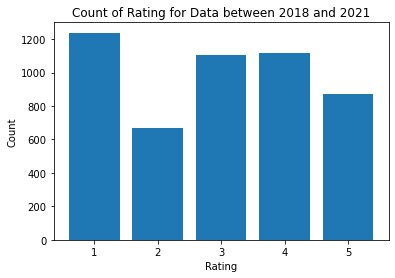

In [31]:
# Plot the count of different ratings for data between 2019 and 2021
snapchat_ios_us_review_score_count = snapchat_ios_us_review_YearMonth.groupby(['rating'])[['review']].nunique().rename(columns={'review':'count'})

plt.bar(snapchat_ios_us_review_score_count.index,snapchat_ios_us_review_score_count['count'])
plt.xlabel("Rating")
plt.ylabel("Count")
plt.title("Count of Rating for Data between 2019 and 2021")
plt.show()

Text(0.5, 1.0, 'Count of Rating for Each Year between 2018 and 2021')

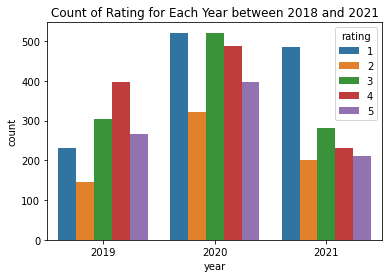

In [32]:
# Plot the count of different ratings for each year
snapchat_ios_us_review_score_count_ByYear = (snapchat_ios_us_review_YearMonth.groupby(['year','rating'])[['review']]
                                                                        .nunique()
                                                                        .rename(columns={'review':'count'})
                                                                        .reset_index()
                                              )

(sns.barplot(data=snapchat_ios_us_review_score_count_ByYear,x='year',y='count',hue='rating')
   .set_title("Count of Rating for Each Year between 2019 and 2021")
)

# Comment: extreme review score on 1 or 5

In [33]:
# Understand average ratings over year
snapchat_ios_us_review_avg_score_ByYear = (snapchat_ios_us_review_YearMonth.groupby(['year'])[['rating']]
                                                                       .mean()
                                              )

snapchat_ios_us_review_avg_score_ByYear['count'] = snapchat_ios_us_review_score_count_ByYear.groupby('year')[['count']].sum().values

print('Average ratings and count of each year:')
snapchat_ios_us_review_avg_score_ByYear

Average ratings and count of each year:


,rating,count
year,,
2019,3.236039,1343
2020,2.964858,2248
2021,2.632363,1409


# Dataframe Preparation for Topic Modelling

In [34]:
# Dataframe with data between 2019 and 2021 without score or year filtering
snapchat_ios_us_review_YearMonth.head()

,userName,review,date,title,rating,isEdited,year,month
0,Trick shot 98,"Snapchat is great! It’s intuitive design is always a help in understanding the basic amount of enjoyment this app can deliver to the user. Not only is it unlike any other social media app, with it...",2019-03-04,Almost there,4,False,2019,3
1,Reedle the beetle,I love this app and have continued to love it for four years. I love all of the filters and the way the messages erase. Snapchat is a truly original media and is loved by many. Although I love it ...,2019-03-04,Glitching A LOT!,4,False,2019,3
2,MaureenRGS,"I often use Snapchat to text friends. But recently one of my group chats have received many glitches. Everything seems to be delayed. When I send things, it doesn’t send for about a minute. And no...",2019-03-04,Group Chat Glitches,2,False,2019,3
3,VicTheGOAT23,"So I’ve had this app for a few years now and have had no major issues. Just recently, whenever I go to open the chat with my “Super BFF” it takes forever to load, see the message, save the message...",2019-03-05,Bug?,3,False,2019,3
4,Hdyxy,I think that Snapchat is a wonderful app that helps you communicate efficiently and quickly. Snapchat also offers a range of cool filters that allow some fun in this messaging app. Snapchat is sup...,2019-03-05,Love Snapchat 💕😊,5,False,2019,3


In [35]:
# Prepare dataframe for topic modelling for each score
# Obtain 5 dataframes with only score=1,2,3,4,5
snapchat_ios_us_review_YearMonth_score1 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating']==1]
snapchat_ios_us_review_YearMonth_score2 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating']==2]
snapchat_ios_us_review_YearMonth_score3 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating']==3]
snapchat_ios_us_review_YearMonth_score4 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating']==4]
snapchat_ios_us_review_YearMonth_score5 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating']==5]


In [36]:
# Prepare dataframe for grouped score
snapchat_ios_us_review_YearMonth_score1N2N3 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating'].isin([1,2,3])]
snapchat_ios_us_review_YearMonth_score4N5 = snapchat_ios_us_review_YearMonth[snapchat_ios_us_review_YearMonth['rating'].isin([4,5])]


In [37]:
# Prepare dataframe for topic modelling for 2019,2020,2021 for score = 1,2,3
snapchat_ios_us_review_YearMonth_2019_score1N2N3 = snapchat_ios_us_review_YearMonth[(snapchat_ios_us_review_YearMonth['year']==2019)&(snapchat_ios_us_review_YearMonth['rating'].isin([1,2,3]))]
snapchat_ios_us_review_YearMonth_2020_score1N2N3 = snapchat_ios_us_review_YearMonth[(snapchat_ios_us_review_YearMonth['year']==2020)&(snapchat_ios_us_review_YearMonth['rating'].isin([1,2,3]))]
snapchat_ios_us_review_YearMonth_2021_score1N2N3 = snapchat_ios_us_review_YearMonth[(snapchat_ios_us_review_YearMonth['year']==2021)&(snapchat_ios_us_review_YearMonth['rating'].isin([1,2,3]))]




# Overall LDA Topic Modelling

In [38]:
# Overall Topic Modelling - data between 2018 and 2021 without score or year filtering
# Convert to list - move to each section
review_us = snapchat_ios_us_review_YearMonth.review.values.tolist()
review_words_us = list(sent_to_words(review_us))
print(review_words_us[:1])

[['snapchat', 'is', 'great', 'it', 'intuitive', 'design', 'is', 'always', 'help', 'in', 'understanding', 'the', 'basic', 'amount', 'of', 'enjoyment', 'this', 'app', 'can', 'deliver', 'to', 'the', 'user', 'not', 'only', 'is', 'it', 'unlike', 'any', 'other', 'social', 'media', 'app', 'with', 'it', 'hud', 'for', 'editing', 'the', 'users', 'snapterpiece', 'but', 'also', 'allows', 'for', 'quick', 'easy', 'simple', 'but', 'fun', 'amount', 'of', 'time', 'on', 'an', 'app', 'but', 'one', 'bug', 'that', 'really', 'annoying', 'is', 'when', 'try', 'to', 'edit', 'picture', 'and', 'it', 'just', 'zooms', 'in', 'lot', 'fix', 'that', 'so', 'yee', 'pretty', 'boo']]


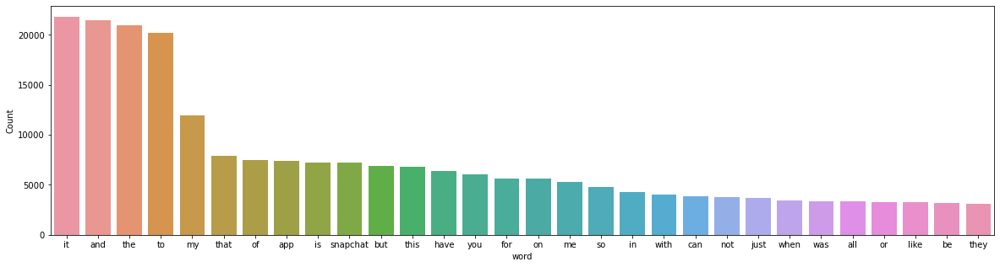

In [39]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us))

In [40]:
# Clean text
review_us_ready = process_words(review_words_us)  # processed Text Data! - move to each section

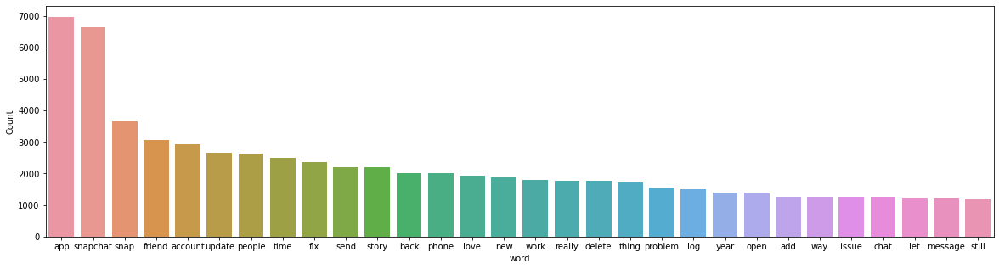

In [41]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready))

In [42]:
# Create Dictionary
id2word_us = corpora.Dictionary(review_us_ready)

2021-10-16 20:36:38,371 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 20:36:40,036 [INFO] gensim.corpora.dictionary - built Dictionary(6325 unique tokens: ['allow', 'always', 'amount', 'annoying', 'app']...) from 5000 documents (total 210453 corpus positions)
2021-10-16 20:36:40,121 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(6325 unique tokens: ['allow', 'always', 'amount', 'annoying', 'app']...) from 5000 documents (total 210453 corpus positions)", 'datetime': '2021-10-16T20:36:40.049275', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [43]:
# Create Corpus: Term Document Frequency
corpus_us = [id2word_us.doc2bow(text) for text in review_us_ready]

In [44]:
# Training LDA model
model_list_us, coherence_values_us = compute_coherence_values(dictionary=id2word_us, corpus=corpus_us, 
                                                              texts=review_us_ready, limit=30, start=2, step=5)

# Time Start: 03:44
# Time End: 
# Time Used: 

2021-10-16 20:36:41,180 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 20:36:41,182 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 20:36:41,190 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 20:36:41,196 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 5000 documents, updating model once every 1000 documents, evaluating perplexity every 5000 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 20:36:41,198 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/5000
2021-10-16 20:36:46,293 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:36:46,306 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.032*"app" + 0.017*"friend" + 0.016*"love" + 0.015*"story" + 0.014*"send" + 0.013*"fix" + 0.012*"snap" + 0.012*"time" + 0

2021-10-16 20:37:28,660 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.028*"app" + 0.024*"snapchat" + 0.017*"update" + 0.016*"people" + 0.015*"snap" + 0.015*"story" + 0.014*"friend" + 0.010*"love" + 0.010*"really" + 0.010*"thing"
2021-10-16 20:37:28,661 [INFO] gensim.models.ldamodel - topic diff=0.376063, rho=0.377964
2021-10-16 20:37:28,664 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #1000/5000
2021-10-16 20:37:32,046 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:37:32,055 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.037*"snapchat" + 0.027*"account" + 0.017*"snap" + 0.016*"fix" + 0.015*"phone" + 0.014*"send" + 0.014*"delete" + 0.014*"time" + 0.014*"friend"
2021-10-16 20:37:32,058 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.016*"people" + 0.015*"update" + 0.014*"friend" + 0.014*"snap" + 0.012*"love" + 0.010*"thing" + 0.0

2021-10-16 20:38:08,673 [INFO] gensim.models.ldamodel - topic diff=0.312085, rho=0.333333
2021-10-16 20:38:08,675 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/5000
2021-10-16 20:38:13,046 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:38:13,050 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.036*"snapchat" + 0.028*"account" + 0.018*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.014*"send" + 0.014*"time" + 0.014*"work"
2021-10-16 20:38:13,052 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.016*"people" + 0.016*"update" + 0.015*"friend" + 0.013*"snap" + 0.013*"love" + 0.010*"thing" + 0.010*"add"
2021-10-16 20:38:13,053 [INFO] gensim.models.ldamodel - topic diff=0.295848, rho=0.316228
2021-10-16 20:38:13,054 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2000/5000
2021-10-16 20:38:17,779 [INFO] gensim.mod

2021-10-16 20:38:57,734 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:38:57,767 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.036*"snapchat" + 0.028*"account" + 0.018*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.014*"time" + 0.014*"send"
2021-10-16 20:38:57,783 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.020*"story" + 0.016*"people" + 0.016*"update" + 0.016*"friend" + 0.013*"snap" + 0.013*"love" + 0.011*"thing" + 0.010*"add"
2021-10-16 20:38:57,789 [INFO] gensim.models.ldamodel - topic diff=0.263294, rho=0.288675
2021-10-16 20:38:57,793 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #2000/5000
2021-10-16 20:39:00,556 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:39:00,596 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.036*"snapchat" 

2021-10-16 20:39:35,842 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.020*"story" + 0.016*"people" + 0.016*"update" + 0.016*"friend" + 0.013*"love" + 0.013*"snap" + 0.011*"thing" + 0.010*"add"
2021-10-16 20:39:35,847 [INFO] gensim.models.ldamodel - topic diff=0.239561, rho=0.267261
2021-10-16 20:39:35,853 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2000/5000
2021-10-16 20:39:39,122 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:39:39,159 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.036*"snapchat" + 0.026*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.016*"work" + 0.015*"send" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:39:39,165 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.016*"people" + 0.016*"friend" + 0.015*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thi

2021-10-16 20:40:18,324 [INFO] gensim.models.ldamodel - topic diff=0.221167, rho=0.250000
2021-10-16 20:40:18,330 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/5000
2021-10-16 20:40:21,423 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:40:21,441 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.036*"snapchat" + 0.026*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.016*"work" + 0.015*"send" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:40:21,444 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.016*"people" + 0.016*"friend" + 0.015*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:40:21,446 [INFO] gensim.models.ldamodel - topic diff=0.209261, rho=0.250000
2021-10-16 20:40:21,449 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #3000/5000
2021-10-16 20:40:25,566 [INFO] gensim.m

2021-10-16 20:41:02,720 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:41:02,727 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.036*"snapchat" + 0.026*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.016*"work" + 0.015*"send" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:41:02,730 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.016*"people" + 0.016*"friend" + 0.015*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:41:02,732 [INFO] gensim.models.ldamodel - topic diff=0.195424, rho=0.235702
2021-10-16 20:41:02,734 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3000/5000
2021-10-16 20:41:05,229 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:41:05,282 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.038*"app" + 0.035*"snapchat"

2021-10-16 20:41:45,180 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.016*"people" + 0.016*"friend" + 0.015*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:41:45,181 [INFO] gensim.models.ldamodel - topic diff=0.183909, rho=0.223607
2021-10-16 20:41:45,189 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #3000/5000
2021-10-16 20:41:48,205 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:41:48,208 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.038*"app" + 0.035*"snapchat" + 0.024*"account" + 0.021*"snap" + 0.018*"fix" + 0.016*"send" + 0.016*"work" + 0.016*"delete" + 0.015*"phone" + 0.015*"time"
2021-10-16 20:41:48,211 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.010*"add" + 0.010*"th

2021-10-16 20:42:25,966 [INFO] gensim.models.ldamodel - topic diff=0.174144, rho=0.213201
2021-10-16 20:42:25,968 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #3000/5000
2021-10-16 20:42:30,051 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:42:30,092 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.038*"app" + 0.035*"snapchat" + 0.024*"account" + 0.021*"snap" + 0.018*"fix" + 0.016*"send" + 0.016*"work" + 0.015*"delete" + 0.015*"phone" + 0.015*"time"
2021-10-16 20:42:30,142 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:42:30,151 [INFO] gensim.models.ldamodel - topic diff=0.172743, rho=0.213201
2021-10-16 20:42:30,157 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #4000/5000
2021-10-16 20:42:33,756 [INFO] gensim.m

2021-10-16 20:43:07,353 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:43:07,357 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.038*"app" + 0.035*"snapchat" + 0.024*"account" + 0.021*"snap" + 0.018*"fix" + 0.016*"send" + 0.015*"work" + 0.015*"phone" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:43:07,359 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:43:07,361 [INFO] gensim.models.ldamodel - topic diff=0.164447, rho=0.204124
2021-10-16 20:43:07,363 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #4000/5000
2021-10-16 20:43:10,692 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:43:10,700 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.035*"snapchat"

2021-10-16 20:43:52,025 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:43:52,028 [INFO] gensim.models.ldamodel - topic diff=0.157204, rho=0.196116
2021-10-16 20:43:52,030 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #4000/5000
2021-10-16 20:43:54,431 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:43:54,435 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.035*"snapchat" + 0.027*"account" + 0.021*"snap" + 0.017*"fix" + 0.016*"send" + 0.015*"phone" + 0.015*"work" + 0.015*"time" + 0.015*"delete"
2021-10-16 20:43:54,438 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.018*"update" + 0.016*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"th

2021-10-16 20:44:26,602 [INFO] gensim.models.ldamodel - topic diff=0.150804, rho=0.188982
2021-10-16 20:44:26,609 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #4000/5000
2021-10-16 20:44:29,362 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:44:29,366 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.035*"snapchat" + 0.026*"account" + 0.021*"snap" + 0.017*"fix" + 0.016*"send" + 0.015*"phone" + 0.015*"work" + 0.015*"time" + 0.015*"delete"
2021-10-16 20:44:29,368 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.018*"update" + 0.016*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:44:29,370 [INFO] gensim.models.ldamodel - topic diff=0.165532, rho=0.188982
2021-10-16 20:44:32,765 [INFO] gensim.models.ldamodel - -6.302 per-word bound, 78.9 perplexity estimate based on a held-out corpus of 100

2021-10-16 20:45:05,859 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:45:05,868 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.035*"snapchat" + 0.026*"account" + 0.021*"snap" + 0.017*"fix" + 0.016*"send" + 0.015*"phone" + 0.015*"work" + 0.015*"time" + 0.015*"delete"
2021-10-16 20:45:05,873 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.018*"update" + 0.016*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:45:05,877 [INFO] gensim.models.ldamodel - topic diff=0.159372, rho=0.182574
2021-10-16 20:45:10,132 [INFO] gensim.models.ldamodel - -6.301 per-word bound, 78.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 20:45:10,134 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #5000/5000
2021-10-16 20:45:13,443 [INFO] gensim.models.ldamodel - mergi

2021-10-16 20:45:45,545 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.018*"update" + 0.016*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:45:45,547 [INFO] gensim.models.ldamodel - topic diff=0.153841, rho=0.176777
2021-10-16 20:45:50,772 [INFO] gensim.models.ldamodel - -6.300 per-word bound, 78.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 20:45:50,773 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #5000/5000
2021-10-16 20:45:53,458 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:45:53,465 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.028*"account" + 0.019*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.014*"time" + 0.014*"send"
2021-10-16 20:45:53,468 [INFO] gensim.models.ldamodel - topic

2021-10-16 20:46:27,140 [INFO] gensim.models.ldamodel - topic diff=0.148831, rho=0.171499
2021-10-16 20:46:31,137 [INFO] gensim.models.ldamodel - -6.300 per-word bound, 78.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 20:46:31,147 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #5000/5000
2021-10-16 20:46:34,654 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:46:34,658 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.028*"account" + 0.019*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.014*"time" + 0.014*"send"
2021-10-16 20:46:34,661 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.025*"snapchat" + 0.017*"update" + 0.017*"story" + 0.017*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:46:34,664 [INFO] gensim.models.ldamodel - topic

2021-10-16 20:47:05,793 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #5000/5000
2021-10-16 20:47:08,055 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:47:08,058 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.028*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.014*"time" + 0.014*"send"
2021-10-16 20:47:08,061 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.025*"snapchat" + 0.017*"update" + 0.017*"story" + 0.017*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:47:08,062 [INFO] gensim.models.ldamodel - topic diff=0.141903, rho=0.166667
2021-10-16 20:47:08,065 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/5000
2021-10-16 20:47:10,372 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-1

2021-10-16 20:47:42,284 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.028*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.014*"time" + 0.014*"send"
2021-10-16 20:47:42,288 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.025*"snapchat" + 0.017*"update" + 0.017*"story" + 0.017*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:47:42,290 [INFO] gensim.models.ldamodel - topic diff=0.137789, rho=0.162221
2021-10-16 20:47:42,291 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/5000
2021-10-16 20:47:44,537 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:47:44,540 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.027*"account" + 0.019*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.015*"send" + 0.015*"tim

2021-10-16 20:48:19,412 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.025*"snapchat" + 0.017*"story" + 0.017*"update" + 0.017*"people" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:48:19,416 [INFO] gensim.models.ldamodel - topic diff=0.134004, rho=0.158114
2021-10-16 20:48:19,418 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/5000
2021-10-16 20:48:22,815 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:48:22,824 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.027*"account" + 0.019*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.015*"send" + 0.015*"time"
2021-10-16 20:48:22,829 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"th

2021-10-16 20:48:57,854 [INFO] gensim.models.ldamodel - topic diff=0.130507, rho=0.154303
2021-10-16 20:48:57,871 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/5000
2021-10-16 20:49:03,345 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:49:03,349 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.027*"account" + 0.019*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.015*"send" + 0.015*"time"
2021-10-16 20:49:03,351 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:49:03,353 [INFO] gensim.models.ldamodel - topic diff=0.126107, rho=0.152499
2021-10-16 20:49:03,355 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #2000/5000
2021-10-16 20:49:07,104 [INFO] gensim.m

2021-10-16 20:49:44,439 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:49:44,451 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.027*"account" + 0.019*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"delete" + 0.015*"work" + 0.015*"send" + 0.015*"time"
2021-10-16 20:49:44,482 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:49:44,499 [INFO] gensim.models.ldamodel - topic diff=0.122999, rho=0.149071
2021-10-16 20:49:44,502 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #2000/5000
2021-10-16 20:49:47,343 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:49:47,439 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat"

2021-10-16 20:50:25,051 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:50:25,057 [INFO] gensim.models.ldamodel - topic diff=0.120102, rho=0.145865
2021-10-16 20:50:25,177 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #2000/5000
2021-10-16 20:50:28,081 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:50:28,096 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.026*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"work" + 0.015*"send" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:50:28,110 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.017*"people" + 0.016*"friend" + 0.016*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"th

2021-10-16 20:51:05,475 [INFO] gensim.models.ldamodel - topic diff=0.117392, rho=0.142857
2021-10-16 20:51:05,480 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/5000
2021-10-16 20:51:08,055 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:51:08,059 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.026*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"work" + 0.015*"send" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:51:08,061 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.017*"people" + 0.016*"friend" + 0.016*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:51:08,063 [INFO] gensim.models.ldamodel - topic diff=0.111462, rho=0.142857
2021-10-16 20:51:08,065 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3000/5000
2021-10-16 20:51:11,240 [INFO] gensim.m

2021-10-16 20:51:47,339 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:51:47,353 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.026*"account" + 0.020*"snap" + 0.017*"fix" + 0.016*"phone" + 0.015*"work" + 0.015*"send" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:51:47,355 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.017*"people" + 0.016*"friend" + 0.016*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:51:47,357 [INFO] gensim.models.ldamodel - topic diff=0.109059, rho=0.140028
2021-10-16 20:51:47,360 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #3000/5000
2021-10-16 20:51:51,354 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:51:51,373 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat"

2021-10-16 20:52:25,791 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.018*"story" + 0.017*"people" + 0.016*"friend" + 0.016*"update" + 0.013*"love" + 0.013*"snap" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:52:25,795 [INFO] gensim.models.ldamodel - topic diff=0.106799, rho=0.137361
2021-10-16 20:52:25,797 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #3000/5000
2021-10-16 20:52:28,821 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:52:28,828 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.024*"account" + 0.021*"snap" + 0.017*"fix" + 0.016*"send" + 0.015*"phone" + 0.015*"work" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:52:28,835 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"th

2021-10-16 20:53:06,066 [INFO] gensim.models.ldamodel - topic diff=0.104672, rho=0.134840
2021-10-16 20:53:06,071 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #3000/5000
2021-10-16 20:53:09,981 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:53:09,986 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"app" + 0.035*"snapchat" + 0.024*"account" + 0.021*"snap" + 0.017*"fix" + 0.016*"send" + 0.015*"phone" + 0.015*"work" + 0.015*"delete" + 0.015*"time"
2021-10-16 20:53:09,991 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"app" + 0.026*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"update" + 0.016*"friend" + 0.014*"snap" + 0.013*"love" + 0.011*"add" + 0.010*"thing"
2021-10-16 20:53:09,994 [INFO] gensim.models.ldamodel - topic diff=0.104074, rho=0.134840
2021-10-16 20:53:10,002 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #4000/5000
2021-10-16 20:53:12,379 [INFO] gensim.m

2021-10-16 20:54:05,953 [INFO] gensim.models.ldamodel - topic diff=0.596990, rho=0.577350
2021-10-16 20:54:05,958 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #4000/5000
2021-10-16 20:54:10,141 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:54:10,153 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"app" + 0.025*"love" + 0.016*"snapchat" + 0.016*"friend" + 0.016*"update" + 0.015*"new" + 0.012*"story" + 0.012*"thing" + 0.011*"filter" + 0.011*"color"
2021-10-16 20:54:10,158 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.035*"snapchat" + 0.034*"app" + 0.024*"snap" + 0.021*"time" + 0.021*"fix" + 0.019*"update" + 0.014*"friend" + 0.011*"people" + 0.011*"problem" + 0.011*"year"
2021-10-16 20:54:10,162 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.035*"app" + 0.025*"snapchat" + 0.021*"story" + 0.020*"people" + 0.019*"update" + 0.014*"friend" + 0.012*"snap" + 0.012*"time" + 0.012*"love" + 0.011

2021-10-16 20:54:39,401 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"app" + 0.035*"snapchat" + 0.026*"fix" + 0.024*"time" + 0.022*"snap" + 0.020*"update" + 0.015*"problem" + 0.013*"issue" + 0.012*"friend" + 0.012*"delete"
2021-10-16 20:54:39,403 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"app" + 0.038*"snap" + 0.031*"snapchat" + 0.029*"send" + 0.023*"open" + 0.022*"friend" + 0.019*"message" + 0.017*"work" + 0.013*"update" + 0.013*"fix"
2021-10-16 20:54:39,405 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.039*"people" + 0.022*"add" + 0.018*"user" + 0.012*"quick" + 0.012*"list" + 0.011*"story" + 0.011*"private" + 0.010*"snapchat" + 0.010*"privacy" + 0.010*"snap"
2021-10-16 20:54:39,406 [INFO] gensim.models.ldamodel - topic diff=0.392487, rho=0.377964
2021-10-16 20:54:43,414 [INFO] gensim.models.ldamodel - -6.471 per-word bound, 88.7 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 20:54:43,415 [INFO] gensim.models

2021-10-16 20:55:02,114 [INFO] gensim.models.ldamodel - topic diff=0.305629, rho=0.353553
2021-10-16 20:55:08,035 [INFO] gensim.models.ldamodel - -6.424 per-word bound, 85.9 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 20:55:08,069 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #5000/5000
2021-10-16 20:55:11,248 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:55:11,262 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.056*"app" + 0.037*"snapchat" + 0.028*"fix" + 0.023*"time" + 0.022*"update" + 0.017*"problem" + 0.017*"delete" + 0.016*"snap" + 0.015*"phone" + 0.014*"work"
2021-10-16 20:55:11,343 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"love" + 0.031*"friend" + 0.029*"filter" + 0.027*"app" + 0.023*"bitmoji" + 0.020*"game" + 0.020*"add" + 0.018*"thing" + 0.016*"snapchat" + 0.016*"fun"
2021-10-16 20:55:11,349 [INFO] gensim.models.ldamodel - topic

2021-10-16 20:55:37,404 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.087*"account" + 0.039*"snapchat" + 0.035*"lock" + 0.024*"log" + 0.020*"email" + 0.019*"back" + 0.015*"new" + 0.014*"memory" + 0.014*"help" + 0.013*"support"
2021-10-16 20:55:37,406 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"app" + 0.030*"snapchat" + 0.024*"update" + 0.021*"people" + 0.015*"new" + 0.014*"story" + 0.014*"friend" + 0.012*"snap" + 0.011*"really" + 0.011*"look"
2021-10-16 20:55:37,407 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"app" + 0.041*"snap" + 0.031*"send" + 0.027*"snapchat" + 0.025*"open" + 0.021*"friend" + 0.019*"message" + 0.018*"work" + 0.014*"fix" + 0.014*"phone"
2021-10-16 20:55:37,424 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.039*"love" + 0.037*"friend" + 0.034*"filter" + 0.026*"app" + 0.023*"add" + 0.022*"bitmoji" + 0.019*"game" + 0.018*"thing" + 0.018*"snapchat" + 0.017*"fun"
2021-10-16 20:55:37,429 [INFO] gensim.models.ldamodel - topic diff=0.2509

2021-10-16 20:55:59,747 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.064*"app" + 0.040*"snapchat" + 0.029*"fix" + 0.023*"time" + 0.021*"update" + 0.019*"delete" + 0.018*"phone" + 0.018*"work" + 0.018*"problem" + 0.015*"issue"
2021-10-16 20:55:59,753 [INFO] gensim.models.ldamodel - topic diff=0.212280, rho=0.316228
2021-10-16 20:55:59,756 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/5000
2021-10-16 20:56:02,721 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:56:02,733 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.061*"app" + 0.042*"snapchat" + 0.031*"fix" + 0.024*"time" + 0.020*"update" + 0.019*"problem" + 0.019*"phone" + 0.018*"work" + 0.018*"delete" + 0.015*"issue"
2021-10-16 20:56:02,736 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.031*"snapchat" + 0.029*"app" + 0.022*"update" + 0.021*"people" + 0.016*"story" + 0.014*"new" + 0.013*"friend" + 0.012*"change" + 0.011*"really" + 0.

2021-10-16 20:56:23,769 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"snapchat" + 0.028*"app" + 0.023*"update" + 0.021*"people" + 0.015*"story" + 0.015*"new" + 0.013*"friend" + 0.012*"change" + 0.011*"snap" + 0.011*"really"
2021-10-16 20:56:23,771 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.064*"app" + 0.043*"snapchat" + 0.031*"fix" + 0.024*"time" + 0.020*"update" + 0.020*"phone" + 0.020*"work" + 0.019*"problem" + 0.019*"delete" + 0.015*"issue"
2021-10-16 20:56:23,773 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"people" + 0.043*"add" + 0.022*"user" + 0.021*"private" + 0.017*"privacy" + 0.016*"quick" + 0.014*"list" + 0.010*"limit" + 0.009*"simple" + 0.009*"idea"
2021-10-16 20:56:23,776 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"love" + 0.043*"friend" + 0.043*"filter" + 0.027*"app" + 0.025*"add" + 0.023*"snapchat" + 0.021*"game" + 0.020*"thing" + 0.018*"fun" + 0.018*"bitmoji"
2021-10-16 20:56:23,777 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 20:56:45,074 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.059*"video" + 0.054*"story" + 0.033*"picture" + 0.030*"camera" + 0.027*"watch" + 0.025*"post" + 0.020*"save" + 0.015*"iphone" + 0.015*"photo" + 0.014*"snapchat"
2021-10-16 20:56:45,076 [INFO] gensim.models.ldamodel - topic diff=0.151477, rho=0.277350
2021-10-16 20:56:45,078 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #2000/5000
2021-10-16 20:56:48,021 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:56:48,028 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"filter" + 0.046*"friend" + 0.045*"love" + 0.028*"app" + 0.027*"add" + 0.024*"snapchat" + 0.019*"game" + 0.019*"great" + 0.018*"thing" + 0.017*"fun"
2021-10-16 20:56:48,030 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.027*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"

2021-10-16 20:57:04,957 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.048*"add" + 0.046*"people" + 0.023*"private" + 0.019*"user" + 0.016*"quick" + 0.015*"privacy" + 0.013*"list" + 0.010*"limit" + 0.009*"simple" + 0.008*"idea"
2021-10-16 20:57:04,961 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.067*"app" + 0.044*"snapchat" + 0.031*"fix" + 0.023*"work" + 0.023*"time" + 0.021*"phone" + 0.019*"problem" + 0.019*"update" + 0.019*"delete" + 0.014*"issue"
2021-10-16 20:57:04,964 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.047*"friend" + 0.046*"filter" + 0.045*"love" + 0.029*"app" + 0.028*"add" + 0.026*"snapchat" + 0.019*"great" + 0.018*"game" + 0.018*"thing" + 0.017*"fun"
2021-10-16 20:57:04,967 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.086*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.027*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"support"
2021-10-16 20:57:04,969 [INFO] gensim.models.ldamodel - topic diff=0.106

2021-10-16 20:57:18,759 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"snap" + 0.038*"send" + 0.032*"app" + 0.024*"snapchat" + 0.024*"friend" + 0.023*"message" + 0.020*"open" + 0.015*"chat" + 0.015*"fix" + 0.013*"people"
2021-10-16 20:57:18,763 [INFO] gensim.models.ldamodel - topic diff=0.099276, rho=0.258199
2021-10-16 20:57:18,767 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #3000/5000
2021-10-16 20:57:21,411 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:57:21,417 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.048*"add" + 0.047*"people" + 0.030*"private" + 0.019*"user" + 0.018*"privacy" + 0.015*"list" + 0.014*"quick" + 0.009*"simple" + 0.008*"limit" + 0.008*"idea"
2021-10-16 20:57:21,419 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"snapchat" + 0.028*"app" + 0.026*"update" + 0.020*"people" + 0.016*"new" + 0.014*"story" + 0.014*"change" + 0.013*"snap" + 0.011*"way" + 0.011*"re

2021-10-16 20:57:35,624 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.069*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.024*"work" + 0.022*"time" + 0.022*"phone" + 0.020*"delete" + 0.020*"problem" + 0.019*"update" + 0.014*"issue"
2021-10-16 20:57:35,626 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"snapchat" + 0.028*"app" + 0.026*"update" + 0.020*"people" + 0.016*"new" + 0.014*"story" + 0.014*"change" + 0.013*"snap" + 0.011*"way" + 0.011*"really"
2021-10-16 20:57:35,628 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.049*"add" + 0.047*"people" + 0.030*"private" + 0.019*"user" + 0.018*"privacy" + 0.015*"list" + 0.014*"quick" + 0.009*"simple" + 0.009*"limit" + 0.008*"idea"
2021-10-16 20:57:35,630 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.050*"snap" + 0.040*"send" + 0.029*"app" + 0.024*"friend" + 0.023*"snapchat" + 0.022*"message" + 0.022*"open" + 0.016*"chat" + 0.015*"fix" + 0.014*"people"
2021-10-16 20:57:35,632 [INFO] gensim.models.ldamodel - topic diff=0.09

2021-10-16 20:57:51,407 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.049*"add" + 0.047*"people" + 0.030*"private" + 0.018*"privacy" + 0.018*"user" + 0.015*"quick" + 0.014*"list" + 0.009*"simple" + 0.009*"limit" + 0.008*"idea"
2021-10-16 20:57:51,408 [INFO] gensim.models.ldamodel - topic diff=0.091268, rho=0.242536
2021-10-16 20:57:51,415 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #4000/5000
2021-10-16 20:57:54,343 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:57:54,354 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.039*"snapchat" + 0.036*"lock" + 0.024*"log" + 0.020*"email" + 0.018*"back" + 0.014*"help" + 0.013*"support" + 0.013*"new" + 0.013*"memory"
2021-10-16 20:57:54,356 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.053*"snap" + 0.041*"send" + 0.028*"app" + 0.024*"friend" + 0.023*"message" + 0.022*"snapchat" + 0.022*"open" + 0.017*"chat" + 0.015*"fix" + 0.014*"

2021-10-16 20:58:07,260 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.066*"video" + 0.050*"story" + 0.039*"picture" + 0.035*"camera" + 0.026*"watch" + 0.024*"post" + 0.022*"save" + 0.018*"photo" + 0.017*"iphone" + 0.015*"memory"
2021-10-16 20:58:07,262 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.051*"add" + 0.045*"people" + 0.026*"private" + 0.019*"privacy" + 0.019*"user" + 0.016*"quick" + 0.014*"list" + 0.009*"limit" + 0.009*"simple" + 0.008*"select"
2021-10-16 20:58:07,264 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.053*"snap" + 0.041*"send" + 0.028*"app" + 0.024*"friend" + 0.024*"message" + 0.022*"open" + 0.022*"snapchat" + 0.018*"chat" + 0.015*"fix" + 0.015*"people"
2021-10-16 20:58:07,266 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.044*"love" + 0.042*"filter" + 0.033*"app" + 0.029*"add" + 0.029*"snapchat" + 0.020*"great" + 0.018*"thing" + 0.018*"people" + 0.017*"fun"
2021-10-16 20:58:07,268 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 20:58:21,328 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.054*"snap" + 0.041*"send" + 0.027*"app" + 0.024*"friend" + 0.024*"message" + 0.022*"open" + 0.022*"snapchat" + 0.018*"chat" + 0.015*"people" + 0.015*"fix"
2021-10-16 20:58:21,330 [INFO] gensim.models.ldamodel - topic diff=0.110691, rho=0.229416
2021-10-16 20:58:24,812 [INFO] gensim.models.ldamodel - -6.333 per-word bound, 80.6 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 20:58:24,815 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #5000/5000
2021-10-16 20:58:26,910 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:58:26,916 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.043*"snapchat" + 0.029*"fix" + 0.026*"work" + 0.024*"phone" + 0.021*"time" + 0.021*"delete" + 0.021*"update" + 0.018*"problem" + 0.014*"let"
2021-10-16 20:58:26,917 [INFO] gensim.models.ldamodel - topic

2021-10-16 20:58:41,553 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"app" + 0.028*"update" + 0.028*"snapchat" + 0.019*"people" + 0.017*"new" + 0.014*"change" + 0.013*"story" + 0.012*"snap" + 0.011*"ad" + 0.011*"look"
2021-10-16 20:58:41,555 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.071*"video" + 0.048*"story" + 0.040*"picture" + 0.032*"camera" + 0.026*"watch" + 0.024*"post" + 0.023*"save" + 0.018*"photo" + 0.017*"memory" + 0.016*"iphone"
2021-10-16 20:58:41,557 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.043*"snapchat" + 0.029*"fix" + 0.026*"work" + 0.024*"phone" + 0.021*"time" + 0.021*"delete" + 0.021*"update" + 0.018*"problem" + 0.014*"let"
2021-10-16 20:58:41,560 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.052*"add" + 0.046*"people" + 0.025*"private" + 0.021*"user" + 0.020*"privacy" + 0.017*"quick" + 0.014*"list" + 0.010*"limit" + 0.009*"simple" + 0.009*"name"
2021-10-16 20:58:41,562 [INFO] gensim.models.ldamodel - topic #2 (0.143)

2021-10-16 20:58:55,590 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.072*"app" + 0.043*"snapchat" + 0.029*"fix" + 0.026*"work" + 0.024*"phone" + 0.021*"time" + 0.021*"delete" + 0.021*"update" + 0.018*"problem" + 0.014*"let"
2021-10-16 20:58:55,593 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.054*"snap" + 0.041*"send" + 0.026*"app" + 0.024*"friend" + 0.024*"message" + 0.022*"open" + 0.021*"snapchat" + 0.019*"chat" + 0.016*"people" + 0.015*"fix"
2021-10-16 20:58:55,595 [INFO] gensim.models.ldamodel - topic diff=0.116676, rho=0.218218
2021-10-16 20:58:55,598 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/5000
2021-10-16 20:58:57,922 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:58:57,928 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.067*"video" + 0.052*"story" + 0.038*"picture" + 0.034*"camera" + 0.028*"watch" + 0.025*"post" + 0.023*"save" + 0.018*"iphone" + 0.017*"photo" + 0.016*"

2021-10-16 20:59:12,200 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.050*"snap" + 0.041*"send" + 0.025*"app" + 0.024*"message" + 0.024*"friend" + 0.022*"snapchat" + 0.019*"open" + 0.018*"chat" + 0.016*"people" + 0.015*"story"
2021-10-16 20:59:12,204 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.070*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.027*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.020*"update" + 0.019*"problem" + 0.014*"back"
2021-10-16 20:59:12,210 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.050*"friend" + 0.044*"love" + 0.043*"filter" + 0.034*"app" + 0.031*"snapchat" + 0.027*"add" + 0.021*"great" + 0.019*"people" + 0.019*"thing" + 0.017*"fun"
2021-10-16 20:59:12,212 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.053*"add" + 0.046*"people" + 0.025*"private" + 0.022*"user" + 0.019*"privacy" + 0.016*"quick" + 0.013*"list" + 0.010*"limit" + 0.009*"simple" + 0.009*"idea"
2021-10-16 20:59:12,216 [INFO] gensim.models.ldamodel - topic #2 (0.143

2021-10-16 20:59:26,341 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"snapchat" + 0.028*"app" + 0.026*"update" + 0.019*"people" + 0.016*"new" + 0.015*"story" + 0.014*"change" + 0.011*"snap" + 0.011*"ad" + 0.011*"look"
2021-10-16 20:59:26,344 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.067*"video" + 0.052*"story" + 0.039*"picture" + 0.034*"camera" + 0.028*"watch" + 0.025*"post" + 0.023*"save" + 0.018*"iphone" + 0.018*"photo" + 0.016*"memory"
2021-10-16 20:59:26,346 [INFO] gensim.models.ldamodel - topic diff=0.094686, rho=0.204124
2021-10-16 20:59:26,348 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #2000/5000
2021-10-16 20:59:28,472 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:59:28,485 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.054*"add" + 0.046*"people" + 0.024*"private" + 0.021*"user" + 0.017*"privacy" + 0.016*"quick" + 0.012*"list" + 0.010*"limit" + 0.010*"remove" + 0.009

2021-10-16 20:59:42,315 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:59:42,322 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.055*"add" + 0.046*"people" + 0.024*"private" + 0.021*"user" + 0.017*"privacy" + 0.016*"quick" + 0.012*"list" + 0.011*"remove" + 0.010*"limit" + 0.009*"name"
2021-10-16 20:59:42,324 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"snapchat" + 0.028*"app" + 0.025*"update" + 0.018*"people" + 0.016*"new" + 0.014*"story" + 0.013*"change" + 0.011*"snap" + 0.011*"look" + 0.011*"ad"
2021-10-16 20:59:42,326 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.052*"snap" + 0.042*"send" + 0.025*"friend" + 0.025*"app" + 0.025*"message" + 0.021*"snapchat" + 0.019*"open" + 0.018*"chat" + 0.016*"people" + 0.015*"story"
2021-10-16 20:59:42,327 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.065*"video" + 0.049*"story" + 0.040*"picture" + 0.035*"camera" + 0.027*"watch" + 0.024*"save" + 0.024*"pos

2021-10-16 20:59:57,476 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.070*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.019*"problem" + 0.019*"update" + 0.013*"let"
2021-10-16 20:59:57,478 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.050*"friend" + 0.045*"filter" + 0.044*"love" + 0.034*"app" + 0.032*"snapchat" + 0.027*"add" + 0.021*"great" + 0.019*"people" + 0.017*"thing" + 0.017*"really"
2021-10-16 20:59:57,479 [INFO] gensim.models.ldamodel - topic diff=0.068397, rho=0.196116
2021-10-16 20:59:57,483 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3000/5000
2021-10-16 20:59:59,924 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 20:59:59,930 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.056*"add" + 0.048*"people" + 0.029*"private" + 0.020*"user" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.013*"remove" + 0.010*"name" + 0.009

2021-10-16 21:00:13,493 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:00:13,502 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.054*"snap" + 0.043*"send" + 0.024*"friend" + 0.024*"message" + 0.024*"app" + 0.021*"snapchat" + 0.021*"open" + 0.019*"chat" + 0.017*"people" + 0.017*"story"
2021-10-16 21:00:13,507 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.021*"delete" + 0.019*"problem" + 0.019*"update" + 0.013*"let"
2021-10-16 21:00:13,512 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.056*"add" + 0.048*"people" + 0.029*"private" + 0.021*"user" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.013*"remove" + 0.010*"name" + 0.009*"simple"
2021-10-16 21:00:13,515 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"snapchat" + 0.028*"app" + 0.028*"update" + 0.018*"people" + 0.016*"new" + 0.014*"story" + 0.014*"c

2021-10-16 21:00:29,221 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.025*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"password"
2021-10-16 21:00:29,225 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"video" + 0.049*"story" + 0.042*"picture" + 0.037*"camera" + 0.027*"watch" + 0.025*"save" + 0.024*"post" + 0.020*"photo" + 0.018*"iphone" + 0.018*"memory"
2021-10-16 21:00:29,227 [INFO] gensim.models.ldamodel - topic diff=0.067127, rho=0.188982
2021-10-16 21:00:29,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #4000/5000
2021-10-16 21:00:31,685 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:00:31,691 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"help" + 0.013*"new" + 0.013*"support" + 0.

2021-10-16 21:00:45,259 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.043*"send" + 0.025*"message" + 0.024*"friend" + 0.023*"app" + 0.022*"open" + 0.020*"snapchat" + 0.020*"chat" + 0.017*"people" + 0.016*"story"
2021-10-16 21:00:45,271 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"help" + 0.013*"new" + 0.013*"support" + 0.013*"memory"
2021-10-16 21:00:45,286 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.070*"app" + 0.043*"snapchat" + 0.030*"fix" + 0.027*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.020*"update" + 0.019*"problem" + 0.013*"let"
2021-10-16 21:00:45,292 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"update" + 0.028*"app" + 0.028*"snapchat" + 0.017*"people" + 0.017*"new" + 0.014*"change" + 0.014*"story" + 0.012*"snap" + 0.011*"ad" + 0.011*"look"
2021-10-16 21:00:45,299 [INFO] gensim.models.ldamodel - topic #4 (0.143): 

2021-10-16 21:00:58,967 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"update" + 0.028*"app" + 0.027*"snapchat" + 0.017*"new" + 0.017*"people" + 0.014*"change" + 0.014*"story" + 0.012*"snap" + 0.011*"ad" + 0.011*"look"
2021-10-16 21:00:58,969 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"friend" + 0.044*"love" + 0.042*"filter" + 0.035*"app" + 0.032*"snapchat" + 0.028*"add" + 0.022*"great" + 0.019*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:00:58,970 [INFO] gensim.models.ldamodel - topic diff=0.084404, rho=0.182574
2021-10-16 21:01:01,698 [INFO] gensim.models.ldamodel - -6.324 per-word bound, 80.1 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:01:01,698 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #5000/5000
2021-10-16 21:01:03,565 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:01:03,571 [INFO] gensim.models.ldamodel - topi

2021-10-16 21:01:14,528 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #5000/5000
2021-10-16 21:01:16,449 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:01:16,457 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.042*"send" + 0.025*"message" + 0.024*"friend" + 0.023*"app" + 0.022*"open" + 0.020*"snapchat" + 0.020*"chat" + 0.017*"people" + 0.015*"story"
2021-10-16 21:01:16,459 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.060*"add" + 0.049*"people" + 0.025*"private" + 0.023*"user" + 0.019*"privacy" + 0.016*"quick" + 0.015*"remove" + 0.014*"list" + 0.011*"name" + 0.009*"limit"
2021-10-16 21:01:16,463 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.087*"account" + 0.039*"snapchat" + 0.034*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.015*"new" + 0.014*"memory" + 0.013*"help" + 0.013*"support"
2021-10-16 21:01:16,465 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*

2021-10-16 21:01:29,330 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.042*"send" + 0.025*"message" + 0.024*"friend" + 0.023*"app" + 0.022*"open" + 0.020*"chat" + 0.020*"snapchat" + 0.017*"people" + 0.016*"story"
2021-10-16 21:01:29,332 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.029*"update" + 0.028*"app" + 0.027*"snapchat" + 0.018*"people" + 0.017*"new" + 0.014*"change" + 0.014*"story" + 0.012*"ad" + 0.012*"snap" + 0.011*"look"
2021-10-16 21:01:29,335 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"friend" + 0.042*"love" + 0.039*"filter" + 0.036*"app" + 0.032*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:01:29,336 [INFO] gensim.models.ldamodel - topic diff=0.091911, rho=0.176777
2021-10-16 21:01:29,338 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1000/5000
2021-10-16 21:01:31,451 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 doc

2021-10-16 21:01:42,158 [INFO] gensim.models.ldamodel - topic diff=0.090371, rho=0.174078
2021-10-16 21:01:42,161 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/5000
2021-10-16 21:01:44,205 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:01:44,210 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"snapchat" + 0.028*"app" + 0.027*"update" + 0.018*"people" + 0.016*"new" + 0.015*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:01:44,212 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.070*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.021*"delete" + 0.020*"update" + 0.019*"problem" + 0.014*"let"
2021-10-16 21:01:44,213 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"video" + 0.048*"story" + 0.041*"picture" + 0.036*"camera" + 0.028*"watch" + 0.025*"post" + 0.024*"save" + 0.019*"iphone" + 0.018*"photo" + 0.018*"me

2021-10-16 21:01:57,743 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.043*"love" + 0.041*"filter" + 0.035*"app" + 0.033*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:01:57,745 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"snapchat" + 0.028*"app" + 0.027*"update" + 0.017*"people" + 0.016*"new" + 0.015*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:01:57,747 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.086*"account" + 0.040*"snapchat" + 0.034*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"support"
2021-10-16 21:01:57,750 [INFO] gensim.models.ldamodel - topic diff=0.075006, rho=0.169031
2021-10-16 21:01:57,752 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #2000/5000
2021-10-16 21:02:00,111 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 doc

2021-10-16 21:02:12,136 [INFO] gensim.models.ldamodel - topic diff=0.073732, rho=0.166667
2021-10-16 21:02:12,138 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/5000
2021-10-16 21:02:14,014 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:02:14,035 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.019*"problem" + 0.019*"update" + 0.014*"let"
2021-10-16 21:02:14,043 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"snapchat" + 0.028*"app" + 0.027*"update" + 0.017*"people" + 0.016*"new" + 0.015*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:02:14,049 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.024*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"suppo

2021-10-16 21:02:26,860 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.019*"problem" + 0.019*"update" + 0.014*"let"
2021-10-16 21:02:26,862 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.053*"snap" + 0.043*"send" + 0.025*"message" + 0.025*"friend" + 0.022*"app" + 0.020*"snapchat" + 0.020*"open" + 0.019*"chat" + 0.017*"people" + 0.017*"story"
2021-10-16 21:02:26,865 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.067*"video" + 0.046*"story" + 0.042*"picture" + 0.036*"camera" + 0.027*"watch" + 0.025*"save" + 0.024*"post" + 0.021*"photo" + 0.020*"iphone" + 0.018*"memory"
2021-10-16 21:02:26,867 [INFO] gensim.models.ldamodel - topic diff=0.055639, rho=0.164399
2021-10-16 21:02:26,870 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #3000/5000
2021-10-16 21:02:28,987 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 

2021-10-16 21:02:39,919 [INFO] gensim.models.ldamodel - topic diff=0.054822, rho=0.162221
2021-10-16 21:02:39,921 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #3000/5000
2021-10-16 21:02:42,066 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:02:42,077 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.021*"time" + 0.021*"delete" + 0.019*"problem" + 0.019*"update" + 0.014*"let"
2021-10-16 21:02:42,080 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.063*"add" + 0.050*"people" + 0.028*"private" + 0.021*"user" + 0.019*"remove" + 0.018*"privacy" + 0.014*"quick" + 0.014*"list" + 0.011*"name" + 0.009*"idea"
2021-10-16 21:02:42,082 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.024*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"pa

2021-10-16 21:02:56,473 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.050*"friend" + 0.043*"love" + 0.041*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:02:56,474 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"update" + 0.028*"snapchat" + 0.028*"app" + 0.017*"people" + 0.017*"new" + 0.015*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"snap" + 0.011*"look"
2021-10-16 21:02:56,476 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.024*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"password"
2021-10-16 21:02:56,477 [INFO] gensim.models.ldamodel - topic diff=0.055704, rho=0.160128
2021-10-16 21:02:56,478 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #4000/5000
2021-10-16 21:02:58,532 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 do

2021-10-16 21:03:11,156 [INFO] gensim.models.ldamodel - topic diff=0.054887, rho=0.158114
2021-10-16 21:03:11,158 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #4000/5000
2021-10-16 21:03:13,363 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:03:13,375 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"help" + 0.014*"new" + 0.013*"support" + 0.013*"memory"
2021-10-16 21:03:13,379 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"add" + 0.049*"people" + 0.025*"private" + 0.022*"user" + 0.019*"remove" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.011*"name" + 0.009*"option"
2021-10-16 21:03:13,385 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"friend" + 0.043*"love" + 0.040*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.028*"add" + 0.022*"great" + 0.020*"people" + 0.018*"really" + 0.

2021-10-16 21:03:26,374 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"help" + 0.014*"new" + 0.013*"support" + 0.013*"memory"
2021-10-16 21:03:26,377 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"update" + 0.028*"app" + 0.027*"snapchat" + 0.017*"new" + 0.017*"people" + 0.014*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"snap" + 0.011*"look"
2021-10-16 21:03:26,380 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"add" + 0.049*"people" + 0.025*"private" + 0.022*"user" + 0.019*"remove" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.011*"name" + 0.009*"option"
2021-10-16 21:03:26,382 [INFO] gensim.models.ldamodel - topic diff=0.070509, rho=0.156174
2021-10-16 21:03:29,100 [INFO] gensim.models.ldamodel - -6.319 per-word bound, 79.9 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:03:29,101 [INFO] gensim.models.lda

2021-10-16 21:03:40,049 [INFO] gensim.models.ldamodel - topic diff=0.069541, rho=0.154303
2021-10-16 21:03:42,564 [INFO] gensim.models.ldamodel - -6.319 per-word bound, 79.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:03:42,566 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #5000/5000
2021-10-16 21:03:44,516 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:03:44,557 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.052*"friend" + 0.042*"love" + 0.039*"filter" + 0.036*"app" + 0.032*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:03:44,562 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.072*"video" + 0.044*"story" + 0.043*"picture" + 0.035*"camera" + 0.026*"watch" + 0.025*"post" + 0.024*"save" + 0.019*"photo" + 0.019*"memory" + 0.018*"iphone"
2021-10-16 21:03:44,569 [INFO] gensim.models.ldamodel 

2021-10-16 21:03:57,734 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.043*"send" + 0.025*"message" + 0.024*"friend" + 0.021*"app" + 0.021*"open" + 0.021*"chat" + 0.019*"snapchat" + 0.018*"people" + 0.016*"story"
2021-10-16 21:03:57,735 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.029*"update" + 0.028*"app" + 0.027*"snapchat" + 0.017*"new" + 0.017*"people" + 0.014*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"snap" + 0.011*"look"
2021-10-16 21:03:57,736 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"add" + 0.050*"people" + 0.024*"private" + 0.023*"user" + 0.019*"remove" + 0.019*"privacy" + 0.016*"quick" + 0.014*"list" + 0.012*"name" + 0.010*"option"
2021-10-16 21:03:57,737 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.086*"account" + 0.039*"snapchat" + 0.034*"lock" + 0.022*"log" + 0.020*"email" + 0.018*"back" + 0.015*"new" + 0.014*"memory" + 0.013*"help" + 0.013*"support"
2021-10-16 21:03:57,738 [INFO] gensim.models.ldamodel - topic diff=0.07

2021-10-16 21:04:11,336 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.043*"send" + 0.025*"message" + 0.024*"friend" + 0.021*"app" + 0.021*"open" + 0.021*"chat" + 0.019*"snapchat" + 0.018*"people" + 0.016*"story"
2021-10-16 21:04:11,338 [INFO] gensim.models.ldamodel - topic diff=0.077353, rho=0.150756
2021-10-16 21:04:11,358 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/5000
2021-10-16 21:04:13,352 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:04:13,360 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.043*"love" + 0.040*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:04:13,363 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"video" + 0.047*"story" + 0.042*"picture" + 0.036*"camera" + 0.028*"watch" + 0.025*"post" + 0.024*"save" + 0.019*"iphone" + 0.019*"photo" + 0.

2021-10-16 21:04:26,119 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"app" + 0.028*"update" + 0.028*"snapchat" + 0.017*"people" + 0.017*"new" + 0.015*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:04:26,120 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"add" + 0.049*"people" + 0.024*"private" + 0.023*"user" + 0.020*"remove" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.011*"name" + 0.010*"option"
2021-10-16 21:04:26,122 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.086*"account" + 0.040*"snapchat" + 0.034*"lock" + 0.023*"log" + 0.020*"email" + 0.019*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"support"
2021-10-16 21:04:26,124 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.043*"love" + 0.040*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:04:26,125 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 21:04:39,314 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"add" + 0.049*"people" + 0.024*"private" + 0.022*"user" + 0.020*"remove" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.011*"name" + 0.010*"option"
2021-10-16 21:04:39,317 [INFO] gensim.models.ldamodel - topic diff=0.062848, rho=0.145865
2021-10-16 21:04:39,320 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #2000/5000
2021-10-16 21:04:41,596 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:04:41,603 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"app" + 0.028*"snapchat" + 0.027*"update" + 0.017*"people" + 0.016*"new" + 0.015*"story" + 0.013*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:04:41,605 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.067*"video" + 0.046*"story" + 0.042*"picture" + 0.037*"camera" + 0.027*"watch" + 0.025*"save" + 0.024*"post" + 0.021*"photo" + 0.020*"iphone" + 0.019*

2021-10-16 21:04:54,757 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.043*"love" + 0.042*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:04:54,759 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"app" + 0.028*"snapchat" + 0.027*"update" + 0.017*"people" + 0.016*"new" + 0.015*"story" + 0.013*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:04:54,762 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"add" + 0.050*"people" + 0.024*"private" + 0.022*"remove" + 0.022*"user" + 0.016*"privacy" + 0.015*"quick" + 0.013*"list" + 0.011*"name" + 0.011*"option"
2021-10-16 21:04:54,764 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.044*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.019*"problem" + 0.019*"update" + 0.014*"let"
2021-10-16 21:04:54,766 [INFO] gensim.models.ldamodel - topic diff=0.047

2021-10-16 21:05:07,694 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.028*"app" + 0.028*"snapchat" + 0.027*"update" + 0.017*"people" + 0.016*"new" + 0.015*"story" + 0.013*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:05:07,696 [INFO] gensim.models.ldamodel - topic diff=0.047461, rho=0.142857
2021-10-16 21:05:07,700 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3000/5000
2021-10-16 21:05:09,621 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:05:09,627 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.033*"lock" + 0.024*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"memory" + 0.013*"password"
2021-10-16 21:05:09,630 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.043*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.019*"problem" + 0.019*"update" + 0.014*"

2021-10-16 21:05:23,363 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.069*"video" + 0.047*"story" + 0.044*"picture" + 0.038*"camera" + 0.027*"watch" + 0.025*"save" + 0.025*"post" + 0.020*"photo" + 0.020*"memory" + 0.019*"iphone"
2021-10-16 21:05:23,366 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.029*"update" + 0.028*"snapchat" + 0.028*"app" + 0.017*"new" + 0.017*"people" + 0.015*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:05:23,368 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.071*"app" + 0.043*"snapchat" + 0.030*"fix" + 0.028*"work" + 0.024*"phone" + 0.022*"time" + 0.020*"delete" + 0.019*"problem" + 0.019*"update" + 0.014*"let"
2021-10-16 21:05:23,373 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.050*"friend" + 0.043*"love" + 0.040*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.027*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:05:23,375 [INFO] gensim.models.ldamodel - topic diff=0.04

2021-10-16 21:05:38,037 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.064*"add" + 0.051*"people" + 0.027*"private" + 0.024*"remove" + 0.021*"user" + 0.018*"privacy" + 0.014*"quick" + 0.014*"list" + 0.011*"name" + 0.010*"option"
2021-10-16 21:05:38,043 [INFO] gensim.models.ldamodel - topic diff=0.047909, rho=0.140028
2021-10-16 21:05:38,047 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #4000/5000
2021-10-16 21:05:40,111 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:05:40,117 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"support" + 0.013*"memory"
2021-10-16 21:05:40,118 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.043*"love" + 0.040*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.028*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.0

2021-10-16 21:05:53,680 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"update" + 0.028*"app" + 0.027*"snapchat" + 0.017*"new" + 0.016*"people" + 0.014*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"snap" + 0.011*"look"
2021-10-16 21:05:53,689 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.070*"video" + 0.045*"story" + 0.044*"picture" + 0.038*"camera" + 0.026*"watch" + 0.025*"post" + 0.024*"save" + 0.020*"photo" + 0.019*"iphone" + 0.019*"memory"
2021-10-16 21:05:53,694 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.043*"send" + 0.026*"message" + 0.024*"friend" + 0.021*"open" + 0.021*"app" + 0.021*"chat" + 0.019*"snapchat" + 0.018*"people" + 0.017*"story"
2021-10-16 21:05:53,699 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.066*"add" + 0.050*"people" + 0.025*"private" + 0.023*"remove" + 0.021*"user" + 0.018*"privacy" + 0.015*"quick" + 0.014*"list" + 0.011*"name" + 0.010*"option"
2021-10-16 21:05:53,700 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 21:06:07,361 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.085*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.023*"log" + 0.020*"email" + 0.018*"back" + 0.014*"new" + 0.014*"help" + 0.013*"support" + 0.013*"memory"
2021-10-16 21:06:07,362 [INFO] gensim.models.ldamodel - topic diff=0.061061, rho=0.137361
2021-10-16 21:06:10,373 [INFO] gensim.models.ldamodel - -6.316 per-word bound, 79.7 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:06:10,377 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #5000/5000
2021-10-16 21:06:12,654 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:06:12,675 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"add" + 0.050*"people" + 0.024*"private" + 0.022*"user" + 0.022*"remove" + 0.019*"privacy" + 0.016*"quick" + 0.014*"list" + 0.011*"name" + 0.011*"option"
2021-10-16 21:06:12,679 [INFO] gensim.models.ldamodel - 

2021-10-16 21:06:25,690 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"add" + 0.050*"people" + 0.024*"private" + 0.022*"user" + 0.022*"remove" + 0.019*"privacy" + 0.016*"quick" + 0.014*"list" + 0.011*"name" + 0.011*"option"
2021-10-16 21:06:25,693 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.056*"snap" + 0.043*"send" + 0.026*"message" + 0.024*"friend" + 0.021*"open" + 0.021*"chat" + 0.021*"app" + 0.019*"snapchat" + 0.018*"people" + 0.017*"story"
2021-10-16 21:06:25,696 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.030*"update" + 0.028*"app" + 0.027*"snapchat" + 0.017*"new" + 0.017*"people" + 0.014*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:06:25,700 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.051*"friend" + 0.041*"love" + 0.038*"filter" + 0.036*"app" + 0.033*"snapchat" + 0.028*"add" + 0.021*"great" + 0.020*"people" + 0.018*"thing" + 0.018*"really"
2021-10-16 21:06:25,702 [INFO] gensim.models.ldamodel - topic #3 (0.14

2021-10-16 21:06:39,246 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.065*"add" + 0.050*"people" + 0.024*"private" + 0.023*"remove" + 0.022*"user" + 0.019*"privacy" + 0.016*"quick" + 0.014*"list" + 0.011*"name" + 0.011*"option"
2021-10-16 21:06:39,249 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.029*"update" + 0.028*"app" + 0.027*"snapchat" + 0.017*"new" + 0.017*"people" + 0.014*"story" + 0.014*"change" + 0.012*"ad" + 0.011*"look" + 0.011*"snap"
2021-10-16 21:06:39,251 [INFO] gensim.models.ldamodel - topic diff=0.068664, rho=0.134840
2021-10-16 21:06:39,258 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=6325, num_topics=7, decay=0.5, chunksize=1000) in 766.36s', 'datetime': '2021-10-16T21:06:39.256427', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 21:06:39,272 [INFO] gensim.topic_coherence.probability_estimation - using

2021-10-16 21:07:31,386 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.024*"button" + 0.022*"location" + 0.022*"filter" + 0.014*"snapchat" + 0.014*"post" + 0.013*"step" + 0.013*"story" + 0.012*"create" + 0.012*"people" + 0.012*"select"
2021-10-16 21:07:31,387 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.038*"snapchat" + 0.035*"app" + 0.028*"fix" + 0.023*"time" + 0.018*"snap" + 0.014*"issue" + 0.014*"delete" + 0.013*"back" + 0.013*"bug" + 0.012*"update"
2021-10-16 21:07:31,389 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.043*"update" + 0.042*"app" + 0.030*"snap" + 0.029*"snapchat" + 0.017*"open" + 0.016*"new" + 0.016*"friend" + 0.014*"really" + 0.013*"send" + 0.012*"people"
2021-10-16 21:07:31,391 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.060*"terminate" + 0.046*"upload" + 0.022*"bitmoji" + 0.015*"caption" + 0.013*"people" + 0.013*"story" + 0.011*"brand" + 0.011*"post" + 0.010*"snapchat" + 0.009*"suffer"
2021-10-16 21:07:31,394 [INFO] gensim.models.ldamodel

2021-10-16 21:07:49,693 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.040*"app" + 0.030*"story" + 0.029*"snapchat" + 0.027*"phone" + 0.025*"work" + 0.022*"let" + 0.020*"time" + 0.015*"delete" + 0.013*"still" + 0.012*"turn"
2021-10-16 21:07:49,695 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.039*"story" + 0.038*"love" + 0.031*"app" + 0.023*"snapchat" + 0.021*"private" + 0.017*"guy" + 0.015*"post" + 0.015*"filter" + 0.014*"new" + 0.013*"star"
2021-10-16 21:07:49,697 [INFO] gensim.models.ldamodel - topic diff=0.197234, rho=0.377964
2021-10-16 21:07:49,700 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #1000/5000
2021-10-16 21:07:52,613 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:07:52,632 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.050*"filter" + 0.038*"button" + 0.027*"location" + 0.017*"list" + 0.016*"create" + 0.015*"favorite" + 0.015*"save" + 0.015*"scroll" + 0.014*"conversation" 

2021-10-16 21:08:10,371 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:08:10,382 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.093*"camera" + 0.048*"picture" + 0.043*"iphone" + 0.041*"snapchat" + 0.033*"mode" + 0.029*"dark" + 0.023*"quality" + 0.023*"look" + 0.023*"phone" + 0.022*"photo"
2021-10-16 21:08:10,387 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.039*"people" + 0.036*"app" + 0.035*"friend" + 0.029*"snapchat" + 0.028*"add" + 0.017*"love" + 0.016*"story" + 0.015*"snap" + 0.015*"thing" + 0.013*"way"
2021-10-16 21:08:10,390 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.059*"filter" + 0.044*"button" + 0.027*"location" + 0.019*"list" + 0.019*"save" + 0.018*"conversation" + 0.018*"favorite" + 0.017*"create" + 0.016*"scroll" + 0.016*"photo"
2021-10-16 21:08:10,393 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.049*"app" + 0.036*"snapchat" + 0.034*"send" + 0.032*"snap" + 0.023*"message" + 0.023*"

2021-10-16 21:08:26,411 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.101*"upload" + 0.070*"bitmoji" + 0.043*"terminate" + 0.025*"draw" + 0.018*"caption" + 0.018*"corner" + 0.017*"fair" + 0.015*"spot" + 0.014*"brand" + 0.012*"aggravate"
2021-10-16 21:08:26,413 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.040*"people" + 0.038*"friend" + 0.035*"app" + 0.031*"snapchat" + 0.028*"add" + 0.018*"love" + 0.016*"thing" + 0.015*"snap" + 0.014*"way" + 0.013*"really"
2021-10-16 21:08:26,414 [INFO] gensim.models.ldamodel - topic diff=0.139536, rho=0.316228
2021-10-16 21:08:26,415 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2000/5000
2021-10-16 21:08:28,635 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:08:28,644 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.036*"user" + 0.024*"app" + 0.018*"feature" + 0.018*"snapchat" + 0.016*"option" + 0.016*"discover" + 0.014*"content" + 0.014*"social" + 0.013

2021-10-16 21:08:44,681 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:08:44,690 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.059*"love" + 0.031*"filter" + 0.025*"color" + 0.024*"private" + 0.023*"star" + 0.022*"app" + 0.022*"give" + 0.021*"snapchat" + 0.019*"story" + 0.015*"fun"
2021-10-16 21:08:44,692 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.036*"user" + 0.023*"app" + 0.017*"feature" + 0.017*"social" + 0.017*"snapchat" + 0.017*"discover" + 0.017*"medium" + 0.015*"content" + 0.015*"page" + 0.015*"option"
2021-10-16 21:08:44,694 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.096*"camera" + 0.049*"picture" + 0.048*"iphone" + 0.045*"snapchat" + 0.038*"mode" + 0.035*"dark" + 0.028*"photo" + 0.027*"quality" + 0.026*"phone" + 0.024*"look"
2021-10-16 21:08:44,696 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.058*"update" + 0.030*"snap" + 0.029*"new" + 0.027*"app" + 0.024*"snapchat" + 0.016*"look" 

2021-10-16 21:09:01,174 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.035*"user" + 0.023*"app" + 0.021*"social" + 0.021*"medium" + 0.017*"discover" + 0.017*"feature" + 0.016*"page" + 0.016*"snapchat" + 0.016*"ad" + 0.016*"content"
2021-10-16 21:09:01,176 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.109*"video" + 0.054*"story" + 0.049*"watch" + 0.037*"ad" + 0.030*"post" + 0.029*"second" + 0.026*"game" + 0.025*"play" + 0.021*"save" + 0.015*"time"
2021-10-16 21:09:01,178 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.066*"filter" + 0.051*"button" + 0.035*"save" + 0.032*"conversation" + 0.029*"photo" + 0.021*"location" + 0.021*"find" + 0.019*"option" + 0.019*"search" + 0.019*"scroll"
2021-10-16 21:09:01,179 [INFO] gensim.models.ldamodel - topic diff=0.064979, rho=0.288675
2021-10-16 21:09:01,182 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #3000/5000
2021-10-16 21:09:03,278 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model

2021-10-16 21:09:16,055 [INFO] gensim.models.ldamodel - topic diff=0.060066, rho=0.277350
2021-10-16 21:09:16,061 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #3000/5000
2021-10-16 21:09:18,661 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:09:18,689 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.109*"account" + 0.043*"snapchat" + 0.042*"lock" + 0.036*"log" + 0.026*"email" + 0.022*"back" + 0.019*"password" + 0.018*"new" + 0.018*"help" + 0.015*"phone"
2021-10-16 21:09:18,693 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.063*"app" + 0.046*"snapchat" + 0.039*"fix" + 0.026*"time" + 0.024*"issue" + 0.020*"problem" + 0.020*"update" + 0.019*"delete" + 0.018*"bug" + 0.015*"year"
2021-10-16 21:09:18,699 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.066*"update" + 0.033*"new" + 0.029*"snap" + 0.025*"snapchat" + 0.024*"app" + 0.018*"change" + 0.016*"look" + 0.015*"chat" + 0.015*"swipe" + 0.015*"scr

2021-10-16 21:09:33,814 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.068*"update" + 0.034*"new" + 0.029*"snap" + 0.024*"snapchat" + 0.023*"app" + 0.019*"change" + 0.016*"look" + 0.015*"swipe" + 0.015*"chat" + 0.014*"screen"
2021-10-16 21:09:33,816 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.032*"user" + 0.030*"medium" + 0.029*"social" + 0.023*"app" + 0.022*"ad" + 0.018*"page" + 0.017*"discover" + 0.015*"snapchat" + 0.014*"news" + 0.014*"content"
2021-10-16 21:09:33,818 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.052*"app" + 0.041*"snap" + 0.034*"send" + 0.030*"snapchat" + 0.026*"work" + 0.024*"open" + 0.021*"fix" + 0.020*"friend" + 0.019*"phone" + 0.019*"delete"
2021-10-16 21:09:33,821 [INFO] gensim.models.ldamodel - topic diff=0.056371, rho=0.267261
2021-10-16 21:09:33,823 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #4000/5000
2021-10-16 21:09:35,806 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 docum

2021-10-16 21:09:47,571 [INFO] gensim.models.ldamodel - topic diff=0.054152, rho=0.258199
2021-10-16 21:09:47,575 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #4000/5000
2021-10-16 21:09:50,068 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:09:50,087 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.052*"app" + 0.042*"snap" + 0.034*"send" + 0.030*"snapchat" + 0.026*"work" + 0.024*"open" + 0.022*"fix" + 0.019*"phone" + 0.019*"friend" + 0.018*"delete"
2021-10-16 21:09:50,091 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.071*"update" + 0.035*"new" + 0.029*"snap" + 0.023*"snapchat" + 0.023*"app" + 0.018*"change" + 0.017*"look" + 0.016*"map" + 0.016*"swipe" + 0.015*"chat"
2021-10-16 21:09:50,094 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.156*"bitmoji" + 0.079*"upload" + 0.030*"terminate" + 0.028*"draw" + 0.024*"caption" + 0.018*"somewhere" + 0.017*"corner" + 0.016*"brand" + 0.015*"fair" + 0.0

2021-10-16 21:10:05,601 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.160*"bitmoji" + 0.079*"upload" + 0.030*"terminate" + 0.028*"draw" + 0.023*"caption" + 0.018*"somewhere" + 0.016*"corner" + 0.016*"brand" + 0.015*"fair" + 0.010*"aggravate"
2021-10-16 21:10:05,604 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"love" + 0.042*"filter" + 0.036*"private" + 0.034*"star" + 0.031*"give" + 0.031*"color" + 0.015*"fun" + 0.014*"add" + 0.014*"rating" + 0.012*"trash"
2021-10-16 21:10:05,607 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.070*"save" + 0.046*"button" + 0.045*"filter" + 0.039*"photo" + 0.039*"conversation" + 0.039*"memory" + 0.026*"search" + 0.024*"option" + 0.022*"profile" + 0.021*"list"
2021-10-16 21:10:05,610 [INFO] gensim.models.ldamodel - topic diff=0.066914, rho=0.250000
2021-10-16 21:10:08,943 [INFO] gensim.models.ldamodel - -6.691 per-word bound, 103.3 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:10:08,9

2021-10-16 21:10:19,924 [INFO] gensim.models.ldamodel - topic diff=0.064441, rho=0.242536
2021-10-16 21:10:22,894 [INFO] gensim.models.ldamodel - -6.688 per-word bound, 103.1 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:10:22,896 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #5000/5000
2021-10-16 21:10:25,740 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:10:25,763 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.043*"people" + 0.038*"app" + 0.035*"snapchat" + 0.029*"add" + 0.021*"love" + 0.019*"thing" + 0.018*"snap" + 0.016*"really" + 0.015*"way"
2021-10-16 21:10:25,765 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.075*"update" + 0.036*"new" + 0.029*"snap" + 0.022*"snapchat" + 0.022*"app" + 0.019*"change" + 0.017*"look" + 0.016*"swipe" + 0.015*"back" + 0.015*"chat"
2021-10-16 21:10:25,770 [INFO] gensim.models.ldamodel - topic #

2021-10-16 21:10:41,164 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.064*"app" + 0.047*"snapchat" + 0.035*"fix" + 0.026*"issue" + 0.024*"time" + 0.021*"update" + 0.020*"delete" + 0.019*"problem" + 0.017*"year" + 0.015*"bug"
2021-10-16 21:10:41,166 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.132*"story" + 0.038*"post" + 0.037*"view" + 0.020*"time" + 0.017*"watch" + 0.016*"snapchat" + 0.015*"setting" + 0.014*"click" + 0.013*"show" + 0.012*"page"
2021-10-16 21:10:41,169 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.114*"camera" + 0.049*"picture" + 0.047*"mode" + 0.045*"dark" + 0.043*"snapchat" + 0.043*"iphone" + 0.029*"phone" + 0.024*"quality" + 0.023*"photo" + 0.021*"look"
2021-10-16 21:10:41,171 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.197*"bitmoji" + 0.074*"upload" + 0.050*"terminate" + 0.021*"draw" + 0.019*"somewhere" + 0.019*"caption" + 0.016*"fair" + 0.015*"brand" + 0.015*"corner" + 0.011*"aggravate"
2021-10-16 21:10:41,172 [INFO] gensim.models.ldamod

2021-10-16 21:10:54,863 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.113*"account" + 0.045*"lock" + 0.042*"snapchat" + 0.032*"log" + 0.025*"email" + 0.023*"back" + 0.019*"new" + 0.017*"help" + 0.017*"support" + 0.016*"phone"
2021-10-16 21:10:54,866 [INFO] gensim.models.ldamodel - topic diff=0.078654, rho=0.229416
2021-10-16 21:10:54,868 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/5000
2021-10-16 21:10:56,784 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:10:56,793 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.103*"save" + 0.056*"memory" + 0.042*"photo" + 0.042*"button" + 0.035*"conversation" + 0.031*"filter" + 0.026*"option" + 0.025*"search" + 0.021*"profile" + 0.018*"scroll"
2021-10-16 21:10:56,795 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.042*"social" + 0.039*"medium" + 0.032*"user" + 0.028*"ad" + 0.025*"app" + 0.017*"content" + 0.017*"page" + 0.015*"discover" + 0.015*"

2021-10-16 21:11:10,561 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.043*"social" + 0.039*"medium" + 0.031*"user" + 0.029*"ad" + 0.025*"app" + 0.017*"content" + 0.016*"page" + 0.015*"discover" + 0.015*"platform" + 0.014*"news"
2021-10-16 21:11:10,563 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.116*"camera" + 0.048*"iphone" + 0.046*"picture" + 0.043*"snapchat" + 0.039*"mode" + 0.035*"dark" + 0.031*"phone" + 0.025*"quality" + 0.022*"look" + 0.021*"photo"
2021-10-16 21:11:10,569 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.041*"people" + 0.037*"app" + 0.037*"snapchat" + 0.029*"add" + 0.023*"love" + 0.019*"thing" + 0.017*"snap" + 0.017*"really" + 0.015*"way"
2021-10-16 21:11:10,572 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.191*"bitmoji" + 0.085*"upload" + 0.037*"terminate" + 0.023*"draw" + 0.017*"somewhere" + 0.017*"caption" + 0.016*"corner" + 0.015*"fair" + 0.012*"brand" + 0.012*"spot"
2021-10-16 21:11:10,574 [INFO] gensim.models.ldamodel 

2021-10-16 21:11:23,407 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.065*"filter" + 0.046*"love" + 0.042*"star" + 0.034*"give" + 0.034*"private" + 0.029*"color" + 0.022*"rating" + 0.015*"rate" + 0.014*"fun" + 0.013*"choose"
2021-10-16 21:11:23,418 [INFO] gensim.models.ldamodel - topic diff=0.067539, rho=0.213201
2021-10-16 21:11:23,420 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #2000/5000
2021-10-16 21:11:25,335 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:11:25,343 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.072*"update" + 0.036*"new" + 0.029*"snap" + 0.022*"snapchat" + 0.020*"app" + 0.019*"change" + 0.019*"look" + 0.016*"back" + 0.014*"swipe" + 0.014*"chat"
2021-10-16 21:11:25,345 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.185*"bitmoji" + 0.087*"upload" + 0.032*"terminate" + 0.024*"draw" + 0.019*"corner" + 0.018*"somewhere" + 0.017*"caption" + 0.015*"fair" + 0.011*"brand" +

2021-10-16 21:11:38,213 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"app" + 0.036*"snap" + 0.032*"snapchat" + 0.030*"send" + 0.027*"work" + 0.023*"fix" + 0.022*"open" + 0.020*"phone" + 0.019*"friend" + 0.018*"delete"
2021-10-16 21:11:38,215 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.152*"story" + 0.046*"post" + 0.037*"view" + 0.023*"watch" + 0.019*"time" + 0.015*"show" + 0.014*"click" + 0.014*"page" + 0.013*"setting" + 0.012*"snapchat"
2021-10-16 21:11:38,217 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.043*"social" + 0.039*"medium" + 0.030*"ad" + 0.029*"user" + 0.026*"app" + 0.018*"content" + 0.017*"platform" + 0.016*"page" + 0.015*"discover" + 0.013*"news"
2021-10-16 21:11:38,219 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.076*"filter" + 0.046*"love" + 0.044*"star" + 0.037*"give" + 0.032*"private" + 0.032*"color" + 0.023*"rating" + 0.016*"rate" + 0.013*"fun" + 0.013*"pick"
2021-10-16 21:11:38,221 [INFO] gensim.models.ldamodel - topic diff=0.040077

2021-10-16 21:11:51,006 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.079*"filter" + 0.046*"star" + 0.045*"love" + 0.037*"give" + 0.032*"private" + 0.032*"color" + 0.024*"rating" + 0.016*"rate" + 0.014*"choose" + 0.013*"option"
2021-10-16 21:11:51,007 [INFO] gensim.models.ldamodel - topic diff=0.039019, rho=0.204124
2021-10-16 21:11:51,009 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #3000/5000
2021-10-16 21:11:52,707 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:11:52,715 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.110*"account" + 0.042*"lock" + 0.042*"snapchat" + 0.036*"log" + 0.026*"email" + 0.024*"back" + 0.018*"password" + 0.018*"new" + 0.018*"help" + 0.016*"phone"
2021-10-16 21:11:52,717 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.042*"social" + 0.039*"medium" + 0.033*"ad" + 0.028*"user" + 0.026*"app" + 0.016*"content" + 0.015*"platform" + 0.015*"page" + 0.015*"news" + 0.01

2021-10-16 21:12:05,204 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.166*"story" + 0.047*"post" + 0.040*"view" + 0.024*"watch" + 0.018*"time" + 0.017*"show" + 0.015*"click" + 0.014*"page" + 0.012*"access" + 0.012*"setting"
2021-10-16 21:12:05,207 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.074*"update" + 0.037*"new" + 0.030*"snap" + 0.022*"snapchat" + 0.020*"change" + 0.019*"app" + 0.018*"look" + 0.017*"swipe" + 0.016*"back" + 0.015*"chat"
2021-10-16 21:12:05,211 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.079*"filter" + 0.046*"star" + 0.042*"love" + 0.040*"private" + 0.037*"give" + 0.032*"color" + 0.023*"rating" + 0.015*"rate" + 0.015*"choose" + 0.013*"option"
2021-10-16 21:12:05,213 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.135*"save" + 0.079*"memory" + 0.048*"photo" + 0.042*"button" + 0.036*"conversation" + 0.026*"search" + 0.022*"option" + 0.021*"picture" + 0.019*"filter" + 0.018*"profile"
2021-10-16 21:12:05,217 [INFO] gensim.models.ldamodel - top

2021-10-16 21:12:17,555 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.170*"story" + 0.048*"post" + 0.040*"view" + 0.025*"watch" + 0.018*"time" + 0.017*"show" + 0.015*"click" + 0.014*"page" + 0.012*"access" + 0.011*"people"
2021-10-16 21:12:17,556 [INFO] gensim.models.ldamodel - topic diff=0.036747, rho=0.196116
2021-10-16 21:12:17,558 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #4000/5000
2021-10-16 21:12:19,424 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:12:19,432 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.076*"update" + 0.037*"new" + 0.030*"snap" + 0.021*"snapchat" + 0.019*"change" + 0.019*"app" + 0.018*"look" + 0.017*"swipe" + 0.017*"map" + 0.017*"back"
2021-10-16 21:12:19,433 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.182*"bitmoji" + 0.077*"upload" + 0.030*"terminate" + 0.026*"draw" + 0.021*"caption" + 0.017*"somewhere" + 0.016*"corner" + 0.015*"brand" + 0.015*"fair" + 0.

2021-10-16 21:12:32,101 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.111*"account" + 0.046*"lock" + 0.042*"snapchat" + 0.033*"log" + 0.026*"email" + 0.023*"back" + 0.018*"help" + 0.017*"new" + 0.017*"password" + 0.016*"support"
2021-10-16 21:12:32,104 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.045*"friend" + 0.041*"people" + 0.039*"app" + 0.038*"snapchat" + 0.030*"add" + 0.024*"love" + 0.019*"thing" + 0.018*"snap" + 0.017*"really" + 0.015*"great"
2021-10-16 21:12:32,107 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.076*"update" + 0.037*"new" + 0.030*"snap" + 0.021*"snapchat" + 0.020*"change" + 0.019*"app" + 0.018*"look" + 0.017*"swipe" + 0.017*"map" + 0.017*"back"
2021-10-16 21:12:32,109 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.120*"camera" + 0.048*"mode" + 0.047*"iphone" + 0.045*"snapchat" + 0.045*"dark" + 0.042*"picture" + 0.030*"phone" + 0.027*"quality" + 0.023*"photo" + 0.022*"look"
2021-10-16 21:12:32,110 [INFO] gensim.models.ldamodel - topic diff=

2021-10-16 21:12:42,533 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.120*"camera" + 0.048*"mode" + 0.047*"iphone" + 0.045*"snapchat" + 0.044*"dark" + 0.041*"picture" + 0.030*"phone" + 0.027*"quality" + 0.023*"photo" + 0.022*"look"
2021-10-16 21:12:42,539 [INFO] gensim.models.ldamodel - topic diff=0.047376, rho=0.188982
2021-10-16 21:12:44,622 [INFO] gensim.models.ldamodel - -6.670 per-word bound, 101.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:12:44,623 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #5000/5000
2021-10-16 21:12:46,272 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:12:46,284 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.180*"video" + 0.037*"second" + 0.036*"ad" + 0.036*"watch" + 0.030*"game" + 0.029*"play" + 0.024*"post" + 0.020*"record" + 0.018*"story" + 0.014*"long"
2021-10-16 21:12:46,286 [INFO] gensim.models.ldamodel - t

2021-10-16 21:12:56,585 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.182*"video" + 0.037*"second" + 0.035*"watch" + 0.035*"ad" + 0.031*"game" + 0.029*"play" + 0.024*"post" + 0.020*"record" + 0.017*"story" + 0.014*"long"
2021-10-16 21:12:56,587 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.059*"app" + 0.048*"snapchat" + 0.034*"fix" + 0.028*"issue" + 0.022*"time" + 0.020*"update" + 0.019*"delete" + 0.019*"year" + 0.018*"problem" + 0.014*"bug"
2021-10-16 21:12:56,588 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.113*"account" + 0.045*"lock" + 0.042*"snapchat" + 0.033*"log" + 0.025*"email" + 0.024*"back" + 0.019*"new" + 0.018*"help" + 0.017*"support" + 0.017*"phone"
2021-10-16 21:12:56,590 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.058*"app" + 0.035*"snap" + 0.032*"snapchat" + 0.028*"send" + 0.027*"work" + 0.024*"fix" + 0.023*"open" + 0.022*"phone" + 0.019*"delete" + 0.018*"time"
2021-10-16 21:12:56,591 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.077*"fi

2021-10-16 21:13:06,464 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.042*"people" + 0.039*"app" + 0.038*"snapchat" + 0.029*"add" + 0.023*"love" + 0.019*"thing" + 0.018*"snap" + 0.017*"really" + 0.015*"way"
2021-10-16 21:13:06,465 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.045*"social" + 0.040*"medium" + 0.037*"ad" + 0.029*"user" + 0.028*"app" + 0.019*"content" + 0.017*"platform" + 0.013*"page" + 0.013*"discover" + 0.012*"news"
2021-10-16 21:13:06,466 [INFO] gensim.models.ldamodel - topic diff=0.059200, rho=0.182574
2021-10-16 21:13:06,467 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/5000
2021-10-16 21:13:07,989 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:13:08,014 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.177*"video" + 0.035*"game" + 0.035*"second" + 0.034*"watch" + 0.033*"play" + 0.030*"ad" + 0.024*"record" + 0.022*"post" + 0.015*"story" + 0.014*"lon

2021-10-16 21:13:16,414 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/5000
2021-10-16 21:13:17,988 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:13:17,998 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.057*"app" + 0.034*"snap" + 0.033*"snapchat" + 0.028*"send" + 0.026*"work" + 0.024*"fix" + 0.022*"open" + 0.021*"phone" + 0.019*"delete" + 0.018*"time"
2021-10-16 21:13:18,000 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.087*"filter" + 0.052*"star" + 0.038*"love" + 0.037*"give" + 0.034*"private" + 0.029*"color" + 0.024*"rating" + 0.019*"rate" + 0.017*"choose" + 0.016*"option"
2021-10-16 21:13:18,002 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.178*"video" + 0.035*"game" + 0.035*"second" + 0.034*"watch" + 0.033*"play" + 0.029*"ad" + 0.024*"record" + 0.021*"post" + 0.014*"long" + 0.014*"time"
2021-10-16 21:13:18,004 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.148*"save" + 0.

2021-10-16 21:13:27,932 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.113*"account" + 0.044*"lock" + 0.042*"snapchat" + 0.034*"log" + 0.026*"email" + 0.024*"back" + 0.019*"new" + 0.018*"help" + 0.017*"password" + 0.016*"phone"
2021-10-16 21:13:27,934 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.057*"app" + 0.049*"snapchat" + 0.035*"fix" + 0.028*"issue" + 0.022*"time" + 0.019*"delete" + 0.019*"year" + 0.019*"update" + 0.018*"problem" + 0.013*"bug"
2021-10-16 21:13:27,935 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.180*"video" + 0.036*"game" + 0.036*"second" + 0.033*"watch" + 0.033*"play" + 0.029*"ad" + 0.024*"record" + 0.020*"post" + 0.014*"time" + 0.014*"long"
2021-10-16 21:13:27,936 [INFO] gensim.models.ldamodel - topic diff=0.051654, rho=0.174078
2021-10-16 21:13:27,937 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #2000/5000
2021-10-16 21:13:29,516 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents

2021-10-16 21:13:38,106 [INFO] gensim.models.ldamodel - topic diff=0.050633, rho=0.171499
2021-10-16 21:13:38,107 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #2000/5000
2021-10-16 21:13:39,795 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:13:39,807 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.181*"story" + 0.059*"post" + 0.039*"view" + 0.028*"watch" + 0.017*"time" + 0.016*"show" + 0.016*"page" + 0.013*"click" + 0.011*"people" + 0.010*"thing"
2021-10-16 21:13:39,808 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.057*"app" + 0.050*"snapchat" + 0.035*"fix" + 0.028*"issue" + 0.022*"time" + 0.019*"year" + 0.018*"delete" + 0.018*"problem" + 0.018*"update" + 0.013*"bug"
2021-10-16 21:13:39,809 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.075*"update" + 0.038*"new" + 0.030*"snap" + 0.021*"snapchat" + 0.020*"change" + 0.019*"look" + 0.018*"app" + 0.017*"back" + 0.015*"swipe" + 0.014*"chat"
2

2021-10-16 21:13:49,645 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.150*"save" + 0.087*"memory" + 0.052*"photo" + 0.045*"button" + 0.042*"picture" + 0.035*"conversation" + 0.028*"search" + 0.020*"option" + 0.017*"scroll" + 0.016*"select"
2021-10-16 21:13:49,650 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.187*"bitmoji" + 0.085*"upload" + 0.033*"terminate" + 0.024*"draw" + 0.018*"corner" + 0.018*"somewhere" + 0.017*"caption" + 0.015*"fair" + 0.012*"brand" + 0.010*"spot"
2021-10-16 21:13:49,654 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.116*"camera" + 0.051*"iphone" + 0.045*"snapchat" + 0.042*"mode" + 0.039*"dark" + 0.038*"picture" + 0.032*"phone" + 0.028*"quality" + 0.025*"setting" + 0.023*"look"
2021-10-16 21:13:49,659 [INFO] gensim.models.ldamodel - topic diff=0.030895, rho=0.169031
2021-10-16 21:13:49,662 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #3000/5000
2021-10-16 21:13:51,197 [INFO] gensim.models.ldamodel - merging changes from 1000 

2021-10-16 21:13:59,708 [INFO] gensim.models.ldamodel - topic diff=0.030336, rho=0.166667
2021-10-16 21:13:59,710 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #3000/5000
2021-10-16 21:14:01,327 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:14:01,345 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.041*"people" + 0.039*"snapchat" + 0.038*"app" + 0.029*"add" + 0.024*"love" + 0.019*"thing" + 0.017*"snap" + 0.017*"really" + 0.015*"way"
2021-10-16 21:14:01,349 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.104*"filter" + 0.053*"star" + 0.038*"give" + 0.038*"private" + 0.037*"love" + 0.031*"color" + 0.023*"rating" + 0.019*"rate" + 0.016*"choose" + 0.015*"favorite"
2021-10-16 21:14:01,353 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.111*"account" + 0.043*"lock" + 0.042*"snapchat" + 0.035*"log" + 0.026*"email" + 0.024*"back" + 0.018*"password" + 0.018*"help" + 0.018*"new" + 0.01

2021-10-16 21:14:11,456 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.056*"app" + 0.036*"snap" + 0.032*"snapchat" + 0.029*"send" + 0.026*"work" + 0.024*"fix" + 0.022*"open" + 0.020*"phone" + 0.019*"delete" + 0.018*"time"
2021-10-16 21:14:11,471 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.044*"social" + 0.040*"medium" + 0.038*"ad" + 0.029*"app" + 0.025*"user" + 0.017*"content" + 0.016*"platform" + 0.014*"discover" + 0.014*"page" + 0.013*"news"
2021-10-16 21:14:11,479 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.187*"video" + 0.037*"game" + 0.036*"second" + 0.033*"play" + 0.033*"watch" + 0.024*"ad" + 0.023*"record" + 0.018*"post" + 0.014*"time" + 0.014*"long"
2021-10-16 21:14:11,485 [INFO] gensim.models.ldamodel - topic diff=0.029645, rho=0.164399
2021-10-16 21:14:11,507 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #4000/5000
2021-10-16 21:14:12,921 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2

2021-10-16 21:14:21,597 [INFO] gensim.models.ldamodel - topic diff=0.029189, rho=0.162221
2021-10-16 21:14:21,598 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #4000/5000
2021-10-16 21:14:23,082 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:14:23,092 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.121*"camera" + 0.047*"iphone" + 0.047*"mode" + 0.045*"snapchat" + 0.044*"dark" + 0.039*"picture" + 0.031*"phone" + 0.027*"quality" + 0.026*"setting" + 0.023*"photo"
2021-10-16 21:14:23,094 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.077*"update" + 0.038*"new" + 0.031*"snap" + 0.020*"snapchat" + 0.020*"change" + 0.018*"look" + 0.018*"app" + 0.017*"back" + 0.017*"swipe" + 0.017*"map"
2021-10-16 21:14:23,096 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.187*"video" + 0.038*"second" + 0.033*"game" + 0.033*"watch" + 0.032*"play" + 0.027*"ad" + 0.023*"record" + 0.017*"post" + 0.014*"time" + 0.014*"

2021-10-16 21:14:33,277 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.183*"bitmoji" + 0.078*"upload" + 0.031*"terminate" + 0.026*"draw" + 0.021*"caption" + 0.017*"somewhere" + 0.016*"corner" + 0.015*"fair" + 0.015*"brand" + 0.010*"aggravate"
2021-10-16 21:14:33,279 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.148*"save" + 0.088*"memory" + 0.050*"photo" + 0.049*"picture" + 0.046*"button" + 0.036*"conversation" + 0.029*"search" + 0.020*"option" + 0.017*"select" + 0.016*"profile"
2021-10-16 21:14:33,282 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.044*"social" + 0.040*"medium" + 0.039*"ad" + 0.029*"app" + 0.026*"user" + 0.019*"content" + 0.016*"platform" + 0.014*"discover" + 0.013*"page" + 0.013*"feature"
2021-10-16 21:14:33,283 [INFO] gensim.models.ldamodel - topic diff=0.038799, rho=0.160128
2021-10-16 21:14:35,448 [INFO] gensim.models.ldamodel - -6.662 per-word bound, 101.3 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-1

2021-10-16 21:14:44,194 [INFO] gensim.models.ldamodel - topic diff=0.038255, rho=0.158114
2021-10-16 21:14:46,765 [INFO] gensim.models.ldamodel - -6.662 per-word bound, 101.3 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:14:46,767 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #5000/5000
2021-10-16 21:14:48,299 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:14:48,342 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.058*"app" + 0.035*"snap" + 0.033*"snapchat" + 0.027*"send" + 0.027*"work" + 0.025*"fix" + 0.023*"open" + 0.022*"phone" + 0.019*"delete" + 0.018*"time"
2021-10-16 21:14:48,352 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"social" + 0.041*"medium" + 0.040*"ad" + 0.029*"app" + 0.026*"user" + 0.019*"content" + 0.017*"platform" + 0.013*"discover" + 0.013*"page" + 0.012*"feature"
2021-10-16 21:14:48,363 [INFO] gensim.models.ldamodel - t

2021-10-16 21:14:59,230 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.191*"story" + 0.067*"post" + 0.041*"view" + 0.030*"watch" + 0.017*"show" + 0.016*"time" + 0.016*"page" + 0.012*"click" + 0.011*"ad" + 0.011*"people"
2021-10-16 21:14:59,232 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.057*"app" + 0.049*"snapchat" + 0.033*"fix" + 0.028*"issue" + 0.021*"time" + 0.020*"delete" + 0.020*"year" + 0.018*"update" + 0.017*"problem" + 0.013*"bug"
2021-10-16 21:14:59,234 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.078*"update" + 0.038*"new" + 0.031*"snap" + 0.020*"change" + 0.020*"snapchat" + 0.019*"look" + 0.018*"back" + 0.018*"app" + 0.017*"swipe" + 0.016*"chat"
2021-10-16 21:14:59,236 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.041*"people" + 0.039*"app" + 0.038*"snapchat" + 0.029*"add" + 0.023*"love" + 0.019*"thing" + 0.018*"snap" + 0.017*"really" + 0.015*"way"
2021-10-16 21:14:59,237 [INFO] gensim.models.ldamodel - topic diff=0.049313, rho=0.15

2021-10-16 21:15:09,336 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.041*"people" + 0.039*"app" + 0.038*"snapchat" + 0.029*"add" + 0.023*"love" + 0.019*"thing" + 0.018*"snap" + 0.017*"really" + 0.015*"way"
2021-10-16 21:15:09,337 [INFO] gensim.models.ldamodel - topic diff=0.048686, rho=0.154303
2021-10-16 21:15:09,339 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/5000
2021-10-16 21:15:10,855 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:15:10,864 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.188*"video" + 0.037*"second" + 0.037*"game" + 0.035*"play" + 0.030*"watch" + 0.025*"record" + 0.023*"ad" + 0.016*"post" + 0.014*"time" + 0.014*"long"
2021-10-16 21:15:10,865 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.057*"app" + 0.034*"snap" + 0.033*"snapchat" + 0.027*"send" + 0.026*"work" + 0.025*"fix" + 0.021*"phone" + 0.021*"open" + 0.019*"delete" + 0.018*"time"
2021-1

2021-10-16 21:15:20,340 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.077*"update" + 0.038*"new" + 0.030*"snap" + 0.021*"snapchat" + 0.021*"change" + 0.019*"look" + 0.018*"back" + 0.017*"app" + 0.016*"swipe" + 0.015*"chat"
2021-10-16 21:15:20,344 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.113*"account" + 0.044*"lock" + 0.042*"snapchat" + 0.034*"log" + 0.026*"email" + 0.024*"back" + 0.019*"new" + 0.018*"help" + 0.017*"password" + 0.017*"phone"
2021-10-16 21:15:20,350 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.193*"story" + 0.068*"post" + 0.039*"view" + 0.032*"watch" + 0.017*"page" + 0.017*"show" + 0.016*"time" + 0.012*"click" + 0.012*"ad" + 0.011*"people"
2021-10-16 21:15:20,354 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.040*"people" + 0.039*"snapchat" + 0.038*"app" + 0.029*"add" + 0.024*"love" + 0.019*"thing" + 0.017*"really" + 0.017*"snap" + 0.015*"way"
2021-10-16 21:15:20,358 [INFO] gensim.models.ldamodel - topic diff=0.043178, rho=0.

2021-10-16 21:15:30,107 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.113*"account" + 0.044*"lock" + 0.042*"snapchat" + 0.034*"log" + 0.026*"email" + 0.024*"back" + 0.019*"new" + 0.018*"help" + 0.017*"password" + 0.017*"phone"
2021-10-16 21:15:30,109 [INFO] gensim.models.ldamodel - topic diff=0.042660, rho=0.149071
2021-10-16 21:15:30,110 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #2000/5000
2021-10-16 21:15:31,601 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:15:31,618 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.151*"save" + 0.092*"memory" + 0.051*"picture" + 0.051*"photo" + 0.048*"button" + 0.035*"conversation" + 0.028*"search" + 0.020*"option" + 0.017*"scroll" + 0.016*"select"
2021-10-16 21:15:31,622 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.194*"story" + 0.068*"post" + 0.040*"view" + 0.032*"watch" + 0.017*"show" + 0.017*"page" + 0.016*"time" + 0.012*"click" + 0.011*"ad" +

2021-10-16 21:15:41,410 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.075*"update" + 0.038*"new" + 0.030*"snap" + 0.021*"change" + 0.021*"snapchat" + 0.019*"look" + 0.017*"app" + 0.017*"back" + 0.015*"swipe" + 0.015*"chat"
2021-10-16 21:15:41,411 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"social" + 0.041*"medium" + 0.038*"ad" + 0.029*"app" + 0.024*"user" + 0.019*"content" + 0.017*"platform" + 0.014*"discover" + 0.013*"page" + 0.012*"feature"
2021-10-16 21:15:41,414 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.187*"bitmoji" + 0.085*"upload" + 0.033*"terminate" + 0.024*"draw" + 0.018*"corner" + 0.018*"somewhere" + 0.017*"caption" + 0.015*"fair" + 0.012*"brand" + 0.010*"aggravate"
2021-10-16 21:15:41,417 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.118*"filter" + 0.057*"star" + 0.039*"give" + 0.037*"love" + 0.032*"private" + 0.030*"color" + 0.023*"rating" + 0.020*"favorite" + 0.019*"rate" + 0.016*"option"
2021-10-16 21:15:41,419 [INFO] gensim.models.ldam

2021-10-16 21:15:51,494 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.118*"filter" + 0.058*"star" + 0.039*"give" + 0.037*"love" + 0.032*"private" + 0.030*"color" + 0.023*"rating" + 0.020*"favorite" + 0.019*"rate" + 0.016*"option"
2021-10-16 21:15:51,496 [INFO] gensim.models.ldamodel - topic diff=0.026055, rho=0.145865
2021-10-16 21:15:51,498 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #3000/5000
2021-10-16 21:15:53,040 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:15:53,059 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.187*"bitmoji" + 0.081*"upload" + 0.031*"terminate" + 0.028*"draw" + 0.017*"corner" + 0.017*"caption" + 0.016*"somewhere" + 0.014*"fair" + 0.013*"brand" + 0.010*"aggravate"
2021-10-16 21:15:53,060 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.116*"filter" + 0.057*"star" + 0.039*"give" + 0.037*"private" + 0.036*"love" + 0.030*"color" + 0.023*"rating" + 0.020*"favorite" +

2021-10-16 21:16:02,826 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.041*"people" + 0.039*"snapchat" + 0.038*"app" + 0.029*"add" + 0.024*"love" + 0.019*"thing" + 0.017*"snap" + 0.017*"really" + 0.015*"way"
2021-10-16 21:16:02,828 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.076*"update" + 0.038*"new" + 0.031*"snap" + 0.021*"change" + 0.021*"snapchat" + 0.019*"look" + 0.017*"app" + 0.017*"back" + 0.017*"swipe" + 0.015*"chat"
2021-10-16 21:16:02,829 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.057*"app" + 0.036*"snap" + 0.033*"snapchat" + 0.028*"send" + 0.026*"work" + 0.025*"fix" + 0.021*"open" + 0.020*"phone" + 0.019*"delete" + 0.018*"time"
2021-10-16 21:16:02,831 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.045*"social" + 0.041*"medium" + 0.040*"ad" + 0.029*"app" + 0.023*"user" + 0.018*"content" + 0.016*"platform" + 0.014*"discover" + 0.013*"page" + 0.013*"news"
2021-10-16 21:16:02,832 [INFO] gensim.models.ldamodel - topic diff=0.025669, rh

2021-10-16 21:16:12,997 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.076*"update" + 0.038*"new" + 0.031*"snap" + 0.021*"change" + 0.021*"snapchat" + 0.019*"look" + 0.017*"app" + 0.017*"back" + 0.017*"swipe" + 0.015*"chat"
2021-10-16 21:16:12,998 [INFO] gensim.models.ldamodel - topic diff=0.025406, rho=0.142857
2021-10-16 21:16:13,001 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #4000/5000
2021-10-16 21:16:14,433 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:16:14,449 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.184*"bitmoji" + 0.078*"upload" + 0.031*"terminate" + 0.026*"draw" + 0.020*"caption" + 0.017*"somewhere" + 0.016*"corner" + 0.015*"fair" + 0.014*"brand" + 0.010*"aggravate"
2021-10-16 21:16:14,454 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.055*"app" + 0.050*"snapchat" + 0.033*"fix" + 0.029*"issue" + 0.021*"time" + 0.020*"year" + 0.019*"delete" + 0.017*"problem" + 0.017*"upd

2021-10-16 21:16:24,343 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.121*"camera" + 0.048*"iphone" + 0.047*"mode" + 0.044*"snapchat" + 0.044*"dark" + 0.039*"picture" + 0.031*"phone" + 0.027*"quality" + 0.027*"setting" + 0.024*"photo"
2021-10-16 21:16:24,345 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.111*"account" + 0.046*"lock" + 0.042*"snapchat" + 0.033*"log" + 0.026*"email" + 0.024*"back" + 0.018*"help" + 0.017*"new" + 0.017*"password" + 0.016*"phone"
2021-10-16 21:16:24,347 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.193*"video" + 0.039*"second" + 0.035*"game" + 0.033*"play" + 0.030*"watch" + 0.024*"record" + 0.020*"ad" + 0.014*"time" + 0.014*"post" + 0.014*"skip"
2021-10-16 21:16:24,349 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.115*"filter" + 0.059*"star" + 0.040*"give" + 0.035*"private" + 0.035*"love" + 0.031*"color" + 0.023*"rating" + 0.020*"favorite" + 0.018*"rate" + 0.016*"choose"
2021-10-16 21:16:24,350 [INFO] gensim.models.ldamodel - topic di

2021-10-16 21:16:34,116 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.116*"filter" + 0.059*"star" + 0.040*"give" + 0.035*"private" + 0.035*"love" + 0.031*"color" + 0.023*"rating" + 0.020*"favorite" + 0.018*"rate" + 0.016*"choose"
2021-10-16 21:16:34,118 [INFO] gensim.models.ldamodel - topic diff=0.033293, rho=0.140028
2021-10-16 21:16:36,236 [INFO] gensim.models.ldamodel - -6.659 per-word bound, 101.1 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:16:36,240 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #5000/5000
2021-10-16 21:16:37,818 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:16:37,826 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.078*"update" + 0.038*"new" + 0.031*"snap" + 0.021*"change" + 0.020*"snapchat" + 0.019*"look" + 0.018*"back" + 0.017*"app" + 0.017*"swipe" + 0.016*"chat"
2021-10-16 21:16:37,828 [INFO] gensim.models.ldamodel - t

2021-10-16 21:16:47,871 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.113*"account" + 0.045*"lock" + 0.042*"snapchat" + 0.033*"log" + 0.026*"email" + 0.025*"back" + 0.019*"new" + 0.018*"help" + 0.017*"phone" + 0.017*"support"
2021-10-16 21:16:47,872 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.150*"save" + 0.093*"memory" + 0.055*"picture" + 0.050*"photo" + 0.046*"button" + 0.034*"conversation" + 0.027*"search" + 0.021*"option" + 0.017*"profile" + 0.016*"scroll"
2021-10-16 21:16:47,874 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.056*"app" + 0.049*"snapchat" + 0.032*"fix" + 0.028*"issue" + 0.021*"time" + 0.020*"delete" + 0.020*"year" + 0.017*"update" + 0.016*"problem" + 0.013*"bug"
2021-10-16 21:16:47,875 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.199*"bitmoji" + 0.076*"upload" + 0.042*"terminate" + 0.023*"draw" + 0.018*"caption" + 0.018*"somewhere" + 0.016*"corner" + 0.015*"fair" + 0.014*"brand" + 0.011*"aggravate"
2021-10-16 21:16:47,878 [INFO] gensim.mod

2021-10-16 21:16:57,491 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"social" + 0.042*"medium" + 0.041*"ad" + 0.028*"app" + 0.025*"user" + 0.020*"content" + 0.017*"platform" + 0.013*"discover" + 0.013*"page" + 0.012*"news"
2021-10-16 21:16:57,492 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"friend" + 0.041*"people" + 0.039*"app" + 0.038*"snapchat" + 0.029*"add" + 0.023*"love" + 0.019*"thing" + 0.018*"snap" + 0.017*"really" + 0.014*"way"
2021-10-16 21:16:57,495 [INFO] gensim.models.ldamodel - topic diff=0.042835, rho=0.137361
2021-10-16 21:16:57,499 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/5000
2021-10-16 21:16:58,976 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:16:58,985 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.192*"bitmoji" + 0.083*"upload" + 0.036*"terminate" + 0.024*"draw" + 0.017*"somewhere" + 0.017*"caption" + 0.016*"corner" + 0.015*"fair" + 0.013*"bra

2021-10-16 21:17:08,721 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:17:08,729 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.192*"bitmoji" + 0.083*"upload" + 0.036*"terminate" + 0.024*"draw" + 0.017*"somewhere" + 0.017*"caption" + 0.016*"corner" + 0.015*"fair" + 0.013*"brand" + 0.011*"spot"
2021-10-16 21:17:08,731 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.119*"camera" + 0.050*"iphone" + 0.043*"snapchat" + 0.042*"mode" + 0.038*"dark" + 0.037*"picture" + 0.033*"phone" + 0.026*"setting" + 0.026*"quality" + 0.024*"photo"
2021-10-16 21:17:08,734 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"social" + 0.041*"medium" + 0.040*"ad" + 0.028*"app" + 0.025*"user" + 0.019*"content" + 0.016*"platform" + 0.014*"discover" + 0.013*"page" + 0.013*"news"
2021-10-16 21:17:08,736 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.192*"video" + 0.038*"second" + 0.038*"game" + 0.035*"play" + 0.028*"watch" + 0.025

2021-10-16 21:17:39,995 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.058823529411764705
2021-10-16 21:17:39,999 [INFO] gensim.models.ldamodel - using symmetric eta at 0.058823529411764705
2021-10-16 21:17:40,008 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 21:17:40,040 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 17 topics, 50 passes over the supplied corpus of 5000 documents, updating model once every 1000 documents, evaluating perplexity every 5000 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 21:17:40,044 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/5000
2021-10-16 21:17:43,256 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:17:43,304 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.025*"snapchat" + 0.022*"camera" + 0.019*"app" + 0.017*"update" + 0.014*"time" + 0.014*"filter" + 0.014*"

2021-10-16 21:18:00,205 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:18:00,230 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.042*"snapchat" + 0.039*"app" + 0.030*"fix" + 0.027*"time" + 0.022*"snap" + 0.017*"back" + 0.015*"problem" + 0.015*"delete" + 0.014*"phone" + 0.012*"work"
2021-10-16 21:18:00,235 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.044*"story" + 0.030*"snap" + 0.022*"people" + 0.019*"option" + 0.015*"memory" + 0.015*"private" + 0.012*"post" + 0.012*"delete" + 0.012*"thing" + 0.011*"remove"
2021-10-16 21:18:00,237 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.072*"camera" + 0.054*"iphone" + 0.052*"picture" + 0.029*"quality" + 0.026*"snapchat" + 0.026*"look" + 0.020*"phone" + 0.018*"front" + 0.018*"photo" + 0.017*"issue"
2021-10-16 21:18:00,241 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.044*"app" + 0.038*"snapchat" + 0.028*"send" + 0.027*"snap" + 0.023*"friend" + 0.023*"work" + 

2021-10-16 21:18:14,332 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.101*"camera" + 0.064*"iphone" + 0.063*"picture" + 0.032*"photo" + 0.031*"quality" + 0.031*"snapchat" + 0.030*"look" + 0.026*"phone" + 0.020*"front" + 0.019*"issue"
2021-10-16 21:18:14,333 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.029*"app" + 0.023*"kid" + 0.021*"snapchat" + 0.021*"child" + 0.018*"music" + 0.016*"color" + 0.015*"guy" + 0.014*"type" + 0.012*"user" + 0.012*"speak"
2021-10-16 21:18:14,334 [INFO] gensim.models.ldamodel - topic diff=0.199040, rho=0.353553
2021-10-16 21:18:14,335 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #2000/5000
2021-10-16 21:18:16,421 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:18:16,434 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.051*"app" + 0.034*"snap" + 0.033*"send" + 0.032*"snapchat" + 0.028*"work" + 0.022*"friend" + 0.020*"open" + 0.020*"message" + 0.018*"delete" + 0.0

2021-10-16 21:18:29,955 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:18:29,966 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.050*"story" + 0.030*"ad" + 0.028*"snapchat" + 0.023*"app" + 0.020*"people" + 0.014*"discover" + 0.014*"time" + 0.010*"page" + 0.009*"friend" + 0.009*"really"
2021-10-16 21:18:29,967 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.047*"issue" + 0.046*"app" + 0.032*"upload" + 0.017*"resolve" + 0.016*"edit" + 0.015*"message" + 0.015*"snapchat" + 0.012*"battery" + 0.011*"entire" + 0.010*"font"
2021-10-16 21:18:29,968 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.096*"video" + 0.065*"watch" + 0.061*"story" + 0.026*"post" + 0.023*"second" + 0.022*"ad" + 0.019*"time" + 0.019*"page" + 0.016*"filter" + 0.013*"play"
2021-10-16 21:18:29,970 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.075*"save" + 0.040*"add" + 0.039*"memory" + 0.036*"streak" + 0.032*"people" + 0.027*"send" + 0.027*

2021-10-16 21:18:42,752 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.078*"save" + 0.047*"memory" + 0.040*"streak" + 0.036*"add" + 0.032*"snap" + 0.031*"people" + 0.031*"send" + 0.027*"delete" + 0.023*"name" + 0.021*"video"
2021-10-16 21:18:42,754 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.042*"story" + 0.035*"ad" + 0.026*"snapchat" + 0.022*"app" + 0.019*"people" + 0.016*"discover" + 0.014*"time" + 0.013*"page" + 0.011*"content" + 0.008*"friend"
2021-10-16 21:18:42,756 [INFO] gensim.models.ldamodel - topic diff=0.073308, rho=0.316228
2021-10-16 21:18:42,758 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #3000/5000
2021-10-16 21:18:44,713 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:18:44,723 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.073*"button" + 0.025*"list" + 0.023*"click" + 0.022*"map" + 0.021*"back" + 0.021*"location" + 0.020*"profile" + 0.019*"press" + 0.018*"way" + 0.017

2021-10-16 21:18:56,968 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:18:56,978 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.067*"team" + 0.059*"ban" + 0.050*"report" + 0.043*"information" + 0.036*"hack" + 0.035*"support" + 0.027*"privacy" + 0.024*"care" + 0.018*"terminate" + 0.018*"warning"
2021-10-16 21:18:56,980 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.081*"save" + 0.052*"memory" + 0.041*"streak" + 0.038*"send" + 0.037*"snap" + 0.032*"add" + 0.031*"people" + 0.030*"delete" + 0.025*"picture" + 0.024*"video"
2021-10-16 21:18:56,981 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.169*"camera" + 0.069*"picture" + 0.067*"iphone" + 0.050*"photo" + 0.040*"snapchat" + 0.034*"phone" + 0.033*"quality" + 0.029*"look" + 0.021*"eye" + 0.017*"fix"
2021-10-16 21:18:56,983 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.066*"update" + 0.032*"snap" + 0.028*"app" + 0.025*"snapchat" + 0.023*"new" + 0.019*"scr

2021-10-16 21:19:09,104 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.071*"app" + 0.048*"snapchat" + 0.040*"fix" + 0.028*"time" + 0.025*"problem" + 0.022*"delete" + 0.019*"phone" + 0.018*"bug" + 0.016*"update" + 0.015*"work"
2021-10-16 21:19:09,105 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.126*"account" + 0.048*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.030*"email" + 0.024*"back" + 0.020*"password" + 0.018*"new" + 0.018*"help" + 0.017*"number"
2021-10-16 21:19:09,107 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.188*"chat" + 0.111*"group" + 0.057*"option" + 0.051*"remove" + 0.025*"conversation" + 0.021*"emoji" + 0.020*"helpful" + 0.014*"sell" + 0.014*"clear" + 0.013*"comment"
2021-10-16 21:19:09,108 [INFO] gensim.models.ldamodel - topic diff=0.060874, rho=0.288675
2021-10-16 21:19:09,110 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #4000/5000
2021-10-16 21:19:10,895 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model

2021-10-16 21:19:20,857 [INFO] gensim.models.ldamodel - topic diff=0.054815, rho=0.277350
2021-10-16 21:19:20,858 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #4000/5000
2021-10-16 21:19:22,692 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:19:22,707 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.150*"video" + 0.080*"watch" + 0.056*"story" + 0.030*"second" + 0.023*"time" + 0.020*"record" + 0.017*"ad" + 0.016*"long" + 0.014*"sound" + 0.012*"play"
2021-10-16 21:19:22,709 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.048*"app" + 0.046*"snap" + 0.036*"send" + 0.029*"snapchat" + 0.028*"work" + 0.025*"open" + 0.021*"friend" + 0.020*"message" + 0.020*"fix" + 0.017*"phone"
2021-10-16 21:19:22,712 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.198*"chat" + 0.110*"group" + 0.061*"option" + 0.058*"remove" + 0.027*"conversation" + 0.020*"helpful" + 0.018*"sell" + 0.018*"emoji" + 0.014*"comment" + 0.

2021-10-16 21:19:34,356 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.079*"save" + 0.058*"memory" + 0.045*"snap" + 0.042*"send" + 0.041*"streak" + 0.031*"picture" + 0.029*"delete" + 0.028*"name" + 0.026*"people" + 0.026*"video"
2021-10-16 21:19:34,358 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.050*"score" + 0.050*"kid" + 0.037*"color" + 0.035*"music" + 0.027*"speak" + 0.027*"child" + 0.026*"guy" + 0.024*"safe" + 0.022*"parent" + 0.020*"provide"
2021-10-16 21:19:34,359 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.049*"people" + 0.037*"friend" + 0.036*"add" + 0.035*"snapchat" + 0.033*"app" + 0.017*"snap" + 0.015*"feature" + 0.014*"way" + 0.013*"thing" + 0.012*"change"
2021-10-16 21:19:34,361 [INFO] gensim.models.ldamodel - topic diff=0.060550, rho=0.267261
2021-10-16 21:19:36,932 [INFO] gensim.models.ldamodel - -7.006 per-word bound, 128.5 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:19:36,940 [INFO] gensim.models

2021-10-16 21:19:45,977 [INFO] gensim.models.ldamodel - topic diff=0.057160, rho=0.258199
2021-10-16 21:19:48,726 [INFO] gensim.models.ldamodel - -7.003 per-word bound, 128.3 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:19:48,728 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #5000/5000
2021-10-16 21:19:50,637 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:19:50,670 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.049*"app" + 0.044*"snap" + 0.033*"send" + 0.029*"snapchat" + 0.029*"work" + 0.026*"open" + 0.020*"friend" + 0.020*"fix" + 0.019*"message" + 0.018*"phone"
2021-10-16 21:19:50,675 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.091*"button" + 0.045*"click" + 0.034*"profile" + 0.028*"list" + 0.024*"back" + 0.024*"press" + 0.023*"setting" + 0.021*"scroll" + 0.021*"location" + 0.018*"side"
2021-10-16 21:19:50,680 [INFO] gensim.models.ldamodel 

2021-10-16 21:20:02,375 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.175*"camera" + 0.072*"iphone" + 0.069*"picture" + 0.045*"photo" + 0.042*"snapchat" + 0.038*"quality" + 0.034*"phone" + 0.029*"look" + 0.022*"roll" + 0.022*"eye"
2021-10-16 21:20:02,377 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.119*"issue" + 0.028*"resolve" + 0.027*"edit" + 0.025*"upload" + 0.019*"due" + 0.017*"entire" + 0.015*"app" + 0.013*"image" + 0.013*"battery" + 0.013*"sort"
2021-10-16 21:20:02,379 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.204*"chat" + 0.097*"group" + 0.069*"option" + 0.061*"remove" + 0.023*"conversation" + 0.020*"helpful" + 0.018*"sell" + 0.015*"emoji" + 0.014*"comment" + 0.013*"clear"
2021-10-16 21:20:02,382 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.055*"ad" + 0.023*"page" + 0.022*"story" + 0.022*"app" + 0.021*"snapchat" + 0.016*"discover" + 0.015*"content" + 0.013*"time" + 0.011*"people" + 0.011*"medium"
2021-10-16 21:20:02,384 [INFO] gensim.models.ldamod

2021-10-16 21:20:13,882 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.075*"update" + 0.032*"snap" + 0.028*"new" + 0.024*"app" + 0.022*"snapchat" + 0.020*"screen" + 0.019*"swipe" + 0.019*"look" + 0.018*"change" + 0.018*"map"
2021-10-16 21:20:13,883 [INFO] gensim.models.ldamodel - topic diff=0.073634, rho=0.242536
2021-10-16 21:20:13,885 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/5000
2021-10-16 21:20:15,402 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:20:15,414 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.113*"issue" + 0.026*"upload" + 0.025*"resolve" + 0.024*"edit" + 0.021*"battery" + 0.016*"due" + 0.016*"entire" + 0.013*"font" + 0.013*"app" + 0.012*"big"
2021-10-16 21:20:15,415 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.073*"update" + 0.030*"snap" + 0.027*"new" + 0.024*"app" + 0.022*"snapchat" + 0.019*"look" + 0.019*"screen" + 0.019*"change" + 0.017*"swipe" + 0.016*"map

2021-10-16 21:20:26,973 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.051*"ad" + 0.026*"page" + 0.026*"story" + 0.021*"snapchat" + 0.020*"app" + 0.016*"discover" + 0.014*"time" + 0.013*"content" + 0.011*"medium" + 0.011*"news"
2021-10-16 21:20:26,976 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.052*"people" + 0.037*"friend" + 0.037*"add" + 0.035*"snapchat" + 0.032*"app" + 0.017*"snap" + 0.014*"way" + 0.013*"thing" + 0.013*"feature" + 0.012*"change"
2021-10-16 21:20:26,977 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.083*"save" + 0.065*"memory" + 0.046*"streak" + 0.043*"snap" + 0.043*"send" + 0.035*"picture" + 0.032*"delete" + 0.027*"video" + 0.026*"lose" + 0.025*"name"
2021-10-16 21:20:26,979 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.163*"video" + 0.087*"watch" + 0.049*"story" + 0.031*"second" + 0.025*"record" + 0.025*"time" + 0.019*"freeze" + 0.018*"long" + 0.016*"sound" + 0.015*"play"
2021-10-16 21:20:26,981 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 21:20:40,348 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.052*"ad" + 0.027*"page" + 0.026*"story" + 0.021*"snapchat" + 0.020*"app" + 0.016*"discover" + 0.014*"time" + 0.013*"content" + 0.011*"medium" + 0.011*"news"
2021-10-16 21:20:40,349 [INFO] gensim.models.ldamodel - topic diff=0.068569, rho=0.223607
2021-10-16 21:20:40,350 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #2000/5000
2021-10-16 21:20:42,365 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:20:42,379 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.050*"app" + 0.049*"snapchat" + 0.039*"friend" + 0.039*"love" + 0.035*"filter" + 0.023*"really" + 0.020*"great" + 0.020*"thing" + 0.018*"people" + 0.016*"fun"
2021-10-16 21:20:42,383 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.127*"account" + 0.050*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.029*"email" + 0.024*"back" + 0.019*"new" + 0.018*"password" + 0.018*"help" + 0.

2021-10-16 21:20:56,524 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.275*"story" + 0.145*"post" + 0.077*"view" + 0.031*"show" + 0.020*"private" + 0.017*"people" + 0.012*"click" + 0.012*"thing" + 0.011*"upload" + 0.009*"share"
2021-10-16 21:20:56,528 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.052*"people" + 0.038*"friend" + 0.038*"add" + 0.035*"snapchat" + 0.031*"app" + 0.018*"snap" + 0.014*"way" + 0.014*"thing" + 0.013*"feature" + 0.011*"user"
2021-10-16 21:20:56,532 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.124*"issue" + 0.025*"resolve" + 0.024*"edit" + 0.024*"upload" + 0.021*"due" + 0.020*"battery" + 0.015*"entire" + 0.015*"big" + 0.014*"image" + 0.014*"sort"
2021-10-16 21:20:56,540 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.127*"account" + 0.050*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.029*"email" + 0.024*"back" + 0.019*"new" + 0.018*"password" + 0.018*"help" + 0.017*"phone"
2021-10-16 21:20:56,541 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 21:21:10,889 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"score" + 0.052*"kid" + 0.035*"color" + 0.031*"music" + 0.030*"child" + 0.027*"safe" + 0.026*"guy" + 0.020*"parent" + 0.019*"provide" + 0.018*"speak"
2021-10-16 21:21:10,893 [INFO] gensim.models.ldamodel - topic diff=0.034264, rho=0.213201
2021-10-16 21:21:10,896 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #3000/5000
2021-10-16 21:21:13,042 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:21:13,056 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"app" + 0.049*"snapchat" + 0.039*"friend" + 0.039*"love" + 0.033*"filter" + 0.023*"really" + 0.020*"thing" + 0.019*"great" + 0.019*"people" + 0.016*"fun"
2021-10-16 21:21:13,059 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.183*"camera" + 0.074*"iphone" + 0.066*"picture" + 0.045*"snapchat" + 0.044*"photo" + 0.036*"quality" + 0.034*"phone" + 0.030*"look" + 0.022*"roll" 

2021-10-16 21:21:26,233 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.175*"video" + 0.089*"watch" + 0.048*"story" + 0.035*"second" + 0.025*"record" + 0.024*"time" + 0.018*"long" + 0.016*"freeze" + 0.016*"sound" + 0.013*"play"
2021-10-16 21:21:26,236 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.063*"score" + 0.053*"kid" + 0.035*"color" + 0.032*"music" + 0.030*"safe" + 0.025*"child" + 0.024*"guy" + 0.022*"draw" + 0.021*"speak" + 0.019*"parent"
2021-10-16 21:21:26,239 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.078*"report" + 0.072*"team" + 0.069*"ban" + 0.047*"information" + 0.031*"privacy" + 0.029*"care" + 0.028*"support" + 0.025*"hack" + 0.021*"terminate" + 0.021*"user"
2021-10-16 21:21:26,243 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.129*"issue" + 0.025*"resolve" + 0.023*"upload" + 0.023*"edit" + 0.021*"due" + 0.016*"battery" + 0.016*"big" + 0.015*"image" + 0.015*"sort" + 0.015*"entire"
2021-10-16 21:21:26,252 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 21:21:37,998 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"app" + 0.049*"snapchat" + 0.039*"friend" + 0.039*"love" + 0.033*"filter" + 0.023*"really" + 0.020*"thing" + 0.019*"great" + 0.019*"people" + 0.016*"fun"
2021-10-16 21:21:37,999 [INFO] gensim.models.ldamodel - topic diff=0.032668, rho=0.204124
2021-10-16 21:21:38,003 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #4000/5000
2021-10-16 21:21:39,915 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:21:39,966 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.127*"account" + 0.053*"lock" + 0.047*"snapchat" + 0.037*"log" + 0.030*"email" + 0.024*"back" + 0.018*"new" + 0.018*"help" + 0.018*"password" + 0.017*"number"
2021-10-16 21:21:39,968 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.195*"chat" + 0.103*"group" + 0.088*"option" + 0.068*"remove" + 0.028*"conversation" + 0.018*"helpful" + 0.017*"emoji" + 0.016*"sell" + 0.014*"c

2021-10-16 21:21:51,348 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.162*"new" + 0.101*"update" + 0.053*"old" + 0.024*"love" + 0.022*"change" + 0.022*"one" + 0.021*"version" + 0.014*"previous" + 0.011*"guy" + 0.011*"find"
2021-10-16 21:21:51,350 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.077*"update" + 0.032*"snap" + 0.029*"new" + 0.022*"app" + 0.021*"snapchat" + 0.020*"map" + 0.020*"swipe" + 0.020*"change" + 0.019*"look" + 0.019*"screen"
2021-10-16 21:21:51,352 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.075*"score" + 0.052*"kid" + 0.036*"color" + 0.034*"music" + 0.031*"safe" + 0.028*"guy" + 0.028*"child" + 0.026*"speak" + 0.022*"parent" + 0.020*"provide"
2021-10-16 21:21:51,353 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.086*"save" + 0.072*"memory" + 0.046*"streak" + 0.043*"snap" + 0.043*"send" + 0.038*"picture" + 0.032*"delete" + 0.030*"lose" + 0.028*"name" + 0.028*"video"
2021-10-16 21:21:51,355 [INFO] gensim.models.ldamodel - topic diff=0.040889, 

2021-10-16 21:22:02,712 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.052*"app" + 0.048*"snapchat" + 0.040*"friend" + 0.038*"love" + 0.032*"filter" + 0.023*"really" + 0.020*"thing" + 0.019*"great" + 0.019*"people" + 0.018*"mode"
2021-10-16 21:22:02,714 [INFO] gensim.models.ldamodel - topic diff=0.040046, rho=0.196116
2021-10-16 21:22:05,363 [INFO] gensim.models.ldamodel - -6.992 per-word bound, 127.3 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:22:05,365 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #5000/5000
2021-10-16 21:22:07,482 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:22:07,494 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"app" + 0.048*"snapchat" + 0.039*"friend" + 0.037*"love" + 0.031*"filter" + 0.023*"really" + 0.020*"thing" + 0.019*"people" + 0.019*"great" + 0.017*"mode"
2021-10-16 21:22:07,499 [INFO] gensim.models.ldamo

2021-10-16 21:22:20,724 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.280*"story" + 0.147*"post" + 0.078*"view" + 0.031*"show" + 0.023*"private" + 0.017*"people" + 0.011*"click" + 0.011*"thing" + 0.010*"share" + 0.010*"upload"
2021-10-16 21:22:20,726 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.186*"chat" + 0.099*"option" + 0.094*"group" + 0.065*"remove" + 0.028*"conversation" + 0.018*"helpful" + 0.016*"sell" + 0.015*"emoji" + 0.014*"clear" + 0.013*"comment"
2021-10-16 21:22:20,729 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.048*"snap" + 0.044*"app" + 0.036*"send" + 0.029*"snapchat" + 0.026*"work" + 0.026*"open" + 0.022*"friend" + 0.021*"fix" + 0.020*"message" + 0.017*"time"
2021-10-16 21:22:20,731 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.069*"score" + 0.059*"kid" + 0.034*"music" + 0.032*"child" + 0.030*"color" + 0.029*"safe" + 0.028*"guy" + 0.023*"speak" + 0.022*"parent" + 0.022*"provide"
2021-10-16 21:22:20,732 [INFO] gensim.models.ldamodel - topic 

2021-10-16 21:22:32,605 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.058*"ad" + 0.025*"page" + 0.023*"story" + 0.021*"app" + 0.020*"snapchat" + 0.017*"medium" + 0.016*"social" + 0.016*"discover" + 0.015*"content" + 0.014*"time"
2021-10-16 21:22:32,608 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.168*"new" + 0.106*"update" + 0.053*"old" + 0.023*"love" + 0.023*"change" + 0.021*"one" + 0.020*"version" + 0.012*"previous" + 0.011*"find" + 0.010*"guy"
2021-10-16 21:22:32,609 [INFO] gensim.models.ldamodel - topic diff=0.054942, rho=0.188982
2021-10-16 21:22:32,611 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/5000
2021-10-16 21:22:34,333 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:22:34,355 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.054*"people" + 0.039*"friend" + 0.038*"add" + 0.035*"snapchat" + 0.031*"app" + 0.019*"snap" + 0.015*"way" + 0.014*"thing" + 0.013*"feature" + 0.012*"

2021-10-16 21:22:45,891 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:22:45,902 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.054*"ad" + 0.027*"page" + 0.026*"story" + 0.021*"snapchat" + 0.020*"app" + 0.017*"medium" + 0.016*"social" + 0.016*"discover" + 0.014*"time" + 0.013*"content"
2021-10-16 21:22:45,904 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.087*"save" + 0.075*"memory" + 0.046*"streak" + 0.041*"send" + 0.040*"snap" + 0.039*"picture" + 0.035*"delete" + 0.032*"lose" + 0.029*"video" + 0.026*"name"
2021-10-16 21:22:45,906 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.093*"button" + 0.060*"setting" + 0.051*"click" + 0.035*"profile" + 0.034*"access" + 0.032*"allow" + 0.028*"list" + 0.027*"option" + 0.024*"press" + 0.024*"back"
2021-10-16 21:22:45,909 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.165*"new" + 0.104*"update" + 0.050*"old" + 0.023*"love" + 0.023*"one" + 0.023*"change" + 0.018*

2021-10-16 21:22:57,587 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.292*"story" + 0.150*"post" + 0.076*"view" + 0.030*"show" + 0.020*"private" + 0.017*"people" + 0.012*"click" + 0.012*"thing" + 0.012*"upload" + 0.010*"share"
2021-10-16 21:22:57,589 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.136*"issue" + 0.025*"resolve" + 0.022*"upload" + 0.022*"due" + 0.020*"edit" + 0.020*"battery" + 0.017*"sort" + 0.015*"big" + 0.014*"entire" + 0.013*"image"
2021-10-16 21:22:57,590 [INFO] gensim.models.ldamodel - topic diff=0.050641, rho=0.179605
2021-10-16 21:22:57,591 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #2000/5000
2021-10-16 21:22:59,127 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:22:59,139 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.097*"button" + 0.065*"setting" + 0.051*"click" + 0.037*"access" + 0.035*"allow" + 0.032*"profile" + 0.027*"option" + 0.025*"list" + 0.025*"press"

2021-10-16 21:23:10,506 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:23:10,528 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.048*"snap" + 0.043*"app" + 0.037*"send" + 0.029*"snapchat" + 0.026*"work" + 0.023*"open" + 0.022*"friend" + 0.022*"message" + 0.021*"fix" + 0.017*"time"
2021-10-16 21:23:10,530 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.165*"new" + 0.100*"update" + 0.050*"old" + 0.023*"love" + 0.022*"one" + 0.022*"change" + 0.017*"version" + 0.012*"previous" + 0.011*"guy" + 0.011*"section"
2021-10-16 21:23:10,533 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.050*"app" + 0.049*"snapchat" + 0.039*"friend" + 0.039*"love" + 0.034*"filter" + 0.023*"really" + 0.020*"thing" + 0.020*"great" + 0.019*"people" + 0.016*"fun"
2021-10-16 21:23:10,535 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.089*"save" + 0.077*"memory" + 0.047*"streak" + 0.040*"send" + 0.039*"picture" + 0.039*"snap" + 0.035*"de

2021-10-16 21:23:22,101 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.053*"ad" + 0.027*"page" + 0.025*"story" + 0.020*"snapchat" + 0.020*"app" + 0.018*"medium" + 0.017*"social" + 0.017*"discover" + 0.015*"time" + 0.014*"content"
2021-10-16 21:23:22,103 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.166*"new" + 0.100*"update" + 0.049*"old" + 0.023*"love" + 0.022*"one" + 0.022*"change" + 0.017*"version" + 0.012*"previous" + 0.011*"guy" + 0.011*"section"
2021-10-16 21:23:22,104 [INFO] gensim.models.ldamodel - topic diff=0.027166, rho=0.174078
2021-10-16 21:23:22,108 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/5000
2021-10-16 21:23:23,882 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:23:23,964 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.127*"account" + 0.049*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.030*"email" + 0.024*"back" + 0.019*"new" + 0.019*"password" + 0.018*"help" + 0.0

2021-10-16 21:23:35,162 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:23:35,175 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.050*"snap" + 0.042*"app" + 0.038*"send" + 0.029*"snapchat" + 0.025*"work" + 0.024*"open" + 0.022*"friend" + 0.021*"message" + 0.021*"fix" + 0.017*"load"
2021-10-16 21:23:35,177 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.175*"chat" + 0.109*"option" + 0.101*"group" + 0.068*"remove" + 0.032*"conversation" + 0.018*"emoji" + 0.017*"helpful" + 0.014*"clear" + 0.013*"sell" + 0.013*"person"
2021-10-16 21:23:35,180 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.142*"issue" + 0.025*"resolve" + 0.024*"due" + 0.021*"upload" + 0.019*"edit" + 0.017*"battery" + 0.016*"sort" + 0.016*"big" + 0.014*"image" + 0.013*"entire"
2021-10-16 21:23:35,183 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.127*"account" + 0.049*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.030*"email" + 0.024*"back" + 0

2021-10-16 21:23:46,430 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.055*"people" + 0.040*"friend" + 0.038*"add" + 0.036*"snapchat" + 0.030*"app" + 0.020*"snap" + 0.015*"way" + 0.015*"thing" + 0.013*"feature" + 0.013*"change"
2021-10-16 21:23:46,433 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"app" + 0.049*"snapchat" + 0.040*"friend" + 0.039*"love" + 0.033*"filter" + 0.023*"really" + 0.021*"thing" + 0.019*"great" + 0.019*"people" + 0.016*"fun"
2021-10-16 21:23:46,437 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.127*"account" + 0.049*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.030*"email" + 0.024*"back" + 0.019*"new" + 0.019*"password" + 0.018*"help" + 0.017*"number"
2021-10-16 21:23:46,438 [INFO] gensim.models.ldamodel - topic diff=0.026017, rho=0.169031
2021-10-16 21:23:46,441 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #4000/5000
2021-10-16 21:23:48,103 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 50

2021-10-16 21:23:57,606 [INFO] gensim.models.ldamodel - topic diff=0.025498, rho=0.166667
2021-10-16 21:23:57,608 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #4000/5000
2021-10-16 21:23:59,222 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:23:59,240 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.084*"app" + 0.051*"snapchat" + 0.039*"fix" + 0.027*"time" + 0.025*"problem" + 0.025*"phone" + 0.024*"delete" + 0.020*"work" + 0.020*"update" + 0.016*"bug"
2021-10-16 21:23:59,242 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.054*"people" + 0.040*"friend" + 0.039*"add" + 0.035*"snapchat" + 0.031*"app" + 0.020*"snap" + 0.015*"way" + 0.014*"thing" + 0.013*"feature" + 0.013*"change"
2021-10-16 21:23:59,245 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.051*"app" + 0.049*"snapchat" + 0.040*"friend" + 0.039*"love" + 0.032*"filter" + 0.023*"really" + 0.020*"thing" + 0.019*"great" + 0.019*"people" + 0.

2021-10-16 21:24:10,164 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.292*"story" + 0.143*"post" + 0.079*"view" + 0.031*"show" + 0.022*"private" + 0.017*"people" + 0.012*"click" + 0.011*"upload" + 0.011*"thing" + 0.010*"share"
2021-10-16 21:24:10,169 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.085*"app" + 0.051*"snapchat" + 0.039*"fix" + 0.027*"time" + 0.025*"problem" + 0.025*"phone" + 0.024*"delete" + 0.020*"work" + 0.020*"update" + 0.016*"bug"
2021-10-16 21:24:10,172 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.100*"button" + 0.069*"setting" + 0.052*"click" + 0.041*"access" + 0.037*"allow" + 0.034*"profile" + 0.029*"option" + 0.026*"list" + 0.026*"press" + 0.021*"scroll"
2021-10-16 21:24:10,174 [INFO] gensim.models.ldamodel - topic diff=0.032237, rho=0.164399
2021-10-16 21:24:12,585 [INFO] gensim.models.ldamodel - -6.987 per-word bound, 126.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:24:12,592 [INFO] gensim.

2021-10-16 21:24:21,280 [INFO] gensim.models.ldamodel - topic diff=0.031696, rho=0.162221
2021-10-16 21:24:23,736 [INFO] gensim.models.ldamodel - -6.987 per-word bound, 126.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:24:23,738 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #5000/5000
2021-10-16 21:24:25,476 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:24:25,487 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.058*"ad" + 0.025*"page" + 0.023*"story" + 0.021*"app" + 0.020*"snapchat" + 0.019*"medium" + 0.019*"social" + 0.016*"discover" + 0.015*"content" + 0.014*"time"
2021-10-16 21:24:25,489 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.089*"save" + 0.082*"memory" + 0.043*"streak" + 0.042*"picture" + 0.040*"snap" + 0.039*"send" + 0.037*"delete" + 0.034*"lose" + 0.032*"video" + 0.028*"name"
2021-10-16 21:24:25,490 [INFO] gensim.models.ldamodel 

2021-10-16 21:24:36,830 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.180*"camera" + 0.075*"iphone" + 0.069*"picture" + 0.044*"snapchat" + 0.039*"quality" + 0.038*"photo" + 0.033*"phone" + 0.031*"look" + 0.023*"roll" + 0.022*"eye"
2021-10-16 21:24:36,832 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.171*"new" + 0.105*"update" + 0.052*"old" + 0.021*"one" + 0.020*"version" + 0.020*"change" + 0.020*"love" + 0.013*"previous" + 0.011*"section" + 0.010*"purpose"
2021-10-16 21:24:36,834 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.152*"issue" + 0.027*"resolve" + 0.027*"due" + 0.018*"sort" + 0.017*"edit" + 0.017*"upload" + 0.016*"big" + 0.015*"entire" + 0.014*"battery" + 0.014*"image"
2021-10-16 21:24:36,837 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.180*"video" + 0.085*"watch" + 0.042*"story" + 0.040*"second" + 0.026*"record" + 0.024*"time" + 0.019*"long" + 0.017*"sound" + 0.016*"freeze" + 0.014*"annoying"
2021-10-16 21:24:36,839 [INFO] gensim.models.ldamodel - to

2021-10-16 21:24:47,860 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.152*"issue" + 0.027*"resolve" + 0.027*"due" + 0.018*"sort" + 0.017*"edit" + 0.016*"upload" + 0.016*"big" + 0.015*"entire" + 0.014*"battery" + 0.014*"image"
2021-10-16 21:24:47,861 [INFO] gensim.models.ldamodel - topic diff=0.045564, rho=0.158114
2021-10-16 21:24:47,864 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/5000
2021-10-16 21:24:49,519 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:24:49,530 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.129*"account" + 0.051*"lock" + 0.047*"snapchat" + 0.038*"log" + 0.030*"email" + 0.024*"back" + 0.020*"new" + 0.018*"password" + 0.018*"help" + 0.017*"support"
2021-10-16 21:24:49,532 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.173*"camera" + 0.077*"iphone" + 0.066*"picture" + 0.044*"snapchat" + 0.037*"quality" + 0.036*"photo" + 0.034*"phone" + 0.031*"look" + 0.021*"fix"

2021-10-16 21:25:00,486 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.062*"score" + 0.057*"kid" + 0.032*"child" + 0.031*"color" + 0.031*"music" + 0.029*"safe" + 0.028*"guy" + 0.021*"parent" + 0.020*"provide" + 0.020*"speak"
2021-10-16 21:25:00,488 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.169*"new" + 0.102*"update" + 0.050*"old" + 0.023*"one" + 0.021*"love" + 0.020*"change" + 0.019*"version" + 0.012*"previous" + 0.012*"section" + 0.010*"favorite"
2021-10-16 21:25:00,490 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.055*"people" + 0.039*"friend" + 0.038*"add" + 0.036*"snapchat" + 0.031*"app" + 0.020*"snap" + 0.015*"way" + 0.015*"thing" + 0.013*"change" + 0.013*"feature"
2021-10-16 21:25:00,492 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.054*"ad" + 0.027*"page" + 0.026*"story" + 0.020*"snapchat" + 0.020*"app" + 0.018*"social" + 0.018*"medium" + 0.016*"discover" + 0.015*"time" + 0.013*"content"
2021-10-16 21:25:00,493 [INFO] gensim.models.ldamodel - topic di

2021-10-16 21:25:11,628 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.054*"ad" + 0.027*"page" + 0.026*"story" + 0.020*"snapchat" + 0.020*"app" + 0.019*"social" + 0.018*"medium" + 0.016*"discover" + 0.014*"time" + 0.013*"content"
2021-10-16 21:25:11,629 [INFO] gensim.models.ldamodel - topic diff=0.041679, rho=0.152499
2021-10-16 21:25:11,631 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #2000/5000
2021-10-16 21:25:13,376 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:25:13,451 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.050*"snap" + 0.040*"app" + 0.039*"send" + 0.029*"snapchat" + 0.024*"work" + 0.023*"friend" + 0.023*"message" + 0.022*"open" + 0.021*"fix" + 0.017*"load"
2021-10-16 21:25:13,456 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.054*"people" + 0.039*"friend" + 0.038*"add" + 0.036*"snapchat" + 0.031*"app" + 0.020*"snap" + 0.015*"thing" + 0.015*"way" + 0.013*"change" + 0.013*"f

2021-10-16 21:25:24,409 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.092*"report" + 0.083*"ban" + 0.074*"team" + 0.050*"information" + 0.028*"privacy" + 0.028*"care" + 0.024*"user" + 0.024*"terminate" + 0.024*"support" + 0.022*"warning"
2021-10-16 21:25:24,411 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.169*"video" + 0.088*"watch" + 0.042*"story" + 0.037*"second" + 0.027*"record" + 0.023*"time" + 0.019*"long" + 0.018*"freeze" + 0.017*"sound" + 0.015*"play"
2021-10-16 21:25:24,413 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.294*"story" + 0.147*"post" + 0.078*"view" + 0.030*"show" + 0.020*"private" + 0.017*"people" + 0.015*"upload" + 0.013*"click" + 0.012*"thing" + 0.009*"share"
2021-10-16 21:25:24,414 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.093*"save" + 0.081*"memory" + 0.048*"streak" + 0.041*"picture" + 0.038*"send" + 0.037*"delete" + 0.037*"snap" + 0.034*"lose" + 0.031*"video" + 0.027*"name"
2021-10-16 21:25:24,415 [INFO] gensim.models.ldamodel - t

2021-10-16 21:25:35,241 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.093*"save" + 0.081*"memory" + 0.048*"streak" + 0.041*"picture" + 0.038*"send" + 0.037*"delete" + 0.036*"snap" + 0.034*"lose" + 0.031*"video" + 0.027*"name"
2021-10-16 21:25:35,243 [INFO] gensim.models.ldamodel - topic diff=0.022761, rho=0.149071
2021-10-16 21:25:35,245 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3000/5000
2021-10-16 21:25:37,127 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:25:37,139 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.055*"ad" + 0.027*"page" + 0.025*"story" + 0.020*"snapchat" + 0.020*"app" + 0.019*"medium" + 0.018*"social" + 0.017*"discover" + 0.014*"time" + 0.013*"content"
2021-10-16 21:25:37,141 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.300*"story" + 0.142*"post" + 0.080*"view" + 0.032*"show" + 0.023*"private" + 0.017*"people" + 0.014*"upload" + 0.013*"click" + 0.012*"thing" + 0

2021-10-16 21:25:48,235 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.300*"story" + 0.142*"post" + 0.080*"view" + 0.032*"show" + 0.023*"private" + 0.017*"people" + 0.014*"upload" + 0.013*"click" + 0.012*"thing" + 0.010*"share"
2021-10-16 21:25:48,238 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.171*"new" + 0.101*"update" + 0.051*"old" + 0.023*"one" + 0.020*"love" + 0.020*"change" + 0.019*"version" + 0.013*"previous" + 0.011*"section" + 0.010*"guy"
2021-10-16 21:25:48,239 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.053*"snap" + 0.040*"send" + 0.040*"app" + 0.029*"snapchat" + 0.023*"open" + 0.023*"work" + 0.023*"friend" + 0.022*"message" + 0.021*"fix" + 0.017*"load"
2021-10-16 21:25:48,241 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.128*"account" + 0.050*"lock" + 0.047*"snapchat" + 0.040*"log" + 0.030*"email" + 0.024*"back" + 0.020*"new" + 0.019*"password" + 0.018*"help" + 0.017*"number"
2021-10-16 21:25:48,243 [INFO] gensim.models.ldamodel - topic diff=0.02

2021-10-16 21:25:59,363 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.055*"people" + 0.040*"friend" + 0.038*"add" + 0.036*"snapchat" + 0.031*"app" + 0.020*"snap" + 0.015*"thing" + 0.015*"way" + 0.014*"change" + 0.013*"feature"
2021-10-16 21:25:59,365 [INFO] gensim.models.ldamodel - topic diff=0.021833, rho=0.145865
2021-10-16 21:25:59,367 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #4000/5000
2021-10-16 21:26:01,204 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:26:01,220 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.180*"camera" + 0.076*"iphone" + 0.068*"picture" + 0.045*"snapchat" + 0.040*"quality" + 0.038*"photo" + 0.033*"phone" + 0.031*"look" + 0.021*"roll" + 0.021*"eye"
2021-10-16 21:26:01,224 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.072*"score" + 0.053*"kid" + 0.036*"color" + 0.034*"music" + 0.030*"safe" + 0.029*"guy" + 0.028*"child" + 0.025*"speak" + 0.022*"parent" + 0.02

2021-10-16 21:26:12,317 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.128*"account" + 0.052*"lock" + 0.047*"snapchat" + 0.038*"log" + 0.030*"email" + 0.024*"back" + 0.019*"new" + 0.018*"help" + 0.018*"password" + 0.017*"support"
2021-10-16 21:26:12,324 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.057*"ad" + 0.026*"page" + 0.025*"story" + 0.020*"app" + 0.020*"snapchat" + 0.019*"medium" + 0.019*"social" + 0.017*"discover" + 0.015*"content" + 0.014*"time"
2021-10-16 21:26:12,330 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.149*"issue" + 0.027*"due" + 0.027*"resolve" + 0.016*"sort" + 0.016*"big" + 0.016*"battery" + 0.015*"edit" + 0.015*"image" + 0.014*"entire" + 0.014*"upload"
2021-10-16 21:26:12,351 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.170*"new" + 0.101*"update" + 0.052*"old" + 0.021*"one" + 0.021*"version" + 0.020*"love" + 0.019*"change" + 0.014*"previous" + 0.012*"section" + 0.010*"purpose"
2021-10-16 21:26:12,353 [INFO] gensim.models.ldamodel - topic

2021-10-16 21:26:23,312 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.054*"snap" + 0.040*"send" + 0.039*"app" + 0.029*"snapchat" + 0.024*"open" + 0.023*"friend" + 0.023*"message" + 0.023*"work" + 0.021*"fix" + 0.017*"load"
2021-10-16 21:26:23,315 [INFO] gensim.models.ldamodel - topic diff=0.027350, rho=0.142857
2021-10-16 21:26:25,750 [INFO] gensim.models.ldamodel - -6.984 per-word bound, 126.6 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:26:25,751 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #5000/5000
2021-10-16 21:26:27,373 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:26:27,385 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.166*"chat" + 0.124*"option" + 0.095*"group" + 0.066*"remove" + 0.034*"conversation" + 0.017*"helpful" + 0.016*"sell" + 0.015*"emoji" + 0.013*"clear" + 0.013*"person"
2021-10-16 21:26:27,387 [INFO] gensim.models.ldamo

2021-10-16 21:26:38,418 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.099*"button" + 0.071*"setting" + 0.055*"click" + 0.042*"access" + 0.041*"allow" + 0.039*"profile" + 0.031*"option" + 0.026*"list" + 0.026*"press" + 0.023*"scroll"
2021-10-16 21:26:38,420 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.289*"story" + 0.147*"post" + 0.078*"view" + 0.029*"show" + 0.023*"private" + 0.017*"people" + 0.014*"upload" + 0.011*"click" + 0.011*"thing" + 0.010*"share"
2021-10-16 21:26:38,422 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.055*"people" + 0.039*"friend" + 0.038*"add" + 0.035*"snapchat" + 0.032*"app" + 0.020*"snap" + 0.015*"thing" + 0.015*"way" + 0.014*"change" + 0.013*"feature"
2021-10-16 21:26:38,424 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.178*"video" + 0.086*"watch" + 0.040*"second" + 0.040*"story" + 0.027*"record" + 0.024*"time" + 0.019*"long" + 0.017*"freeze" + 0.017*"sound" + 0.015*"sometimes"
2021-10-16 21:26:38,426 [INFO] gensim.models.ldamodel - 

2021-10-16 21:26:49,146 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.097*"ban" + 0.088*"report" + 0.072*"team" + 0.054*"information" + 0.032*"privacy" + 0.029*"terminate" + 0.028*"care" + 0.026*"warning" + 0.025*"user" + 0.022*"support"
2021-10-16 21:26:49,149 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.054*"snap" + 0.040*"send" + 0.039*"app" + 0.028*"snapchat" + 0.024*"open" + 0.023*"friend" + 0.023*"work" + 0.023*"message" + 0.021*"fix" + 0.017*"load"
2021-10-16 21:26:49,155 [INFO] gensim.models.ldamodel - topic diff=0.040376, rho=0.140028
2021-10-16 21:26:49,157 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/5000
2021-10-16 21:26:50,634 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:26:50,717 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.174*"camera" + 0.077*"iphone" + 0.065*"picture" + 0.045*"snapchat" + 0.038*"quality" + 0.036*"photo" + 0.033*"phone" + 0.031*"look" + 0.021*

2021-10-16 21:27:01,591 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:27:01,614 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.094*"save" + 0.082*"memory" + 0.048*"streak" + 0.044*"picture" + 0.039*"delete" + 0.038*"send" + 0.035*"lose" + 0.034*"video" + 0.033*"snap" + 0.027*"name"
2021-10-16 21:27:01,615 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.295*"story" + 0.149*"post" + 0.077*"view" + 0.029*"show" + 0.021*"private" + 0.017*"people" + 0.016*"upload" + 0.012*"click" + 0.012*"thing" + 0.010*"share"
2021-10-16 21:27:01,617 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.129*"account" + 0.051*"lock" + 0.048*"snapchat" + 0.038*"log" + 0.030*"email" + 0.024*"back" + 0.020*"new" + 0.018*"help" + 0.018*"password" + 0.017*"support"
2021-10-16 21:27:01,618 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.148*"issue" + 0.026*"resolve" + 0.024*"due" + 0.019*"battery" + 0.017*"sort" + 0.016*"big" + 0.016

2021-10-16 21:27:12,554 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.162*"chat" + 0.125*"option" + 0.105*"group" + 0.063*"remove" + 0.035*"conversation" + 0.015*"helpful" + 0.015*"emoji" + 0.014*"sell" + 0.014*"clear" + 0.013*"person"
2021-10-16 21:27:12,558 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.168*"video" + 0.089*"watch" + 0.041*"story" + 0.038*"second" + 0.028*"record" + 0.024*"time" + 0.019*"freeze" + 0.018*"long" + 0.017*"sound" + 0.015*"play"
2021-10-16 21:27:12,561 [INFO] gensim.models.ldamodel - topic diff=0.036557, rho=0.136083
2021-10-16 21:27:12,567 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #2000/5000
2021-10-16 21:27:14,250 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:27:14,260 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.096*"save" + 0.083*"memory" + 0.048*"streak" + 0.043*"picture" + 0.039*"delete" + 0.036*"send" + 0.035*"lose" + 0.033*"video" + 0.033*"sn

2021-10-16 21:27:25,117 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:27:25,128 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.159*"chat" + 0.124*"option" + 0.102*"group" + 0.066*"remove" + 0.036*"conversation" + 0.017*"emoji" + 0.016*"helpful" + 0.013*"sell" + 0.013*"clear" + 0.013*"select"
2021-10-16 21:27:25,131 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.102*"button" + 0.071*"setting" + 0.054*"click" + 0.042*"access" + 0.042*"allow" + 0.035*"profile" + 0.031*"option" + 0.027*"press" + 0.027*"list" + 0.024*"scroll"
2021-10-16 21:27:25,132 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.053*"ad" + 0.027*"page" + 0.026*"story" + 0.020*"snapchat" + 0.020*"app" + 0.020*"social" + 0.019*"medium" + 0.017*"discover" + 0.014*"time" + 0.014*"content"
2021-10-16 21:27:25,134 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.062*"score" + 0.054*"kid" + 0.035*"color" + 0.032*"music" + 0.030*"child" + 0.029*

2021-10-16 21:28:02,390 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.034*"thing" + 0.032*"app" + 0.031*"story" + 0.016*"report" + 0.014*"snapchat" + 0.013*"love" + 0.013*"really" + 0.012*"snap" + 0.011*"people" + 0.010*"post"
2021-10-16 21:28:02,392 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.036*"snapchat" + 0.034*"app" + 0.023*"camera" + 0.016*"friend" + 0.013*"snap" + 0.013*"love" + 0.013*"account" + 0.013*"great" + 0.012*"fix" + 0.012*"thing"
2021-10-16 21:28:02,393 [INFO] gensim.models.ldamodel - topic diff=19.139919, rho=1.000000
2021-10-16 21:28:02,396 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #2000/5000
2021-10-16 21:28:05,336 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:28:05,350 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.054*"app" + 0.022*"snap" + 0.021*"update" + 0.018*"phone" + 0.017*"love" + 0.017*"snapchat" + 0.017*"story" + 0.017*"fix" + 0.015*"picture" + 0.

2021-10-16 21:28:20,857 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:28:20,876 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.051*"chat" + 0.037*"option" + 0.019*"mute" + 0.019*"layout" + 0.018*"app" + 0.017*"quiz" + 0.016*"helpful" + 0.016*"conversation" + 0.014*"group" + 0.014*"screen"
2021-10-16 21:28:20,878 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.059*"app" + 0.056*"work" + 0.038*"snapchat" + 0.033*"log" + 0.026*"let" + 0.026*"phone" + 0.025*"delete" + 0.024*"problem" + 0.023*"fix" + 0.023*"snap"
2021-10-16 21:28:20,882 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.056*"app" + 0.044*"update" + 0.023*"new" + 0.019*"phone" + 0.016*"love" + 0.016*"look" + 0.016*"snap" + 0.016*"snapchat" + 0.015*"picture" + 0.013*"fix"
2021-10-16 21:28:20,886 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.077*"notification" + 0.038*"app" + 0.023*"setting" + 0.022*"snapchat" + 0.015*"snap" + 0.012*"message

2021-10-16 21:28:34,641 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.108*"story" + 0.089*"post" + 0.058*"view" + 0.037*"video" + 0.027*"upload" + 0.022*"snapchat" + 0.018*"thing" + 0.018*"fix" + 0.016*"problem" + 0.015*"delete"
2021-10-16 21:28:34,643 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.047*"location" + 0.046*"filter" + 0.024*"turn" + 0.020*"step" + 0.018*"well" + 0.018*"picture" + 0.016*"dog" + 0.015*"original" + 0.015*"privacy" + 0.015*"photo"
2021-10-16 21:28:34,645 [INFO] gensim.models.ldamodel - topic diff=0.130213, rho=0.353553
2021-10-16 21:28:34,647 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/5000
2021-10-16 21:28:36,634 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:28:36,678 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.052*"friend" + 0.052*"app" + 0.039*"people" + 0.037*"snapchat" + 0.030*"add" + 0.029*"love" + 0.017*"thing" + 0.016*"really" + 0.016*"great"

2021-10-16 21:28:49,312 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:28:49,365 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.067*"update" + 0.043*"snap" + 0.032*"new" + 0.026*"snapchat" + 0.025*"app" + 0.017*"chat" + 0.017*"swipe" + 0.017*"change" + 0.017*"open" + 0.016*"map"
2021-10-16 21:28:49,375 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.062*"work" + 0.060*"app" + 0.037*"snapchat" + 0.034*"log" + 0.032*"phone" + 0.029*"let" + 0.027*"delete" + 0.024*"snap" + 0.023*"fix" + 0.022*"connection"
2021-10-16 21:28:49,379 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.085*"profile" + 0.073*"story" + 0.051*"edit" + 0.042*"bitmoji" + 0.040*"useful" + 0.023*"look" + 0.019*"people" + 0.019*"post" + 0.018*"caption" + 0.017*"custom"
2021-10-16 21:28:49,382 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.063*"filter" + 0.046*"change" + 0.031*"name" + 0.026*"user" + 0.025*"kid" + 0.021*"app" + 0.019*"let" 

2021-10-16 21:29:01,512 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.108*"add" + 0.043*"search" + 0.034*"specific" + 0.028*"username" + 0.024*"wanna" + 0.021*"filter" + 0.019*"kinda" + 0.018*"people" + 0.017*"limit" + 0.016*"bunch"
2021-10-16 21:29:01,514 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.080*"memory" + 0.057*"password" + 0.055*"save" + 0.033*"account" + 0.031*"back" + 0.030*"snapchat" + 0.029*"log" + 0.029*"change" + 0.029*"number" + 0.029*"delete"
2021-10-16 21:29:01,515 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.131*"option" + 0.128*"chat" + 0.095*"group" + 0.033*"conversation" + 0.025*"icon" + 0.023*"mute" + 0.018*"fault" + 0.018*"understand" + 0.017*"emoji" + 0.015*"notify"
2021-10-16 21:29:01,517 [INFO] gensim.models.ldamodel - topic diff=0.085804, rho=0.316228
2021-10-16 21:29:01,518 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #4000/5000
2021-10-16 21:29:03,174 [INFO] gensim.models.ldamodel - merging changes from 1000 documen

2021-10-16 21:29:13,379 [INFO] gensim.models.ldamodel - topic diff=0.074001, rho=0.301511
2021-10-16 21:29:13,380 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #4000/5000
2021-10-16 21:29:15,055 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:29:15,100 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"friend" + 0.053*"app" + 0.044*"snapchat" + 0.042*"people" + 0.034*"love" + 0.029*"add" + 0.020*"thing" + 0.020*"really" + 0.019*"great" + 0.016*"way"
2021-10-16 21:29:15,105 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.144*"chat" + 0.139*"option" + 0.113*"group" + 0.034*"conversation" + 0.023*"mute" + 0.019*"icon" + 0.018*"fault" + 0.017*"remove" + 0.015*"notify" + 0.014*"emoji"
2021-10-16 21:29:15,124 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.047*"story" + 0.043*"ad" + 0.024*"snapchat" + 0.024*"watch" + 0.019*"app" + 0.018*"page" + 0.016*"social" + 0.016*"time" + 0.016*"medium" + 0.0

2021-10-16 21:29:26,504 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.098*"camera" + 0.050*"snapchat" + 0.040*"iphone" + 0.037*"picture" + 0.027*"app" + 0.024*"photo" + 0.023*"quality" + 0.022*"phone" + 0.021*"look" + 0.018*"issue"
2021-10-16 21:29:26,506 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.229*"story" + 0.131*"post" + 0.072*"view" + 0.038*"video" + 0.026*"watch" + 0.019*"show" + 0.019*"upload" + 0.016*"thing" + 0.012*"delete" + 0.012*"fix"
2021-10-16 21:29:26,507 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.026*"snapchat" + 0.022*"friend" + 0.021*"respond" + 0.017*"app" + 0.015*"conversation" + 0.011*"quickly" + 0.010*"previous" + 0.010*"way" + 0.010*"month" + 0.009*"opening"
2021-10-16 21:29:26,509 [INFO] gensim.models.ldamodel - topic diff=0.074066, rho=0.288675
2021-10-16 21:29:29,130 [INFO] gensim.models.ldamodel - -7.210 per-word bound, 148.0 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:29:29,131 [IN

2021-10-16 21:29:38,108 [INFO] gensim.models.ldamodel - topic diff=0.067879, rho=0.277350
2021-10-16 21:29:40,344 [INFO] gensim.models.ldamodel - -7.206 per-word bound, 147.6 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:29:40,345 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #5000/5000
2021-10-16 21:29:42,155 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:29:42,186 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.023*"snapchat" + 0.021*"respond" + 0.019*"friend" + 0.014*"app" + 0.013*"conversation" + 0.012*"uninstall" + 0.012*"quickly" + 0.011*"family" + 0.010*"month" + 0.010*"everytime"
2021-10-16 21:29:42,250 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.090*"memory" + 0.064*"save" + 0.059*"password" + 0.038*"delete" + 0.030*"number" + 0.030*"phone" + 0.029*"back" + 0.029*"picture" + 0.028*"change" + 0.027*"year"
2021-10-16 21:29:42,252 [INFO] 

2021-10-16 21:29:53,781 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.157*"report" + 0.033*"heart" + 0.030*"question" + 0.030*"pay" + 0.024*"meme" + 0.024*"serious" + 0.019*"break" + 0.018*"research" + 0.018*"car" + 0.017*"scam"
2021-10-16 21:29:53,785 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.099*"camera" + 0.049*"snapchat" + 0.041*"iphone" + 0.038*"picture" + 0.027*"app" + 0.023*"photo" + 0.023*"phone" + 0.021*"look" + 0.021*"quality" + 0.019*"issue"
2021-10-16 21:29:53,789 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.022*"respond" + 0.020*"snapchat" + 0.017*"friend" + 0.013*"conversation" + 0.013*"uninstall" + 0.013*"quickly" + 0.012*"app" + 0.011*"family" + 0.011*"previous" + 0.010*"everytime"
2021-10-16 21:29:53,795 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.088*"location" + 0.071*"privacy" + 0.039*"step" + 0.028*"dog" + 0.025*"claim" + 0.023*"fan" + 0.022*"turn" + 0.021*"ask" + 0.020*"original" + 0.018*"man"
2021-10-16 21:29:53,798 [INFO] gensim

2021-10-16 21:30:05,690 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.233*"add" + 0.049*"search" + 0.029*"username" + 0.025*"kinda" + 0.025*"specific" + 0.023*"wanna" + 0.022*"public" + 0.022*"limit" + 0.020*"bunch" + 0.015*"embarrassing"
2021-10-16 21:30:05,731 [INFO] gensim.models.ldamodel - topic diff=0.079265, rho=0.258199
2021-10-16 21:30:05,750 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/5000
2021-10-16 21:30:07,377 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:30:07,391 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.057*"friend" + 0.053*"app" + 0.050*"snapchat" + 0.042*"people" + 0.035*"love" + 0.022*"thing" + 0.022*"add" + 0.022*"really" + 0.019*"great" + 0.017*"way"
2021-10-16 21:30:07,394 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.165*"notification" + 0.044*"setting" + 0.021*"type" + 0.020*"turn" + 0.017*"option" + 0.015*"simply" + 0.015*"show" + 0.014*"however" +

2021-10-16 21:30:18,379 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.051*"update" + 0.036*"app" + 0.021*"guy" + 0.017*"look" + 0.016*"new" + 0.015*"battery" + 0.013*"love" + 0.011*"straight" + 0.011*"really" + 0.011*"less"
2021-10-16 21:30:18,381 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.091*"memory" + 0.078*"save" + 0.059*"password" + 0.042*"delete" + 0.034*"picture" + 0.028*"change" + 0.027*"photo" + 0.027*"year" + 0.027*"phone" + 0.027*"back"
2021-10-16 21:30:18,383 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.249*"add" + 0.049*"search" + 0.027*"username" + 0.023*"wanna" + 0.023*"kinda" + 0.022*"specific" + 0.021*"limit" + 0.019*"embarrassing" + 0.019*"bunch" + 0.017*"public"
2021-10-16 21:30:18,385 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.286*"bitmoji" + 0.125*"profile" + 0.088*"edit" + 0.024*"caption" + 0.021*"push" + 0.019*"bright" + 0.015*"press" + 0.014*"brand" + 0.014*"useful" + 0.011*"tho"
2021-10-16 21:30:18,386 [INFO] gensim.models.ldamo

2021-10-16 21:30:29,413 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.165*"report" + 0.033*"question" + 0.030*"pay" + 0.029*"heart" + 0.026*"meme" + 0.020*"serious" + 0.018*"car" + 0.017*"break" + 0.017*"shoot" + 0.016*"research"
2021-10-16 21:30:29,414 [INFO] gensim.models.ldamodel - topic diff=0.065146, rho=0.235702
2021-10-16 21:30:29,415 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #2000/5000
2021-10-16 21:30:31,121 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:30:31,141 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.150*"video" + 0.045*"game" + 0.040*"play" + 0.028*"record" + 0.028*"call" + 0.027*"second" + 0.026*"button" + 0.023*"color" + 0.019*"sound" + 0.014*"long"
2021-10-16 21:30:31,142 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.093*"account" + 0.047*"snapchat" + 0.038*"lock" + 0.024*"log" + 0.021*"email" + 0.019*"back" + 0.017*"new" + 0.016*"app" + 0.015*"help" + 0.014*

2021-10-16 21:30:42,028 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.082*"update" + 0.042*"new" + 0.034*"snap" + 0.025*"snapchat" + 0.023*"change" + 0.022*"app" + 0.021*"look" + 0.018*"back" + 0.017*"swipe" + 0.015*"map"
2021-10-16 21:30:42,030 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.175*"notification" + 0.042*"setting" + 0.023*"turn" + 0.020*"type" + 0.019*"option" + 0.018*"show" + 0.016*"however" + 0.015*"simply" + 0.014*"regard" + 0.013*"receive"
2021-10-16 21:30:42,032 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.068*"work" + 0.058*"app" + 0.044*"log" + 0.043*"snapchat" + 0.038*"phone" + 0.031*"let" + 0.028*"delete" + 0.026*"connection" + 0.023*"still" + 0.023*"fix"
2021-10-16 21:30:42,033 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.162*"mode" + 0.150*"dark" + 0.038*"feature" + 0.038*"eye" + 0.036*"night" + 0.021*"area" + 0.020*"light" + 0.016*"brightness" + 0.015*"change" + 0.015*"option"
2021-10-16 21:30:42,035 [INFO] gensim.models.ldamodel - t

2021-10-16 21:30:53,064 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.270*"story" + 0.132*"post" + 0.070*"view" + 0.044*"watch" + 0.026*"video" + 0.026*"show" + 0.022*"upload" + 0.014*"thing" + 0.013*"click" + 0.010*"fail"
2021-10-16 21:30:53,066 [INFO] gensim.models.ldamodel - topic diff=0.031905, rho=0.223607
2021-10-16 21:30:53,068 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #3000/5000
2021-10-16 21:30:54,810 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:30:54,825 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.093*"account" + 0.047*"snapchat" + 0.038*"lock" + 0.024*"log" + 0.021*"email" + 0.019*"back" + 0.017*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:30:54,827 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.027*"respond" + 0.017*"previous" + 0.014*"quickly" + 0.013*"uninstall" + 0.011*"snapchat" + 0.011*"opening" + 0.011*"family" + 0.011*"conversation" + 0.0

2021-10-16 21:31:05,692 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.156*"video" + 0.049*"game" + 0.041*"play" + 0.028*"record" + 0.028*"call" + 0.026*"second" + 0.024*"button" + 0.023*"color" + 0.018*"sound" + 0.015*"order"
2021-10-16 21:31:05,694 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.083*"update" + 0.043*"new" + 0.034*"snap" + 0.026*"snapchat" + 0.024*"change" + 0.022*"app" + 0.020*"look" + 0.020*"swipe" + 0.019*"back" + 0.018*"map"
2021-10-16 21:31:05,698 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.100*"memory" + 0.096*"save" + 0.055*"password" + 0.045*"delete" + 0.038*"picture" + 0.034*"photo" + 0.027*"year" + 0.027*"change" + 0.026*"back" + 0.024*"phone"
2021-10-16 21:31:05,700 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.304*"add" + 0.051*"search" + 0.029*"specific" + 0.027*"username" + 0.024*"wanna" + 0.020*"bunch" + 0.019*"limit" + 0.018*"kinda" + 0.015*"people" + 0.015*"embarrassing"
2021-10-16 21:31:05,702 [INFO] gensim.models.ldamodel - t

2021-10-16 21:31:16,911 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.043*"ad" + 0.042*"story" + 0.023*"social" + 0.023*"medium" + 0.022*"snapchat" + 0.021*"app" + 0.020*"page" + 0.016*"time" + 0.016*"watch" + 0.014*"discover"
2021-10-16 21:31:16,913 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.164*"mode" + 0.149*"dark" + 0.040*"eye" + 0.037*"feature" + 0.035*"night" + 0.023*"area" + 0.020*"light" + 0.016*"change" + 0.015*"hurt" + 0.015*"option"
2021-10-16 21:31:16,915 [INFO] gensim.models.ldamodel - topic diff=0.036681, rho=0.213201
2021-10-16 21:31:16,916 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #4000/5000
2021-10-16 21:31:18,648 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:31:18,661 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.171*"mode" + 0.160*"dark" + 0.043*"feature" + 0.036*"eye" + 0.035*"night" + 0.024*"area" + 0.019*"light" + 0.019*"option" + 0.016*"change" + 0.014*"ph

2021-10-16 21:31:29,535 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:31:29,550 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.073*"app" + 0.040*"snapchat" + 0.038*"fix" + 0.029*"time" + 0.024*"snap" + 0.023*"problem" + 0.022*"bug" + 0.020*"update" + 0.019*"issue" + 0.018*"open"
2021-10-16 21:31:29,551 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.132*"filter" + 0.050*"change" + 0.043*"name" + 0.036*"kid" + 0.031*"user" + 0.029*"favorite" + 0.026*"let" + 0.019*"parent" + 0.017*"feel" + 0.017*"old"
2021-10-16 21:31:29,554 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.097*"location" + 0.070*"privacy" + 0.039*"step" + 0.033*"original" + 0.026*"dog" + 0.025*"claim" + 0.024*"information" + 0.024*"fan" + 0.022*"turn" + 0.020*"enter"
2021-10-16 21:31:29,556 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.085*"update" + 0.043*"new" + 0.034*"snap" + 0.025*"snapchat" + 0.024*"change" + 0.022*"app" + 0.020*"

2021-10-16 21:31:40,668 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.133*"filter" + 0.050*"change" + 0.044*"name" + 0.036*"kid" + 0.031*"user" + 0.029*"favorite" + 0.026*"let" + 0.019*"parent" + 0.017*"feel" + 0.017*"one"
2021-10-16 21:31:40,670 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.265*"bitmoji" + 0.132*"profile" + 0.087*"edit" + 0.031*"caption" + 0.027*"bright" + 0.019*"push" + 0.017*"brand" + 0.014*"press" + 0.013*"custom" + 0.012*"prefer"
2021-10-16 21:31:40,671 [INFO] gensim.models.ldamodel - topic diff=0.042740, rho=0.204124
2021-10-16 21:31:43,103 [INFO] gensim.models.ldamodel - -7.187 per-word bound, 145.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:31:43,104 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #5000/5000
2021-10-16 21:31:44,921 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:31:44,935 [INFO] gensim.models.ldamodel

2021-10-16 21:31:54,048 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #5000/5000
2021-10-16 21:31:55,707 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:31:55,769 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.093*"location" + 0.072*"privacy" + 0.040*"step" + 0.029*"dog" + 0.029*"original" + 0.026*"fan" + 0.025*"claim" + 0.024*"information" + 0.023*"enter" + 0.021*"turn"
2021-10-16 21:31:55,771 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.029*"respond" + 0.018*"previous" + 0.017*"uninstall" + 0.016*"quickly" + 0.013*"opening" + 0.011*"everytime" + 0.011*"broken" + 0.011*"mom" + 0.010*"short" + 0.010*"family"
2021-10-16 21:31:55,773 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.067*"work" + 0.058*"app" + 0.044*"log" + 0.044*"phone" + 0.043*"snapchat" + 0.034*"let" + 0.030*"delete" + 0.025*"still" + 0.024*"connection" + 0.021*"fix"
2021-10-16 21:31:55,775 [INFO] gensim.models.ldamodel - 

2021-10-16 21:32:06,628 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.106*"camera" + 0.050*"snapchat" + 0.045*"iphone" + 0.040*"picture" + 0.024*"app" + 0.024*"phone" + 0.023*"quality" + 0.022*"look" + 0.022*"photo" + 0.020*"issue"
2021-10-16 21:32:06,635 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.076*"app" + 0.040*"snapchat" + 0.038*"fix" + 0.028*"time" + 0.023*"problem" + 0.022*"snap" + 0.022*"update" + 0.021*"bug" + 0.020*"issue" + 0.019*"open"
2021-10-16 21:32:06,638 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.095*"account" + 0.047*"snapchat" + 0.039*"lock" + 0.023*"log" + 0.021*"email" + 0.020*"back" + 0.018*"new" + 0.016*"app" + 0.015*"help" + 0.015*"support"
2021-10-16 21:32:06,640 [INFO] gensim.models.ldamodel - topic diff=0.055425, rho=0.196116
2021-10-16 21:32:06,642 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1000/5000
2021-10-16 21:32:08,407 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 

2021-10-16 21:32:17,792 [INFO] gensim.models.ldamodel - topic diff=0.054055, rho=0.192450
2021-10-16 21:32:17,793 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/5000
2021-10-16 21:32:19,403 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:32:19,416 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.157*"notification" + 0.035*"setting" + 0.022*"turn" + 0.022*"child" + 0.018*"option" + 0.018*"show" + 0.017*"receive" + 0.017*"site" + 0.016*"however" + 0.015*"type"
2021-10-16 21:32:19,418 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.043*"ad" + 0.042*"story" + 0.025*"social" + 0.024*"medium" + 0.022*"snapchat" + 0.020*"page" + 0.020*"app" + 0.017*"watch" + 0.017*"time" + 0.013*"discover"
2021-10-16 21:32:19,419 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.032*"update" + 0.031*"guy" + 0.018*"battery" + 0.016*"app" + 0.015*"look" + 0.014*"straight" + 0.013*"less" + 0.012*"mean" + 0.012*"stuf

2021-10-16 21:32:30,370 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.095*"account" + 0.048*"snapchat" + 0.038*"lock" + 0.024*"log" + 0.021*"email" + 0.020*"back" + 0.018*"new" + 0.016*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:32:30,374 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.026*"respond" + 0.018*"previous" + 0.015*"uninstall" + 0.014*"quickly" + 0.012*"opening" + 0.011*"store" + 0.010*"mom" + 0.010*"everytime" + 0.010*"thinking" + 0.010*"month"
2021-10-16 21:32:30,386 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.158*"video" + 0.051*"game" + 0.043*"play" + 0.031*"record" + 0.026*"second" + 0.025*"call" + 0.022*"button" + 0.022*"color" + 0.020*"sound" + 0.014*"time"
2021-10-16 21:32:30,387 [INFO] gensim.models.ldamodel - topic diff=0.045637, rho=0.185695
2021-10-16 21:32:30,388 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #2000/5000
2021-10-16 21:32:32,027 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a m

2021-10-16 21:32:41,168 [INFO] gensim.models.ldamodel - topic diff=0.044583, rho=0.182574
2021-10-16 21:32:41,170 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2000/5000
2021-10-16 21:32:42,853 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:32:42,896 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.183*"option" + 0.134*"chat" + 0.110*"group" + 0.082*"remove" + 0.061*"conversation" + 0.017*"mute" + 0.014*"clear" + 0.012*"select" + 0.012*"emoji" + 0.012*"notify"
2021-10-16 21:32:42,898 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.111*"memory" + 0.107*"save" + 0.048*"delete" + 0.045*"picture" + 0.045*"password" + 0.039*"photo" + 0.029*"video" + 0.029*"year" + 0.023*"back" + 0.022*"lose"
2021-10-16 21:32:42,900 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.162*"mode" + 0.150*"dark" + 0.039*"feature" + 0.039*"eye" + 0.035*"night" + 0.022*"area" + 0.020*"light" + 0.017*"option" + 0.015*"brigh

2021-10-16 21:32:54,514 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.283*"bitmoji" + 0.125*"profile" + 0.099*"edit" + 0.026*"caption" + 0.024*"bright" + 0.020*"push" + 0.015*"custom" + 0.015*"brand" + 0.010*"symbol" + 0.010*"attack"
2021-10-16 21:32:54,517 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.093*"account" + 0.048*"snapchat" + 0.037*"lock" + 0.025*"log" + 0.021*"email" + 0.020*"back" + 0.017*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:32:54,518 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.277*"story" + 0.134*"post" + 0.072*"view" + 0.045*"watch" + 0.027*"show" + 0.024*"video" + 0.022*"upload" + 0.017*"people" + 0.015*"click" + 0.014*"thing"
2021-10-16 21:32:54,519 [INFO] gensim.models.ldamodel - topic diff=0.022904, rho=0.179605
2021-10-16 21:32:54,520 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3000/5000
2021-10-16 21:32:56,166 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 50

2021-10-16 21:33:05,359 [INFO] gensim.models.ldamodel - topic diff=0.022591, rho=0.176777
2021-10-16 21:33:05,361 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #3000/5000
2021-10-16 21:33:07,027 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:33:07,040 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.031*"respond" + 0.020*"previous" + 0.016*"uninstall" + 0.014*"quickly" + 0.013*"opening" + 0.013*"mom" + 0.011*"short" + 0.011*"thinking" + 0.011*"everytime" + 0.011*"apple"
2021-10-16 21:33:07,042 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.338*"add" + 0.051*"search" + 0.029*"specific" + 0.023*"wanna" + 0.020*"username" + 0.020*"bunch" + 0.019*"limit" + 0.017*"people" + 0.016*"kinda" + 0.015*"embarrassing"
2021-10-16 21:33:07,044 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.074*"app" + 0.040*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.022*"snap" + 0.020*"upd

2021-10-16 21:33:18,014 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.160*"video" + 0.053*"game" + 0.042*"play" + 0.029*"record" + 0.029*"call" + 0.026*"second" + 0.023*"color" + 0.022*"button" + 0.019*"sound" + 0.015*"order"
2021-10-16 21:33:18,015 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.031*"respond" + 0.020*"previous" + 0.016*"uninstall" + 0.014*"quickly" + 0.013*"opening" + 0.013*"mom" + 0.011*"short" + 0.011*"thinking" + 0.011*"everytime" + 0.010*"apple"
2021-10-16 21:33:18,017 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.284*"story" + 0.130*"post" + 0.074*"view" + 0.044*"watch" + 0.028*"show" + 0.026*"video" + 0.020*"upload" + 0.018*"people" + 0.015*"click" + 0.014*"thing"
2021-10-16 21:33:18,019 [INFO] gensim.models.ldamodel - topic diff=0.027953, rho=0.174078
2021-10-16 21:33:18,021 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #4000/5000
2021-10-16 21:33:19,667 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a 

2021-10-16 21:33:28,648 [INFO] gensim.models.ldamodel - topic diff=0.027511, rho=0.171499
2021-10-16 21:33:28,650 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #4000/5000
2021-10-16 21:33:30,241 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:33:30,254 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.045*"ad" + 0.041*"story" + 0.026*"social" + 0.024*"medium" + 0.021*"snapchat" + 0.021*"app" + 0.020*"page" + 0.017*"watch" + 0.016*"time" + 0.014*"discover"
2021-10-16 21:33:30,256 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.144*"message" + 0.118*"send" + 0.084*"snap" + 0.054*"open" + 0.050*"chat" + 0.031*"person" + 0.030*"receive" + 0.029*"show" + 0.026*"notification" + 0.020*"hour"
2021-10-16 21:33:30,258 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.093*"account" + 0.047*"snapchat" + 0.039*"lock" + 0.023*"log" + 0.022*"email" + 0.019*"back" + 0.016*"new" + 0.015*"app" + 0.015*"help" + 0.

2021-10-16 21:33:40,771 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.033*"guy" + 0.023*"update" + 0.017*"straight" + 0.015*"battery" + 0.013*"less" + 0.013*"disappointed" + 0.013*"listen" + 0.013*"mean" + 0.013*"look" + 0.013*"crazy"
2021-10-16 21:33:40,773 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.279*"story" + 0.133*"post" + 0.074*"view" + 0.043*"watch" + 0.028*"show" + 0.026*"video" + 0.020*"upload" + 0.019*"people" + 0.015*"click" + 0.014*"thing"
2021-10-16 21:33:40,775 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.143*"message" + 0.119*"send" + 0.085*"snap" + 0.054*"open" + 0.050*"chat" + 0.031*"person" + 0.030*"receive" + 0.029*"show" + 0.026*"notification" + 0.020*"hour"
2021-10-16 21:33:40,777 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.074*"app" + 0.040*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.022*"snap" + 0.020*"update" + 0.020*"issue" + 0.018*"delete"
2021-10-16 21:33:40,778 [INFO] gensim.models.ldamodel - t

2021-10-16 21:33:51,783 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.088*"update" + 0.045*"new" + 0.032*"snap" + 0.025*"snapchat" + 0.025*"change" + 0.022*"app" + 0.021*"look" + 0.020*"swipe" + 0.020*"back" + 0.020*"map"
2021-10-16 21:33:51,784 [INFO] gensim.models.ldamodel - topic diff=0.033067, rho=0.166667
2021-10-16 21:33:54,194 [INFO] gensim.models.ldamodel - -7.181 per-word bound, 145.1 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:33:54,196 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #5000/5000
2021-10-16 21:33:55,788 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:33:55,801 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.057*"app" + 0.055*"friend" + 0.051*"snapchat" + 0.042*"people" + 0.035*"love" + 0.023*"really" + 0.023*"thing" + 0.019*"great" + 0.017*"way" + 0.016*"add"
2021-10-16 21:33:55,802 [INFO] gensim.models.ldamodel - topic #

2021-10-16 21:34:06,293 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:34:06,308 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.276*"story" + 0.136*"post" + 0.074*"view" + 0.041*"watch" + 0.027*"show" + 0.026*"video" + 0.021*"upload" + 0.019*"people" + 0.015*"click" + 0.014*"thing"
2021-10-16 21:34:06,310 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.066*"work" + 0.057*"app" + 0.047*"log" + 0.044*"phone" + 0.043*"snapchat" + 0.034*"let" + 0.031*"delete" + 0.026*"still" + 0.024*"connection" + 0.022*"back"
2021-10-16 21:34:06,312 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.168*"mode" + 0.159*"dark" + 0.045*"feature" + 0.037*"eye" + 0.031*"night" + 0.025*"area" + 0.021*"light" + 0.020*"option" + 0.017*"phone" + 0.016*"change"
2021-10-16 21:34:06,314 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.030*"respond" + 0.019*"previous" + 0.018*"uninstall" + 0.015*"quickly" + 0.014*"opening" + 0.013*"everyti

2021-10-16 21:34:16,797 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.076*"app" + 0.040*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.023*"problem" + 0.022*"bug" + 0.022*"update" + 0.021*"snap" + 0.020*"issue" + 0.018*"delete"
2021-10-16 21:34:16,799 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.108*"camera" + 0.050*"snapchat" + 0.047*"iphone" + 0.042*"picture" + 0.026*"phone" + 0.023*"quality" + 0.023*"app" + 0.022*"look" + 0.021*"photo" + 0.021*"access"
2021-10-16 21:34:16,801 [INFO] gensim.models.ldamodel - topic diff=0.044777, rho=0.162221
2021-10-16 21:34:16,803 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/5000
2021-10-16 21:34:18,430 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:34:18,445 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.075*"app" + 0.041*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.021*"update" + 0.020*"snap" + 0.020*"issue" + 0.

2021-10-16 21:34:27,822 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/5000
2021-10-16 21:34:29,333 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:34:29,348 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.075*"app" + 0.041*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.021*"update" + 0.020*"snap" + 0.020*"issue" + 0.018*"delete"
2021-10-16 21:34:29,351 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.088*"update" + 0.046*"new" + 0.031*"snap" + 0.025*"snapchat" + 0.025*"change" + 0.022*"app" + 0.021*"look" + 0.020*"back" + 0.018*"swipe" + 0.017*"map"
2021-10-16 21:34:29,353 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.337*"add" + 0.049*"search" + 0.024*"specific" + 0.023*"wanna" + 0.021*"limit" + 0.021*"bunch" + 0.019*"username" + 0.018*"people" + 0.018*"embarrassing" + 0.017*"public"
2021-10-16 21:34:29,355 [INFO] gensim.models.ldamodel - topic #21 (0.045)

2021-10-16 21:34:40,282 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.148*"notification" + 0.033*"setting" + 0.025*"child" + 0.023*"turn" + 0.020*"sign" + 0.019*"receive" + 0.018*"option" + 0.017*"site" + 0.016*"however" + 0.015*"show"
2021-10-16 21:34:40,283 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.094*"account" + 0.048*"snapchat" + 0.038*"lock" + 0.024*"log" + 0.022*"email" + 0.020*"back" + 0.018*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:34:40,284 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.117*"memory" + 0.113*"save" + 0.049*"picture" + 0.049*"delete" + 0.041*"photo" + 0.039*"password" + 0.034*"video" + 0.031*"year" + 0.024*"lose" + 0.022*"back"
2021-10-16 21:34:40,285 [INFO] gensim.models.ldamodel - topic diff=0.037039, rho=0.156174
2021-10-16 21:34:40,286 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #2000/5000
2021-10-16 21:34:41,843 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mode

2021-10-16 21:34:50,956 [INFO] gensim.models.ldamodel - topic diff=0.036413, rho=0.154303
2021-10-16 21:34:50,960 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #2000/5000
2021-10-16 21:34:52,669 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:34:52,681 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.118*"memory" + 0.116*"save" + 0.049*"delete" + 0.049*"picture" + 0.043*"photo" + 0.037*"password" + 0.034*"video" + 0.031*"year" + 0.024*"lose" + 0.022*"back"
2021-10-16 21:34:52,682 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.094*"location" + 0.060*"privacy" + 0.036*"step" + 0.033*"original" + 0.032*"dog" + 0.024*"claim" + 0.024*"fan" + 0.022*"information" + 0.021*"turn" + 0.021*"enter"
2021-10-16 21:34:52,684 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.173*"report" + 0.041*"heart" + 0.031*"question" + 0.030*"meme" + 0.028*"pay" + 0.023*"serious" + 0.017*"paragraph" + 0.017*"car" + 0.017

2021-10-16 21:35:03,041 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.093*"account" + 0.047*"snapchat" + 0.037*"lock" + 0.024*"log" + 0.022*"email" + 0.020*"back" + 0.017*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:35:03,043 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.152*"notification" + 0.034*"setting" + 0.025*"turn" + 0.023*"sign" + 0.023*"child" + 0.018*"receive" + 0.018*"option" + 0.017*"however" + 0.016*"site" + 0.015*"simply"
2021-10-16 21:35:03,045 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.173*"report" + 0.041*"heart" + 0.031*"question" + 0.030*"meme" + 0.028*"pay" + 0.023*"serious" + 0.017*"paragraph" + 0.017*"car" + 0.017*"shoot" + 0.017*"capture"
2021-10-16 21:35:03,046 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.033*"guy" + 0.020*"battery" + 0.018*"update" + 0.016*"straight" + 0.014*"disappointed" + 0.014*"less" + 0.013*"mean" + 0.012*"listen" + 0.012*"crazy" + 0.011*"mess"
2021-10-16 21:35:03,047 [INFO] gensim.mode

2021-10-16 21:35:13,521 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.340*"add" + 0.049*"search" + 0.027*"specific" + 0.022*"wanna" + 0.022*"bunch" + 0.021*"limit" + 0.018*"people" + 0.018*"username" + 0.017*"embarrassing" + 0.017*"kinda"
2021-10-16 21:35:13,523 [INFO] gensim.models.ldamodel - topic diff=0.018753, rho=0.150756
2021-10-16 21:35:13,524 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #3000/5000
2021-10-16 21:35:15,145 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:35:15,158 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.281*"bitmoji" + 0.133*"profile" + 0.094*"edit" + 0.025*"caption" + 0.024*"bright" + 0.019*"push" + 0.016*"custom" + 0.016*"brand" + 0.013*"tho" + 0.011*"attack"
2021-10-16 21:35:15,159 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.075*"app" + 0.041*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.021*"snap" + 0.020*"update" + 0.019*

2021-10-16 21:35:25,507 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.129*"snap" + 0.086*"streak" + 0.083*"send" + 0.043*"people" + 0.027*"day" + 0.024*"picture" + 0.022*"friend" + 0.022*"lose" + 0.021*"disappear" + 0.021*"private"
2021-10-16 21:35:25,521 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.150*"notification" + 0.036*"setting" + 0.023*"turn" + 0.021*"sign" + 0.020*"child" + 0.019*"receive" + 0.018*"option" + 0.018*"site" + 0.016*"however" + 0.015*"simply"
2021-10-16 21:35:25,522 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.075*"app" + 0.041*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.021*"snap" + 0.020*"update" + 0.019*"issue" + 0.018*"delete"
2021-10-16 21:35:25,523 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.152*"filter" + 0.048*"change" + 0.041*"name" + 0.039*"kid" + 0.030*"user" + 0.029*"favorite" + 0.029*"let" + 0.018*"parent" + 0.017*"one" + 0.016*"young"
2021-10-16 21:35:25,524 [INFO] gensim.models.ldamodel 

2021-10-16 21:35:36,158 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.092*"account" + 0.047*"snapchat" + 0.037*"lock" + 0.024*"log" + 0.022*"email" + 0.020*"back" + 0.017*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:35:36,161 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.112*"camera" + 0.050*"snapchat" + 0.048*"iphone" + 0.041*"picture" + 0.026*"phone" + 0.023*"access" + 0.023*"app" + 0.023*"quality" + 0.023*"look" + 0.022*"photo"
2021-10-16 21:35:36,162 [INFO] gensim.models.ldamodel - topic diff=0.023176, rho=0.147442
2021-10-16 21:35:36,164 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #4000/5000
2021-10-16 21:35:37,779 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:35:37,792 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.057*"app" + 0.055*"friend" + 0.052*"snapchat" + 0.040*"people" + 0.036*"love" + 0.024*"really" + 0.023*"thing" + 0.019*"great" + 0.017*"way" +

2021-10-16 21:35:46,547 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #4000/5000
2021-10-16 21:35:48,045 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:35:48,059 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.145*"filter" + 0.049*"change" + 0.046*"name" + 0.039*"kid" + 0.031*"user" + 0.030*"favorite" + 0.029*"let" + 0.020*"parent" + 0.017*"young" + 0.017*"one"
2021-10-16 21:35:48,061 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.139*"message" + 0.121*"send" + 0.090*"snap" + 0.055*"open" + 0.051*"chat" + 0.030*"person" + 0.029*"show" + 0.029*"receive" + 0.028*"notification" + 0.019*"hour"
2021-10-16 21:35:48,063 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.097*"location" + 0.069*"privacy" + 0.038*"step" + 0.033*"original" + 0.027*"dog" + 0.026*"fan" + 0.025*"claim" + 0.024*"information" + 0.021*"turn" + 0.021*"enter"
2021-10-16 21:35:48,065 [INFO] gensim.models.ldamodel - topic #16 (0

2021-10-16 21:35:58,655 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.120*"memory" + 0.119*"save" + 0.051*"picture" + 0.048*"delete" + 0.044*"photo" + 0.037*"video" + 0.036*"password" + 0.031*"year" + 0.023*"lose" + 0.021*"back"
2021-10-16 21:35:58,658 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.092*"account" + 0.047*"snapchat" + 0.039*"lock" + 0.023*"log" + 0.022*"email" + 0.019*"back" + 0.016*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:35:58,659 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.067*"work" + 0.055*"app" + 0.049*"log" + 0.044*"phone" + 0.043*"snapchat" + 0.031*"let" + 0.030*"delete" + 0.026*"still" + 0.024*"connection" + 0.022*"back"
2021-10-16 21:35:58,661 [INFO] gensim.models.ldamodel - topic diff=0.028256, rho=0.144338
2021-10-16 21:36:01,026 [INFO] gensim.models.ldamodel - -7.178 per-word bound, 144.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:36:01,027 [INFO] gensim.model

2021-10-16 21:36:09,187 [INFO] gensim.models.ldamodel - topic diff=0.027859, rho=0.142857
2021-10-16 21:36:11,543 [INFO] gensim.models.ldamodel - -7.178 per-word bound, 144.8 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:36:11,544 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #5000/5000
2021-10-16 21:36:13,173 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:36:13,186 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.094*"account" + 0.047*"snapchat" + 0.038*"lock" + 0.023*"log" + 0.022*"email" + 0.020*"back" + 0.018*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:36:13,187 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.122*"memory" + 0.113*"save" + 0.052*"picture" + 0.050*"delete" + 0.043*"photo" + 0.038*"video" + 0.036*"password" + 0.033*"year" + 0.025*"lose" + 0.021*"back"
2021-10-16 21:36:13,189 [INFO] gensim.models.ldamodel - 

2021-10-16 21:36:24,081 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.138*"message" + 0.121*"send" + 0.090*"snap" + 0.055*"open" + 0.051*"chat" + 0.030*"person" + 0.029*"show" + 0.028*"receive" + 0.027*"notification" + 0.020*"hour"
2021-10-16 21:36:24,083 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.137*"filter" + 0.050*"change" + 0.047*"name" + 0.045*"kid" + 0.034*"user" + 0.029*"let" + 0.028*"favorite" + 0.020*"parent" + 0.017*"young" + 0.016*"old"
2021-10-16 21:36:24,085 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.185*"option" + 0.128*"chat" + 0.101*"group" + 0.096*"remove" + 0.071*"conversation" + 0.018*"mute" + 0.016*"clear" + 0.012*"select" + 0.011*"notify" + 0.010*"emoji"
2021-10-16 21:36:24,088 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.109*"camera" + 0.049*"snapchat" + 0.048*"iphone" + 0.042*"picture" + 0.026*"phone" + 0.024*"quality" + 0.023*"access" + 0.023*"app" + 0.023*"look" + 0.021*"photo"
2021-10-16 21:36:24,090 [INFO] gensim.models.lda

2021-10-16 21:36:34,805 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.057*"app" + 0.054*"friend" + 0.052*"snapchat" + 0.041*"people" + 0.035*"love" + 0.024*"really" + 0.023*"thing" + 0.019*"great" + 0.017*"way" + 0.015*"add"
2021-10-16 21:36:34,806 [INFO] gensim.models.ldamodel - topic diff=0.037959, rho=0.140028
2021-10-16 21:36:34,808 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/5000
2021-10-16 21:36:36,399 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:36:36,441 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.182*"option" + 0.130*"chat" + 0.111*"group" + 0.090*"remove" + 0.067*"conversation" + 0.019*"mute" + 0.016*"clear" + 0.011*"notify" + 0.011*"select" + 0.010*"emoji"
2021-10-16 21:36:36,515 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.107*"camera" + 0.049*"snapchat" + 0.049*"iphone" + 0.041*"picture" + 0.027*"phone" + 0.023*"quality" + 0.023*"look" + 0.022*"app" + 0.022*"

2021-10-16 21:36:46,830 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.292*"bitmoji" + 0.131*"profile" + 0.096*"edit" + 0.026*"caption" + 0.023*"bright" + 0.020*"push" + 0.016*"brand" + 0.013*"tho" + 0.012*"custom" + 0.010*"attack"
2021-10-16 21:36:46,837 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.281*"story" + 0.137*"post" + 0.074*"view" + 0.046*"watch" + 0.028*"show" + 0.023*"video" + 0.023*"people" + 0.022*"upload" + 0.015*"click" + 0.015*"thing"
2021-10-16 21:36:46,859 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.045*"ad" + 0.041*"story" + 0.027*"social" + 0.024*"medium" + 0.021*"snapchat" + 0.021*"page" + 0.020*"app" + 0.017*"watch" + 0.016*"time" + 0.014*"discover"
2021-10-16 21:36:46,867 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.095*"location" + 0.065*"privacy" + 0.035*"step" + 0.032*"dog" + 0.030*"original" + 0.025*"fan" + 0.023*"claim" + 0.022*"enter" + 0.022*"turn" + 0.022*"information"
2021-10-16 21:36:46,878 [INFO] gensim.models.ldamodel - to

2021-10-16 21:36:57,283 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.075*"app" + 0.041*"snapchat" + 0.039*"fix" + 0.029*"time" + 0.024*"problem" + 0.022*"bug" + 0.021*"update" + 0.020*"issue" + 0.019*"snap" + 0.018*"delete"
2021-10-16 21:36:57,285 [INFO] gensim.models.ldamodel - topic diff=0.031459, rho=0.136083
2021-10-16 21:36:57,286 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #2000/5000
2021-10-16 21:36:58,931 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:36:58,944 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.121*"memory" + 0.120*"save" + 0.052*"picture" + 0.050*"delete" + 0.044*"photo" + 0.037*"video" + 0.035*"password" + 0.031*"year" + 0.025*"lose" + 0.021*"back"
2021-10-16 21:36:58,946 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.345*"add" + 0.049*"search" + 0.027*"specific" + 0.022*"bunch" + 0.022*"wanna" + 0.021*"limit" + 0.019*"people" + 0.017*"embarrassing" + 0.016*"kin

2021-10-16 21:37:09,777 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.092*"account" + 0.047*"snapchat" + 0.037*"lock" + 0.024*"log" + 0.022*"email" + 0.020*"back" + 0.018*"new" + 0.015*"app" + 0.015*"help" + 0.014*"support"
2021-10-16 21:37:09,784 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.121*"memory" + 0.120*"save" + 0.052*"picture" + 0.050*"delete" + 0.044*"photo" + 0.037*"video" + 0.035*"password" + 0.031*"year" + 0.025*"lose" + 0.021*"back"
2021-10-16 21:37:09,790 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.056*"app" + 0.054*"friend" + 0.052*"snapchat" + 0.040*"people" + 0.036*"love" + 0.024*"really" + 0.023*"thing" + 0.019*"great" + 0.017*"way" + 0.015*"add"
2021-10-16 21:37:09,792 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.044*"ad" + 0.041*"story" + 0.027*"social" + 0.024*"medium" + 0.021*"snapchat" + 0.021*"page" + 0.019*"app" + 0.016*"time" + 0.016*"watch" + 0.014*"discover"
2021-10-16 21:37:09,793 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 21:37:48,915 [INFO] gensim.models.ldamodel - topic diff=23.668919, rho=1.000000
2021-10-16 21:37:48,918 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #2000/5000
2021-10-16 21:37:51,856 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:37:51,903 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.036*"app" + 0.031*"chat" + 0.028*"time" + 0.025*"message" + 0.020*"snap" + 0.018*"video" + 0.017*"send" + 0.017*"problem" + 0.016*"save" + 0.016*"fix"
2021-10-16 21:37:51,904 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.024*"app" + 0.021*"snapchat" + 0.019*"story" + 0.017*"people" + 0.016*"let" + 0.016*"snap" + 0.014*"video" + 0.014*"save" + 0.013*"change" + 0.012*"friend"
2021-10-16 21:37:51,906 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.030*"friend" + 0.023*"streak" + 0.022*"app" + 0.022*"send" + 0.020*"snapchat" + 0.018*"filter" + 0.018*"love" + 0.017*"people" + 0.015*"snap" + 0.015*"

2021-10-16 21:38:07,630 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.056*"update" + 0.047*"snap" + 0.027*"app" + 0.027*"snapchat" + 0.022*"new" + 0.017*"send" + 0.015*"open" + 0.015*"friend" + 0.014*"really" + 0.013*"people"
2021-10-16 21:38:07,633 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.050*"location" + 0.037*"photo" + 0.028*"filter" + 0.026*"address" + 0.021*"save" + 0.021*"issue" + 0.019*"dog" + 0.017*"enter" + 0.016*"list" + 0.015*"claim"
2021-10-16 21:38:07,637 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.051*"account" + 0.048*"snapchat" + 0.022*"email" + 0.020*"help" + 0.019*"support" + 0.015*"year" + 0.014*"app" + 0.013*"contact" + 0.012*"people" + 0.012*"reason"
2021-10-16 21:38:07,641 [INFO] gensim.models.ldamodel - topic diff=0.196724, rho=0.377964
2021-10-16 21:38:07,644 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3000/5000
2021-10-16 21:38:09,958 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model o

2021-10-16 21:38:21,559 [INFO] gensim.models.ldamodel - topic diff=0.144558, rho=0.353553
2021-10-16 21:38:21,561 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/5000
2021-10-16 21:38:23,679 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:38:23,740 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.165*"mode" + 0.150*"dark" + 0.028*"night" + 0.025*"eye" + 0.023*"white" + 0.023*"application" + 0.016*"snapchat" + 0.015*"love" + 0.014*"light" + 0.013*"option"
2021-10-16 21:38:23,774 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.087*"camera" + 0.055*"snapchat" + 0.040*"app" + 0.039*"iphone" + 0.028*"picture" + 0.025*"look" + 0.022*"phone" + 0.020*"quality" + 0.013*"photo" + 0.013*"fix"
2021-10-16 21:38:23,782 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.042*"story" + 0.032*"thing" + 0.031*"subscription" + 0.028*"report" + 0.027*"ghost" + 0.027*"watch" + 0.024*"subscribe" + 0.021*"minor" + 0

2021-10-16 21:38:36,713 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.073*"setting" + 0.065*"allow" + 0.061*"app" + 0.058*"give" + 0.055*"access" + 0.041*"star" + 0.032*"option" + 0.016*"battery" + 0.015*"review" + 0.015*"rating"
2021-10-16 21:38:36,715 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.051*"account" + 0.048*"snapchat" + 0.025*"email" + 0.025*"help" + 0.022*"support" + 0.017*"contact" + 0.015*"year" + 0.013*"hack" + 0.013*"app" + 0.012*"service"
2021-10-16 21:38:36,718 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.150*"account" + 0.076*"lock" + 0.075*"log" + 0.037*"snapchat" + 0.031*"back" + 0.029*"new" + 0.025*"password" + 0.021*"phone" + 0.020*"number" + 0.018*"email"
2021-10-16 21:38:36,720 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.154*"conversation" + 0.044*"form" + 0.039*"clear" + 0.038*"screenshot" + 0.033*"unnecessary" + 0.028*"exist" + 0.026*"recording" + 0.024*"fill" + 0.024*"stand" + 0.020*"man"
2021-10-16 21:38:36,722 [INFO] gensim.

2021-10-16 21:38:49,409 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.084*"app" + 0.033*"delete" + 0.031*"snapchat" + 0.025*"open" + 0.024*"phone" + 0.024*"time" + 0.023*"snap" + 0.020*"screen" + 0.018*"let" + 0.017*"work"
2021-10-16 21:38:49,411 [INFO] gensim.models.ldamodel - topic diff=0.086386, rho=0.316228
2021-10-16 21:38:49,412 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #4000/5000
2021-10-16 21:38:51,308 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:38:51,329 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.075*"give" + 0.070*"setting" + 0.062*"allow" + 0.058*"star" + 0.058*"app" + 0.056*"access" + 0.034*"option" + 0.020*"rating" + 0.015*"quickly" + 0.015*"review"
2021-10-16 21:38:51,334 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.082*"create" + 0.035*"extra" + 0.034*"word" + 0.032*"error" + 0.031*"terminate" + 0.024*"confused" + 0.017*"computer" + 0.016*"repeatedly" + 0.015

2021-10-16 21:39:03,873 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.083*"give" + 0.076*"setting" + 0.067*"star" + 0.062*"allow" + 0.060*"access" + 0.054*"app" + 0.037*"option" + 0.022*"rating" + 0.016*"quickly" + 0.015*"review"
2021-10-16 21:39:03,875 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.051*"account" + 0.048*"snapchat" + 0.026*"support" + 0.026*"help" + 0.026*"email" + 0.019*"contact" + 0.015*"year" + 0.014*"hack" + 0.014*"service" + 0.013*"app"
2021-10-16 21:39:03,877 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.187*"conversation" + 0.047*"clear" + 0.042*"form" + 0.040*"unnecessary" + 0.035*"screenshot" + 0.029*"stand" + 0.028*"recording" + 0.028*"fill" + 0.028*"exist" + 0.018*"man"
2021-10-16 21:39:03,879 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.137*"chat" + 0.088*"send" + 0.065*"message" + 0.035*"group" + 0.034*"snap" + 0.031*"load" + 0.025*"person" + 0.022*"tap" + 0.021*"text" + 0.019*"sometimes"
2021-10-16 21:39:03,881 [INFO] gensim.mo

2021-10-16 21:39:15,789 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.109*"location" + 0.055*"privacy" + 0.050*"select" + 0.049*"address" + 0.029*"claim" + 0.027*"photo" + 0.026*"enter" + 0.025*"dog" + 0.025*"map" + 0.018*"share"
2021-10-16 21:39:15,790 [INFO] gensim.models.ldamodel - topic diff=0.074795, rho=0.288675
2021-10-16 21:39:18,305 [INFO] gensim.models.ldamodel - -7.424 per-word bound, 171.7 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:39:18,307 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #5000/5000
2021-10-16 21:39:20,280 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:39:20,296 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.103*"location" + 0.063*"privacy" + 0.057*"address" + 0.043*"select" + 0.033*"enter" + 0.031*"dog" + 0.029*"claim" + 0.026*"photo" + 0.025*"proceed" + 0.019*"likely"
2021-10-16 21:39:20,298 [INFO] gensim.models

2021-10-16 21:39:32,311 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:39:32,409 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.094*"give" + 0.087*"star" + 0.077*"setting" + 0.065*"allow" + 0.060*"access" + 0.047*"app" + 0.039*"option" + 0.024*"rating" + 0.017*"quickly" + 0.016*"reason"
2021-10-16 21:39:32,411 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.067*"fix" + 0.062*"app" + 0.050*"snapchat" + 0.037*"bug" + 0.036*"problem" + 0.025*"update" + 0.025*"time" + 0.025*"really" + 0.020*"snap" + 0.019*"happen"
2021-10-16 21:39:32,412 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.188*"conversation" + 0.057*"clear" + 0.049*"unnecessary" + 0.038*"form" + 0.032*"screenshot" + 0.030*"recording" + 0.028*"exist" + 0.027*"fill" + 0.026*"stand" + 0.022*"man"
2021-10-16 21:39:32,414 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.033*"snapchat" + 0.016*"mom" + 0.015*"disappointing" + 0.014*"impossible" + 0.01

2021-10-16 21:39:44,037 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.086*"memory" + 0.076*"save" + 0.048*"delete" + 0.044*"picture" + 0.029*"photo" + 0.028*"year" + 0.028*"back" + 0.027*"snapchat" + 0.026*"video" + 0.017*"snap"
2021-10-16 21:39:44,041 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.088*"snap" + 0.058*"send" + 0.040*"message" + 0.038*"open" + 0.034*"notification" + 0.025*"friend" + 0.023*"snapchat" + 0.022*"show" + 0.019*"people" + 0.018*"day"
2021-10-16 21:39:44,043 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.096*"update" + 0.048*"new" + 0.039*"snap" + 0.023*"change" + 0.022*"snapchat" + 0.022*"app" + 0.020*"swipe" + 0.020*"look" + 0.019*"map" + 0.018*"back"
2021-10-16 21:39:44,044 [INFO] gensim.models.ldamodel - topic diff=0.081888, rho=0.267261
2021-10-16 21:39:44,047 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/5000
2021-10-16 21:39:45,912 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5

2021-10-16 21:39:56,559 [INFO] gensim.models.ldamodel - topic diff=0.077238, rho=0.258199
2021-10-16 21:39:56,561 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/5000
2021-10-16 21:39:58,415 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:39:58,432 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.103*"give" + 0.100*"star" + 0.078*"setting" + 0.061*"access" + 0.060*"allow" + 0.042*"app" + 0.039*"option" + 0.025*"rating" + 0.022*"battery" + 0.018*"reason"
2021-10-16 21:39:58,434 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.050*"account" + 0.049*"snapchat" + 0.026*"support" + 0.025*"help" + 0.024*"email" + 0.019*"contact" + 0.016*"year" + 0.015*"app" + 0.014*"reason" + 0.013*"service"
2021-10-16 21:39:58,437 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.108*"location" + 0.056*"privacy" + 0.048*"address" + 0.047*"select" + 0.038*"dog" + 0.033*"enter" + 0.025*"claim" + 0.024*"animal" + 0

2021-10-16 21:40:10,790 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.086*"snap" + 0.061*"send" + 0.042*"message" + 0.035*"notification" + 0.035*"open" + 0.026*"friend" + 0.025*"show" + 0.022*"snapchat" + 0.019*"people" + 0.018*"day"
2021-10-16 21:40:10,792 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.088*"camera" + 0.061*"iphone" + 0.052*"snapchat" + 0.033*"picture" + 0.031*"phone" + 0.027*"look" + 0.026*"app" + 0.025*"quality" + 0.021*"issue" + 0.017*"photo"
2021-10-16 21:40:10,793 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.092*"create" + 0.043*"terminate" + 0.039*"word" + 0.028*"confused" + 0.028*"error" + 0.027*"extra" + 0.022*"site" + 0.021*"wake" + 0.019*"majority" + 0.016*"computer"
2021-10-16 21:40:10,795 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.081*"memory" + 0.079*"save" + 0.048*"delete" + 0.043*"picture" + 0.029*"photo" + 0.028*"back" + 0.027*"snapchat" + 0.027*"year" + 0.026*"video" + 0.016*"lose"
2021-10-16 21:40:10,796 [INFO] gensim.mod

2021-10-16 21:40:22,544 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.029*"less" + 0.026*"fan" + 0.025*"current" + 0.021*"developer" + 0.020*"buy" + 0.019*"throw" + 0.017*"insane" + 0.016*"outfit" + 0.016*"model" + 0.016*"brother"
2021-10-16 21:40:22,545 [INFO] gensim.models.ldamodel - topic diff=0.065682, rho=0.235702
2021-10-16 21:40:22,546 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #2000/5000
2021-10-16 21:40:24,216 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:40:24,233 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.211*"conversation" + 0.062*"clear" + 0.042*"unnecessary" + 0.038*"screenshot" + 0.035*"form" + 0.028*"fill" + 0.026*"stand" + 0.025*"recording" + 0.022*"exist" + 0.021*"man"
2021-10-16 21:40:24,235 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.064*"fix" + 0.063*"app" + 0.053*"snapchat" + 0.037*"problem" + 0.036*"bug" + 0.027*"really" + 0.026*"time" + 0.023*"update" 

2021-10-16 21:40:35,712 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.427*"story" + 0.193*"post" + 0.109*"view" + 0.059*"watch" + 0.039*"show" + 0.023*"upload" + 0.020*"people" + 0.009*"notice" + 0.009*"look" + 0.008*"nt"
2021-10-16 21:40:35,713 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.062*"ad" + 0.049*"story" + 0.031*"page" + 0.023*"watch" + 0.022*"time" + 0.021*"discover" + 0.019*"snapchat" + 0.016*"app" + 0.013*"article" + 0.013*"content"
2021-10-16 21:40:35,715 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.078*"report" + 0.044*"minor" + 0.035*"subscribe" + 0.034*"ghost" + 0.033*"push" + 0.027*"meme" + 0.024*"click" + 0.024*"content" + 0.023*"vid" + 0.022*"thing"
2021-10-16 21:40:35,718 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.021*"snapchat" + 0.019*"mom" + 0.016*"facebook" + 0.015*"believe" + 0.015*"disappointing" + 0.014*"impossible" + 0.014*"lol" + 0.013*"worth" + 0.013*"expect" + 0.013*"sister"
2021-10-16 21:40:35,719 [INFO] gensim.models.ldam

2021-10-16 21:40:47,257 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.105*"location" + 0.055*"select" + 0.054*"privacy" + 0.046*"address" + 0.037*"dog" + 0.030*"enter" + 0.027*"claim" + 0.023*"animal" + 0.019*"proceed" + 0.017*"likely"
2021-10-16 21:40:47,259 [INFO] gensim.models.ldamodel - topic diff=0.032649, rho=0.223607
2021-10-16 21:40:47,262 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #3000/5000
2021-10-16 21:40:49,121 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:40:49,171 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.437*"story" + 0.186*"post" + 0.113*"view" + 0.056*"watch" + 0.040*"show" + 0.021*"people" + 0.020*"upload" + 0.009*"nt" + 0.009*"notice" + 0.009*"look"
2021-10-16 21:40:49,173 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.143*"useless" + 0.100*"instal" + 0.091*"focus" + 0.054*"odd" + 0.036*"greatly" + 0.027*"identity" + 0.020*"tv" + 0.020*"thus" + 0.019*"method

2021-10-16 21:41:00,320 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.091*"camera" + 0.063*"iphone" + 0.053*"snapchat" + 0.037*"picture" + 0.031*"phone" + 0.028*"look" + 0.027*"quality" + 0.026*"app" + 0.022*"issue" + 0.020*"photo"
2021-10-16 21:41:00,323 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.113*"give" + 0.105*"star" + 0.092*"setting" + 0.071*"access" + 0.062*"allow" + 0.040*"camera" + 0.034*"option" + 0.031*"app" + 0.025*"rating" + 0.019*"reason"
2021-10-16 21:41:00,325 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.187*"video" + 0.040*"button" + 0.028*"picture" + 0.027*"record" + 0.026*"call" + 0.026*"second" + 0.020*"watch" + 0.018*"screen" + 0.017*"time" + 0.016*"edit"
2021-10-16 21:41:00,327 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.106*"work" + 0.055*"log" + 0.052*"connection" + 0.038*"fine" + 0.033*"app" + 0.032*"phone" + 0.032*"snapchat" + 0.026*"internet" + 0.023*"let" + 0.020*"wifi"
2021-10-16 21:41:00,329 [INFO] gensim.models.ldamodel -

2021-10-16 21:41:11,561 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.436*"story" + 0.186*"post" + 0.113*"view" + 0.057*"watch" + 0.040*"show" + 0.022*"people" + 0.021*"upload" + 0.009*"look" + 0.009*"nt" + 0.009*"notice"
2021-10-16 21:41:11,563 [INFO] gensim.models.ldamodel - topic diff=0.036905, rho=0.213201
2021-10-16 21:41:11,564 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #4000/5000
2021-10-16 21:41:13,320 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:41:13,415 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.020*"disappointing" + 0.018*"mom" + 0.017*"lol" + 0.017*"facebook" + 0.015*"straight" + 0.015*"job" + 0.014*"impossible" + 0.014*"hold" + 0.014*"snapchat" + 0.014*"worth"
2021-10-16 21:41:13,417 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.085*"save" + 0.084*"memory" + 0.046*"delete" + 0.046*"picture" + 0.034*"photo" + 0.028*"back" + 0.027*"year" + 0.027*"video" + 0.026*"sn

2021-10-16 21:41:24,495 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.100*"create" + 0.041*"word" + 0.034*"extra" + 0.033*"terminate" + 0.028*"confused" + 0.028*"error" + 0.025*"site" + 0.023*"majority" + 0.022*"wake" + 0.016*"computer"
2021-10-16 21:41:24,497 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.105*"change" + 0.049*"name" + 0.041*"color" + 0.039*"username" + 0.032*"guy" + 0.027*"user" + 0.018*"option" + 0.016*"live" + 0.016*"add" + 0.015*"ability"
2021-10-16 21:41:24,500 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.098*"snap" + 0.068*"send" + 0.041*"message" + 0.038*"open" + 0.036*"notification" + 0.028*"friend" + 0.024*"show" + 0.019*"people" + 0.018*"day" + 0.018*"snapchat"
2021-10-16 21:41:24,502 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.429*"story" + 0.192*"post" + 0.113*"view" + 0.054*"watch" + 0.038*"show" + 0.022*"people" + 0.020*"upload" + 0.011*"nt" + 0.010*"notice" + 0.009*"look"
2021-10-16 21:41:24,504 [INFO] gensim.models.ldamodel -

2021-10-16 21:41:35,680 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.108*"change" + 0.049*"name" + 0.041*"color" + 0.040*"username" + 0.032*"guy" + 0.027*"user" + 0.018*"option" + 0.016*"live" + 0.016*"add" + 0.015*"ability"
2021-10-16 21:41:35,681 [INFO] gensim.models.ldamodel - topic diff=0.042701, rho=0.204124
2021-10-16 21:41:38,278 [INFO] gensim.models.ldamodel - -7.398 per-word bound, 168.7 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:41:38,281 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #5000/5000
2021-10-16 21:41:39,975 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:41:40,041 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.082*"friend" + 0.060*"app" + 0.055*"love" + 0.055*"snapchat" + 0.035*"filter" + 0.030*"great" + 0.025*"way" + 0.022*"really" + 0.022*"people" + 0.021*"talk"
2021-10-16 21:41:40,043 [INFO] gensim.models.ldamodel -

2021-10-16 21:41:51,458 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:41:51,475 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.102*"location" + 0.078*"privacy" + 0.053*"address" + 0.053*"select" + 0.040*"suggest" + 0.032*"dog" + 0.031*"enter" + 0.028*"claim" + 0.022*"proceed" + 0.022*"share"
2021-10-16 21:41:51,477 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.095*"app" + 0.038*"snapchat" + 0.035*"delete" + 0.032*"phone" + 0.027*"open" + 0.025*"time" + 0.023*"work" + 0.021*"screen" + 0.019*"download" + 0.019*"let"
2021-10-16 21:41:51,480 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.036*"less" + 0.030*"fan" + 0.026*"current" + 0.024*"buy" + 0.021*"throw" + 0.020*"outfit" + 0.020*"developer" + 0.018*"action" + 0.018*"brother" + 0.017*"rarely"
2021-10-16 21:41:51,482 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.420*"story" + 0.197*"post" + 0.113*"view" + 0.051*"watch" + 0.037*"show" + 0.022*"peo

2021-10-16 21:42:02,571 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.095*"app" + 0.038*"snapchat" + 0.035*"delete" + 0.032*"phone" + 0.027*"open" + 0.025*"time" + 0.023*"work" + 0.021*"screen" + 0.019*"download" + 0.019*"let"
2021-10-16 21:42:02,573 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.112*"change" + 0.049*"name" + 0.040*"username" + 0.037*"color" + 0.032*"guy" + 0.031*"user" + 0.019*"option" + 0.016*"provide" + 0.016*"live" + 0.014*"add"
2021-10-16 21:42:02,576 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.070*"ad" + 0.048*"story" + 0.029*"page" + 0.026*"watch" + 0.021*"time" + 0.019*"discover" + 0.019*"snapchat" + 0.018*"app" + 0.014*"content" + 0.012*"news"
2021-10-16 21:42:02,577 [INFO] gensim.models.ldamodel - topic diff=0.054084, rho=0.196116
2021-10-16 21:42:02,580 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #1000/5000
2021-10-16 21:42:04,085 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 

2021-10-16 21:42:13,519 [INFO] gensim.models.ldamodel - topic diff=0.052737, rho=0.192450
2021-10-16 21:42:13,522 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/5000
2021-10-16 21:42:15,192 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:42:15,207 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.423*"story" + 0.198*"post" + 0.106*"view" + 0.059*"watch" + 0.036*"show" + 0.023*"people" + 0.023*"upload" + 0.010*"notice" + 0.010*"nt" + 0.009*"look"
2021-10-16 21:42:15,209 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.149*"useless" + 0.095*"instal" + 0.076*"focus" + 0.058*"odd" + 0.035*"greatly" + 0.023*"identity" + 0.020*"occasion" + 0.020*"forward" + 0.018*"tv" + 0.018*"method"
2021-10-16 21:42:15,212 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.112*"change" + 0.045*"name" + 0.039*"username" + 0.038*"color" + 0.031*"guy" + 0.030*"user" + 0.017*"option" + 0.016*"live" + 0.015*"provide" 

2021-10-16 21:42:26,310 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.212*"conversation" + 0.067*"clear" + 0.044*"unnecessary" + 0.034*"screenshot" + 0.032*"form" + 0.028*"fill" + 0.027*"stand" + 0.026*"recording" + 0.024*"exist" + 0.022*"man"
2021-10-16 21:42:26,312 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.103*"work" + 0.053*"log" + 0.049*"connection" + 0.039*"fine" + 0.031*"snapchat" + 0.031*"app" + 0.031*"phone" + 0.028*"internet" + 0.024*"let" + 0.021*"wifi"
2021-10-16 21:42:26,314 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.156*"account" + 0.079*"lock" + 0.068*"log" + 0.040*"snapchat" + 0.035*"new" + 0.032*"back" + 0.030*"password" + 0.028*"phone" + 0.022*"email" + 0.021*"number"
2021-10-16 21:42:26,316 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.084*"memory" + 0.083*"save" + 0.050*"delete" + 0.046*"picture" + 0.034*"photo" + 0.029*"back" + 0.028*"year" + 0.028*"video" + 0.025*"snapchat" + 0.018*"lose"
2021-10-16 21:42:26,317 [INFO] gensim.model

2021-10-16 21:42:37,470 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.050*"snapchat" + 0.046*"account" + 0.026*"support" + 0.025*"help" + 0.022*"email" + 0.020*"contact" + 0.017*"app" + 0.016*"year" + 0.015*"reason" + 0.014*"service"
2021-10-16 21:42:37,471 [INFO] gensim.models.ldamodel - topic diff=0.045999, rho=0.182574
2021-10-16 21:42:37,473 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #2000/5000
2021-10-16 21:42:39,128 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:42:39,177 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.099*"update" + 0.050*"new" + 0.036*"snap" + 0.023*"change" + 0.022*"look" + 0.021*"snapchat" + 0.021*"app" + 0.019*"back" + 0.019*"swipe" + 0.018*"map"
2021-10-16 21:42:39,179 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.084*"people" + 0.074*"add" + 0.032*"snapchat" + 0.029*"friend" + 0.024*"thing" + 0.024*"app" + 0.019*"feature" + 0.015*"able" + 0.014*"snap" + 0

2021-10-16 21:42:50,175 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.161*"chat" + 0.095*"send" + 0.066*"snap" + 0.064*"load" + 0.058*"message" + 0.045*"group" + 0.031*"tap" + 0.024*"person" + 0.020*"sometimes" + 0.020*"text"
2021-10-16 21:42:50,176 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.063*"fix" + 0.063*"app" + 0.056*"snapchat" + 0.036*"problem" + 0.034*"bug" + 0.029*"really" + 0.025*"time" + 0.024*"update" + 0.019*"happen" + 0.016*"love"
2021-10-16 21:42:50,178 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.154*"account" + 0.078*"lock" + 0.070*"log" + 0.040*"snapchat" + 0.035*"new" + 0.032*"back" + 0.030*"password" + 0.029*"phone" + 0.022*"number" + 0.022*"email"
2021-10-16 21:42:50,180 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.100*"create" + 0.041*"word" + 0.037*"terminate" + 0.033*"error" + 0.028*"confused" + 0.025*"wake" + 0.025*"site" + 0.024*"extra" + 0.022*"majority" + 0.016*"night"
2021-10-16 21:42:50,182 [INFO] gensim.models.ldamodel - top

2021-10-16 21:43:01,210 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.173*"mode" + 0.160*"dark" + 0.048*"night" + 0.038*"white" + 0.037*"feature" + 0.024*"application" + 0.021*"eye" + 0.019*"love" + 0.019*"option" + 0.019*"light"
2021-10-16 21:43:01,213 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.079*"camera" + 0.068*"iphone" + 0.051*"snapchat" + 0.038*"picture" + 0.032*"phone" + 0.030*"quality" + 0.028*"look" + 0.025*"app" + 0.022*"issue" + 0.020*"photo"
2021-10-16 21:43:01,215 [INFO] gensim.models.ldamodel - topic diff=0.024467, rho=0.176777
2021-10-16 21:43:01,217 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #3000/5000
2021-10-16 21:43:02,830 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:43:02,845 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.085*"save" + 0.085*"memory" + 0.050*"delete" + 0.046*"picture" + 0.036*"photo" + 0.029*"video" + 0.028*"back" + 0.027*"year" + 0.025*"sna

2021-10-16 21:43:12,090 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/5000
2021-10-16 21:43:13,695 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:43:13,787 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.120*"give" + 0.110*"star" + 0.093*"setting" + 0.070*"access" + 0.069*"camera" + 0.065*"allow" + 0.033*"option" + 0.026*"rating" + 0.018*"reason" + 0.016*"battery"
2021-10-16 21:43:13,798 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.085*"camera" + 0.066*"iphone" + 0.051*"snapchat" + 0.039*"picture" + 0.032*"phone" + 0.028*"quality" + 0.027*"look" + 0.025*"app" + 0.022*"issue" + 0.020*"photo"
2021-10-16 21:43:13,800 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.086*"people" + 0.074*"add" + 0.032*"snapchat" + 0.028*"friend" + 0.024*"thing" + 0.023*"app" + 0.019*"feature" + 0.015*"able" + 0.014*"snap" + 0.014*"really"
2021-10-16 21:43:13,801 [INFO] gensim.models.ldamodel - topic #1 (

2021-10-16 21:43:25,049 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.130*"bitmoji" + 0.122*"game" + 0.071*"cool" + 0.062*"play" + 0.020*"highly" + 0.018*"party" + 0.013*"fun" + 0.013*"dislike" + 0.012*"lense" + 0.011*"drop"
2021-10-16 21:43:25,050 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.141*"useless" + 0.097*"instal" + 0.087*"focus" + 0.053*"odd" + 0.036*"greatly" + 0.026*"identity" + 0.025*"forward" + 0.019*"tv" + 0.019*"thus" + 0.018*"method"
2021-10-16 21:43:25,052 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.094*"app" + 0.038*"snapchat" + 0.035*"delete" + 0.031*"phone" + 0.025*"time" + 0.025*"open" + 0.023*"work" + 0.022*"screen" + 0.019*"fix" + 0.017*"let"
2021-10-16 21:43:25,053 [INFO] gensim.models.ldamodel - topic diff=0.028278, rho=0.171499
2021-10-16 21:43:25,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #4000/5000
2021-10-16 21:43:26,643 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 d

2021-10-16 21:43:35,927 [INFO] gensim.models.ldamodel - topic diff=0.027810, rho=0.169031
2021-10-16 21:43:35,928 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #4000/5000
2021-10-16 21:43:37,598 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:43:37,612 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.093*"app" + 0.038*"snapchat" + 0.035*"delete" + 0.032*"phone" + 0.025*"time" + 0.024*"open" + 0.023*"work" + 0.022*"screen" + 0.018*"fix" + 0.017*"let"
2021-10-16 21:43:37,615 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.084*"camera" + 0.065*"iphone" + 0.051*"snapchat" + 0.041*"picture" + 0.031*"phone" + 0.030*"quality" + 0.027*"look" + 0.024*"app" + 0.022*"issue" + 0.020*"photo"
2021-10-16 21:43:37,617 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.130*"bitmoji" + 0.116*"game" + 0.070*"cool" + 0.061*"play" + 0.020*"highly" + 0.018*"party" + 0.015*"dislike" + 0.013*"fun" + 0.012*"lense" + 0.0

2021-10-16 21:43:48,436 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.099*"update" + 0.049*"new" + 0.035*"snap" + 0.022*"change" + 0.022*"app" + 0.022*"map" + 0.021*"snapchat" + 0.021*"swipe" + 0.021*"look" + 0.020*"back"
2021-10-16 21:43:48,438 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.080*"friend" + 0.065*"app" + 0.058*"love" + 0.057*"snapchat" + 0.037*"filter" + 0.031*"great" + 0.024*"way" + 0.023*"really" + 0.023*"thing" + 0.020*"talk"
2021-10-16 21:43:48,440 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.099*"snap" + 0.075*"send" + 0.043*"message" + 0.036*"open" + 0.035*"notification" + 0.029*"friend" + 0.024*"show" + 0.021*"streak" + 0.020*"people" + 0.018*"day"
2021-10-16 21:43:48,442 [INFO] gensim.models.ldamodel - topic diff=0.033557, rho=0.166667
2021-10-16 21:43:50,695 [INFO] gensim.models.ldamodel - -7.392 per-word bound, 167.9 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:43:50,696 [INFO] gensim.models

2021-10-16 21:43:59,331 [INFO] gensim.models.ldamodel - topic diff=0.033015, rho=0.164399
2021-10-16 21:44:01,698 [INFO] gensim.models.ldamodel - -7.392 per-word bound, 167.9 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:44:01,702 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #5000/5000
2021-10-16 21:44:03,413 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:44:03,431 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.096*"app" + 0.038*"snapchat" + 0.035*"delete" + 0.032*"phone" + 0.026*"open" + 0.025*"time" + 0.024*"work" + 0.021*"screen" + 0.019*"download" + 0.018*"update"
2021-10-16 21:44:03,433 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.213*"conversation" + 0.067*"clear" + 0.051*"unnecessary" + 0.037*"screenshot" + 0.034*"form" + 0.029*"recording" + 0.028*"stand" + 0.028*"fill" + 0.027*"exist" + 0.022*"man"
2021-10-16 21:44:03,435 [INFO] gen

2021-10-16 21:44:14,515 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.083*"camera" + 0.067*"iphone" + 0.050*"snapchat" + 0.040*"picture" + 0.032*"phone" + 0.029*"quality" + 0.027*"look" + 0.024*"app" + 0.022*"issue" + 0.019*"photo"
2021-10-16 21:44:14,549 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.422*"story" + 0.196*"post" + 0.112*"view" + 0.052*"watch" + 0.037*"show" + 0.023*"people" + 0.021*"upload" + 0.011*"nt" + 0.010*"notice" + 0.009*"look"
2021-10-16 21:44:14,553 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.176*"chat" + 0.086*"send" + 0.070*"snap" + 0.067*"load" + 0.050*"message" + 0.042*"group" + 0.032*"tap" + 0.024*"person" + 0.022*"sometimes" + 0.019*"forever"
2021-10-16 21:44:14,554 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.123*"give" + 0.117*"star" + 0.089*"setting" + 0.065*"allow" + 0.063*"access" + 0.062*"camera" + 0.033*"option" + 0.028*"rating" + 0.020*"reason" + 0.018*"rate"
2021-10-16 21:44:14,556 [INFO] gensim.models.ldamodel - topi

2021-10-16 21:44:25,341 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.190*"video" + 0.041*"button" + 0.029*"second" + 0.029*"picture" + 0.027*"record" + 0.023*"call" + 0.019*"watch" + 0.019*"time" + 0.019*"edit" + 0.018*"sound"
2021-10-16 21:44:25,342 [INFO] gensim.models.ldamodel - topic diff=0.042665, rho=0.160128
2021-10-16 21:44:25,343 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/5000
2021-10-16 21:44:27,073 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:44:27,088 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.041*"less" + 0.026*"fan" + 0.024*"current" + 0.020*"throw" + 0.020*"buy" + 0.019*"developer" + 0.018*"outfit" + 0.017*"insane" + 0.016*"brother" + 0.016*"model"
2021-10-16 21:44:27,089 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.103*"work" + 0.052*"log" + 0.050*"connection" + 0.041*"fine" + 0.032*"app" + 0.030*"snapchat" + 0.030*"phone" + 0.028*"internet" + 0.025*"le

2021-10-16 21:44:38,182 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.095*"snap" + 0.076*"send" + 0.046*"message" + 0.036*"notification" + 0.033*"open" + 0.029*"friend" + 0.025*"show" + 0.022*"streak" + 0.020*"people" + 0.018*"day"
2021-10-16 21:44:38,184 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.119*"change" + 0.047*"name" + 0.040*"username" + 0.039*"color" + 0.031*"user" + 0.030*"guy" + 0.018*"option" + 0.017*"live" + 0.015*"choose" + 0.015*"provide"
2021-10-16 21:44:38,186 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.177*"chat" + 0.085*"send" + 0.069*"load" + 0.067*"snap" + 0.050*"group" + 0.049*"message" + 0.029*"tap" + 0.023*"person" + 0.021*"forever" + 0.020*"sometimes"
2021-10-16 21:44:38,187 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.169*"mode" + 0.154*"dark" + 0.048*"night" + 0.037*"white" + 0.035*"feature" + 0.025*"application" + 0.020*"option" + 0.020*"light" + 0.020*"eye" + 0.016*"love"
2021-10-16 21:44:38,189 [INFO] gensim.models.ldamodel 

2021-10-16 21:44:48,929 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.138*"bitmoji" + 0.121*"game" + 0.068*"cool" + 0.062*"play" + 0.019*"highly" + 0.019*"party" + 0.014*"fun" + 0.012*"fully" + 0.012*"drop" + 0.012*"dislike"
2021-10-16 21:44:48,931 [INFO] gensim.models.ldamodel - topic diff=0.037276, rho=0.154303
2021-10-16 21:44:48,932 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #2000/5000
2021-10-16 21:44:50,557 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:44:50,572 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.104*"create" + 0.041*"word" + 0.038*"terminate" + 0.031*"error" + 0.029*"confused" + 0.026*"site" + 0.025*"extra" + 0.024*"wake" + 0.022*"majority" + 0.016*"repeatedly"
2021-10-16 21:44:50,574 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.095*"app" + 0.038*"snapchat" + 0.034*"delete" + 0.032*"phone" + 0.025*"time" + 0.024*"open" + 0.023*"work" + 0.021*"screen" + 0.019*"fi

2021-10-16 21:45:01,085 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.063*"ad" + 0.049*"story" + 0.032*"page" + 0.024*"watch" + 0.022*"time" + 0.021*"discover" + 0.018*"snapchat" + 0.017*"app" + 0.013*"content" + 0.013*"read"
2021-10-16 21:45:01,089 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.044*"less" + 0.026*"fan" + 0.023*"current" + 0.020*"throw" + 0.019*"buy" + 0.019*"outfit" + 0.018*"developer" + 0.016*"kind" + 0.016*"model" + 0.016*"rarely"
2021-10-16 21:45:01,092 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.173*"chat" + 0.084*"send" + 0.070*"load" + 0.069*"snap" + 0.048*"message" + 0.047*"group" + 0.033*"tap" + 0.024*"person" + 0.020*"sometimes" + 0.019*"forever"
2021-10-16 21:45:01,095 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.096*"snap" + 0.077*"send" + 0.046*"message" + 0.037*"notification" + 0.034*"open" + 0.029*"friend" + 0.024*"show" + 0.023*"streak" + 0.019*"people" + 0.018*"day"
2021-10-16 21:45:01,097 [INFO] gensim.models.ldamodel - top

2021-10-16 21:45:12,700 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.093*"social" + 0.084*"medium" + 0.037*"app" + 0.033*"private" + 0.032*"kid" + 0.027*"platform" + 0.020*"year" + 0.018*"child" + 0.017*"old" + 0.017*"user"
2021-10-16 21:45:12,701 [INFO] gensim.models.ldamodel - topic diff=0.020124, rho=0.150756
2021-10-16 21:45:12,703 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #3000/5000
2021-10-16 21:45:14,455 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:45:14,473 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.226*"conversation" + 0.069*"clear" + 0.044*"unnecessary" + 0.043*"screenshot" + 0.035*"form" + 0.030*"stand" + 0.028*"fill" + 0.026*"recording" + 0.025*"exist" + 0.020*"man"
2021-10-16 21:45:14,476 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.123*"change" + 0.047*"name" + 0.042*"color" + 0.040*"username" + 0.029*"guy" + 0.027*"user" + 0.019*"option" + 0.017*"live" + 0.0

2021-10-16 21:45:25,533 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.226*"conversation" + 0.069*"clear" + 0.044*"unnecessary" + 0.043*"screenshot" + 0.035*"form" + 0.030*"stand" + 0.028*"fill" + 0.026*"recording" + 0.025*"exist" + 0.020*"man"
2021-10-16 21:45:25,535 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.153*"account" + 0.076*"lock" + 0.070*"log" + 0.040*"snapchat" + 0.034*"new" + 0.032*"back" + 0.032*"password" + 0.029*"phone" + 0.022*"number" + 0.022*"email"
2021-10-16 21:45:25,537 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.433*"story" + 0.188*"post" + 0.112*"view" + 0.057*"watch" + 0.038*"show" + 0.024*"people" + 0.021*"upload" + 0.010*"look" + 0.009*"nt" + 0.009*"notice"
2021-10-16 21:45:25,539 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.104*"create" + 0.039*"word" + 0.036*"terminate" + 0.030*"confused" + 0.029*"error" + 0.029*"site" + 0.027*"extra" + 0.023*"wake" + 0.022*"majority" + 0.016*"repeatedly"
2021-10-16 21:45:25,541 [INFO] gensim.mo

2021-10-16 21:45:36,571 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.176*"mode" + 0.162*"dark" + 0.050*"night" + 0.038*"white" + 0.034*"feature" + 0.024*"application" + 0.023*"eye" + 0.019*"light" + 0.018*"option" + 0.017*"app"
2021-10-16 21:45:36,573 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.100*"update" + 0.050*"new" + 0.036*"snap" + 0.023*"change" + 0.022*"app" + 0.022*"snapchat" + 0.022*"look" + 0.021*"swipe" + 0.020*"map" + 0.020*"back"
2021-10-16 21:45:36,575 [INFO] gensim.models.ldamodel - topic diff=0.023808, rho=0.147442
2021-10-16 21:45:36,579 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #4000/5000
2021-10-16 21:45:38,205 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:45:38,223 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.132*"bitmoji" + 0.117*"game" + 0.069*"cool" + 0.062*"play" + 0.020*"highly" + 0.019*"party" + 0.015*"dislike" + 0.013*"fully" + 0.013*"fun" + 0.012*"l

2021-10-16 21:45:49,067 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:45:49,084 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.154*"account" + 0.081*"lock" + 0.067*"log" + 0.040*"snapchat" + 0.033*"new" + 0.031*"back" + 0.030*"password" + 0.028*"phone" + 0.023*"number" + 0.022*"email"
2021-10-16 21:45:49,087 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.187*"video" + 0.044*"button" + 0.030*"picture" + 0.029*"record" + 0.029*"second" + 0.025*"call" + 0.019*"watch" + 0.019*"time" + 0.018*"sound" + 0.016*"edit"
2021-10-16 21:45:49,088 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.020*"mom" + 0.020*"hold" + 0.020*"lol" + 0.019*"disappointing" + 0.019*"kinda" + 0.017*"facebook" + 0.016*"believe" + 0.016*"impossible" + 0.016*"feel" + 0.015*"job"
2021-10-16 21:45:49,091 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.050*"snapchat" + 0.044*"account" + 0.027*"support" + 0.026*"help" + 0.022*"email" + 0.02

2021-10-16 21:45:59,826 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.093*"social" + 0.084*"medium" + 0.036*"app" + 0.036*"private" + 0.032*"kid" + 0.026*"platform" + 0.020*"year" + 0.018*"old" + 0.017*"user" + 0.017*"child"
2021-10-16 21:45:59,827 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.086*"camera" + 0.066*"iphone" + 0.050*"snapchat" + 0.041*"picture" + 0.032*"phone" + 0.030*"quality" + 0.027*"look" + 0.023*"app" + 0.022*"issue" + 0.020*"photo"
2021-10-16 21:45:59,828 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.100*"location" + 0.071*"privacy" + 0.057*"share" + 0.056*"select" + 0.052*"suggest" + 0.045*"address" + 0.028*"dog" + 0.026*"enter" + 0.026*"claim" + 0.024*"map"
2021-10-16 21:45:59,830 [INFO] gensim.models.ldamodel - topic diff=0.028386, rho=0.144338
2021-10-16 21:46:02,239 [INFO] gensim.models.ldamodel - -7.389 per-word bound, 167.6 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:46:02,240 [INFO] ge

2021-10-16 21:46:11,573 [INFO] gensim.models.ldamodel - topic diff=0.028112, rho=0.142857
2021-10-16 21:46:13,798 [INFO] gensim.models.ldamodel - -7.389 per-word bound, 167.6 perplexity estimate based on a held-out corpus of 1000 documents with 42749 words
2021-10-16 21:46:13,800 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #5000/5000
2021-10-16 21:46:15,674 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:46:15,699 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.044*"less" + 0.029*"fan" + 0.025*"current" + 0.023*"buy" + 0.021*"throw" + 0.020*"outfit" + 0.019*"developer" + 0.017*"action" + 0.017*"brother" + 0.017*"rarely"
2021-10-16 21:46:15,700 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.154*"useless" + 0.095*"instal" + 0.081*"focus" + 0.046*"odd" + 0.035*"forward" + 0.034*"greatly" + 0.023*"identity" + 0.019*"method" + 0.019*"occasion" + 0.019*"tv"
2021-10-16 21:46:15,702 [INFO] gensim.mod

2021-10-16 21:46:27,080 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.088*"memory" + 0.084*"save" + 0.053*"delete" + 0.049*"picture" + 0.036*"photo" + 0.030*"video" + 0.029*"year" + 0.029*"back" + 0.023*"snapchat" + 0.020*"lose"
2021-10-16 21:46:27,082 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.086*"people" + 0.074*"add" + 0.031*"snapchat" + 0.031*"friend" + 0.024*"thing" + 0.021*"feature" + 0.021*"app" + 0.015*"able" + 0.014*"snap" + 0.014*"really"
2021-10-16 21:46:27,083 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.154*"useless" + 0.095*"instal" + 0.081*"focus" + 0.046*"odd" + 0.035*"forward" + 0.034*"greatly" + 0.023*"identity" + 0.019*"method" + 0.019*"occasion" + 0.019*"tv"
2021-10-16 21:46:27,084 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.062*"fix" + 0.062*"app" + 0.057*"snapchat" + 0.035*"problem" + 0.034*"bug" + 0.030*"really" + 0.024*"update" + 0.024*"time" + 0.018*"happen" + 0.016*"love"
2021-10-16 21:46:27,085 [INFO] gensim.models.ldamodel - 

2021-10-16 21:46:37,938 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.155*"account" + 0.080*"lock" + 0.066*"log" + 0.040*"snapchat" + 0.036*"new" + 0.032*"back" + 0.030*"phone" + 0.029*"password" + 0.022*"number" + 0.022*"email"
2021-10-16 21:46:37,939 [INFO] gensim.models.ldamodel - topic diff=0.036964, rho=0.140028
2021-10-16 21:46:37,941 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/5000
2021-10-16 21:46:39,551 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:46:39,574 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.020*"kinda" + 0.020*"mom" + 0.019*"lol" + 0.019*"hold" + 0.016*"disappointing" + 0.016*"believe" + 0.016*"facebook" + 0.016*"impossible" + 0.015*"feel" + 0.015*"sister"
2021-10-16 21:46:39,577 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.213*"conversation" + 0.067*"clear" + 0.047*"unnecessary" + 0.039*"screenshot" + 0.032*"form" + 0.031*"stand" + 0.028*"fill" + 0.026

2021-10-16 21:46:50,440 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.062*"fix" + 0.060*"app" + 0.058*"snapchat" + 0.035*"problem" + 0.034*"bug" + 0.031*"really" + 0.025*"time" + 0.024*"update" + 0.018*"happen" + 0.017*"love"
2021-10-16 21:46:50,442 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.064*"ad" + 0.050*"story" + 0.032*"page" + 0.024*"watch" + 0.022*"time" + 0.019*"discover" + 0.018*"snapchat" + 0.018*"app" + 0.012*"news" + 0.012*"content"
2021-10-16 21:46:50,443 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.021*"kinda" + 0.020*"mom" + 0.019*"lol" + 0.019*"hold" + 0.016*"disappointing" + 0.016*"facebook" + 0.016*"impossible" + 0.016*"believe" + 0.015*"feel" + 0.014*"sister"
2021-10-16 21:46:50,446 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.115*"report" + 0.045*"minor" + 0.038*"push" + 0.035*"ghost" + 0.030*"subscribe" + 0.025*"meme" + 0.025*"vid" + 0.024*"show" + 0.023*"content" + 0.021*"somewhere"
2021-10-16 21:46:50,447 [INFO] gensim.models.ldamod

2021-10-16 21:47:01,448 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.184*"video" + 0.042*"button" + 0.030*"record" + 0.029*"picture" + 0.028*"second" + 0.024*"call" + 0.020*"time" + 0.019*"watch" + 0.018*"sound" + 0.017*"edit"
2021-10-16 21:47:01,451 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.099*"location" + 0.067*"privacy" + 0.055*"share" + 0.050*"select" + 0.049*"suggest" + 0.045*"address" + 0.033*"dog" + 0.030*"enter" + 0.024*"claim" + 0.020*"animal"
2021-10-16 21:47:01,452 [INFO] gensim.models.ldamodel - topic diff=0.032278, rho=0.136083
2021-10-16 21:47:01,454 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #2000/5000
2021-10-16 21:47:03,191 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:47:03,206 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.096*"snap" + 0.079*"send" + 0.047*"message" + 0.037*"notification" + 0.033*"open" + 0.030*"friend" + 0.024*"show" + 0.023*"streak" + 0.02

2021-10-16 21:47:14,116 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 5000 documents
2021-10-16 21:47:14,191 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.114*"report" + 0.044*"minor" + 0.035*"push" + 0.034*"ghost" + 0.031*"subscribe" + 0.027*"meme" + 0.026*"show" + 0.024*"vid" + 0.024*"content" + 0.021*"somewhere"
2021-10-16 21:47:14,193 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.044*"less" + 0.026*"fan" + 0.023*"current" + 0.020*"throw" + 0.019*"buy" + 0.019*"outfit" + 0.018*"developer" + 0.016*"rarely" + 0.016*"model" + 0.016*"kind"
2021-10-16 21:47:14,195 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.077*"friend" + 0.067*"app" + 0.059*"snapchat" + 0.059*"love" + 0.039*"filter" + 0.031*"great" + 0.024*"way" + 0.024*"really" + 0.022*"thing" + 0.020*"fun"
2021-10-16 21:47:14,197 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.100*"update" + 0.051*"new" + 0.036*"snap" + 0.023*"change" + 0.022*"look" + 0.022*"app" + 0.021

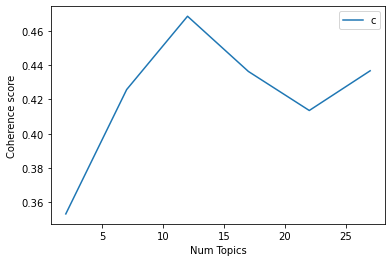

In [45]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [46]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 12

index: 0 | Num Topics = 2  has Coherence Value of 0.3532
index: 1 | Num Topics = 7  has Coherence Value of 0.4258
index: 2 | Num Topics = 12  has Coherence Value of 0.4685
index: 3 | Num Topics = 17  has Coherence Value of 0.4363
index: 4 | Num Topics = 22  has Coherence Value of 0.4136
index: 5 | Num Topics = 27  has Coherence Value of 0.4367


In [170]:
# Select optimal number of topics
optimal_model_us = model_list_us[2]

In [171]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us = pyLDAvis.gensim_models.prepare(optimal_model_us, corpus_us, id2word_us)

In [172]:
print("pyLDAVis for overall us topics:")
vis_us

pyLDAVis for overall us topics:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6      0.254614  0.000749       1        1  26.472535
9      0.171265 -0.036172       2        1  19.229836
2      0.193956 -0.056572       3        1  12.452562
3      0.198620 -0.014028       4        1  11.740249
7      0.144450  0.007511       5        1  10.366186
5     -0.024494  0.248874       6        1   5.146437
8     -0.001495 -0.173106       7        1   3.611452
11    -0.100374  0.030152       8        1   3.500894
1     -0.123878  0.267091       9        1   2.850933
10    -0.199184 -0.103990      10        1   2.227378
0     -0.227485 -0.151249      11        1   1.706817
4     -0.285996 -0.019260      12        1   0.694720, topic_info=            Term         Freq        Total Category  logprob  loglift
71         story  2150.000000  2150.000000  Default  30.0000  30.0000
571      account  2960.000000  2960.000000  Default  29.0000  29.0000
273        video  1181.000000  1181.000000  Default  28.0000  28.0000
258       update  2703.000000  2703.000000  Default  27.0000  27.0000
329       camera   910.000000   910.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
985        trend     6.888986     8.525895  Topic12  -5.3577   4.7562
1113       brand    20.609179    38.865173  Topic12  -4.2619   4.3351
1048        spot    12.123020    26.048174  Topic12  -4.7925   4.2046
719   individual     7.312536    25.979059  Topic12  -5.2980   3.7017
694         fail     8.370068   132.906012  Topic12  -5.1629   2.2044

[732 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
111       1  0.176406  able
111       2  0.412364  able
111       3  0.086518  able
111       4  0.131462  able
111       5  0.122473  able
...     ...       ...   ...
53        3  0.223581  year
53        4  0.350230  year
53        5  0.051650  year
53        7  0.016981  year
29        7  0.986411  zoom

[1307 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 10, 3, 4, 8, 6, 9, 12, 2, 11, 1, 5])

# By-rating LDA Topic Modelling

## LDA Topic Modelling (Rating = 1)

In [50]:
# By-rating Topic Modelling - rating = 1
# Convert to list - move to each section
review_us_score1 = snapchat_ios_us_review_YearMonth_score1.review.values.tolist()
review_words_us_score1 = list(sent_to_words(review_us_score1))
print(review_words_us_score1[:1])

[['idk', 'why', 'its', 'so', 'hard', 'to', 'listen', 'to', 'your', 'fans', 'everyone', 'wants', 'stories', 'back', 'to', 'the', 'old', 'original', 'way', 'there', 'was', 'nothing', 'wrong', 'with', 'it', 'worked', 'flawlessly', 'and', 'have', 'it', 'be', 'in', 'most', 'recent', 'order', 'were', 'there', 'most', 'recent', 'post', 'shows', 'up', 'first', 'not', 'there', 'oldest', 'post', 'or', 'have', 'setting', 'you', 'can', 'change', 'if', 'people', 'want', 'to', 'see', 'there', 'oldest', 'post', 'let', 'them', 'be', 'able', 'too', 'but', 'if', 'people', 'want', 'to', 'see', 'someones', 'most', 'recent', 'post', 'you', 'should', 'let', 'them', 'as', 'well', 'so', 'please', 'just', 'change', 'it', 'back', 'to', 'the', 'old', 'ways', 'or', 'give', 'us', 'setting', 'to', 'change', 'on', 'how', 'we', 'want', 'to', 'see', 'our', 'stories', 'please', 'please', 'change', 'the', 'scrolling', 'as', 'well', 'no', 'one', 'wants', 'to', 'scroll', 'from', 'the', 'side', 'everyone', 'wants', 'to', '

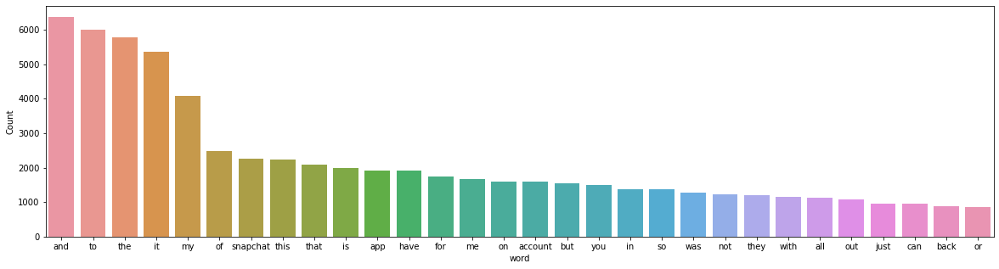

In [51]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score1))

In [52]:
# Clean text
review_us_ready_score1 = process_words(review_words_us_score1)  # processed Text Data! - move to each section


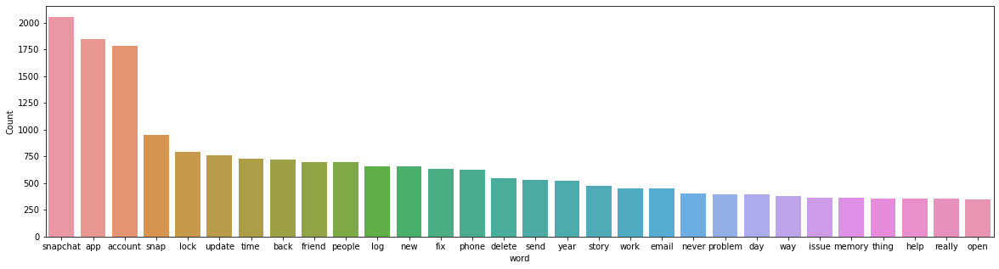

In [53]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score1))


In [54]:
# Create Dictionary
id2word_us_score1 = corpora.Dictionary(review_us_ready_score1)

2021-10-16 21:48:45,137 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 21:48:45,456 [INFO] gensim.corpora.dictionary - built Dictionary(3810 unique tokens: ['able', 'back', 'change', 'fan', 'first']...) from 1238 documents (total 63199 corpus positions)
2021-10-16 21:48:45,458 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(3810 unique tokens: ['able', 'back', 'change', 'fan', 'first']...) from 1238 documents (total 63199 corpus positions)", 'datetime': '2021-10-16T21:48:45.458310', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [55]:
# Create Corpus: Term Document Frequency
corpus_us_score1 = [id2word_us_score1.doc2bow(text) for text in review_us_ready_score1]

In [56]:
# Training LDA model
model_list_us_score1, coherence_values_us_score1 = compute_coherence_values(dictionary=id2word_us_score1, corpus=corpus_us_score1, 
                                                              texts=review_us_ready_score1, limit=30, start=2, step=5)


2021-10-16 21:48:45,701 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 21:48:45,703 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 21:48:45,707 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 21:48:45,710 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1238 documents, updating model once every 1000 documents, evaluating perplexity every 1238 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 21:48:45,711 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1238
2021-10-16 21:48:48,924 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:48:48,930 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.033*"app" + 0.023*"snapchat" + 0.018*"snap" + 0.014*"time" + 0.013*"update" + 0.011*"people" + 0.010*"send" + 0.010*"fix" + 0.009*"story" +

2021-10-16 21:49:04,264 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1238/1238
2021-10-16 21:49:04,717 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:49:04,720 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.044*"app" + 0.024*"snapchat" + 0.020*"update" + 0.017*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"open" + 0.010*"friend" + 0.010*"story" + 0.010*"phone"
2021-10-16 21:49:04,721 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.059*"account" + 0.037*"snapchat" + 0.024*"lock" + 0.019*"log" + 0.017*"app" + 0.016*"back" + 0.014*"new" + 0.013*"email" + 0.013*"phone" + 0.012*"year"
2021-10-16 21:49:04,722 [INFO] gensim.models.ldamodel - topic diff=0.252017, rho=0.400385
2021-10-16 21:49:04,723 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/1238
2021-10-16 21:49:06,705 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21

2021-10-16 21:49:18,609 [INFO] gensim.models.ldamodel - topic diff=0.177861, rho=0.298302
2021-10-16 21:49:19,146 [INFO] gensim.models.ldamodel - -6.174 per-word bound, 72.2 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:49:19,147 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1238/1238
2021-10-16 21:49:19,626 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:49:19,629 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.043*"app" + 0.025*"snapchat" + 0.020*"update" + 0.017*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"open" + 0.011*"friend" + 0.010*"story" + 0.010*"phone"
2021-10-16 21:49:19,631 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.060*"account" + 0.037*"snapchat" + 0.024*"lock" + 0.019*"log" + 0.016*"app" + 0.016*"back" + 0.014*"email" + 0.014*"new" + 0.013*"phone" + 0.013*"year"
2021-10-16 21:49:19,633 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 21:49:32,888 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.060*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.019*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.012*"phone"
2021-10-16 21:49:32,889 [INFO] gensim.models.ldamodel - topic diff=0.142260, rho=0.248161
2021-10-16 21:49:33,532 [INFO] gensim.models.ldamodel - -6.170 per-word bound, 72.0 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:49:33,539 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1238/1238
2021-10-16 21:49:33,897 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:49:33,916 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.043*"app" + 0.025*"snapchat" + 0.020*"update" + 0.017*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"open" + 0.011*"friend" + 0.011*"story" + 0.010*"phone"
2021-10-16 21:49:33,951 [INFO] gensim.models.ldamodel - topic #1 (0

2021-10-16 21:49:46,988 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.025*"snapchat" + 0.020*"update" + 0.018*"snap" + 0.014*"fix" + 0.013*"time" + 0.011*"story" + 0.011*"friend" + 0.010*"open" + 0.009*"people"
2021-10-16 21:49:47,000 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.060*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.019*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.012*"phone"
2021-10-16 21:49:47,005 [INFO] gensim.models.ldamodel - topic diff=0.121679, rho=0.216992
2021-10-16 21:49:47,717 [INFO] gensim.models.ldamodel - -6.168 per-word bound, 71.9 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:49:47,719 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1238/1238
2021-10-16 21:49:48,208 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:49:48,211 [INFO] gensim.models.ldamodel - topic #0 (

2021-10-16 21:50:00,454 [INFO] gensim.models.ldamodel - topic diff=0.108775, rho=0.199055
2021-10-16 21:50:00,456 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1238
2021-10-16 21:50:02,379 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:50:02,382 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.025*"snapchat" + 0.020*"update" + 0.018*"snap" + 0.014*"fix" + 0.013*"time" + 0.011*"story" + 0.011*"friend" + 0.010*"open" + 0.009*"people"
2021-10-16 21:50:02,384 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.019*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.012*"phone"
2021-10-16 21:50:02,386 [INFO] gensim.models.ldamodel - topic diff=0.107898, rho=0.195225
2021-10-16 21:50:02,991 [INFO] gensim.models.ldamodel - -6.166 per-word bound, 71.8 perplexity estimate based on a held-out corpus of 238 do

2021-10-16 21:50:15,334 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.018*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.013*"phone"
2021-10-16 21:50:15,335 [INFO] gensim.models.ldamodel - topic diff=0.098502, rho=0.181854
2021-10-16 21:50:15,337 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1000/1238
2021-10-16 21:50:17,086 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:50:17,165 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.025*"snapchat" + 0.020*"update" + 0.018*"snap" + 0.014*"fix" + 0.013*"time" + 0.011*"story" + 0.011*"friend" + 0.010*"open" + 0.009*"people"
2021-10-16 21:50:17,204 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.019*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.012*"phone"
20

2021-10-16 21:50:29,624 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.025*"snapchat" + 0.021*"update" + 0.018*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"friend" + 0.011*"open" + 0.011*"story" + 0.010*"phone"
2021-10-16 21:50:29,633 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.018*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.013*"phone"
2021-10-16 21:50:29,639 [INFO] gensim.models.ldamodel - topic diff=0.090616, rho=0.168459
2021-10-16 21:50:29,646 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/1238
2021-10-16 21:50:31,604 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:50:31,608 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.025*"snapchat" + 0.020*"update" + 0.018*"snap" + 0.014*"fix" + 0.013*"time" + 0.011*"story" + 0.011*"friend" + 0.010*"open" + 0.009*"people"


2021-10-16 21:50:43,509 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1238/1238
2021-10-16 21:50:43,976 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:50:43,979 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.025*"snapchat" + 0.021*"update" + 0.018*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"friend" + 0.011*"open" + 0.011*"story" + 0.010*"phone"
2021-10-16 21:50:43,982 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.018*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.013*"phone"
2021-10-16 21:50:43,984 [INFO] gensim.models.ldamodel - topic diff=0.084329, rho=0.157646
2021-10-16 21:50:43,985 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1238
2021-10-16 21:50:45,783 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 

2021-10-16 21:50:57,218 [INFO] gensim.models.ldamodel - topic diff=0.079754, rho=0.148679
2021-10-16 21:50:57,780 [INFO] gensim.models.ldamodel - -6.163 per-word bound, 71.7 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:50:57,781 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1238/1238
2021-10-16 21:50:58,115 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:50:58,119 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.025*"snapchat" + 0.021*"update" + 0.018*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"friend" + 0.011*"open" + 0.011*"story" + 0.010*"phone"
2021-10-16 21:50:58,121 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.018*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.013*"phone"
2021-10-16 21:50:58,122 [INFO] gensim.models.ldamodel - topic diff=

2021-10-16 21:51:11,672 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.061*"account" + 0.037*"snapchat" + 0.025*"lock" + 0.018*"log" + 0.016*"back" + 0.016*"app" + 0.014*"email" + 0.013*"new" + 0.013*"year" + 0.012*"phone"
2021-10-16 21:51:11,673 [INFO] gensim.models.ldamodel - topic diff=0.075305, rho=0.141086
2021-10-16 21:51:12,258 [INFO] gensim.models.ldamodel - -6.163 per-word bound, 71.6 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:51:12,259 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1238/1238
2021-10-16 21:51:12,676 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:51:12,691 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.025*"snapchat" + 0.021*"update" + 0.018*"snap" + 0.015*"fix" + 0.013*"time" + 0.011*"friend" + 0.011*"open" + 0.011*"story" + 0.010*"phone"
2021-10-16 21:51:12,702 [INFO] gensim.models.ldamodel - topic #1 (0

2021-10-16 21:51:29,199 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.023*"snapchat" + 0.022*"ad" + 0.019*"people" + 0.017*"app" + 0.013*"story" + 0.011*"filter" + 0.011*"add" + 0.009*"picture" + 0.008*"second" + 0.008*"watch"
2021-10-16 21:51:29,202 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.043*"snapchat" + 0.032*"app" + 0.021*"fix" + 0.018*"snap" + 0.018*"time" + 0.017*"update" + 0.017*"back" + 0.016*"work" + 0.013*"delete" + 0.013*"log"
2021-10-16 21:51:29,205 [INFO] gensim.models.ldamodel - topic diff=0.647423, rho=0.555727
2021-10-16 21:51:30,012 [INFO] gensim.models.ldamodel - -6.443 per-word bound, 87.0 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:51:30,013 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1238/1238
2021-10-16 21:51:30,578 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:51:30,583 [INFO] gensim.models.ldamodel - topic #6 (

2021-10-16 21:51:37,432 [INFO] gensim.models.ldamodel - topic diff=0.296735, rho=0.436935
2021-10-16 21:51:37,435 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1238
2021-10-16 21:51:39,579 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:51:39,586 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.028*"story" + 0.017*"game" + 0.014*"friend" + 0.011*"discover" + 0.010*"snap" + 0.008*"ad" + 0.007*"play" + 0.006*"end" + 0.006*"stuff" + 0.006*"way"
2021-10-16 21:51:39,588 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"app" + 0.025*"people" + 0.023*"story" + 0.018*"friend" + 0.017*"snapchat" + 0.013*"send" + 0.013*"snap" + 0.010*"change" + 0.009*"look" + 0.008*"time"
2021-10-16 21:51:39,593 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.041*"account" + 0.025*"snapchat" + 0.022*"new" + 0.021*"app" + 0.018*"people" + 0.018*"phone" + 0.018*"snap" + 0.017*"lock" + 0.016*"back" + 0.014*"reason"


2021-10-16 21:51:46,776 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"app" + 0.033*"update" + 0.021*"snapchat" + 0.018*"snap" + 0.011*"video" + 0.011*"fix" + 0.011*"time" + 0.010*"new" + 0.010*"camera" + 0.010*"chat"
2021-10-16 21:51:46,783 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"account" + 0.025*"snapchat" + 0.023*"new" + 0.021*"phone" + 0.021*"app" + 0.019*"people" + 0.017*"snap" + 0.017*"back" + 0.015*"reason" + 0.014*"lock"
2021-10-16 21:51:46,808 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"app" + 0.027*"people" + 0.025*"story" + 0.019*"friend" + 0.015*"snapchat" + 0.012*"snap" + 0.011*"send" + 0.011*"change" + 0.009*"guy" + 0.009*"look"
2021-10-16 21:51:46,812 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.025*"ad" + 0.019*"app" + 0.018*"snapchat" + 0.014*"filter" + 0.013*"add" + 0.012*"people" + 0.011*"content" + 0.009*"story" + 0.009*"time" + 0.009*"feature"
2021-10-16 21:51:46,816 [INFO] gensim.models.ldamodel - topic diff=0.185021,

2021-10-16 21:51:54,611 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"app" + 0.029*"people" + 0.028*"story" + 0.019*"friend" + 0.015*"snapchat" + 0.012*"snap" + 0.011*"send" + 0.011*"guy" + 0.011*"change" + 0.008*"review"
2021-10-16 21:51:54,612 [INFO] gensim.models.ldamodel - topic diff=0.143090, rho=0.298302
2021-10-16 21:51:55,248 [INFO] gensim.models.ldamodel - -6.177 per-word bound, 72.4 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:51:55,249 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1238/1238
2021-10-16 21:51:55,630 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:51:55,646 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"app" + 0.029*"people" + 0.027*"story" + 0.019*"friend" + 0.014*"snapchat" + 0.012*"snap" + 0.011*"change" + 0.011*"guy" + 0.010*"send" + 0.008*"look"
2021-10-16 21:51:55,650 [INFO] gensim.models.ldamodel - topic 

2021-10-16 21:52:03,365 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:52:03,412 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"update" + 0.031*"app" + 0.024*"snapchat" + 0.018*"snap" + 0.012*"new" + 0.012*"camera" + 0.012*"video" + 0.011*"story" + 0.010*"chat" + 0.010*"fix"
2021-10-16 21:52:03,431 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"app" + 0.030*"story" + 0.030*"people" + 0.019*"friend" + 0.014*"snapchat" + 0.012*"guy" + 0.011*"snap" + 0.011*"change" + 0.010*"send" + 0.009*"post"
2021-10-16 21:52:03,461 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.078*"account" + 0.044*"snapchat" + 0.037*"lock" + 0.021*"email" + 0.020*"log" + 0.017*"back" + 0.014*"year" + 0.014*"memory" + 0.014*"support" + 0.013*"help"
2021-10-16 21:52:03,463 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"story" + 0.019*"game" + 0.013*"friend" + 0.013*"discover" + 0.008*"snap" + 0.008*"look" + 0.008*"play"

2021-10-16 21:52:09,976 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.034*"update" + 0.032*"app" + 0.023*"snapchat" + 0.018*"snap" + 0.012*"video" + 0.012*"new" + 0.011*"story" + 0.011*"camera" + 0.010*"chat" + 0.010*"fix"
2021-10-16 21:52:09,977 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.079*"account" + 0.044*"snapchat" + 0.037*"lock" + 0.021*"email" + 0.021*"log" + 0.017*"back" + 0.015*"year" + 0.015*"memory" + 0.013*"support" + 0.012*"help"
2021-10-16 21:52:09,980 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"app" + 0.030*"people" + 0.029*"story" + 0.019*"friend" + 0.012*"guy" + 0.012*"snapchat" + 0.011*"change" + 0.010*"snap" + 0.010*"post" + 0.008*"send"
2021-10-16 21:52:09,981 [INFO] gensim.models.ldamodel - topic diff=0.108120, rho=0.248161
2021-10-16 21:52:09,982 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1238
2021-10-16 21:52:11,709 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 docum

2021-10-16 21:52:17,175 [INFO] gensim.models.ldamodel - topic diff=0.097194, rho=0.227992
2021-10-16 21:52:17,770 [INFO] gensim.models.ldamodel - -6.155 per-word bound, 71.3 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:52:17,774 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1238/1238
2021-10-16 21:52:18,149 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:52:18,154 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.080*"account" + 0.044*"snapchat" + 0.037*"lock" + 0.021*"email" + 0.021*"log" + 0.017*"back" + 0.015*"year" + 0.014*"memory" + 0.014*"support" + 0.012*"help"
2021-10-16 21:52:18,156 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.060*"app" + 0.038*"snapchat" + 0.029*"fix" + 0.024*"snap" + 0.023*"work" + 0.021*"time" + 0.020*"phone" + 0.020*"open" + 0.020*"let" + 0.019*"delete"
2021-10-16 21:52:18,158 [INFO] gensim.models.ldamodel - topic #6 

2021-10-16 21:52:25,422 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.059*"app" + 0.037*"snapchat" + 0.028*"fix" + 0.025*"snap" + 0.023*"work" + 0.022*"time" + 0.019*"phone" + 0.019*"open" + 0.019*"delete" + 0.018*"let"
2021-10-16 21:52:25,424 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.017*"story" + 0.013*"discover" + 0.012*"friend" + 0.009*"look" + 0.009*"pop" + 0.009*"play" + 0.008*"stuff" + 0.007*"spotlight" + 0.007*"girl"
2021-10-16 21:52:25,432 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"account" + 0.024*"snapchat" + 0.021*"new" + 0.021*"people" + 0.020*"phone" + 0.020*"app" + 0.018*"snap" + 0.016*"reason" + 0.015*"back" + 0.014*"ban"
2021-10-16 21:52:25,433 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"app" + 0.032*"story" + 0.031*"people" + 0.018*"friend" + 0.014*"guy" + 0.012*"snapchat" + 0.011*"post" + 0.011*"change" + 0.009*"snap" + 0.009*"review"
2021-10-16 21:52:25,436 [INFO] gensim.models.ldamodel - topic diff=0.088669,

2021-10-16 21:52:31,876 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.018*"game" + 0.016*"story" + 0.013*"discover" + 0.012*"friend" + 0.010*"look" + 0.009*"pop" + 0.009*"stuff" + 0.008*"play" + 0.008*"spotlight" + 0.008*"girl"
2021-10-16 21:52:31,884 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.080*"account" + 0.044*"snapchat" + 0.037*"lock" + 0.021*"log" + 0.021*"email" + 0.017*"back" + 0.015*"year" + 0.014*"memory" + 0.014*"support" + 0.012*"help"
2021-10-16 21:52:31,901 [INFO] gensim.models.ldamodel - topic diff=0.083518, rho=0.203119
2021-10-16 21:52:31,914 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1238
2021-10-16 21:52:33,598 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:52:33,609 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.059*"app" + 0.037*"snapchat" + 0.028*"fix" + 0.025*"snap" + 0.023*"work" + 0.022*"time" + 0.019*"phone" + 0.019*"open" + 0.019*"delete" + 0.018*"

2021-10-16 21:52:39,780 [INFO] gensim.models.ldamodel - -6.148 per-word bound, 70.9 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:52:39,787 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1238/1238
2021-10-16 21:52:40,161 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:52:40,172 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"ad" + 0.022*"app" + 0.018*"snapchat" + 0.015*"filter" + 0.013*"add" + 0.012*"content" + 0.011*"time" + 0.010*"people" + 0.009*"feature" + 0.009*"story"
2021-10-16 21:52:40,175 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"account" + 0.024*"snapchat" + 0.021*"phone" + 0.021*"new" + 0.020*"people" + 0.020*"app" + 0.018*"snap" + 0.017*"ban" + 0.017*"reason" + 0.016*"back"
2021-10-16 21:52:40,178 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.034*"update" + 0.030*"app" + 0.024*"snapchat" + 0.017*"snap" + 0.012*"new" 

2021-10-16 21:52:47,357 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.059*"app" + 0.037*"snapchat" + 0.029*"fix" + 0.025*"snap" + 0.023*"work" + 0.022*"time" + 0.019*"phone" + 0.019*"open" + 0.019*"delete" + 0.018*"let"
2021-10-16 21:52:47,358 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.016*"story" + 0.013*"discover" + 0.012*"friend" + 0.009*"look" + 0.009*"pop" + 0.009*"play" + 0.008*"stuff" + 0.008*"girl" + 0.007*"spotlight"
2021-10-16 21:52:47,359 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"account" + 0.023*"snapchat" + 0.021*"people" + 0.021*"new" + 0.020*"phone" + 0.020*"app" + 0.018*"snap" + 0.016*"reason" + 0.016*"ban" + 0.015*"back"
2021-10-16 21:52:47,361 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"ad" + 0.021*"app" + 0.019*"snapchat" + 0.015*"filter" + 0.012*"add" + 0.012*"time" + 0.011*"content" + 0.010*"people" + 0.010*"story" + 0.010*"feature"
2021-10-16 21:52:47,361 [INFO] gensim.models.ldamodel - topic diff=0.073699,

2021-10-16 21:52:53,610 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.040*"app" + 0.034*"story" + 0.031*"people" + 0.018*"friend" + 0.014*"guy" + 0.014*"post" + 0.011*"change" + 0.011*"snapchat" + 0.009*"review" + 0.008*"thing"
2021-10-16 21:52:53,612 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.060*"app" + 0.037*"snapchat" + 0.029*"fix" + 0.025*"snap" + 0.023*"work" + 0.022*"time" + 0.020*"phone" + 0.020*"open" + 0.019*"let" + 0.019*"delete"
2021-10-16 21:52:53,613 [INFO] gensim.models.ldamodel - topic diff=0.070550, rho=0.176123
2021-10-16 21:52:53,616 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1238
2021-10-16 21:52:55,347 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:52:55,352 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"ad" + 0.021*"app" + 0.019*"snapchat" + 0.015*"filter" + 0.012*"add" + 0.012*"time" + 0.011*"content" + 0.010*"people" + 0.010*"story" + 0.010*"featu

2021-10-16 21:53:01,219 [INFO] gensim.models.ldamodel - -6.144 per-word bound, 70.7 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:53:01,220 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1238/1238
2021-10-16 21:53:01,612 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:53:01,617 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"account" + 0.023*"snapchat" + 0.021*"phone" + 0.021*"new" + 0.020*"people" + 0.020*"app" + 0.018*"snap" + 0.018*"ban" + 0.017*"reason" + 0.016*"back"
2021-10-16 21:53:01,619 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.014*"story" + 0.014*"discover" + 0.011*"friend" + 0.010*"look" + 0.009*"pop" + 0.009*"stuff" + 0.008*"play" + 0.008*"girl" + 0.008*"spotlight"
2021-10-16 21:53:01,621 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"ad" + 0.022*"app" + 0.018*"snapchat" + 0.015*"filter" + 0.013*"add" +

2021-10-16 21:53:08,622 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"app" + 0.036*"story" + 0.031*"people" + 0.018*"friend" + 0.015*"guy" + 0.014*"post" + 0.011*"snapchat" + 0.011*"change" + 0.009*"review" + 0.008*"thing"
2021-10-16 21:53:08,624 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"update" + 0.029*"app" + 0.025*"snapchat" + 0.018*"snap" + 0.013*"new" + 0.012*"video" + 0.012*"camera" + 0.011*"story" + 0.010*"chat" + 0.010*"way"
2021-10-16 21:53:08,628 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"account" + 0.023*"snapchat" + 0.021*"people" + 0.020*"new" + 0.020*"phone" + 0.020*"app" + 0.018*"snap" + 0.017*"reason" + 0.017*"ban" + 0.015*"back"
2021-10-16 21:53:08,631 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.059*"app" + 0.037*"snapchat" + 0.029*"fix" + 0.026*"snap" + 0.023*"work" + 0.022*"time" + 0.019*"phone" + 0.019*"open" + 0.018*"delete" + 0.018*"let"
2021-10-16 21:53:08,633 [INFO] gensim.models.ldamodel - topic diff=0.064393, rho

2021-10-16 21:53:15,128 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.060*"app" + 0.037*"snapchat" + 0.029*"fix" + 0.025*"snap" + 0.023*"work" + 0.022*"time" + 0.020*"phone" + 0.019*"open" + 0.019*"let" + 0.018*"delete"
2021-10-16 21:53:15,130 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.080*"account" + 0.044*"snapchat" + 0.037*"lock" + 0.022*"log" + 0.021*"email" + 0.017*"back" + 0.014*"year" + 0.014*"memory" + 0.014*"support" + 0.012*"help"
2021-10-16 21:53:15,132 [INFO] gensim.models.ldamodel - topic diff=0.062190, rho=0.157646
2021-10-16 21:53:15,134 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1238
2021-10-16 21:53:16,839 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:53:16,844 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"app" + 0.036*"story" + 0.031*"people" + 0.018*"friend" + 0.015*"guy" + 0.015*"post" + 0.011*"change" + 0.011*"snapchat" + 0.009*"review" + 0.008*"th

2021-10-16 21:53:22,785 [INFO] gensim.models.ldamodel - -6.141 per-word bound, 70.6 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:53:22,788 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1238/1238
2021-10-16 21:53:23,179 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:53:23,184 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.080*"account" + 0.044*"snapchat" + 0.037*"lock" + 0.022*"log" + 0.021*"email" + 0.017*"back" + 0.014*"year" + 0.014*"memory" + 0.014*"support" + 0.012*"help"
2021-10-16 21:53:23,186 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.014*"discover" + 0.014*"story" + 0.011*"friend" + 0.010*"look" + 0.009*"pop" + 0.009*"stuff" + 0.009*"girl" + 0.009*"play" + 0.008*"spotlight"
2021-10-16 21:53:23,190 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"app" + 0.035*"story" + 0.031*"people" + 0.017*"friend" + 0.015*"po

2021-10-16 21:53:30,251 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"update" + 0.029*"app" + 0.025*"snapchat" + 0.017*"snap" + 0.013*"new" + 0.012*"video" + 0.012*"camera" + 0.011*"story" + 0.010*"chat" + 0.010*"back"
2021-10-16 21:53:30,265 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.014*"story" + 0.013*"discover" + 0.011*"friend" + 0.010*"look" + 0.009*"pop" + 0.009*"play" + 0.009*"stuff" + 0.008*"girl" + 0.007*"spotlight"
2021-10-16 21:53:30,270 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"ad" + 0.022*"app" + 0.018*"snapchat" + 0.015*"filter" + 0.012*"add" + 0.012*"time" + 0.011*"content" + 0.010*"story" + 0.010*"people" + 0.010*"feature"
2021-10-16 21:53:30,279 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"app" + 0.036*"story" + 0.031*"people" + 0.018*"friend" + 0.015*"post" + 0.015*"guy" + 0.011*"change" + 0.011*"snapchat" + 0.009*"review" + 0.008*"thing"
2021-10-16 21:53:30,284 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 21:53:36,506 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.014*"discover" + 0.013*"story" + 0.011*"friend" + 0.010*"look" + 0.009*"pop" + 0.009*"stuff" + 0.009*"girl" + 0.009*"play" + 0.008*"spotlight"
2021-10-16 21:53:36,508 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"update" + 0.030*"app" + 0.025*"snapchat" + 0.017*"snap" + 0.012*"new" + 0.012*"video" + 0.011*"camera" + 0.011*"story" + 0.010*"chat" + 0.010*"way"
2021-10-16 21:53:36,510 [INFO] gensim.models.ldamodel - topic diff=0.056232, rho=0.143981
2021-10-16 21:53:36,512 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1238
2021-10-16 21:53:38,155 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:53:38,179 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.035*"update" + 0.029*"app" + 0.025*"snapchat" + 0.017*"snap" + 0.013*"new" + 0.012*"video" + 0.012*"camera" + 0.011*"story" + 0.010*"chat" + 0.010*"ba

2021-10-16 21:53:44,118 [INFO] gensim.models.ldamodel - -6.140 per-word bound, 70.5 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:53:44,119 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1238/1238
2021-10-16 21:53:44,539 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:53:44,550 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"game" + 0.014*"discover" + 0.013*"story" + 0.011*"friend" + 0.010*"look" + 0.009*"pop" + 0.009*"stuff" + 0.009*"girl" + 0.009*"play" + 0.008*"spotlight"
2021-10-16 21:53:44,554 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"account" + 0.023*"snapchat" + 0.021*"phone" + 0.021*"new" + 0.020*"people" + 0.020*"app" + 0.019*"ban" + 0.018*"snap" + 0.017*"reason" + 0.016*"back"
2021-10-16 21:53:44,560 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"app" + 0.035*"story" + 0.031*"people" + 0.017*"friend" + 0.015*"post"

2021-10-16 21:53:59,228 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.038*"ad" + 0.020*"snapchat" + 0.018*"content" + 0.015*"filter" + 0.015*"second" + 0.015*"app" + 0.014*"people" + 0.013*"kid" + 0.011*"story" + 0.011*"watch"
2021-10-16 21:53:59,229 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.044*"app" + 0.024*"snapchat" + 0.021*"phone" + 0.018*"issue" + 0.017*"update" + 0.015*"fix" + 0.015*"open" + 0.013*"snap" + 0.013*"time" + 0.012*"problem"
2021-10-16 21:53:59,231 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.061*"app" + 0.036*"update" + 0.030*"snapchat" + 0.019*"snap" + 0.018*"open" + 0.015*"fix" + 0.012*"time" + 0.011*"phone" + 0.010*"new" + 0.010*"work"
2021-10-16 21:53:59,234 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.050*"app" + 0.025*"people" + 0.020*"friend" + 0.020*"snapchat" + 0.014*"snap" + 0.012*"story" + 0.011*"account" + 0.009*"chat" + 0.008*"way" + 0.008*"fix"
2021-10-16 21:53:59,235 [INFO] gensim.models.ldamodel - topic diff=0.651864, rh

2021-10-16 21:54:08,356 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.052*"app" + 0.030*"people" + 0.021*"friend" + 0.017*"snapchat" + 0.016*"story" + 0.013*"snap" + 0.011*"thing" + 0.009*"chat" + 0.009*"post" + 0.009*"way"
2021-10-16 21:54:08,357 [INFO] gensim.models.ldamodel - topic diff=0.263094, rho=0.400385
2021-10-16 21:54:08,939 [INFO] gensim.models.ldamodel - -6.473 per-word bound, 88.9 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:54:08,946 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1238/1238
2021-10-16 21:54:09,399 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:54:09,471 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.043*"app" + 0.024*"phone" + 0.024*"issue" + 0.022*"iphone" + 0.019*"snapchat" + 0.015*"fix" + 0.015*"update" + 0.014*"camera" + 0.012*"problem" + 0.011*"pay"
2021-10-16 21:54:09,473 [INFO] gensim.models.ldamodel - topic 

2021-10-16 21:54:17,608 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:54:17,614 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.014*"tok" + 0.011*"notify" + 0.009*"comment" + 0.009*"message" + 0.009*"hole" + 0.009*"point" + 0.008*"screenshot" + 0.008*"bs" + 0.008*"activity" + 0.007*"certain"
2021-10-16 21:54:17,617 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.042*"story" + 0.016*"friend" + 0.013*"page" + 0.013*"discover" + 0.011*"people" + 0.010*"way" + 0.010*"option" + 0.010*"app" + 0.010*"give" + 0.009*"location"
2021-10-16 21:54:17,620 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.033*"memory" + 0.029*"delete" + 0.025*"save" + 0.022*"year" + 0.021*"photo" + 0.019*"video" + 0.018*"snapchat" + 0.015*"guy" + 0.014*"post" + 0.014*"app"
2021-10-16 21:54:17,622 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.095*"lock" + 0.076*"log" + 0.070*"account" + 0.029*"temporarily" + 0.024*"back" + 0.023*"snapc

2021-10-16 21:54:24,765 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.044*"app" + 0.041*"update" + 0.030*"snapchat" + 0.021*"snap" + 0.016*"new" + 0.012*"fix" + 0.012*"time" + 0.011*"change" + 0.010*"chat" + 0.010*"look"
2021-10-16 21:54:24,767 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.058*"app" + 0.040*"snapchat" + 0.030*"fix" + 0.025*"work" + 0.023*"phone" + 0.022*"let" + 0.022*"delete" + 0.022*"time" + 0.021*"open" + 0.020*"snap"
2021-10-16 21:54:24,770 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.036*"memory" + 0.031*"delete" + 0.024*"save" + 0.023*"year" + 0.022*"photo" + 0.021*"video" + 0.018*"snapchat" + 0.016*"account" + 0.016*"post" + 0.016*"guy"
2021-10-16 21:54:24,772 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.050*"ad" + 0.021*"content" + 0.020*"filter" + 0.018*"snapchat" + 0.016*"story" + 0.016*"second" + 0.014*"time" + 0.014*"watch" + 0.013*"kid" + 0.013*"app"
2021-10-16 21:54:24,774 [INFO] gensim.models.ldamodel - topic diff=0.127651, rho=0

2021-10-16 21:54:32,748 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.052*"app" + 0.033*"people" + 0.024*"friend" + 0.020*"post" + 0.018*"story" + 0.016*"thing" + 0.013*"snapchat" + 0.012*"snap" + 0.012*"delete" + 0.011*"chat"
2021-10-16 21:54:32,750 [INFO] gensim.models.ldamodel - topic diff=0.101508, rho=0.265018
2021-10-16 21:54:33,379 [INFO] gensim.models.ldamodel - -6.223 per-word bound, 74.7 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:54:33,380 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1238/1238
2021-10-16 21:54:33,673 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:54:33,685 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.051*"ad" + 0.021*"content" + 0.020*"filter" + 0.019*"snapchat" + 0.017*"story" + 0.016*"second" + 0.014*"time" + 0.014*"watch" + 0.013*"app" + 0.013*"kid"
2021-10-16 21:54:33,687 [INFO] gensim.models.ldamodel - topic

2021-10-16 21:54:39,406 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1238
2021-10-16 21:54:41,164 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:54:41,208 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.041*"update" + 0.039*"app" + 0.031*"snapchat" + 0.021*"snap" + 0.016*"new" + 0.011*"story" + 0.011*"change" + 0.011*"time" + 0.011*"fix" + 0.011*"chat"
2021-10-16 21:54:41,214 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.056*"ad" + 0.021*"filter" + 0.020*"content" + 0.019*"snapchat" + 0.019*"story" + 0.016*"second" + 0.016*"watch" + 0.015*"time" + 0.013*"app" + 0.012*"kid"
2021-10-16 21:54:41,221 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.016*"tok" + 0.013*"notify" + 0.010*"comment" + 0.010*"privacy" + 0.010*"screenshot" + 0.009*"hole" + 0.009*"point" + 0.009*"activity" + 0.008*"hour" + 0.008*"bs"
2021-10-16 21:54:41,223 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"

2021-10-16 21:54:47,741 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.037*"story" + 0.018*"friend" + 0.015*"discover" + 0.012*"page" + 0.011*"option" + 0.011*"give" + 0.010*"people" + 0.010*"stuff" + 0.010*"thing" + 0.010*"location"
2021-10-16 21:54:47,743 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.106*"lock" + 0.091*"account" + 0.075*"log" + 0.032*"snapchat" + 0.030*"temporarily" + 0.024*"back" + 0.021*"hour" + 0.021*"new" + 0.020*"unlock" + 0.017*"app"
2021-10-16 21:54:47,745 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"memory" + 0.032*"delete" + 0.026*"save" + 0.024*"year" + 0.024*"video" + 0.022*"photo" + 0.018*"snapchat" + 0.017*"account" + 0.016*"post" + 0.015*"guy"
2021-10-16 21:54:47,748 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.061*"app" + 0.039*"snapchat" + 0.031*"fix" + 0.026*"work" + 0.024*"phone" + 0.023*"open" + 0.023*"delete" + 0.022*"time" + 0.022*"let" + 0.021*"snap"
2021-10-16 21:54:47,750 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 21:54:55,248 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.016*"tok" + 0.014*"notify" + 0.010*"comment" + 0.010*"privacy" + 0.010*"screenshot" + 0.009*"activity" + 0.009*"hole" + 0.009*"hour" + 0.009*"point" + 0.008*"bs"
2021-10-16 21:54:55,249 [INFO] gensim.models.ldamodel - topic diff=0.073395, rho=0.212057
2021-10-16 21:54:55,802 [INFO] gensim.models.ldamodel - -6.191 per-word bound, 73.1 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:54:55,803 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1238/1238
2021-10-16 21:54:56,160 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:54:56,223 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.073*"account" + 0.053*"snapchat" + 0.031*"email" + 0.022*"lock" + 0.021*"support" + 0.020*"help" + 0.015*"back" + 0.015*"year" + 0.012*"memory" + 0.012*"number"
2021-10-16 21:54:56,224 [INFO] gensim.models.ldamo

2021-10-16 21:55:01,739 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1238
2021-10-16 21:55:03,517 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:55:03,531 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.016*"tok" + 0.014*"notify" + 0.010*"comment" + 0.010*"privacy" + 0.010*"screenshot" + 0.009*"hour" + 0.009*"hole" + 0.009*"activity" + 0.009*"point" + 0.008*"game"
2021-10-16 21:55:03,547 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.111*"lock" + 0.092*"account" + 0.077*"log" + 0.032*"snapchat" + 0.029*"temporarily" + 0.024*"back" + 0.022*"unlock" + 0.021*"hour" + 0.020*"new" + 0.018*"third"
2021-10-16 21:55:03,553 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.069*"account" + 0.026*"snapchat" + 0.023*"new" + 0.022*"people" + 0.021*"ban" + 0.021*"reason" + 0.019*"phone" + 0.019*"lock" + 0.019*"back" + 0.018*"snap"
2021-10-16 21:55:03,557 [INFO] gensim.models.ldamodel - topic #0 (0.08

2021-10-16 21:55:09,898 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.036*"story" + 0.019*"friend" + 0.015*"discover" + 0.012*"page" + 0.011*"option" + 0.011*"give" + 0.011*"stuff" + 0.010*"people" + 0.010*"location" + 0.010*"thing"
2021-10-16 21:55:09,902 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.063*"snap" + 0.043*"send" + 0.030*"app" + 0.029*"streak" + 0.022*"people" + 0.020*"friend" + 0.017*"day" + 0.015*"message" + 0.015*"year" + 0.011*"never"
2021-10-16 21:55:09,904 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.030*"app" + 0.030*"iphone" + 0.026*"phone" + 0.025*"camera" + 0.025*"issue" + 0.016*"snapchat" + 0.015*"fix" + 0.014*"ask" + 0.013*"picture" + 0.013*"pay"
2021-10-16 21:55:09,907 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"memory" + 0.032*"delete" + 0.027*"save" + 0.025*"year" + 0.024*"video" + 0.022*"photo" + 0.018*"snapchat" + 0.018*"account" + 0.016*"post" + 0.015*"guy"
2021-10-16 21:55:09,911 [INFO] gensim.models.ldamodel - topic di

2021-10-16 21:55:17,353 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.065*"snap" + 0.045*"send" + 0.031*"streak" + 0.028*"app" + 0.022*"people" + 0.020*"friend" + 0.017*"day" + 0.016*"message" + 0.014*"year" + 0.011*"never"
2021-10-16 21:55:17,356 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.034*"iphone" + 0.029*"camera" + 0.029*"app" + 0.026*"phone" + 0.026*"issue" + 0.017*"snapchat" + 0.016*"picture" + 0.015*"quality" + 0.014*"fix" + 0.012*"problem"
2021-10-16 21:55:17,357 [INFO] gensim.models.ldamodel - topic diff=0.060022, rho=0.181854
2021-10-16 21:55:17,858 [INFO] gensim.models.ldamodel - -6.176 per-word bound, 72.3 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:55:17,860 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1238/1238
2021-10-16 21:55:18,200 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:55:18,207 [INFO] gensim.models.ldamodel -

2021-10-16 21:55:23,622 [INFO] gensim.models.ldamodel - topic diff=0.057534, rho=0.176123
2021-10-16 21:55:23,625 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1238
2021-10-16 21:55:25,385 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:55:25,395 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.056*"ad" + 0.020*"filter" + 0.020*"content" + 0.020*"story" + 0.020*"snapchat" + 0.016*"watch" + 0.016*"time" + 0.016*"second" + 0.015*"app" + 0.013*"kid"
2021-10-16 21:55:25,398 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.042*"update" + 0.037*"app" + 0.031*"snapchat" + 0.020*"snap" + 0.017*"new" + 0.012*"story" + 0.012*"change" + 0.011*"time" + 0.011*"people" + 0.010*"look"
2021-10-16 21:55:25,404 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.065*"snap" + 0.045*"send" + 0.031*"streak" + 0.028*"app" + 0.022*"people" + 0.020*"friend" + 0.017*"day" + 0.016*"message" + 0.014*"year" + 0.011*"nev

2021-10-16 21:55:31,712 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.018*"tok" + 0.015*"notify" + 0.012*"comment" + 0.011*"screenshot" + 0.010*"activity" + 0.010*"privacy" + 0.010*"hour" + 0.010*"grind" + 0.009*"elsewhere" + 0.008*"point"
2021-10-16 21:55:31,715 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.036*"story" + 0.019*"friend" + 0.015*"discover" + 0.012*"page" + 0.011*"option" + 0.011*"give" + 0.011*"stuff" + 0.010*"people" + 0.010*"location" + 0.010*"thing"
2021-10-16 21:55:31,718 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.115*"lock" + 0.096*"account" + 0.076*"log" + 0.033*"snapchat" + 0.031*"temporarily" + 0.024*"unlock" + 0.024*"back" + 0.021*"hour" + 0.021*"new" + 0.019*"permanently"
2021-10-16 21:55:31,721 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.038*"memory" + 0.032*"delete" + 0.027*"save" + 0.025*"video" + 0.025*"year" + 0.023*"photo" + 0.018*"account" + 0.017*"snapchat" + 0.017*"post" + 0.015*"guy"
2021-10-16 21:55:31,738 [INFO] gensim

2021-10-16 21:55:39,108 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.071*"account" + 0.053*"snapchat" + 0.032*"email" + 0.021*"support" + 0.021*"help" + 0.018*"lock" + 0.015*"back" + 0.014*"year" + 0.013*"number" + 0.012*"password"
2021-10-16 21:55:39,110 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.042*"update" + 0.037*"app" + 0.031*"snapchat" + 0.019*"snap" + 0.017*"new" + 0.012*"story" + 0.012*"change" + 0.011*"time" + 0.011*"people" + 0.010*"look"
2021-10-16 21:55:39,111 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.052*"app" + 0.033*"people" + 0.025*"post" + 0.023*"friend" + 0.017*"story" + 0.016*"thing" + 0.013*"delete" + 0.011*"chat" + 0.011*"snap" + 0.010*"snapchat"
2021-10-16 21:55:39,112 [INFO] gensim.models.ldamodel - topic diff=0.051895, rho=0.161716
2021-10-16 21:55:39,565 [INFO] gensim.models.ldamodel - -6.172 per-word bound, 72.1 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:55:39,568 [INFO] gensim.mode

2021-10-16 21:55:45,495 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.117*"lock" + 0.097*"account" + 0.076*"log" + 0.033*"snapchat" + 0.031*"temporarily" + 0.025*"unlock" + 0.024*"back" + 0.021*"hour" + 0.021*"new" + 0.019*"permanently"
2021-10-16 21:55:45,497 [INFO] gensim.models.ldamodel - topic diff=0.050249, rho=0.157646
2021-10-16 21:55:45,499 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1238
2021-10-16 21:55:47,217 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:55:47,226 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.062*"app" + 0.039*"snapchat" + 0.032*"fix" + 0.026*"work" + 0.023*"phone" + 0.023*"open" + 0.023*"time" + 0.022*"delete" + 0.021*"snap" + 0.020*"let"
2021-10-16 21:55:47,227 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.042*"update" + 0.037*"app" + 0.031*"snapchat" + 0.019*"snap" + 0.017*"new" + 0.012*"story" + 0.012*"change" + 0.011*"time" + 0.011*"people" + 0.

2021-10-16 21:55:53,263 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1238/1238
2021-10-16 21:55:53,612 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:55:53,620 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.053*"ad" + 0.021*"content" + 0.020*"filter" + 0.019*"snapchat" + 0.019*"story" + 0.016*"app" + 0.015*"second" + 0.015*"time" + 0.015*"watch" + 0.013*"kid"
2021-10-16 21:55:53,623 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.032*"iphone" + 0.029*"app" + 0.028*"camera" + 0.027*"phone" + 0.026*"issue" + 0.016*"snapchat" + 0.015*"quality" + 0.015*"picture" + 0.015*"fix" + 0.013*"ask"
2021-10-16 21:55:53,626 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.018*"tok" + 0.015*"comment" + 0.014*"notify" + 0.011*"screenshot" + 0.010*"activity" + 0.010*"hour" + 0.010*"privacy" + 0.009*"grind" + 0.009*"elsewhere" + 0.009*"game"
2021-10-16 21:55:53,630 [INFO] gensim.models.ldamodel - topic #9 (0.0

2021-10-16 21:56:00,744 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.016*"tok" + 0.014*"comment" + 0.014*"notify" + 0.010*"screenshot" + 0.009*"hour" + 0.009*"privacy" + 0.009*"activity" + 0.009*"game" + 0.009*"food" + 0.009*"hole"
2021-10-16 21:56:00,747 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.052*"app" + 0.033*"people" + 0.025*"post" + 0.023*"friend" + 0.017*"story" + 0.016*"thing" + 0.013*"delete" + 0.011*"chat" + 0.011*"snap" + 0.009*"message"
2021-10-16 21:56:00,750 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"memory" + 0.032*"delete" + 0.028*"save" + 0.025*"video" + 0.025*"year" + 0.022*"photo" + 0.017*"post" + 0.017*"snapchat" + 0.016*"account" + 0.015*"guy"
2021-10-16 21:56:00,752 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.119*"lock" + 0.097*"account" + 0.076*"log" + 0.033*"snapchat" + 0.030*"temporarily" + 0.026*"unlock" + 0.024*"back" + 0.021*"hour" + 0.021*"new" + 0.020*"permanently"
2021-10-16 21:56:00,753 [INFO] gensim.models.ldamode

2021-10-16 21:56:07,107 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.043*"update" + 0.037*"app" + 0.031*"snapchat" + 0.019*"snap" + 0.017*"new" + 0.012*"story" + 0.012*"change" + 0.011*"time" + 0.011*"people" + 0.010*"look"
2021-10-16 21:56:07,108 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.018*"tok" + 0.016*"comment" + 0.014*"notify" + 0.011*"screenshot" + 0.010*"activity" + 0.010*"hour" + 0.009*"privacy" + 0.009*"food" + 0.009*"grind" + 0.009*"game"
2021-10-16 21:56:07,110 [INFO] gensim.models.ldamodel - topic diff=0.045264, rho=0.143981
2021-10-16 21:56:07,112 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1238
2021-10-16 21:56:08,899 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:56:08,973 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.069*"account" + 0.028*"snapchat" + 0.022*"people" + 0.022*"new" + 0.021*"ban" + 0.021*"reason" + 0.019*"lock" + 0.019*"phone" + 0.018*"back" +

2021-10-16 21:56:14,380 [INFO] gensim.models.ldamodel - topic diff=0.043799, rho=0.139702
2021-10-16 21:56:14,978 [INFO] gensim.models.ldamodel - -6.167 per-word bound, 71.9 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:56:14,979 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1238/1238
2021-10-16 21:56:15,365 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:56:15,371 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.053*"ad" + 0.021*"content" + 0.020*"filter" + 0.019*"snapchat" + 0.019*"story" + 0.016*"app" + 0.015*"second" + 0.015*"time" + 0.015*"watch" + 0.013*"kid"
2021-10-16 21:56:15,373 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.071*"account" + 0.053*"snapchat" + 0.033*"email" + 0.022*"support" + 0.021*"help" + 0.017*"lock" + 0.015*"back" + 0.015*"year" + 0.013*"number" + 0.012*"password"
2021-10-16 21:56:15,375 [INFO] gensim.models.ldamodel -

2021-10-16 21:56:31,201 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.041*"account" + 0.038*"lock" + 0.028*"snapchat" + 0.024*"people" + 0.023*"app" + 0.014*"snap" + 0.014*"reason" + 0.012*"problem" + 0.011*"never" + 0.010*"support"
2021-10-16 21:56:31,209 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.028*"app" + 0.026*"issue" + 0.018*"snapchat" + 0.015*"snap" + 0.014*"update" + 0.013*"problem" + 0.013*"upload" + 0.010*"time" + 0.010*"video" + 0.010*"extremely"
2021-10-16 21:56:31,213 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.089*"log" + 0.062*"lock" + 0.047*"account" + 0.039*"new" + 0.018*"snapchat" + 0.018*"third" + 0.017*"temporarily" + 0.017*"phone" + 0.017*"ban" + 0.016*"party"
2021-10-16 21:56:31,218 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.064*"account" + 0.031*"lock" + 0.025*"ban" + 0.024*"snap" + 0.021*"phone" + 0.019*"back" + 0.019*"snapchat" + 0.019*"new" + 0.018*"people" + 0.016*"reason"
2021-10-16 21:56:31,224 [INFO] gensim.models.ldamodel

2021-10-16 21:56:40,310 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.115*"account" + 0.054*"snapchat" + 0.041*"lock" + 0.030*"email" + 0.023*"back" + 0.021*"memory" + 0.021*"year" + 0.021*"log" + 0.020*"help" + 0.017*"support"
2021-10-16 21:56:40,312 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.034*"snapchat" + 0.017*"app" + 0.016*"password" + 0.016*"friend" + 0.014*"change" + 0.014*"people" + 0.013*"email" + 0.011*"day" + 0.011*"account" + 0.010*"user"
2021-10-16 21:56:40,313 [INFO] gensim.models.ldamodel - topic diff=0.275498, rho=0.400385
2021-10-16 21:56:40,949 [INFO] gensim.models.ldamodel - -6.878 per-word bound, 117.6 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:56:40,951 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1238/1238
2021-10-16 21:56:41,474 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:56:41,481 [INFO] gensim.models.ldamode

2021-10-16 21:56:47,676 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.023*"picture" + 0.018*"incredibly" + 0.015*"lead" + 0.014*"first" + 0.012*"unfortunate" + 0.012*"quality" + 0.012*"year" + 0.012*"live" + 0.011*"memory" + 0.010*"time"
2021-10-16 21:56:47,678 [INFO] gensim.models.ldamodel - topic diff=0.170692, rho=0.348409
2021-10-16 21:56:47,688 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/1238
2021-10-16 21:56:49,605 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:56:49,612 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.115*"account" + 0.055*"snapchat" + 0.040*"lock" + 0.032*"email" + 0.024*"back" + 0.021*"help" + 0.021*"year" + 0.020*"memory" + 0.018*"support" + 0.018*"log"
2021-10-16 21:56:49,614 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.055*"app" + 0.052*"snapchat" + 0.036*"work" + 0.034*"fix" + 0.034*"time" + 0.028*"let" + 0.027*"phone" + 0.026*"open" + 0.022*"back" + 

2021-10-16 21:56:56,393 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1238/1238
2021-10-16 21:56:56,784 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:56:56,794 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.062*"camera" + 0.058*"filter" + 0.053*"iphone" + 0.050*"look" + 0.047*"picture" + 0.027*"snapchat" + 0.024*"quality" + 0.018*"face" + 0.017*"well" + 0.014*"love"
2021-10-16 21:56:56,797 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.099*"log" + 0.094*"lock" + 0.082*"account" + 0.039*"new" + 0.026*"third" + 0.026*"snapchat" + 0.025*"temporarily" + 0.024*"party" + 0.022*"phone" + 0.020*"unlock"
2021-10-16 21:56:56,799 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.068*"account" + 0.041*"ban" + 0.029*"phone" + 0.027*"people" + 0.025*"snap" + 0.024*"reason" + 0.021*"back" + 0.020*"lock" + 0.018*"new" + 0.016*"support"
2021-10-16 21:56:56,802 [INFO] gensim.models.ldamodel - topic #10 (0.059

2021-10-16 21:57:04,650 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.114*"account" + 0.055*"snapchat" + 0.039*"lock" + 0.033*"email" + 0.025*"back" + 0.022*"help" + 0.020*"year" + 0.019*"memory" + 0.018*"support" + 0.016*"log"
2021-10-16 21:57:04,653 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.022*"picture" + 0.018*"incredibly" + 0.017*"first" + 0.014*"lead" + 0.012*"much" + 0.012*"live" + 0.011*"year" + 0.011*"way" + 0.011*"quality" + 0.010*"memory"
2021-10-16 21:57:04,658 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.120*"ad" + 0.040*"watch" + 0.036*"story" + 0.033*"second" + 0.026*"content" + 0.015*"app" + 0.015*"amount" + 0.015*"time" + 0.014*"page" + 0.013*"snap"
2021-10-16 21:57:04,660 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.038*"issue" + 0.029*"pay" + 0.027*"upload" + 0.016*"app" + 0.015*"improve" + 0.015*"extremely" + 0.015*"tap" + 0.015*"problem" + 0.014*"video" + 0.013*"resolve"
2021-10-16 21:57:04,663 [INFO] gensim.models.ldamodel - topic di

2021-10-16 21:57:11,730 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.041*"people" + 0.028*"app" + 0.022*"snapchat" + 0.022*"account" + 0.016*"reason" + 0.015*"lock" + 0.014*"problem" + 0.014*"add" + 0.013*"social" + 0.012*"never"
2021-10-16 21:57:11,733 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.079*"game" + 0.051*"play" + 0.022*"lag" + 0.015*"together" + 0.014*"hour" + 0.013*"upset" + 0.011*"food" + 0.010*"illegal" + 0.010*"hole" + 0.009*"severely"
2021-10-16 21:57:11,734 [INFO] gensim.models.ldamodel - topic diff=0.086908, rho=0.248161
2021-10-16 21:57:11,737 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1238
2021-10-16 21:57:13,538 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:57:13,553 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.042*"people" + 0.027*"app" + 0.022*"snapchat" + 0.020*"account" + 0.017*"reason" + 0.015*"add" + 0.015*"lock" + 0.014*"problem" + 0.012*"soci

2021-10-16 21:57:19,233 [INFO] gensim.models.ldamodel - topic diff=0.076953, rho=0.227992
2021-10-16 21:57:19,792 [INFO] gensim.models.ldamodel - -6.770 per-word bound, 109.1 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:57:19,796 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1238/1238
2021-10-16 21:57:20,152 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:57:20,173 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.113*"account" + 0.056*"snapchat" + 0.038*"lock" + 0.033*"email" + 0.025*"back" + 0.023*"help" + 0.020*"year" + 0.019*"memory" + 0.019*"support" + 0.016*"new"
2021-10-16 21:57:20,180 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.040*"story" + 0.021*"content" + 0.016*"fair" + 0.015*"face" + 0.014*"friend" + 0.014*"choose" + 0.014*"list" + 0.012*"feature" + 0.012*"hate" + 0.012*"year"
2021-10-16 21:57:20,185 [INFO] gensim.models.ldamodel - t

2021-10-16 21:57:28,000 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.063*"app" + 0.050*"snapchat" + 0.037*"work" + 0.037*"phone" + 0.032*"let" + 0.032*"fix" + 0.030*"open" + 0.028*"time" + 0.021*"still" + 0.020*"back"
2021-10-16 21:57:28,002 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.078*"camera" + 0.060*"filter" + 0.057*"iphone" + 0.052*"picture" + 0.043*"look" + 0.032*"quality" + 0.030*"snapchat" + 0.018*"well" + 0.017*"face" + 0.016*"phone"
2021-10-16 21:57:28,003 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.117*"ad" + 0.040*"watch" + 0.038*"story" + 0.034*"second" + 0.026*"content" + 0.017*"app" + 0.015*"time" + 0.014*"amount" + 0.014*"snap" + 0.013*"page"
2021-10-16 21:57:28,005 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.102*"lock" + 0.101*"log" + 0.097*"account" + 0.033*"new" + 0.028*"snapchat" + 0.026*"temporarily" + 0.025*"hour" + 0.022*"unlock" + 0.022*"third" + 0.020*"party"
2021-10-16 21:57:28,006 [INFO] gensim.models.ldamodel - topic #13 (0.

2021-10-16 21:57:34,769 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.029*"delete" + 0.029*"post" + 0.027*"snapchat" + 0.024*"people" + 0.024*"story" + 0.024*"memory" + 0.023*"video" + 0.020*"app" + 0.019*"save" + 0.019*"year"
2021-10-16 21:57:34,771 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.100*"lock" + 0.100*"account" + 0.099*"log" + 0.034*"new" + 0.029*"snapchat" + 0.027*"temporarily" + 0.026*"hour" + 0.022*"third" + 0.022*"unlock" + 0.021*"phone"
2021-10-16 21:57:34,773 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.038*"story" + 0.021*"content" + 0.016*"fair" + 0.015*"face" + 0.014*"choose" + 0.014*"list" + 0.014*"friend" + 0.012*"year" + 0.012*"feature" + 0.012*"hate"
2021-10-16 21:57:34,775 [INFO] gensim.models.ldamodel - topic diff=0.065100, rho=0.203119
2021-10-16 21:57:34,777 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1238
2021-10-16 21:57:36,530 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-16 21:57:42,365 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.020*"picture" + 0.019*"incredibly" + 0.016*"much" + 0.015*"first" + 0.015*"lead" + 0.013*"live" + 0.013*"year" + 0.013*"way" + 0.012*"memory" + 0.010*"mention"
2021-10-16 21:57:42,366 [INFO] gensim.models.ldamodel - topic diff=0.060138, rho=0.191607
2021-10-16 21:57:42,931 [INFO] gensim.models.ldamodel - -6.759 per-word bound, 108.3 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:57:42,932 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1238/1238
2021-10-16 21:57:43,402 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:57:43,413 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.113*"account" + 0.056*"snapchat" + 0.038*"lock" + 0.033*"email" + 0.025*"back" + 0.024*"help" + 0.020*"year" + 0.019*"support" + 0.018*"memory" + 0.016*"new"
2021-10-16 21:57:43,417 [INFO] gensim.models.ldamodel

2021-10-16 21:57:49,055 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1238
2021-10-16 21:57:50,749 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:57:50,757 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.040*"issue" + 0.031*"pay" + 0.027*"upload" + 0.017*"extremely" + 0.016*"improve" + 0.015*"ask" + 0.015*"resolve" + 0.014*"problem" + 0.013*"experience" + 0.012*"always"
2021-10-16 21:57:50,759 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.063*"update" + 0.027*"app" + 0.025*"new" + 0.024*"snapchat" + 0.021*"change" + 0.019*"snap" + 0.018*"story" + 0.016*"look" + 0.014*"swipe" + 0.014*"screen"
2021-10-16 21:57:50,761 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.064*"app" + 0.050*"snapchat" + 0.039*"phone" + 0.038*"work" + 0.033*"let" + 0.032*"open" + 0.031*"fix" + 0.027*"time" + 0.021*"still" + 0.020*"update"
2021-10-16 21:57:50,763 [INFO] gensim.models.ldamodel - topic #14 (0.059): 

2021-10-16 21:57:57,485 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.040*"snapchat" + 0.029*"password" + 0.023*"change" + 0.019*"email" + 0.014*"hack" + 0.012*"number" + 0.011*"support" + 0.011*"issue" + 0.011*"user" + 0.011*"old"
2021-10-16 21:57:57,486 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.029*"post" + 0.029*"delete" + 0.028*"snapchat" + 0.025*"people" + 0.025*"story" + 0.024*"memory" + 0.023*"video" + 0.020*"app" + 0.019*"save" + 0.019*"year"
2021-10-16 21:57:57,487 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.066*"app" + 0.050*"snapchat" + 0.039*"phone" + 0.037*"work" + 0.034*"let" + 0.033*"open" + 0.031*"fix" + 0.027*"time" + 0.021*"still" + 0.020*"update"
2021-10-16 21:57:57,489 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.072*"camera" + 0.060*"filter" + 0.054*"iphone" + 0.050*"picture" + 0.043*"look" + 0.031*"snapchat" + 0.029*"quality" + 0.020*"phone" + 0.018*"well" + 0.017*"face"
2021-10-16 21:57:57,490 [INFO] gensim.models.ldamodel - topi

2021-10-16 21:58:04,610 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.045*"people" + 0.030*"app" + 0.018*"snapchat" + 0.017*"add" + 0.015*"reason" + 0.015*"problem" + 0.014*"social" + 0.012*"send" + 0.012*"never" + 0.012*"block"
2021-10-16 21:58:04,612 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.076*"game" + 0.054*"play" + 0.028*"lag" + 0.015*"hour" + 0.014*"food" + 0.013*"together" + 0.012*"hole" + 0.011*"activity" + 0.011*"upset" + 0.011*"sometimes"
2021-10-16 21:58:04,615 [INFO] gensim.models.ldamodel - topic diff=0.051028, rho=0.168459
2021-10-16 21:58:05,147 [INFO] gensim.models.ldamodel - -6.753 per-word bound, 107.8 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:58:05,164 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1238/1238
2021-10-16 21:58:05,459 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:58:05,476 [INFO] gensim.models.ldamodel

2021-10-16 21:58:11,376 [INFO] gensim.models.ldamodel - topic diff=0.049098, rho=0.163873
2021-10-16 21:58:11,378 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1238
2021-10-16 21:58:13,155 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:58:13,163 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.030*"post" + 0.028*"delete" + 0.028*"snapchat" + 0.027*"story" + 0.025*"people" + 0.024*"video" + 0.023*"memory" + 0.020*"save" + 0.020*"app" + 0.018*"year"
2021-10-16 21:58:13,166 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.080*"camera" + 0.059*"filter" + 0.056*"iphone" + 0.052*"picture" + 0.043*"look" + 0.033*"snapchat" + 0.032*"quality" + 0.022*"phone" + 0.019*"well" + 0.016*"face"
2021-10-16 21:58:13,169 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.037*"story" + 0.019*"content" + 0.015*"face" + 0.014*"fair" + 0.014*"list" + 0.014*"choose" + 0.014*"feature" + 0.012*"friend" + 0.012*"mat

2021-10-16 21:58:19,605 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.046*"people" + 0.032*"app" + 0.017*"snapchat" + 0.017*"add" + 0.015*"problem" + 0.015*"reason" + 0.015*"social" + 0.012*"block" + 0.012*"send" + 0.012*"medium"
2021-10-16 21:58:19,608 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.063*"update" + 0.027*"app" + 0.025*"snapchat" + 0.025*"new" + 0.021*"change" + 0.018*"story" + 0.018*"snap" + 0.017*"look" + 0.014*"screen" + 0.013*"add"
2021-10-16 21:58:19,610 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.021*"incredibly" + 0.020*"picture" + 0.018*"much" + 0.016*"lead" + 0.014*"way" + 0.014*"first" + 0.014*"year" + 0.013*"live" + 0.013*"memory" + 0.012*"unfortunate"
2021-10-16 21:58:19,613 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.030*"post" + 0.029*"delete" + 0.028*"snapchat" + 0.025*"people" + 0.025*"story" + 0.024*"memory" + 0.024*"video" + 0.020*"app" + 0.019*"save" + 0.019*"year"
2021-10-16 21:58:19,615 [INFO] gensim.models.ldamodel - to

2021-10-16 21:58:26,796 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.065*"app" + 0.050*"snapchat" + 0.040*"phone" + 0.039*"work" + 0.033*"let" + 0.033*"open" + 0.030*"fix" + 0.027*"time" + 0.021*"still" + 0.021*"update"
2021-10-16 21:58:26,798 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.113*"ad" + 0.041*"story" + 0.038*"watch" + 0.034*"second" + 0.026*"content" + 0.020*"app" + 0.017*"snap" + 0.016*"time" + 0.014*"amount" + 0.013*"page"
2021-10-16 21:58:26,800 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.062*"account" + 0.049*"ban" + 0.032*"phone" + 0.031*"people" + 0.028*"reason" + 0.022*"new" + 0.022*"snap" + 0.020*"back" + 0.016*"device" + 0.015*"app"
2021-10-16 21:58:26,803 [INFO] gensim.models.ldamodel - topic diff=0.045305, rho=0.152078
2021-10-16 21:58:27,303 [INFO] gensim.models.ldamodel - -6.748 per-word bound, 107.5 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:58:27,357 [INFO] gensim.models.ldamodel - PROG

2021-10-16 21:58:32,928 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.105*"account" + 0.099*"lock" + 0.096*"log" + 0.033*"new" + 0.030*"snapchat" + 0.026*"temporarily" + 0.026*"hour" + 0.021*"unlock" + 0.020*"work" + 0.020*"third"
2021-10-16 21:58:32,930 [INFO] gensim.models.ldamodel - topic diff=0.043966, rho=0.148679
2021-10-16 21:58:32,933 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1238
2021-10-16 21:58:34,704 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:58:34,736 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.029*"story" + 0.026*"discover" + 0.021*"child" + 0.020*"age" + 0.020*"friend" + 0.018*"hide" + 0.017*"location" + 0.017*"stuff" + 0.015*"page" + 0.015*"add"
2021-10-16 21:58:34,737 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.040*"snapchat" + 0.030*"password" + 0.025*"change" + 0.021*"email" + 0.016*"hack" + 0.013*"number" + 0.011*"support" + 0.011*"user" + 0.011*"

2021-10-16 21:58:40,777 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1238/1238
2021-10-16 21:58:41,238 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:58:41,245 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.067*"app" + 0.050*"snapchat" + 0.041*"phone" + 0.038*"work" + 0.034*"let" + 0.034*"open" + 0.030*"fix" + 0.026*"time" + 0.021*"still" + 0.021*"update"
2021-10-16 21:58:41,246 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.058*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.022*"fix" + 0.018*"send" + 0.017*"friend" + 0.015*"time" + 0.015*"delete" + 0.014*"update" + 0.011*"message"
2021-10-16 21:58:41,247 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.031*"post" + 0.029*"delete" + 0.028*"snapchat" + 0.025*"people" + 0.025*"story" + 0.024*"memory" + 0.024*"video" + 0.020*"app" + 0.019*"save" + 0.019*"year"
2021-10-16 21:58:41,249 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.105*"acco

2021-10-16 21:58:48,411 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.081*"camera" + 0.058*"filter" + 0.056*"iphone" + 0.052*"picture" + 0.043*"look" + 0.034*"quality" + 0.034*"snapchat" + 0.022*"phone" + 0.019*"well" + 0.016*"face"
2021-10-16 21:58:48,412 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.041*"issue" + 0.032*"pay" + 0.027*"upload" + 0.017*"improve" + 0.017*"resolve" + 0.016*"extremely" + 0.016*"ask" + 0.014*"experience" + 0.014*"problem" + 0.012*"always"
2021-10-16 21:58:48,414 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.111*"account" + 0.056*"snapchat" + 0.039*"lock" + 0.032*"email" + 0.024*"back" + 0.024*"help" + 0.021*"support" + 0.020*"year" + 0.018*"memory" + 0.016*"contact"
2021-10-16 21:58:48,415 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.063*"update" + 0.027*"app" + 0.025*"new" + 0.025*"snapchat" + 0.021*"change" + 0.018*"story" + 0.018*"snap" + 0.016*"look" + 0.014*"swipe" + 0.014*"screen"
2021-10-16 21:58:48,416 [INFO] gensim.models.

2021-10-16 21:59:05,761 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.103*"account" + 0.056*"snapchat" + 0.030*"log" + 0.029*"lock" + 0.023*"back" + 0.022*"email" + 0.022*"memory" + 0.020*"year" + 0.017*"help" + 0.016*"support"
2021-10-16 21:59:05,762 [INFO] gensim.models.ldamodel - topic diff=0.712907, rho=0.555727
2021-10-16 21:59:06,490 [INFO] gensim.models.ldamodel - -7.344 per-word bound, 162.5 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:59:06,491 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1238/1238
2021-10-16 21:59:07,019 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:59:07,028 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.018*"filter" + 0.016*"snapchat" + 0.015*"year" + 0.014*"new" + 0.013*"app" + 0.013*"story" + 0.011*"phone" + 0.011*"placement" + 0.010*"friend" + 0.010*"create"
2021-10-16 21:59:07,030 [INFO] gensim.models.ldamodel 

2021-10-16 21:59:13,698 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1238
2021-10-16 21:59:15,499 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:59:15,507 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.108*"account" + 0.059*"snapchat" + 0.033*"email" + 0.026*"lock" + 0.026*"back" + 0.025*"log" + 0.021*"memory" + 0.020*"support" + 0.019*"year" + 0.019*"help"
2021-10-16 21:59:15,509 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.037*"snapchat" + 0.022*"picture" + 0.022*"able" + 0.017*"resolve" + 0.017*"half" + 0.016*"swipe" + 0.010*"sister" + 0.010*"love" + 0.010*"issue" + 0.010*"promote"
2021-10-16 21:59:15,510 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.033*"snapchat" + 0.017*"friend" + 0.017*"people" + 0.016*"app" + 0.012*"change" + 0.011*"back" + 0.011*"photo" + 0.011*"memory" + 0.010*"picture" + 0.010*"password"
2021-10-16 21:59:15,512 [INFO] gensim.models.ldamodel - topic #2

2021-10-16 21:59:22,501 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"update" + 0.030*"app" + 0.027*"change" + 0.025*"story" + 0.019*"user" + 0.017*"snap" + 0.017*"view" + 0.016*"new" + 0.016*"swipe" + 0.015*"map"
2021-10-16 21:59:22,504 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.033*"snapchat" + 0.017*"app" + 0.015*"people" + 0.015*"memory" + 0.014*"friend" + 0.014*"photo" + 0.012*"picture" + 0.012*"delete" + 0.011*"change" + 0.011*"year"
2021-10-16 21:59:22,505 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.044*"app" + 0.033*"snapchat" + 0.021*"people" + 0.017*"add" + 0.016*"account" + 0.016*"social" + 0.015*"video" + 0.014*"medium" + 0.014*"problem" + 0.013*"well"
2021-10-16 21:59:22,507 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.068*"account" + 0.042*"snap" + 0.038*"phone" + 0.037*"ban" + 0.033*"new" + 0.030*"reason" + 0.024*"people" + 0.022*"back" + 0.018*"friend" + 0.016*"lock"
2021-10-16 21:59:22,510 [INFO] gensim.models.ldamodel - topic #19 (

2021-10-16 21:59:30,304 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.048*"accept" + 0.023*"gesture" + 0.016*"cop" + 0.013*"hispanic" + 0.010*"candy" + 0.009*"racist" + 0.007*"white" + 0.007*"dance" + 0.007*"wi" + 0.007*"fi"
2021-10-16 21:59:30,306 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.034*"bitmoji" + 0.024*"sorry" + 0.017*"spotlight" + 0.016*"discover" + 0.014*"stuff" + 0.012*"knowledge" + 0.011*"rating" + 0.011*"story" + 0.010*"share" + 0.010*"bitmojis"
2021-10-16 21:59:30,308 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.064*"sign" + 0.043*"password" + 0.038*"snapchat" + 0.027*"work" + 0.022*"reset" + 0.021*"time" + 0.020*"info" + 0.018*"account" + 0.017*"follow" + 0.016*"step"
2021-10-16 21:59:30,309 [INFO] gensim.models.ldamodel - topic diff=0.113112, rho=0.298302
2021-10-16 21:59:30,909 [INFO] gensim.models.ldamodel - -6.971 per-word bound, 125.4 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:59:30,950 [I

2021-10-16 21:59:36,961 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.036*"filter" + 0.028*"create" + 0.018*"glitch" + 0.015*"quite" + 0.015*"difficult" + 0.014*"new" + 0.014*"placement" + 0.013*"second" + 0.013*"test" + 0.013*"impossible"
2021-10-16 21:59:36,963 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.028*"post" + 0.027*"app" + 0.027*"snapchat" + 0.023*"video" + 0.022*"story" + 0.021*"delete" + 0.021*"people" + 0.019*"year" + 0.019*"save" + 0.014*"memory"
2021-10-16 21:59:36,964 [INFO] gensim.models.ldamodel - topic diff=0.091526, rho=0.274846
2021-10-16 21:59:36,967 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1238
2021-10-16 21:59:38,699 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:59:38,746 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.037*"filter" + 0.030*"create" + 0.018*"test" + 0.016*"glitch" + 0.015*"difficult" + 0.014*"new" + 0.013*"order" + 0.012*"impossible" 

2021-10-16 21:59:44,473 [INFO] gensim.models.ldamodel - topic diff=0.077722, rho=0.248161
2021-10-16 21:59:45,147 [INFO] gensim.models.ldamodel - -6.944 per-word bound, 123.1 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 21:59:45,149 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1238/1238
2021-10-16 21:59:45,560 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 21:59:45,572 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.044*"message" + 0.031*"complete" + 0.029*"notify" + 0.024*"activity" + 0.022*"afraid" + 0.021*"illegal" + 0.020*"food" + 0.019*"plenty" + 0.014*"hole" + 0.014*"silence"
2021-10-16 21:59:45,576 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.032*"snapchat" + 0.029*"resolve" + 0.027*"able" + 0.025*"half" + 0.021*"picture" + 0.016*"promote" + 0.015*"sister" + 0.013*"appreciate" + 0.013*"love" + 0.013*"fair"
2021-10-16 21:59:45,578 [INFO] gens

2021-10-16 21:59:53,790 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 21:59:53,799 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.095*"account" + 0.058*"snapchat" + 0.040*"email" + 0.028*"back" + 0.023*"log" + 0.021*"support" + 0.020*"memory" + 0.018*"help" + 0.018*"contact" + 0.018*"phone"
2021-10-16 21:59:53,802 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.048*"accept" + 0.023*"gesture" + 0.016*"cop" + 0.013*"hispanic" + 0.009*"candy" + 0.009*"racist" + 0.007*"white" + 0.006*"dance" + 0.006*"wi" + 0.006*"fi"
2021-10-16 21:59:53,805 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.070*"account" + 0.041*"snap" + 0.034*"phone" + 0.034*"ban" + 0.033*"new" + 0.029*"reason" + 0.027*"people" + 0.022*"back" + 0.022*"friend" + 0.018*"year"
2021-10-16 21:59:53,807 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.022*"red" + 0.022*"opt" + 0.022*"wonderful" + 0.014*"department" + 0.014*"inaccurate" + 0.012*"huge" 

2021-10-16 22:00:00,775 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.048*"old" + 0.029*"pay" + 0.028*"age" + 0.026*"location" + 0.025*"friend" + 0.025*"version" + 0.021*"child" + 0.020*"really" + 0.020*"icon" + 0.015*"well"
2021-10-16 22:00:00,777 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.030*"snapchat" + 0.029*"resolve" + 0.028*"half" + 0.026*"able" + 0.018*"picture" + 0.015*"promote" + 0.015*"sister" + 0.014*"appreciate" + 0.014*"fair" + 0.013*"swipe"
2021-10-16 22:00:00,779 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.065*"app" + 0.036*"snapchat" + 0.028*"fix" + 0.026*"snap" + 0.022*"update" + 0.019*"time" + 0.018*"phone" + 0.018*"work" + 0.018*"open" + 0.016*"delete"
2021-10-16 22:00:00,783 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.095*"account" + 0.058*"snapchat" + 0.040*"email" + 0.029*"back" + 0.023*"log" + 0.021*"support" + 0.020*"memory" + 0.019*"phone" + 0.018*"help" + 0.018*"year"
2021-10-16 22:00:00,784 [INFO] gensim.models.ldamodel - to

2021-10-16 22:00:08,311 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.062*"update" + 0.028*"change" + 0.027*"new" + 0.025*"story" + 0.024*"snap" + 0.024*"app" + 0.019*"add" + 0.018*"swipe" + 0.017*"people" + 0.017*"map"
2021-10-16 22:00:08,314 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.078*"account" + 0.053*"lock" + 0.042*"snapchat" + 0.022*"support" + 0.021*"help" + 0.020*"reason" + 0.019*"email" + 0.017*"permanently" + 0.017*"people" + 0.015*"app"
2021-10-16 22:00:08,315 [INFO] gensim.models.ldamodel - topic diff=0.057666, rho=0.203119
2021-10-16 22:00:08,916 [INFO] gensim.models.ldamodel - -6.926 per-word bound, 121.6 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:00:08,917 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1238/1238
2021-10-16 22:00:09,288 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:00:09,302 [INFO] gensim.models.ldamodel 

2021-10-16 22:00:15,029 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.055*"button" + 0.042*"tap" + 0.032*"issue" + 0.027*"begin" + 0.020*"extremely" + 0.020*"load" + 0.016*"useless" + 0.015*"experience" + 0.015*"listen" + 0.014*"open"
2021-10-16 22:00:15,030 [INFO] gensim.models.ldamodel - topic diff=0.054364, rho=0.195225
2021-10-16 22:00:15,031 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1000/1238
2021-10-16 22:00:16,748 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:00:16,758 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.041*"app" + 0.028*"year" + 0.023*"porn" + 0.022*"picture" + 0.017*"bad" + 0.015*"first" + 0.015*"today" + 0.013*"live" + 0.012*"woman" + 0.012*"much"
2021-10-16 22:00:16,760 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.064*"app" + 0.035*"snapchat" + 0.028*"fix" + 0.027*"snap" + 0.022*"update" + 0.020*"time" + 0.018*"work" + 0.018*"phone" + 0.017*"open" + 0.015*

2021-10-16 22:00:22,658 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1238/1238
2021-10-16 22:00:22,873 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:00:22,885 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.033*"post" + 0.028*"app" + 0.026*"snapchat" + 0.026*"story" + 0.026*"video" + 0.024*"delete" + 0.021*"save" + 0.020*"people" + 0.020*"year" + 0.018*"memory"
2021-10-16 22:00:22,887 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.079*"account" + 0.052*"lock" + 0.043*"snapchat" + 0.024*"support" + 0.021*"help" + 0.020*"reason" + 0.019*"email" + 0.018*"permanently" + 0.017*"people" + 0.015*"app"
2021-10-16 22:00:22,891 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.045*"app" + 0.029*"year" + 0.027*"porn" + 0.022*"picture" + 0.017*"today" + 0.017*"bad" + 0.014*"first" + 0.013*"live" + 0.013*"face" + 0.013*"woman"
2021-10-16 22:00:22,893 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0

2021-10-16 22:00:30,168 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.064*"app" + 0.035*"snapchat" + 0.028*"fix" + 0.027*"snap" + 0.022*"update" + 0.020*"time" + 0.018*"work" + 0.018*"phone" + 0.017*"open" + 0.015*"delete"
2021-10-16 22:00:30,170 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.035*"snapchat" + 0.020*"app" + 0.016*"people" + 0.015*"user" + 0.013*"photo" + 0.013*"memory" + 0.012*"friend" + 0.012*"picture" + 0.011*"year" + 0.011*"care"
2021-10-16 22:00:30,173 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.031*"half" + 0.029*"snapchat" + 0.026*"resolve" + 0.022*"able" + 0.017*"fair" + 0.016*"picture" + 0.015*"sister" + 0.015*"appreciate" + 0.014*"swipe" + 0.013*"fact"
2021-10-16 22:00:30,175 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.032*"story" + 0.027*"snapchat" + 0.027*"game" + 0.025*"page" + 0.024*"content" + 0.023*"time" + 0.021*"hide" + 0.016*"discover" + 0.014*"play" + 0.014*"much"
2021-10-16 22:00:30,176 [INFO] gensim.models.ldamodel - t

2021-10-16 22:00:36,645 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.079*"account" + 0.052*"lock" + 0.044*"snapchat" + 0.024*"support" + 0.021*"help" + 0.020*"reason" + 0.019*"email" + 0.018*"permanently" + 0.016*"people" + 0.015*"app"
2021-10-16 22:00:36,647 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.089*"account" + 0.056*"snapchat" + 0.043*"email" + 0.029*"back" + 0.023*"log" + 0.020*"memory" + 0.020*"support" + 0.019*"phone" + 0.018*"year" + 0.018*"help"
2021-10-16 22:00:36,649 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.057*"button" + 0.043*"tap" + 0.032*"issue" + 0.027*"begin" + 0.020*"load" + 0.020*"extremely" + 0.017*"useless" + 0.015*"experience" + 0.014*"listen" + 0.014*"ask"
2021-10-16 22:00:36,650 [INFO] gensim.models.ldamodel - topic diff=0.045470, rho=0.170901
2021-10-16 22:00:36,651 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/1238
2021-10-16 22:00:38,391 [INFO] gensim.models.ldamodel - merging changes from 1000 documents i

2021-10-16 22:00:43,888 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.121*"camera" + 0.063*"picture" + 0.062*"iphone" + 0.051*"quality" + 0.046*"look" + 0.030*"snapchat" + 0.028*"photo" + 0.026*"filter" + 0.023*"front" + 0.022*"face"
2021-10-16 22:00:43,889 [INFO] gensim.models.ldamodel - topic diff=0.043379, rho=0.163873
2021-10-16 22:00:44,444 [INFO] gensim.models.ldamodel - -6.916 per-word bound, 120.7 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:00:44,446 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1238/1238
2021-10-16 22:00:44,831 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:00:44,881 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.049*"old" + 0.029*"version" + 0.028*"pay" + 0.027*"age" + 0.026*"location" + 0.024*"friend" + 0.022*"child" + 0.021*"really" + 0.021*"icon" + 0.017*"young"
2021-10-16 22:00:44,883 [INFO] gensim.models.ldamo

2021-10-16 22:00:50,146 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/1238
2021-10-16 22:00:51,792 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:00:51,800 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.031*"story" + 0.027*"snapchat" + 0.027*"game" + 0.025*"page" + 0.024*"content" + 0.023*"time" + 0.021*"hide" + 0.016*"discover" + 0.014*"much" + 0.014*"play"
2021-10-16 22:00:51,802 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.077*"account" + 0.036*"snap" + 0.035*"ban" + 0.032*"phone" + 0.032*"new" + 0.029*"reason" + 0.028*"people" + 0.024*"back" + 0.023*"friend" + 0.019*"year"
2021-10-16 22:00:51,804 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.050*"old" + 0.030*"version" + 0.027*"location" + 0.027*"pay" + 0.024*"age" + 0.023*"icon" + 0.023*"child" + 0.022*"friend" + 0.021*"really" + 0.017*"young"
2021-10-16 22:00:51,807 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.045*"

2021-10-16 22:00:58,083 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.032*"filter" + 0.030*"create" + 0.018*"glitch" + 0.016*"difficult" + 0.016*"quite" + 0.015*"test" + 0.014*"second" + 0.013*"new" + 0.013*"definitely" + 0.013*"placement"
2021-10-16 22:00:58,087 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.057*"button" + 0.043*"tap" + 0.033*"issue" + 0.027*"begin" + 0.021*"load" + 0.020*"extremely" + 0.019*"useless" + 0.015*"experience" + 0.014*"listen" + 0.014*"blurry"
2021-10-16 22:00:58,089 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.049*"accept" + 0.028*"gesture" + 0.016*"hispanic" + 0.013*"cop" + 0.008*"candy" + 0.008*"racist" + 0.005*"white" + 0.005*"dance" + 0.005*"fi" + 0.005*"wi"
2021-10-16 22:00:58,093 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.026*"red" + 0.026*"opt" + 0.026*"wonderful" + 0.015*"department" + 0.015*"inaccurate" + 0.014*"huge" + 0.013*"pose" + 0.010*"provide" + 0.009*"article" + 0.007*"fourth"
2021-10-16 22:00:58,095 [INFO] gen

2021-10-16 22:01:05,270 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.043*"sorry" + 0.040*"bitmoji" + 0.026*"rating" + 0.017*"discover" + 0.016*"spotlight" + 0.013*"star" + 0.013*"hardly" + 0.013*"knowledge" + 0.011*"chat" + 0.011*"bitmojis"
2021-10-16 22:01:05,271 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.031*"story" + 0.027*"snapchat" + 0.027*"game" + 0.025*"page" + 0.024*"content" + 0.023*"time" + 0.021*"hide" + 0.016*"discover" + 0.015*"much" + 0.014*"play"
2021-10-16 22:01:05,273 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.051*"app" + 0.030*"snapchat" + 0.020*"video" + 0.019*"people" + 0.019*"social" + 0.017*"medium" + 0.016*"well" + 0.015*"stop" + 0.015*"add" + 0.012*"thing"
2021-10-16 22:01:05,275 [INFO] gensim.models.ldamodel - topic diff=0.038606, rho=0.148679
2021-10-16 22:01:05,856 [INFO] gensim.models.ldamodel - -6.913 per-word bound, 120.5 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:01:05,859 [IN

2021-10-16 22:01:11,657 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.049*"old" + 0.029*"version" + 0.028*"pay" + 0.027*"age" + 0.026*"location" + 0.024*"friend" + 0.022*"child" + 0.022*"really" + 0.021*"icon" + 0.017*"young"
2021-10-16 22:01:11,659 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.049*"sorry" + 0.043*"bitmoji" + 0.027*"rating" + 0.019*"discover" + 0.018*"spotlight" + 0.014*"hardly" + 0.014*"knowledge" + 0.013*"star" + 0.012*"chat" + 0.012*"bitmojis"
2021-10-16 22:01:11,661 [INFO] gensim.models.ldamodel - topic diff=0.037396, rho=0.145497
2021-10-16 22:01:11,663 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/1238
2021-10-16 22:01:13,371 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:01:13,388 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.066*"button" + 0.046*"tap" + 0.034*"issue" + 0.026*"begin" + 0.022*"load" + 0.020*"extremely" + 0.018*"useless" + 0.017*"blurry" + 

2021-10-16 22:01:18,765 [INFO] gensim.models.ldamodel - topic diff=0.036171, rho=0.141086
2021-10-16 22:01:19,297 [INFO] gensim.models.ldamodel - -6.912 per-word bound, 120.4 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:01:19,299 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1238/1238
2021-10-16 22:01:19,727 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:01:19,737 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.048*"message" + 0.030*"complete" + 0.029*"notify" + 0.023*"activity" + 0.022*"afraid" + 0.020*"food" + 0.020*"illegal" + 0.019*"plenty" + 0.015*"hole" + 0.014*"point"
2021-10-16 22:01:19,739 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.079*"account" + 0.051*"lock" + 0.046*"snapchat" + 0.025*"support" + 0.021*"help" + 0.019*"reason" + 0.019*"email" + 0.018*"permanently" + 0.016*"people" + 0.015*"app"
2021-10-16 22:01:19,742 [INFO] gensim

2021-10-16 22:01:37,646 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.030*"new" + 0.021*"account" + 0.021*"support" + 0.020*"terminate" + 0.020*"app" + 0.018*"snap" + 0.017*"snapchat" + 0.015*"find" + 0.015*"help" + 0.013*"email"
2021-10-16 22:01:37,650 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.032*"app" + 0.020*"ad" + 0.013*"snapchat" + 0.011*"snap" + 0.011*"back" + 0.010*"account" + 0.010*"time" + 0.010*"story" + 0.010*"load" + 0.009*"lock"
2021-10-16 22:01:37,656 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.097*"account" + 0.044*"snapchat" + 0.034*"lock" + 0.028*"memory" + 0.026*"year" + 0.022*"log" + 0.018*"help" + 0.017*"delete" + 0.015*"app" + 0.014*"permanently"
2021-10-16 22:01:37,658 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.026*"people" + 0.023*"app" + 0.020*"snap" + 0.019*"snapchat" + 0.015*"send" + 0.012*"story" + 0.011*"friend" + 0.011*"issue" + 0.010*"problem" + 0.010*"thing"
2021-10-16 22:01:37,661 [INFO] gensim.models.ldamodel - topic

2021-10-16 22:01:47,496 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.053*"update" + 0.037*"app" + 0.031*"snap" + 0.023*"story" + 0.021*"chat" + 0.020*"change" + 0.019*"screen" + 0.017*"view" + 0.016*"map" + 0.016*"swipe"
2021-10-16 22:01:47,498 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.033*"people" + 0.023*"snap" + 0.018*"send" + 0.015*"thing" + 0.014*"app" + 0.013*"story" + 0.011*"seriously" + 0.011*"way" + 0.011*"choose" + 0.009*"chat"
2021-10-16 22:01:47,499 [INFO] gensim.models.ldamodel - topic diff=0.457656, rho=0.436935
2021-10-16 22:01:48,055 [INFO] gensim.models.ldamodel - -7.306 per-word bound, 158.2 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:01:48,057 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1238/1238
2021-10-16 22:01:48,623 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:01:48,641 [INFO] gensim.models.ldamodel - topic #16

2021-10-16 22:01:55,303 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.162*"ad" + 0.050*"second" + 0.044*"watch" + 0.030*"amount" + 0.029*"content" + 0.016*"unskippable" + 0.016*"story" + 0.015*"skip" + 0.014*"matter" + 0.014*"spend"
2021-10-16 22:01:55,304 [INFO] gensim.models.ldamodel - topic diff=0.212543, rho=0.371698
2021-10-16 22:01:55,305 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1000/1238
2021-10-16 22:01:57,402 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:01:57,412 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.024*"predator" + 0.009*"popping" + 0.009*"wi" + 0.009*"fi" + 0.005*"creep" + 0.005*"provocative" + 0.005*"effect" + 0.005*"unsafe" + 0.000*"matter" + 0.000*"add"
2021-10-16 22:01:57,413 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.106*"camera" + 0.063*"iphone" + 0.058*"picture" + 0.052*"look" + 0.051*"quality" + 0.037*"snapchat" + 0.023*"filter" + 0.022*"face" + 0

2021-10-16 22:02:04,299 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #1238/1238
2021-10-16 22:02:04,793 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:02:04,812 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.120*"terminate" + 0.044*"new" + 0.026*"chat" + 0.026*"business" + 0.023*"family" + 0.021*"absolutely" + 0.021*"son" + 0.020*"way" + 0.018*"baby" + 0.018*"month"
2021-10-16 22:02:04,817 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.028*"predator" + 0.007*"wi" + 0.007*"fi" + 0.007*"popping" + 0.004*"creep" + 0.004*"provocative" + 0.004*"effect" + 0.003*"unsafe" + 0.000*"matter" + 0.000*"add"
2021-10-16 22:02:04,825 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.030*"third" + 0.029*"app" + 0.029*"people" + 0.025*"party" + 0.022*"dumb" + 0.021*"worker" + 0.020*"version" + 0.020*"reason" + 0.019*"literally" + 0.017*"honestly"
2021-10-16 22:02:04,829 [INFO] gensim.models.ldamodel - topic #

2021-10-16 22:02:12,937 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.047*"morning" + 0.045*"log" + 0.041*"info" + 0.037*"ban" + 0.032*"device" + 0.024*"night" + 0.024*"sense" + 0.021*"give" + 0.020*"snap" + 0.019*"post"
2021-10-16 22:02:12,939 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.031*"app" + 0.029*"third" + 0.029*"people" + 0.025*"party" + 0.023*"version" + 0.023*"dumb" + 0.021*"reason" + 0.021*"honestly" + 0.020*"literally" + 0.016*"worker"
2021-10-16 22:02:12,941 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.054*"app" + 0.026*"social" + 0.025*"medium" + 0.024*"people" + 0.020*"video" + 0.018*"snapchat" + 0.016*"well" + 0.015*"add" + 0.013*"bad" + 0.011*"filter"
2021-10-16 22:02:12,944 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.089*"game" + 0.057*"play" + 0.025*"work" + 0.019*"imagine" + 0.018*"together" + 0.017*"lag" + 0.016*"food" + 0.015*"complete" + 0.015*"upset" + 0.013*"die"
2021-10-16 22:02:12,945 [INFO] gensim.models.ldamodel - topic diff=

2021-10-16 22:02:20,244 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.063*"password" + 0.060*"email" + 0.058*"snapchat" + 0.055*"support" + 0.040*"change" + 0.033*"hack" + 0.032*"issue" + 0.032*"help" + 0.031*"number" + 0.025*"account"
2021-10-16 22:02:20,253 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.071*"update" + 0.040*"snap" + 0.031*"change" + 0.025*"story" + 0.025*"new" + 0.022*"chat" + 0.021*"app" + 0.019*"view" + 0.019*"swipe" + 0.017*"look"
2021-10-16 22:02:20,260 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.057*"age" + 0.041*"location" + 0.038*"child" + 0.030*"suggest" + 0.028*"parent" + 0.026*"disgusting" + 0.023*"video" + 0.023*"accept" + 0.022*"message" + 0.018*"teenager"
2021-10-16 22:02:20,261 [INFO] gensim.models.ldamodel - topic diff=0.086267, rho=0.256175
2021-10-16 22:02:20,263 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/1238
2021-10-16 22:02:22,075 [INFO] gensim.models.ldamodel - merging changes from 1000 documents int

2021-10-16 22:02:28,261 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.085*"account" + 0.076*"lock" + 0.064*"log" + 0.036*"snapchat" + 0.020*"new" + 0.019*"day" + 0.018*"back" + 0.018*"temporarily" + 0.017*"app" + 0.017*"snap"
2021-10-16 22:02:28,262 [INFO] gensim.models.ldamodel - topic diff=0.076162, rho=0.234159
2021-10-16 22:02:28,857 [INFO] gensim.models.ldamodel - -7.111 per-word bound, 138.2 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:02:28,859 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1238/1238
2021-10-16 22:02:29,239 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:02:29,252 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.091*"game" + 0.057*"play" + 0.031*"work" + 0.022*"together" + 0.018*"imagine" + 0.018*"upset" + 0.016*"lag" + 0.016*"food" + 0.015*"illegal" + 0.015*"complete"
2021-10-16 22:02:29,255 [INFO] gensim.models.ldamodel -

2021-10-16 22:02:35,278 [INFO] gensim.models.ldamodel - topic diff=0.067721, rho=0.222288
2021-10-16 22:02:35,279 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/1238
2021-10-16 22:02:37,763 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:02:37,774 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.031*"send" + 0.029*"time" + 0.026*"streak" + 0.023*"luck" + 0.021*"hit" + 0.018*"almost" + 0.017*"way" + 0.014*"poor" + 0.014*"disappointed" + 0.014*"internet"
2021-10-16 22:02:37,778 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.041*"memory" + 0.041*"delete" + 0.035*"year" + 0.032*"save" + 0.029*"snapchat" + 0.025*"video" + 0.024*"picture" + 0.021*"photo" + 0.019*"post" + 0.016*"app"
2021-10-16 22:02:37,785 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.087*"account" + 0.077*"lock" + 0.066*"log" + 0.036*"snapchat" + 0.021*"new" + 0.019*"day" + 0.019*"back" + 0.018*"temporarily" + 0.018*"snap

2021-10-16 22:02:45,604 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:02:45,617 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.032*"story" + 0.026*"feature" + 0.024*"year" + 0.018*"care" + 0.018*"move" + 0.017*"request" + 0.017*"user" + 0.016*"impossible" + 0.015*"single" + 0.015*"sure"
2021-10-16 22:02:45,620 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.044*"friend" + 0.038*"app" + 0.035*"snapchat" + 0.031*"people" + 0.017*"add" + 0.016*"snap" + 0.013*"user" + 0.012*"keep" + 0.011*"care" + 0.011*"day"
2021-10-16 22:02:45,626 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.027*"predator" + 0.007*"wi" + 0.007*"fi" + 0.007*"popping" + 0.004*"effect" + 0.004*"creep" + 0.004*"provocative" + 0.000*"unsafe" + 0.000*"matter" + 0.000*"add"
2021-10-16 22:02:45,629 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.058*"age" + 0.042*"location" + 0.039*"child" + 0.032*"suggest" + 0.029*"parent" + 0.027*"disgusti

2021-10-16 22:02:53,524 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.053*"difficult" + 0.028*"organize" + 0.026*"microphone" + 0.017*"audio" + 0.017*"share" + 0.017*"die" + 0.016*"preference" + 0.013*"painful" + 0.013*"insult" + 0.013*"obsolete"
2021-10-16 22:02:53,529 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.065*"snap" + 0.062*"fix" + 0.038*"problem" + 0.036*"bug" + 0.033*"send" + 0.029*"time" + 0.024*"snapchat" + 0.022*"app" + 0.019*"text" + 0.018*"really"
2021-10-16 22:02:53,532 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.088*"account" + 0.054*"snapchat" + 0.029*"lock" + 0.025*"back" + 0.021*"new" + 0.020*"email" + 0.019*"phone" + 0.017*"log" + 0.016*"reason" + 0.016*"ban"
2021-10-16 22:02:53,534 [INFO] gensim.models.ldamodel - topic diff=0.058091, rho=0.195225
2021-10-16 22:02:54,106 [INFO] gensim.models.ldamodel - -7.095 per-word bound, 136.7 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:02:54,114 [INFO] 

2021-10-16 22:03:00,259 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.028*"ruin" + 0.026*"stand" + 0.024*"extremely" + 0.018*"separate" + 0.017*"ugly" + 0.016*"block" + 0.015*"however" + 0.015*"tech" + 0.014*"high" + 0.014*"gesture"
2021-10-16 22:03:00,261 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.075*"update" + 0.042*"snap" + 0.034*"change" + 0.029*"new" + 0.025*"story" + 0.025*"chat" + 0.019*"swipe" + 0.019*"view" + 0.019*"back" + 0.018*"app"
2021-10-16 22:03:00,263 [INFO] gensim.models.ldamodel - topic diff=0.054238, rho=0.188184
2021-10-16 22:03:00,281 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1000/1238
2021-10-16 22:03:02,021 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:03:02,033 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.090*"game" + 0.057*"play" + 0.027*"work" + 0.019*"imagine" + 0.019*"together" + 0.019*"lag" + 0.016*"food" + 0.016*"sound" + 0.016*"point" + 0.015*"

2021-10-16 22:03:07,903 [INFO] gensim.models.ldamodel - topic diff=0.051600, rho=0.178920
2021-10-16 22:03:08,541 [INFO] gensim.models.ldamodel - -7.089 per-word bound, 136.2 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:03:08,542 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1238/1238
2021-10-16 22:03:08,878 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:03:08,905 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.088*"account" + 0.054*"snapchat" + 0.028*"lock" + 0.025*"back" + 0.022*"new" + 0.020*"phone" + 0.019*"email" + 0.018*"ban" + 0.017*"log" + 0.017*"reason"
2021-10-16 22:03:08,922 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.091*"game" + 0.057*"play" + 0.030*"work" + 0.021*"together" + 0.018*"lag" + 0.018*"imagine" + 0.017*"upset" + 0.016*"food" + 0.016*"sound" + 0.015*"point"
2021-10-16 22:03:08,976 [INFO] gensim.models.ldamodel - topic 

2021-10-16 22:03:16,447 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.023*"people" + 0.019*"user" + 0.018*"future" + 0.018*"thing" + 0.018*"least" + 0.017*"choose" + 0.015*"seriously" + 0.013*"bully" + 0.012*"show" + 0.012*"allow"
2021-10-16 22:03:16,451 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.053*"age" + 0.044*"location" + 0.040*"child" + 0.034*"suggest" + 0.028*"disgusting" + 0.028*"parent" + 0.024*"accept" + 0.020*"message" + 0.020*"video" + 0.018*"teenager"
2021-10-16 22:03:16,454 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.185*"ad" + 0.074*"watch" + 0.049*"second" + 0.038*"story" + 0.027*"amount" + 0.024*"content" + 0.020*"time" + 0.015*"mode" + 0.014*"skip" + 0.014*"matter"
2021-10-16 22:03:16,458 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.091*"privacy" + 0.057*"user" + 0.030*"list" + 0.023*"datum" + 0.020*"filter" + 0.018*"location" + 0.018*"access" + 0.018*"surprise" + 0.012*"protect" + 0.012*"secondly"
2021-10-16 22:03:16,462 [INFO] gensim

2021-10-16 22:03:23,175 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.091*"account" + 0.077*"lock" + 0.068*"log" + 0.038*"snapchat" + 0.024*"new" + 0.022*"back" + 0.019*"snap" + 0.018*"temporarily" + 0.018*"app" + 0.018*"friend"
2021-10-16 22:03:23,178 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.062*"app" + 0.034*"social" + 0.032*"medium" + 0.026*"video" + 0.023*"people" + 0.019*"snapchat" + 0.018*"well" + 0.016*"bad" + 0.015*"add" + 0.010*"platform"
2021-10-16 22:03:23,181 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.103*"camera" + 0.060*"picture" + 0.054*"iphone" + 0.050*"look" + 0.046*"quality" + 0.042*"snapchat" + 0.038*"filter" + 0.023*"face" + 0.022*"phone" + 0.019*"photo"
2021-10-16 22:03:23,183 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.022*"people" + 0.020*"future" + 0.020*"user" + 0.019*"least" + 0.017*"thing" + 0.017*"choose" + 0.015*"seriously" + 0.015*"bully" + 0.013*"allow" + 0.013*"discover"
2021-10-16 22:03:23,186 [INFO] gensim.models.l

2021-10-16 22:03:30,930 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.087*"account" + 0.053*"snapchat" + 0.029*"lock" + 0.025*"back" + 0.021*"new" + 0.020*"phone" + 0.019*"email" + 0.017*"reason" + 0.016*"ban" + 0.016*"log"
2021-10-16 22:03:30,934 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.030*"switch" + 0.030*"previous" + 0.025*"download" + 0.020*"well" + 0.020*"upload" + 0.017*"irritated" + 0.016*"much" + 0.016*"attention" + 0.016*"load" + 0.015*"unadde"
2021-10-16 22:03:30,938 [INFO] gensim.models.ldamodel - topic diff=0.044749, rho=0.159642
2021-10-16 22:03:31,492 [INFO] gensim.models.ldamodel - -7.083 per-word bound, 135.6 perplexity estimate based on a held-out corpus of 238 documents with 11976 words
2021-10-16 22:03:31,494 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1238/1238
2021-10-16 22:03:31,903 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:03:31,913 [INFO] gensim.models.l

2021-10-16 22:03:37,656 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.090*"game" + 0.057*"play" + 0.029*"work" + 0.021*"together" + 0.020*"lag" + 0.018*"imagine" + 0.017*"upset" + 0.016*"point" + 0.016*"food" + 0.016*"sound"
2021-10-16 22:03:37,659 [INFO] gensim.models.ldamodel - topic diff=0.043124, rho=0.155722
2021-10-16 22:03:37,661 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1000/1238
2021-10-16 22:03:39,448 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:03:39,460 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.087*"account" + 0.053*"snapchat" + 0.028*"lock" + 0.025*"back" + 0.021*"new" + 0.020*"phone" + 0.019*"email" + 0.017*"reason" + 0.017*"ban" + 0.016*"log"
2021-10-16 22:03:39,462 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.091*"account" + 0.078*"lock" + 0.070*"log" + 0.038*"snapchat" + 0.024*"new" + 0.023*"back" + 0.019*"snap" + 0.018*"friend" + 0.018*"app" + 0.018*"temp

2021-10-16 22:03:45,934 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1238/1238
2021-10-16 22:03:46,404 [INFO] gensim.models.ldamodel - merging changes from 238 documents into a model of 1238 documents
2021-10-16 22:03:46,414 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.022*"people" + 0.020*"future" + 0.020*"user" + 0.019*"least" + 0.017*"choose" + 0.017*"thing" + 0.015*"seriously" + 0.015*"bully" + 0.013*"allow" + 0.012*"discover"
2021-10-16 22:03:46,415 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.076*"app" + 0.041*"snapchat" + 0.028*"update" + 0.024*"fix" + 0.023*"work" + 0.023*"phone" + 0.022*"open" + 0.020*"delete" + 0.019*"time" + 0.017*"let"
2021-10-16 22:03:46,416 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.028*"ruin" + 0.026*"stand" + 0.023*"extremely" + 0.019*"separate" + 0.017*"ugly" + 0.016*"block" + 0.016*"however" + 0.015*"tech" + 0.014*"high" + 0.014*"gesture"
2021-10-16 22:03:46,419 [INFO] gensim.models.ldamodel - topic #8 (0.03

2021-10-16 22:03:54,015 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.035*"story" + 0.030*"feature" + 0.023*"year" + 0.019*"user" + 0.018*"request" + 0.018*"start" + 0.018*"sure" + 0.017*"move" + 0.017*"care" + 0.017*"impossible"
2021-10-16 22:03:54,020 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.043*"friend" + 0.038*"app" + 0.036*"snapchat" + 0.033*"people" + 0.018*"add" + 0.017*"snap" + 0.013*"user" + 0.012*"keep" + 0.011*"care" + 0.011*"day"
2021-10-16 22:03:54,022 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.032*"snap" + 0.026*"phone" + 0.026*"account" + 0.023*"reason" + 0.019*"people" + 0.017*"new" + 0.017*"really" + 0.015*"old" + 0.015*"hope" + 0.014*"back"
2021-10-16 22:03:54,024 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.069*"snap" + 0.059*"fix" + 0.041*"send" + 0.037*"problem" + 0.034*"bug" + 0.027*"time" + 0.021*"text" + 0.021*"snapchat" + 0.021*"app" + 0.018*"receive"
2021-10-16 22:03:54,026 [INFO] gensim.models.ldamodel - topic diff=0.040124, 

2021-10-16 22:04:00,662 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.103*"camera" + 0.063*"picture" + 0.056*"iphone" + 0.049*"look" + 0.046*"quality" + 0.042*"snapchat" + 0.039*"filter" + 0.023*"face" + 0.022*"phone" + 0.019*"photo"
2021-10-16 22:04:00,664 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.050*"send" + 0.044*"streak" + 0.029*"time" + 0.024*"luck" + 0.022*"way" + 0.021*"hit" + 0.018*"almost" + 0.016*"message" + 0.016*"group" + 0.015*"unfortunate"
2021-10-16 22:04:00,665 [INFO] gensim.models.ldamodel - topic diff=0.039056, rho=0.142511
2021-10-16 22:04:00,666 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1238
2021-10-16 22:04:02,437 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1238 documents
2021-10-16 22:04:02,447 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.043*"friend" + 0.039*"app" + 0.036*"snapchat" + 0.033*"people" + 0.018*"add" + 0.017*"snap" + 0.013*"user" + 0.012*"keep" + 0.011*"care

In [57]:
%store model_list_us_score1
%store coherence_values_us_score1

Stored 'model_list_us_score1' (list)
Stored 'coherence_values_us_score1' (list)


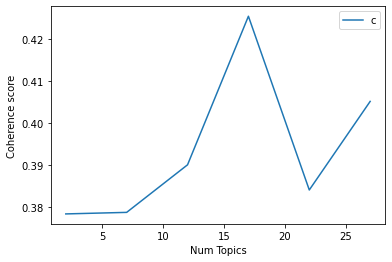

In [58]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score1)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [173]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score1):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 17

index: 0 | Num Topics = 2  has Coherence Value of 0.3784
index: 1 | Num Topics = 7  has Coherence Value of 0.3787
index: 2 | Num Topics = 12  has Coherence Value of 0.39
index: 3 | Num Topics = 17  has Coherence Value of 0.4253
index: 4 | Num Topics = 22  has Coherence Value of 0.3841
index: 5 | Num Topics = 27  has Coherence Value of 0.4051


In [174]:
# Select optimal number of topics
optimal_model_us_score1 = model_list_us_score1[1]

In [175]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score1 = pyLDAvis.gensim_models.prepare(optimal_model_us_score1, corpus_us_score1, id2word_us_score1)

In [176]:
print("pyLDAVis for us topics for score=1:")
vis_us_score1

pyLDAVis for us topics for score=1:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.188810  0.110916       1        1  29.268182
4     -0.150192 -0.132432       2        1  21.957373
0     -0.013577 -0.134741       3        1  20.531328
3     -0.120559  0.108735       4        1  10.819434
2      0.105201 -0.021284       5        1   8.132826
5      0.126904  0.017646       6        1   6.965237
6      0.241032  0.051159       7        1   2.325620, topic_info=         Term         Freq        Total Category  logprob  loglift
166   account  1794.000000  1794.000000  Default  30.0000  30.0000
703      lock   749.000000   749.000000  Default  29.0000  29.0000
60        app  1860.000000  1860.000000  Default  28.0000  28.0000
26      story   384.000000   384.000000  Default  27.0000  27.0000
120    update   738.000000   738.000000  Default  26.0000  26.0000
...       ...          ...          ...      ...      ...      ...
64    content     6.913719    72.380289   Topic7  -5.3594   1.4128
192       bad     7.490937   199.197753   Topic7  -5.2792   0.4806
244     point     7.055504   120.943157   Topic7  -5.3391   0.9197
1142   family     6.979246    95.791755   Topic7  -5.3499   1.1419
120    update     7.309934   738.425529   Topic7  -5.3036  -0.8541

[524 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
0         1  0.468094   able
0         2  0.204041   able
0         3  0.232046   able
0         4  0.032006   able
0         6  0.064013   able
...     ...       ...    ...
144       3  0.137821   year
144       4  0.178019   year
144       5  0.061254   year
224       1  0.125276  young
224       5  0.835174  young

[986 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 5, 1, 4, 3, 6, 7])

## LDA Topic Modelling (Rating = 2)

In [63]:
# By-rating Topic Modelling - rating = 2
# Convert to list - move to each section
review_us_score2 = snapchat_ios_us_review_YearMonth_score2.review.values.tolist()
review_words_us_score2 = list(sent_to_words(review_us_score2))
print(review_words_us_score2[:1])

[['often', 'use', 'snapchat', 'to', 'text', 'friends', 'but', 'recently', 'one', 'of', 'my', 'group', 'chats', 'have', 'received', 'many', 'glitches', 'everything', 'seems', 'to', 'be', 'delayed', 'when', 'send', 'things', 'it', 'doesn', 'send', 'for', 'about', 'minute', 'and', 'no', 'it', 'is', 'not', 'my', 'internet', 'connection', 'because', 'have', 'been', 'using', 'data', 'to', 'see', 'if', 'my', 'internet', 'was', 'the', 'problem', 'which', 'it', 'not', 'also', 'when', 'go', 'to', 'save', 'chats', 'it', 'very', 'delayed', 'it', 'will', 'take', 'about', 'minute', 'to', 'save', 'something', 'please', 'fix', 'this', 'do', 'enjoy', 'all', 'other', 'factors', 'of', 'the', 'app', 'such', 'as', 'news', 'stories', 'and', 'filters']]


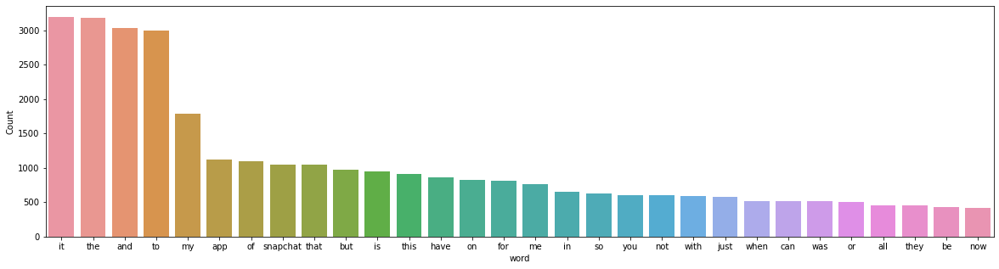

In [64]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score2))

In [65]:
# Clean text
review_us_ready_score2 = process_words(review_words_us_score2)  # processed Text Data! - move to each section


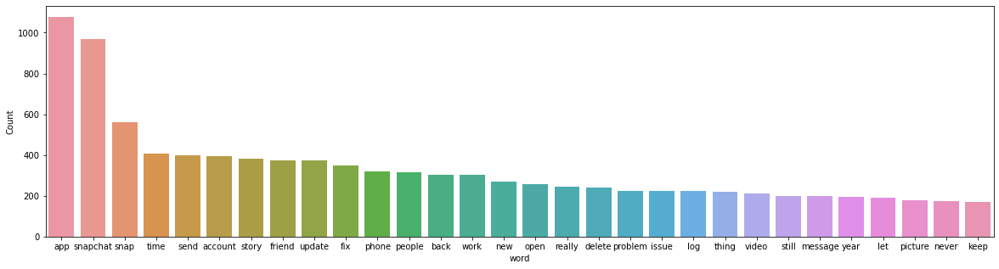

In [66]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score2))


In [67]:
# Create Dictionary
id2word_us_score2 = corpora.Dictionary(review_us_ready_score2)

2021-10-16 22:04:48,781 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 22:04:48,919 [INFO] gensim.corpora.dictionary - built Dictionary(2580 unique tokens: ['chat', 'connection', 'datum', 'delay', 'enjoy']...) from 668 documents (total 30793 corpus positions)
2021-10-16 22:04:48,921 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(2580 unique tokens: ['chat', 'connection', 'datum', 'delay', 'enjoy']...) from 668 documents (total 30793 corpus positions)", 'datetime': '2021-10-16T22:04:48.920937', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [68]:
# Create Corpus: Term Document Frequency
corpus_us_score2 = [id2word_us_score2.doc2bow(text) for text in review_us_ready_score2]

In [69]:
# Training LDA model
model_list_us_score2, coherence_values_us_score2 = compute_coherence_values(dictionary=id2word_us_score2, corpus=corpus_us_score2, 
                                                              texts=review_us_ready_score2, limit=30, start=2, step=5)


2021-10-16 22:04:49,561 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 22:04:49,565 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 22:04:49,569 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 22:04:49,571 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 668 documents, updating model once every 668 documents, evaluating perplexity every 668 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 22:04:52,244 [INFO] gensim.models.ldamodel - -8.315 per-word bound, 318.5 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:04:52,245 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #668/668
2021-10-16 22:04:54,411 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"snapchat" + 0.031*"app" + 0.018*"account" + 0.013*"snap" + 0.012*"fix" + 0.012*"friend" + 0.012*

2021-10-16 22:05:28,925 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.031*"app" + 0.023*"snapchat" + 0.021*"snap" + 0.018*"story" + 0.015*"send" + 0.015*"update" + 0.012*"time" + 0.011*"people" + 0.011*"friend" + 0.010*"open"
2021-10-16 22:05:28,926 [INFO] gensim.models.ldamodel - topic diff=0.026540, rho=0.301511
2021-10-16 22:05:30,796 [INFO] gensim.models.ldamodel - -6.372 per-word bound, 82.8 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:05:30,798 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #668/668
2021-10-16 22:05:32,263 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"snapchat" + 0.035*"app" + 0.028*"account" + 0.016*"phone" + 0.015*"log" + 0.014*"fix" + 0.013*"work" + 0.013*"time" + 0.012*"friend" + 0.012*"lock"
2021-10-16 22:05:32,265 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.031*"app" + 0.023*"snapchat" + 0.021*"snap" + 0.018*"story" + 0.015*"send" + 0.015*"update" + 0.012*"time" + 0.0

2021-10-16 22:06:01,787 [INFO] gensim.models.ldamodel - topic diff=0.011198, rho=0.218218
2021-10-16 22:06:03,544 [INFO] gensim.models.ldamodel - -6.363 per-word bound, 82.3 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:06:03,545 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #668/668
2021-10-16 22:06:04,947 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"snapchat" + 0.035*"app" + 0.029*"account" + 0.017*"phone" + 0.016*"log" + 0.015*"fix" + 0.014*"work" + 0.013*"time" + 0.013*"back" + 0.012*"lock"
2021-10-16 22:06:04,949 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"app" + 0.024*"snapchat" + 0.020*"snap" + 0.019*"story" + 0.015*"update" + 0.015*"send" + 0.012*"people" + 0.011*"time" + 0.011*"friend" + 0.010*"video"
2021-10-16 22:06:04,952 [INFO] gensim.models.ldamodel - topic diff=0.010210, rho=0.213201
2021-10-16 22:06:06,708 [INFO] gensim.models.ldamodel - -6.363 per-word bound, 82.3 perplexity esti

2021-10-16 22:06:35,223 [INFO] gensim.models.ldamodel - -6.360 per-word bound, 82.1 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:06:35,253 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #668/668
2021-10-16 22:06:36,584 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.035*"app" + 0.035*"snapchat" + 0.029*"account" + 0.017*"phone" + 0.016*"log" + 0.015*"fix" + 0.014*"work" + 0.014*"time" + 0.013*"back" + 0.013*"snap"
2021-10-16 22:06:36,586 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"app" + 0.025*"snapchat" + 0.020*"snap" + 0.019*"story" + 0.015*"update" + 0.014*"send" + 0.012*"people" + 0.011*"time" + 0.011*"friend" + 0.010*"video"
2021-10-16 22:06:36,587 [INFO] gensim.models.ldamodel - topic diff=0.005545, rho=0.176777
2021-10-16 22:06:38,464 [INFO] gensim.models.ldamodel - -6.360 per-word bound, 82.1 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:06:38,465 

2021-10-16 22:07:06,992 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #668/668
2021-10-16 22:07:08,199 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.035*"snapchat" + 0.029*"account" + 0.017*"phone" + 0.016*"log" + 0.015*"fix" + 0.014*"work" + 0.014*"time" + 0.013*"snap" + 0.013*"back"
2021-10-16 22:07:08,252 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"app" + 0.025*"snapchat" + 0.020*"snap" + 0.019*"story" + 0.016*"update" + 0.013*"send" + 0.012*"people" + 0.011*"friend" + 0.011*"time" + 0.010*"video"
2021-10-16 22:07:08,283 [INFO] gensim.models.ldamodel - topic diff=0.003595, rho=0.154303
2021-10-16 22:07:10,036 [INFO] gensim.models.ldamodel - -6.359 per-word bound, 82.1 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:07:10,038 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #668/668
2021-10-16 22:07:11,330 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.035

2021-10-16 22:07:35,788 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 22:07:40,223 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 22:07:40,270 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 669 virtual documents
2021-10-16 22:07:40,550 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 22:07:40,552 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 22:07:40,555 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 22:07:40,561 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 668 documents, updating model once every 668 documents, evaluating perplexity every 668 documents, iterating 50x with a con

2021-10-16 22:07:59,296 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.019*"app" + 0.017*"account" + 0.015*"change" + 0.015*"chat" + 0.015*"back" + 0.015*"people" + 0.014*"snapchat" + 0.013*"picture" + 0.012*"log" + 0.012*"number"
2021-10-16 22:07:59,297 [INFO] gensim.models.ldamodel - topic diff=0.153423, rho=0.408248
2021-10-16 22:08:01,082 [INFO] gensim.models.ldamodel - -6.538 per-word bound, 92.9 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:08:01,083 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #668/668
2021-10-16 22:08:02,449 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.046*"snapchat" + 0.037*"app" + 0.036*"account" + 0.017*"fix" + 0.016*"work" + 0.016*"lock" + 0.015*"log" + 0.014*"friend" + 0.012*"problem" + 0.012*"people"
2021-10-16 22:08:02,451 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"snapchat" + 0.026*"update" + 0.026*"app" + 0.014*"camera" + 0.012*"look" + 0.011*"iphone" + 0.011*"c

2021-10-16 22:08:17,525 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"app" + 0.031*"snap" + 0.030*"story" + 0.021*"snapchat" + 0.015*"time" + 0.014*"watch" + 0.013*"ad" + 0.013*"load" + 0.012*"video" + 0.011*"work"
2021-10-16 22:08:17,529 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"snapchat" + 0.040*"account" + 0.036*"app" + 0.018*"lock" + 0.018*"log" + 0.017*"fix" + 0.016*"work" + 0.014*"friend" + 0.012*"time" + 0.012*"problem"
2021-10-16 22:08:17,532 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"snapchat" + 0.028*"update" + 0.024*"app" + 0.015*"camera" + 0.014*"look" + 0.012*"iphone" + 0.011*"change" + 0.010*"snap" + 0.009*"fix" + 0.009*"new"
2021-10-16 22:08:17,535 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.031*"story" + 0.030*"snapchat" + 0.024*"app" + 0.016*"back" + 0.013*"time" + 0.013*"view" + 0.013*"friend" + 0.011*"video" + 0.011*"camera" + 0.011*"screen"
2021-10-16 22:08:17,537 [INFO] gensim.models.ldamodel - topic diff=0.043571, rh

2021-10-16 22:08:32,186 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.029*"update" + 0.028*"snapchat" + 0.024*"app" + 0.016*"camera" + 0.014*"look" + 0.013*"iphone" + 0.012*"change" + 0.010*"snap" + 0.009*"new" + 0.009*"bad"
2021-10-16 22:08:32,187 [INFO] gensim.models.ldamodel - topic diff=0.026010, rho=0.242536
2021-10-16 22:08:33,958 [INFO] gensim.models.ldamodel - -6.487 per-word bound, 89.7 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:08:33,961 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #668/668
2021-10-16 22:08:35,155 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.044*"app" + 0.032*"snap" + 0.031*"open" + 0.027*"send" + 0.025*"snapchat" + 0.022*"phone" + 0.017*"time" + 0.016*"fix" + 0.015*"message" + 0.015*"work"
2021-10-16 22:08:35,157 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"story" + 0.030*"snapchat" + 0.022*"app" + 0.016*"back" + 0.014*"view" + 0.013*"time" + 0.013*"friend" + 0.012

2021-10-16 22:08:49,244 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.034*"app" + 0.023*"snapchat" + 0.019*"people" + 0.019*"snap" + 0.018*"send" + 0.017*"friend" + 0.013*"story" + 0.013*"thing" + 0.012*"update" + 0.012*"video"
2021-10-16 22:08:49,246 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"story" + 0.032*"app" + 0.028*"snap" + 0.020*"snapchat" + 0.017*"watch" + 0.016*"ad" + 0.016*"video" + 0.014*"time" + 0.013*"load" + 0.011*"memory"
2021-10-16 22:08:49,249 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"account" + 0.045*"snapchat" + 0.034*"app" + 0.020*"log" + 0.019*"lock" + 0.016*"fix" + 0.014*"friend" + 0.013*"work" + 0.012*"time" + 0.012*"back"
2021-10-16 22:08:49,251 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.046*"app" + 0.033*"snap" + 0.031*"open" + 0.028*"send" + 0.026*"snapchat" + 0.022*"phone" + 0.017*"time" + 0.017*"work" + 0.016*"fix" + 0.016*"message"
2021-10-16 22:08:49,253 [INFO] gensim.models.ldamodel - topic diff=0.018130, rho=0

2021-10-16 22:09:02,864 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.020*"change" + 0.020*"chat" + 0.018*"picture" + 0.017*"people" + 0.014*"number" + 0.014*"app" + 0.012*"back" + 0.012*"add" + 0.012*"snapchat" + 0.011*"friend"
2021-10-16 22:09:02,865 [INFO] gensim.models.ldamodel - topic diff=0.014315, rho=0.188982
2021-10-16 22:09:04,473 [INFO] gensim.models.ldamodel - -6.469 per-word bound, 88.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:09:04,475 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #668/668
2021-10-16 22:09:05,611 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.033*"app" + 0.023*"snapchat" + 0.020*"people" + 0.018*"snap" + 0.017*"friend" + 0.017*"send" + 0.014*"story" + 0.013*"thing" + 0.011*"video" + 0.011*"update"
2021-10-16 22:09:05,613 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"update" + 0.028*"snapchat" + 0.022*"app" + 0.016*"camera" + 0.015*"look" + 0.013*"iphone" + 0.013*"

2021-10-16 22:09:19,286 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.033*"app" + 0.024*"snapchat" + 0.021*"people" + 0.017*"friend" + 0.017*"snap" + 0.016*"send" + 0.013*"story" + 0.013*"thing" + 0.011*"video" + 0.011*"time"
2021-10-16 22:09:19,288 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"story" + 0.029*"snapchat" + 0.019*"app" + 0.015*"view" + 0.015*"back" + 0.013*"camera" + 0.013*"setting" + 0.013*"friend" + 0.013*"time" + 0.013*"video"
2021-10-16 22:09:19,292 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.044*"story" + 0.029*"app" + 0.025*"snap" + 0.020*"video" + 0.020*"watch" + 0.019*"snapchat" + 0.018*"ad" + 0.013*"memory" + 0.013*"time" + 0.012*"post"
2021-10-16 22:09:19,294 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.051*"app" + 0.034*"snap" + 0.030*"open" + 0.030*"send" + 0.028*"snapchat" + 0.022*"phone" + 0.019*"work" + 0.018*"time" + 0.017*"fix" + 0.016*"delete"
2021-10-16 22:09:19,296 [INFO] gensim.models.ldamodel - topic diff=0.011589, rh

2021-10-16 22:09:33,101 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"account" + 0.044*"snapchat" + 0.030*"app" + 0.022*"log" + 0.021*"lock" + 0.016*"fix" + 0.013*"back" + 0.013*"friend" + 0.012*"time" + 0.011*"new"
2021-10-16 22:09:33,103 [INFO] gensim.models.ldamodel - topic diff=0.009704, rho=0.160128
2021-10-16 22:09:34,668 [INFO] gensim.models.ldamodel - -6.460 per-word bound, 88.0 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:09:34,670 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #668/668
2021-10-16 22:09:35,836 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.031*"update" + 0.027*"snapchat" + 0.022*"app" + 0.016*"camera" + 0.015*"look" + 0.014*"change" + 0.014*"iphone" + 0.011*"new" + 0.010*"snap" + 0.010*"bad"
2021-10-16 22:09:35,837 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.046*"story" + 0.027*"app" + 0.025*"snap" + 0.021*"video" + 0.020*"watch" + 0.019*"snapchat" + 0.019*"ad" + 0.014*"m

2021-10-16 22:09:49,814 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.049*"story" + 0.026*"app" + 0.024*"snap" + 0.022*"video" + 0.021*"watch" + 0.020*"ad" + 0.019*"snapchat" + 0.015*"post" + 0.014*"memory" + 0.012*"time"
2021-10-16 22:09:49,816 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.022*"chat" + 0.020*"change" + 0.019*"picture" + 0.017*"people" + 0.013*"app" + 0.013*"add" + 0.012*"friend" + 0.010*"back" + 0.010*"snapchat" + 0.009*"keep"
2021-10-16 22:09:49,817 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"story" + 0.029*"snapchat" + 0.018*"app" + 0.015*"view" + 0.014*"setting" + 0.014*"camera" + 0.014*"back" + 0.013*"friend" + 0.012*"time" + 0.012*"video"
2021-10-16 22:09:49,819 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"app" + 0.024*"snapchat" + 0.022*"people" + 0.018*"friend" + 0.016*"snap" + 0.014*"send" + 0.013*"thing" + 0.013*"story" + 0.011*"video" + 0.010*"time"
2021-10-16 22:09:49,820 [INFO] gensim.models.ldamodel - topic diff=0.0082

2021-10-16 22:10:03,916 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"app" + 0.034*"snap" + 0.030*"send" + 0.029*"snapchat" + 0.028*"open" + 0.021*"phone" + 0.021*"work" + 0.019*"time" + 0.017*"fix" + 0.016*"update"
2021-10-16 22:10:03,921 [INFO] gensim.models.ldamodel - topic diff=0.007255, rho=0.141421
2021-10-16 22:10:05,706 [INFO] gensim.models.ldamodel - -6.453 per-word bound, 87.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:10:05,707 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #668/668
2021-10-16 22:10:06,931 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.051*"story" + 0.024*"app" + 0.024*"video" + 0.023*"snap" + 0.022*"watch" + 0.021*"ad" + 0.019*"snapchat" + 0.016*"post" + 0.015*"memory" + 0.012*"save"
2021-10-16 22:10:06,932 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"app" + 0.024*"snapchat" + 0.022*"people" + 0.018*"friend" + 0.015*"snap" + 0.013*"thing" + 0.013*"send" + 0.013*"

2021-10-16 22:10:26,600 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.052*"app" + 0.019*"snapchat" + 0.016*"friend" + 0.014*"time" + 0.012*"back" + 0.012*"snap" + 0.012*"delete" + 0.012*"fix" + 0.011*"story" + 0.009*"problem"
2021-10-16 22:10:26,603 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.027*"story" + 0.026*"snapchat" + 0.026*"snap" + 0.021*"video" + 0.020*"app" + 0.017*"ad" + 0.014*"watch" + 0.012*"fix" + 0.012*"second" + 0.011*"time"
2021-10-16 22:10:26,607 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.029*"app" + 0.025*"snap" + 0.023*"open" + 0.022*"message" + 0.021*"send" + 0.021*"phone" + 0.020*"time" + 0.019*"snapchat" + 0.014*"fix" + 0.014*"still"
2021-10-16 22:10:26,616 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.041*"snapchat" + 0.026*"app" + 0.025*"friend" + 0.025*"snap" + 0.025*"people" + 0.016*"add" + 0.016*"story" + 0.012*"send" + 0.011*"new" + 0.010*"phone"
2021-10-16 22:10:26,619 [INFO] gensim.models.ldamodel - topic diff=0.302406, rho=0

2021-10-16 22:10:40,815 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"snapchat" + 0.022*"app" + 0.021*"story" + 0.017*"time" + 0.011*"friend" + 0.011*"issue" + 0.010*"view" + 0.009*"setting" + 0.009*"thing" + 0.009*"video"
2021-10-16 22:10:40,817 [INFO] gensim.models.ldamodel - topic diff=0.093400, rho=0.316228
2021-10-16 22:10:42,356 [INFO] gensim.models.ldamodel - -6.582 per-word bound, 95.8 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:10:42,357 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #668/668
2021-10-16 22:10:43,561 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.049*"iphone" + 0.040*"camera" + 0.026*"snapchat" + 0.023*"story" + 0.020*"issue" + 0.019*"photo" + 0.016*"page" + 0.015*"fix" + 0.014*"quality" + 0.012*"post"
2021-10-16 22:10:43,562 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.048*"app" + 0.025*"snap" + 0.024*"update" + 0.021*"snapchat" + 0.019*"send" + 0.018*"open" + 0.018*"work

2021-10-16 22:10:57,443 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.034*"app" + 0.028*"send" + 0.026*"snap" + 0.025*"message" + 0.023*"snapchat" + 0.022*"phone" + 0.022*"open" + 0.021*"time" + 0.018*"fix" + 0.018*"still"
2021-10-16 22:10:57,446 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.052*"snapchat" + 0.036*"app" + 0.023*"account" + 0.020*"fix" + 0.017*"people" + 0.016*"problem" + 0.015*"friend" + 0.012*"work" + 0.011*"really" + 0.011*"love"
2021-10-16 22:10:57,448 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.038*"snapchat" + 0.020*"app" + 0.020*"story" + 0.016*"time" + 0.012*"setting" + 0.012*"friend" + 0.011*"view" + 0.010*"help" + 0.009*"camera" + 0.009*"issue"
2021-10-16 22:10:57,450 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.039*"snapchat" + 0.033*"people" + 0.031*"friend" + 0.026*"app" + 0.024*"snap" + 0.021*"add" + 0.016*"story" + 0.012*"send" + 0.009*"show" + 0.009*"new"
2021-10-16 22:10:57,455 [INFO] gensim.models.ldamodel - topic diff=0.036

2021-10-16 22:11:11,451 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.046*"app" + 0.019*"snapchat" + 0.018*"friend" + 0.014*"story" + 0.014*"time" + 0.010*"really" + 0.010*"chat" + 0.010*"back" + 0.009*"delete" + 0.009*"give"
2021-10-16 22:11:11,465 [INFO] gensim.models.ldamodel - topic diff=0.022952, rho=0.218218
2021-10-16 22:11:12,952 [INFO] gensim.models.ldamodel - -6.545 per-word bound, 93.4 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:11:12,954 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #668/668
2021-10-16 22:11:14,206 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"snapchat" + 0.038*"app" + 0.021*"fix" + 0.019*"account" + 0.018*"people" + 0.016*"problem" + 0.016*"friend" + 0.012*"love" + 0.011*"really" + 0.010*"work"
2021-10-16 22:11:14,207 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.038*"snapchat" + 0.020*"story" + 0.020*"app" + 0.016*"time" + 0.014*"setting" + 0.012*"friend" + 0.012*"h

2021-10-16 22:11:28,052 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.029*"snapchat" + 0.027*"update" + 0.027*"app" + 0.015*"look" + 0.012*"time" + 0.011*"bad" + 0.011*"change" + 0.010*"really" + 0.009*"feature" + 0.009*"user"
2021-10-16 22:11:28,054 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.028*"app" + 0.025*"send" + 0.021*"snapchat" + 0.018*"video" + 0.015*"time" + 0.015*"snap" + 0.013*"update" + 0.012*"friend" + 0.010*"new" + 0.009*"access"
2021-10-16 22:11:28,068 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.038*"snapchat" + 0.020*"story" + 0.019*"app" + 0.016*"setting" + 0.015*"time" + 0.013*"help" + 0.012*"friend" + 0.012*"camera" + 0.011*"view" + 0.009*"video"
2021-10-16 22:11:28,094 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.079*"account" + 0.035*"snapchat" + 0.033*"lock" + 0.030*"log" + 0.021*"phone" + 0.018*"email" + 0.018*"new" + 0.017*"back" + 0.017*"app" + 0.014*"password"
2021-10-16 22:11:28,118 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 22:11:41,846 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.080*"account" + 0.035*"snapchat" + 0.033*"lock" + 0.031*"log" + 0.020*"phone" + 0.019*"email" + 0.018*"new" + 0.018*"back" + 0.017*"app" + 0.014*"password"
2021-10-16 22:11:41,847 [INFO] gensim.models.ldamodel - topic diff=0.012982, rho=0.176777
2021-10-16 22:11:43,438 [INFO] gensim.models.ldamodel - -6.530 per-word bound, 92.4 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:11:43,439 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #668/668
2021-10-16 22:11:44,567 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.045*"app" + 0.018*"snapchat" + 0.018*"friend" + 0.014*"story" + 0.014*"time" + 0.010*"chat" + 0.010*"ad" + 0.010*"really" + 0.010*"give" + 0.009*"back"
2021-10-16 22:11:44,568 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"snapchat" + 0.039*"app" + 0.022*"fix" + 0.019*"people" + 0.017*"friend" + 0.016*"problem" + 0.016*"account" 

2021-10-16 22:11:57,950 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"snapchat" + 0.040*"app" + 0.022*"fix" + 0.020*"people" + 0.017*"friend" + 0.016*"problem" + 0.014*"account" + 0.013*"love" + 0.012*"really" + 0.010*"update"
2021-10-16 22:11:57,951 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.038*"app" + 0.031*"send" + 0.028*"snapchat" + 0.026*"snap" + 0.023*"message" + 0.023*"phone" + 0.022*"time" + 0.020*"open" + 0.020*"fix" + 0.019*"work"
2021-10-16 22:11:57,953 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"people" + 0.036*"snapchat" + 0.035*"friend" + 0.027*"add" + 0.027*"app" + 0.021*"snap" + 0.016*"story" + 0.010*"show" + 0.009*"look" + 0.009*"way"
2021-10-16 22:11:57,955 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.060*"iphone" + 0.058*"camera" + 0.030*"snapchat" + 0.025*"photo" + 0.019*"issue" + 0.017*"picture" + 0.016*"quality" + 0.015*"fix" + 0.014*"page" + 0.013*"front"
2021-10-16 22:11:57,956 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 22:12:11,065 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.081*"account" + 0.036*"snapchat" + 0.034*"lock" + 0.031*"log" + 0.020*"phone" + 0.019*"email" + 0.019*"back" + 0.018*"new" + 0.017*"app" + 0.014*"password"
2021-10-16 22:12:11,066 [INFO] gensim.models.ldamodel - topic diff=0.009018, rho=0.152499
2021-10-16 22:12:12,577 [INFO] gensim.models.ldamodel - -6.519 per-word bound, 91.7 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:12:12,578 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #668/668
2021-10-16 22:12:13,667 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.047*"app" + 0.029*"snap" + 0.026*"update" + 0.024*"snapchat" + 0.018*"open" + 0.018*"send" + 0.018*"work" + 0.016*"story" + 0.014*"back" + 0.014*"fix"
2021-10-16 22:12:13,669 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.041*"people" + 0.035*"snapchat" + 0.035*"friend" + 0.028*"add" + 0.027*"app" + 0.020*"snap" + 0.016*"story" + 0.0

2021-10-16 22:12:26,899 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"snapchat" + 0.041*"app" + 0.022*"fix" + 0.020*"people" + 0.017*"friend" + 0.015*"problem" + 0.013*"love" + 0.011*"really" + 0.011*"account" + 0.010*"update"
2021-10-16 22:12:26,902 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.051*"story" + 0.041*"video" + 0.038*"ad" + 0.025*"watch" + 0.023*"snapchat" + 0.018*"second" + 0.017*"snap" + 0.016*"post" + 0.011*"save" + 0.010*"memory"
2021-10-16 22:12:26,905 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.082*"account" + 0.036*"snapchat" + 0.034*"lock" + 0.031*"log" + 0.019*"phone" + 0.019*"email" + 0.019*"back" + 0.018*"new" + 0.017*"app" + 0.014*"password"
2021-10-16 22:12:26,908 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.062*"camera" + 0.061*"iphone" + 0.031*"snapchat" + 0.026*"photo" + 0.019*"issue" + 0.019*"picture" + 0.016*"quality" + 0.015*"fix" + 0.013*"front" + 0.012*"page"
2021-10-16 22:12:26,910 [INFO] gensim.models.ldamodel - topi

2021-10-16 22:12:46,459 [INFO] gensim.models.ldamodel - topic diff=0.510769, rho=0.577350
2021-10-16 22:12:48,203 [INFO] gensim.models.ldamodel - -6.863 per-word bound, 116.4 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:12:48,204 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #668/668
2021-10-16 22:12:49,577 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.046*"snapchat" + 0.021*"issue" + 0.020*"app" + 0.018*"time" + 0.016*"setting" + 0.016*"story" + 0.013*"camera" + 0.012*"log" + 0.012*"notification" + 0.011*"message"
2021-10-16 22:12:49,578 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.034*"snap" + 0.026*"app" + 0.023*"snapchat" + 0.018*"phone" + 0.017*"time" + 0.015*"story" + 0.014*"people" + 0.013*"friend" + 0.012*"fix" + 0.012*"work"
2021-10-16 22:12:49,580 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.055*"snapchat" + 0.033*"account" + 0.030*"app" + 0.018*"fix" + 0.016*"lock" + 0.016*"people" + 0.01

2021-10-16 22:13:03,577 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.055*"snapchat" + 0.034*"account" + 0.028*"app" + 0.019*"lock" + 0.018*"fix" + 0.017*"people" + 0.012*"friend" + 0.012*"problem" + 0.012*"really" + 0.011*"work"
2021-10-16 22:13:03,578 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.042*"snapchat" + 0.027*"friend" + 0.026*"people" + 0.023*"add" + 0.023*"snap" + 0.022*"app" + 0.011*"story" + 0.010*"send" + 0.010*"show" + 0.009*"chat"
2021-10-16 22:13:03,580 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.026*"ad" + 0.025*"story" + 0.023*"page" + 0.021*"snapchat" + 0.019*"app" + 0.017*"video" + 0.016*"watch" + 0.015*"time" + 0.012*"really" + 0.011*"thing"
2021-10-16 22:13:03,581 [INFO] gensim.models.ldamodel - topic diff=0.147373, rho=0.333333
2021-10-16 22:13:05,104 [INFO] gensim.models.ldamodel - -6.667 per-word bound, 101.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:13:05,105 [INFO] gensim.models.lda

2021-10-16 22:13:17,126 [INFO] gensim.models.ldamodel - topic diff=0.061278, rho=0.267261
2021-10-16 22:13:18,715 [INFO] gensim.models.ldamodel - -6.629 per-word bound, 99.0 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:13:18,716 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #668/668
2021-10-16 22:13:19,834 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.028*"story" + 0.028*"ad" + 0.026*"page" + 0.020*"snapchat" + 0.018*"app" + 0.017*"watch" + 0.017*"video" + 0.015*"time" + 0.012*"really" + 0.010*"thing"
2021-10-16 22:13:19,836 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.034*"send" + 0.030*"app" + 0.023*"video" + 0.023*"snapchat" + 0.022*"snap" + 0.018*"time" + 0.015*"friend" + 0.012*"streak" + 0.010*"update" + 0.009*"keep"
2021-10-16 22:13:19,839 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.043*"snap" + 0.041*"open" + 0.031*"send" + 0.028*"app" + 0.024*"message" + 0.022*"snapchat" + 0.017*"fix" + 0.0

2021-10-16 22:13:32,853 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.054*"app" + 0.025*"snapchat" + 0.022*"friend" + 0.017*"look" + 0.011*"let" + 0.011*"story" + 0.011*"well" + 0.010*"filter" + 0.009*"really" + 0.009*"great"
2021-10-16 22:13:32,855 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.029*"snapchat" + 0.023*"story" + 0.021*"video" + 0.016*"app" + 0.016*"time" + 0.013*"friend" + 0.012*"cameo" + 0.011*"never" + 0.010*"view" + 0.010*"issue"
2021-10-16 22:13:32,858 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.054*"snapchat" + 0.034*"account" + 0.028*"app" + 0.021*"lock" + 0.019*"people" + 0.016*"fix" + 0.012*"friend" + 0.012*"really" + 0.011*"problem" + 0.010*"tell"
2021-10-16 22:13:32,861 [INFO] gensim.models.ldamodel - topic diff=0.032254, rho=0.223607
2021-10-16 22:13:34,336 [INFO] gensim.models.ldamodel - -6.602 per-word bound, 97.2 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:13:34,338 [INFO] gensim.models.

2021-10-16 22:13:45,645 [INFO] gensim.models.ldamodel - topic diff=0.022561, rho=0.200000
2021-10-16 22:13:47,207 [INFO] gensim.models.ldamodel - -6.588 per-word bound, 96.2 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:13:47,209 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #668/668
2021-10-16 22:13:48,278 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.036*"snap" + 0.023*"snapchat" + 0.019*"app" + 0.018*"people" + 0.017*"time" + 0.015*"phone" + 0.015*"friend" + 0.014*"story" + 0.013*"video" + 0.013*"thing"
2021-10-16 22:13:48,280 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.039*"snapchat" + 0.032*"friend" + 0.032*"people" + 0.029*"add" + 0.020*"app" + 0.018*"snap" + 0.011*"story" + 0.010*"show" + 0.010*"chat" + 0.010*"thing"
2021-10-16 22:13:48,294 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.050*"snap" + 0.042*"open" + 0.037*"send" + 0.027*"message" + 0.025*"app" + 0.021*"snapchat" + 0.017*"fix" + 

2021-10-16 22:14:00,884 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.036*"snap" + 0.022*"snapchat" + 0.019*"people" + 0.018*"app" + 0.017*"time" + 0.015*"friend" + 0.015*"phone" + 0.014*"story" + 0.013*"video" + 0.013*"thing"
2021-10-16 22:14:00,945 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.024*"chat" + 0.022*"people" + 0.020*"picture" + 0.019*"video" + 0.016*"change" + 0.015*"app" + 0.014*"story" + 0.013*"show" + 0.012*"give" + 0.011*"snapchat"
2021-10-16 22:14:00,951 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.028*"snapchat" + 0.025*"story" + 0.022*"app" + 0.019*"ad" + 0.018*"time" + 0.013*"memory" + 0.012*"watch" + 0.011*"snap" + 0.010*"point" + 0.009*"add"
2021-10-16 22:14:00,952 [INFO] gensim.models.ldamodel - topic diff=0.016422, rho=0.179605
2021-10-16 22:14:02,348 [INFO] gensim.models.ldamodel - -6.577 per-word bound, 95.5 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:14:02,349 [INFO] gensim.models.ldamo

2021-10-16 22:14:13,590 [INFO] gensim.models.ldamodel - topic diff=0.013160, rho=0.166667
2021-10-16 22:14:15,122 [INFO] gensim.models.ldamodel - -6.570 per-word bound, 95.0 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:14:15,124 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #668/668
2021-10-16 22:14:16,255 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.058*"app" + 0.031*"snapchat" + 0.027*"work" + 0.024*"snap" + 0.020*"send" + 0.019*"fix" + 0.019*"delete" + 0.018*"time" + 0.018*"phone" + 0.017*"open"
2021-10-16 22:14:16,256 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.024*"chat" + 0.022*"people" + 0.021*"picture" + 0.019*"video" + 0.016*"change" + 0.014*"app" + 0.014*"story" + 0.013*"show" + 0.012*"give" + 0.011*"snapchat"
2021-10-16 22:14:16,258 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.034*"send" + 0.026*"video" + 0.025*"app" + 0.023*"snapchat" + 0.020*"snap" + 0.016*"time" + 0.014*"streak" + 0.0

2021-10-16 22:14:29,209 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.038*"snapchat" + 0.034*"people" + 0.033*"friend" + 0.030*"add" + 0.020*"app" + 0.016*"snap" + 0.010*"story" + 0.010*"chat" + 0.010*"show" + 0.010*"thing"
2021-10-16 22:14:29,211 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.047*"update" + 0.030*"app" + 0.026*"story" + 0.022*"new" + 0.019*"snapchat" + 0.016*"swipe" + 0.016*"change" + 0.016*"people" + 0.016*"map" + 0.012*"look"
2021-10-16 22:14:29,213 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.034*"send" + 0.026*"video" + 0.024*"app" + 0.023*"snapchat" + 0.020*"snap" + 0.016*"time" + 0.014*"streak" + 0.013*"friend" + 0.009*"picture" + 0.009*"save"
2021-10-16 22:14:29,216 [INFO] gensim.models.ldamodel - topic diff=0.010225, rho=0.154303
2021-10-16 22:14:30,599 [INFO] gensim.models.ldamodel - -6.563 per-word bound, 94.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:14:30,633 [INFO] gensim.models.ldam

2021-10-16 22:14:41,716 [INFO] gensim.models.ldamodel - topic diff=0.008519, rho=0.145865
2021-10-16 22:14:43,049 [INFO] gensim.models.ldamodel - -6.559 per-word bound, 94.3 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:14:43,050 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #668/668
2021-10-16 22:14:44,078 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.038*"snapchat" + 0.035*"people" + 0.033*"friend" + 0.031*"add" + 0.020*"app" + 0.016*"snap" + 0.010*"chat" + 0.010*"show" + 0.010*"thing" + 0.010*"story"
2021-10-16 22:14:44,080 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.034*"send" + 0.027*"video" + 0.023*"app" + 0.023*"snapchat" + 0.020*"snap" + 0.016*"time" + 0.014*"streak" + 0.013*"friend" + 0.010*"picture" + 0.009*"save"
2021-10-16 22:14:44,081 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.024*"chat" + 0.022*"people" + 0.022*"picture" + 0.020*"video" + 0.015*"change" + 0.014*"story" + 0.014*"app" 

2021-10-16 22:15:03,725 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.033*"snapchat" + 0.018*"app" + 0.014*"friend" + 0.014*"story" + 0.013*"phone" + 0.011*"load" + 0.010*"account" + 0.010*"time" + 0.010*"video" + 0.008*"day"
2021-10-16 22:15:03,729 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.048*"snapchat" + 0.033*"app" + 0.025*"snap" + 0.016*"update" + 0.015*"time" + 0.015*"send" + 0.014*"friend" + 0.014*"open" + 0.013*"story" + 0.013*"problem"
2021-10-16 22:15:03,736 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.029*"app" + 0.023*"snap" + 0.019*"snapchat" + 0.018*"story" + 0.013*"phone" + 0.013*"video" + 0.012*"memory" + 0.011*"save" + 0.010*"account" + 0.009*"time"
2021-10-16 22:15:03,738 [INFO] gensim.models.ldamodel - topic diff=15.358616, rho=1.000000
2021-10-16 22:15:05,724 [INFO] gensim.models.ldamodel - -7.111 per-word bound, 138.3 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:15:05,725 [INFO] gensim.models

2021-10-16 22:15:18,462 [INFO] gensim.models.ldamodel - topic diff=0.270971, rho=0.377964
2021-10-16 22:15:20,103 [INFO] gensim.models.ldamodel - -6.749 per-word bound, 107.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:15:20,104 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #668/668
2021-10-16 22:15:21,267 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.036*"app" + 0.019*"update" + 0.016*"snapchat" + 0.013*"story" + 0.012*"bottom" + 0.012*"look" + 0.011*"bar" + 0.011*"page" + 0.011*"bad" + 0.009*"people"
2021-10-16 22:15:21,304 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.024*"chat" + 0.018*"video" + 0.018*"people" + 0.017*"picture" + 0.017*"app" + 0.013*"thing" + 0.013*"friend" + 0.011*"back" + 0.011*"snapchat" + 0.010*"phone"
2021-10-16 22:15:21,331 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.049*"account" + 0.025*"snapchat" + 0.018*"app" + 0.018*"picture" + 0.018*"new" + 0.015*"never" + 0.011*"sna

2021-10-16 22:15:35,208 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.036*"streak" + 0.027*"app" + 0.022*"snap" + 0.014*"year" + 0.013*"issue" + 0.013*"snapchat" + 0.012*"game" + 0.011*"time" + 0.010*"cause" + 0.010*"glitch"
2021-10-16 22:15:35,210 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.028*"snapchat" + 0.018*"friend" + 0.016*"story" + 0.014*"app" + 0.012*"page" + 0.012*"somehow" + 0.011*"time" + 0.011*"picture" + 0.010*"much" + 0.009*"show"
2021-10-16 22:15:35,212 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.022*"snapchat" + 0.020*"time" + 0.020*"app" + 0.013*"friend" + 0.012*"notification" + 0.012*"people" + 0.011*"chat" + 0.010*"issue" + 0.010*"back" + 0.009*"snap"
2021-10-16 22:15:35,214 [INFO] gensim.models.ldamodel - topic diff=0.078781, rho=0.277350
2021-10-16 22:15:36,767 [INFO] gensim.models.ldamodel - -6.683 per-word bound, 102.8 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:15:36,768 [INFO] gensim.mo

2021-10-16 22:15:48,729 [INFO] gensim.models.ldamodel - topic diff=0.039782, rho=0.235702
2021-10-16 22:15:50,279 [INFO] gensim.models.ldamodel - -6.661 per-word bound, 101.2 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:15:50,290 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #668/668
2021-10-16 22:15:51,427 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.032*"app" + 0.029*"phone" + 0.023*"snapchat" + 0.017*"story" + 0.013*"snap" + 0.012*"people" + 0.011*"save" + 0.011*"notification" + 0.011*"give" + 0.010*"time"
2021-10-16 22:15:51,455 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.040*"video" + 0.026*"second" + 0.017*"picture" + 0.016*"cameo" + 0.015*"save" + 0.015*"snapchat" + 0.014*"vid" + 0.013*"post" + 0.012*"send" + 0.012*"time"
2021-10-16 22:15:51,459 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.034*"app" + 0.019*"update" + 0.017*"snapchat" + 0.016*"bad" + 0.014*"story" + 0.013*"look" + 0.013*"

2021-10-16 22:16:04,469 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.042*"video" + 0.027*"second" + 0.017*"picture" + 0.017*"cameo" + 0.016*"save" + 0.014*"snapchat" + 0.014*"vid" + 0.013*"post" + 0.012*"really" + 0.012*"time"
2021-10-16 22:16:04,473 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.053*"snapchat" + 0.040*"account" + 0.028*"app" + 0.027*"lock" + 0.023*"people" + 0.013*"unlock" + 0.013*"really" + 0.012*"friend" + 0.011*"new" + 0.011*"way"
2021-10-16 22:16:04,478 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.034*"app" + 0.018*"update" + 0.018*"snapchat" + 0.017*"bad" + 0.014*"story" + 0.014*"look" + 0.012*"bottom" + 0.012*"bar" + 0.012*"page" + 0.010*"iphone"
2021-10-16 22:16:04,481 [INFO] gensim.models.ldamodel - topic diff=0.023255, rho=0.204124
2021-10-16 22:16:05,993 [INFO] gensim.models.ldamodel - -6.644 per-word bound, 100.0 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:16:05,994 [INFO] gensim.models

2021-10-16 22:16:17,600 [INFO] gensim.models.ldamodel - topic diff=0.017204, rho=0.185695
2021-10-16 22:16:19,188 [INFO] gensim.models.ldamodel - -6.633 per-word bound, 99.3 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:16:19,190 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #668/668
2021-10-16 22:16:20,269 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.044*"add" + 0.040*"people" + 0.031*"friend" + 0.030*"snapchat" + 0.027*"app" + 0.017*"snap" + 0.013*"quick" + 0.011*"send" + 0.010*"thing" + 0.010*"back"
2021-10-16 22:16:20,271 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.031*"memory" + 0.029*"video" + 0.026*"snap" + 0.023*"app" + 0.022*"story" + 0.019*"load" + 0.017*"save" + 0.016*"snapchat" + 0.013*"post" + 0.011*"keep"
2021-10-16 22:16:20,272 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.045*"app" + 0.042*"snapchat" + 0.031*"snap" + 0.022*"send" + 0.019*"work" + 0.018*"open" + 0.018*"time" + 0.017*

2021-10-16 22:16:33,234 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"app" + 0.016*"time" + 0.015*"fix" + 0.013*"snap" + 0.012*"send" + 0.012*"let" + 0.012*"chat" + 0.011*"friend" + 0.011*"glitch" + 0.011*"love"
2021-10-16 22:16:33,236 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.045*"streak" + 0.026*"app" + 0.025*"snap" + 0.017*"year" + 0.015*"issue" + 0.013*"snapchat" + 0.013*"time" + 0.012*"game" + 0.011*"disappear" + 0.011*"cause"
2021-10-16 22:16:33,239 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.038*"app" + 0.035*"update" + 0.020*"new" + 0.019*"send" + 0.019*"message" + 0.018*"snap" + 0.017*"screen" + 0.016*"change" + 0.015*"open" + 0.015*"back"
2021-10-16 22:16:33,240 [INFO] gensim.models.ldamodel - topic diff=0.013018, rho=0.169031
2021-10-16 22:16:34,699 [INFO] gensim.models.ldamodel - -6.623 per-word bound, 98.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:16:34,701 [INFO] gensim.models.ldamodel - PRO

2021-10-16 22:16:46,029 [INFO] gensim.models.ldamodel - topic diff=0.010940, rho=0.158114
2021-10-16 22:16:47,620 [INFO] gensim.models.ldamodel - -6.617 per-word bound, 98.1 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:16:47,621 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #668/668
2021-10-16 22:16:48,666 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.025*"look" + 0.017*"news" + 0.013*"well" + 0.013*"camera" + 0.012*"find" + 0.011*"layout" + 0.011*"really" + 0.010*"understand" + 0.010*"list" + 0.009*"message"
2021-10-16 22:16:48,667 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.053*"snapchat" + 0.030*"account" + 0.029*"app" + 0.024*"people" + 0.020*"lock" + 0.013*"unlock" + 0.012*"really" + 0.012*"friend" + 0.012*"way" + 0.012*"love"
2021-10-16 22:16:48,670 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.046*"app" + 0.042*"snapchat" + 0.031*"snap" + 0.022*"send" + 0.020*"work" + 0.018*"open" + 0.018*"ti

2021-10-16 22:17:01,374 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.026*"video" + 0.025*"chat" + 0.023*"picture" + 0.019*"people" + 0.017*"feature" + 0.017*"share" + 0.016*"thing" + 0.015*"app" + 0.012*"snapchat" + 0.012*"friend"
2021-10-16 22:17:01,378 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.089*"account" + 0.040*"log" + 0.039*"lock" + 0.037*"snapchat" + 0.025*"back" + 0.023*"email" + 0.021*"phone" + 0.019*"number" + 0.018*"password" + 0.016*"new"
2021-10-16 22:17:01,381 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.019*"story" + 0.017*"friend" + 0.015*"app" + 0.015*"page" + 0.015*"somehow" + 0.012*"much" + 0.011*"snapchat" + 0.011*"show" + 0.011*"time" + 0.010*"view"
2021-10-16 22:17:01,383 [INFO] gensim.models.ldamodel - topic diff=0.009096, rho=0.147442
2021-10-16 22:17:02,863 [INFO] gensim.models.ldamodel - -6.610 per-word bound, 97.7 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:17:02,865 [INFO] gensim.mo

2021-10-16 22:17:14,089 [INFO] gensim.models.ldamodel - topic diff=0.007910, rho=0.140028
2021-10-16 22:17:14,090 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=2580, num_topics=22, decay=0.5, chunksize=1000) in 134.99s', 'datetime': '2021-10-16T22:17:14.090235', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 22:17:14,098 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 22:17:18,896 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 22:17:18,998 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 670 virtual documents
2021-10-16 22:17:22,464 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.037037037037037035
2021-10

2021-10-16 22:17:39,020 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.028*"app" + 0.017*"snapchat" + 0.016*"look" + 0.014*"new" + 0.013*"update" + 0.012*"change" + 0.012*"people" + 0.012*"ad" + 0.011*"really" + 0.010*"iphone"
2021-10-16 22:17:39,022 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.026*"story" + 0.023*"snapchat" + 0.021*"app" + 0.021*"phone" + 0.016*"time" + 0.016*"video" + 0.015*"snap" + 0.013*"load" + 0.013*"memory" + 0.013*"issue"
2021-10-16 22:17:39,024 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.030*"chat" + 0.021*"account" + 0.020*"back" + 0.019*"change" + 0.018*"app" + 0.016*"wrong" + 0.014*"friend" + 0.014*"long" + 0.014*"swipe" + 0.014*"picture"
2021-10-16 22:17:39,026 [INFO] gensim.models.ldamodel - topic diff=0.357575, rho=0.408248
2021-10-16 22:17:40,653 [INFO] gensim.models.ldamodel - -6.868 per-word bound, 116.8 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:17:40,656 [INFO] gensim.models.ld

2021-10-16 22:17:52,574 [INFO] gensim.models.ldamodel - topic diff=0.126752, rho=0.301511
2021-10-16 22:17:54,109 [INFO] gensim.models.ldamodel - -6.785 per-word bound, 110.2 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:17:54,110 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #668/668
2021-10-16 22:17:55,171 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.063*"app" + 0.021*"friend" + 0.019*"glitch" + 0.016*"story" + 0.012*"filter" + 0.012*"log" + 0.011*"snap" + 0.010*"time" + 0.010*"back" + 0.010*"snapchat"
2021-10-16 22:17:55,204 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.043*"snapchat" + 0.037*"app" + 0.034*"snap" + 0.017*"open" + 0.017*"time" + 0.016*"update" + 0.016*"send" + 0.014*"work" + 0.013*"problem" + 0.013*"fix"
2021-10-16 22:17:55,217 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.028*"app" + 0.018*"snapchat" + 0.018*"look" + 0.014*"new" + 0.014*"update" + 0.014*"people" + 0.013*"change" +

2021-10-16 22:18:08,240 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.019*"save" + 0.017*"app" + 0.017*"story" + 0.016*"phone" + 0.015*"friend" + 0.015*"people" + 0.014*"screen" + 0.014*"filter" + 0.012*"annoying" + 0.012*"video"
2021-10-16 22:18:08,242 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.036*"app" + 0.025*"camera" + 0.019*"look" + 0.019*"snapchat" + 0.018*"open" + 0.016*"update" + 0.013*"delete" + 0.013*"new" + 0.012*"still" + 0.011*"turn"
2021-10-16 22:18:08,244 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.056*"add" + 0.048*"people" + 0.035*"app" + 0.031*"friend" + 0.022*"snapchat" + 0.022*"snap" + 0.013*"quick" + 0.011*"phone" + 0.011*"turn" + 0.011*"new"
2021-10-16 22:18:08,246 [INFO] gensim.models.ldamodel - topic diff=0.045750, rho=0.242536
2021-10-16 22:18:09,856 [INFO] gensim.models.ldamodel - -6.750 per-word bound, 107.6 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:18:09,857 [INFO] gensim.models.l

2021-10-16 22:18:21,974 [INFO] gensim.models.ldamodel - topic diff=0.026700, rho=0.213201
2021-10-16 22:18:23,526 [INFO] gensim.models.ldamodel - -6.735 per-word bound, 106.5 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:18:23,530 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #668/668
2021-10-16 22:18:24,651 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.035*"app" + 0.026*"camera" + 0.020*"look" + 0.019*"snapchat" + 0.018*"open" + 0.016*"update" + 0.014*"delete" + 0.013*"new" + 0.012*"still" + 0.012*"turn"
2021-10-16 22:18:24,652 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.027*"story" + 0.024*"snapchat" + 0.020*"phone" + 0.019*"app" + 0.017*"snap" + 0.016*"time" + 0.015*"video" + 0.014*"load" + 0.014*"issue" + 0.013*"memory"
2021-10-16 22:18:24,653 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.064*"app" + 0.022*"friend" + 0.022*"glitch" + 0.015*"story" + 0.013*"filter" + 0.012*"log" + 0.011*"snap" + 0.

2021-10-16 22:18:37,992 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.036*"app" + 0.029*"update" + 0.023*"back" + 0.020*"work" + 0.019*"picture" + 0.018*"screen" + 0.016*"snap" + 0.016*"send" + 0.014*"phone" + 0.013*"black"
2021-10-16 22:18:37,994 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.054*"snapchat" + 0.039*"account" + 0.037*"app" + 0.029*"back" + 0.023*"log" + 0.022*"friend" + 0.015*"video" + 0.014*"let" + 0.014*"fix" + 0.013*"new"
2021-10-16 22:18:37,995 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.032*"chat" + 0.023*"change" + 0.021*"back" + 0.020*"account" + 0.018*"wrong" + 0.015*"long" + 0.015*"friend" + 0.014*"give" + 0.014*"swipe" + 0.013*"picture"
2021-10-16 22:18:37,996 [INFO] gensim.models.ldamodel - topic diff=0.017404, rho=0.188982
2021-10-16 22:18:39,558 [INFO] gensim.models.ldamodel - -6.723 per-word bound, 105.7 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:18:39,559 [INFO] gensim.models.ldamode

2021-10-16 22:18:51,540 [INFO] gensim.models.ldamodel - topic diff=0.013736, rho=0.174078
2021-10-16 22:18:53,054 [INFO] gensim.models.ldamodel - -6.716 per-word bound, 105.1 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:18:53,056 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #668/668
2021-10-16 22:18:54,112 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.032*"chat" + 0.023*"change" + 0.021*"back" + 0.020*"account" + 0.018*"wrong" + 0.015*"long" + 0.015*"friend" + 0.015*"give" + 0.014*"swipe" + 0.013*"picture"
2021-10-16 22:18:54,113 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.039*"app" + 0.027*"fix" + 0.027*"snapchat" + 0.027*"send" + 0.025*"notification" + 0.024*"message" + 0.018*"snap" + 0.018*"friend" + 0.018*"time" + 0.015*"update"
2021-10-16 22:18:54,115 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.055*"video" + 0.018*"snap" + 0.017*"play" + 0.015*"memory" + 0.015*"crash" + 0.014*"blurry" + 0.01

2021-10-16 22:19:07,761 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.146*"story" + 0.069*"ad" + 0.047*"watch" + 0.039*"video" + 0.028*"view" + 0.026*"page" + 0.017*"really" + 0.017*"thing" + 0.014*"add" + 0.014*"time"
2021-10-16 22:19:07,767 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.043*"send" + 0.028*"video" + 0.027*"app" + 0.017*"snapchat" + 0.013*"snap" + 0.012*"anymore" + 0.011*"streak" + 0.011*"picture" + 0.010*"thing" + 0.010*"time"
2021-10-16 22:19:07,774 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.039*"change" + 0.039*"password" + 0.029*"account" + 0.025*"log" + 0.022*"time" + 0.020*"snap" + 0.020*"number" + 0.017*"hack" + 0.016*"thing" + 0.016*"phone"
2021-10-16 22:19:07,777 [INFO] gensim.models.ldamodel - topic diff=0.010580, rho=0.160128
2021-10-16 22:19:09,305 [INFO] gensim.models.ldamodel - -6.708 per-word bound, 104.5 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:19:09,307 [INFO] gensim.models.lda

2021-10-16 22:19:20,974 [INFO] gensim.models.ldamodel - topic diff=0.008952, rho=0.150756
2021-10-16 22:19:22,422 [INFO] gensim.models.ldamodel - -6.703 per-word bound, 104.2 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:19:22,431 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #668/668
2021-10-16 22:19:23,518 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.064*"app" + 0.022*"friend" + 0.019*"glitch" + 0.014*"filter" + 0.013*"log" + 0.011*"snap" + 0.010*"great" + 0.009*"change" + 0.009*"story" + 0.009*"back"
2021-10-16 22:19:23,519 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.034*"app" + 0.033*"update" + 0.023*"back" + 0.019*"screen" + 0.019*"work" + 0.018*"picture" + 0.015*"new" + 0.015*"bar" + 0.014*"send" + 0.014*"snap"
2021-10-16 22:19:23,521 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.032*"chat" + 0.025*"change" + 0.020*"back" + 0.019*"account" + 0.018*"wrong" + 0.016*"give" + 0.015*"long" + 0.014*"

2021-10-16 22:19:36,468 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.052*"snapchat" + 0.033*"account" + 0.026*"app" + 0.015*"log" + 0.015*"fix" + 0.013*"friend" + 0.011*"email" + 0.011*"lock" + 0.011*"contact" + 0.010*"time"
2021-10-16 22:19:36,478 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.041*"send" + 0.029*"video" + 0.027*"app" + 0.017*"snapchat" + 0.013*"snap" + 0.012*"anymore" + 0.011*"picture" + 0.011*"streak" + 0.011*"thing" + 0.010*"time"
2021-10-16 22:19:36,508 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.056*"snapchat" + 0.039*"app" + 0.032*"back" + 0.031*"account" + 0.023*"friend" + 0.020*"log" + 0.016*"video" + 0.015*"fix" + 0.014*"time" + 0.012*"let"
2021-10-16 22:19:36,562 [INFO] gensim.models.ldamodel - topic diff=0.007579, rho=0.141421
2021-10-16 22:19:38,133 [INFO] gensim.models.ldamodel - -6.697 per-word bound, 103.8 perplexity estimate based on a held-out corpus of 668 documents with 30793 words
2021-10-16 22:19:38,134 [INFO] gensim.models.ld

In [70]:
%store model_list_us_score2
%store coherence_values_us_score2

Stored 'model_list_us_score2' (list)
Stored 'coherence_values_us_score2' (list)


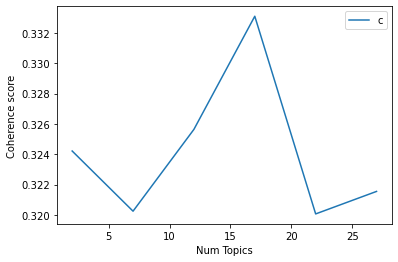

In [71]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score2)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [72]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score2):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics =17

index: 0 | Num Topics = 2  has Coherence Value of 0.3242
index: 1 | Num Topics = 7  has Coherence Value of 0.3202
index: 2 | Num Topics = 12  has Coherence Value of 0.3256
index: 3 | Num Topics = 17  has Coherence Value of 0.3331
index: 4 | Num Topics = 22  has Coherence Value of 0.3201
index: 5 | Num Topics = 27  has Coherence Value of 0.3215


In [177]:
# Select optimal number of topics
optimal_model_us_score2 = model_list_us_score2[3]

In [178]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score2 = pyLDAvis.gensim_models.prepare(optimal_model_us_score2, corpus_us_score2, id2word_us_score2)

In [179]:
print("pyLDAVis for us topics for score=2:")
vis_us_score2

pyLDAVis for us topics for score=2:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
8     -0.124088 -0.093026       1        1  27.516681
7     -0.239071  0.029306       2        1  11.376763
14     0.070950 -0.104007       3        1   9.782028
11     0.047399 -0.036239       4        1   6.104337
3     -0.118520 -0.114002       5        1   5.886529
13     0.001508 -0.073804       6        1   4.879586
0     -0.063864  0.123665       7        1   4.875860
1      0.006951 -0.042958       8        1   4.489109
16    -0.031762  0.054591       9        1   3.949789
12     0.137491 -0.027461      10        1   3.714146
9      0.057461  0.019925      11        1   3.573069
10    -0.008349  0.127077      12        1   3.117110
6      0.052590 -0.060958      13        1   2.788535
15     0.002372  0.103621      14        1   2.420655
2      0.049725  0.017486      15        1   2.303501
5      0.062445  0.016246      16        1   1.713118
4      0.096762  0.060539      17        1   1.509184, topic_info=         Term        Freq       Total Category  logprob  loglift
161   account  374.000000  374.000000  Default  30.0000  30.0000
121    camera  131.000000  131.000000  Default  29.0000  29.0000
20   snapchat  896.000000  896.000000  Default  28.0000  28.0000
21      story  350.000000  350.000000  Default  27.0000  27.0000
421      open  247.000000  247.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
80       much    2.535406   77.730812  Topic17  -5.2111   0.7707
123   contact    2.430069   70.260867  Topic17  -5.2535   0.8293
175      love    2.546508  151.389258  Topic17  -5.2067   0.1085
113     video    2.454281  190.891456  Topic17  -5.2436  -0.1603
23      thing    2.410150  202.245566  Topic17  -5.2618  -0.2362

[1271 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
2221      6  0.563934     abba
90        3  0.375263  ability
90        8  0.125088  ability
90       11  0.125088  ability
90       15  0.375263  ability
...     ...       ...      ...
140      16  0.010863     year
140      17  0.005432     year
1036      2  0.280062   yellow
1036     11  0.560125   yellow
141      12  0.956363     zoom

[3184 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[9, 8, 15, 12, 4, 14, 1, 2, 17, 13, 10, 11, 7, 16, 3, 6, 5])

## LDA Topic Modelling (Rating = 3)

In [76]:
# By-rating Topic Modelling - rating = 3
# Convert to list - move to each section
review_us_score3 = snapchat_ios_us_review_YearMonth_score3.review.values.tolist()
review_words_us_score3 = list(sent_to_words(review_us_score3))
print(review_words_us_score3[:1])

[['so', 've', 'had', 'this', 'app', 'for', 'few', 'years', 'now', 'and', 'have', 'had', 'no', 'major', 'issues', 'just', 'recently', 'whenever', 'go', 'to', 'open', 'the', 'chat', 'with', 'my', 'super', 'bff', 'it', 'takes', 'forever', 'to', 'load', 'see', 'the', 'message', 'save', 'the', 'message', 'and', 'respond', 'back', 'the', 'message', 'send', 'won', 'pop', 'up', 'and', 'have', 'to', 'swipe', 'out', 'of', 'the', 'chat', 'when', 'go', 'to', 'click', 'back', 'into', 'the', 'chat', 'snapchat', 'freezes', 'and', 'have', 'to', 'close', 'the', 'app', 'completely', 'and', 'wait', 'couple', 'minutes', 'have', 'to', 'do', 'this', 'every', 'time', 'want', 'to', 'send', 'regular', 'message', 'don', 'really', 'know', 'what', 'else', 'to', 'do', 've', 'pretty', 'much', 'tried', 'everything', 'maybe', 'it', 'just', 'my', 'phone', 'don', 'know']]


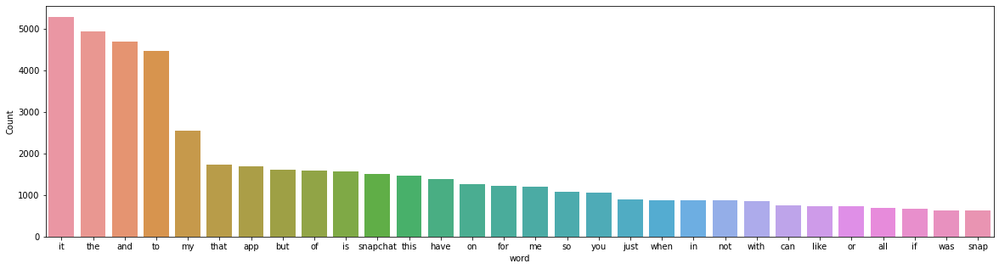

In [77]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score3))

In [78]:
# Clean text
review_us_ready_score3 = process_words(review_words_us_score3)  # processed Text Data! - move to each section


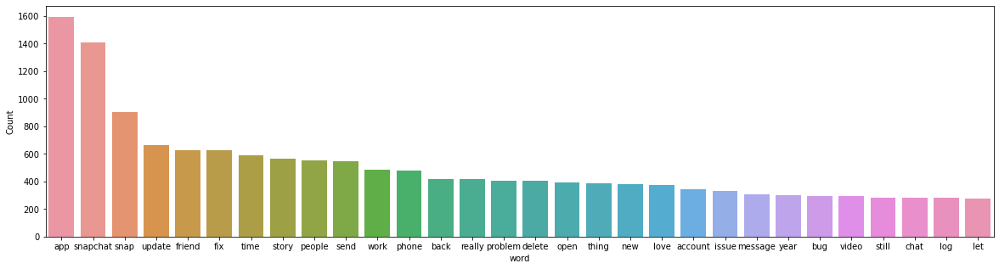

In [79]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score3))


In [80]:
# Create Dictionary
id2word_us_score3 = corpora.Dictionary(review_us_ready_score3)

2021-10-16 22:20:27,841 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 22:20:28,058 [INFO] gensim.corpora.dictionary - built Dictionary(2974 unique tokens: ['app', 'back', 'bff', 'chat', 'click']...) from 1104 documents (total 45904 corpus positions)
2021-10-16 22:20:28,061 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(2974 unique tokens: ['app', 'back', 'bff', 'chat', 'click']...) from 1104 documents (total 45904 corpus positions)", 'datetime': '2021-10-16T22:20:28.060972', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [81]:
# Create Corpus: Term Document Frequency
corpus_us_score3 = [id2word_us_score3.doc2bow(text) for text in review_us_ready_score3]

In [82]:
# Training LDA model
model_list_us_score3, coherence_values_us_score3 = compute_coherence_values(dictionary=id2word_us_score3, corpus=corpus_us_score3, 
                                                              texts=review_us_ready_score3, limit=30, start=2, step=5)


2021-10-16 22:20:28,754 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 22:20:28,756 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 22:20:28,761 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 22:20:28,764 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1104 documents, updating model once every 1000 documents, evaluating perplexity every 1104 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 22:20:28,766 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1104
2021-10-16 22:20:31,890 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:20:31,905 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.022*"app" + 0.022*"snapchat" + 0.020*"snap" + 0.018*"time" + 0.017*"friend" + 0.016*"send" + 0.015*"fix" + 0.012*"problem" + 0.011*"work" +

2021-10-16 22:20:44,113 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1104/1104
2021-10-16 22:20:44,361 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:20:44,363 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.047*"app" + 0.032*"snapchat" + 0.020*"snap" + 0.019*"work" + 0.017*"phone" + 0.016*"time" + 0.016*"friend" + 0.016*"open" + 0.015*"back" + 0.015*"fix"
2021-10-16 22:20:44,365 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.031*"snapchat" + 0.030*"app" + 0.020*"update" + 0.017*"people" + 0.013*"story" + 0.012*"snap" + 0.011*"friend" + 0.010*"way" + 0.010*"new" + 0.010*"thing"
2021-10-16 22:20:44,366 [INFO] gensim.models.ldamodel - topic diff=0.282776, rho=0.404755
2021-10-16 22:20:44,367 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/1104
2021-10-16 22:20:46,488 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22

2021-10-16 22:20:55,630 [INFO] gensim.models.ldamodel - topic diff=0.189606, rho=0.300096
2021-10-16 22:20:55,924 [INFO] gensim.models.ldamodel - -6.015 per-word bound, 64.7 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:20:55,926 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1104/1104
2021-10-16 22:20:56,066 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:20:56,082 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"app" + 0.034*"snapchat" + 0.020*"work" + 0.019*"snap" + 0.017*"phone" + 0.017*"fix" + 0.016*"delete" + 0.016*"friend" + 0.016*"open" + 0.015*"time"
2021-10-16 22:20:56,086 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.029*"snapchat" + 0.026*"app" + 0.018*"update" + 0.017*"people" + 0.015*"story" + 0.012*"snap" + 0.011*"friend" + 0.010*"thing" + 0.010*"new" + 0.010*"way"
2021-10-16 22:20:56,093 [INFO] gensim.models.ldamodel - topic diff=

2021-10-16 22:21:06,549 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"snapchat" + 0.024*"app" + 0.017*"update" + 0.017*"story" + 0.016*"people" + 0.012*"snap" + 0.010*"friend" + 0.010*"thing" + 0.010*"new" + 0.009*"time"
2021-10-16 22:21:06,557 [INFO] gensim.models.ldamodel - topic diff=0.150277, rho=0.249191
2021-10-16 22:21:06,776 [INFO] gensim.models.ldamodel - -6.006 per-word bound, 64.3 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:21:06,778 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1104/1104
2021-10-16 22:21:06,975 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:21:06,981 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.050*"app" + 0.034*"snapchat" + 0.020*"work" + 0.019*"snap" + 0.018*"fix" + 0.017*"phone" + 0.017*"delete" + 0.016*"open" + 0.016*"friend" + 0.015*"time"
2021-10-16 22:21:06,982 [INFO] gensim.models.ldamodel - topic #1 

2021-10-16 22:21:16,992 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"app" + 0.034*"snapchat" + 0.020*"snap" + 0.019*"work" + 0.019*"fix" + 0.017*"phone" + 0.017*"delete" + 0.016*"open" + 0.016*"friend" + 0.016*"send"
2021-10-16 22:21:17,009 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.023*"app" + 0.017*"story" + 0.016*"update" + 0.016*"people" + 0.012*"snap" + 0.010*"thing" + 0.010*"friend" + 0.010*"new" + 0.010*"time"
2021-10-16 22:21:17,039 [INFO] gensim.models.ldamodel - topic diff=0.127884, rho=0.217680
2021-10-16 22:21:17,283 [INFO] gensim.models.ldamodel - -6.000 per-word bound, 64.0 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:21:17,285 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1104/1104
2021-10-16 22:21:17,406 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:21:17,411 [INFO] gensim.models.ldamodel - topic #0 

2021-10-16 22:21:25,795 [INFO] gensim.models.ldamodel - topic diff=0.114664, rho=0.199585
2021-10-16 22:21:25,797 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1104
2021-10-16 22:21:27,378 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:21:27,380 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"app" + 0.035*"snapchat" + 0.020*"snap" + 0.019*"work" + 0.019*"fix" + 0.017*"phone" + 0.017*"delete" + 0.016*"open" + 0.016*"friend" + 0.015*"send"
2021-10-16 22:21:27,381 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.023*"app" + 0.017*"story" + 0.016*"people" + 0.016*"update" + 0.012*"snap" + 0.010*"thing" + 0.010*"friend" + 0.010*"new" + 0.010*"time"
2021-10-16 22:21:27,382 [INFO] gensim.models.ldamodel - topic diff=0.112954, rho=0.195725
2021-10-16 22:21:27,567 [INFO] gensim.models.ldamodel - -5.996 per-word bound, 63.8 perplexity estimate based on a held-out corpus of 104 

2021-10-16 22:21:35,867 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.023*"app" + 0.017*"story" + 0.017*"people" + 0.016*"update" + 0.012*"snap" + 0.011*"friend" + 0.010*"thing" + 0.010*"time" + 0.010*"video"
2021-10-16 22:21:35,868 [INFO] gensim.models.ldamodel - topic diff=0.103335, rho=0.182259
2021-10-16 22:21:35,869 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1000/1104
2021-10-16 22:21:37,541 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:21:37,544 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"app" + 0.035*"snapchat" + 0.020*"snap" + 0.019*"work" + 0.019*"fix" + 0.017*"delete" + 0.017*"phone" + 0.016*"open" + 0.016*"friend" + 0.015*"send"
2021-10-16 22:21:37,547 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.025*"snapchat" + 0.022*"app" + 0.018*"story" + 0.016*"people" + 0.016*"update" + 0.012*"snap" + 0.010*"thing" + 0.010*"friend" + 0.010*"video" + 0.010

2021-10-16 22:21:45,992 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:21:45,994 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"app" + 0.035*"snapchat" + 0.019*"snap" + 0.019*"work" + 0.018*"fix" + 0.017*"delete" + 0.017*"phone" + 0.016*"open" + 0.016*"friend" + 0.015*"update"
2021-10-16 22:21:45,996 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.025*"snapchat" + 0.022*"app" + 0.017*"story" + 0.017*"people" + 0.016*"update" + 0.012*"snap" + 0.011*"friend" + 0.010*"thing" + 0.010*"time" + 0.010*"video"
2021-10-16 22:21:45,997 [INFO] gensim.models.ldamodel - topic diff=0.094969, rho=0.168780
2021-10-16 22:21:45,998 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/1104
2021-10-16 22:21:47,627 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:21:47,629 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"app" + 0.035*"snapcha

2021-10-16 22:21:55,762 [INFO] gensim.models.ldamodel - topic diff=0.088506, rho=0.157909
2021-10-16 22:21:55,991 [INFO] gensim.models.ldamodel - -5.988 per-word bound, 63.5 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:21:55,992 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1104/1104
2021-10-16 22:21:56,145 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:21:56,147 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"app" + 0.036*"snapchat" + 0.019*"snap" + 0.019*"work" + 0.018*"fix" + 0.017*"delete" + 0.016*"phone" + 0.016*"open" + 0.016*"friend" + 0.015*"update"
2021-10-16 22:21:56,149 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.025*"snapchat" + 0.022*"app" + 0.018*"story" + 0.017*"people" + 0.016*"update" + 0.012*"snap" + 0.011*"friend" + 0.010*"thing" + 0.010*"video" + 0.010*"time"
2021-10-16 22:21:56,152 [INFO] gensim.models.ldamodel - topic

2021-10-16 22:22:05,880 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.025*"snapchat" + 0.022*"app" + 0.018*"story" + 0.016*"people" + 0.016*"update" + 0.013*"snap" + 0.011*"friend" + 0.010*"thing" + 0.010*"video" + 0.010*"time"
2021-10-16 22:22:05,881 [INFO] gensim.models.ldamodel - topic diff=0.082859, rho=0.148899
2021-10-16 22:22:06,120 [INFO] gensim.models.ldamodel - -5.985 per-word bound, 63.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:22:06,121 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1104/1104
2021-10-16 22:22:06,282 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:22:06,284 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"app" + 0.036*"snapchat" + 0.019*"snap" + 0.019*"work" + 0.018*"fix" + 0.017*"delete" + 0.016*"phone" + 0.016*"open" + 0.015*"friend" + 0.015*"update"
2021-10-16 22:22:06,285 [INFO] gensim.models.ldamodel - topic

2021-10-16 22:22:15,873 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:22:15,876 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"app" + 0.035*"snapchat" + 0.020*"snap" + 0.019*"work" + 0.018*"fix" + 0.017*"delete" + 0.016*"phone" + 0.016*"open" + 0.015*"friend" + 0.015*"update"
2021-10-16 22:22:15,877 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.025*"snapchat" + 0.022*"app" + 0.018*"story" + 0.016*"people" + 0.016*"update" + 0.013*"snap" + 0.011*"friend" + 0.011*"video" + 0.010*"thing" + 0.010*"time"
2021-10-16 22:22:15,879 [INFO] gensim.models.ldamodel - topic diff=0.078173, rho=0.141275
2021-10-16 22:22:16,120 [INFO] gensim.models.ldamodel - -5.984 per-word bound, 63.3 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:22:16,121 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1104/1104
2021-10-16 22:22:16,275 [INFO] gensim.models.ldamodel - merg

2021-10-16 22:22:29,964 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.043*"app" + 0.029*"send" + 0.025*"video" + 0.018*"delete" + 0.017*"snapchat" + 0.016*"snap" + 0.015*"work" + 0.014*"open" + 0.013*"phone" + 0.013*"message"
2021-10-16 22:22:29,968 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.031*"story" + 0.030*"account" + 0.019*"log" + 0.018*"snapchat" + 0.017*"back" + 0.017*"name" + 0.014*"lock" + 0.014*"view" + 0.013*"sign" + 0.011*"fix"
2021-10-16 22:22:29,972 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"app" + 0.043*"snapchat" + 0.024*"update" + 0.018*"fix" + 0.017*"work" + 0.017*"phone" + 0.016*"snap" + 0.015*"friend" + 0.012*"back" + 0.012*"problem"
2021-10-16 22:22:29,976 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.034*"snapchat" + 0.024*"story" + 0.022*"app" + 0.014*"issue" + 0.013*"people" + 0.012*"ad" + 0.010*"snap" + 0.010*"friend" + 0.009*"much" + 0.009*"account"
2021-10-16 22:22:29,979 [INFO] gensim.models.ldamodel - topic diff=0.599249,

2021-10-16 22:22:36,123 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"snapchat" + 0.027*"app" + 0.023*"time" + 0.022*"send" + 0.022*"snap" + 0.018*"message" + 0.018*"people" + 0.017*"camera" + 0.016*"friend" + 0.013*"open"
2021-10-16 22:22:36,125 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.028*"update" + 0.025*"snap" + 0.025*"snapchat" + 0.024*"app" + 0.021*"time" + 0.019*"people" + 0.014*"back" + 0.013*"change" + 0.012*"thing" + 0.012*"bitmoji"
2021-10-16 22:22:36,125 [INFO] gensim.models.ldamodel - topic diff=0.316801, rho=0.442634
2021-10-16 22:22:36,127 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1104
2021-10-16 22:22:38,119 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:22:38,123 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.026*"snap" + 0.026*"update" + 0.024*"app" + 0.023*"snapchat" + 0.018*"people" + 0.018*"time" + 0.013*"thing" + 0.012*"look" + 0.012*"really" + 0.

2021-10-16 22:22:43,220 [INFO] gensim.models.ldamodel - -5.928 per-word bound, 60.9 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:22:43,222 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1104/1104
2021-10-16 22:22:43,423 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:22:43,431 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.064*"app" + 0.048*"snapchat" + 0.025*"update" + 0.022*"work" + 0.021*"phone" + 0.020*"fix" + 0.018*"friend" + 0.017*"problem" + 0.017*"delete" + 0.016*"let"
2021-10-16 22:22:43,434 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.041*"lose" + 0.035*"streak" + 0.035*"load" + 0.033*"send" + 0.025*"picture" + 0.024*"day" + 0.024*"let" + 0.020*"password" + 0.016*"birthday" + 0.015*"time"
2021-10-16 22:22:43,437 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.042*"app" + 0.027*"video" + 0.022*"delete" + 0.018*"snap" + 0.017*"snapchat

2021-10-16 22:22:49,992 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"snapchat" + 0.029*"send" + 0.027*"app" + 0.025*"snap" + 0.023*"camera" + 0.023*"message" + 0.020*"time" + 0.017*"people" + 0.016*"friend" + 0.014*"fix"
2021-10-16 22:22:49,993 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.051*"account" + 0.049*"story" + 0.030*"post" + 0.027*"name" + 0.022*"lock" + 0.020*"sign" + 0.019*"back" + 0.017*"view" + 0.017*"change" + 0.013*"next"
2021-10-16 22:22:49,995 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.029*"update" + 0.026*"snap" + 0.024*"snapchat" + 0.022*"app" + 0.018*"people" + 0.017*"time" + 0.014*"thing" + 0.013*"look" + 0.013*"bitmoji" + 0.013*"change"
2021-10-16 22:22:49,996 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.029*"ad" + 0.027*"story" + 0.019*"people" + 0.019*"app" + 0.017*"watch" + 0.016*"snapchat" + 0.012*"friend" + 0.012*"much" + 0.011*"filter" + 0.010*"way"
2021-10-16 22:22:49,997 [INFO] gensim.models.ldamodel - topic diff=0.14075

2021-10-16 22:22:54,728 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.048*"story" + 0.048*"account" + 0.028*"name" + 0.028*"post" + 0.024*"sign" + 0.021*"back" + 0.019*"change" + 0.019*"lock" + 0.015*"view" + 0.013*"way"
2021-10-16 22:22:54,734 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"snapchat" + 0.029*"app" + 0.027*"send" + 0.023*"message" + 0.022*"camera" + 0.022*"snap" + 0.021*"time" + 0.018*"people" + 0.016*"friend" + 0.014*"fix"
2021-10-16 22:22:54,738 [INFO] gensim.models.ldamodel - topic diff=0.125308, rho=0.276247
2021-10-16 22:22:54,740 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1104
2021-10-16 22:22:56,516 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:22:56,520 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.051*"account" + 0.051*"story" + 0.033*"post" + 0.027*"name" + 0.022*"lock" + 0.020*"sign" + 0.019*"back" + 0.017*"view" + 0.017*"change" + 0.013*"next"
2

2021-10-16 22:23:00,754 [INFO] gensim.models.ldamodel - -5.869 per-word bound, 58.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:23:00,755 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1104/1104
2021-10-16 22:23:00,837 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:23:00,868 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.039*"app" + 0.029*"video" + 0.022*"delete" + 0.019*"snap" + 0.016*"friend" + 0.015*"edit" + 0.015*"open" + 0.014*"snapchat" + 0.014*"reinstall" + 0.014*"crash"
2021-10-16 22:23:00,871 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"lose" + 0.033*"streak" + 0.031*"load" + 0.029*"send" + 0.025*"memory" + 0.024*"picture" + 0.024*"let" + 0.022*"day" + 0.020*"password" + 0.017*"time"
2021-10-16 22:23:00,872 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"ad" + 0.026*"story" + 0.021*"people" + 0.020*"app" + 0.018*"watch" +

2021-10-16 22:23:06,891 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.053*"story" + 0.051*"account" + 0.037*"post" + 0.027*"name" + 0.021*"lock" + 0.020*"sign" + 0.019*"back" + 0.017*"view" + 0.017*"change" + 0.013*"next"
2021-10-16 22:23:06,892 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.031*"update" + 0.026*"snap" + 0.025*"snapchat" + 0.020*"app" + 0.018*"people" + 0.017*"time" + 0.016*"bitmoji" + 0.014*"look" + 0.014*"thing" + 0.014*"new"
2021-10-16 22:23:06,893 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.037*"app" + 0.033*"video" + 0.022*"delete" + 0.019*"snap" + 0.015*"save" + 0.015*"friend" + 0.014*"edit" + 0.014*"open" + 0.013*"snapchat" + 0.013*"crash"
2021-10-16 22:23:06,896 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.029*"ad" + 0.028*"story" + 0.020*"people" + 0.019*"app" + 0.017*"watch" + 0.013*"snapchat" + 0.013*"friend" + 0.012*"much" + 0.011*"filter" + 0.010*"way"
2021-10-16 22:23:06,897 [INFO] gensim.models.ldamodel - topic diff=0.095974, rh

2021-10-16 22:23:11,548 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.038*"app" + 0.030*"video" + 0.021*"delete" + 0.019*"snap" + 0.016*"friend" + 0.015*"edit" + 0.014*"open" + 0.014*"crash" + 0.014*"save" + 0.014*"reinstall"
2021-10-16 22:23:11,550 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.045*"lose" + 0.033*"streak" + 0.030*"load" + 0.028*"memory" + 0.028*"send" + 0.024*"let" + 0.023*"picture" + 0.022*"day" + 0.020*"password" + 0.017*"time"
2021-10-16 22:23:11,551 [INFO] gensim.models.ldamodel - topic diff=0.089521, rho=0.217680
2021-10-16 22:23:11,552 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1104
2021-10-16 22:23:13,267 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:23:13,271 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.064*"app" + 0.048*"snapchat" + 0.026*"work" + 0.024*"phone" + 0.022*"update" + 0.022*"fix" + 0.019*"friend" + 0.019*"delete" + 0.018*"problem" + 0.016

2021-10-16 22:23:17,668 [INFO] gensim.models.ldamodel - -5.853 per-word bound, 57.8 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:23:17,670 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1104/1104
2021-10-16 22:23:17,814 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:23:17,827 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"lose" + 0.033*"streak" + 0.030*"load" + 0.029*"memory" + 0.027*"send" + 0.024*"let" + 0.023*"picture" + 0.022*"day" + 0.020*"password" + 0.018*"time"
2021-10-16 22:23:17,831 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.066*"app" + 0.049*"snapchat" + 0.026*"work" + 0.023*"phone" + 0.023*"update" + 0.021*"fix" + 0.019*"delete" + 0.018*"friend" + 0.018*"problem" + 0.017*"back"
2021-10-16 22:23:17,836 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"ad" + 0.026*"story" + 0.021*"people" + 0.020*"app" + 0.018*"watch" + 0

2021-10-16 22:23:23,864 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"snapchat" + 0.029*"app" + 0.027*"send" + 0.025*"camera" + 0.024*"message" + 0.023*"snap" + 0.021*"time" + 0.017*"people" + 0.017*"friend" + 0.015*"fix"
2021-10-16 22:23:23,867 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.064*"app" + 0.048*"snapchat" + 0.026*"work" + 0.024*"phone" + 0.022*"update" + 0.022*"fix" + 0.019*"friend" + 0.019*"delete" + 0.018*"problem" + 0.016*"back"
2021-10-16 22:23:23,869 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.054*"story" + 0.051*"account" + 0.039*"post" + 0.027*"name" + 0.021*"lock" + 0.020*"sign" + 0.019*"back" + 0.018*"view" + 0.017*"change" + 0.013*"next"
2021-10-16 22:23:23,871 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"lose" + 0.036*"streak" + 0.031*"load" + 0.030*"memory" + 0.028*"send" + 0.023*"let" + 0.023*"picture" + 0.021*"day" + 0.020*"password" + 0.017*"time"
2021-10-16 22:23:23,873 [INFO] gensim.models.ldamodel - topic diff=0.07634

2021-10-16 22:23:28,397 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.066*"app" + 0.049*"snapchat" + 0.027*"work" + 0.023*"phone" + 0.023*"update" + 0.021*"fix" + 0.019*"delete" + 0.019*"friend" + 0.018*"problem" + 0.017*"back"
2021-10-16 22:23:28,399 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"lose" + 0.033*"streak" + 0.030*"memory" + 0.030*"load" + 0.027*"send" + 0.024*"let" + 0.023*"picture" + 0.021*"day" + 0.020*"password" + 0.018*"time"
2021-10-16 22:23:28,402 [INFO] gensim.models.ldamodel - topic diff=0.073547, rho=0.185363
2021-10-16 22:23:28,405 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1104
2021-10-16 22:23:30,164 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:23:30,169 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"snapchat" + 0.029*"app" + 0.026*"send" + 0.025*"camera" + 0.024*"message" + 0.023*"snap" + 0.021*"time" + 0.017*"people" + 0.017*"friend" + 0.0

2021-10-16 22:23:34,592 [INFO] gensim.models.ldamodel - -5.842 per-word bound, 57.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:23:34,593 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1104/1104
2021-10-16 22:23:34,768 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:23:34,773 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"snapchat" + 0.030*"app" + 0.024*"camera" + 0.024*"send" + 0.023*"message" + 0.021*"time" + 0.021*"snap" + 0.017*"people" + 0.017*"friend" + 0.015*"fix"
2021-10-16 22:23:34,774 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"lose" + 0.032*"streak" + 0.030*"memory" + 0.030*"load" + 0.026*"send" + 0.024*"let" + 0.023*"picture" + 0.021*"day" + 0.020*"password" + 0.019*"snap"
2021-10-16 22:23:34,775 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.033*"update" + 0.027*"snapchat" + 0.025*"snap" + 0.021*"bitmoji" + 0.020*"ap

2021-10-16 22:23:40,552 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.032*"update" + 0.027*"snapchat" + 0.025*"snap" + 0.020*"app" + 0.018*"people" + 0.017*"bitmoji" + 0.017*"time" + 0.015*"look" + 0.014*"thing" + 0.014*"new"
2021-10-16 22:23:40,553 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.055*"story" + 0.052*"account" + 0.040*"post" + 0.027*"name" + 0.021*"lock" + 0.019*"sign" + 0.019*"back" + 0.017*"view" + 0.017*"change" + 0.013*"next"
2021-10-16 22:23:40,555 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.030*"ad" + 0.028*"story" + 0.020*"people" + 0.019*"app" + 0.018*"watch" + 0.014*"friend" + 0.012*"much" + 0.012*"snapchat" + 0.011*"filter" + 0.010*"way"
2021-10-16 22:23:40,556 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.044*"lose" + 0.035*"streak" + 0.031*"memory" + 0.030*"load" + 0.027*"send" + 0.023*"let" + 0.023*"picture" + 0.021*"day" + 0.020*"snap" + 0.020*"password"
2021-10-16 22:23:40,557 [INFO] gensim.models.ldamodel - topic diff=0.065870, rh

2021-10-16 22:23:44,920 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"lose" + 0.032*"streak" + 0.030*"memory" + 0.029*"load" + 0.026*"send" + 0.024*"let" + 0.023*"picture" + 0.021*"day" + 0.021*"snap" + 0.020*"password"
2021-10-16 22:23:44,922 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.053*"story" + 0.050*"account" + 0.036*"post" + 0.027*"name" + 0.022*"sign" + 0.020*"back" + 0.020*"lock" + 0.019*"change" + 0.016*"view" + 0.013*"way"
2021-10-16 22:23:44,923 [INFO] gensim.models.ldamodel - topic diff=0.063693, rho=0.164168
2021-10-16 22:23:44,924 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1104
2021-10-16 22:23:46,750 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:23:46,754 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.030*"ad" + 0.028*"story" + 0.020*"people" + 0.019*"app" + 0.018*"watch" + 0.014*"friend" + 0.012*"much" + 0.012*"snapchat" + 0.011*"filter" + 0.010*"way"
2

2021-10-16 22:23:51,159 [INFO] gensim.models.ldamodel - -5.837 per-word bound, 57.2 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:23:51,160 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1104/1104
2021-10-16 22:23:51,280 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:23:51,284 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.034*"app" + 0.032*"video" + 0.020*"snap" + 0.020*"delete" + 0.016*"edit" + 0.015*"save" + 0.014*"crash" + 0.014*"friend" + 0.014*"open" + 0.012*"reinstall"
2021-10-16 22:23:51,286 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"ad" + 0.027*"story" + 0.021*"people" + 0.020*"app" + 0.018*"watch" + 0.014*"friend" + 0.013*"much" + 0.011*"snapchat" + 0.010*"way" + 0.010*"filter"
2021-10-16 22:23:51,288 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"lose" + 0.032*"streak" + 0.030*"memory" + 0.029*"load" + 0.026*"send" + 0

2021-10-16 22:23:57,378 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.055*"story" + 0.052*"account" + 0.040*"post" + 0.027*"name" + 0.021*"lock" + 0.019*"sign" + 0.019*"back" + 0.018*"change" + 0.017*"view" + 0.013*"next"
2021-10-16 22:23:57,379 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.065*"app" + 0.049*"snapchat" + 0.027*"work" + 0.024*"phone" + 0.022*"update" + 0.021*"fix" + 0.019*"friend" + 0.019*"delete" + 0.018*"problem" + 0.017*"back"
2021-10-16 22:23:57,381 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.030*"ad" + 0.028*"story" + 0.020*"people" + 0.019*"app" + 0.018*"watch" + 0.014*"friend" + 0.012*"much" + 0.011*"snapchat" + 0.011*"filter" + 0.010*"way"
2021-10-16 22:23:57,382 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.032*"update" + 0.027*"snapchat" + 0.025*"snap" + 0.020*"app" + 0.018*"people" + 0.017*"bitmoji" + 0.017*"time" + 0.015*"look" + 0.014*"thing" + 0.014*"new"
2021-10-16 22:23:57,384 [INFO] gensim.models.ldamodel - topic diff=0.058398,

2021-10-16 22:24:01,921 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.033*"update" + 0.028*"snapchat" + 0.025*"snap" + 0.020*"bitmoji" + 0.020*"app" + 0.019*"people" + 0.018*"time" + 0.015*"look" + 0.014*"back" + 0.014*"thing"
2021-10-16 22:24:01,923 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"lose" + 0.032*"streak" + 0.030*"memory" + 0.029*"load" + 0.026*"send" + 0.024*"let" + 0.023*"snap" + 0.022*"picture" + 0.021*"day" + 0.020*"password"
2021-10-16 22:24:01,924 [INFO] gensim.models.ldamodel - topic diff=0.056588, rho=0.148899
2021-10-16 22:24:01,926 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1104
2021-10-16 22:24:03,434 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:24:03,438 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"lose" + 0.034*"streak" + 0.031*"memory" + 0.030*"load" + 0.026*"send" + 0.023*"let" + 0.023*"snap" + 0.022*"picture" + 0.021*"day" + 0.020*"pass

2021-10-16 22:24:07,532 [INFO] gensim.models.ldamodel - -5.834 per-word bound, 57.0 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:24:07,533 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1104/1104
2021-10-16 22:24:07,677 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:24:07,683 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.043*"lose" + 0.032*"streak" + 0.030*"memory" + 0.029*"load" + 0.026*"send" + 0.024*"let" + 0.023*"snap" + 0.022*"picture" + 0.021*"day" + 0.020*"password"
2021-10-16 22:24:07,685 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.066*"app" + 0.049*"snapchat" + 0.027*"work" + 0.024*"phone" + 0.022*"update" + 0.021*"fix" + 0.019*"friend" + 0.019*"delete" + 0.018*"problem" + 0.017*"back"
2021-10-16 22:24:07,688 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"snapchat" + 0.030*"app" + 0.025*"camera" + 0.023*"message" + 0.023*"se

2021-10-16 22:24:13,170 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.066*"app" + 0.049*"snapchat" + 0.027*"work" + 0.024*"phone" + 0.022*"update" + 0.021*"fix" + 0.020*"friend" + 0.019*"delete" + 0.019*"problem" + 0.017*"back"
2021-10-16 22:24:13,174 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.032*"update" + 0.027*"snapchat" + 0.025*"snap" + 0.020*"app" + 0.019*"people" + 0.017*"bitmoji" + 0.017*"time" + 0.015*"look" + 0.014*"thing" + 0.014*"new"
2021-10-16 22:24:13,178 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.034*"video" + 0.032*"app" + 0.020*"snap" + 0.019*"delete" + 0.016*"save" + 0.016*"edit" + 0.014*"crash" + 0.013*"open" + 0.013*"friend" + 0.012*"send"
2021-10-16 22:24:13,183 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"snapchat" + 0.029*"app" + 0.026*"camera" + 0.024*"send" + 0.023*"message" + 0.022*"snap" + 0.020*"time" + 0.017*"friend" + 0.016*"people" + 0.015*"fix"
2021-10-16 22:24:13,187 [INFO] gensim.models.ldamodel - topic diff=0.05297

2021-10-16 22:24:25,605 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.052*"app" + 0.045*"snapchat" + 0.034*"update" + 0.023*"fix" + 0.014*"friend" + 0.014*"phone" + 0.012*"love" + 0.011*"work" + 0.010*"bug" + 0.010*"snap"
2021-10-16 22:24:25,627 [INFO] gensim.models.ldamodel - topic diff=0.637273, rho=0.567596
2021-10-16 22:24:25,866 [INFO] gensim.models.ldamodel - -6.670 per-word bound, 101.8 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:24:25,868 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1104/1104
2021-10-16 22:24:26,139 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:24:26,145 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.054*"sign" + 0.047*"back" + 0.037*"name" + 0.035*"change" + 0.027*"account" + 0.026*"email" + 0.019*"snapchat" + 0.017*"number" + 0.014*"boring" + 0.014*"nd"
2021-10-16 22:24:26,147 [INFO] gensim.models.ldamodel - topic #5

2021-10-16 22:24:31,432 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1104
2021-10-16 22:24:33,461 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:24:33,485 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.030*"snapchat" + 0.019*"user" + 0.010*"party" + 0.009*"promote" + 0.009*"tik" + 0.009*"quiz" + 0.009*"tok" + 0.009*"annoying" + 0.008*"lock" + 0.008*"report"
2021-10-16 22:24:33,502 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.096*"send" + 0.090*"load" + 0.044*"streak" + 0.034*"tap" + 0.032*"picture" + 0.024*"chat" + 0.020*"day" + 0.018*"forever" + 0.016*"let" + 0.014*"fix"
2021-10-16 22:24:33,504 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.053*"app" + 0.049*"snapchat" + 0.048*"update" + 0.028*"fix" + 0.015*"bug" + 0.015*"friend" + 0.015*"bitmoji" + 0.014*"phone" + 0.012*"love" + 0.011*"day"
2021-10-16 22:24:33,505 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.035*"message" 

2021-10-16 22:24:38,653 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.106*"story" + 0.059*"ad" + 0.046*"watch" + 0.024*"view" + 0.019*"people" + 0.018*"second" + 0.015*"discover" + 0.014*"show" + 0.014*"post" + 0.013*"way"
2021-10-16 22:24:38,654 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.097*"app" + 0.039*"snapchat" + 0.027*"open" + 0.026*"time" + 0.025*"crash" + 0.023*"work" + 0.022*"reinstall" + 0.017*"delete" + 0.017*"update" + 0.016*"phone"
2021-10-16 22:24:38,656 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.035*"message" + 0.031*"update" + 0.029*"app" + 0.027*"people" + 0.026*"snapchat" + 0.023*"send" + 0.019*"time" + 0.017*"new" + 0.015*"bug" + 0.015*"fix"
2021-10-16 22:24:38,657 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.097*"send" + 0.081*"load" + 0.040*"streak" + 0.036*"tap" + 0.033*"picture" + 0.024*"day" + 0.022*"chat" + 0.022*"forever" + 0.019*"show" + 0.018*"let"
2021-10-16 22:24:38,658 [INFO] gensim.models.ldamodel - topic diff=0.171415, 

2021-10-16 22:24:44,902 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.036*"snapchat" + 0.036*"snap" + 0.028*"people" + 0.020*"app" + 0.016*"new" + 0.016*"thing" + 0.015*"send" + 0.015*"really" + 0.014*"time" + 0.014*"friend"
2021-10-16 22:24:44,903 [INFO] gensim.models.ldamodel - topic diff=0.122477, rho=0.300096
2021-10-16 22:24:45,118 [INFO] gensim.models.ldamodel - -5.889 per-word bound, 59.3 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:24:45,120 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1104/1104
2021-10-16 22:24:45,258 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:24:45,263 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.036*"message" + 0.032*"update" + 0.029*"app" + 0.028*"people" + 0.026*"snapchat" + 0.022*"send" + 0.020*"time" + 0.018*"new" + 0.015*"bug" + 0.014*"able"
2021-10-16 22:24:45,265 [INFO] gensim.models.ldamodel - topic #0 (

2021-10-16 22:24:51,369 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:24:51,376 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.032*"user" + 0.021*"snapchat" + 0.018*"party" + 0.016*"hurt" + 0.012*"tik" + 0.011*"promote" + 0.010*"report" + 0.010*"quiz" + 0.010*"tok" + 0.009*"wish"
2021-10-16 22:24:51,378 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.041*"camera" + 0.035*"filter" + 0.026*"app" + 0.024*"photo" + 0.024*"iphone" + 0.023*"issue" + 0.021*"quality" + 0.020*"thing" + 0.019*"phone" + 0.016*"snapchat"
2021-10-16 22:24:51,380 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.027*"snap" + 0.023*"app" + 0.019*"time" + 0.019*"issue" + 0.016*"dark" + 0.016*"mode" + 0.015*"look" + 0.015*"back" + 0.012*"snapchat" + 0.011*"option"
2021-10-16 22:24:51,383 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.057*"app" + 0.055*"update" + 0.051*"snapchat" + 0.029*"fix" + 0.018*"bitmoji" + 0.016*"bug" + 0.015*"frie

2021-10-16 22:24:56,048 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.034*"camera" + 0.030*"filter" + 0.027*"app" + 0.022*"issue" + 0.021*"thing" + 0.020*"iphone" + 0.020*"photo" + 0.019*"phone" + 0.018*"quality" + 0.018*"friend"
2021-10-16 22:24:56,051 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.037*"user" + 0.020*"party" + 0.018*"snapchat" + 0.018*"hurt" + 0.014*"promote" + 0.012*"certainly" + 0.012*"accessible" + 0.012*"grandma" + 0.010*"tik" + 0.009*"report"
2021-10-16 22:24:56,053 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.056*"name" + 0.049*"sign" + 0.047*"change" + 0.041*"back" + 0.037*"account" + 0.032*"email" + 0.029*"number" + 0.019*"phone" + 0.019*"absolutely" + 0.019*"snapchat"
2021-10-16 22:24:56,054 [INFO] gensim.models.ldamodel - topic diff=0.087848, rho=0.249191
2021-10-16 22:24:56,056 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1104
2021-10-16 22:24:57,920 [INFO] gensim.models.ldamodel - merging changes from 1000 document

2021-10-16 22:25:02,396 [INFO] gensim.models.ldamodel - topic diff=0.079292, rho=0.228790
2021-10-16 22:25:02,582 [INFO] gensim.models.ldamodel - -5.860 per-word bound, 58.1 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:25:02,584 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1104/1104
2021-10-16 22:25:02,773 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:25:02,778 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.108*"send" + 0.082*"load" + 0.041*"streak" + 0.034*"tap" + 0.033*"picture" + 0.027*"day" + 0.026*"issue" + 0.025*"show" + 0.022*"forever" + 0.022*"chat"
2021-10-16 22:25:02,779 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.050*"app" + 0.043*"snapchat" + 0.029*"account" + 0.029*"work" + 0.027*"delete" + 0.024*"log" + 0.023*"phone" + 0.022*"let" + 0.021*"download" + 0.020*"friend"
2021-10-16 22:25:02,780 [INFO] gensim.models.ldamodel - topic 

2021-10-16 22:25:08,703 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.036*"snapchat" + 0.036*"snap" + 0.029*"people" + 0.018*"app" + 0.016*"thing" + 0.015*"new" + 0.015*"send" + 0.015*"really" + 0.015*"time" + 0.014*"friend"
2021-10-16 22:25:08,708 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.036*"user" + 0.019*"snapchat" + 0.018*"party" + 0.016*"hurt" + 0.012*"tik" + 0.011*"promote" + 0.011*"report" + 0.010*"quiz" + 0.010*"tok" + 0.009*"wish"
2021-10-16 22:25:08,712 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.129*"story" + 0.057*"ad" + 0.047*"watch" + 0.027*"view" + 0.020*"post" + 0.019*"people" + 0.017*"second" + 0.016*"page" + 0.016*"discover" + 0.014*"show"
2021-10-16 22:25:08,717 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.058*"app" + 0.057*"update" + 0.051*"snapchat" + 0.028*"fix" + 0.018*"bitmoji" + 0.016*"bug" + 0.015*"friend" + 0.015*"let" + 0.014*"phone" + 0.012*"day"
2021-10-16 22:25:08,720 [INFO] gensim.models.ldamodel - topic diff=0.071711, rh

2021-10-16 22:25:13,287 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.100*"app" + 0.039*"snapchat" + 0.031*"open" + 0.028*"crash" + 0.024*"time" + 0.023*"work" + 0.021*"reinstall" + 0.018*"delete" + 0.018*"fix" + 0.017*"update"
2021-10-16 22:25:13,290 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.030*"snap" + 0.024*"app" + 0.021*"issue" + 0.020*"time" + 0.017*"back" + 0.015*"mode" + 0.015*"dark" + 0.015*"look" + 0.012*"reason" + 0.012*"snapchat"
2021-10-16 22:25:13,291 [INFO] gensim.models.ldamodel - topic diff=0.067017, rho=0.203683
2021-10-16 22:25:13,293 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1104
2021-10-16 22:25:14,983 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:25:15,006 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.036*"user" + 0.018*"party" + 0.017*"snapchat" + 0.016*"hurt" + 0.012*"tik" + 0.012*"promote" + 0.011*"report" + 0.010*"quiz" + 0.010*"tok" + 0.009*"wi

2021-10-16 22:25:19,578 [INFO] gensim.models.ldamodel - -5.849 per-word bound, 57.6 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:25:19,580 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1104/1104
2021-10-16 22:25:19,717 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:25:19,726 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.049*"app" + 0.043*"snapchat" + 0.030*"account" + 0.029*"work" + 0.027*"delete" + 0.025*"log" + 0.023*"phone" + 0.022*"let" + 0.020*"download" + 0.020*"friend"
2021-10-16 22:25:19,728 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.100*"app" + 0.039*"snapchat" + 0.031*"open" + 0.028*"crash" + 0.024*"time" + 0.023*"work" + 0.021*"reinstall" + 0.018*"delete" + 0.018*"fix" + 0.017*"phone"
2021-10-16 22:25:19,731 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"name" + 0.048*"sign" + 0.045*"change" + 0.041*"back" + 0.039*"acco

2021-10-16 22:25:25,694 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.034*"message" + 0.031*"update" + 0.029*"app" + 0.028*"snapchat" + 0.028*"people" + 0.020*"send" + 0.020*"time" + 0.017*"bug" + 0.017*"new" + 0.015*"able"
2021-10-16 22:25:25,699 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.048*"app" + 0.043*"snapchat" + 0.031*"account" + 0.029*"work" + 0.027*"delete" + 0.026*"log" + 0.023*"phone" + 0.021*"let" + 0.020*"friend" + 0.019*"back"
2021-10-16 22:25:25,702 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.070*"video" + 0.037*"save" + 0.026*"snap" + 0.025*"edit" + 0.021*"memory" + 0.017*"long" + 0.017*"send" + 0.017*"thing" + 0.014*"issue" + 0.014*"delete"
2021-10-16 22:25:25,706 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.036*"snapchat" + 0.036*"snap" + 0.029*"people" + 0.017*"app" + 0.016*"thing" + 0.015*"new" + 0.015*"really" + 0.015*"send" + 0.015*"time" + 0.014*"friend"
2021-10-16 22:25:25,707 [INFO] gensim.models.ldamodel - topic diff=0.059112, rh

2021-10-16 22:25:30,307 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.128*"story" + 0.061*"ad" + 0.048*"watch" + 0.027*"view" + 0.019*"post" + 0.019*"people" + 0.017*"second" + 0.016*"discover" + 0.014*"page" + 0.014*"way"
2021-10-16 22:25:30,311 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"name" + 0.047*"sign" + 0.045*"change" + 0.041*"number" + 0.040*"account" + 0.040*"back" + 0.032*"email" + 0.021*"absolutely" + 0.019*"phone" + 0.018*"snapchat"
2021-10-16 22:25:30,313 [INFO] gensim.models.ldamodel - topic diff=0.056326, rho=0.176490
2021-10-16 22:25:30,315 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1104
2021-10-16 22:25:32,147 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:25:32,152 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.115*"send" + 0.085*"load" + 0.043*"streak" + 0.034*"tap" + 0.032*"picture" + 0.027*"message" + 0.027*"day" + 0.026*"issue" + 0.025*"show" + 0.

2021-10-16 22:25:36,365 [INFO] gensim.models.ldamodel - -5.844 per-word bound, 57.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:25:36,366 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1104/1104
2021-10-16 22:25:36,529 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:25:36,534 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.101*"app" + 0.039*"snapchat" + 0.032*"open" + 0.028*"crash" + 0.024*"time" + 0.023*"work" + 0.021*"reinstall" + 0.018*"delete" + 0.017*"fix" + 0.017*"phone"
2021-10-16 22:25:36,536 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.049*"app" + 0.043*"snapchat" + 0.030*"account" + 0.029*"work" + 0.027*"delete" + 0.025*"log" + 0.023*"phone" + 0.021*"let" + 0.020*"friend" + 0.020*"download"
2021-10-16 22:25:36,537 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.110*"send" + 0.080*"load" + 0.040*"streak" + 0.033*"tap" + 0.032*"pictu

2021-10-16 22:25:42,613 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.028*"snap" + 0.025*"app" + 0.020*"issue" + 0.019*"time" + 0.018*"mode" + 0.017*"dark" + 0.016*"back" + 0.015*"look" + 0.011*"option" + 0.011*"snapchat"
2021-10-16 22:25:42,615 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.037*"user" + 0.019*"party" + 0.017*"hurt" + 0.013*"snapchat" + 0.012*"promote" + 0.012*"tik" + 0.012*"report" + 0.010*"quiz" + 0.010*"tok" + 0.009*"family"
2021-10-16 22:25:42,617 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.115*"send" + 0.084*"load" + 0.042*"streak" + 0.033*"tap" + 0.032*"picture" + 0.028*"message" + 0.027*"day" + 0.026*"issue" + 0.025*"show" + 0.020*"chat"
2021-10-16 22:25:42,619 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.044*"camera" + 0.036*"filter" + 0.028*"iphone" + 0.026*"app" + 0.024*"photo" + 0.022*"picture" + 0.022*"issue" + 0.020*"quality" + 0.019*"thing" + 0.018*"phone"
2021-10-16 22:25:42,621 [INFO] gensim.models.ldamodel - topic diff=0.05143

2021-10-16 22:25:47,185 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.030*"snap" + 0.025*"app" + 0.021*"issue" + 0.020*"time" + 0.018*"back" + 0.016*"mode" + 0.016*"dark" + 0.014*"look" + 0.012*"reason" + 0.011*"snapchat"
2021-10-16 22:25:47,187 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.101*"app" + 0.039*"snapchat" + 0.033*"open" + 0.028*"crash" + 0.024*"time" + 0.023*"work" + 0.021*"reinstall" + 0.018*"delete" + 0.017*"fix" + 0.017*"phone"
2021-10-16 22:25:47,189 [INFO] gensim.models.ldamodel - topic diff=0.049538, rho=0.157909
2021-10-16 22:25:47,192 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1104
2021-10-16 22:25:48,954 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:25:49,011 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"name" + 0.049*"number" + 0.047*"change" + 0.044*"sign" + 0.043*"account" + 0.037*"back" + 0.035*"email" + 0.021*"absolutely" + 0.020*"lock" + 0.01

2021-10-16 22:25:53,384 [INFO] gensim.models.ldamodel - -5.840 per-word bound, 57.3 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:25:53,385 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1104/1104
2021-10-16 22:25:53,463 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:25:53,469 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.130*"story" + 0.061*"ad" + 0.048*"watch" + 0.028*"view" + 0.019*"post" + 0.019*"people" + 0.017*"second" + 0.016*"discover" + 0.014*"page" + 0.013*"way"
2021-10-16 22:25:53,472 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.061*"app" + 0.059*"update" + 0.051*"snapchat" + 0.027*"fix" + 0.021*"bitmoji" + 0.018*"let" + 0.017*"friend" + 0.015*"bug" + 0.014*"phone" + 0.014*"change"
2021-10-16 22:25:53,474 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.039*"camera" + 0.033*"filter" + 0.026*"app" + 0.025*"iphone" + 0.022*"photo" +

2021-10-16 22:25:59,302 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.068*"video" + 0.037*"save" + 0.026*"snap" + 0.025*"edit" + 0.021*"memory" + 0.017*"thing" + 0.017*"long" + 0.017*"send" + 0.014*"issue" + 0.014*"delete"
2021-10-16 22:25:59,303 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.054*"name" + 0.051*"number" + 0.049*"change" + 0.044*"account" + 0.043*"sign" + 0.037*"back" + 0.035*"email" + 0.021*"absolutely" + 0.020*"lock" + 0.018*"phone"
2021-10-16 22:25:59,307 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.061*"app" + 0.058*"update" + 0.050*"snapchat" + 0.028*"fix" + 0.019*"bitmoji" + 0.018*"let" + 0.017*"friend" + 0.015*"bug" + 0.014*"phone" + 0.013*"change"
2021-10-16 22:25:59,309 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.033*"message" + 0.031*"update" + 0.030*"app" + 0.029*"snapchat" + 0.028*"people" + 0.020*"send" + 0.020*"time" + 0.019*"bug" + 0.017*"new" + 0.015*"able"
2021-10-16 22:25:59,310 [INFO] gensim.models.ldamodel - topic diff=0.046

2021-10-16 22:26:03,784 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.037*"snapchat" + 0.035*"snap" + 0.030*"people" + 0.017*"app" + 0.016*"thing" + 0.015*"really" + 0.015*"time" + 0.015*"new" + 0.015*"send" + 0.014*"friend"
2021-10-16 22:26:03,786 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.065*"video" + 0.035*"save" + 0.027*"edit" + 0.027*"snap" + 0.020*"memory" + 0.018*"long" + 0.018*"thing" + 0.017*"send" + 0.015*"issue" + 0.015*"delete"
2021-10-16 22:26:03,787 [INFO] gensim.models.ldamodel - topic diff=0.044739, rho=0.144181
2021-10-16 22:26:03,788 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1104
2021-10-16 22:26:05,527 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:26:05,532 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.047*"app" + 0.043*"snapchat" + 0.031*"account" + 0.029*"work" + 0.027*"delete" + 0.027*"log" + 0.023*"phone" + 0.020*"let" + 0.020*"friend" + 0.019*"back

2021-10-16 22:26:10,167 [INFO] gensim.models.ldamodel - -5.836 per-word bound, 57.1 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:26:10,169 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1104/1104
2021-10-16 22:26:10,289 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:26:10,295 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.065*"video" + 0.035*"save" + 0.027*"edit" + 0.027*"snap" + 0.020*"memory" + 0.018*"long" + 0.018*"thing" + 0.017*"send" + 0.015*"issue" + 0.015*"delete"
2021-10-16 22:26:10,297 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.030*"snap" + 0.025*"app" + 0.021*"issue" + 0.020*"time" + 0.018*"back" + 0.016*"mode" + 0.016*"dark" + 0.014*"look" + 0.012*"reason" + 0.011*"snapchat"
2021-10-16 22:26:10,299 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.048*"app" + 0.043*"snapchat" + 0.030*"account" + 0.029*"work" + 0.027*"delete" + 0.

2021-10-16 22:26:23,991 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.045*"app" + 0.040*"snapchat" + 0.038*"camera" + 0.031*"change" + 0.025*"keep" + 0.015*"video" + 0.014*"name" + 0.013*"fix" + 0.013*"start" + 0.012*"setting"
2021-10-16 22:26:23,996 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.096*"ad" + 0.078*"story" + 0.046*"watch" + 0.031*"people" + 0.027*"second" + 0.023*"discover" + 0.015*"view" + 0.013*"away" + 0.013*"sometimes" + 0.013*"time"
2021-10-16 22:26:24,002 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.049*"snapchat" + 0.028*"app" + 0.023*"update" + 0.022*"snap" + 0.021*"friend" + 0.020*"people" + 0.018*"time" + 0.013*"back" + 0.013*"really" + 0.011*"change"
2021-10-16 22:26:24,011 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.040*"video" + 0.039*"app" + 0.031*"send" + 0.020*"people" + 0.019*"message" + 0.016*"problem" + 0.015*"work" + 0.015*"open" + 0.014*"delete" + 0.012*"snap"
2021-10-16 22:26:24,025 [INFO] gensim.models.ldamodel - topic 

2021-10-16 22:26:30,978 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.106*"name" + 0.040*"account" + 0.031*"lock" + 0.025*"notice" + 0.022*"fast" + 0.021*"boring" + 0.021*"way" + 0.020*"change" + 0.018*"obviously" + 0.017*"recently"
2021-10-16 22:26:30,981 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.080*"app" + 0.044*"time" + 0.039*"snapchat" + 0.034*"work" + 0.027*"reinstall" + 0.022*"phone" + 0.021*"open" + 0.018*"button" + 0.018*"story" + 0.018*"delete"
2021-10-16 22:26:30,983 [INFO] gensim.models.ldamodel - topic diff=0.262303, rho=0.404755
2021-10-16 22:26:31,188 [INFO] gensim.models.ldamodel - -6.668 per-word bound, 101.7 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:26:31,189 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1104/1104
2021-10-16 22:26:31,387 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:26:31,393 [INFO] gensim.models.ldamo

2021-10-16 22:26:36,267 [INFO] gensim.models.ldamodel - topic diff=0.154354, rho=0.351277
2021-10-16 22:26:36,268 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/1104
2021-10-16 22:26:38,064 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:26:38,071 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.066*"bitmoji" + 0.060*"update" + 0.033*"swipe" + 0.032*"snap" + 0.026*"snapchat" + 0.023*"app" + 0.023*"time" + 0.023*"change" + 0.016*"back" + 0.015*"show"
2021-10-16 22:26:38,073 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.068*"app" + 0.027*"frequently" + 0.026*"reload" + 0.026*"able" + 0.022*"gon" + 0.019*"download" + 0.019*"bother" + 0.016*"sound" + 0.016*"never" + 0.016*"year"
2021-10-16 22:26:38,074 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.037*"snap" + 0.033*"story" + 0.021*"video" + 0.018*"save" + 0.017*"friend" + 0.015*"feature" + 0.013*"issue" + 0.013*"snapchat" + 0.013*"app" +

2021-10-16 22:26:43,048 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.085*"app" + 0.047*"time" + 0.044*"snapchat" + 0.036*"reinstall" + 0.035*"work" + 0.026*"phone" + 0.024*"open" + 0.022*"delete" + 0.020*"pay" + 0.019*"button"
2021-10-16 22:26:43,050 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.025*"feeling" + 0.024*"deep" + 0.016*"tok" + 0.015*"tik" + 0.010*"report" + 0.008*"paragraph" + 0.007*"put" + 0.006*"mental" + 0.006*"wish" + 0.006*"overall"
2021-10-16 22:26:43,053 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.067*"send" + 0.060*"message" + 0.047*"load" + 0.037*"picture" + 0.034*"chat" + 0.032*"app" + 0.027*"open" + 0.023*"tap" + 0.017*"screen" + 0.016*"let"
2021-10-16 22:26:43,056 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.042*"video" + 0.039*"send" + 0.034*"app" + 0.026*"message" + 0.023*"problem" + 0.023*"open" + 0.021*"people" + 0.018*"snap" + 0.017*"week" + 0.016*"work"
2021-10-16 22:26:43,058 [INFO] gensim.models.ldamodel - topic #2 (0.059): 

2021-10-16 22:26:49,330 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.020*"tok" + 0.019*"tik" + 0.018*"feeling" + 0.016*"deep" + 0.012*"report" + 0.010*"paragraph" + 0.008*"mental" + 0.008*"put" + 0.008*"behavior" + 0.008*"wish"
2021-10-16 22:26:49,332 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.044*"snapchat" + 0.031*"snap" + 0.028*"app" + 0.024*"people" + 0.022*"friend" + 0.021*"update" + 0.014*"time" + 0.014*"really" + 0.013*"change" + 0.012*"back"
2021-10-16 22:26:49,334 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.070*"app" + 0.030*"reload" + 0.028*"able" + 0.027*"frequently" + 0.023*"gon" + 0.021*"bother" + 0.019*"anymore" + 0.018*"year" + 0.018*"never" + 0.018*"medium"
2021-10-16 22:26:49,336 [INFO] gensim.models.ldamodel - topic diff=0.083245, rho=0.266274
2021-10-16 22:26:49,566 [INFO] gensim.models.ldamodel - -6.550 per-word bound, 93.7 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:26:49,567 [INFO] gensim.

2021-10-16 22:26:54,031 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.044*"snapchat" + 0.030*"app" + 0.029*"snap" + 0.023*"people" + 0.022*"update" + 0.022*"friend" + 0.015*"really" + 0.014*"time" + 0.013*"change" + 0.013*"back"
2021-10-16 22:26:54,032 [INFO] gensim.models.ldamodel - topic diff=0.071073, rho=0.249191
2021-10-16 22:26:54,034 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1104
2021-10-16 22:26:55,784 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:26:55,791 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.117*"name" + 0.056*"change" + 0.035*"account" + 0.026*"notice" + 0.026*"first" + 0.022*"fast" + 0.022*"wait" + 0.021*"recently" + 0.020*"boring" + 0.020*"thought"
2021-10-16 22:26:55,794 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.020*"tok" + 0.019*"tik" + 0.019*"feeling" + 0.017*"deep" + 0.012*"report" + 0.010*"paragraph" + 0.008*"mental" + 0.008*"behavior" + 0.008*

2021-10-16 22:27:00,492 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1104/1104
2021-10-16 22:27:00,700 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:27:00,709 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.070*"send" + 0.066*"message" + 0.048*"load" + 0.040*"chat" + 0.036*"picture" + 0.030*"app" + 0.027*"open" + 0.025*"tap" + 0.017*"sometimes" + 0.017*"screen"
2021-10-16 22:27:00,713 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.078*"bitmoji" + 0.071*"update" + 0.039*"swipe" + 0.038*"snap" + 0.035*"time" + 0.029*"snapchat" + 0.023*"change" + 0.022*"back" + 0.021*"app" + 0.017*"new"
2021-10-16 22:27:00,716 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.103*"story" + 0.092*"ad" + 0.055*"watch" + 0.031*"people" + 0.024*"discover" + 0.023*"second" + 0.018*"page" + 0.017*"view" + 0.016*"time" + 0.015*"sometimes"
2021-10-16 22:27:00,720 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.024

2021-10-16 22:27:06,945 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.059*"app" + 0.049*"snapchat" + 0.040*"update" + 0.029*"fix" + 0.021*"phone" + 0.020*"love" + 0.017*"bug" + 0.013*"iphone" + 0.013*"screen" + 0.012*"new"
2021-10-16 22:27:06,947 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.072*"send" + 0.066*"message" + 0.049*"load" + 0.043*"chat" + 0.037*"picture" + 0.029*"app" + 0.028*"open" + 0.025*"tap" + 0.019*"sometimes" + 0.018*"bug"
2021-10-16 22:27:06,949 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.037*"content" + 0.027*"filter" + 0.026*"random" + 0.024*"otherwise" + 0.020*"recommend" + 0.020*"news" + 0.019*"original" + 0.018*"face" + 0.017*"song" + 0.017*"mention"
2021-10-16 22:27:06,952 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.054*"app" + 0.038*"work" + 0.031*"snapchat" + 0.028*"snap" + 0.027*"phone" + 0.027*"log" + 0.025*"back" + 0.023*"delete" + 0.022*"let" + 0.021*"friend"
2021-10-16 22:27:06,954 [INFO] gensim.models.ldamodel - topic diff

2021-10-16 22:27:11,578 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.052*"snapchat" + 0.047*"app" + 0.022*"update" + 0.022*"problem" + 0.021*"fix" + 0.021*"really" + 0.020*"screen" + 0.020*"people" + 0.017*"delete" + 0.016*"love"
2021-10-16 22:27:11,580 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.024*"feeling" + 0.022*"deep" + 0.017*"tok" + 0.017*"tik" + 0.011*"report" + 0.009*"paragraph" + 0.007*"mental" + 0.007*"behavior" + 0.007*"wish" + 0.006*"put"
2021-10-16 22:27:11,582 [INFO] gensim.models.ldamodel - topic diff=0.052384, rho=0.203683
2021-10-16 22:27:11,584 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1104
2021-10-16 22:27:13,291 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:27:13,298 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.046*"send" + 0.044*"video" + 0.032*"app" + 0.028*"message" + 0.023*"open" + 0.022*"snap" + 0.022*"problem" + 0.022*"week" + 0.021*"people" + 

2021-10-16 22:27:17,609 [INFO] gensim.models.ldamodel - topic diff=0.048927, rho=0.192081
2021-10-16 22:27:17,870 [INFO] gensim.models.ldamodel - -6.517 per-word bound, 91.6 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:27:17,872 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1104/1104
2021-10-16 22:27:18,056 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:27:18,063 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.059*"camera" + 0.048*"snapchat" + 0.047*"app" + 0.029*"keep" + 0.024*"mode" + 0.022*"dark" + 0.017*"setting" + 0.017*"well" + 0.016*"change" + 0.016*"year"
2021-10-16 22:27:18,065 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.100*"account" + 0.054*"lock" + 0.036*"issue" + 0.027*"people" + 0.026*"memory" + 0.022*"post" + 0.021*"text" + 0.020*"working" + 0.019*"never" + 0.019*"picture"
2021-10-16 22:27:18,067 [INFO] gensim.models.ldamodel - 

2021-10-16 22:27:23,923 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.020*"tok" + 0.020*"feeling" + 0.019*"tik" + 0.018*"deep" + 0.012*"report" + 0.010*"paragraph" + 0.008*"behavior" + 0.008*"mental" + 0.008*"wish" + 0.007*"put"
2021-10-16 22:27:23,926 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.055*"app" + 0.038*"work" + 0.031*"snapchat" + 0.028*"snap" + 0.027*"phone" + 0.027*"log" + 0.024*"back" + 0.024*"delete" + 0.022*"let" + 0.021*"friend"
2021-10-16 22:27:23,928 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.047*"send" + 0.044*"video" + 0.032*"app" + 0.027*"message" + 0.025*"week" + 0.023*"open" + 0.023*"snap" + 0.022*"problem" + 0.021*"people" + 0.016*"never"
2021-10-16 22:27:23,930 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.249*"streak" + 0.066*"send" + 0.048*"lose" + 0.037*"day" + 0.016*"timer" + 0.015*"proof" + 0.008*"mess" + 0.008*"highly" + 0.007*"away" + 0.005*"nonstop"
2021-10-16 22:27:23,933 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.

2021-10-16 22:27:28,396 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.024*"feeling" + 0.022*"deep" + 0.017*"tok" + 0.017*"tik" + 0.011*"report" + 0.009*"paragraph" + 0.007*"behavior" + 0.007*"mental" + 0.007*"wish" + 0.006*"put"
2021-10-16 22:27:28,397 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.033*"random" + 0.033*"content" + 0.030*"news" + 0.024*"filter" + 0.024*"original" + 0.023*"otherwise" + 0.022*"feel" + 0.019*"recommend" + 0.018*"section" + 0.017*"mention"
2021-10-16 22:27:28,399 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.066*"app" + 0.033*"reload" + 0.031*"able" + 0.030*"frequently" + 0.030*"anymore" + 0.027*"gon" + 0.023*"bother" + 0.021*"never" + 0.021*"medium" + 0.021*"way"
2021-10-16 22:27:28,400 [INFO] gensim.models.ldamodel - topic diff=0.043352, rho=0.176490
2021-10-16 22:27:28,401 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1104
2021-10-16 22:27:30,145 [INFO] gensim.models.ldamodel - merging changes from 1000 documents

2021-10-16 22:27:34,930 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.249*"streak" + 0.066*"send" + 0.050*"lose" + 0.037*"day" + 0.016*"timer" + 0.015*"proof" + 0.009*"mess" + 0.008*"highly" + 0.006*"away" + 0.005*"nonstop"
2021-10-16 22:27:34,933 [INFO] gensim.models.ldamodel - topic diff=0.041185, rho=0.168780
2021-10-16 22:27:35,160 [INFO] gensim.models.ldamodel - -6.510 per-word bound, 91.1 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:27:35,162 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1104/1104
2021-10-16 22:27:35,315 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:27:35,323 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.069*"send" + 0.068*"message" + 0.047*"load" + 0.042*"chat" + 0.035*"picture" + 0.029*"app" + 0.027*"open" + 0.025*"tap" + 0.018*"bug" + 0.018*"sometimes"
2021-10-16 22:27:35,325 [INFO] gensim.models.ldamodel - topic #14 

2021-10-16 22:27:39,662 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1104
2021-10-16 22:27:41,297 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:27:41,304 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.046*"send" + 0.043*"video" + 0.033*"app" + 0.029*"week" + 0.027*"message" + 0.023*"open" + 0.023*"snap" + 0.022*"problem" + 0.021*"people" + 0.016*"never"
2021-10-16 22:27:41,305 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.081*"app" + 0.049*"time" + 0.042*"snapchat" + 0.033*"work" + 0.029*"reinstall" + 0.024*"phone" + 0.023*"open" + 0.022*"click" + 0.022*"load" + 0.020*"delete"
2021-10-16 22:27:41,307 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.032*"snap" + 0.031*"story" + 0.028*"video" + 0.022*"save" + 0.020*"friend" + 0.019*"feature" + 0.017*"memory" + 0.015*"issue" + 0.014*"add" + 0.014*"post"
2021-10-16 22:27:41,309 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.115*

2021-10-16 22:27:45,921 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.070*"send" + 0.068*"message" + 0.047*"load" + 0.043*"chat" + 0.035*"picture" + 0.028*"app" + 0.026*"open" + 0.025*"tap" + 0.018*"bug" + 0.018*"sometimes"
2021-10-16 22:27:45,922 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.024*"feeling" + 0.022*"deep" + 0.018*"tok" + 0.017*"tik" + 0.011*"report" + 0.009*"paragraph" + 0.007*"behavior" + 0.007*"mental" + 0.007*"wish" + 0.006*"overall"
2021-10-16 22:27:45,923 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.060*"app" + 0.051*"snapchat" + 0.041*"update" + 0.028*"fix" + 0.022*"phone" + 0.020*"love" + 0.017*"bug" + 0.014*"screen" + 0.013*"iphone" + 0.012*"password"
2021-10-16 22:27:45,925 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.036*"random" + 0.032*"content" + 0.031*"news" + 0.024*"filter" + 0.024*"original" + 0.023*"feel" + 0.022*"otherwise" + 0.018*"section" + 0.018*"recommend" + 0.017*"mention"
2021-10-16 22:27:45,926 [INFO] gensim.models.ld

2021-10-16 22:27:51,677 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.115*"story" + 0.085*"ad" + 0.055*"watch" + 0.030*"people" + 0.023*"discover" + 0.022*"view" + 0.022*"page" + 0.021*"second" + 0.016*"time" + 0.015*"sometimes"
2021-10-16 22:27:51,679 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.032*"snap" + 0.030*"story" + 0.028*"video" + 0.022*"save" + 0.020*"friend" + 0.019*"feature" + 0.017*"memory" + 0.015*"issue" + 0.014*"add" + 0.014*"thing"
2021-10-16 22:27:51,680 [INFO] gensim.models.ldamodel - topic diff=0.036061, rho=0.152314
2021-10-16 22:27:51,841 [INFO] gensim.models.ldamodel - -6.505 per-word bound, 90.8 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:27:51,843 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1104/1104
2021-10-16 22:27:52,024 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:27:52,030 [INFO] gensim.models.ldamodel - t

2021-10-16 22:27:56,296 [INFO] gensim.models.ldamodel - topic diff=0.034145, rho=0.148899
2021-10-16 22:27:56,298 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1104
2021-10-16 22:27:57,992 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:27:57,999 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.114*"name" + 0.060*"change" + 0.029*"account" + 0.028*"first" + 0.025*"game" + 0.025*"notice" + 0.021*"fast" + 0.021*"recently" + 0.021*"boring" + 0.021*"friend"
2021-10-16 22:27:58,001 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.020*"feeling" + 0.020*"tok" + 0.019*"tik" + 0.018*"deep" + 0.012*"report" + 0.010*"paragraph" + 0.008*"behavior" + 0.008*"mental" + 0.008*"wish" + 0.007*"overall"
2021-10-16 22:27:58,003 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.057*"app" + 0.031*"reload" + 0.029*"anymore" + 0.028*"gon" + 0.028*"able" + 0.027*"frequently" + 0.024*"medium" + 0.023*"bother" + 0.02

2021-10-16 22:28:02,536 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.057*"app" + 0.039*"work" + 0.032*"snapchat" + 0.027*"phone" + 0.027*"snap" + 0.026*"log" + 0.024*"back" + 0.024*"delete" + 0.023*"let" + 0.021*"friend"
2021-10-16 22:28:02,537 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.240*"streak" + 0.106*"lose" + 0.061*"send" + 0.035*"day" + 0.016*"proof" + 0.013*"timer" + 0.007*"mess" + 0.007*"highly" + 0.005*"away" + 0.004*"nonstop"
2021-10-16 22:28:02,538 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.044*"snapchat" + 0.031*"snap" + 0.031*"app" + 0.022*"people" + 0.022*"friend" + 0.021*"update" + 0.015*"really" + 0.014*"time" + 0.013*"back" + 0.013*"change"
2021-10-16 22:28:02,540 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.110*"story" + 0.088*"ad" + 0.055*"watch" + 0.031*"people" + 0.023*"discover" + 0.022*"second" + 0.021*"view" + 0.019*"page" + 0.016*"time" + 0.016*"sometimes"
2021-10-16 22:28:02,541 [INFO] gensim.models.ldamodel - topic #6 (0.05

2021-10-16 22:28:08,315 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.132*"account" + 0.057*"lock" + 0.041*"memory" + 0.029*"issue" + 0.025*"people" + 0.021*"post" + 0.020*"year" + 0.019*"never" + 0.018*"text" + 0.017*"save"
2021-10-16 22:28:08,317 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.052*"snapchat" + 0.047*"app" + 0.022*"really" + 0.022*"update" + 0.021*"fix" + 0.021*"problem" + 0.021*"screen" + 0.019*"people" + 0.017*"love" + 0.016*"delete"
2021-10-16 22:28:08,318 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.056*"app" + 0.031*"reload" + 0.029*"anymore" + 0.028*"able" + 0.028*"gon" + 0.027*"frequently" + 0.024*"medium" + 0.023*"bother" + 0.022*"social" + 0.022*"never"
2021-10-16 22:28:08,320 [INFO] gensim.models.ldamodel - topic diff=0.032065, rho=0.139885
2021-10-16 22:28:08,583 [INFO] gensim.models.ldamodel - -6.501 per-word bound, 90.6 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:28:08,584 [INFO] gensim.m

2021-10-16 22:28:23,061 [INFO] gensim.models.ldamodel - topic diff=0.665423, rho=0.567596
2021-10-16 22:28:23,360 [INFO] gensim.models.ldamodel - -7.269 per-word bound, 154.2 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:28:23,362 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1104/1104
2021-10-16 22:28:23,647 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:28:23,654 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.074*"app" + 0.036*"work" + 0.032*"snapchat" + 0.031*"download" + 0.030*"phone" + 0.028*"let" + 0.027*"back" + 0.025*"delete" + 0.021*"log" + 0.019*"snap"
2021-10-16 22:28:23,656 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.037*"feature" + 0.024*"new" + 0.022*"feel" + 0.022*"way" + 0.021*"music" + 0.021*"memory" + 0.021*"thing" + 0.019*"original" + 0.019*"appreciate" + 0.019*"crop"
2021-10-16 22:28:23,657 [INFO] gensim.models.ldamodel - to

2021-10-16 22:28:30,943 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.069*"feature" + 0.033*"new" + 0.028*"feel" + 0.024*"way" + 0.023*"point" + 0.021*"thing" + 0.021*"appreciate" + 0.019*"memory" + 0.017*"back" + 0.017*"put"
2021-10-16 22:28:30,944 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.089*"memory" + 0.068*"snap" + 0.065*"lose" + 0.057*"password" + 0.037*"save" + 0.034*"time" + 0.032*"log" + 0.028*"happen" + 0.025*"photo" + 0.024*"eye"
2021-10-16 22:28:30,946 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.067*"snapchat" + 0.027*"app" + 0.026*"friend" + 0.026*"update" + 0.023*"people" + 0.020*"snap" + 0.016*"fix" + 0.014*"time" + 0.012*"keep" + 0.011*"new"
2021-10-16 22:28:30,948 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.050*"account" + 0.030*"name" + 0.027*"lock" + 0.024*"change" + 0.019*"friend" + 0.018*"app" + 0.017*"people" + 0.014*"let" + 0.013*"snap" + 0.013*"snapchat"
2021-10-16 22:28:30,949 [INFO] gensim.models.ldamodel - topic diff=0.2862

2021-10-16 22:28:36,066 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.079*"app" + 0.042*"snapchat" + 0.041*"work" + 0.033*"phone" + 0.031*"let" + 0.031*"download" + 0.030*"back" + 0.029*"delete" + 0.025*"log" + 0.020*"fix"
2021-10-16 22:28:36,072 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.074*"update" + 0.062*"bitmoji" + 0.049*"snapchat" + 0.032*"app" + 0.027*"change" + 0.025*"new" + 0.024*"snap" + 0.022*"people" + 0.021*"really" + 0.018*"swipe"
2021-10-16 22:28:36,073 [INFO] gensim.models.ldamodel - topic diff=0.158683, rho=0.351277
2021-10-16 22:28:36,076 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/1104
2021-10-16 22:28:37,849 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:28:37,866 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.035*"app" + 0.034*"photo" + 0.031*"phone" + 0.027*"email" + 0.026*"thing" + 0.026*"issue" + 0.023*"add" + 0.023*"way" + 0.020*"filter" + 0.019*"frien

2021-10-16 22:28:42,409 [INFO] gensim.models.ldamodel - topic diff=0.108925, rho=0.300096
2021-10-16 22:28:42,593 [INFO] gensim.models.ldamodel - -6.726 per-word bound, 105.9 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:28:42,595 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1104/1104
2021-10-16 22:28:42,776 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:28:42,783 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.075*"update" + 0.061*"bitmoji" + 0.050*"snapchat" + 0.032*"app" + 0.028*"change" + 0.026*"new" + 0.026*"snap" + 0.024*"people" + 0.021*"really" + 0.018*"swipe"
2021-10-16 22:28:42,784 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.071*"snapchat" + 0.033*"app" + 0.032*"update" + 0.028*"friend" + 0.027*"people" + 0.018*"snap" + 0.018*"fix" + 0.013*"keep" + 0.013*"time" + 0.012*"bad"
2021-10-16 22:28:42,786 [INFO] gensim.models.ldamodel - topi

2021-10-16 22:28:49,032 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.053*"rid" + 0.035*"space" + 0.033*"thought" + 0.031*"ever" + 0.028*"inappropriate" + 0.027*"least" + 0.025*"lag" + 0.025*"delay" + 0.023*"wait" + 0.020*"majority"
2021-10-16 22:28:49,034 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.037*"time" + 0.036*"app" + 0.032*"snapchat" + 0.032*"camera" + 0.027*"message" + 0.021*"back" + 0.019*"delete" + 0.014*"swipe" + 0.014*"long" + 0.014*"setting"
2021-10-16 22:28:49,037 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.064*"account" + 0.034*"name" + 0.033*"lock" + 0.028*"change" + 0.023*"friend" + 0.020*"app" + 0.016*"let" + 0.014*"people" + 0.012*"section" + 0.012*"message"
2021-10-16 22:28:49,039 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.108*"app" + 0.042*"snapchat" + 0.041*"open" + 0.033*"time" + 0.024*"week" + 0.021*"work" + 0.018*"fix" + 0.018*"reinstall" + 0.017*"notification" + 0.017*"sound"
2021-10-16 22:28:49,041 [INFO] gensim.models.ldam

2021-10-16 22:28:53,802 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.072*"snapchat" + 0.035*"app" + 0.033*"update" + 0.029*"friend" + 0.029*"people" + 0.019*"fix" + 0.018*"snap" + 0.013*"time" + 0.013*"bad" + 0.012*"keep"
2021-10-16 22:28:53,805 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.047*"snapchat" + 0.037*"app" + 0.031*"problem" + 0.024*"really" + 0.023*"people" + 0.023*"fix" + 0.023*"screen" + 0.023*"friend" + 0.019*"delete" + 0.016*"open"
2021-10-16 22:28:53,808 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.067*"story" + 0.065*"snap" + 0.023*"issue" + 0.020*"time" + 0.019*"chat" + 0.018*"view" + 0.018*"people" + 0.016*"sometimes" + 0.016*"show" + 0.015*"person"
2021-10-16 22:28:53,810 [INFO] gensim.models.ldamodel - topic diff=0.069449, rho=0.249191
2021-10-16 22:28:53,812 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1104
2021-10-16 22:28:55,526 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 110

2021-10-16 22:28:59,778 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.084*"memory" + 0.073*"snap" + 0.069*"account" + 0.057*"lose" + 0.044*"password" + 0.043*"save" + 0.039*"log" + 0.037*"time" + 0.036*"happen" + 0.035*"back"
2021-10-16 22:28:59,779 [INFO] gensim.models.ldamodel - topic diff=0.061572, rho=0.228790
2021-10-16 22:29:00,009 [INFO] gensim.models.ldamodel - -6.679 per-word bound, 102.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:29:00,011 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1104/1104
2021-10-16 22:29:00,198 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:29:00,207 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.058*"friend" + 0.049*"send" + 0.042*"app" + 0.030*"report" + 0.026*"message" + 0.024*"find" + 0.023*"child" + 0.021*"recently" + 0.021*"picture" + 0.020*"contact"
2021-10-16 22:29:00,210 [INFO] gensim.models.ldamodel

2021-10-16 22:29:04,394 [INFO] gensim.models.ldamodel - topic diff=0.055528, rho=0.217680
2021-10-16 22:29:04,398 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1104
2021-10-16 22:29:06,050 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:29:06,059 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.057*"friend" + 0.050*"send" + 0.041*"app" + 0.030*"report" + 0.024*"message" + 0.023*"find" + 0.022*"picture" + 0.022*"contact" + 0.020*"able" + 0.020*"recently"
2021-10-16 22:29:06,060 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.074*"feature" + 0.048*"look" + 0.045*"new" + 0.032*"way" + 0.030*"feel" + 0.027*"point" + 0.027*"great" + 0.027*"put" + 0.024*"back" + 0.023*"guy"
2021-10-16 22:29:06,061 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.037*"save" + 0.037*"video" + 0.035*"camera" + 0.027*"edit" + 0.023*"picture" + 0.022*"mode" + 0.021*"thing" + 0.021*"look" + 0.019*"filter" + 0.018*"q

2021-10-16 22:29:10,802 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.059*"friend" + 0.049*"send" + 0.044*"app" + 0.030*"report" + 0.026*"message" + 0.024*"find" + 0.023*"child" + 0.022*"recently" + 0.021*"picture" + 0.020*"contact"
2021-10-16 22:29:10,805 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.086*"app" + 0.044*"update" + 0.040*"phone" + 0.032*"snapchat" + 0.027*"work" + 0.026*"fix" + 0.021*"love" + 0.018*"issue" + 0.016*"help" + 0.015*"problem"
2021-10-16 22:29:10,810 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.036*"photo" + 0.036*"phone" + 0.035*"app" + 0.032*"email" + 0.029*"thing" + 0.026*"snapchat" + 0.025*"way" + 0.024*"add" + 0.024*"issue" + 0.022*"filter"
2021-10-16 22:29:10,812 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.114*"app" + 0.043*"open" + 0.042*"snapchat" + 0.032*"time" + 0.022*"week" + 0.022*"crash" + 0.020*"work" + 0.018*"reinstall" + 0.018*"fix" + 0.017*"notification"
2021-10-16 22:29:10,813 [INFO] gensim.models.ldamodel - topic

2021-10-16 22:29:16,536 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.072*"update" + 0.052*"issue" + 0.028*"iphone" + 0.025*"fix" + 0.022*"unable" + 0.022*"word" + 0.019*"open" + 0.019*"ui" + 0.018*"star" + 0.016*"big"
2021-10-16 22:29:16,538 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.145*"send" + 0.107*"load" + 0.072*"streak" + 0.048*"picture" + 0.047*"message" + 0.043*"tap" + 0.034*"chat" + 0.024*"day" + 0.021*"fail" + 0.020*"fix"
2021-10-16 22:29:16,539 [INFO] gensim.models.ldamodel - topic diff=0.047289, rho=0.192081
2021-10-16 22:29:16,726 [INFO] gensim.models.ldamodel - -6.663 per-word bound, 101.3 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:29:16,728 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1104/1104
2021-10-16 22:29:16,928 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:29:16,935 [INFO] gensim.models.ldamodel - topic #17 (0.045

2021-10-16 22:29:21,070 [INFO] gensim.models.ldamodel - topic diff=0.044006, rho=0.185363
2021-10-16 22:29:21,072 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1104
2021-10-16 22:29:22,758 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:29:22,782 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.073*"snap" + 0.070*"story" + 0.021*"issue" + 0.020*"time" + 0.019*"chat" + 0.019*"view" + 0.018*"show" + 0.018*"people" + 0.016*"sometimes" + 0.016*"person"
2021-10-16 22:29:22,784 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.077*"update" + 0.052*"bitmoji" + 0.049*"snapchat" + 0.032*"app" + 0.031*"new" + 0.029*"snap" + 0.028*"change" + 0.024*"people" + 0.024*"really" + 0.017*"swipe"
2021-10-16 22:29:22,785 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.073*"snapchat" + 0.036*"app" + 0.033*"update" + 0.030*"people" + 0.029*"friend" + 0.021*"fix" + 0.017*"snap" + 0.013*"bad" + 0.013*"time" + 0.

2021-10-16 22:29:27,168 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.037*"save" + 0.035*"video" + 0.032*"camera" + 0.031*"edit" + 0.022*"picture" + 0.021*"thing" + 0.021*"mode" + 0.020*"keep" + 0.019*"look" + 0.019*"long"
2021-10-16 22:29:27,169 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.082*"medium" + 0.075*"social" + 0.048*"platform" + 0.042*"app" + 0.032*"anymore" + 0.032*"remove" + 0.025*"annoying" + 0.024*"add" + 0.022*"year" + 0.022*"never"
2021-10-16 22:29:27,170 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.088*"app" + 0.044*"update" + 0.041*"phone" + 0.032*"snapchat" + 0.027*"work" + 0.026*"fix" + 0.021*"love" + 0.019*"issue" + 0.016*"help" + 0.015*"problem"
2021-10-16 22:29:27,171 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.082*"account" + 0.081*"memory" + 0.076*"snap" + 0.057*"lose" + 0.042*"back" + 0.042*"password" + 0.040*"time" + 0.040*"happen" + 0.038*"save" + 0.038*"log"
2021-10-16 22:29:27,173 [INFO] gensim.models.ldamodel - topic #8 (0

2021-10-16 22:29:32,805 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.077*"update" + 0.052*"bitmoji" + 0.050*"snapchat" + 0.032*"new" + 0.032*"app" + 0.029*"snap" + 0.028*"change" + 0.024*"people" + 0.024*"really" + 0.017*"swipe"
2021-10-16 22:29:32,806 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.050*"rid" + 0.047*"thought" + 0.032*"ever" + 0.031*"space" + 0.028*"least" + 0.028*"wait" + 0.027*"inappropriate" + 0.024*"delay" + 0.024*"daily" + 0.022*"lag"
2021-10-16 22:29:32,808 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.073*"snapchat" + 0.036*"app" + 0.033*"update" + 0.030*"people" + 0.029*"friend" + 0.021*"fix" + 0.017*"snap" + 0.013*"bad" + 0.013*"time" + 0.012*"love"
2021-10-16 22:29:32,809 [INFO] gensim.models.ldamodel - topic diff=0.039407, rho=0.168780
2021-10-16 22:29:33,036 [INFO] gensim.models.ldamodel - -6.654 per-word bound, 100.7 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:29:33,038 [INFO] gensim.model

2021-10-16 22:29:37,187 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.115*"app" + 0.044*"open" + 0.042*"snapchat" + 0.032*"time" + 0.023*"crash" + 0.022*"week" + 0.020*"work" + 0.018*"fix" + 0.018*"reinstall" + 0.017*"notification"
2021-10-16 22:29:37,188 [INFO] gensim.models.ldamodel - topic diff=0.037689, rho=0.164168
2021-10-16 22:29:37,190 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1104
2021-10-16 22:29:38,703 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:29:38,779 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.062*"friend" + 0.047*"send" + 0.046*"app" + 0.030*"report" + 0.025*"message" + 0.023*"find" + 0.022*"picture" + 0.022*"recently" + 0.021*"contact" + 0.020*"child"
2021-10-16 22:29:38,781 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.145*"send" + 0.108*"load" + 0.072*"streak" + 0.049*"picture" + 0.046*"message" + 0.044*"tap" + 0.035*"chat" + 0.023*"day" + 0.021*"issu

2021-10-16 22:29:43,049 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1104/1104
2021-10-16 22:29:43,186 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:29:43,193 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.044*"prevent" + 0.044*"lock" + 0.031*"hardly" + 0.028*"new" + 0.023*"permanently" + 0.022*"graphic" + 0.022*"usually" + 0.021*"certainly" + 0.021*"accessible" + 0.020*"instantly"
2021-10-16 22:29:43,196 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.073*"story" + 0.072*"snap" + 0.022*"issue" + 0.020*"time" + 0.019*"show" + 0.018*"people" + 0.018*"view" + 0.018*"chat" + 0.016*"sometimes" + 0.015*"post"
2021-10-16 22:29:43,198 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.115*"app" + 0.044*"open" + 0.042*"snapchat" + 0.031*"time" + 0.023*"crash" + 0.022*"week" + 0.020*"work" + 0.018*"fix" + 0.018*"reinstall" + 0.017*"notification"
2021-10-16 22:29:43,200 [INFO] gensim.models.ldamodel 

2021-10-16 22:29:49,174 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.042*"photo" + 0.036*"phone" + 0.032*"email" + 0.031*"app" + 0.031*"snapchat" + 0.030*"thing" + 0.025*"add" + 0.024*"way" + 0.023*"filter" + 0.022*"issue"
2021-10-16 22:29:49,176 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.038*"save" + 0.036*"video" + 0.035*"camera" + 0.028*"edit" + 0.024*"picture" + 0.022*"mode" + 0.021*"thing" + 0.021*"look" + 0.019*"filter" + 0.018*"dark"
2021-10-16 22:29:49,179 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.077*"update" + 0.053*"bitmoji" + 0.050*"snapchat" + 0.032*"app" + 0.032*"new" + 0.028*"snap" + 0.028*"change" + 0.024*"people" + 0.024*"really" + 0.017*"swipe"
2021-10-16 22:29:49,181 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.080*"medium" + 0.076*"social" + 0.045*"platform" + 0.040*"app" + 0.034*"remove" + 0.029*"anymore" + 0.026*"add" + 0.023*"annoying" + 0.022*"year" + 0.022*"never"
2021-10-16 22:29:49,183 [INFO] gensim.models.ldamodel - topic d

2021-10-16 22:29:53,911 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.077*"update" + 0.059*"bitmoji" + 0.052*"snapchat" + 0.033*"app" + 0.030*"new" + 0.029*"change" + 0.027*"snap" + 0.025*"people" + 0.024*"really" + 0.016*"swipe"
2021-10-16 22:29:53,913 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.044*"prevent" + 0.044*"lock" + 0.031*"hardly" + 0.028*"new" + 0.023*"permanently" + 0.022*"graphic" + 0.022*"usually" + 0.021*"certainly" + 0.021*"accessible" + 0.020*"instantly"
2021-10-16 22:29:53,915 [INFO] gensim.models.ldamodel - topic diff=0.033738, rho=0.148899
2021-10-16 22:29:53,916 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1104
2021-10-16 22:29:55,573 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:29:55,580 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.073*"snapchat" + 0.036*"app" + 0.033*"update" + 0.030*"people" + 0.029*"friend" + 0.021*"fix" + 0.018*"snap" + 0.013*"bad

2021-10-16 22:29:59,694 [INFO] gensim.models.ldamodel - topic diff=0.032529, rho=0.144181
2021-10-16 22:29:59,935 [INFO] gensim.models.ldamodel - -6.646 per-word bound, 100.1 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:29:59,936 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1104/1104
2021-10-16 22:30:00,126 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:30:00,158 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.039*"photo" + 0.037*"phone" + 0.033*"email" + 0.031*"app" + 0.031*"snapchat" + 0.030*"thing" + 0.025*"way" + 0.023*"add" + 0.023*"issue" + 0.022*"number"
2021-10-16 22:30:00,160 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.037*"save" + 0.035*"video" + 0.032*"camera" + 0.031*"edit" + 0.022*"picture" + 0.021*"thing" + 0.021*"mode" + 0.020*"look" + 0.019*"keep" + 0.019*"long"
2021-10-16 22:30:00,161 [INFO] gensim.models.ldamodel - topic #16

2021-10-16 22:30:06,123 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.051*"snapchat" + 0.034*"app" + 0.033*"problem" + 0.026*"really" + 0.025*"fix" + 0.024*"friend" + 0.024*"people" + 0.020*"screen" + 0.019*"delete" + 0.018*"thing"
2021-10-16 22:30:06,127 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.117*"ad" + 0.072*"story" + 0.066*"watch" + 0.038*"second" + 0.032*"people" + 0.032*"discover" + 0.025*"page" + 0.021*"video" + 0.021*"time" + 0.017*"much"
2021-10-16 22:30:06,134 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.064*"friend" + 0.048*"app" + 0.047*"send" + 0.031*"report" + 0.026*"message" + 0.023*"find" + 0.023*"recently" + 0.022*"picture" + 0.021*"contact" + 0.020*"child"
2021-10-16 22:30:06,138 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.114*"app" + 0.043*"open" + 0.041*"snapchat" + 0.032*"time" + 0.023*"week" + 0.022*"crash" + 0.020*"work" + 0.018*"fix" + 0.018*"notification" + 0.018*"button"
2021-10-16 22:30:06,140 [INFO] gensim.models.ldamodel -

2021-10-16 22:30:22,343 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.048*"app" + 0.029*"time" + 0.020*"snapchat" + 0.017*"story" + 0.016*"delete" + 0.015*"camera" + 0.015*"message" + 0.012*"year" + 0.011*"back" + 0.011*"happen"
2021-10-16 22:30:22,344 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.027*"app" + 0.021*"account" + 0.020*"snap" + 0.016*"people" + 0.014*"friend" + 0.014*"video" + 0.013*"rid" + 0.013*"glitch" + 0.012*"fix" + 0.011*"work"
2021-10-16 22:30:22,345 [INFO] gensim.models.ldamodel - topic diff=0.739595, rho=0.567596
2021-10-16 22:30:22,533 [INFO] gensim.models.ldamodel - -7.519 per-word bound, 183.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:30:22,576 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1104/1104
2021-10-16 22:30:22,762 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:30:22,772 [INFO] gensim.models.ldamodel - topi

2021-10-16 22:30:27,861 [INFO] gensim.models.ldamodel - topic diff=0.398129, rho=0.442634
2021-10-16 22:30:27,862 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1104
2021-10-16 22:30:29,826 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:30:29,839 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.049*"space" + 0.046*"sister" + 0.039*"report" + 0.031*"anyways" + 0.028*"regular" + 0.027*"actual" + 0.025*"tik" + 0.021*"tok" + 0.017*"love" + 0.016*"user"
2021-10-16 22:30:29,842 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.072*"load" + 0.068*"picture" + 0.040*"fix" + 0.039*"snapchat" + 0.035*"bug" + 0.032*"send" + 0.029*"update" + 0.027*"black" + 0.022*"tap" + 0.022*"sometimes"
2021-10-16 22:30:29,844 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.101*"account" + 0.066*"lock" + 0.051*"snap" + 0.040*"people" + 0.030*"memory" + 0.023*"score" + 0.020*"lose" + 0.020*"back" + 0.016*"snapchat" + 0

2021-10-16 22:30:34,977 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.056*"download" + 0.037*"app" + 0.026*"glitch" + 0.026*"rid" + 0.025*"symbol" + 0.024*"begin" + 0.024*"instead" + 0.022*"frustrating" + 0.021*"love" + 0.018*"picture"
2021-10-16 22:30:34,978 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.073*"account" + 0.056*"new" + 0.033*"email" + 0.027*"hold" + 0.025*"old" + 0.024*"change" + 0.022*"much" + 0.022*"way" + 0.021*"less" + 0.019*"well"
2021-10-16 22:30:34,980 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.083*"account" + 0.064*"snap" + 0.053*"lock" + 0.042*"people" + 0.038*"memory" + 0.025*"back" + 0.023*"lose" + 0.020*"always" + 0.019*"forever" + 0.019*"let"
2021-10-16 22:30:34,983 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.116*"bitmoji" + 0.074*"update" + 0.042*"snap" + 0.040*"password" + 0.039*"lose" + 0.037*"time" + 0.034*"change" + 0.029*"photo" + 0.029*"snapchat" + 0.026*"help"
2021-10-16 22:30:34,984 [INFO] gensim.models.ldamodel - to

2021-10-16 22:30:41,547 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.101*"bitmoji" + 0.071*"update" + 0.042*"password" + 0.038*"photo" + 0.037*"snap" + 0.036*"lose" + 0.035*"change" + 0.034*"time" + 0.030*"snapchat" + 0.029*"help"
2021-10-16 22:30:41,548 [INFO] gensim.models.ldamodel - topic diff=0.111721, rho=0.300096
2021-10-16 22:30:41,767 [INFO] gensim.models.ldamodel - -6.890 per-word bound, 118.6 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:30:41,775 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1104/1104
2021-10-16 22:30:41,923 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:30:41,931 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.057*"snapchat" + 0.051*"app" + 0.037*"friend" + 0.031*"update" + 0.022*"people" + 0.018*"snap" + 0.017*"time" + 0.016*"fix" + 0.016*"send" + 0.015*"love"
2021-10-16 22:30:41,933 [INFO] gensim.models.ldamodel - 

2021-10-16 22:30:46,374 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1104
2021-10-16 22:30:48,182 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:30:48,190 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.100*"social" + 0.091*"medium" + 0.056*"platform" + 0.047*"app" + 0.026*"year" + 0.026*"lie" + 0.024*"annoying" + 0.022*"never" + 0.022*"review" + 0.020*"bother"
2021-10-16 22:30:48,191 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.043*"snapchat" + 0.041*"people" + 0.038*"app" + 0.035*"really" + 0.027*"friend" + 0.023*"snap" + 0.021*"problem" + 0.020*"open" + 0.020*"time" + 0.016*"new"
2021-10-16 22:30:48,192 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.046*"snapchat" + 0.045*"app" + 0.034*"thing" + 0.032*"update" + 0.026*"fix" + 0.023*"camera" + 0.022*"change" + 0.022*"look" + 0.019*"way" + 0.019*"new"
2021-10-16 22:30:48,194 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.076

2021-10-16 22:30:52,880 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.069*"app" + 0.062*"notification" + 0.060*"camera" + 0.050*"snapchat" + 0.043*"setting" + 0.039*"option" + 0.021*"birthday" + 0.021*"fix" + 0.020*"day" + 0.019*"bug"
2021-10-16 22:30:52,883 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.114*"update" + 0.084*"issue" + 0.032*"report" + 0.030*"recently" + 0.028*"open" + 0.027*"password" + 0.026*"app" + 0.022*"connection" + 0.021*"log" + 0.019*"new"
2021-10-16 22:30:52,888 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.044*"snapchat" + 0.043*"people" + 0.040*"app" + 0.036*"really" + 0.026*"friend" + 0.023*"snap" + 0.022*"problem" + 0.022*"open" + 0.021*"time" + 0.016*"new"
2021-10-16 22:30:52,895 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.058*"snapchat" + 0.055*"app" + 0.038*"friend" + 0.030*"update" + 0.022*"people" + 0.017*"fix" + 0.016*"time" + 0.015*"snap" + 0.015*"send" + 0.015*"love"
2021-10-16 22:30:52,898 [INFO] gensim.models.ldamodel -

2021-10-16 22:30:58,694 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.047*"snap" + 0.035*"back" + 0.027*"mode" + 0.024*"chat" + 0.021*"dark" + 0.020*"issue" + 0.019*"time" + 0.017*"add" + 0.017*"snapchat" + 0.016*"look"
2021-10-16 22:30:58,697 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.132*"video" + 0.101*"save" + 0.037*"put" + 0.027*"long" + 0.023*"memory" + 0.022*"call" + 0.021*"thing" + 0.021*"feature" + 0.021*"model" + 0.019*"short"
2021-10-16 22:30:58,699 [INFO] gensim.models.ldamodel - topic diff=0.060153, rho=0.228790
2021-10-16 22:30:58,931 [INFO] gensim.models.ldamodel - -6.838 per-word bound, 114.4 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:30:58,932 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1104/1104
2021-10-16 22:30:59,093 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:30:59,108 [INFO] gensim.models.ldamodel - topic #1 (0.

2021-10-16 22:31:03,238 [INFO] gensim.models.ldamodel - topic diff=0.054105, rho=0.217680
2021-10-16 22:31:03,241 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1104
2021-10-16 22:31:04,916 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:31:04,927 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.050*"snap" + 0.036*"back" + 0.027*"mode" + 0.025*"chat" + 0.021*"dark" + 0.021*"time" + 0.021*"issue" + 0.017*"add" + 0.016*"snapchat" + 0.016*"look"
2021-10-16 22:31:04,929 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.173*"streak" + 0.054*"send" + 0.044*"lose" + 0.044*"day" + 0.030*"issue" + 0.028*"place" + 0.026*"politic" + 0.024*"chat" + 0.024*"boring" + 0.023*"simply"
2021-10-16 22:31:04,931 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.100*"social" + 0.092*"medium" + 0.057*"platform" + 0.051*"app" + 0.027*"lie" + 0.025*"year" + 0.024*"annoying" + 0.021*"normally" + 0.021*"feature" + 0.02

2021-10-16 22:31:09,502 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.058*"account" + 0.058*"new" + 0.029*"email" + 0.027*"change" + 0.025*"hold" + 0.025*"old" + 0.024*"snapchat" + 0.022*"less" + 0.022*"way" + 0.022*"much"
2021-10-16 22:31:09,504 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.122*"video" + 0.099*"save" + 0.044*"put" + 0.029*"long" + 0.026*"model" + 0.023*"thing" + 0.023*"memory" + 0.022*"short" + 0.021*"call" + 0.020*"feature"
2021-10-16 22:31:09,509 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.043*"time" + 0.036*"message" + 0.023*"delete" + 0.020*"swipe" + 0.020*"app" + 0.018*"update" + 0.016*"continue" + 0.016*"log" + 0.015*"year" + 0.014*"force"
2021-10-16 22:31:09,512 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.044*"name" + 0.043*"change" + 0.043*"app" + 0.035*"user" + 0.031*"people" + 0.029*"friend" + 0.025*"filter" + 0.023*"really" + 0.021*"child" + 0.019*"way"
2021-10-16 22:31:09,514 [INFO] gensim.models.ldamodel - topic #24 (0.037)

2021-10-16 22:31:15,686 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.215*"story" + 0.076*"ad" + 0.076*"watch" + 0.046*"post" + 0.037*"view" + 0.018*"page" + 0.018*"sometimes" + 0.016*"next" + 0.016*"much" + 0.015*"way"
2021-10-16 22:31:15,688 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.100*"social" + 0.092*"medium" + 0.057*"platform" + 0.051*"app" + 0.027*"lie" + 0.025*"year" + 0.024*"annoying" + 0.022*"feature" + 0.022*"normally" + 0.021*"anymore"
2021-10-16 22:31:15,689 [INFO] gensim.models.ldamodel - topic diff=0.045975, rho=0.192081
2021-10-16 22:31:15,936 [INFO] gensim.models.ldamodel - -6.820 per-word bound, 113.0 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:31:15,937 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1104/1104
2021-10-16 22:31:16,081 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:31:16,091 [INFO] gensim.models.ldamodel -

2021-10-16 22:31:20,234 [INFO] gensim.models.ldamodel - topic diff=0.042982, rho=0.185363
2021-10-16 22:31:20,235 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1104
2021-10-16 22:31:21,929 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:31:21,938 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.050*"app" + 0.049*"download" + 0.048*"bar" + 0.031*"rid" + 0.026*"glitch" + 0.023*"begin" + 0.022*"instead" + 0.022*"love" + 0.021*"frustrating" + 0.020*"symbol"
2021-10-16 22:31:21,939 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.132*"video" + 0.100*"save" + 0.043*"put" + 0.028*"long" + 0.023*"thing" + 0.022*"memory" + 0.022*"call" + 0.021*"model" + 0.021*"feature" + 0.020*"short"
2021-10-16 22:31:21,941 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.129*"account" + 0.064*"snap" + 0.061*"lock" + 0.038*"log" + 0.035*"memory" + 0.032*"people" + 0.028*"back" + 0.023*"new" + 0.021*"score" + 0.0

2021-10-16 22:31:26,511 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.056*"snap" + 0.039*"back" + 0.027*"time" + 0.026*"mode" + 0.023*"chat" + 0.021*"issue" + 0.019*"dark" + 0.016*"add" + 0.016*"snapchat" + 0.015*"happen"
2021-10-16 22:31:26,514 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.049*"screen" + 0.041*"time" + 0.039*"open" + 0.037*"reinstall" + 0.034*"snapchat" + 0.031*"button" + 0.026*"black" + 0.026*"app" + 0.025*"click" + 0.024*"phone"
2021-10-16 22:31:26,516 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.070*"load" + 0.063*"fix" + 0.059*"snapchat" + 0.052*"picture" + 0.051*"bug" + 0.036*"update" + 0.026*"send" + 0.026*"app" + 0.022*"sometimes" + 0.021*"chat"
2021-10-16 22:31:26,519 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.068*"sister" + 0.050*"report" + 0.048*"space" + 0.038*"love" + 0.036*"regular" + 0.034*"actual" + 0.032*"anyways" + 0.029*"help" + 0.028*"show" + 0.019*"tik"
2021-10-16 22:31:26,522 [INFO] gensim.models.ldamodel - topic #13 (

2021-10-16 22:31:32,248 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.214*"story" + 0.077*"watch" + 0.076*"ad" + 0.048*"post" + 0.037*"view" + 0.018*"page" + 0.017*"sometimes" + 0.016*"much" + 0.016*"next" + 0.016*"way"
2021-10-16 22:31:32,254 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.054*"discover" + 0.044*"people" + 0.028*"worth" + 0.028*"second" + 0.027*"ad" + 0.018*"section" + 0.018*"remember" + 0.017*"feature" + 0.016*"sure" + 0.016*"away"
2021-10-16 22:31:32,259 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.189*"message" + 0.080*"send" + 0.061*"conversation" + 0.039*"voice" + 0.029*"high" + 0.029*"fast" + 0.026*"second" + 0.026*"look" + 0.024*"guy" + 0.021*"speak"
2021-10-16 22:31:32,269 [INFO] gensim.models.ldamodel - topic diff=0.038450, rho=0.168780
2021-10-16 22:31:32,486 [INFO] gensim.models.ldamodel - -6.810 per-word bound, 112.2 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:31:32,488 [INFO] gensim.mode

2021-10-16 22:31:36,729 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.117*"update" + 0.089*"issue" + 0.033*"report" + 0.030*"recently" + 0.028*"password" + 0.024*"open" + 0.023*"app" + 0.021*"new" + 0.020*"log" + 0.020*"bug"
2021-10-16 22:31:36,730 [INFO] gensim.models.ldamodel - topic diff=0.036693, rho=0.164168
2021-10-16 22:31:36,733 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1104
2021-10-16 22:31:38,483 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:31:38,545 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.056*"snap" + 0.036*"memory" + 0.032*"delete" + 0.026*"save" + 0.022*"feature" + 0.019*"time" + 0.019*"really" + 0.018*"long" + 0.015*"video" + 0.015*"love"
2021-10-16 22:31:38,547 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.043*"name" + 0.041*"change" + 0.040*"app" + 0.036*"user" + 0.030*"people" + 0.028*"friend" + 0.028*"filter" + 0.022*"really" + 0.020*"group" + 0.01

2021-10-16 22:31:42,918 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1104/1104
2021-10-16 22:31:43,033 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:31:43,047 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.069*"edit" + 0.055*"issue" + 0.046*"update" + 0.043*"bitmoji" + 0.039*"look" + 0.037*"app" + 0.036*"cool" + 0.030*"able" + 0.028*"friend" + 0.026*"new"
2021-10-16 22:31:43,054 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.074*"app" + 0.063*"notification" + 0.062*"camera" + 0.051*"snapchat" + 0.044*"setting" + 0.039*"option" + 0.021*"birthday" + 0.020*"fix" + 0.020*"bug" + 0.019*"access"
2021-10-16 22:31:43,061 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.096*"social" + 0.089*"medium" + 0.059*"platform" + 0.054*"app" + 0.031*"lie" + 0.028*"annoying" + 0.025*"year" + 0.023*"normally" + 0.022*"anymore" + 0.022*"never"
2021-10-16 22:31:43,065 [INFO] gensim.models.ldamodel - topic #12 

2021-10-16 22:31:48,799 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.056*"snap" + 0.036*"memory" + 0.032*"delete" + 0.026*"save" + 0.023*"feature" + 0.019*"time" + 0.019*"really" + 0.018*"long" + 0.015*"video" + 0.015*"love"
2021-10-16 22:31:48,802 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.099*"social" + 0.091*"medium" + 0.057*"platform" + 0.052*"app" + 0.027*"lie" + 0.026*"annoying" + 0.025*"year" + 0.024*"feature" + 0.022*"normally" + 0.021*"anymore"
2021-10-16 22:31:48,803 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.132*"video" + 0.101*"save" + 0.047*"put" + 0.028*"long" + 0.025*"thing" + 0.023*"memory" + 0.021*"model" + 0.021*"call" + 0.021*"feature" + 0.020*"short"
2021-10-16 22:31:48,805 [INFO] gensim.models.ldamodel - topic diff=0.033992, rho=0.152314
2021-10-16 22:31:48,988 [INFO] gensim.models.ldamodel - -6.804 per-word bound, 111.8 perplexity estimate based on a held-out corpus of 104 documents with 4295 words
2021-10-16 22:31:48,999 [INFO] gensim.

2021-10-16 22:31:53,248 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.040*"app" + 0.039*"issue" + 0.033*"love" + 0.030*"problem" + 0.030*"finally" + 0.027*"snapchat" + 0.025*"phone" + 0.024*"number" + 0.024*"fix" + 0.023*"email"
2021-10-16 22:31:53,249 [INFO] gensim.models.ldamodel - topic diff=0.032791, rho=0.148899
2021-10-16 22:31:53,252 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1104
2021-10-16 22:31:54,850 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1104 documents
2021-10-16 22:31:54,860 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.039*"app" + 0.039*"issue" + 0.033*"love" + 0.030*"problem" + 0.028*"finally" + 0.027*"snapchat" + 0.026*"number" + 0.025*"phone" + 0.024*"filter" + 0.023*"fix"
2021-10-16 22:31:54,861 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.054*"discover" + 0.045*"people" + 0.028*"second" + 0.028*"worth" + 0.027*"ad" + 0.018*"section" + 0.018*"remember" + 0.018*"feature" + 0.01

2021-10-16 22:31:59,191 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1104/1104
2021-10-16 22:31:59,335 [INFO] gensim.models.ldamodel - merging changes from 104 documents into a model of 1104 documents
2021-10-16 22:31:59,345 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.095*"social" + 0.088*"medium" + 0.059*"platform" + 0.055*"app" + 0.030*"lie" + 0.028*"annoying" + 0.025*"year" + 0.023*"normally" + 0.022*"anymore" + 0.022*"never"
2021-10-16 22:31:59,347 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.056*"account" + 0.054*"new" + 0.029*"change" + 0.028*"email" + 0.028*"snapchat" + 0.026*"old" + 0.024*"hold" + 0.024*"snap" + 0.023*"way" + 0.022*"much"
2021-10-16 22:31:59,348 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.043*"people" + 0.042*"snapchat" + 0.039*"app" + 0.035*"really" + 0.027*"snap" + 0.026*"friend" + 0.023*"problem" + 0.023*"open" + 0.022*"time" + 0.017*"add"
2021-10-16 22:31:59,350 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0

2021-10-16 22:32:04,944 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.054*"discover" + 0.045*"people" + 0.028*"worth" + 0.028*"second" + 0.027*"ad" + 0.018*"remember" + 0.018*"section" + 0.018*"feature" + 0.016*"sure" + 0.016*"time"
2021-10-16 22:32:04,945 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.078*"app" + 0.076*"snapchat" + 0.027*"never" + 0.025*"keep" + 0.025*"happen" + 0.021*"update" + 0.020*"year" + 0.019*"problem" + 0.018*"friend" + 0.017*"work"
2021-10-16 22:32:04,947 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.073*"app" + 0.067*"camera" + 0.064*"notification" + 0.049*"snapchat" + 0.045*"setting" + 0.040*"option" + 0.021*"access" + 0.020*"bug" + 0.019*"fix" + 0.019*"day"
2021-10-16 22:32:04,948 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.058*"sister" + 0.050*"report" + 0.048*"space" + 0.036*"love" + 0.035*"regular" + 0.032*"actual" + 0.030*"anyways" + 0.029*"help" + 0.028*"show" + 0.024*"wish"
2021-10-16 22:32:04,950 [INFO] gensim.models.ldam

In [83]:
%store model_list_us_score3
%store coherence_values_us_score3

Stored 'model_list_us_score3' (list)
Stored 'coherence_values_us_score3' (list)


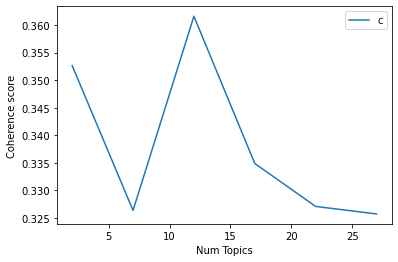

In [84]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [180]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 12

index: 0 | Num Topics = 2  has Coherence Value of 0.3526
index: 1 | Num Topics = 7  has Coherence Value of 0.3263
index: 2 | Num Topics = 12  has Coherence Value of 0.3616
index: 3 | Num Topics = 17  has Coherence Value of 0.3349
index: 4 | Num Topics = 22  has Coherence Value of 0.3271
index: 5 | Num Topics = 27  has Coherence Value of 0.3257


In [181]:
# Select optimal number of topics
optimal_model_us_score3 = model_list_us_score3[5]

In [182]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score3 = pyLDAvis.gensim_models.prepare(optimal_model_us_score3, corpus_us_score3, id2word_us_score3)

In [183]:
print("pyLDAVis for us topics for score=3:")
vis_us_score3

pyLDAVis for us topics for score=3:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.238802 -0.019800       1        1  10.882944
16    -0.196809 -0.002529       2        1  10.366178
8     -0.172565 -0.057007       3        1   9.773448
5     -0.074166  0.051077       4        1   8.471136
3     -0.095700 -0.108979       5        1   5.891924
2     -0.111490 -0.087691       6        1   5.400828
10     0.123899 -0.207555       7        1   4.459332
4     -0.092876  0.068314       8        1   4.218197
11    -0.166399 -0.048915       9        1   4.158048
15     0.026351 -0.185403      10        1   4.137116
24    -0.190023  0.051533      11        1   3.877477
18     0.009130  0.045777      12        1   3.366011
21    -0.037017 -0.081411      13        1   3.286265
12    -0.087968  0.059040      14        1   2.736640
25     0.031961 -0.110817      15        1   2.506566
14    -0.061960  0.134937      16        1   2.418889
20     0.089659  0.019083      17        1   2.332249
22     0.220870 -0.092408      18        1   1.747557
23     0.119207 -0.125729      19        1   1.670363
17     0.048512  0.162319      20        1   1.215306
19     0.049940  0.150289      21        1   1.202803
1      0.072267  0.194124      22        1   1.183531
26     0.071188  0.028901      23        1   1.054744
6      0.200969 -0.044295      24        1   1.040741
0      0.122750  0.057237      25        1   0.962437
13     0.102750  0.078967      26        1   0.908773
9      0.236321  0.070944      27        1   0.730496, topic_info=        Term         Freq        Total Category  logprob  loglift
107    story   475.000000   475.000000  Default  30.0000  30.0000
187   update   710.000000   710.000000  Default  29.0000  29.0000
0        app  1695.000000  1695.000000  Default  28.0000  28.0000
27      send   475.000000   475.000000  Default  27.0000  27.0000
15   message   270.000000   270.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
216     care     2.056977    17.325014  Topic27  -5.0939   2.7883
164     user     4.286124    82.578365  Topic27  -4.3597   1.9608
195      gon     1.781284    23.851190  Topic27  -5.2378   2.3247
397     hide     1.144377     6.630795  Topic27  -5.6802   3.1623
915   simply     1.102367    12.545524  Topic27  -5.7176   2.4873

[1576 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
372       1  0.063174    able
372       2  0.155064    able
372       3  0.241210    able
372       4  0.011486    able
372       5  0.005743    able
...     ...       ...     ...
629      12  0.671019   young
985      21  0.641769    youu
1580     26  0.540573  zodiac
116       4  0.634868    zoom
116      22  0.293016    zoom

[2478 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 17, 9, 6, 4, 3, 11, 5, 12, 16, 25, 19, 22, 13, 26, 15, 21, 23, 24, 18, 20, 2, 27, 7, 1, 14, 10])

## LDA Topic Modelling (Rating = 4)

In [89]:
# By-rating Topic Modelling - rating = 4
# Convert to list - move to each section
review_us_score4 = snapchat_ios_us_review_YearMonth_score4.review.values.tolist()
review_words_us_score4 = list(sent_to_words(review_us_score4))
print(review_words_us_score4[2:3])

[['honestly', 'love', 'this', 'app', 'have', 'been', 'using', 'it', 'for', 'many', 'years', 'now', 'although', 'do', 'wish', 'that', 'the', 'camera', 'from', 'the', 'xr', 'xs', 'and', 'xs', 'max', 'were', 'not', 'so', 'close', 'to', 'the', 'face', 'and', 'blurry', 'not', 'only', 'that', 'but', 'it', 'changes', 'the', 'color', 'of', 'when', 'you', 'first', 'initially', 'took', 'the', 'photo', 'meaning', 'that', 'when', 'took', 'the', 'photo', 'had', 'an', 'orange', 'hue', 'that', 'like', 'from', 'the', 'sun', 'however', 'snapchat', 'changed', 'the', 'color', 'of', 'my', 'face', 'to', 'light', 'yellow', 'deeper', 'melanin', 'is', 'what', 'strive', 'for', 'in', 'my', 'photos', 'and', 'don', 'wish', 'for', 'you', 'to', 'change', 'that', 'please', 'consider', 'fixing', 'that', 'problem', 'as', 'well', 'as', 'the', 'very', 'close', 'blurry', 'photos']]


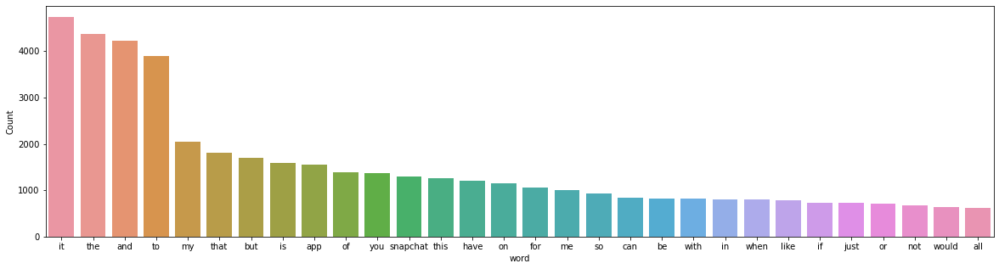

In [90]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score4))

In [91]:
# Clean text
review_us_ready_score4 = process_words(review_words_us_score4)  # processed Text Data! - move to each section

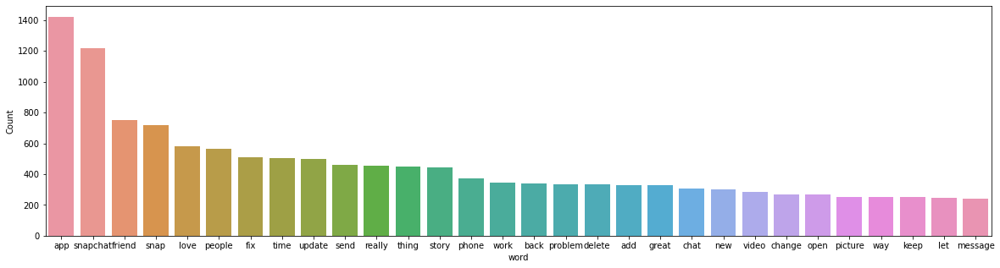

In [92]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score4))


In [93]:
# Create Dictionary
id2word_us_score4 = corpora.Dictionary(review_us_ready_score4)

2021-10-16 22:32:53,673 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 22:32:53,852 [INFO] gensim.corpora.dictionary - built Dictionary(2808 unique tokens: ['allow', 'always', 'amount', 'annoying', 'app']...) from 1116 documents (total 40930 corpus positions)
2021-10-16 22:32:53,854 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(2808 unique tokens: ['allow', 'always', 'amount', 'annoying', 'app']...) from 1116 documents (total 40930 corpus positions)", 'datetime': '2021-10-16T22:32:53.854603', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [94]:
# Create Corpus: Term Document Frequency
corpus_us_score4 = [id2word_us_score4.doc2bow(text) for text in review_us_ready_score4]

In [95]:
# Training LDA model
model_list_us_score4, coherence_values_us_score4 = compute_coherence_values(dictionary=id2word_us_score4, corpus=corpus_us_score4, 
                                                              texts=review_us_ready_score4, limit=30, start=2, step=5)


2021-10-16 22:32:53,964 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 22:32:53,967 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 22:32:53,972 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 22:32:53,977 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1116 documents, updating model once every 1000 documents, evaluating perplexity every 1116 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 22:32:53,978 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1116
2021-10-16 22:32:57,185 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:32:57,190 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.032*"app" + 0.031*"snapchat" + 0.018*"love" + 0.018*"snap" + 0.014*"friend" + 0.014*"fix" + 0.013*"people" + 0.012*"thing" + 0.012*"story" 

2021-10-16 22:33:10,576 [INFO] gensim.models.ldamodel - -6.020 per-word bound, 64.9 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:33:10,578 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1116/1116
2021-10-16 22:33:10,774 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:33:10,777 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.043*"app" + 0.031*"snapchat" + 0.018*"snap" + 0.017*"update" + 0.017*"friend" + 0.016*"fix" + 0.016*"people" + 0.015*"love" + 0.013*"story" + 0.011*"phone"
2021-10-16 22:33:10,779 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"app" + 0.022*"snapchat" + 0.017*"account" + 0.015*"back" + 0.015*"delete" + 0.014*"friend" + 0.013*"change" + 0.013*"work" + 0.012*"snap" + 0.012*"phone"
2021-10-16 22:33:10,780 [INFO] gensim.models.ldamodel - topic diff=0.298441, rho=0.404358
2021-10-16 22:33:10,782 [INFO] gensim.models.ldamodel - PROG

2021-10-16 22:33:23,427 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.033*"app" + 0.023*"snapchat" + 0.018*"account" + 0.015*"back" + 0.014*"change" + 0.013*"friend" + 0.013*"log" + 0.013*"delete" + 0.012*"work" + 0.012*"snap"
2021-10-16 22:33:23,428 [INFO] gensim.models.ldamodel - topic diff=0.205614, rho=0.299934
2021-10-16 22:33:23,757 [INFO] gensim.models.ldamodel - -5.996 per-word bound, 63.8 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:33:23,759 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1116/1116
2021-10-16 22:33:24,060 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:33:24,062 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.030*"snapchat" + 0.018*"snap" + 0.017*"friend" + 0.017*"update" + 0.016*"fix" + 0.016*"people" + 0.015*"love" + 0.013*"story" + 0.011*"time"
2021-10-16 22:33:24,063 [INFO] gensim.models.ldamodel - topic #

2021-10-16 22:33:35,380 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:33:35,382 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.030*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"fix" + 0.016*"update" + 0.015*"love" + 0.015*"people" + 0.013*"story" + 0.012*"time"
2021-10-16 22:33:35,385 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.023*"snapchat" + 0.019*"account" + 0.015*"change" + 0.015*"back" + 0.014*"log" + 0.013*"friend" + 0.012*"delete" + 0.012*"work" + 0.012*"phone"
2021-10-16 22:33:35,386 [INFO] gensim.models.ldamodel - topic diff=0.164823, rho=0.249099
2021-10-16 22:33:35,798 [INFO] gensim.models.ldamodel - -5.988 per-word bound, 63.5 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:33:35,800 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1116/1116
2021-10-16 22:33:36,003 [INFO] gensim.models.ldamodel - merg

2021-10-16 22:33:45,342 [INFO] gensim.models.ldamodel - topic diff=0.142467, rho=0.222961
2021-10-16 22:33:45,345 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/1116
2021-10-16 22:33:47,070 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:33:47,073 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.030*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.016*"fix" + 0.015*"love" + 0.015*"people" + 0.013*"story" + 0.012*"time"
2021-10-16 22:33:47,075 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.023*"snapchat" + 0.019*"account" + 0.015*"change" + 0.015*"log" + 0.014*"back" + 0.013*"friend" + 0.012*"delete" + 0.011*"phone" + 0.011*"work"
2021-10-16 22:33:47,077 [INFO] gensim.models.ldamodel - topic diff=0.141214, rho=0.217618
2021-10-16 22:33:47,341 [INFO] gensim.models.ldamodel - -5.984 per-word bound, 63.3 perplexity estimate based on a held-out corpus of 

2021-10-16 22:33:56,916 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.023*"snapchat" + 0.020*"account" + 0.016*"change" + 0.015*"log" + 0.015*"back" + 0.013*"delete" + 0.012*"friend" + 0.012*"phone" + 0.012*"people"
2021-10-16 22:33:56,919 [INFO] gensim.models.ldamodel - topic diff=0.125945, rho=0.199538
2021-10-16 22:33:56,921 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1116
2021-10-16 22:33:58,672 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:33:58,675 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.030*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.015*"fix" + 0.015*"love" + 0.014*"people" + 0.013*"story" + 0.012*"time"
2021-10-16 22:33:58,676 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.033*"app" + 0.023*"snapchat" + 0.020*"account" + 0.016*"change" + 0.015*"log" + 0.014*"back" + 0.012*"friend" + 0.012*"delete" + 0.011*"people" + 

2021-10-16 22:34:07,938 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:34:07,940 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.029*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.016*"fix" + 0.015*"people" + 0.014*"love" + 0.013*"story" + 0.012*"time"
2021-10-16 22:34:07,942 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.023*"snapchat" + 0.021*"account" + 0.016*"change" + 0.015*"log" + 0.014*"back" + 0.012*"delete" + 0.012*"friend" + 0.012*"people" + 0.012*"phone"
2021-10-16 22:34:07,943 [INFO] gensim.models.ldamodel - topic diff=0.114071, rho=0.182222
2021-10-16 22:34:07,944 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1000/1116
2021-10-16 22:34:09,657 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:34:09,676 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"app" + 0.029*"snapc

2021-10-16 22:34:18,314 [INFO] gensim.models.ldamodel - topic diff=0.106698, rho=0.168751
2021-10-16 22:34:18,598 [INFO] gensim.models.ldamodel - -5.977 per-word bound, 63.0 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:34:18,599 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1116/1116
2021-10-16 22:34:18,829 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:34:18,832 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.029*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.016*"fix" + 0.015*"people" + 0.014*"love" + 0.013*"story" + 0.012*"time"
2021-10-16 22:34:18,834 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.033*"app" + 0.023*"snapchat" + 0.021*"account" + 0.017*"change" + 0.016*"log" + 0.014*"back" + 0.012*"friend" + 0.012*"delete" + 0.012*"people" + 0.011*"phone"
2021-10-16 22:34:18,835 [INFO] gensim.models.ldamodel - top

2021-10-16 22:34:29,306 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.031*"app" + 0.023*"snapchat" + 0.021*"account" + 0.017*"change" + 0.016*"log" + 0.014*"back" + 0.012*"friend" + 0.012*"people" + 0.011*"delete" + 0.010*"phone"
2021-10-16 22:34:29,308 [INFO] gensim.models.ldamodel - topic diff=0.099284, rho=0.157885
2021-10-16 22:34:29,588 [INFO] gensim.models.ldamodel - -5.974 per-word bound, 62.9 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:34:29,589 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1116/1116
2021-10-16 22:34:29,822 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:34:29,825 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.042*"app" + 0.029*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.016*"fix" + 0.014*"people" + 0.014*"love" + 0.013*"story" + 0.012*"time"
2021-10-16 22:34:29,827 [INFO] gensim.models.ldamodel - top

2021-10-16 22:34:39,951 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:34:39,954 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.029*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.015*"fix" + 0.014*"people" + 0.014*"love" + 0.013*"story" + 0.012*"time"
2021-10-16 22:34:39,956 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.030*"app" + 0.023*"snapchat" + 0.022*"account" + 0.018*"change" + 0.017*"log" + 0.013*"back" + 0.012*"friend" + 0.012*"people" + 0.010*"delete" + 0.010*"really"
2021-10-16 22:34:39,959 [INFO] gensim.models.ldamodel - topic diff=0.093134, rho=0.148879
2021-10-16 22:34:40,226 [INFO] gensim.models.ldamodel - -5.972 per-word bound, 62.8 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:34:40,227 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1116/1116
2021-10-16 22:34:40,413 [INFO] gensim.models.ldamodel - m

2021-10-16 22:34:49,065 [INFO] gensim.models.ldamodel - topic diff=0.087646, rho=0.142688
2021-10-16 22:34:49,066 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1116
2021-10-16 22:34:50,716 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:34:50,732 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.029*"snapchat" + 0.018*"snap" + 0.018*"friend" + 0.016*"update" + 0.016*"fix" + 0.014*"people" + 0.014*"love" + 0.013*"story" + 0.012*"time"
2021-10-16 22:34:50,748 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.029*"app" + 0.023*"snapchat" + 0.022*"account" + 0.018*"change" + 0.017*"log" + 0.013*"back" + 0.012*"people" + 0.012*"friend" + 0.010*"really" + 0.010*"snap"
2021-10-16 22:34:50,777 [INFO] gensim.models.ldamodel - topic diff=0.087970, rho=0.141258
2021-10-16 22:34:51,001 [INFO] gensim.models.ldamodel - -5.970 per-word bound, 62.7 perplexity estimate based on a held-out corpus of

2021-10-16 22:35:04,577 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.046*"app" + 0.030*"update" + 0.025*"snap" + 0.021*"time" + 0.019*"snapchat" + 0.017*"work" + 0.016*"phone" + 0.015*"thing" + 0.014*"open" + 0.014*"fix"
2021-10-16 22:35:04,579 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.045*"snapchat" + 0.039*"app" + 0.021*"fix" + 0.020*"friend" + 0.017*"problem" + 0.016*"work" + 0.016*"phone" + 0.013*"really" + 0.013*"message" + 0.013*"log"
2021-10-16 22:35:04,581 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.027*"snapchat" + 0.026*"video" + 0.016*"love" + 0.016*"app" + 0.015*"thing" + 0.014*"mode" + 0.013*"memory" + 0.013*"story" + 0.013*"add" + 0.013*"dark"
2021-10-16 22:35:04,584 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.034*"app" + 0.026*"snapchat" + 0.023*"story" + 0.017*"time" + 0.017*"screen" + 0.015*"delete" + 0.014*"really" + 0.012*"fix" + 0.012*"keep" + 0.011*"love"
2021-10-16 22:35:04,585 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.02

2021-10-16 22:35:10,623 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.048*"read" + 0.031*"article" + 0.019*"page" + 0.017*"powered" + 0.017*"swipe" + 0.015*"wrong" + 0.012*"ad" + 0.011*"spot" + 0.011*"scroll" + 0.009*"arrow"
2021-10-16 22:35:10,624 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.027*"video" + 0.024*"snapchat" + 0.020*"story" + 0.018*"memory" + 0.018*"save" + 0.016*"option" + 0.016*"love" + 0.013*"watch" + 0.013*"post" + 0.013*"snap"
2021-10-16 22:35:10,627 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.061*"app" + 0.034*"update" + 0.025*"snap" + 0.025*"work" + 0.024*"open" + 0.023*"time" + 0.022*"download" + 0.019*"phone" + 0.019*"delete" + 0.018*"snapchat"
2021-10-16 22:35:10,628 [INFO] gensim.models.ldamodel - topic diff=0.303418, rho=0.442114
2021-10-16 22:35:10,632 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1116
2021-10-16 22:35:12,641 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 do

2021-10-16 22:35:17,317 [INFO] gensim.models.ldamodel - topic diff=0.182057, rho=0.351018
2021-10-16 22:35:17,523 [INFO] gensim.models.ldamodel - -5.906 per-word bound, 60.0 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:35:17,525 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #1116/1116
2021-10-16 22:35:17,730 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:35:17,734 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"read" + 0.032*"article" + 0.026*"swipe" + 0.021*"page" + 0.016*"powered" + 0.016*"wrong" + 0.013*"ad" + 0.012*"scroll" + 0.010*"action" + 0.010*"spot"
2021-10-16 22:35:17,735 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.067*"app" + 0.034*"update" + 0.027*"work" + 0.026*"open" + 0.025*"snap" + 0.023*"time" + 0.022*"download" + 0.020*"phone" + 0.019*"delete" + 0.019*"snapchat"
2021-10-16 22:35:17,737 [INFO] gensim.models.ldamodel - topic

2021-10-16 22:35:24,151 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.033*"video" + 0.026*"snapchat" + 0.020*"save" + 0.020*"story" + 0.018*"love" + 0.016*"memory" + 0.014*"mode" + 0.014*"watch" + 0.013*"filter" + 0.013*"send"
2021-10-16 22:35:24,156 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.055*"app" + 0.048*"snapchat" + 0.025*"fix" + 0.022*"work" + 0.022*"phone" + 0.018*"log" + 0.018*"issue" + 0.017*"problem" + 0.016*"let" + 0.015*"delete"
2021-10-16 22:35:24,159 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"friend" + 0.035*"people" + 0.032*"app" + 0.029*"snapchat" + 0.023*"account" + 0.020*"great" + 0.017*"add" + 0.013*"love" + 0.012*"back" + 0.012*"snap"
2021-10-16 22:35:24,169 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"read" + 0.033*"article" + 0.032*"swipe" + 0.022*"page" + 0.015*"ad" + 0.012*"wrong" + 0.011*"scroll" + 0.011*"powered" + 0.010*"action" + 0.009*"arrow"
2021-10-16 22:35:24,177 [INFO] gensim.models.ldamodel - topic diff=0.1387

2021-10-16 22:35:29,102 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.054*"swipe" + 0.049*"read" + 0.030*"article" + 0.022*"page" + 0.016*"wrong" + 0.014*"powered" + 0.013*"ad" + 0.013*"scroll" + 0.012*"button" + 0.010*"action"
2021-10-16 22:35:29,104 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.057*"app" + 0.048*"snapchat" + 0.024*"fix" + 0.022*"work" + 0.022*"phone" + 0.019*"log" + 0.019*"issue" + 0.017*"let" + 0.016*"delete" + 0.016*"problem"
2021-10-16 22:35:29,105 [INFO] gensim.models.ldamodel - topic diff=0.121638, rho=0.276121
2021-10-16 22:35:29,108 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1116
2021-10-16 22:35:30,951 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:35:30,954 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.068*"app" + 0.036*"update" + 0.027*"work" + 0.025*"snap" + 0.024*"open" + 0.024*"time" + 0.021*"phone" + 0.020*"snapchat" + 0.019*"download" + 0.019*"

2021-10-16 22:35:35,372 [INFO] gensim.models.ldamodel - -5.847 per-word bound, 57.5 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:35:35,375 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1116/1116
2021-10-16 22:35:35,580 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:35:35,584 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.062*"swipe" + 0.048*"read" + 0.030*"article" + 0.022*"page" + 0.016*"wrong" + 0.015*"button" + 0.014*"powered" + 0.013*"ad" + 0.013*"scroll" + 0.010*"action"
2021-10-16 22:35:35,585 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"people" + 0.036*"friend" + 0.030*"app" + 0.028*"snapchat" + 0.027*"account" + 0.020*"great" + 0.017*"add" + 0.013*"back" + 0.013*"list" + 0.012*"new"
2021-10-16 22:35:35,586 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"story" + 0.026*"snap" + 0.024*"app" + 0.022*"time" + 0.021*"chat" + 0.

2021-10-16 22:35:41,664 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"story" + 0.028*"snap" + 0.024*"chat" + 0.023*"app" + 0.022*"time" + 0.018*"love" + 0.017*"really" + 0.017*"snapchat" + 0.017*"send" + 0.016*"friend"
2021-10-16 22:35:41,666 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.070*"app" + 0.036*"update" + 0.028*"work" + 0.024*"open" + 0.023*"snap" + 0.023*"time" + 0.022*"phone" + 0.020*"snapchat" + 0.020*"delete" + 0.020*"download"
2021-10-16 22:35:41,670 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.057*"app" + 0.048*"snapchat" + 0.025*"fix" + 0.022*"work" + 0.021*"phone" + 0.019*"log" + 0.018*"issue" + 0.017*"let" + 0.016*"problem" + 0.016*"delete"
2021-10-16 22:35:41,673 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"friend" + 0.036*"people" + 0.029*"app" + 0.028*"snapchat" + 0.025*"account" + 0.020*"great" + 0.018*"add" + 0.013*"love" + 0.012*"back" + 0.012*"list"
2021-10-16 22:35:41,676 [INFO] gensim.models.ldamodel - topic diff=0.093765

2021-10-16 22:35:46,279 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.072*"app" + 0.034*"update" + 0.029*"work" + 0.025*"open" + 0.023*"time" + 0.023*"phone" + 0.023*"download" + 0.022*"snap" + 0.021*"delete" + 0.020*"let"
2021-10-16 22:35:46,281 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"people" + 0.037*"friend" + 0.029*"app" + 0.027*"snapchat" + 0.027*"account" + 0.020*"great" + 0.017*"add" + 0.013*"back" + 0.013*"list" + 0.012*"new"
2021-10-16 22:35:46,283 [INFO] gensim.models.ldamodel - topic diff=0.087338, rho=0.217618
2021-10-16 22:35:46,285 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1116
2021-10-16 22:35:47,959 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:35:48,026 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"story" + 0.029*"snap" + 0.025*"chat" + 0.023*"app" + 0.022*"time" + 0.018*"love" + 0.017*"send" + 0.017*"really" + 0.017*"friend" + 0.017*"snapchat"

2021-10-16 22:35:52,474 [INFO] gensim.models.ldamodel - -5.828 per-word bound, 56.8 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:35:52,476 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1116/1116
2021-10-16 22:35:52,604 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:35:52,609 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.072*"app" + 0.034*"update" + 0.029*"work" + 0.025*"open" + 0.023*"time" + 0.023*"phone" + 0.023*"download" + 0.022*"snap" + 0.022*"delete" + 0.021*"let"
2021-10-16 22:35:52,610 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"change" + 0.027*"snap" + 0.021*"app" + 0.020*"bitmoji" + 0.020*"thing" + 0.018*"friend" + 0.018*"new" + 0.016*"really" + 0.016*"feature" + 0.015*"love"
2021-10-16 22:35:52,613 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.070*"swipe" + 0.047*"read" + 0.029*"article" + 0.022*"page" + 0.018*"button" +

2021-10-16 22:35:58,496 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.032*"video" + 0.028*"snapchat" + 0.019*"save" + 0.018*"love" + 0.017*"story" + 0.016*"memory" + 0.015*"filter" + 0.014*"mode" + 0.014*"watch" + 0.013*"option"
2021-10-16 22:35:58,498 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"change" + 0.027*"snap" + 0.021*"app" + 0.020*"thing" + 0.019*"bitmoji" + 0.018*"friend" + 0.018*"new" + 0.016*"really" + 0.015*"feature" + 0.015*"love"
2021-10-16 22:35:58,499 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"friend" + 0.037*"people" + 0.029*"app" + 0.028*"snapchat" + 0.025*"account" + 0.021*"great" + 0.019*"add" + 0.013*"love" + 0.013*"back" + 0.013*"list"
2021-10-16 22:35:58,501 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"story" + 0.030*"snap" + 0.027*"chat" + 0.022*"app" + 0.021*"time" + 0.018*"send" + 0.018*"love" + 0.018*"friend" + 0.017*"really" + 0.017*"snapchat"
2021-10-16 22:35:58,502 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 22:36:03,166 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.037*"friend" + 0.037*"people" + 0.029*"app" + 0.027*"account" + 0.027*"snapchat" + 0.020*"great" + 0.018*"add" + 0.013*"list" + 0.013*"back" + 0.012*"new"
2021-10-16 22:36:03,167 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.030*"video" + 0.027*"snapchat" + 0.019*"save" + 0.018*"love" + 0.017*"memory" + 0.017*"story" + 0.015*"option" + 0.014*"filter" + 0.014*"watch" + 0.013*"send"
2021-10-16 22:36:03,169 [INFO] gensim.models.ldamodel - topic diff=0.071659, rho=0.185325
2021-10-16 22:36:03,171 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1116
2021-10-16 22:36:04,915 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:36:04,938 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.071*"app" + 0.035*"update" + 0.029*"work" + 0.024*"open" + 0.024*"time" + 0.023*"phone" + 0.022*"snap" + 0.021*"delete" + 0.021*"let" + 0.020*"down

2021-10-16 22:36:09,123 [INFO] gensim.models.ldamodel - -5.821 per-word bound, 56.5 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:36:09,128 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1116/1116
2021-10-16 22:36:09,281 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:36:09,287 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.034*"update" + 0.029*"work" + 0.025*"open" + 0.023*"time" + 0.023*"phone" + 0.023*"download" + 0.022*"delete" + 0.021*"snap" + 0.021*"let"
2021-10-16 22:36:09,295 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.058*"app" + 0.049*"snapchat" + 0.025*"fix" + 0.022*"work" + 0.021*"phone" + 0.020*"log" + 0.019*"issue" + 0.018*"let" + 0.017*"delete" + 0.015*"problem"
2021-10-16 22:36:09,297 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.030*"video" + 0.027*"snapchat" + 0.019*"save" + 0.018*"love" + 0.017*"memory" + 0.

2021-10-16 22:36:15,129 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"friend" + 0.037*"people" + 0.028*"app" + 0.027*"snapchat" + 0.026*"account" + 0.021*"great" + 0.019*"add" + 0.013*"list" + 0.013*"back" + 0.012*"love"
2021-10-16 22:36:15,131 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.067*"swipe" + 0.047*"read" + 0.029*"article" + 0.022*"page" + 0.019*"button" + 0.016*"scroll" + 0.014*"ad" + 0.013*"top" + 0.013*"wrong" + 0.013*"accidentally"
2021-10-16 22:36:15,133 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"story" + 0.031*"snap" + 0.028*"chat" + 0.022*"app" + 0.020*"time" + 0.019*"send" + 0.018*"friend" + 0.018*"love" + 0.017*"really" + 0.017*"post"
2021-10-16 22:36:15,136 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.057*"app" + 0.049*"snapchat" + 0.026*"fix" + 0.022*"work" + 0.021*"phone" + 0.019*"log" + 0.018*"issue" + 0.017*"let" + 0.016*"delete" + 0.016*"problem"
2021-10-16 22:36:15,138 [INFO] gensim.models.ldamodel - topic diff=0.064504, 

2021-10-16 22:36:19,830 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.040*"story" + 0.030*"snap" + 0.027*"chat" + 0.022*"app" + 0.020*"time" + 0.018*"friend" + 0.018*"love" + 0.018*"send" + 0.017*"post" + 0.017*"really"
2021-10-16 22:36:19,831 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.030*"video" + 0.028*"snapchat" + 0.019*"save" + 0.018*"love" + 0.017*"memory" + 0.016*"story" + 0.015*"option" + 0.014*"filter" + 0.014*"watch" + 0.013*"send"
2021-10-16 22:36:19,832 [INFO] gensim.models.ldamodel - topic diff=0.062209, rho=0.164142
2021-10-16 22:36:19,833 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1116
2021-10-16 22:36:21,469 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:36:21,476 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.039*"story" + 0.031*"snap" + 0.028*"chat" + 0.022*"app" + 0.020*"time" + 0.020*"send" + 0.019*"friend" + 0.018*"love" + 0.017*"really" + 0.017*"post"
20

2021-10-16 22:36:26,079 [INFO] gensim.models.ldamodel - -5.818 per-word bound, 56.4 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:36:26,080 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1116/1116
2021-10-16 22:36:26,234 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:36:26,245 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.071*"swipe" + 0.047*"read" + 0.028*"article" + 0.022*"page" + 0.021*"button" + 0.017*"scroll" + 0.015*"wrong" + 0.014*"accidentally" + 0.013*"top" + 0.013*"ad"
2021-10-16 22:36:26,247 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"change" + 0.027*"snap" + 0.021*"app" + 0.020*"thing" + 0.020*"bitmoji" + 0.019*"new" + 0.018*"friend" + 0.016*"really" + 0.015*"feature" + 0.015*"love"
2021-10-16 22:36:26,252 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.034*"update" + 0.029*"work" + 0.026*"open" + 0.024*"phone

2021-10-16 22:36:31,968 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"friend" + 0.037*"people" + 0.028*"app" + 0.027*"snapchat" + 0.026*"account" + 0.021*"great" + 0.019*"add" + 0.013*"list" + 0.013*"back" + 0.012*"love"
2021-10-16 22:36:31,969 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"swipe" + 0.047*"read" + 0.029*"article" + 0.022*"page" + 0.020*"button" + 0.017*"scroll" + 0.014*"ad" + 0.014*"top" + 0.013*"accidentally" + 0.013*"wrong"
2021-10-16 22:36:31,972 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.072*"app" + 0.035*"update" + 0.029*"work" + 0.025*"open" + 0.024*"time" + 0.023*"phone" + 0.022*"delete" + 0.021*"snap" + 0.021*"let" + 0.021*"download"
2021-10-16 22:36:31,975 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.032*"video" + 0.028*"snapchat" + 0.019*"save" + 0.018*"love" + 0.016*"story" + 0.016*"memory" + 0.015*"filter" + 0.014*"mode" + 0.013*"watch" + 0.013*"option"
2021-10-16 22:36:31,975 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-16 22:36:36,565 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.071*"swipe" + 0.047*"read" + 0.028*"article" + 0.022*"page" + 0.021*"button" + 0.017*"scroll" + 0.014*"wrong" + 0.014*"accidentally" + 0.014*"ad" + 0.013*"top"
2021-10-16 22:36:36,567 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.073*"app" + 0.034*"update" + 0.029*"work" + 0.026*"open" + 0.024*"phone" + 0.024*"time" + 0.023*"delete" + 0.022*"download" + 0.022*"let" + 0.021*"snap"
2021-10-16 22:36:36,567 [INFO] gensim.models.ldamodel - topic diff=0.055699, rho=0.148879
2021-10-16 22:36:36,569 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1116
2021-10-16 22:36:38,114 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:36:38,123 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.058*"app" + 0.049*"snapchat" + 0.026*"fix" + 0.022*"work" + 0.021*"phone" + 0.020*"log" + 0.018*"issue" + 0.017*"let" + 0.016*"delete" + 0.016*"prob

2021-10-16 22:36:42,395 [INFO] gensim.models.ldamodel - -5.815 per-word bound, 56.3 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:36:42,397 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1116/1116
2021-10-16 22:36:42,524 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:36:42,540 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.038*"friend" + 0.038*"people" + 0.028*"app" + 0.027*"account" + 0.027*"snapchat" + 0.020*"great" + 0.018*"add" + 0.013*"list" + 0.013*"back" + 0.012*"new"
2021-10-16 22:36:42,545 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"change" + 0.027*"snap" + 0.021*"app" + 0.020*"thing" + 0.020*"bitmoji" + 0.019*"new" + 0.018*"friend" + 0.016*"really" + 0.015*"feature" + 0.015*"love"
2021-10-16 22:36:42,548 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.071*"swipe" + 0.047*"read" + 0.028*"article" + 0.022*"page" + 0.022*"button"

2021-10-16 22:36:48,448 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"swipe" + 0.047*"read" + 0.029*"article" + 0.022*"page" + 0.020*"button" + 0.018*"scroll" + 0.016*"ad" + 0.013*"top" + 0.013*"accidentally" + 0.013*"wrong"
2021-10-16 22:36:48,450 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.036*"change" + 0.027*"snap" + 0.021*"app" + 0.020*"thing" + 0.019*"new" + 0.019*"bitmoji" + 0.018*"friend" + 0.016*"really" + 0.015*"love" + 0.015*"feature"
2021-10-16 22:36:48,452 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"friend" + 0.037*"people" + 0.028*"app" + 0.027*"snapchat" + 0.026*"account" + 0.021*"great" + 0.019*"add" + 0.013*"list" + 0.013*"back" + 0.012*"love"
2021-10-16 22:36:48,454 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.058*"app" + 0.049*"snapchat" + 0.026*"fix" + 0.022*"work" + 0.021*"phone" + 0.020*"log" + 0.018*"issue" + 0.017*"let" + 0.016*"delete" + 0.016*"problem"
2021-10-16 22:36:48,454 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 22:37:00,503 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.037*"friend" + 0.035*"snapchat" + 0.027*"app" + 0.022*"fix" + 0.017*"message" + 0.017*"really" + 0.016*"people" + 0.015*"problem" + 0.014*"story" + 0.012*"send"
2021-10-16 22:37:00,505 [INFO] gensim.models.ldamodel - topic diff=0.607307, rho=0.566502
2021-10-16 22:37:00,841 [INFO] gensim.models.ldamodel - -6.540 per-word bound, 93.1 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:37:00,842 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1116/1116
2021-10-16 22:37:01,093 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:37:01,098 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.049*"change" + 0.028*"snap" + 0.019*"name" + 0.019*"score" + 0.017*"send" + 0.016*"friend" + 0.016*"thing" + 0.015*"bitmoji" + 0.014*"username" + 0.014*"app"
2021-10-16 22:37:01,099 [INFO] gensim.models.ldamodel - 

2021-10-16 22:37:07,842 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:37:07,847 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.052*"change" + 0.031*"snap" + 0.022*"send" + 0.020*"name" + 0.019*"username" + 0.018*"color" + 0.017*"thing" + 0.014*"score" + 0.014*"bitmoji" + 0.013*"add"
2021-10-16 22:37:07,849 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.076*"app" + 0.029*"work" + 0.023*"open" + 0.023*"update" + 0.023*"snapchat" + 0.022*"phone" + 0.022*"fix" + 0.020*"delete" + 0.018*"problem" + 0.018*"snap"
2021-10-16 22:37:07,851 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.061*"video" + 0.042*"save" + 0.039*"memory" + 0.031*"story" + 0.021*"love" + 0.020*"option" + 0.018*"thing" + 0.018*"watch" + 0.018*"post" + 0.016*"photo"
2021-10-16 22:37:07,852 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.046*"friend" + 0.037*"people" + 0.030*"snapchat" + 0.029*"add" + 0.024*"app" + 0.024*"love" + 0.018*"gre

2021-10-16 22:37:12,608 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.033*"update" + 0.031*"bitmoji" + 0.026*"really" + 0.019*"everytime" + 0.018*"option" + 0.017*"snap" + 0.014*"app" + 0.014*"look" + 0.014*"snapchat" + 0.014*"new"
2021-10-16 22:37:12,609 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.053*"change" + 0.033*"snap" + 0.021*"send" + 0.020*"username" + 0.019*"name" + 0.019*"score" + 0.018*"thing" + 0.016*"bitmoji" + 0.015*"color" + 0.015*"year"
2021-10-16 22:37:12,610 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.053*"snapchat" + 0.043*"app" + 0.025*"account" + 0.020*"update" + 0.017*"time" + 0.016*"thing" + 0.015*"new" + 0.015*"people" + 0.014*"change" + 0.013*"friend"
2021-10-16 22:37:12,611 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.007*"lens" + 0.005*"horse" + 0.004*"jump" + 0.004*"tooth" + 0.004*"roan" + 0.002*"spot" + 0.002*"crowd" + 0.002*"anticipate" + 0.002*"bcuz" + 0.002*"manage"
2021-10-16 22:37:12,612 [INFO] gensim.models.ldamodel - to

2021-10-16 22:37:18,490 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.045*"ad" + 0.041*"read" + 0.030*"show" + 0.028*"people" + 0.027*"story" + 0.023*"look" + 0.022*"article" + 0.022*"game" + 0.020*"play" + 0.018*"unadde"
2021-10-16 22:37:18,493 [INFO] gensim.models.ldamodel - topic diff=0.127331, rho=0.299934
2021-10-16 22:37:18,741 [INFO] gensim.models.ldamodel - -5.859 per-word bound, 58.0 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:37:18,743 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1116/1116
2021-10-16 22:37:18,949 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:37:18,954 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.056*"video" + 0.043*"memory" + 0.041*"save" + 0.038*"story" + 0.024*"option" + 0.024*"post" + 0.018*"picture" + 0.018*"watch" + 0.017*"thing" + 0.017*"snap"
2021-10-16 22:37:18,955 [INFO] gensim.models.ldamodel - topic #9 (

2021-10-16 22:37:24,752 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:37:24,761 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.010*"lens" + 0.007*"horse" + 0.005*"roan" + 0.005*"jump" + 0.005*"tooth" + 0.005*"spot" + 0.003*"bitmojis" + 0.003*"skin" + 0.003*"bay" + 0.003*"brown"
2021-10-16 22:37:24,763 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"snap" + 0.031*"new" + 0.025*"chat" + 0.021*"people" + 0.019*"delete" + 0.019*"update" + 0.018*"really" + 0.018*"love" + 0.017*"wish" + 0.015*"app"
2021-10-16 22:37:24,773 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.056*"story" + 0.023*"swipe" + 0.021*"time" + 0.018*"really" + 0.018*"post" + 0.017*"screen" + 0.014*"keep" + 0.013*"map" + 0.012*"snap" + 0.012*"snapchat"
2021-10-16 22:37:24,777 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.049*"friend" + 0.040*"people" + 0.033*"add" + 0.028*"snapchat" + 0.025*"app" + 0.024*"love" + 0.018*"great" + 0.0

2021-10-16 22:37:29,439 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.049*"friend" + 0.042*"people" + 0.033*"add" + 0.027*"snapchat" + 0.026*"app" + 0.023*"love" + 0.019*"list" + 0.018*"great" + 0.014*"really" + 0.014*"talk"
2021-10-16 22:37:29,442 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.041*"snap" + 0.033*"new" + 0.023*"people" + 0.022*"chat" + 0.022*"delete" + 0.020*"update" + 0.019*"wish" + 0.018*"love" + 0.018*"really" + 0.015*"back"
2021-10-16 22:37:29,445 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.037*"bitmoji" + 0.034*"really" + 0.029*"update" + 0.019*"option" + 0.019*"everytime" + 0.017*"look" + 0.015*"new" + 0.014*"snapchat" + 0.014*"profile" + 0.013*"talk"
2021-10-16 22:37:29,446 [INFO] gensim.models.ldamodel - topic diff=0.091154, rho=0.249099
2021-10-16 22:37:29,448 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1116
2021-10-16 22:37:31,129 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1

2021-10-16 22:37:35,330 [INFO] gensim.models.ldamodel - topic diff=0.082068, rho=0.228719
2021-10-16 22:37:35,563 [INFO] gensim.models.ldamodel - -5.830 per-word bound, 56.9 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:37:35,571 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1116/1116
2021-10-16 22:37:35,707 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:37:35,712 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.049*"friend" + 0.043*"people" + 0.033*"add" + 0.027*"snapchat" + 0.026*"app" + 0.023*"love" + 0.019*"list" + 0.018*"great" + 0.014*"really" + 0.014*"way"
2021-10-16 22:37:35,714 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.054*"snapchat" + 0.045*"app" + 0.023*"account" + 0.019*"update" + 0.018*"time" + 0.016*"thing" + 0.016*"new" + 0.015*"people" + 0.014*"mode" + 0.013*"change"
2021-10-16 22:37:35,716 [INFO] gensim.models.ldamodel - topi

2021-10-16 22:37:41,171 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.036*"send" + 0.035*"friend" + 0.034*"snapchat" + 0.032*"snap" + 0.028*"app" + 0.026*"message" + 0.024*"fix" + 0.019*"chat" + 0.019*"text" + 0.018*"really"
2021-10-16 22:37:41,174 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.010*"lens" + 0.007*"horse" + 0.005*"roan" + 0.005*"jump" + 0.005*"tooth" + 0.005*"spot" + 0.003*"bitmojis" + 0.003*"skin" + 0.003*"maker" + 0.003*"bay"
2021-10-16 22:37:41,175 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.058*"ad" + 0.041*"read" + 0.029*"show" + 0.026*"story" + 0.025*"people" + 0.025*"game" + 0.023*"play" + 0.021*"article" + 0.020*"look" + 0.018*"unadde"
2021-10-16 22:37:41,178 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.086*"app" + 0.030*"work" + 0.025*"open" + 0.025*"delete" + 0.024*"phone" + 0.024*"fix" + 0.023*"snapchat" + 0.022*"update" + 0.022*"let" + 0.021*"time"
2021-10-16 22:37:41,179 [INFO] gensim.models.ldamodel - topic diff=0.074785, rho=0.21

2021-10-16 22:37:45,483 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.058*"story" + 0.026*"swipe" + 0.021*"time" + 0.018*"really" + 0.018*"post" + 0.017*"screen" + 0.016*"map" + 0.015*"keep" + 0.013*"snap" + 0.011*"app"
2021-10-16 22:37:45,485 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.062*"snapchat" + 0.044*"log" + 0.043*"account" + 0.036*"back" + 0.030*"phone" + 0.027*"app" + 0.026*"camera" + 0.025*"kick" + 0.020*"let" + 0.020*"keep"
2021-10-16 22:37:45,486 [INFO] gensim.models.ldamodel - topic diff=0.070014, rho=0.203633
2021-10-16 22:37:45,487 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1116
2021-10-16 22:37:47,100 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:37:47,105 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.040*"snap" + 0.032*"new" + 0.023*"chat" + 0.022*"delete" + 0.022*"people" + 0.020*"update" + 0.019*"wish" + 0.019*"really" + 0.018*"love" + 0.016*"back"
2021-

2021-10-16 22:37:51,336 [INFO] gensim.models.ldamodel - -5.819 per-word bound, 56.4 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:37:51,337 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1116/1116
2021-10-16 22:37:51,557 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:37:51,574 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.008*"lens" + 0.006*"horse" + 0.004*"roan" + 0.004*"jump" + 0.004*"tooth" + 0.004*"spot" + 0.002*"bitmojis" + 0.002*"skin" + 0.002*"gray" + 0.002*"maker"
2021-10-16 22:37:51,575 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.062*"snapchat" + 0.045*"log" + 0.044*"account" + 0.035*"back" + 0.030*"phone" + 0.026*"camera" + 0.025*"app" + 0.024*"kick" + 0.019*"keep" + 0.019*"let"
2021-10-16 22:37:51,577 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.038*"snap" + 0.033*"new" + 0.023*"delete" + 0.023*"people" + 0.021*"chat" + 0.020*

2021-10-16 22:37:57,226 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"ad" + 0.041*"read" + 0.029*"show" + 0.026*"story" + 0.025*"people" + 0.025*"game" + 0.023*"play" + 0.020*"article" + 0.019*"look" + 0.018*"unadde"
2021-10-16 22:37:57,228 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.040*"bitmoji" + 0.036*"really" + 0.027*"update" + 0.019*"look" + 0.018*"option" + 0.016*"everytime" + 0.015*"new" + 0.015*"love" + 0.015*"give" + 0.014*"snapchat"
2021-10-16 22:37:57,229 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.009*"lens" + 0.007*"horse" + 0.005*"roan" + 0.005*"jump" + 0.005*"tooth" + 0.004*"spot" + 0.003*"bitmojis" + 0.003*"gray" + 0.003*"skin" + 0.003*"maker"
2021-10-16 22:37:57,231 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.069*"video" + 0.046*"story" + 0.043*"save" + 0.041*"memory" + 0.027*"picture" + 0.027*"post" + 0.020*"watch" + 0.019*"option" + 0.018*"photo" + 0.018*"camera"
2021-10-16 22:37:57,233 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 22:38:01,303 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"ad" + 0.040*"read" + 0.030*"show" + 0.026*"story" + 0.026*"people" + 0.023*"game" + 0.021*"play" + 0.021*"unadde" + 0.019*"look" + 0.019*"article"
2021-10-16 22:38:01,306 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.089*"app" + 0.030*"work" + 0.027*"delete" + 0.026*"open" + 0.025*"phone" + 0.024*"let" + 0.023*"fix" + 0.023*"snapchat" + 0.023*"update" + 0.022*"download"
2021-10-16 22:38:01,308 [INFO] gensim.models.ldamodel - topic diff=0.058937, rho=0.176457
2021-10-16 22:38:01,310 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1116
2021-10-16 22:38:02,957 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:38:02,962 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.054*"snapchat" + 0.044*"app" + 0.019*"account" + 0.018*"update" + 0.017*"time" + 0.016*"thing" + 0.016*"new" + 0.015*"mode" + 0.014*"people" + 0.014*"da

2021-10-16 22:38:07,080 [INFO] gensim.models.ldamodel - -5.813 per-word bound, 56.2 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:38:07,081 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1116/1116
2021-10-16 22:38:07,216 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:38:07,221 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.037*"snap" + 0.033*"new" + 0.024*"delete" + 0.022*"people" + 0.021*"update" + 0.020*"wish" + 0.020*"chat" + 0.018*"love" + 0.018*"really" + 0.017*"back"
2021-10-16 22:38:07,222 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"change" + 0.031*"snap" + 0.022*"username" + 0.021*"send" + 0.020*"name" + 0.018*"score" + 0.018*"year" + 0.016*"color" + 0.016*"thing" + 0.016*"app"
2021-10-16 22:38:07,224 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.008*"lens" + 0.006*"horse" + 0.004*"roan" + 0.004*"jump" + 0.004*"tooth" + 0.004*

2021-10-16 22:38:12,514 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.051*"friend" + 0.042*"people" + 0.035*"add" + 0.027*"snapchat" + 0.025*"app" + 0.024*"love" + 0.019*"great" + 0.018*"list" + 0.015*"way" + 0.014*"able"
2021-10-16 22:38:12,518 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.041*"bitmoji" + 0.037*"really" + 0.027*"update" + 0.020*"look" + 0.019*"option" + 0.016*"everytime" + 0.016*"love" + 0.016*"give" + 0.016*"new" + 0.014*"snapchat"
2021-10-16 22:38:12,526 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.069*"video" + 0.048*"story" + 0.043*"save" + 0.041*"memory" + 0.028*"picture" + 0.027*"post" + 0.021*"watch" + 0.019*"option" + 0.018*"camera" + 0.018*"photo"
2021-10-16 22:38:12,533 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.060*"story" + 0.026*"swipe" + 0.022*"time" + 0.020*"post" + 0.018*"screen" + 0.017*"really" + 0.016*"map" + 0.015*"keep" + 0.013*"snap" + 0.011*"much"
2021-10-16 22:38:12,537 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-16 22:38:16,802 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.036*"snap" + 0.033*"new" + 0.024*"delete" + 0.022*"people" + 0.021*"update" + 0.020*"wish" + 0.019*"chat" + 0.018*"love" + 0.018*"really" + 0.017*"back"
2021-10-16 22:38:16,804 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.064*"video" + 0.047*"story" + 0.042*"memory" + 0.042*"save" + 0.027*"post" + 0.026*"picture" + 0.021*"option" + 0.020*"watch" + 0.018*"camera" + 0.017*"photo"
2021-10-16 22:38:16,808 [INFO] gensim.models.ldamodel - topic diff=0.051934, rho=0.157885
2021-10-16 22:38:16,811 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1116
2021-10-16 22:38:18,336 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:38:18,443 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"ad" + 0.041*"read" + 0.030*"show" + 0.025*"story" + 0.025*"people" + 0.024*"game" + 0.022*"play" + 0.020*"article" + 0.018*"look" + 0.018*"unadd

2021-10-16 22:38:22,652 [INFO] gensim.models.ldamodel - -5.809 per-word bound, 56.1 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:38:22,655 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1116/1116
2021-10-16 22:38:22,829 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:38:22,834 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.090*"app" + 0.030*"work" + 0.028*"delete" + 0.025*"phone" + 0.025*"open" + 0.024*"let" + 0.023*"snapchat" + 0.023*"fix" + 0.023*"update" + 0.022*"download"
2021-10-16 22:38:22,835 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"change" + 0.031*"snap" + 0.022*"send" + 0.022*"username" + 0.019*"name" + 0.018*"score" + 0.018*"year" + 0.017*"app" + 0.017*"color" + 0.016*"thing"
2021-10-16 22:38:22,836 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.064*"video" + 0.047*"story" + 0.042*"memory" + 0.042*"save" + 0.027*"post" + 0

2021-10-16 22:38:27,902 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.089*"app" + 0.029*"work" + 0.027*"delete" + 0.025*"phone" + 0.024*"open" + 0.024*"snapchat" + 0.024*"let" + 0.024*"fix" + 0.022*"update" + 0.021*"time"
2021-10-16 22:38:27,904 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.051*"friend" + 0.042*"people" + 0.035*"add" + 0.027*"snapchat" + 0.025*"app" + 0.024*"love" + 0.019*"great" + 0.018*"list" + 0.015*"way" + 0.014*"able"
2021-10-16 22:38:27,906 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.054*"snapchat" + 0.044*"app" + 0.019*"account" + 0.018*"update" + 0.016*"time" + 0.016*"new" + 0.016*"thing" + 0.015*"mode" + 0.014*"people" + 0.014*"dark"
2021-10-16 22:38:27,912 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.036*"snap" + 0.032*"new" + 0.024*"delete" + 0.021*"people" + 0.021*"update" + 0.020*"wish" + 0.020*"chat" + 0.018*"love" + 0.018*"really" + 0.017*"back"
2021-10-16 22:38:27,914 [INFO] gensim.models.ldamodel - topic diff=0.048294, rho=

2021-10-16 22:38:32,094 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.058*"story" + 0.027*"swipe" + 0.022*"time" + 0.020*"post" + 0.018*"screen" + 0.016*"really" + 0.016*"map" + 0.015*"keep" + 0.013*"snap" + 0.011*"much"
2021-10-16 22:38:32,097 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.008*"lens" + 0.006*"horse" + 0.004*"roan" + 0.004*"jump" + 0.004*"tooth" + 0.004*"spot" + 0.002*"bitmojis" + 0.002*"gray" + 0.002*"skin" + 0.002*"maker"
2021-10-16 22:38:32,098 [INFO] gensim.models.ldamodel - topic diff=0.047034, rho=0.144163
2021-10-16 22:38:32,101 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1116
2021-10-16 22:38:33,609 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:38:33,616 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.055*"change" + 0.031*"snap" + 0.022*"username" + 0.022*"send" + 0.020*"name" + 0.018*"color" + 0.017*"year" + 0.017*"score" + 0.017*"app" + 0.016*"thing"
202

2021-10-16 22:38:37,574 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1116/1116
2021-10-16 22:38:37,738 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:38:37,743 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.008*"lens" + 0.006*"horse" + 0.004*"roan" + 0.004*"jump" + 0.004*"tooth" + 0.004*"spot" + 0.002*"bitmojis" + 0.002*"gray" + 0.002*"skin" + 0.002*"maker"
2021-10-16 22:38:37,745 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.051*"friend" + 0.043*"people" + 0.035*"add" + 0.027*"snapchat" + 0.025*"app" + 0.024*"love" + 0.019*"list" + 0.019*"great" + 0.015*"way" + 0.014*"able"
2021-10-16 22:38:37,747 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.063*"snapchat" + 0.047*"account" + 0.044*"log" + 0.035*"back" + 0.029*"phone" + 0.027*"camera" + 0.024*"kick" + 0.019*"app" + 0.017*"let" + 0.017*"setting"
2021-10-16 22:38:37,749 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.060*"ad" + 0.0

2021-10-16 22:38:51,071 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.077*"app" + 0.028*"snapchat" + 0.026*"open" + 0.026*"work" + 0.025*"download" + 0.024*"let" + 0.023*"delete" + 0.022*"phone" + 0.020*"fix" + 0.020*"update"
2021-10-16 22:38:51,078 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.051*"snapchat" + 0.030*"update" + 0.030*"log" + 0.028*"number" + 0.022*"work" + 0.017*"back" + 0.016*"post" + 0.015*"app" + 0.015*"annoying" + 0.014*"camera"
2021-10-16 22:38:51,080 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.035*"snap" + 0.033*"app" + 0.031*"people" + 0.024*"friend" + 0.016*"update" + 0.016*"love" + 0.015*"keep" + 0.014*"bug" + 0.013*"great" + 0.013*"story"
2021-10-16 22:38:51,081 [INFO] gensim.models.ldamodel - topic diff=0.686291, rho=0.566502
2021-10-16 22:38:51,083 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #1000/1116
2021-10-16 22:38:53,129 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 docum

2021-10-16 22:38:57,960 [INFO] gensim.models.ldamodel - topic diff=0.271853, rho=0.404358
2021-10-16 22:38:58,154 [INFO] gensim.models.ldamodel - -6.512 per-word bound, 91.3 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:38:58,155 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1116/1116
2021-10-16 22:38:58,354 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:38:58,361 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.039*"swipe" + 0.038*"change" + 0.035*"snap" + 0.029*"update" + 0.029*"send" + 0.029*"map" + 0.022*"score" + 0.019*"ad" + 0.018*"pic" + 0.017*"outfit"
2021-10-16 22:38:58,362 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.038*"people" + 0.037*"snap" + 0.029*"app" + 0.021*"friend" + 0.018*"story" + 0.017*"great" + 0.017*"way" + 0.015*"love" + 0.015*"keep" + 0.015*"update"
2021-10-16 22:38:58,363 [INFO] gensim.models.ldamodel - topic #14 (0.059)

2021-10-16 22:39:04,491 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.045*"story" + 0.034*"screen" + 0.026*"time" + 0.021*"watch" + 0.016*"really" + 0.015*"read" + 0.014*"snapchat" + 0.013*"app" + 0.012*"button" + 0.012*"show"
2021-10-16 22:39:04,492 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.044*"video" + 0.042*"photo" + 0.038*"snap" + 0.030*"online" + 0.027*"sound" + 0.026*"people" + 0.024*"certain" + 0.022*"friend" + 0.021*"volume" + 0.019*"music"
2021-10-16 22:39:04,494 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.039*"snap" + 0.038*"people" + 0.029*"app" + 0.021*"great" + 0.021*"friend" + 0.018*"story" + 0.018*"way" + 0.017*"love" + 0.014*"look" + 0.014*"keep"
2021-10-16 22:39:04,496 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.057*"snapchat" + 0.039*"camera" + 0.038*"picture" + 0.036*"log" + 0.034*"number" + 0.032*"iphone" + 0.024*"update" + 0.023*"quality" + 0.021*"annoying" + 0.018*"fix"
2021-10-16 22:39:04,498 [INFO] gensim.models.ldamodel - topi

2021-10-16 22:39:08,913 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.106*"people" + 0.106*"add" + 0.063*"friend" + 0.045*"delete" + 0.044*"list" + 0.041*"remove" + 0.039*"snapchat" + 0.029*"option" + 0.022*"group" + 0.020*"talk"
2021-10-16 22:39:08,916 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.039*"send" + 0.036*"snapchat" + 0.034*"friend" + 0.031*"snap" + 0.030*"app" + 0.029*"fix" + 0.026*"message" + 0.023*"text" + 0.022*"thing" + 0.020*"chat"
2021-10-16 22:39:08,918 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.051*"save" + 0.036*"story" + 0.028*"really" + 0.025*"memory" + 0.025*"snap" + 0.019*"look" + 0.018*"filter" + 0.018*"back" + 0.017*"chat" + 0.017*"way"
2021-10-16 22:39:08,919 [INFO] gensim.models.ldamodel - topic diff=0.111802, rho=0.299934
2021-10-16 22:39:08,921 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/1116
2021-10-16 22:39:10,589 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 doc

2021-10-16 22:39:14,740 [INFO] gensim.models.ldamodel - topic diff=0.092121, rho=0.266161
2021-10-16 22:39:14,986 [INFO] gensim.models.ldamodel - -6.383 per-word bound, 83.5 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:39:14,987 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1116/1116
2021-10-16 22:39:15,210 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:39:15,216 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.061*"snapchat" + 0.044*"log" + 0.039*"picture" + 0.037*"camera" + 0.036*"number" + 0.030*"iphone" + 0.027*"annoying" + 0.023*"fix" + 0.023*"update" + 0.019*"quality"
2021-10-16 22:39:15,217 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.039*"people" + 0.033*"snap" + 0.029*"app" + 0.022*"great" + 0.020*"way" + 0.020*"story" + 0.016*"keep" + 0.015*"friend" + 0.015*"look" + 0.015*"love"
2021-10-16 22:39:15,219 [INFO] gensim.models.ldamodel - t

2021-10-16 22:39:20,940 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.042*"update" + 0.038*"swipe" + 0.035*"snap" + 0.035*"map" + 0.034*"change" + 0.027*"send" + 0.022*"bottom" + 0.020*"score" + 0.020*"screen" + 0.019*"new"
2021-10-16 22:39:20,955 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.044*"notification" + 0.037*"arrow" + 0.036*"powered" + 0.027*"spot" + 0.008*"horse" + 0.008*"artist" + 0.006*"swiping" + 0.005*"roan" + 0.005*"advertisement" + 0.005*"bcz"
2021-10-16 22:39:20,957 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.059*"snapchat" + 0.049*"app" + 0.024*"update" + 0.023*"change" + 0.023*"new" + 0.022*"account" + 0.020*"thing" + 0.019*"people" + 0.019*"love" + 0.017*"time"
2021-10-16 22:39:20,959 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.063*"app" + 0.044*"snapchat" + 0.035*"phone" + 0.035*"back" + 0.025*"delete" + 0.023*"account" + 0.020*"camera" + 0.020*"work" + 0.017*"still" + 0.017*"log"
2021-10-16 22:39:20,963 [INFO] gensim.models.ldamodel 

2021-10-16 22:39:25,355 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.061*"snap" + 0.048*"photo" + 0.042*"friend" + 0.041*"online" + 0.033*"video" + 0.028*"people" + 0.022*"certain" + 0.020*"sound" + 0.017*"edit" + 0.017*"volume"
2021-10-16 22:39:25,357 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.035*"friend" + 0.031*"app" + 0.023*"people" + 0.020*"feature" + 0.019*"love" + 0.018*"thing" + 0.017*"add" + 0.016*"snapchat" + 0.015*"great" + 0.015*"show"
2021-10-16 22:39:25,358 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.037*"people" + 0.032*"snap" + 0.030*"app" + 0.023*"great" + 0.021*"way" + 0.020*"story" + 0.016*"ad" + 0.016*"keep" + 0.016*"look" + 0.015*"love"
2021-10-16 22:39:25,359 [INFO] gensim.models.ldamodel - topic diff=0.068664, rho=0.228719
2021-10-16 22:39:25,361 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/1116
2021-10-16 22:39:26,860 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 docume

2021-10-16 22:39:30,841 [INFO] gensim.models.ldamodel - topic diff=0.063213, rho=0.212641
2021-10-16 22:39:31,087 [INFO] gensim.models.ldamodel - -6.357 per-word bound, 82.0 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:39:31,089 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1116/1116
2021-10-16 22:39:31,233 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:39:31,239 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.036*"people" + 0.031*"snap" + 0.030*"app" + 0.023*"great" + 0.021*"way" + 0.020*"story" + 0.017*"ad" + 0.016*"keep" + 0.016*"look" + 0.015*"love"
2021-10-16 22:39:31,242 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.049*"notification" + 0.046*"powered" + 0.038*"arrow" + 0.030*"spot" + 0.006*"horse" + 0.006*"artist" + 0.005*"swiping" + 0.005*"opening" + 0.004*"roan" + 0.004*"advertisement"
2021-10-16 22:39:31,244 [INFO] gensim.models.ldamode

2021-10-16 22:39:36,926 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.053*"save" + 0.033*"story" + 0.025*"memory" + 0.025*"really" + 0.024*"snap" + 0.021*"filter" + 0.019*"look" + 0.018*"back" + 0.017*"find" + 0.017*"way"
2021-10-16 22:39:36,930 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.083*"app" + 0.031*"work" + 0.030*"delete" + 0.028*"snapchat" + 0.027*"let" + 0.025*"time" + 0.024*"open" + 0.024*"phone" + 0.023*"download" + 0.022*"fix"
2021-10-16 22:39:36,932 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.050*"bitmoji" + 0.038*"really" + 0.032*"change" + 0.029*"app" + 0.024*"look" + 0.022*"talk" + 0.022*"snapchat" + 0.022*"new" + 0.020*"option" + 0.020*"friend"
2021-10-16 22:39:36,936 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.043*"send" + 0.039*"snap" + 0.035*"app" + 0.035*"friend" + 0.034*"snapchat" + 0.027*"fix" + 0.025*"message" + 0.024*"chat" + 0.022*"thing" + 0.021*"text"
2021-10-16 22:39:36,940 [INFO] gensim.models.ldamodel - topic diff=0.057839,

2021-10-16 22:39:42,007 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.036*"people" + 0.031*"snap" + 0.031*"app" + 0.023*"great" + 0.021*"way" + 0.020*"story" + 0.017*"ad" + 0.017*"look" + 0.016*"keep" + 0.015*"review"
2021-10-16 22:39:42,009 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.043*"update" + 0.041*"swipe" + 0.036*"change" + 0.033*"map" + 0.029*"send" + 0.029*"snap" + 0.024*"screen" + 0.024*"score" + 0.020*"bottom" + 0.020*"new"
2021-10-16 22:39:42,012 [INFO] gensim.models.ldamodel - topic diff=0.053792, rho=0.192038
2021-10-16 22:39:42,014 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/1116
2021-10-16 22:39:44,396 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:39:44,405 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.049*"bitmoji" + 0.038*"really" + 0.032*"change" + 0.029*"app" + 0.024*"look" + 0.022*"talk" + 0.022*"snapchat" + 0.021*"new" + 0.020*"option" + 0.020*"friend"


2021-10-16 22:39:50,106 [INFO] gensim.models.ldamodel - topic diff=0.050874, rho=0.182222
2021-10-16 22:39:50,373 [INFO] gensim.models.ldamodel - -6.347 per-word bound, 81.4 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:39:50,379 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1116/1116
2021-10-16 22:39:50,603 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:39:50,609 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.069*"snap" + 0.049*"photo" + 0.047*"friend" + 0.039*"online" + 0.030*"video" + 0.027*"people" + 0.021*"certain" + 0.020*"sound" + 0.017*"volume" + 0.016*"edit"
2021-10-16 22:39:50,611 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.132*"video" + 0.050*"watch" + 0.048*"option" + 0.032*"believe" + 0.030*"report" + 0.024*"cover" + 0.024*"likely" + 0.021*"forget" + 0.021*"put" + 0.020*"abuse"
2021-10-16 22:39:50,613 [INFO] gensim.models.ldamode

2021-10-16 22:39:57,736 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.060*"snapchat" + 0.044*"picture" + 0.043*"camera" + 0.039*"log" + 0.034*"number" + 0.033*"iphone" + 0.025*"annoying" + 0.024*"fix" + 0.024*"quality" + 0.018*"update"
2021-10-16 22:39:57,738 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.084*"app" + 0.031*"work" + 0.031*"delete" + 0.028*"snapchat" + 0.027*"let" + 0.025*"time" + 0.024*"open" + 0.024*"phone" + 0.023*"download" + 0.023*"fix"
2021-10-16 22:39:57,740 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.033*"friend" + 0.030*"app" + 0.023*"people" + 0.020*"feature" + 0.019*"thing" + 0.019*"love" + 0.017*"add" + 0.015*"give" + 0.015*"snapchat" + 0.014*"show"
2021-10-16 22:39:57,743 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.103*"add" + 0.103*"people" + 0.090*"friend" + 0.059*"list" + 0.042*"delete" + 0.038*"snapchat" + 0.037*"remove" + 0.031*"talk" + 0.028*"group" + 0.027*"able"
2021-10-16 22:39:57,746 [INFO] gensim.models.ldamodel - top

2021-10-16 22:40:03,253 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.135*"video" + 0.048*"watch" + 0.048*"option" + 0.031*"believe" + 0.030*"report" + 0.024*"cover" + 0.024*"likely" + 0.021*"forget" + 0.020*"put" + 0.020*"abuse"
2021-10-16 22:40:03,255 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.060*"snapchat" + 0.049*"app" + 0.026*"update" + 0.026*"account" + 0.024*"change" + 0.024*"new" + 0.022*"thing" + 0.021*"people" + 0.018*"love" + 0.017*"time"
2021-10-16 22:40:03,260 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.064*"app" + 0.045*"snapchat" + 0.036*"back" + 0.036*"phone" + 0.025*"delete" + 0.024*"account" + 0.020*"work" + 0.019*"camera" + 0.018*"password" + 0.017*"still"
2021-10-16 22:40:03,265 [INFO] gensim.models.ldamodel - topic diff=0.045863, rho=0.168751
2021-10-16 22:40:03,268 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/1116
2021-10-16 22:40:05,137 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mod

2021-10-16 22:40:10,279 [INFO] gensim.models.ldamodel - topic diff=0.044316, rho=0.161974
2021-10-16 22:40:10,596 [INFO] gensim.models.ldamodel - -6.342 per-word bound, 81.1 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:40:10,598 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1116/1116
2021-10-16 22:40:10,745 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:40:10,753 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.053*"save" + 0.036*"story" + 0.026*"memory" + 0.026*"really" + 0.025*"snap" + 0.021*"filter" + 0.019*"look" + 0.019*"back" + 0.017*"way" + 0.016*"find"
2021-10-16 22:40:10,756 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.034*"people" + 0.031*"app" + 0.031*"snap" + 0.023*"great" + 0.021*"way" + 0.019*"story" + 0.018*"ad" + 0.018*"look" + 0.016*"keep" + 0.016*"review"
2021-10-16 22:40:10,758 [INFO] gensim.models.ldamodel - topic #8 (0.059):

2021-10-16 22:40:17,341 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.044*"send" + 0.040*"snap" + 0.036*"app" + 0.035*"friend" + 0.033*"snapchat" + 0.026*"fix" + 0.024*"message" + 0.024*"chat" + 0.022*"thing" + 0.021*"text"
2021-10-16 22:40:17,343 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.062*"app" + 0.045*"snapchat" + 0.036*"phone" + 0.036*"back" + 0.025*"delete" + 0.024*"account" + 0.020*"work" + 0.020*"camera" + 0.017*"password" + 0.017*"still"
2021-10-16 22:40:17,345 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.084*"app" + 0.031*"work" + 0.031*"delete" + 0.028*"snapchat" + 0.027*"let" + 0.025*"time" + 0.024*"open" + 0.024*"phone" + 0.023*"download" + 0.023*"fix"
2021-10-16 22:40:17,346 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.152*"video" + 0.048*"watch" + 0.042*"option" + 0.029*"believe" + 0.028*"report" + 0.021*"cover" + 0.021*"likely" + 0.020*"forget" + 0.020*"put" + 0.016*"abuse"
2021-10-16 22:40:17,348 [INFO] gensim.models.ldamodel - topic #10

2021-10-16 22:40:21,985 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.044*"year" + 0.039*"love" + 0.039*"eye" + 0.030*"thing" + 0.024*"early" + 0.023*"freeze" + 0.019*"memory" + 0.019*"ago" + 0.018*"sometimes" + 0.018*"issue"
2021-10-16 22:40:21,987 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.045*"powered" + 0.042*"notification" + 0.038*"arrow" + 0.030*"spot" + 0.007*"horse" + 0.007*"artist" + 0.005*"swiping" + 0.004*"roan" + 0.004*"zoom" + 0.004*"advertisement"
2021-10-16 22:40:21,988 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.059*"snapchat" + 0.049*"app" + 0.026*"update" + 0.025*"account" + 0.024*"change" + 0.024*"new" + 0.022*"thing" + 0.021*"people" + 0.018*"love" + 0.017*"time"
2021-10-16 22:40:21,989 [INFO] gensim.models.ldamodel - topic diff=0.040746, rho=0.152293
2021-10-16 22:40:21,990 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1000/1116
2021-10-16 22:40:23,634 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into

2021-10-16 22:40:27,955 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.061*"app" + 0.045*"snapchat" + 0.036*"phone" + 0.036*"back" + 0.025*"delete" + 0.024*"account" + 0.020*"work" + 0.020*"camera" + 0.018*"password" + 0.017*"log"
2021-10-16 22:40:27,957 [INFO] gensim.models.ldamodel - topic diff=0.039536, rho=0.147256
2021-10-16 22:40:28,250 [INFO] gensim.models.ldamodel - -6.339 per-word bound, 80.9 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:40:28,252 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1116/1116
2021-10-16 22:40:28,469 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:40:28,475 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.119*"game" + 0.075*"play" + 0.041*"really" + 0.032*"away" + 0.029*"important" + 0.029*"cool" + 0.025*"well" + 0.023*"address" + 0.023*"hope" + 0.021*"bitmoji"
2021-10-16 22:40:28,476 [INFO] gensim.models.ldamodel -

2021-10-16 22:40:32,736 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1116
2021-10-16 22:40:34,349 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:40:34,356 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.050*"bitmoji" + 0.037*"really" + 0.032*"change" + 0.029*"app" + 0.025*"look" + 0.023*"snapchat" + 0.022*"new" + 0.022*"talk" + 0.020*"option" + 0.020*"time"
2021-10-16 22:40:34,358 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.059*"snapchat" + 0.048*"app" + 0.025*"update" + 0.024*"change" + 0.024*"new" + 0.023*"account" + 0.021*"thing" + 0.021*"people" + 0.019*"love" + 0.017*"time"
2021-10-16 22:40:34,360 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.044*"send" + 0.040*"snap" + 0.036*"app" + 0.035*"friend" + 0.033*"snapchat" + 0.026*"fix" + 0.024*"message" + 0.024*"chat" + 0.022*"thing" + 0.021*"text"
2021-10-16 22:40:34,363 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.061*"

2021-10-16 22:40:40,160 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.044*"year" + 0.039*"love" + 0.039*"eye" + 0.030*"thing" + 0.023*"early" + 0.022*"freeze" + 0.020*"memory" + 0.019*"ago" + 0.018*"sometimes" + 0.017*"issue"
2021-10-16 22:40:40,162 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.043*"send" + 0.039*"snap" + 0.036*"app" + 0.035*"friend" + 0.033*"snapchat" + 0.026*"fix" + 0.024*"message" + 0.023*"chat" + 0.022*"thing" + 0.022*"text"
2021-10-16 22:40:40,163 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.054*"story" + 0.029*"time" + 0.024*"screen" + 0.023*"watch" + 0.018*"ad" + 0.018*"button" + 0.018*"read" + 0.016*"snapchat" + 0.016*"really" + 0.013*"chat"
2021-10-16 22:40:40,165 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.045*"powered" + 0.039*"arrow" + 0.037*"notification" + 0.030*"spot" + 0.007*"horse" + 0.007*"artist" + 0.005*"swiping" + 0.004*"roan" + 0.004*"zoom" + 0.004*"advertisement"
2021-10-16 22:40:40,166 [INFO] gensim.models.ldamodel - t

2021-10-16 22:40:57,274 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.140*"game" + 0.060*"play" + 0.055*"buggy" + 0.020*"obnoxious" + 0.013*"cool" + 0.012*"feature" + 0.012*"minor" + 0.012*"friend" + 0.010*"remove" + 0.009*"account"
2021-10-16 22:40:57,277 [INFO] gensim.models.ldamodel - topic diff=0.733813, rho=0.566502
2021-10-16 22:40:57,280 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #1000/1116
2021-10-16 22:40:59,664 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:40:59,672 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.048*"eye" + 0.035*"mode" + 0.028*"dark" + 0.027*"love" + 0.019*"option" + 0.017*"snapchat" + 0.015*"sure" + 0.015*"special" + 0.014*"year" + 0.013*"watch"
2021-10-16 22:40:59,674 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.034*"sc" + 0.027*"freeze" + 0.026*"hat" + 0.025*"exit" + 0.018*"year" + 0.014*"really" + 0.012*"look" + 0.012*"memory" + 0.012*"show" + 0.011*"

2021-10-16 22:41:05,405 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:41:05,415 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.007*"different" + 0.007*"horse" + 0.007*"job" + 0.007*"artist" + 0.007*"tone" + 0.005*"roan" + 0.005*"tooth" + 0.005*"messenger" + 0.005*"customizable" + 0.005*"light"
2021-10-16 22:41:05,418 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.058*"sc" + 0.051*"hat" + 0.047*"year" + 0.037*"freeze" + 0.034*"exit" + 0.027*"memory" + 0.025*"look" + 0.020*"really" + 0.014*"entire" + 0.012*"show"
2021-10-16 22:41:05,422 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.201*"game" + 0.107*"play" + 0.071*"buggy" + 0.021*"obnoxious" + 0.020*"cool" + 0.019*"remove" + 0.014*"minor" + 0.014*"feature" + 0.010*"medium" + 0.008*"friend"
2021-10-16 22:41:05,424 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.040*"app" + 0.038*"snapchat" + 0.035*"update" + 0.033*"new" + 0.023*"change" + 0.021*"look"

2021-10-16 22:41:12,350 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.045*"group" + 0.039*"chat" + 0.038*"snap" + 0.027*"friend" + 0.025*"person" + 0.024*"bottom" + 0.021*"bar" + 0.021*"people" + 0.021*"name" + 0.017*"remove"
2021-10-16 22:41:12,352 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.105*"friend" + 0.063*"list" + 0.046*"people" + 0.039*"great" + 0.030*"able" + 0.028*"show" + 0.023*"way" + 0.020*"talk" + 0.019*"app" + 0.019*"snapchat"
2021-10-16 22:41:12,354 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.055*"send" + 0.050*"snap" + 0.036*"snapchat" + 0.030*"love" + 0.027*"friend" + 0.027*"thing" + 0.020*"ad" + 0.020*"open" + 0.019*"people" + 0.019*"sometimes"
2021-10-16 22:41:12,355 [INFO] gensim.models.ldamodel - topic diff=0.154715, rho=0.331206
2021-10-16 22:41:12,603 [INFO] gensim.models.ldamodel - -6.616 per-word bound, 98.1 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:41:12,604 [INFO] gensim.models.ldamo

2021-10-16 22:41:17,910 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.100*"friend" + 0.070*"list" + 0.049*"people" + 0.038*"great" + 0.029*"able" + 0.028*"show" + 0.023*"way" + 0.020*"story" + 0.020*"talk" + 0.020*"snapchat"
2021-10-16 22:41:17,914 [INFO] gensim.models.ldamodel - topic diff=0.110841, rho=0.299934
2021-10-16 22:41:17,916 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/1116
2021-10-16 22:41:20,106 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:41:20,113 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.202*"game" + 0.128*"play" + 0.054*"buggy" + 0.021*"cool" + 0.016*"obnoxious" + 0.015*"minor" + 0.015*"remove" + 0.013*"avoid" + 0.011*"feature" + 0.009*"impossible"
2021-10-16 22:41:20,115 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.093*"video" + 0.089*"watch" + 0.044*"text" + 0.042*"option" + 0.041*"screenshot" + 0.027*"report" + 0.022*"likely" + 0.021*"believe" + 0.017

2021-10-16 22:41:25,258 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1116/1116
2021-10-16 22:41:25,406 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:41:25,472 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.090*"app" + 0.047*"download" + 0.041*"phone" + 0.040*"delete" + 0.040*"snapchat" + 0.038*"let" + 0.034*"fix" + 0.032*"log" + 0.031*"work" + 0.025*"back"
2021-10-16 22:41:25,475 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.009*"different" + 0.008*"horse" + 0.008*"tone" + 0.008*"artist" + 0.008*"job" + 0.006*"light" + 0.006*"roan" + 0.006*"tooth" + 0.006*"customizable" + 0.006*"gray"
2021-10-16 22:41:25,478 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.050*"sc" + 0.049*"year" + 0.047*"ago" + 0.044*"hat" + 0.036*"issue" + 0.035*"freeze" + 0.034*"exit" + 0.027*"memory" + 0.024*"look" + 0.023*"minute"
2021-10-16 22:41:25,480 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.044*"snap

2021-10-16 22:41:32,611 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.063*"story" + 0.047*"snap" + 0.043*"chat" + 0.034*"post" + 0.033*"fix" + 0.029*"message" + 0.028*"time" + 0.023*"keep" + 0.023*"thing" + 0.022*"really"
2021-10-16 22:41:32,613 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.210*"add" + 0.101*"people" + 0.054*"delete" + 0.030*"friend" + 0.030*"talk" + 0.024*"limit" + 0.024*"option" + 0.020*"awesome" + 0.018*"love" + 0.017*"snapchat"
2021-10-16 22:41:32,614 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.092*"mode" + 0.083*"dark" + 0.050*"eye" + 0.032*"year" + 0.025*"love" + 0.021*"password" + 0.020*"option" + 0.020*"night" + 0.020*"sure" + 0.020*"delete"
2021-10-16 22:41:32,615 [INFO] gensim.models.ldamodel - topic diff=0.079058, rho=0.241712
2021-10-16 22:41:32,913 [INFO] gensim.models.ldamodel - -6.558 per-word bound, 94.3 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:41:32,916 [INFO] gensim.models.ldamo

2021-10-16 22:41:37,755 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.196*"add" + 0.102*"people" + 0.059*"delete" + 0.034*"talk" + 0.033*"friend" + 0.025*"option" + 0.025*"limit" + 0.019*"love" + 0.018*"awesome" + 0.018*"change"
2021-10-16 22:41:37,756 [INFO] gensim.models.ldamodel - topic diff=0.069862, rho=0.228719
2021-10-16 22:41:37,758 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/1116
2021-10-16 22:41:39,614 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:41:39,648 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.045*"group" + 0.043*"chat" + 0.037*"snap" + 0.036*"friend" + 0.025*"person" + 0.023*"name" + 0.023*"bar" + 0.023*"bottom" + 0.020*"photo" + 0.018*"people"
2021-10-16 22:41:39,655 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.087*"app" + 0.031*"work" + 0.029*"open" + 0.026*"time" + 0.024*"update" + 0.023*"phone" + 0.020*"delete" + 0.019*"happen" + 0.018*"problem" + 0.01

2021-10-16 22:41:44,517 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1116/1116
2021-10-16 22:41:44,743 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:41:44,750 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.087*"watch" + 0.083*"video" + 0.053*"option" + 0.044*"text" + 0.039*"screenshot" + 0.033*"believe" + 0.032*"report" + 0.028*"likely" + 0.021*"select" + 0.018*"bad"
2021-10-16 22:41:44,753 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.091*"app" + 0.048*"download" + 0.041*"delete" + 0.041*"phone" + 0.040*"snapchat" + 0.039*"let" + 0.034*"fix" + 0.031*"work" + 0.031*"log" + 0.025*"back"
2021-10-16 22:41:44,756 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.198*"add" + 0.102*"people" + 0.059*"delete" + 0.034*"friend" + 0.034*"talk" + 0.025*"limit" + 0.025*"option" + 0.019*"love" + 0.018*"awesome" + 0.017*"change"
2021-10-16 22:41:44,759 [INFO] gensim.models.ldamodel - topic #0 (0.045): 

2021-10-16 22:41:51,269 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.075*"read" + 0.045*"article" + 0.042*"button" + 0.029*"scroll" + 0.028*"next" + 0.028*"report" + 0.027*"snapchat" + 0.024*"press" + 0.021*"figure" + 0.019*"ad"
2021-10-16 22:41:51,271 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.049*"video" + 0.044*"call" + 0.043*"woman" + 0.028*"sound" + 0.024*"music" + 0.022*"really" + 0.022*"turn" + 0.022*"snapchat" + 0.021*"volume" + 0.019*"avatar"
2021-10-16 22:41:51,274 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.011*"different" + 0.010*"horse" + 0.010*"tone" + 0.010*"artist" + 0.008*"job" + 0.007*"light" + 0.007*"roan" + 0.007*"tooth" + 0.007*"gray" + 0.007*"customizable"
2021-10-16 22:41:51,276 [INFO] gensim.models.ldamodel - topic diff=0.058804, rho=0.199538
2021-10-16 22:41:51,511 [INFO] gensim.models.ldamodel - -6.544 per-word bound, 93.3 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:41:51,512 [INFO] ge

2021-10-16 22:41:56,658 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.199*"add" + 0.102*"people" + 0.061*"delete" + 0.036*"friend" + 0.033*"talk" + 0.025*"limit" + 0.024*"option" + 0.019*"love" + 0.019*"awesome" + 0.017*"change"
2021-10-16 22:41:56,659 [INFO] gensim.models.ldamodel - topic diff=0.054629, rho=0.192038
2021-10-16 22:41:56,662 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/1116
2021-10-16 22:41:58,915 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:41:58,932 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.040*"snapchat" + 0.039*"notification" + 0.035*"fix" + 0.033*"update" + 0.030*"chat" + 0.029*"bug" + 0.027*"conversation" + 0.027*"people" + 0.026*"keep" + 0.023*"hour"
2021-10-16 22:41:58,935 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.047*"app" + 0.031*"friend" + 0.030*"feature" + 0.029*"love" + 0.026*"send" + 0.025*"streak" + 0.024*"great" + 0.019*"click" + 0.019*

2021-10-16 22:42:06,275 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1116/1116
2021-10-16 22:42:06,518 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:42:06,529 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.208*"game" + 0.122*"play" + 0.070*"buggy" + 0.024*"cool" + 0.019*"obnoxious" + 0.018*"remove" + 0.015*"feature" + 0.012*"minor" + 0.011*"avoid" + 0.008*"impossible"
2021-10-16 22:42:06,532 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.091*"watch" + 0.080*"video" + 0.053*"option" + 0.043*"text" + 0.039*"screenshot" + 0.034*"believe" + 0.032*"report" + 0.028*"likely" + 0.022*"select" + 0.017*"bad"
2021-10-16 22:42:06,535 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.049*"app" + 0.030*"friend" + 0.030*"feature" + 0.029*"love" + 0.026*"streak" + 0.026*"send" + 0.022*"great" + 0.020*"able" + 0.019*"click" + 0.017*"view"
2021-10-16 22:42:06,537 [INFO] gensim.models.ldamodel - topic #18 (

2021-10-16 22:42:12,986 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.211*"add" + 0.101*"people" + 0.059*"delete" + 0.036*"friend" + 0.030*"talk" + 0.024*"limit" + 0.022*"option" + 0.020*"awesome" + 0.019*"love" + 0.016*"snapchat"
2021-10-16 22:42:12,987 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.100*"watch" + 0.081*"video" + 0.047*"option" + 0.042*"screenshot" + 0.042*"text" + 0.032*"believe" + 0.030*"report" + 0.024*"likely" + 0.022*"select" + 0.016*"bad"
2021-10-16 22:42:12,989 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.089*"app" + 0.032*"work" + 0.029*"open" + 0.026*"time" + 0.025*"update" + 0.024*"phone" + 0.020*"delete" + 0.019*"happen" + 0.018*"problem" + 0.016*"let"
2021-10-16 22:42:12,991 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.050*"video" + 0.044*"call" + 0.044*"woman" + 0.028*"sound" + 0.024*"music" + 0.022*"turn" + 0.022*"really" + 0.022*"volume" + 0.021*"snapchat" + 0.020*"avatar"
2021-10-16 22:42:12,992 [INFO] gensim.models.ldamodel 

2021-10-16 22:42:17,828 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.092*"snap" + 0.088*"score" + 0.037*"outfit" + 0.036*"thing" + 0.034*"account" + 0.031*"change" + 0.029*"high" + 0.029*"people" + 0.029*"option" + 0.028*"add"
2021-10-16 22:42:17,830 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.040*"chat" + 0.040*"snap" + 0.040*"friend" + 0.039*"group" + 0.024*"person" + 0.022*"name" + 0.021*"photo" + 0.020*"story" + 0.020*"bottom" + 0.019*"bar"
2021-10-16 22:42:17,832 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.060*"story" + 0.053*"snap" + 0.042*"chat" + 0.037*"post" + 0.032*"time" + 0.032*"message" + 0.031*"fix" + 0.031*"send" + 0.025*"thing" + 0.022*"keep"
2021-10-16 22:42:17,833 [INFO] gensim.models.ldamodel - topic diff=0.046756, rho=0.168751
2021-10-16 22:42:17,834 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/1116
2021-10-16 22:42:19,754 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 document

2021-10-16 22:42:24,654 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.091*"app" + 0.045*"download" + 0.041*"delete" + 0.041*"snapchat" + 0.040*"phone" + 0.038*"let" + 0.035*"fix" + 0.033*"log" + 0.032*"work" + 0.024*"back"
2021-10-16 22:42:24,655 [INFO] gensim.models.ldamodel - topic diff=0.045182, rho=0.161974
2021-10-16 22:42:24,893 [INFO] gensim.models.ldamodel - -6.533 per-word bound, 92.6 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:42:24,902 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1116/1116
2021-10-16 22:42:25,033 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:42:25,040 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.069*"swipe" + 0.039*"update" + 0.038*"map" + 0.035*"change" + 0.030*"screen" + 0.029*"snap" + 0.028*"work" + 0.021*"new" + 0.021*"able" + 0.020*"top"
2021-10-16 22:42:25,042 [INFO] gensim.models.ldamodel - topic #5 (0.045

2021-10-16 22:42:29,915 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1116
2021-10-16 22:42:31,737 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:42:31,744 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.074*"read" + 0.044*"article" + 0.041*"button" + 0.030*"scroll" + 0.028*"snapchat" + 0.028*"report" + 0.027*"next" + 0.025*"press" + 0.021*"figure" + 0.020*"account"
2021-10-16 22:42:31,745 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.048*"app" + 0.038*"snapchat" + 0.036*"new" + 0.035*"update" + 0.029*"change" + 0.024*"look" + 0.022*"bitmoji" + 0.019*"really" + 0.017*"time" + 0.016*"love"
2021-10-16 22:42:31,747 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.091*"app" + 0.045*"download" + 0.041*"delete" + 0.041*"snapchat" + 0.040*"phone" + 0.038*"let" + 0.035*"fix" + 0.033*"log" + 0.032*"work" + 0.024*"back"
2021-10-16 22:42:31,748 [INFO] gensim.models.ldamodel - topic #0 (0.045): 

2021-10-16 22:42:36,939 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.040*"snap" + 0.040*"friend" + 0.040*"chat" + 0.039*"group" + 0.024*"person" + 0.022*"name" + 0.021*"photo" + 0.020*"story" + 0.020*"bottom" + 0.019*"bar"
2021-10-16 22:42:36,942 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.102*"friend" + 0.071*"list" + 0.048*"people" + 0.039*"great" + 0.031*"able" + 0.026*"show" + 0.023*"way" + 0.022*"talk" + 0.022*"snapchat" + 0.021*"remove"
2021-10-16 22:42:36,944 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.083*"mode" + 0.075*"dark" + 0.048*"eye" + 0.037*"year" + 0.025*"love" + 0.023*"password" + 0.022*"delete" + 0.022*"option" + 0.021*"sure" + 0.021*"special"
2021-10-16 22:42:36,947 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.053*"woman" + 0.045*"video" + 0.042*"call" + 0.025*"sound" + 0.023*"really" + 0.023*"avatar" + 0.023*"turn" + 0.021*"music" + 0.020*"snapchat" + 0.019*"volume"
2021-10-16 22:42:36,951 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 22:42:44,040 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.047*"snap" + 0.047*"send" + 0.035*"snapchat" + 0.035*"friend" + 0.029*"love" + 0.028*"sometimes" + 0.026*"fix" + 0.025*"thing" + 0.024*"story" + 0.023*"great"
2021-10-16 22:42:44,044 [INFO] gensim.models.ldamodel - topic diff=0.040405, rho=0.147256
2021-10-16 22:42:44,366 [INFO] gensim.models.ldamodel - -6.530 per-word bound, 92.4 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:42:44,367 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1116/1116
2021-10-16 22:42:44,618 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:42:44,625 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.097*"watch" + 0.077*"video" + 0.053*"option" + 0.040*"screenshot" + 0.039*"text" + 0.035*"believe" + 0.032*"report" + 0.027*"likely" + 0.021*"select" + 0.017*"bad"
2021-10-16 22:42:44,626 [INFO] gensim.models.ldam

2021-10-16 22:42:49,522 [INFO] gensim.models.ldamodel - topic diff=0.039132, rho=0.144163
2021-10-16 22:42:49,524 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1116
2021-10-16 22:42:51,422 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:42:51,490 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.011*"different" + 0.010*"horse" + 0.010*"tone" + 0.010*"artist" + 0.008*"light" + 0.007*"roan" + 0.007*"tooth" + 0.007*"zoom" + 0.007*"gray" + 0.007*"customizable"
2021-10-16 22:42:51,492 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.067*"swipe" + 0.040*"update" + 0.040*"map" + 0.033*"change" + 0.031*"snap" + 0.028*"screen" + 0.026*"work" + 0.021*"new" + 0.021*"top" + 0.021*"able"
2021-10-16 22:42:51,495 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.120*"camera" + 0.072*"snapchat" + 0.048*"picture" + 0.042*"setting" + 0.034*"iphone" + 0.029*"photo" + 0.023*"update" + 0.022*"quality" + 0.021*"p

2021-10-16 22:42:56,884 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.206*"add" + 0.102*"people" + 0.061*"delete" + 0.039*"friend" + 0.033*"talk" + 0.024*"limit" + 0.022*"option" + 0.019*"love" + 0.018*"awesome" + 0.016*"snapchat"
2021-10-16 22:42:56,886 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.089*"app" + 0.033*"work" + 0.030*"open" + 0.026*"time" + 0.025*"update" + 0.025*"phone" + 0.021*"delete" + 0.019*"happen" + 0.017*"problem" + 0.017*"let"
2021-10-16 22:42:56,888 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.098*"watch" + 0.077*"video" + 0.053*"option" + 0.040*"screenshot" + 0.038*"text" + 0.034*"believe" + 0.032*"report" + 0.027*"likely" + 0.021*"select" + 0.017*"bad"
2021-10-16 22:42:56,889 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.049*"ago" + 0.049*"sc" + 0.048*"year" + 0.041*"hat" + 0.037*"issue" + 0.035*"exit" + 0.033*"minute" + 0.024*"memory" + 0.022*"really" + 0.022*"look"
2021-10-16 22:42:56,891 [INFO] gensim.models.ldamodel - topic #16

2021-10-16 22:43:17,145 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.058*"app" + 0.028*"snapchat" + 0.027*"fix" + 0.027*"screen" + 0.022*"work" + 0.021*"time" + 0.021*"let" + 0.019*"bug" + 0.019*"kick" + 0.017*"story"
2021-10-16 22:43:17,146 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.077*"save" + 0.058*"story" + 0.050*"memory" + 0.029*"look" + 0.028*"year" + 0.020*"really" + 0.018*"post" + 0.018*"section" + 0.017*"way" + 0.016*"much"
2021-10-16 22:43:17,148 [INFO] gensim.models.ldamodel - topic diff=0.781771, rho=0.566502
2021-10-16 22:43:17,151 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #1000/1116
2021-10-16 22:43:19,481 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:43:19,496 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.030*"great" + 0.028*"streak" + 0.026*"app" + 0.021*"love" + 0.020*"ad" + 0.018*"snapchat" + 0.017*"friend" + 0.016*"lose" + 0.016*"people" + 0.015*"way"
2021

2021-10-16 22:43:26,371 [INFO] gensim.models.ldamodel - -6.890 per-word bound, 118.6 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:43:26,381 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1116/1116
2021-10-16 22:43:26,664 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:43:26,674 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.090*"change" + 0.031*"name" + 0.027*"bitmoji" + 0.027*"thing" + 0.022*"app" + 0.022*"color" + 0.020*"new" + 0.018*"big" + 0.017*"message" + 0.016*"add"
2021-10-16 22:43:26,677 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.040*"button" + 0.039*"story" + 0.037*"post" + 0.036*"able" + 0.028*"feature" + 0.027*"unadde" + 0.026*"view" + 0.020*"friend" + 0.019*"add" + 0.019*"unfortunately"
2021-10-16 22:43:26,681 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.101*"save" + 0.063*"story" + 0.061*"memory" + 0.036*"look" + 0.028*"po

2021-10-16 22:43:33,511 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.050*"app" + 0.030*"friend" + 0.029*"great" + 0.028*"load" + 0.028*"snap" + 0.024*"fix" + 0.023*"bug" + 0.023*"send" + 0.022*"minute" + 0.020*"thing"
2021-10-16 22:43:33,513 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.063*"send" + 0.048*"snap" + 0.043*"love" + 0.043*"video" + 0.038*"friend" + 0.025*"thing" + 0.021*"snapchat" + 0.021*"text" + 0.020*"chat" + 0.017*"app"
2021-10-16 22:43:33,515 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.049*"snapchat" + 0.040*"app" + 0.038*"friend" + 0.032*"people" + 0.024*"love" + 0.023*"really" + 0.018*"add" + 0.017*"thing" + 0.015*"time" + 0.012*"talk"
2021-10-16 22:43:33,516 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.044*"streak" + 0.035*"great" + 0.025*"app" + 0.024*"ad" + 0.023*"love" + 0.021*"fix" + 0.021*"lose" + 0.020*"friend" + 0.018*"story" + 0.017*"review"
2021-10-16 22:43:33,517 [INFO] gensim.models.ldamodel - topic diff=0.151184, rho=0.331

2021-10-16 22:43:38,439 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.119*"stupid" + 0.055*"boyfriend" + 0.049*"addition" + 0.039*"info" + 0.038*"honestly" + 0.014*"hate" + 0.010*"discover" + 0.008*"page" + 0.006*"overall" + 0.005*"arrange"
2021-10-16 22:43:38,444 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.040*"streak" + 0.033*"great" + 0.026*"app" + 0.025*"ad" + 0.025*"fix" + 0.023*"love" + 0.021*"lose" + 0.021*"friend" + 0.020*"story" + 0.020*"review"
2021-10-16 22:43:38,447 [INFO] gensim.models.ldamodel - topic diff=0.107489, rho=0.299934
2021-10-16 22:43:38,450 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/1116
2021-10-16 22:43:40,214 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:43:40,223 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.081*"snapchat" + 0.077*"camera" + 0.034*"iphone" + 0.032*"picture" + 0.030*"phone" + 0.030*"issue" + 0.027*"setting" + 0.024*"connection"

2021-10-16 22:43:44,512 [INFO] gensim.models.ldamodel - topic diff=0.087514, rho=0.266161
2021-10-16 22:43:44,756 [INFO] gensim.models.ldamodel - -6.737 per-word bound, 106.7 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:43:44,757 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1116/1116
2021-10-16 22:43:44,919 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:43:44,928 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.048*"app" + 0.031*"snapchat" + 0.030*"time" + 0.030*"fix" + 0.027*"screen" + 0.025*"kick" + 0.023*"story" + 0.020*"bug" + 0.020*"problem" + 0.019*"let"
2021-10-16 22:43:44,930 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.050*"snapchat" + 0.044*"app" + 0.038*"friend" + 0.037*"people" + 0.025*"really" + 0.024*"love" + 0.019*"add" + 0.018*"thing" + 0.015*"time" + 0.014*"talk"
2021-10-16 22:43:44,932 [INFO] gensim.models.ldamodel - topic #2

2021-10-16 22:43:51,024 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.022*"logo" + 0.018*"popular" + 0.018*"anger" + 0.016*"service" + 0.012*"feel" + 0.009*"tooth" + 0.009*"town" + 0.009*"crack" + 0.009*"shoe" + 0.008*"outline"
2021-10-16 22:43:51,025 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.248*"game" + 0.177*"play" + 0.031*"cool" + 0.026*"sure" + 0.020*"fun" + 0.018*"mainly" + 0.015*"extra" + 0.007*"piercing" + 0.007*"level" + 0.005*"identity"
2021-10-16 22:43:51,027 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.091*"click" + 0.055*"delete" + 0.050*"allow" + 0.045*"iphone" + 0.039*"back" + 0.034*"people" + 0.033*"limit" + 0.032*"instead" + 0.030*"add" + 0.030*"daily"
2021-10-16 22:43:51,029 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.044*"block" + 0.035*"pretty" + 0.033*"often" + 0.033*"app" + 0.029*"lag" + 0.023*"subscription" + 0.022*"single" + 0.022*"woman" + 0.020*"wonder" + 0.019*"specific"
2021-10-16 22:43:51,033 [INFO] gensim.models.ldamodel - t

2021-10-16 22:43:55,656 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.063*"app" + 0.041*"fix" + 0.040*"message" + 0.035*"snapchat" + 0.030*"notification" + 0.027*"update" + 0.023*"chat" + 0.023*"snap" + 0.021*"new" + 0.021*"bug"
2021-10-16 22:43:55,658 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.096*"filter" + 0.068*"favorite" + 0.047*"search" + 0.026*"public" + 0.024*"create" + 0.023*"support" + 0.023*"camera" + 0.022*"show" + 0.021*"choice" + 0.020*"lense"
2021-10-16 22:43:55,660 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.041*"block" + 0.041*"pretty" + 0.034*"app" + 0.032*"often" + 0.026*"woman" + 0.026*"lag" + 0.024*"subscription" + 0.023*"single" + 0.021*"specific" + 0.020*"set"
2021-10-16 22:43:55,662 [INFO] gensim.models.ldamodel - topic diff=0.065415, rho=0.228719
2021-10-16 22:43:55,664 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/1116
2021-10-16 22:43:57,362 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into

2021-10-16 22:44:01,756 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.052*"snapchat" + 0.045*"app" + 0.039*"friend" + 0.038*"people" + 0.025*"love" + 0.025*"really" + 0.021*"add" + 0.018*"thing" + 0.015*"time" + 0.014*"talk"
2021-10-16 22:44:01,758 [INFO] gensim.models.ldamodel - topic diff=0.060378, rho=0.212641
2021-10-16 22:44:02,007 [INFO] gensim.models.ldamodel - -6.706 per-word bound, 104.4 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:44:02,008 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1116/1116
2021-10-16 22:44:02,114 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:44:02,126 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.082*"snapchat" + 0.081*"camera" + 0.039*"picture" + 0.033*"setting" + 0.032*"iphone" + 0.030*"phone" + 0.024*"work" + 0.023*"update" + 0.023*"connection" + 0.021*"still"
2021-10-16 22:44:02,129 [INFO] gensim.models.l

2021-10-16 22:44:06,520 [INFO] gensim.models.ldamodel - topic diff=0.055400, rho=0.203633
2021-10-16 22:44:06,522 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1116
2021-10-16 22:44:08,047 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:44:08,056 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.091*"change" + 0.033*"thing" + 0.031*"name" + 0.028*"app" + 0.023*"color" + 0.021*"username" + 0.019*"bitmoji" + 0.018*"able" + 0.017*"feature" + 0.016*"new"
2021-10-16 22:44:08,058 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.060*"app" + 0.045*"message" + 0.043*"fix" + 0.034*"snapchat" + 0.032*"notification" + 0.026*"update" + 0.024*"chat" + 0.022*"send" + 0.022*"bug" + 0.022*"snap"
2021-10-16 22:44:08,059 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.048*"app" + 0.034*"time" + 0.031*"snapchat" + 0.029*"fix" + 0.028*"screen" + 0.025*"kick" + 0.023*"story" + 0.023*"keep" + 0.020*"let" + 0.020

2021-10-16 22:44:12,792 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.101*"save" + 0.072*"story" + 0.058*"memory" + 0.039*"post" + 0.038*"look" + 0.027*"year" + 0.020*"section" + 0.020*"back" + 0.020*"private" + 0.019*"really"
2021-10-16 22:44:12,793 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.059*"send" + 0.047*"love" + 0.045*"snap" + 0.040*"video" + 0.033*"friend" + 0.026*"thing" + 0.026*"snapchat" + 0.022*"text" + 0.018*"really" + 0.017*"chat"
2021-10-16 22:44:12,794 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.084*"camera" + 0.083*"snapchat" + 0.040*"picture" + 0.036*"setting" + 0.032*"iphone" + 0.030*"phone" + 0.025*"work" + 0.023*"update" + 0.022*"connection" + 0.021*"check"
2021-10-16 22:44:12,796 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.097*"filter" + 0.067*"favorite" + 0.047*"search" + 0.024*"public" + 0.024*"create" + 0.023*"support" + 0.022*"show" + 0.022*"fix" + 0.022*"camera" + 0.021*"choice"
2021-10-16 22:44:12,797 [INFO] gensim.models.

2021-10-16 22:44:18,631 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.045*"block" + 0.040*"pretty" + 0.034*"often" + 0.034*"app" + 0.030*"lag" + 0.024*"subscription" + 0.023*"woman" + 0.022*"single" + 0.021*"bitmoji" + 0.020*"wonder"
2021-10-16 22:44:18,633 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.050*"select" + 0.039*"school" + 0.039*"constantly" + 0.034*"hold" + 0.031*"seriously" + 0.028*"start" + 0.024*"drop" + 0.023*"sure" + 0.022*"comment" + 0.020*"daily"
2021-10-16 22:44:18,634 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.090*"click" + 0.055*"delete" + 0.051*"allow" + 0.044*"iphone" + 0.041*"back" + 0.035*"instead" + 0.035*"people" + 0.034*"daily" + 0.032*"limit" + 0.032*"add"
2021-10-16 22:44:18,635 [INFO] gensim.models.ldamodel - topic diff=0.048662, rho=0.182222
2021-10-16 22:44:18,870 [INFO] gensim.models.ldamodel - -6.694 per-word bound, 103.5 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:44:18,871 [IN

2021-10-16 22:44:23,296 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.019*"logo" + 0.015*"anger" + 0.015*"popular" + 0.013*"service" + 0.010*"feel" + 0.008*"tooth" + 0.008*"town" + 0.008*"shoe" + 0.008*"crack" + 0.006*"outline"
2021-10-16 22:44:23,297 [INFO] gensim.models.ldamodel - topic diff=0.046072, rho=0.176457
2021-10-16 22:44:23,299 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1116
2021-10-16 22:44:24,907 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:44:24,915 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.107*"app" + 0.043*"work" + 0.036*"delete" + 0.034*"phone" + 0.034*"open" + 0.031*"download" + 0.028*"let" + 0.028*"snapchat" + 0.023*"fix" + 0.022*"time"
2021-10-16 22:44:24,918 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.090*"change" + 0.034*"thing" + 0.031*"name" + 0.028*"app" + 0.022*"color" + 0.021*"username" + 0.019*"bitmoji" + 0.018*"able" + 0.017*"feature" + 0.0

2021-10-16 22:44:29,401 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1116/1116
2021-10-16 22:44:29,639 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:44:29,647 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.046*"music" + 0.045*"tab" + 0.044*"sound" + 0.042*"volume" + 0.039*"certain" + 0.032*"base" + 0.028*"fi" + 0.028*"influencer" + 0.026*"bfs" + 0.024*"wi"
2021-10-16 22:44:29,649 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.091*"change" + 0.034*"thing" + 0.030*"name" + 0.028*"app" + 0.021*"color" + 0.020*"bitmoji" + 0.020*"username" + 0.018*"able" + 0.018*"big" + 0.017*"new"
2021-10-16 22:44:29,650 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.256*"game" + 0.170*"play" + 0.032*"cool" + 0.028*"sure" + 0.020*"fun" + 0.016*"mainly" + 0.013*"extra" + 0.006*"piercing" + 0.006*"level" + 0.004*"facial"
2021-10-16 22:44:29,652 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.042*"streak"

2021-10-16 22:44:35,723 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.058*"app" + 0.046*"message" + 0.046*"fix" + 0.033*"notification" + 0.032*"snapchat" + 0.026*"update" + 0.024*"bug" + 0.024*"chat" + 0.023*"send" + 0.022*"new"
2021-10-16 22:44:35,744 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.050*"select" + 0.044*"school" + 0.039*"constantly" + 0.034*"hold" + 0.030*"seriously" + 0.028*"start" + 0.024*"sure" + 0.024*"drop" + 0.022*"comment" + 0.021*"daily"
2021-10-16 22:44:35,753 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.052*"friend" + 0.047*"talk" + 0.030*"still" + 0.030*"update" + 0.029*"pretty" + 0.027*"snapchat" + 0.024*"app" + 0.022*"really" + 0.020*"decide" + 0.020*"look"
2021-10-16 22:44:35,755 [INFO] gensim.models.ldamodel - topic diff=0.042018, rho=0.161974
2021-10-16 22:44:36,054 [INFO] gensim.models.ldamodel - -6.686 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:44:36,055 [INFO] 

2021-10-16 22:44:41,175 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.058*"app" + 0.045*"fix" + 0.044*"message" + 0.033*"notification" + 0.031*"snapchat" + 0.027*"update" + 0.025*"bug" + 0.023*"chat" + 0.023*"send" + 0.023*"new"
2021-10-16 22:44:41,176 [INFO] gensim.models.ldamodel - topic diff=0.040387, rho=0.157885
2021-10-16 22:44:41,178 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1116
2021-10-16 22:44:43,019 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:44:43,030 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.060*"send" + 0.047*"love" + 0.044*"snap" + 0.040*"video" + 0.032*"friend" + 0.027*"snapchat" + 0.025*"thing" + 0.021*"text" + 0.018*"really" + 0.017*"chat"
2021-10-16 22:44:43,038 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.052*"snapchat" + 0.047*"app" + 0.039*"people" + 0.038*"friend" + 0.025*"love" + 0.025*"really" + 0.022*"add" + 0.019*"thing" + 0.015*"time" + 0.

2021-10-16 22:44:48,294 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1116/1116
2021-10-16 22:44:48,512 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:44:48,521 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.101*"save" + 0.078*"story" + 0.058*"memory" + 0.041*"post" + 0.038*"look" + 0.028*"year" + 0.020*"private" + 0.020*"back" + 0.020*"section" + 0.019*"really"
2021-10-16 22:44:48,523 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.051*"select" + 0.044*"school" + 0.037*"constantly" + 0.033*"hold" + 0.030*"seriously" + 0.028*"start" + 0.025*"sure" + 0.024*"drop" + 0.023*"comment" + 0.022*"daily"
2021-10-16 22:44:48,525 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.041*"streak" + 0.034*"great" + 0.028*"app" + 0.026*"friend" + 0.026*"fix" + 0.025*"ad" + 0.023*"love" + 0.022*"story" + 0.020*"lose" + 0.020*"people"
2021-10-16 22:44:48,527 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.

2021-10-16 22:44:55,660 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.089*"change" + 0.033*"thing" + 0.030*"name" + 0.028*"app" + 0.022*"color" + 0.022*"username" + 0.018*"able" + 0.018*"bitmoji" + 0.017*"new" + 0.017*"feature"
2021-10-16 22:44:55,662 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.085*"account" + 0.078*"log" + 0.053*"snapchat" + 0.046*"back" + 0.046*"password" + 0.030*"phone" + 0.024*"wrong" + 0.024*"read" + 0.020*"year" + 0.019*"number"
2021-10-16 22:44:55,664 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.050*"select" + 0.047*"school" + 0.039*"constantly" + 0.034*"hold" + 0.030*"seriously" + 0.028*"start" + 0.025*"sure" + 0.024*"drop" + 0.022*"comment" + 0.022*"daily"
2021-10-16 22:44:55,666 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.056*"app" + 0.047*"message" + 0.046*"fix" + 0.033*"notification" + 0.031*"snapchat" + 0.026*"update" + 0.025*"bug" + 0.024*"send" + 0.024*"chat" + 0.022*"new"
2021-10-16 22:44:55,668 [INFO] gensim.models.ldamode

2021-10-16 22:45:01,031 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.256*"game" + 0.170*"play" + 0.032*"cool" + 0.028*"sure" + 0.020*"fun" + 0.017*"mainly" + 0.013*"extra" + 0.006*"piercing" + 0.006*"level" + 0.004*"body"
2021-10-16 22:45:01,032 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.100*"save" + 0.079*"story" + 0.058*"memory" + 0.040*"post" + 0.038*"look" + 0.028*"year" + 0.020*"private" + 0.020*"back" + 0.020*"section" + 0.019*"really"
2021-10-16 22:45:01,033 [INFO] gensim.models.ldamodel - topic diff=0.036342, rho=0.144163
2021-10-16 22:45:01,035 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #1000/1116
2021-10-16 22:45:02,671 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1116 documents
2021-10-16 22:45:02,680 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.102*"save" + 0.082*"story" + 0.058*"memory" + 0.042*"post" + 0.038*"look" + 0.028*"year" + 0.020*"private" + 0.020*"back" + 0.019*"section" + 0.019*"

2021-10-16 22:45:07,557 [INFO] gensim.models.ldamodel - topic diff=0.035489, rho=0.139869
2021-10-16 22:45:07,898 [INFO] gensim.models.ldamodel - -6.679 per-word bound, 102.5 perplexity estimate based on a held-out corpus of 116 documents with 4136 words
2021-10-16 22:45:07,899 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1116/1116
2021-10-16 22:45:08,091 [INFO] gensim.models.ldamodel - merging changes from 116 documents into a model of 1116 documents
2021-10-16 22:45:08,104 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.049*"app" + 0.034*"time" + 0.031*"kick" + 0.031*"snapchat" + 0.027*"screen" + 0.026*"keep" + 0.025*"story" + 0.025*"fix" + 0.024*"let" + 0.022*"delete"
2021-10-16 22:45:08,108 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.098*"filter" + 0.061*"favorite" + 0.048*"search" + 0.029*"create" + 0.029*"option" + 0.028*"remove" + 0.026*"fix" + 0.022*"reply" + 0.022*"public" + 0.022*"camera"
2021-10-16 22:45:08,111 [INFO] gensim.models.ldamodel -

In [96]:
%store model_list_us_score4
%store coherence_values_us_score4

Stored 'model_list_us_score4' (list)
Stored 'coherence_values_us_score4' (list)


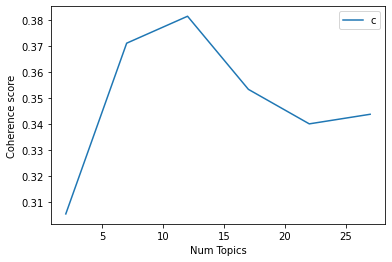

In [97]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score4)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [184]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score4):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 12

index: 0 | Num Topics = 2  has Coherence Value of 0.3055
index: 1 | Num Topics = 7  has Coherence Value of 0.3711
index: 2 | Num Topics = 12  has Coherence Value of 0.3814
index: 3 | Num Topics = 17  has Coherence Value of 0.3533
index: 4 | Num Topics = 22  has Coherence Value of 0.3401
index: 5 | Num Topics = 27  has Coherence Value of 0.3438


In [185]:
# Select optimal number of topics
optimal_model_us_score4 = model_list_us_score4[2]

In [186]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score4 = pyLDAvis.gensim_models.prepare(optimal_model_us_score4, corpus_us_score4, id2word_us_score4)

In [187]:
print("pyLDAVis for us topics for score=4:")
vis_us_score4

pyLDAVis for us topics for score=4:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.235165  0.000055       1        1  20.988994
3     -0.166608  0.020539       2        1  15.205956
10    -0.048959 -0.068987       3        1  13.984334
11    -0.013085 -0.070122       4        1  13.514569
2      0.005412  0.130969       5        1   6.876766
8     -0.182076  0.057043       6        1   6.629876
5     -0.033026 -0.014376       7        1   6.565560
0      0.118205  0.215568       8        1   6.269089
6      0.089285 -0.180202       9        1   4.103116
4      0.083169 -0.165793      10        1   3.110091
9      0.174343  0.086706      11        1   2.374704
1      0.208505 -0.011400      12        1   0.376944, topic_info=         Term        Freq       Total Category  logprob  loglift
150     story  405.000000  405.000000  Default  30.0000  30.0000
108     video  219.000000  219.000000  Default  29.0000  29.0000
245   account  267.000000  267.000000  Default  28.0000  28.0000
55     change  290.000000  290.000000  Default  27.0000  27.0000
49       snap  663.000000  663.000000  Default  26.0000  26.0000
...       ...         ...         ...      ...      ...      ...
199    appear    0.344488   13.287217  Topic12  -6.1045   1.9283
853   require    0.344488    2.917851  Topic12  -6.1045   3.4443
1851   manage    0.344487    4.623447  Topic12  -6.1045   2.9840
2202    crowd    0.344487    1.718767  Topic12  -6.1045   3.9735
2205     menu    0.344487    2.244023  Topic12  -6.1045   3.7069

[777 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
86        1  0.171451   able
86        2  0.138114   able
86        3  0.123826   able
86        4  0.371478   able
86        5  0.038100   able
...     ...       ...    ...
53        8  0.064817   year
53        9  0.134264   year
53       10  0.041668   year
554       9  0.904832  young
29        3  0.872888   zoom

[1242 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 4, 11, 12, 3, 9, 6, 1, 7, 5, 10, 2])

## LDA Topic Modelling (Rating = 5)

In [102]:
# By-rating Topic Modelling - rating = 5
# Convert to list - move to each section
review_us_score5 = snapchat_ios_us_review_YearMonth_score5.review.values.tolist()
review_words_us_score5 = list(sent_to_words(review_us_score5))
print(review_words_us_score5[:1])

[['think', 'that', 'snapchat', 'is', 'wonderful', 'app', 'that', 'helps', 'you', 'communicate', 'efficiently', 'and', 'quickly', 'snapchat', 'also', 'offers', 'range', 'of', 'cool', 'filters', 'that', 'allow', 'some', 'fun', 'in', 'this', 'messaging', 'app', 'snapchat', 'is', 'super', 'safe', 'because', 'you', 'can', 'message', 'anyone', 'unless', 'you', 'request', 'to', 'follow', 'them', 'and', 'they', 'request', 'to', 'follow', 'you', 'even', 'then', 'you', 'have', 'to', 'accept', 'you', 'can', 'express', 'yourself', 'through', 'bitmoji', 'which', 'you', 'can', 'design', 'and', 'way', 'you', 'like', 'all', 'and', 'all', 'think', 'that', 'snapchat', 'is', 'an', 'amazing', 'app', 'to', 'share', 'creativity', 'with', 'your', 'friends', 'efficiently']]


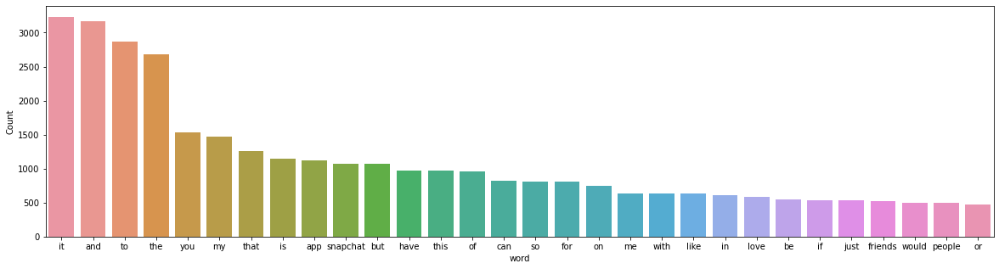

In [103]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score5))

In [104]:
# Clean text
review_us_ready_score5 = process_words(review_words_us_score5)  # processed Text Data! - move to each section

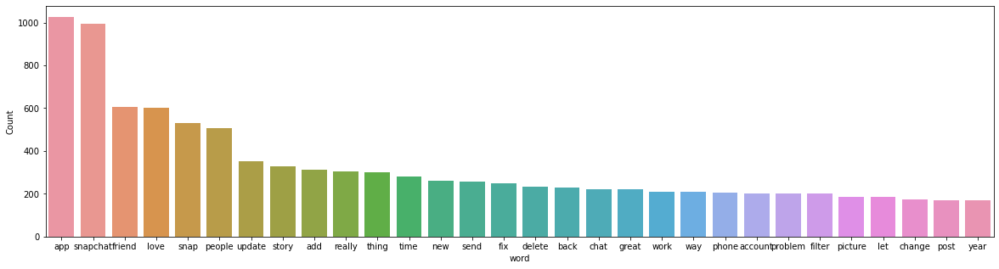

In [105]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score5))


In [106]:
# Create Dictionary
id2word_us_score5 = corpora.Dictionary(review_us_ready_score5)

2021-10-16 22:46:01,784 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 22:46:01,912 [INFO] gensim.corpora.dictionary - built Dictionary(2462 unique tokens: ['accept', 'allow', 'amazing', 'app', 'bitmoji']...) from 874 documents (total 29627 corpus positions)
2021-10-16 22:46:01,914 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(2462 unique tokens: ['accept', 'allow', 'amazing', 'app', 'bitmoji']...) from 874 documents (total 29627 corpus positions)", 'datetime': '2021-10-16T22:46:01.914610', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [107]:
# Create Corpus: Term Document Frequency
corpus_us_score5 = [id2word_us_score5.doc2bow(text) for text in review_us_ready_score5]

In [108]:
# Training LDA model
model_list_us_score5, coherence_values_us_score5 = compute_coherence_values(dictionary=id2word_us_score5, corpus=corpus_us_score5, 
                                                              texts=review_us_ready_score5, limit=30, start=2, step=5)


2021-10-16 22:46:02,056 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 22:46:02,058 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 22:46:02,062 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 22:46:02,067 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 874 documents, updating model once every 874 documents, evaluating perplexity every 874 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 22:46:06,275 [INFO] gensim.models.ldamodel - -8.285 per-word bound, 311.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:46:06,276 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #874/874
2021-10-16 22:46:10,660 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.033*"snapchat" + 0.022*"friend" + 0.017*"snap" + 0.016*"people" + 0.015*"love" + 0.010*

2021-10-16 22:47:05,025 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.023*"love" + 0.021*"story" + 0.020*"app" + 0.018*"people" + 0.016*"friend" + 0.015*"update" + 0.015*"snap" + 0.015*"add" + 0.013*"post"
2021-10-16 22:47:05,026 [INFO] gensim.models.ldamodel - topic diff=0.026937, rho=0.301511
2021-10-16 22:47:08,361 [INFO] gensim.models.ldamodel - -6.340 per-word bound, 81.0 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:47:08,391 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #874/874
2021-10-16 22:47:10,541 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"app" + 0.035*"snapchat" + 0.021*"friend" + 0.018*"snap" + 0.016*"love" + 0.014*"people" + 0.011*"time" + 0.011*"send" + 0.011*"fix" + 0.011*"really"
2021-10-16 22:47:10,543 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.023*"love" + 0.021*"story" + 0.020*"app" + 0.019*"people" + 0.016*"friend" + 0.015*"add" + 0.

2021-10-16 22:47:58,469 [INFO] gensim.models.ldamodel - topic diff=0.015337, rho=0.218218
2021-10-16 22:48:01,929 [INFO] gensim.models.ldamodel - -6.325 per-word bound, 80.2 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:48:01,931 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #874/874
2021-10-16 22:48:03,991 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.035*"snapchat" + 0.020*"friend" + 0.018*"snap" + 0.015*"love" + 0.012*"people" + 0.012*"fix" + 0.012*"send" + 0.011*"time" + 0.011*"delete"
2021-10-16 22:48:03,994 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.024*"snapchat" + 0.024*"love" + 0.022*"story" + 0.021*"app" + 0.021*"people" + 0.018*"friend" + 0.017*"add" + 0.014*"snap" + 0.013*"update" + 0.013*"post"
2021-10-16 22:48:03,996 [INFO] gensim.models.ldamodel - topic diff=0.014682, rho=0.213201
2021-10-16 22:48:07,029 [INFO] gensim.models.ldamodel - -6.324 per-word bound, 80.1 perplexity est

2021-10-16 22:48:48,050 [INFO] gensim.models.ldamodel - -6.318 per-word bound, 79.8 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:48:48,051 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #874/874
2021-10-16 22:48:49,907 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.036*"snapchat" + 0.019*"friend" + 0.019*"snap" + 0.015*"love" + 0.012*"fix" + 0.012*"send" + 0.012*"people" + 0.011*"time" + 0.011*"delete"
2021-10-16 22:48:49,908 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.024*"love" + 0.024*"snapchat" + 0.022*"people" + 0.022*"app" + 0.021*"story" + 0.019*"add" + 0.019*"friend" + 0.013*"snap" + 0.013*"post" + 0.012*"update"
2021-10-16 22:48:49,910 [INFO] gensim.models.ldamodel - topic diff=0.010818, rho=0.176777
2021-10-16 22:48:52,128 [INFO] gensim.models.ldamodel - -6.318 per-word bound, 79.8 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:48:52,129

2021-10-16 22:49:31,071 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #874/874
2021-10-16 22:49:32,829 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.036*"snapchat" + 0.019*"snap" + 0.018*"friend" + 0.015*"love" + 0.013*"fix" + 0.012*"send" + 0.012*"delete" + 0.011*"back" + 0.011*"time"
2021-10-16 22:49:32,830 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.024*"love" + 0.024*"snapchat" + 0.023*"app" + 0.023*"people" + 0.020*"story" + 0.020*"friend" + 0.020*"add" + 0.013*"snap" + 0.012*"post" + 0.012*"thing"
2021-10-16 22:49:32,833 [INFO] gensim.models.ldamodel - topic diff=0.007786, rho=0.154303
2021-10-16 22:49:35,087 [INFO] gensim.models.ldamodel - -6.314 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:49:35,088 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #874/874
2021-10-16 22:49:36,569 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.039*"app" + 0.036*"

2021-10-16 22:50:11,260 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 22:50:17,584 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 22:50:17,634 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 874 virtual documents
2021-10-16 22:50:17,944 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-16 22:50:17,945 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-16 22:50:17,951 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 22:50:17,957 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 874 documents, updating model once every 874 documents, evaluating perplexity every 874 documents, iterating 50x with a con

2021-10-16 22:50:44,269 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.022*"love" + 0.020*"add" + 0.019*"app" + 0.018*"snapchat" + 0.018*"friend" + 0.017*"post" + 0.016*"update" + 0.015*"story" + 0.012*"thing" + 0.010*"guy"
2021-10-16 22:50:44,270 [INFO] gensim.models.ldamodel - topic diff=0.137423, rho=0.408248
2021-10-16 22:50:46,767 [INFO] gensim.models.ldamodel - -6.505 per-word bound, 90.8 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:50:46,768 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #874/874
2021-10-16 22:50:48,401 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.053*"app" + 0.030*"friend" + 0.028*"snapchat" + 0.014*"snap" + 0.013*"problem" + 0.012*"fix" + 0.012*"work" + 0.011*"phone" + 0.011*"send" + 0.011*"camera"
2021-10-16 22:50:48,403 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.022*"love" + 0.021*"add" + 0.018*"app" + 0.018*"post" + 0.017*"snapchat" + 0.017*"friend" + 0.016*"update" + 0.01

2021-10-16 22:51:05,831 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.039*"people" + 0.030*"snapchat" + 0.029*"app" + 0.020*"love" + 0.019*"mode" + 0.018*"dark" + 0.016*"filter" + 0.015*"update" + 0.014*"add" + 0.013*"time"
2021-10-16 22:51:05,833 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"story" + 0.033*"snapchat" + 0.026*"snap" + 0.023*"friend" + 0.020*"post" + 0.019*"chat" + 0.018*"love" + 0.014*"app" + 0.014*"change" + 0.013*"people"
2021-10-16 22:51:05,835 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.055*"app" + 0.030*"snapchat" + 0.026*"friend" + 0.017*"work" + 0.015*"fix" + 0.014*"snap" + 0.014*"problem" + 0.013*"delete" + 0.013*"phone" + 0.012*"let"
2021-10-16 22:51:05,837 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.033*"app" + 0.028*"snapchat" + 0.022*"update" + 0.019*"love" + 0.018*"snap" + 0.014*"fix" + 0.013*"friend" + 0.011*"chat" + 0.011*"game" + 0.011*"people"
2021-10-16 22:51:05,839 [INFO] gensim.models.ldamodel - topic diff=0.044882, 

2021-10-16 22:51:25,287 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.034*"snap" + 0.027*"snapchat" + 0.022*"account" + 0.017*"send" + 0.017*"people" + 0.015*"app" + 0.014*"back" + 0.013*"add" + 0.013*"streak" + 0.013*"friend"
2021-10-16 22:51:25,288 [INFO] gensim.models.ldamodel - topic diff=0.027159, rho=0.242536
2021-10-16 22:51:27,692 [INFO] gensim.models.ldamodel - -6.446 per-word bound, 87.2 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:51:27,694 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #874/874
2021-10-16 22:51:29,696 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.041*"people" + 0.029*"snapchat" + 0.028*"app" + 0.020*"mode" + 0.020*"love" + 0.019*"dark" + 0.016*"filter" + 0.016*"add" + 0.014*"update" + 0.013*"time"
2021-10-16 22:51:29,698 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"story" + 0.032*"snapchat" + 0.026*"snap" + 0.023*"post" + 0.023*"friend" + 0.021*"chat" + 0.018*"love" + 

2021-10-16 22:51:47,497 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"people" + 0.028*"snapchat" + 0.027*"app" + 0.021*"mode" + 0.020*"love" + 0.020*"dark" + 0.016*"add" + 0.015*"filter" + 0.014*"update" + 0.012*"time"
2021-10-16 22:51:47,498 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.050*"story" + 0.031*"snapchat" + 0.026*"snap" + 0.025*"post" + 0.022*"friend" + 0.021*"chat" + 0.018*"love" + 0.013*"people" + 0.013*"change" + 0.013*"thing"
2021-10-16 22:51:47,501 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.054*"app" + 0.032*"snapchat" + 0.022*"work" + 0.021*"friend" + 0.019*"fix" + 0.016*"delete" + 0.016*"snap" + 0.016*"problem" + 0.015*"let" + 0.014*"phone"
2021-10-16 22:51:47,503 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.025*"add" + 0.016*"post" + 0.014*"love" + 0.014*"app" + 0.012*"guy" + 0.012*"update" + 0.011*"hair" + 0.010*"friend" + 0.010*"thing" + 0.009*"snapchat"
2021-10-16 22:51:47,504 [INFO] gensim.models.ldamodel - topic diff=0.019007, 

2021-10-16 22:52:05,565 [INFO] gensim.models.ldamodel - topic diff=0.015183, rho=0.188982
2021-10-16 22:52:07,672 [INFO] gensim.models.ldamodel - -6.425 per-word bound, 85.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:52:07,675 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #874/874
2021-10-16 22:52:09,224 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.033*"snap" + 0.030*"account" + 0.026*"snapchat" + 0.017*"people" + 0.017*"send" + 0.015*"streak" + 0.015*"back" + 0.013*"add" + 0.013*"log" + 0.012*"app"
2021-10-16 22:52:09,227 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.047*"app" + 0.047*"snapchat" + 0.039*"love" + 0.037*"friend" + 0.018*"filter" + 0.015*"thing" + 0.014*"fun" + 0.013*"way" + 0.013*"really" + 0.013*"great"
2021-10-16 22:52:09,235 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.025*"add" + 0.015*"post" + 0.013*"app" + 0.013*"guy" + 0.013*"hair" + 0.011*"update" + 0.010*"love" + 0.010*"day

2021-10-16 22:52:25,707 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.033*"snap" + 0.032*"account" + 0.026*"snapchat" + 0.017*"people" + 0.017*"send" + 0.016*"streak" + 0.015*"back" + 0.013*"add" + 0.013*"log" + 0.012*"new"
2021-10-16 22:52:25,709 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.026*"update" + 0.025*"app" + 0.022*"snapchat" + 0.019*"snap" + 0.019*"love" + 0.014*"new" + 0.013*"chat" + 0.012*"bug" + 0.011*"game" + 0.010*"open"
2021-10-16 22:52:25,710 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.054*"app" + 0.034*"snapchat" + 0.023*"work" + 0.022*"fix" + 0.019*"friend" + 0.017*"snap" + 0.017*"problem" + 0.016*"delete" + 0.016*"let" + 0.015*"phone"
2021-10-16 22:52:25,711 [INFO] gensim.models.ldamodel - topic diff=0.012397, rho=0.171499
2021-10-16 22:52:27,725 [INFO] gensim.models.ldamodel - -6.417 per-word bound, 85.4 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:52:27,727 [INFO] gensim.models.ldamodel - PRO

2021-10-16 22:52:44,807 [INFO] gensim.models.ldamodel - -6.412 per-word bound, 85.2 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:52:44,811 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #874/874
2021-10-16 22:52:46,523 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.034*"account" + 0.033*"snap" + 0.026*"snapchat" + 0.017*"send" + 0.017*"people" + 0.016*"streak" + 0.015*"back" + 0.013*"add" + 0.013*"log" + 0.013*"new"
2021-10-16 22:52:46,525 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"people" + 0.027*"snapchat" + 0.026*"app" + 0.023*"mode" + 0.021*"dark" + 0.021*"love" + 0.017*"add" + 0.014*"filter" + 0.014*"update" + 0.013*"time"
2021-10-16 22:52:46,527 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.027*"update" + 0.023*"app" + 0.021*"snapchat" + 0.020*"snap" + 0.019*"love" + 0.014*"new" + 0.013*"chat" + 0.012*"bug" + 0.011*"open" + 0.011*"color"
2021-10-16 22:52:46,528 [INFO] gensim.models.ldamodel

2021-10-16 22:53:02,140 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"people" + 0.026*"snapchat" + 0.025*"app" + 0.023*"mode" + 0.021*"dark" + 0.021*"love" + 0.017*"add" + 0.014*"filter" + 0.013*"update" + 0.013*"time"
2021-10-16 22:53:02,141 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.054*"app" + 0.034*"snapchat" + 0.024*"work" + 0.023*"fix" + 0.018*"snap" + 0.018*"problem" + 0.017*"friend" + 0.017*"delete" + 0.016*"let" + 0.016*"phone"
2021-10-16 22:53:02,143 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.027*"add" + 0.014*"hair" + 0.014*"guy" + 0.011*"post" + 0.010*"update" + 0.009*"day" + 0.009*"app" + 0.009*"look" + 0.008*"option" + 0.008*"bitmoji"
2021-10-16 22:53:02,144 [INFO] gensim.models.ldamodel - topic diff=0.008560, rho=0.149071
2021-10-16 22:53:03,897 [INFO] gensim.models.ldamodel - -6.407 per-word bound, 84.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:53:03,898 [INFO] gensim.models.ldamodel - PRO

2021-10-16 22:53:19,092 [INFO] gensim.models.ldamodel - -6.404 per-word bound, 84.7 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:53:19,094 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #874/874
2021-10-16 22:53:20,326 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"people" + 0.026*"snapchat" + 0.025*"app" + 0.023*"mode" + 0.022*"dark" + 0.020*"love" + 0.017*"add" + 0.014*"filter" + 0.013*"update" + 0.013*"time"
2021-10-16 22:53:20,328 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.037*"account" + 0.033*"snap" + 0.026*"snapchat" + 0.017*"streak" + 0.016*"send" + 0.016*"people" + 0.016*"back" + 0.013*"log" + 0.013*"add" + 0.013*"new"
2021-10-16 22:53:20,331 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.027*"add" + 0.015*"hair" + 0.014*"guy" + 0.010*"post" + 0.009*"day" + 0.009*"update" + 0.009*"look" + 0.009*"option" + 0.008*"app" + 0.008*"show"
2021-10-16 22:53:20,333 [INFO] gensim.models.ldamodel - t

2021-10-16 22:53:42,300 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.038*"snap" + 0.029*"send" + 0.028*"app" + 0.024*"snapchat" + 0.018*"people" + 0.016*"streak" + 0.015*"phone" + 0.015*"friend" + 0.012*"back" + 0.012*"love"
2021-10-16 22:53:42,304 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.041*"app" + 0.024*"snapchat" + 0.023*"time" + 0.018*"log" + 0.018*"phone" + 0.016*"snap" + 0.015*"connection" + 0.014*"open" + 0.013*"update" + 0.012*"problem"
2021-10-16 22:53:42,307 [INFO] gensim.models.ldamodel - topic diff=0.240364, rho=0.447214
2021-10-16 22:53:44,282 [INFO] gensim.models.ldamodel - -6.611 per-word bound, 97.7 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:53:44,283 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #874/874
2021-10-16 22:53:45,807 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.027*"snapchat" + 0.027*"snap" + 0.023*"app" + 0.023*"add" + 0.021*"mode" + 0.020*"love" + 0.020*"update" +

2021-10-16 22:54:02,549 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #874/874
2021-10-16 22:54:04,287 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.042*"snap" + 0.037*"send" + 0.027*"app" + 0.027*"streak" + 0.022*"snapchat" + 0.019*"people" + 0.016*"friend" + 0.015*"phone" + 0.012*"back" + 0.012*"day"
2021-10-16 22:54:04,288 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.061*"snapchat" + 0.028*"app" + 0.026*"account" + 0.023*"friend" + 0.017*"love" + 0.016*"log" + 0.013*"fix" + 0.012*"back" + 0.012*"update" + 0.011*"let"
2021-10-16 22:54:04,290 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.043*"snapchat" + 0.037*"love" + 0.035*"app" + 0.017*"much" + 0.017*"friend" + 0.012*"thing" + 0.011*"well" + 0.010*"download" + 0.009*"great" + 0.009*"year"
2021-10-16 22:54:04,292 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"people" + 0.039*"app" + 0.031*"filter" + 0.020*"love" + 0.019*"snapchat" + 0.011*"feature" + 0.011*"amazing" + 0.010*"call" + 0.010

2021-10-16 22:54:22,432 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.029*"mode" + 0.028*"dark" + 0.027*"snapchat" + 0.027*"snap" + 0.025*"add" + 0.021*"update" + 0.021*"people" + 0.020*"app" + 0.019*"change" + 0.018*"love"
2021-10-16 22:54:22,440 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"people" + 0.038*"app" + 0.032*"filter" + 0.020*"love" + 0.017*"snapchat" + 0.012*"call" + 0.011*"amazing" + 0.011*"feature" + 0.010*"favorite" + 0.009*"add"
2021-10-16 22:54:22,441 [INFO] gensim.models.ldamodel - topic diff=0.036912, rho=0.250000
2021-10-16 22:54:24,972 [INFO] gensim.models.ldamodel - -6.513 per-word bound, 91.4 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:54:24,974 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #874/874
2021-10-16 22:54:26,496 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.044*"app" + 0.034*"friend" + 0.027*"snapchat" + 0.020*"camera" + 0.015*"love" + 0.014*"send" + 0.013*"sta

2021-10-16 22:54:43,673 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #874/874
2021-10-16 22:54:45,025 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.053*"story" + 0.031*"snap" + 0.029*"app" + 0.018*"post" + 0.016*"snapchat" + 0.016*"update" + 0.014*"fix" + 0.013*"love" + 0.013*"people" + 0.013*"really"
2021-10-16 22:54:45,026 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.031*"mode" + 0.029*"dark" + 0.028*"snapchat" + 0.027*"snap" + 0.026*"add" + 0.022*"people" + 0.022*"update" + 0.021*"change" + 0.020*"app" + 0.018*"love"
2021-10-16 22:54:45,028 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.044*"app" + 0.034*"friend" + 0.028*"snapchat" + 0.023*"camera" + 0.015*"love" + 0.014*"send" + 0.013*"start" + 0.012*"problem" + 0.012*"game" + 0.012*"picture"
2021-10-16 22:54:45,029 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.061*"snapchat" + 0.031*"account" + 0.027*"app" + 0.021*"friend" + 0.016*"log" + 0.016*"love" + 0.014*"back" + 0.012*"fix" + 0.012*

2021-10-16 22:55:03,082 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.057*"app" + 0.038*"work" + 0.031*"snapchat" + 0.026*"time" + 0.025*"phone" + 0.023*"delete" + 0.021*"open" + 0.021*"fix" + 0.021*"update" + 0.021*"problem"
2021-10-16 22:55:03,088 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.061*"snapchat" + 0.032*"account" + 0.025*"app" + 0.020*"friend" + 0.017*"log" + 0.016*"love" + 0.014*"back" + 0.012*"new" + 0.012*"fix" + 0.012*"really"
2021-10-16 22:55:03,091 [INFO] gensim.models.ldamodel - topic diff=0.016749, rho=0.192450
2021-10-16 22:55:05,251 [INFO] gensim.models.ldamodel - -6.487 per-word bound, 89.7 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:55:05,255 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #874/874
2021-10-16 22:55:06,891 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.056*"story" + 0.032*"snap" + 0.027*"app" + 0.020*"post" + 0.016*"snapchat" + 0.015*"update" + 0.014*"fix" + 0.0

2021-10-16 22:55:26,027 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #874/874
2021-10-16 22:55:27,591 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.058*"app" + 0.038*"work" + 0.032*"snapchat" + 0.026*"time" + 0.025*"phone" + 0.025*"delete" + 0.022*"fix" + 0.022*"problem" + 0.022*"open" + 0.021*"update"
2021-10-16 22:55:27,616 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.043*"people" + 0.035*"filter" + 0.034*"app" + 0.020*"love" + 0.014*"call" + 0.013*"snapchat" + 0.012*"amazing" + 0.012*"favorite" + 0.011*"social" + 0.011*"medium"
2021-10-16 22:55:27,634 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.048*"friend" + 0.045*"app" + 0.041*"love" + 0.035*"snapchat" + 0.028*"people" + 0.023*"filter" + 0.016*"thing" + 0.016*"add" + 0.016*"really" + 0.015*"fun"
2021-10-16 22:55:27,636 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.043*"snapchat" + 0.036*"love" + 0.032*"app" + 0.018*"much" + 0.017*"friend" + 0.012*"thing" + 0.012*"well" + 0.011*"ever" +

2021-10-16 22:55:43,675 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.043*"app" + 0.032*"friend" + 0.029*"camera" + 0.028*"snapchat" + 0.015*"love" + 0.015*"send" + 0.014*"picture" + 0.014*"start" + 0.012*"game" + 0.012*"problem"
2021-10-16 22:55:43,676 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.058*"story" + 0.033*"snap" + 0.025*"app" + 0.021*"post" + 0.016*"snapchat" + 0.015*"update" + 0.014*"fix" + 0.014*"show" + 0.014*"love" + 0.014*"people"
2021-10-16 22:55:43,680 [INFO] gensim.models.ldamodel - topic diff=0.010265, rho=0.162221
2021-10-16 22:55:45,785 [INFO] gensim.models.ldamodel - -6.474 per-word bound, 88.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:55:45,786 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #874/874
2021-10-16 22:55:47,305 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.032*"mode" + 0.030*"dark" + 0.028*"snapchat" + 0.027*"snap" + 0.027*"add" + 0.023*"change" + 0.022*"people"

2021-10-16 22:56:02,903 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #874/874
2021-10-16 22:56:04,587 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.043*"app" + 0.032*"friend" + 0.030*"camera" + 0.028*"snapchat" + 0.015*"send" + 0.015*"love" + 0.014*"picture" + 0.014*"start" + 0.013*"game" + 0.012*"problem"
2021-10-16 22:56:04,596 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"people" + 0.035*"filter" + 0.033*"app" + 0.020*"love" + 0.015*"social" + 0.015*"medium" + 0.015*"call" + 0.013*"favorite" + 0.012*"snapchat" + 0.012*"amazing"
2021-10-16 22:56:04,598 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.032*"mode" + 0.031*"dark" + 0.028*"snapchat" + 0.027*"snap" + 0.027*"add" + 0.023*"change" + 0.023*"people" + 0.022*"update" + 0.020*"app" + 0.018*"love"
2021-10-16 22:56:04,601 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.059*"app" + 0.038*"work" + 0.033*"snapchat" + 0.027*"delete" + 0.026*"time" + 0.025*"phone" + 0.024*"fix" + 0.023*"problem

2021-10-16 22:56:22,692 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.060*"story" + 0.033*"snap" + 0.024*"app" + 0.021*"post" + 0.016*"snapchat" + 0.015*"update" + 0.015*"show" + 0.014*"fix" + 0.014*"love" + 0.014*"people"
2021-10-16 22:56:22,698 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.042*"app" + 0.031*"friend" + 0.031*"camera" + 0.028*"snapchat" + 0.015*"send" + 0.015*"love" + 0.014*"picture" + 0.014*"start" + 0.013*"game" + 0.012*"problem"
2021-10-16 22:56:22,705 [INFO] gensim.models.ldamodel - topic diff=0.006741, rho=0.142857
2021-10-16 22:56:24,778 [INFO] gensim.models.ldamodel - -6.467 per-word bound, 88.4 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:56:24,779 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #874/874
2021-10-16 22:56:26,068 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.032*"mode" + 0.031*"dark" + 0.028*"add" + 0.028*"snapchat" + 0.027*"snap" + 0.024*"change" + 0.023*"people"

2021-10-16 22:56:53,309 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.035*"app" + 0.032*"account" + 0.030*"snapchat" + 0.014*"picture" + 0.014*"people" + 0.013*"add" + 0.012*"new" + 0.012*"delete" + 0.012*"let" + 0.011*"snap"
2021-10-16 22:56:53,314 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.050*"app" + 0.034*"friend" + 0.021*"snapchat" + 0.015*"game" + 0.015*"snap" + 0.014*"send" + 0.012*"time" + 0.011*"phone" + 0.010*"love" + 0.010*"problem"
2021-10-16 22:56:53,326 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.027*"snap" + 0.027*"send" + 0.026*"snapchat" + 0.018*"people" + 0.017*"app" + 0.017*"friend" + 0.014*"show" + 0.014*"back" + 0.013*"feature" + 0.012*"love"
2021-10-16 22:56:53,331 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.040*"friend" + 0.032*"love" + 0.031*"people" + 0.021*"app" + 0.021*"snapchat" + 0.018*"snap" + 0.016*"new" + 0.014*"time" + 0.014*"story" + 0.012*"filter"
2021-10-16 22:56:53,345 [INFO] gensim.models.ldamodel - topic #14 (0.059

2021-10-16 22:57:11,792 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.027*"app" + 0.021*"fix" + 0.020*"bug" + 0.019*"update" + 0.019*"open" + 0.019*"snap" + 0.013*"snapchat" + 0.013*"way" + 0.012*"message" + 0.012*"love"
2021-10-16 22:57:11,795 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.031*"add" + 0.029*"snap" + 0.029*"people" + 0.029*"update" + 0.025*"love" + 0.022*"snapchat" + 0.016*"app" + 0.016*"new" + 0.016*"friend" + 0.014*"able"
2021-10-16 22:57:11,796 [INFO] gensim.models.ldamodel - topic diff=0.125663, rho=0.333333
2021-10-16 22:57:14,159 [INFO] gensim.models.ldamodel - -6.650 per-word bound, 100.4 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:57:14,160 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #874/874
2021-10-16 22:57:15,806 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.022*"organize" + 0.019*"message" + 0.016*"love" + 0.012*"thing" + 0.010*"video" + 0.009*"snapchat" + 0.009*"add" + 0.

2021-10-16 22:57:32,992 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #874/874
2021-10-16 22:57:34,654 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"app" + 0.040*"snapchat" + 0.026*"delete" + 0.021*"phone" + 0.018*"snap" + 0.018*"problem" + 0.018*"fix" + 0.016*"log" + 0.016*"back" + 0.015*"let"
2021-10-16 22:57:34,655 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.031*"add" + 0.031*"update" + 0.031*"people" + 0.029*"snap" + 0.026*"love" + 0.024*"snapchat" + 0.022*"mode" + 0.020*"dark" + 0.017*"app" + 0.017*"new"
2021-10-16 22:57:34,657 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.027*"organize" + 0.020*"message" + 0.012*"love" + 0.012*"thing" + 0.009*"app" + 0.009*"video" + 0.009*"ban" + 0.008*"year" + 0.008*"however" + 0.008*"well"
2021-10-16 22:57:34,659 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.037*"app" + 0.034*"snapchat" + 0.026*"love" + 0.019*"friend" + 0.014*"much" + 0.014*"mom" + 0.014*"phone" + 0.013*"text" + 0.013*"bitmoji" +

2021-10-16 22:57:52,597 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.061*"app" + 0.041*"snapchat" + 0.028*"delete" + 0.021*"phone" + 0.020*"fix" + 0.019*"problem" + 0.018*"snap" + 0.017*"log" + 0.016*"work" + 0.016*"let"
2021-10-16 22:57:52,599 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.040*"story" + 0.028*"snap" + 0.027*"private" + 0.021*"video" + 0.018*"snapchat" + 0.018*"save" + 0.017*"add" + 0.017*"message" + 0.017*"send" + 0.017*"picture"
2021-10-16 22:57:52,604 [INFO] gensim.models.ldamodel - topic diff=0.029983, rho=0.223607
2021-10-16 22:57:54,610 [INFO] gensim.models.ldamodel - -6.588 per-word bound, 96.2 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:57:54,614 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #874/874
2021-10-16 22:57:56,006 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.030*"organize" + 0.022*"message" + 0.012*"thing" + 0.010*"love" + 0.009*"ban" + 0.009*"app" + 0.009*"well" +

2021-10-16 22:58:12,498 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #874/874
2021-10-16 22:58:13,913 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.021*"open" + 0.021*"bug" + 0.021*"update" + 0.020*"fix" + 0.019*"app" + 0.018*"snap" + 0.015*"slide" + 0.014*"message" + 0.013*"way" + 0.011*"little"
2021-10-16 22:58:13,915 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.041*"snapchat" + 0.036*"app" + 0.025*"really" + 0.021*"friend" + 0.020*"update" + 0.015*"way" + 0.015*"thing" + 0.015*"love" + 0.014*"great" + 0.013*"well"
2021-10-16 22:58:13,916 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.066*"account" + 0.025*"snapchat" + 0.025*"app" + 0.017*"new" + 0.017*"lock" + 0.015*"picture" + 0.014*"add" + 0.013*"delete" + 0.013*"memory" + 0.011*"save"
2021-10-16 22:58:13,918 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.033*"update" + 0.033*"mode" + 0.031*"people" + 0.031*"add" + 0.030*"dark" + 0.029*"snap" + 0.025*"snapchat" + 0.025*"love" + 0.017*"app

2021-10-16 22:58:29,675 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.065*"app" + 0.042*"snapchat" + 0.031*"delete" + 0.024*"fix" + 0.022*"phone" + 0.021*"work" + 0.020*"problem" + 0.019*"snap" + 0.017*"log" + 0.017*"let"
2021-10-16 22:58:29,676 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.053*"app" + 0.040*"friend" + 0.020*"game" + 0.020*"camera" + 0.020*"start" + 0.018*"snapchat" + 0.018*"snap" + 0.015*"send" + 0.014*"bug" + 0.014*"play"
2021-10-16 22:58:29,677 [INFO] gensim.models.ldamodel - topic diff=0.016616, rho=0.179605
2021-10-16 22:58:31,354 [INFO] gensim.models.ldamodel - -6.561 per-word bound, 94.4 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:58:31,356 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #874/874
2021-10-16 22:58:32,791 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.065*"snapchat" + 0.032*"app" + 0.027*"friend" + 0.025*"love" + 0.016*"great" + 0.016*"change" + 0.015*"add" + 0.015

2021-10-16 22:58:45,769 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #874/874
2021-10-16 22:58:47,005 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.049*"snapchat" + 0.026*"post" + 0.021*"friend" + 0.020*"story" + 0.015*"camera" + 0.014*"people" + 0.013*"let" + 0.013*"account" + 0.010*"video" + 0.010*"thing"
2021-10-16 22:58:47,014 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.035*"mode" + 0.034*"update" + 0.033*"dark" + 0.032*"people" + 0.030*"add" + 0.028*"snap" + 0.026*"snapchat" + 0.024*"love" + 0.016*"app" + 0.016*"friend"
2021-10-16 22:58:47,018 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.066*"app" + 0.042*"snapchat" + 0.032*"delete" + 0.025*"fix" + 0.023*"work" + 0.022*"phone" + 0.020*"problem" + 0.019*"snap" + 0.018*"log" + 0.017*"let"
2021-10-16 22:58:47,024 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.043*"send" + 0.039*"streak" + 0.037*"snap" + 0.027*"snapchat" + 0.023*"people" + 0.022*"back" + 0.020*"friend" + 0.018*"lose" + 0.0

2021-10-16 22:59:01,547 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.066*"app" + 0.042*"snapchat" + 0.032*"delete" + 0.025*"fix" + 0.024*"work" + 0.022*"phone" + 0.020*"problem" + 0.019*"snap" + 0.018*"log" + 0.017*"let"
2021-10-16 22:59:01,549 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.080*"account" + 0.023*"snapchat" + 0.021*"lock" + 0.021*"app" + 0.018*"new" + 0.015*"picture" + 0.015*"memory" + 0.014*"add" + 0.012*"save" + 0.012*"delete"
2021-10-16 22:59:01,550 [INFO] gensim.models.ldamodel - topic diff=0.011018, rho=0.154303
2021-10-16 22:59:03,189 [INFO] gensim.models.ldamodel - -6.546 per-word bound, 93.4 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:59:03,193 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #874/874
2021-10-16 22:59:04,550 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.039*"snapchat" + 0.036*"app" + 0.026*"really" + 0.020*"update" + 0.019*"friend" + 0.015*"way" + 0.015*"thing"

2021-10-16 22:59:17,614 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #874/874
2021-10-16 22:59:18,858 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.022*"update" + 0.022*"bug" + 0.022*"open" + 0.019*"fix" + 0.017*"slide" + 0.017*"snap" + 0.015*"message" + 0.014*"app" + 0.013*"way" + 0.011*"annoying"
2021-10-16 22:59:18,860 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.065*"snapchat" + 0.031*"app" + 0.027*"friend" + 0.026*"love" + 0.017*"change" + 0.017*"great" + 0.016*"add" + 0.015*"people" + 0.013*"really" + 0.013*"log"
2021-10-16 22:59:18,862 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.060*"friend" + 0.041*"love" + 0.040*"app" + 0.034*"people" + 0.028*"snapchat" + 0.025*"filter" + 0.018*"fun" + 0.018*"game" + 0.014*"add" + 0.013*"thing"
2021-10-16 22:59:18,864 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.038*"snapchat" + 0.029*"app" + 0.017*"time" + 0.015*"video" + 0.014*"problem" + 0.013*"back" + 0.012*"well" + 0.011*"record" + 0.011*"cha

2021-10-16 22:59:40,785 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.046*"app" + 0.026*"friend" + 0.019*"snapchat" + 0.016*"story" + 0.015*"thing" + 0.013*"way" + 0.013*"game" + 0.012*"really" + 0.012*"love" + 0.011*"phone"
2021-10-16 22:59:40,787 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.031*"app" + 0.021*"snapchat" + 0.020*"snap" + 0.016*"fix" + 0.016*"love" + 0.014*"open" + 0.014*"bug" + 0.013*"way" + 0.012*"update" + 0.012*"slide"
2021-10-16 22:59:40,788 [INFO] gensim.models.ldamodel - topic diff=15.854553, rho=1.000000
2021-10-16 22:59:42,799 [INFO] gensim.models.ldamodel - -7.044 per-word bound, 131.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 22:59:42,800 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #874/874
2021-10-16 22:59:44,189 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.038*"people" + 0.033*"friend" + 0.029*"love" + 0.026*"snapchat" + 0.020*"app" + 0.017*"time" + 0.015*"new" + 0.015

2021-10-16 22:59:58,898 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #874/874
2021-10-16 23:00:00,696 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.026*"app" + 0.020*"snap" + 0.020*"fix" + 0.020*"bug" + 0.020*"open" + 0.020*"update" + 0.016*"snapchat" + 0.016*"color" + 0.015*"message" + 0.015*"way"
2021-10-16 23:00:00,698 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.023*"work" + 0.021*"message" + 0.020*"caption" + 0.018*"post" + 0.018*"keep" + 0.016*"video" + 0.015*"social" + 0.014*"show" + 0.013*"add" + 0.013*"organize"
2021-10-16 23:00:00,700 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.046*"snapchat" + 0.028*"friend" + 0.024*"app" + 0.023*"account" + 0.018*"problem" + 0.014*"email" + 0.011*"picture" + 0.011*"save" + 0.010*"update" + 0.010*"let"
2021-10-16 23:00:00,703 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.050*"app" + 0.029*"time" + 0.024*"phone" + 0.023*"snapchat" + 0.015*"issue" + 0.014*"snap" + 0.013*"video" + 0.013*"screen" + 0.

2021-10-16 23:00:19,289 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.029*"snapchat" + 0.026*"love" + 0.016*"memory" + 0.015*"thing" + 0.015*"option" + 0.015*"friend" + 0.014*"favorite" + 0.013*"way" + 0.013*"app" + 0.012*"chat"
2021-10-16 23:00:19,293 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.067*"app" + 0.039*"snapchat" + 0.026*"work" + 0.026*"delete" + 0.026*"snap" + 0.023*"phone" + 0.018*"fix" + 0.017*"log" + 0.017*"back" + 0.017*"friend"
2021-10-16 23:00:19,294 [INFO] gensim.models.ldamodel - topic diff=0.073968, rho=0.277350
2021-10-16 23:00:21,057 [INFO] gensim.models.ldamodel - -6.684 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:00:21,058 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #874/874
2021-10-16 23:00:22,577 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.029*"snapchat" + 0.026*"love" + 0.017*"memory" + 0.015*"option" + 0.015*"favorite" + 0.015*"thing" + 0.014

2021-10-16 23:00:38,525 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #874/874
2021-10-16 23:00:39,917 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.082*"story" + 0.038*"snap" + 0.029*"post" + 0.027*"app" + 0.020*"love" + 0.019*"people" + 0.017*"friend" + 0.017*"fix" + 0.014*"watch" + 0.014*"update"
2021-10-16 23:00:39,919 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.046*"snapchat" + 0.030*"friend" + 0.018*"app" + 0.017*"problem" + 0.015*"account" + 0.012*"save" + 0.012*"email" + 0.012*"picture" + 0.011*"let" + 0.011*"add"
2021-10-16 23:00:39,920 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.040*"snapchat" + 0.024*"update" + 0.023*"back" + 0.021*"call" + 0.021*"chat" + 0.020*"button" + 0.019*"app" + 0.018*"time" + 0.018*"love" + 0.015*"friend"
2021-10-16 23:00:39,922 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.046*"friend" + 0.045*"people" + 0.035*"love" + 0.030*"filter" + 0.029*"snapchat" + 0.020*"app" + 0.017*"time" + 0.014*"new" + 0.01

2021-10-16 23:00:56,426 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.060*"app" + 0.034*"love" + 0.032*"snapchat" + 0.024*"snap" + 0.021*"people" + 0.015*"much" + 0.015*"thing" + 0.015*"friend" + 0.013*"fun" + 0.013*"change"
2021-10-16 23:00:56,428 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.026*"update" + 0.023*"snap" + 0.023*"open" + 0.022*"bug" + 0.021*"fix" + 0.020*"color" + 0.017*"app" + 0.017*"message" + 0.017*"way" + 0.014*"slide"
2021-10-16 23:00:56,430 [INFO] gensim.models.ldamodel - topic diff=0.025724, rho=0.204124
2021-10-16 23:00:58,477 [INFO] gensim.models.ldamodel - -6.628 per-word bound, 98.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:00:58,481 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #874/874
2021-10-16 23:00:59,822 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.035*"password" + 0.033*"delete" + 0.029*"account" + 0.025*"help" + 0.025*"message" + 0.019*"memory" + 0.018*"snapch

2021-10-16 23:01:18,698 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #874/874
2021-10-16 23:01:20,210 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.040*"snapchat" + 0.025*"update" + 0.024*"back" + 0.023*"button" + 0.022*"chat" + 0.022*"call" + 0.019*"time" + 0.018*"app" + 0.018*"love" + 0.014*"friend"
2021-10-16 23:01:20,222 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.060*"mode" + 0.057*"dark" + 0.042*"people" + 0.035*"app" + 0.023*"snapchat" + 0.021*"love" + 0.018*"amazing" + 0.017*"filter" + 0.016*"feature" + 0.016*"add"
2021-10-16 23:01:20,225 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.037*"password" + 0.035*"delete" + 0.031*"account" + 0.027*"help" + 0.024*"message" + 0.021*"memory" + 0.018*"snapchat" + 0.018*"back" + 0.017*"email" + 0.016*"hack"
2021-10-16 23:01:20,227 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.088*"story" + 0.038*"snap" + 0.035*"post" + 0.023*"app" + 0.021*"people" + 0.019*"love" + 0.019*"fix" + 0.018*"friend" 

2021-10-16 23:01:36,694 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.048*"snapchat" + 0.031*"friend" + 0.016*"problem" + 0.016*"app" + 0.014*"save" + 0.014*"picture" + 0.012*"let" + 0.012*"add" + 0.011*"email" + 0.010*"read"
2021-10-16 23:01:36,696 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.107*"account" + 0.036*"lock" + 0.025*"log" + 0.024*"new" + 0.019*"snapchat" + 0.015*"year" + 0.013*"add" + 0.013*"app" + 0.012*"guy" + 0.011*"option"
2021-10-16 23:01:36,698 [INFO] gensim.models.ldamodel - topic diff=0.015041, rho=0.169031
2021-10-16 23:01:38,575 [INFO] gensim.models.ldamodel - -6.602 per-word bound, 97.1 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:01:38,576 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #874/874
2021-10-16 23:01:39,822 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.064*"streak" + 0.052*"send" + 0.040*"snap" + 0.037*"people" + 0.024*"friend" + 0.024*"lose" + 0.023*"snapchat" + 

2021-10-16 23:01:54,358 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #874/874
2021-10-16 23:01:55,504 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.050*"friend" + 0.045*"people" + 0.035*"filter" + 0.034*"love" + 0.029*"snapchat" + 0.021*"app" + 0.018*"time" + 0.014*"new" + 0.012*"picture" + 0.012*"option"
2021-10-16 23:01:55,506 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.038*"password" + 0.035*"delete" + 0.033*"account" + 0.030*"help" + 0.025*"memory" + 0.024*"message" + 0.020*"back" + 0.019*"email" + 0.019*"snapchat" + 0.016*"hack"
2021-10-16 23:01:55,509 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.041*"add" + 0.040*"snap" + 0.029*"friend" + 0.028*"chat" + 0.023*"love" + 0.022*"people" + 0.017*"new" + 0.016*"great" + 0.015*"feature" + 0.015*"app"
2021-10-16 23:01:55,511 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.040*"snapchat" + 0.025*"button" + 0.024*"update" + 0.023*"back" + 0.022*"chat" + 0.022*"call" + 0.019*"time" + 0.018*"lov

2021-10-16 23:02:11,568 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.025*"caption" + 0.022*"post" + 0.021*"social" + 0.020*"video" + 0.019*"message" + 0.018*"medium" + 0.016*"work" + 0.016*"organize" + 0.015*"add" + 0.015*"keep"
2021-10-16 23:02:11,569 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.035*"friend" + 0.024*"app" + 0.020*"game" + 0.017*"snapchat" + 0.016*"people" + 0.016*"add" + 0.012*"room" + 0.012*"idea" + 0.012*"time" + 0.011*"pic"
2021-10-16 23:02:11,570 [INFO] gensim.models.ldamodel - topic diff=0.009485, rho=0.147442
2021-10-16 23:02:13,215 [INFO] gensim.models.ldamodel - -6.587 per-word bound, 96.1 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:02:13,216 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #874/874
2021-10-16 23:02:14,570 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.078*"snapchat" + 0.033*"friend" + 0.027*"love" + 0.023*"app" + 0.022*"great" + 0.016*"change" + 0.015*"add" + 

2021-10-16 23:02:27,514 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 23:02:33,145 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-16 23:02:33,227 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 874 virtual documents
2021-10-16 23:02:37,067 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.037037037037037035
2021-10-16 23:02:37,068 [INFO] gensim.models.ldamodel - using symmetric eta at 0.037037037037037035
2021-10-16 23:02:37,071 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 23:02:37,086 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 27 topics, 50 passes over the supplied corpus of 874 documents, updating model once every 874 documents, evaluating perplexity every 874 documents, iterating 50x with a 

2021-10-16 23:02:57,828 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.034*"app" + 0.029*"people" + 0.029*"snapchat" + 0.020*"love" + 0.015*"back" + 0.014*"time" + 0.014*"help" + 0.013*"story" + 0.013*"delete" + 0.012*"click"
2021-10-16 23:02:57,829 [INFO] gensim.models.ldamodel - topic diff=0.291168, rho=0.408248
2021-10-16 23:03:00,106 [INFO] gensim.models.ldamodel - -6.852 per-word bound, 115.6 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:03:00,107 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #874/874
2021-10-16 23:03:01,575 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.032*"app" + 0.025*"people" + 0.025*"add" + 0.021*"cool" + 0.021*"friend" + 0.020*"snap" + 0.018*"love" + 0.017*"thing" + 0.015*"option" + 0.014*"snapchat"
2021-10-16 23:03:01,576 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.054*"app" + 0.035*"friend" + 0.018*"snapchat" + 0.016*"send" + 0.015*"problem" + 0.013*"screen" + 0.012*"let"

2021-10-16 23:03:19,138 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.113*"mode" + 0.107*"dark" + 0.027*"change" + 0.021*"snapchat" + 0.020*"time" + 0.020*"message" + 0.018*"people" + 0.017*"able" + 0.014*"medium" + 0.012*"social"
2021-10-16 23:03:19,141 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.026*"bug" + 0.024*"app" + 0.023*"open" + 0.023*"slide" + 0.022*"map" + 0.022*"snap" + 0.022*"update" + 0.018*"game" + 0.017*"fix" + 0.017*"snapchat"
2021-10-16 23:03:19,144 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.033*"snap" + 0.032*"app" + 0.028*"snapchat" + 0.023*"delete" + 0.019*"send" + 0.019*"save" + 0.015*"camera" + 0.014*"love" + 0.013*"picture" + 0.012*"message"
2021-10-16 23:03:19,150 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.050*"update" + 0.039*"snapchat" + 0.028*"back" + 0.024*"new" + 0.022*"snap" + 0.022*"old" + 0.019*"look" + 0.019*"add" + 0.018*"love" + 0.017*"app"
2021-10-16 23:03:19,152 [INFO] gensim.models.ldamodel - topic diff=0.093722, 

2021-10-16 23:03:36,544 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.034*"snapchat" + 0.032*"love" + 0.031*"app" + 0.021*"chat" + 0.016*"guy" + 0.014*"option" + 0.014*"update" + 0.014*"friend" + 0.013*"snap" + 0.011*"people"
2021-10-16 23:03:36,551 [INFO] gensim.models.ldamodel - topic diff=0.046985, rho=0.242536
2021-10-16 23:03:38,594 [INFO] gensim.models.ldamodel - -6.727 per-word bound, 105.9 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:03:38,596 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #874/874
2021-10-16 23:03:40,204 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.057*"snapchat" + 0.026*"love" + 0.022*"update" + 0.019*"app" + 0.019*"feature" + 0.018*"feel" + 0.015*"really" + 0.014*"able" + 0.012*"iphone" + 0.011*"bug"
2021-10-16 23:03:40,207 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.025*"bug" + 0.024*"game" + 0.024*"open" + 0.024*"slide" + 0.023*"update" + 0.023*"map" + 0.022*"snap" + 0

2021-10-16 23:03:56,971 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.035*"love" + 0.035*"friend" + 0.034*"people" + 0.023*"snapchat" + 0.022*"filter" + 0.022*"new" + 0.019*"app" + 0.017*"snap" + 0.015*"time" + 0.015*"add"
2021-10-16 23:03:56,973 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.030*"snapchat" + 0.027*"app" + 0.027*"people" + 0.021*"love" + 0.017*"back" + 0.015*"help" + 0.014*"tell" + 0.014*"time" + 0.013*"look" + 0.013*"delete"
2021-10-16 23:03:56,975 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.035*"snap" + 0.031*"app" + 0.028*"snapchat" + 0.024*"delete" + 0.021*"send" + 0.020*"save" + 0.016*"camera" + 0.014*"memory" + 0.014*"message" + 0.013*"love"
2021-10-16 23:03:56,977 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.037*"connection" + 0.037*"log" + 0.032*"time" + 0.026*"phone" + 0.026*"snap" + 0.024*"fine" + 0.018*"perfectly" + 0.015*"open" + 0.015*"snapchat" + 0.014*"app"
2021-10-16 23:03:56,980 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 23:04:13,444 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.044*"snap" + 0.040*"story" + 0.035*"friend" + 0.028*"new" + 0.026*"add" + 0.024*"post" + 0.022*"love" + 0.019*"chat" + 0.016*"people" + 0.016*"update"
2021-10-16 23:04:13,446 [INFO] gensim.models.ldamodel - topic diff=0.021473, rho=0.188982
2021-10-16 23:04:15,257 [INFO] gensim.models.ldamodel - -6.686 per-word bound, 103.0 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:04:15,259 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #874/874
2021-10-16 23:04:16,646 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.035*"snap" + 0.030*"app" + 0.028*"snapchat" + 0.024*"delete" + 0.021*"save" + 0.021*"send" + 0.016*"camera" + 0.015*"memory" + 0.014*"message" + 0.013*"thing"
2021-10-16 23:04:16,651 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.059*"app" + 0.034*"friend" + 0.027*"screen" + 0.019*"click" + 0.015*"let" + 0.015*"problem" + 0.014*"snapcha

2021-10-16 23:04:33,851 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.093*"account" + 0.052*"snapchat" + 0.035*"log" + 0.030*"lock" + 0.025*"back" + 0.023*"password" + 0.021*"new" + 0.020*"help" + 0.018*"email" + 0.017*"friend"
2021-10-16 23:04:33,853 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.037*"love" + 0.035*"people" + 0.034*"friend" + 0.023*"new" + 0.023*"filter" + 0.022*"snapchat" + 0.019*"app" + 0.016*"snap" + 0.015*"add" + 0.015*"time"
2021-10-16 23:04:33,856 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.036*"snap" + 0.030*"app" + 0.027*"snapchat" + 0.024*"delete" + 0.022*"save" + 0.021*"send" + 0.017*"camera" + 0.015*"memory" + 0.014*"message" + 0.013*"thing"
2021-10-16 23:04:33,858 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.023*"update" + 0.019*"really" + 0.019*"snap" + 0.019*"way" + 0.017*"picture" + 0.017*"recent" + 0.015*"love" + 0.014*"snapchat" + 0.014*"much" + 0.014*"friend"
2021-10-16 23:04:33,859 [INFO] gensim.models.ldamodel - topic 

2021-10-16 23:04:51,045 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.035*"snapchat" + 0.033*"love" + 0.032*"app" + 0.021*"chat" + 0.018*"guy" + 0.015*"option" + 0.014*"update" + 0.013*"friend" + 0.013*"snap" + 0.011*"add"
2021-10-16 23:04:51,052 [INFO] gensim.models.ldamodel - topic diff=0.012745, rho=0.160128
2021-10-16 23:04:53,228 [INFO] gensim.models.ldamodel - -6.665 per-word bound, 101.5 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:04:53,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #874/874
2021-10-16 23:04:54,619 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.040*"color" + 0.030*"filter" + 0.023*"great" + 0.022*"snapchat" + 0.022*"love" + 0.021*"way" + 0.017*"friend" + 0.017*"feature" + 0.016*"app" + 0.015*"option"
2021-10-16 23:04:54,621 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.073*"snapchat" + 0.033*"friend" + 0.029*"love" + 0.020*"people" + 0.020*"app" + 0.015*"great" + 0.015*"rea

2021-10-16 23:05:11,708 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.049*"log" + 0.048*"connection" + 0.033*"time" + 0.032*"fine" + 0.027*"snap" + 0.025*"phone" + 0.022*"perfectly" + 0.017*"keep" + 0.012*"snapchat" + 0.012*"check"
2021-10-16 23:05:11,711 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.029*"add" + 0.027*"cool" + 0.027*"people" + 0.026*"app" + 0.021*"option" + 0.020*"snap" + 0.018*"love" + 0.017*"pin" + 0.017*"thing" + 0.015*"update"
2021-10-16 23:05:11,712 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.074*"story" + 0.025*"people" + 0.018*"app" + 0.016*"picture" + 0.015*"still" + 0.013*"snapchat" + 0.013*"day" + 0.013*"post" + 0.013*"private" + 0.012*"act"
2021-10-16 23:05:11,715 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.041*"color" + 0.030*"filter" + 0.023*"great" + 0.022*"snapchat" + 0.022*"love" + 0.021*"way" + 0.017*"friend" + 0.017*"feature" + 0.016*"app" + 0.015*"option"
2021-10-16 23:05:11,716 [INFO] gensim.models.ldamodel - topic dif

2021-10-16 23:05:28,660 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.092*"app" + 0.043*"snapchat" + 0.041*"fix" + 0.028*"delete" + 0.025*"update" + 0.023*"problem" + 0.023*"phone" + 0.021*"open" + 0.020*"bug" + 0.019*"let"
2021-10-16 23:05:28,664 [INFO] gensim.models.ldamodel - topic diff=0.008560, rho=0.141421
2021-10-16 23:05:30,513 [INFO] gensim.models.ldamodel - -6.653 per-word bound, 100.6 perplexity estimate based on a held-out corpus of 874 documents with 29627 words
2021-10-16 23:05:30,515 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #874/874
2021-10-16 23:05:32,241 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.022*"update" + 0.019*"snap" + 0.019*"really" + 0.019*"way" + 0.017*"picture" + 0.017*"recent" + 0.015*"much" + 0.015*"love" + 0.014*"snapchat" + 0.014*"friend"
2021-10-16 23:05:32,242 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.077*"story" + 0.025*"people" + 0.017*"app" + 0.016*"picture" + 0.015*"still" + 0.014*"post" + 0.013*"da

In [109]:
%store model_list_us_score5
%store coherence_values_us_score5

Stored 'model_list_us_score5' (list)
Stored 'coherence_values_us_score5' (list)


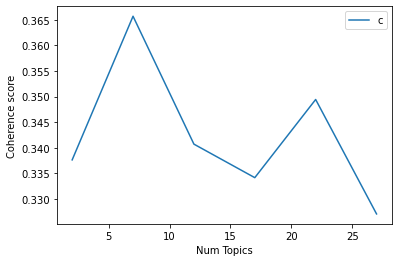

In [110]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score5)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [111]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score5):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 7

index: 0 | Num Topics = 2  has Coherence Value of 0.3376
index: 1 | Num Topics = 7  has Coherence Value of 0.3657
index: 2 | Num Topics = 12  has Coherence Value of 0.3407
index: 3 | Num Topics = 17  has Coherence Value of 0.3342
index: 4 | Num Topics = 22  has Coherence Value of 0.3494
index: 5 | Num Topics = 27  has Coherence Value of 0.3271


In [188]:
# Select optimal number of topics
optimal_model_us_score5 = model_list_us_score5[1]

In [189]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score5 = pyLDAvis.gensim_models.prepare(optimal_model_us_score5, corpus_us_score5, id2word_us_score5)

In [190]:
print("pyLDAVis for us topics for score=5:")
vis_us_score5

pyLDAVis for us topics for score=5:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.153126 -0.058565       1        1  23.516842
4      0.036756  0.131236       2        1  22.261600
3      0.056201 -0.133875       3        1  14.393284
5     -0.014281  0.054886       4        1  14.261365
2     -0.004135  0.000192       5        1  11.423797
6      0.006668  0.057626       6        1  10.818221
1     -0.234335 -0.051501       7        1   3.324892, topic_info=        Term        Freq       Total Category  logprob  loglift
66     story  304.000000  304.000000  Default  30.0000  30.0000
221  account  186.000000  186.000000  Default  29.0000  29.0000
48       add  284.000000  284.000000  Default  28.0000  28.0000
126     mode   98.000000   98.000000  Default  27.0000  27.0000
204     post  155.000000  155.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
46     thing    6.293408  280.503239   Topic7  -5.0532  -0.3933
54      keep    4.550039  152.277826   Topic7  -5.3776  -0.1068
102   people    4.202962  468.040687   Topic7  -5.4569  -1.3090
554     next    4.058837   28.757296   Topic7  -5.4918   1.4457
6       cool    4.006990   70.871500   Topic7  -5.5047   0.5309

[508 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
27        1  0.145204  able
27        2  0.204605  able
27        3  0.217806  able
27        4  0.171604  able
27        5  0.118803  able
...     ...       ...   ...
47        3  0.175904  year
47        4  0.119364  year
47        5  0.069105  year
47        6  0.031411  year
47        7  0.006282  year

[994 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 5, 4, 6, 3, 7, 2])

## LDA Topic Modelling (Rating = 1,2,3)

In [115]:
# By-rating Topic Modelling - rating = 1,2,3
# Convert to list - move to each section
review_us_score1N2N3 = snapchat_ios_us_review_YearMonth_score1N2N3.review.values.tolist()
review_words_us_score1N2N3 = list(sent_to_words(review_us_score1N2N3))
print(review_words_us_score1N2N3[:1])

[['often', 'use', 'snapchat', 'to', 'text', 'friends', 'but', 'recently', 'one', 'of', 'my', 'group', 'chats', 'have', 'received', 'many', 'glitches', 'everything', 'seems', 'to', 'be', 'delayed', 'when', 'send', 'things', 'it', 'doesn', 'send', 'for', 'about', 'minute', 'and', 'no', 'it', 'is', 'not', 'my', 'internet', 'connection', 'because', 'have', 'been', 'using', 'data', 'to', 'see', 'if', 'my', 'internet', 'was', 'the', 'problem', 'which', 'it', 'not', 'also', 'when', 'go', 'to', 'save', 'chats', 'it', 'very', 'delayed', 'it', 'will', 'take', 'about', 'minute', 'to', 'save', 'something', 'please', 'fix', 'this', 'do', 'enjoy', 'all', 'other', 'factors', 'of', 'the', 'app', 'such', 'as', 'news', 'stories', 'and', 'filters']]


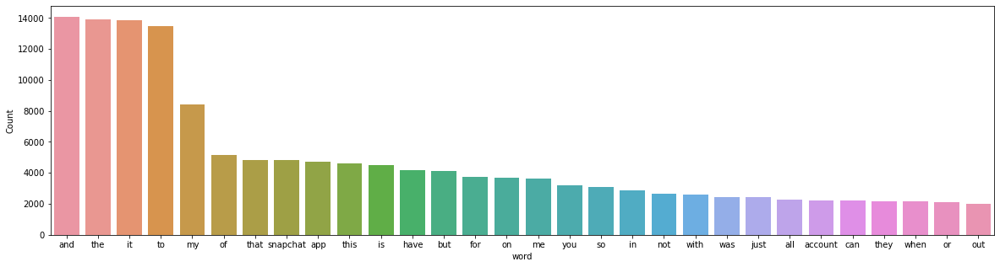

In [116]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_score1N2N3))

In [117]:
# Clean text
review_us_ready_score1N2N3 = process_words(review_words_us_score1N2N3)  # processed Text Data! - move to each section

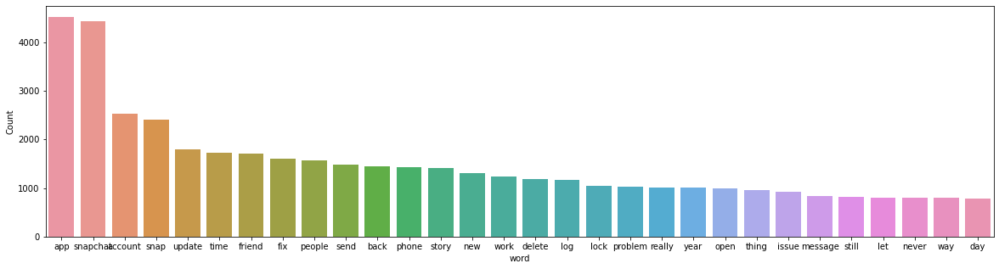

In [118]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_us_ready_score1N2N3))


In [119]:
# Create Dictionary
id2word_us_score1N2N3 = corpora.Dictionary(review_us_ready_score1N2N3)

2021-10-16 23:07:15,528 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-16 23:07:16,150 [INFO] gensim.corpora.dictionary - built Dictionary(5253 unique tokens: ['chat', 'connection', 'datum', 'delay', 'enjoy']...) from 3010 documents (total 139896 corpus positions)
2021-10-16 23:07:16,151 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(5253 unique tokens: ['chat', 'connection', 'datum', 'delay', 'enjoy']...) from 3010 documents (total 139896 corpus positions)", 'datetime': '2021-10-16T23:07:16.151358', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [120]:
# Create Corpus: Term Document Frequency
corpus_us_score1N2N3 = [id2word_us_score1N2N3.doc2bow(text) for text in review_us_ready_score1N2N3]

In [121]:
# Training LDA model
model_list_us_score1N2N3, coherence_values_us_score1N2N3 = compute_coherence_values(dictionary=id2word_us_score1N2N3, corpus=corpus_us_score1N2N3, 
                                                              texts=review_us_ready_score1N2N3, limit=30, start=2, step=5)


2021-10-16 23:07:17,250 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-16 23:07:17,252 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-16 23:07:17,256 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-16 23:07:17,259 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 3010 documents, updating model once every 1000 documents, evaluating perplexity every 3010 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-16 23:07:17,260 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/3010
2021-10-16 23:07:20,301 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:07:20,310 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.041*"app" + 0.036*"snapchat" + 0.018*"account" + 0.016*"snap" + 0.015*"friend" + 0.014*"send" + 0.012*"fix" + 0.012*"time" + 0.011*"people"

2021-10-16 23:07:38,364 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.028*"snapchat" + 0.020*"snap" + 0.017*"update" + 0.014*"story" + 0.013*"time" + 0.012*"friend" + 0.012*"fix" + 0.011*"send" + 0.010*"people"
2021-10-16 23:07:38,365 [INFO] gensim.models.ldamodel - topic diff=0.408333, rho=0.407909
2021-10-16 23:07:38,366 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3000/3010
2021-10-16 23:07:39,894 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:07:39,897 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.059*"account" + 0.035*"snapchat" + 0.024*"lock" + 0.018*"people" + 0.016*"app" + 0.015*"back" + 0.015*"memory" + 0.013*"snap" + 0.013*"log" + 0.013*"year"
2021-10-16 23:07:39,900 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"app" + 0.028*"snapchat" + 0.018*"snap" + 0.017*"update" + 0.013*"time" + 0.013*"fix" + 0.013*"friend" + 0.012*"story" + 0.011*"phone" + 0.010*"peop

2021-10-16 23:07:48,790 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"app" + 0.028*"snapchat" + 0.024*"snap" + 0.016*"time" + 0.015*"update" + 0.014*"friend" + 0.012*"fix" + 0.012*"send" + 0.011*"phone" + 0.010*"story"
2021-10-16 23:07:48,794 [INFO] gensim.models.ldamodel - topic diff=0.392530, rho=0.353333
2021-10-16 23:07:48,797 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/3010
2021-10-16 23:07:50,029 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:07:50,032 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.049*"account" + 0.034*"snapchat" + 0.023*"people" + 0.018*"memory" + 0.018*"streak" + 0.017*"lock" + 0.015*"support" + 0.014*"back" + 0.014*"send" + 0.013*"app"
2021-10-16 23:07:50,035 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"app" + 0.029*"snapchat" + 0.021*"snap" + 0.015*"time" + 0.014*"friend" + 0.013*"fix" + 0.013*"update" + 0.013*"story" + 0.012*"send" + 0.011*"

2021-10-16 23:07:59,988 [INFO] gensim.models.ldamodel - topic diff=0.299232, rho=0.301374
2021-10-16 23:07:59,989 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #3000/3010
2021-10-16 23:08:01,189 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:08:01,194 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.067*"account" + 0.034*"snapchat" + 0.026*"lock" + 0.021*"people" + 0.019*"memory" + 0.016*"support" + 0.015*"back" + 0.013*"streak" + 0.013*"email" + 0.013*"lose"
2021-10-16 23:08:01,196 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"app" + 0.029*"snapchat" + 0.020*"snap" + 0.015*"update" + 0.014*"time" + 0.014*"friend" + 0.013*"fix" + 0.011*"phone" + 0.011*"story" + 0.011*"send"
2021-10-16 23:08:01,199 [INFO] gensim.models.ldamodel - topic diff=0.275417, rho=0.301374
2021-10-16 23:08:01,220 [INFO] gensim.models.ldamodel - -5.583 per-word bound, 47.9 perplexity estimate based on a held-out corpus 

2021-10-16 23:08:12,697 [INFO] gensim.models.ldamodel - topic diff=0.308575, rho=0.277243
2021-10-16 23:08:12,700 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #1000/3010
2021-10-16 23:08:14,590 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:08:14,603 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"account" + 0.034*"snapchat" + 0.024*"people" + 0.019*"memory" + 0.019*"lock" + 0.015*"support" + 0.015*"streak" + 0.015*"back" + 0.013*"send" + 0.013*"app"
2021-10-16 23:08:14,605 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.016*"time" + 0.014*"friend" + 0.013*"update" + 0.013*"fix" + 0.012*"send" + 0.012*"story" + 0.011*"phone"
2021-10-16 23:08:14,606 [INFO] gensim.models.ldamodel - topic diff=0.270936, rho=0.267166
2021-10-16 23:08:14,607 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #2000/3010
2021-10-16 23:08:16,126 [INFO] gen

2021-10-16 23:08:24,484 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:08:24,489 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.066*"account" + 0.034*"snapchat" + 0.026*"lock" + 0.022*"people" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"email" + 0.012*"app" + 0.011*"send"
2021-10-16 23:08:24,491 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"app" + 0.029*"snapchat" + 0.021*"snap" + 0.015*"update" + 0.015*"time" + 0.014*"friend" + 0.013*"fix" + 0.011*"send" + 0.011*"phone" + 0.011*"story"
2021-10-16 23:08:24,493 [INFO] gensim.models.ldamodel - topic diff=0.226026, rho=0.249922
2021-10-16 23:08:24,513 [INFO] gensim.models.ldamodel - -5.550 per-word bound, 46.8 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:08:24,514 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3010/3010
2021-10-16 23:08:24,528 [INFO] gensim.models.ldamodel - mergi

2021-10-16 23:08:34,760 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:08:34,766 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"account" + 0.034*"snapchat" + 0.024*"people" + 0.020*"memory" + 0.019*"lock" + 0.016*"support" + 0.015*"back" + 0.014*"streak" + 0.013*"send" + 0.013*"app"
2021-10-16 23:08:34,768 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.016*"time" + 0.014*"friend" + 0.013*"update" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.011*"phone"
2021-10-16 23:08:34,770 [INFO] gensim.models.ldamodel - topic diff=0.227180, rho=0.229355
2021-10-16 23:08:34,778 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3010
2021-10-16 23:08:36,651 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:08:36,658 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"account" + 0.034*"

2021-10-16 23:08:48,989 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.065*"account" + 0.034*"snapchat" + 0.025*"lock" + 0.023*"people" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"email" + 0.012*"app" + 0.011*"guy"
2021-10-16 23:08:48,992 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.021*"snap" + 0.015*"update" + 0.015*"time" + 0.014*"friend" + 0.013*"fix" + 0.011*"send" + 0.011*"phone" + 0.011*"story"
2021-10-16 23:08:48,993 [INFO] gensim.models.ldamodel - topic diff=0.195627, rho=0.218166
2021-10-16 23:08:49,008 [INFO] gensim.models.ldamodel - -5.536 per-word bound, 46.4 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:08:49,009 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #3010/3010
2021-10-16 23:08:49,018 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:08:49,021 [INFO] gensim.models.ldamodel - topic #0

2021-10-16 23:09:00,011 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.054*"account" + 0.034*"snapchat" + 0.024*"people" + 0.020*"memory" + 0.019*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"streak" + 0.013*"app" + 0.012*"send"
2021-10-16 23:09:00,013 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.016*"time" + 0.014*"friend" + 0.013*"update" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.011*"phone"
2021-10-16 23:09:00,017 [INFO] gensim.models.ldamodel - topic diff=0.198752, rho=0.204082
2021-10-16 23:09:00,021 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #2000/3010
2021-10-16 23:09:01,364 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:09:01,367 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"account" + 0.034*"snapchat" + 0.024*"people" + 0.021*"lock" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.013*"streak" + 0.012*"app" 

2021-10-16 23:09:10,858 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.021*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.012*"send" + 0.011*"phone" + 0.011*"story"
2021-10-16 23:09:10,860 [INFO] gensim.models.ldamodel - topic diff=0.174659, rho=0.196078
2021-10-16 23:09:10,879 [INFO] gensim.models.ldamodel - -5.528 per-word bound, 46.2 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:09:10,880 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #3010/3010
2021-10-16 23:09:10,891 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:09:10,894 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.051*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.018*"lock" + 0.016*"support" + 0.015*"back" + 0.014*"streak" + 0.013*"app" + 0.013*"send"
2021-10-16 23:09:10,896 [INFO] gensim.models.ldamodel - topic 

2021-10-16 23:09:19,610 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.016*"time" + 0.014*"friend" + 0.013*"update" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.011*"phone"
2021-10-16 23:09:19,611 [INFO] gensim.models.ldamodel - topic diff=0.178579, rho=0.185663
2021-10-16 23:09:19,612 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #2000/3010
2021-10-16 23:09:20,867 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:09:20,871 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"account" + 0.034*"snapchat" + 0.024*"people" + 0.021*"lock" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"streak" + 0.012*"app" + 0.012*"guy"
2021-10-16 23:09:20,874 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.010*"

2021-10-16 23:09:29,156 [INFO] gensim.models.ldamodel - topic diff=0.159113, rho=0.179576
2021-10-16 23:09:29,179 [INFO] gensim.models.ldamodel - -5.523 per-word bound, 46.0 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:09:29,181 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3010/3010
2021-10-16 23:09:29,202 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:09:29,209 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.019*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"streak" + 0.013*"app" + 0.013*"guy"
2021-10-16 23:09:29,212 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.023*"snap" + 0.016*"time" + 0.015*"friend" + 0.014*"update" + 0.013*"send" + 0.013*"fix" + 0.011*"story" + 0.010*"phone"
2021-10-16 23:09:29,213 [INFO] gensim.models.ldamodel - topic d

2021-10-16 23:09:39,647 [INFO] gensim.models.ldamodel - topic diff=0.163355, rho=0.171473
2021-10-16 23:09:39,649 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3010
2021-10-16 23:09:40,879 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:09:40,883 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.056*"account" + 0.034*"snapchat" + 0.024*"people" + 0.021*"lock" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"app" + 0.012*"streak" + 0.012*"guy"
2021-10-16 23:09:40,891 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.010*"phone"
2021-10-16 23:09:40,893 [INFO] gensim.models.ldamodel - topic diff=0.160538, rho=0.171473
2021-10-16 23:09:40,898 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #3000/3010
2021-10-16 23:09:42,235 [INFO] gens

2021-10-16 23:09:52,181 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #3010/3010
2021-10-16 23:09:52,194 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:09:52,197 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.052*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.019*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"streak" + 0.013*"app" + 0.013*"guy"
2021-10-16 23:09:52,200 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.023*"snap" + 0.016*"time" + 0.015*"friend" + 0.014*"update" + 0.013*"send" + 0.013*"fix" + 0.011*"story" + 0.010*"phone"
2021-10-16 23:09:52,201 [INFO] gensim.models.ldamodel - topic diff=0.182761, rho=0.166644
2021-10-16 23:09:52,203 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/3010
2021-10-16 23:09:53,370 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021

2021-10-16 23:10:04,250 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.057*"account" + 0.034*"snapchat" + 0.024*"people" + 0.021*"lock" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.013*"app" + 0.012*"guy" + 0.012*"streak"
2021-10-16 23:10:04,254 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.010*"phone"
2021-10-16 23:10:04,255 [INFO] gensim.models.ldamodel - topic diff=0.148982, rho=0.160108
2021-10-16 23:10:04,257 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #3000/3010
2021-10-16 23:10:05,743 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:10:05,746 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.063*"account" + 0.034*"snapchat" + 0.024*"lock" + 0.023*"people" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"app" + 0.012*"guy" + 0.

2021-10-16 23:10:14,693 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.053*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.019*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"streak" + 0.013*"app" + 0.013*"guy"
2021-10-16 23:10:14,698 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.023*"snap" + 0.016*"time" + 0.015*"friend" + 0.014*"update" + 0.013*"send" + 0.013*"fix" + 0.011*"story" + 0.010*"phone"
2021-10-16 23:10:14,700 [INFO] gensim.models.ldamodel - topic diff=0.170915, rho=0.156155
2021-10-16 23:10:14,706 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1000/3010
2021-10-16 23:10:15,921 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:10:15,927 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.020*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"app" + 0.013*"streak" +

2021-10-16 23:10:25,194 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.013*"send" + 0.012*"story" + 0.010*"phone"
2021-10-16 23:10:25,197 [INFO] gensim.models.ldamodel - topic diff=0.139552, rho=0.150739
2021-10-16 23:10:25,199 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3000/3010
2021-10-16 23:10:26,616 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:10:26,621 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.063*"account" + 0.034*"snapchat" + 0.024*"lock" + 0.023*"people" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"app" + 0.012*"guy" + 0.011*"email"
2021-10-16 23:10:26,641 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.021*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.012*"send" + 0.011*"story" + 0.011*"p

2021-10-16 23:10:33,987 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.023*"snap" + 0.016*"time" + 0.015*"friend" + 0.014*"update" + 0.013*"send" + 0.013*"fix" + 0.011*"story" + 0.010*"phone"
2021-10-16 23:10:33,988 [INFO] gensim.models.ldamodel - topic diff=0.161081, rho=0.147426
2021-10-16 23:10:33,989 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1000/3010
2021-10-16 23:10:35,304 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:10:35,307 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.020*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"app" + 0.012*"guy" + 0.012*"streak"
2021-10-16 23:10:35,310 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.016*"time" + 0.015*"friend" + 0.013*"update" + 0.013*"fix" + 0.013*"send" + 0.011*"story" + 0.011*"

2021-10-16 23:10:44,528 [INFO] gensim.models.ldamodel - topic diff=0.131671, rho=0.142843
2021-10-16 23:10:44,529 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #3000/3010
2021-10-16 23:10:45,589 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:10:45,594 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.063*"account" + 0.034*"snapchat" + 0.024*"lock" + 0.023*"people" + 0.020*"memory" + 0.016*"support" + 0.015*"back" + 0.012*"app" + 0.012*"guy" + 0.011*"email"
2021-10-16 23:10:45,598 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"app" + 0.029*"snapchat" + 0.021*"snap" + 0.015*"time" + 0.015*"update" + 0.014*"friend" + 0.013*"fix" + 0.012*"send" + 0.011*"story" + 0.011*"phone"
2021-10-16 23:10:45,601 [INFO] gensim.models.ldamodel - topic diff=0.124965, rho=0.142843
2021-10-16 23:10:45,640 [INFO] gensim.models.ldamodel - -5.511 per-word bound, 45.6 perplexity estimate based on a held-out corpus of 

2021-10-16 23:10:54,680 [INFO] gensim.models.ldamodel - topic diff=0.152726, rho=0.140014
2021-10-16 23:10:54,681 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/3010
2021-10-16 23:10:56,133 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:10:56,139 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.055*"account" + 0.034*"snapchat" + 0.025*"people" + 0.020*"memory" + 0.020*"lock" + 0.016*"support" + 0.015*"back" + 0.013*"app" + 0.012*"guy" + 0.012*"streak"
2021-10-16 23:10:56,140 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"app" + 0.029*"snapchat" + 0.022*"snap" + 0.016*"time" + 0.015*"friend" + 0.013*"update" + 0.013*"fix" + 0.013*"send" + 0.011*"story" + 0.011*"phone"
2021-10-16 23:10:56,143 [INFO] gensim.models.ldamodel - topic diff=0.129184, rho=0.138662
2021-10-16 23:10:56,147 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #2000/3010
2021-10-16 23:10:57,365 [INFO] gens

2021-10-16 23:11:13,941 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.041*"snapchat" + 0.037*"app" + 0.019*"account" + 0.019*"snap" + 0.017*"send" + 0.016*"people" + 0.016*"friend" + 0.013*"fix" + 0.011*"problem" + 0.010*"work"
2021-10-16 23:11:13,944 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.034*"snapchat" + 0.023*"app" + 0.020*"snap" + 0.016*"time" + 0.012*"story" + 0.011*"fix" + 0.011*"work" + 0.011*"problem" + 0.011*"log" + 0.011*"account"
2021-10-16 23:11:13,951 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.029*"snapchat" + 0.026*"story" + 0.018*"snap" + 0.015*"app" + 0.013*"back" + 0.013*"fix" + 0.013*"time" + 0.012*"people" + 0.012*"update" + 0.012*"log"
2021-10-16 23:11:13,957 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.033*"snapchat" + 0.023*"app" + 0.015*"friend" + 0.014*"story" + 0.013*"send" + 0.013*"fix" + 0.012*"message" + 0.012*"snap" + 0.012*"time" + 0.012*"work"
2021-10-16 23:11:13,962 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.04

2021-10-16 23:11:26,676 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.030*"update" + 0.028*"snapchat" + 0.021*"app" + 0.020*"new" + 0.018*"look" + 0.014*"people" + 0.014*"change" + 0.012*"friend" + 0.011*"snap" + 0.011*"camera"
2021-10-16 23:11:26,677 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.049*"snapchat" + 0.036*"support" + 0.030*"account" + 0.029*"user" + 0.022*"save" + 0.014*"memory" + 0.012*"app" + 0.011*"new" + 0.011*"way" + 0.011*"year"
2021-10-16 23:11:26,678 [INFO] gensim.models.ldamodel - topic diff=0.561342, rho=0.446767
2021-10-16 23:11:26,680 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3000/3010
2021-10-16 23:11:29,523 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:11:29,616 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.083*"account" + 0.028*"snapchat" + 0.027*"email" + 0.024*"memory" + 0.020*"back" + 0.014*"log" + 0.014*"help" + 0.013*"support" + 0.013*"number" + 0.

2021-10-16 23:11:37,951 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3010/3010
2021-10-16 23:11:37,967 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:11:37,976 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"people" + 0.030*"snapchat" + 0.027*"streak" + 0.022*"app" + 0.021*"account" + 0.020*"send" + 0.019*"snap" + 0.017*"lock" + 0.016*"lose" + 0.014*"day"
2021-10-16 23:11:37,978 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.035*"update" + 0.028*"snapchat" + 0.024*"app" + 0.020*"new" + 0.015*"look" + 0.013*"people" + 0.013*"change" + 0.012*"camera" + 0.011*"picture" + 0.011*"deletion"
2021-10-16 23:11:37,980 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.046*"snap" + 0.042*"app" + 0.031*"send" + 0.024*"snapchat" + 0.023*"time" + 0.019*"issue" + 0.019*"streak" + 0.018*"fix" + 0.016*"friend" + 0.016*"problem"
2021-10-16 23:11:37,983 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*

2021-10-16 23:11:48,387 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.054*"people" + 0.027*"streak" + 0.026*"snapchat" + 0.023*"app" + 0.021*"send" + 0.019*"snap" + 0.015*"lose" + 0.014*"guy" + 0.014*"ridiculous" + 0.013*"day"
2021-10-16 23:11:48,388 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.031*"update" + 0.031*"snapchat" + 0.027*"app" + 0.019*"camera" + 0.018*"new" + 0.015*"look" + 0.014*"picture" + 0.012*"people" + 0.012*"change" + 0.011*"iphone"
2021-10-16 23:11:48,390 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.052*"snapchat" + 0.045*"support" + 0.032*"user" + 0.026*"account" + 0.023*"save" + 0.019*"hope" + 0.018*"way" + 0.014*"app" + 0.013*"access" + 0.013*"delete"
2021-10-16 23:11:48,391 [INFO] gensim.models.ldamodel - topic diff=0.382039, rho=0.353333
2021-10-16 23:11:48,393 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #2000/3010
2021-10-16 23:11:50,349 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3

2021-10-16 23:11:56,116 [INFO] gensim.models.ldamodel - topic diff=0.280609, rho=0.333148
2021-10-16 23:11:56,118 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3000/3010
2021-10-16 23:11:57,811 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:11:57,829 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.133*"account" + 0.067*"lock" + 0.040*"memory" + 0.033*"back" + 0.029*"snapchat" + 0.024*"year" + 0.020*"email" + 0.019*"guy" + 0.017*"permanently" + 0.015*"unlock"
2021-10-16 23:11:57,841 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"update" + 0.030*"snapchat" + 0.029*"app" + 0.020*"new" + 0.017*"camera" + 0.014*"look" + 0.013*"picture" + 0.013*"change" + 0.012*"people" + 0.011*"snap"
2021-10-16 23:11:57,848 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.054*"app" + 0.044*"snap" + 0.031*"send" + 0.025*"snapchat" + 0.023*"fix" + 0.023*"time" + 0.021*"open" + 0.019*"work" + 0.018*"issue" + 0.0

2021-10-16 23:12:03,734 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.109*"account" + 0.051*"lock" + 0.047*"memory" + 0.039*"guy" + 0.038*"back" + 0.025*"year" + 0.025*"snapchat" + 0.024*"terminate" + 0.021*"people" + 0.020*"website"
2021-10-16 23:12:03,737 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.052*"snap" + 0.040*"app" + 0.037*"send" + 0.025*"time" + 0.025*"streak" + 0.023*"snapchat" + 0.021*"issue" + 0.019*"fix" + 0.018*"problem" + 0.017*"bug"
2021-10-16 23:12:03,760 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.044*"story" + 0.022*"people" + 0.021*"app" + 0.019*"snapchat" + 0.017*"video" + 0.017*"ad" + 0.015*"post" + 0.013*"add" + 0.013*"friend" + 0.012*"watch"
2021-10-16 23:12:03,768 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"snapchat" + 0.031*"log" + 0.028*"app" + 0.024*"account" + 0.024*"phone" + 0.017*"friend" + 0.016*"time" + 0.014*"delete" + 0.014*"new" + 0.014*"back"
2021-10-16 23:12:03,775 [INFO] gensim.models.ldamodel - topic diff=0.41

2021-10-16 23:12:12,317 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.053*"snapchat" + 0.048*"support" + 0.038*"account" + 0.031*"user" + 0.022*"save" + 0.021*"ban" + 0.019*"way" + 0.018*"hope" + 0.017*"app" + 0.013*"device"
2021-10-16 23:12:12,321 [INFO] gensim.models.ldamodel - topic diff=0.259398, rho=0.288555
2021-10-16 23:12:12,323 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2000/3010
2021-10-16 23:12:14,391 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:12:14,396 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.111*"account" + 0.059*"lock" + 0.048*"memory" + 0.037*"guy" + 0.036*"back" + 0.025*"people" + 0.024*"year" + 0.022*"snapchat" + 0.019*"website" + 0.019*"terminate"
2021-10-16 23:12:14,398 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"story" + 0.022*"people" + 0.021*"app" + 0.020*"snapchat" + 0.017*"video" + 0.017*"ad" + 0.015*"post" + 0.013*"friend" + 0.013*"watch" + 0.

2021-10-16 23:12:21,885 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"update" + 0.031*"app" + 0.030*"snapchat" + 0.020*"new" + 0.018*"camera" + 0.014*"look" + 0.012*"picture" + 0.012*"change" + 0.012*"screen" + 0.011*"snap"
2021-10-16 23:12:21,890 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.045*"story" + 0.022*"people" + 0.022*"app" + 0.019*"snapchat" + 0.018*"video" + 0.017*"ad" + 0.016*"post" + 0.013*"friend" + 0.013*"add" + 0.012*"watch"
2021-10-16 23:12:21,897 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.120*"account" + 0.070*"lock" + 0.048*"memory" + 0.035*"back" + 0.032*"guy" + 0.028*"people" + 0.025*"year" + 0.021*"snapchat" + 0.018*"permanently" + 0.017*"unlock"
2021-10-16 23:12:21,904 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.048*"snapchat" + 0.032*"app" + 0.029*"account" + 0.029*"log" + 0.023*"phone" + 0.017*"friend" + 0.017*"delete" + 0.015*"time" + 0.015*"back" + 0.013*"new"
2021-10-16 23:12:21,908 [INFO] gensim.models.ldamodel - topic di

2021-10-16 23:12:27,446 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.041*"people" + 0.031*"snapchat" + 0.026*"streak" + 0.023*"app" + 0.022*"send" + 0.021*"snap" + 0.016*"ridiculous" + 0.016*"issue" + 0.016*"well" + 0.015*"new"
2021-10-16 23:12:27,447 [INFO] gensim.models.ldamodel - topic diff=0.354755, rho=0.267166
2021-10-16 23:12:27,448 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1000/3010
2021-10-16 23:12:29,324 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:12:29,346 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.099*"account" + 0.054*"lock" + 0.052*"memory" + 0.043*"guy" + 0.038*"back" + 0.035*"people" + 0.025*"year" + 0.022*"terminate" + 0.021*"website" + 0.019*"snapchat"
2021-10-16 23:12:29,350 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.055*"snap" + 0.042*"send" + 0.039*"app" + 0.026*"time" + 0.023*"streak" + 0.022*"issue" + 0.021*"snapchat" + 0.021*"fix" + 0.019*"problem"

2021-10-16 23:12:36,154 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.098*"account" + 0.056*"lock" + 0.054*"memory" + 0.040*"guy" + 0.037*"back" + 0.036*"people" + 0.025*"year" + 0.020*"website" + 0.020*"terminate" + 0.019*"snapchat"
2021-10-16 23:12:36,156 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"story" + 0.022*"people" + 0.021*"app" + 0.019*"snapchat" + 0.017*"video" + 0.017*"ad" + 0.015*"post" + 0.014*"friend" + 0.013*"watch" + 0.012*"add"
2021-10-16 23:12:36,158 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.048*"snapchat" + 0.033*"app" + 0.029*"account" + 0.029*"log" + 0.022*"phone" + 0.017*"delete" + 0.016*"friend" + 0.015*"back" + 0.015*"time" + 0.013*"work"
2021-10-16 23:12:36,161 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.058*"snap" + 0.044*"send" + 0.040*"app" + 0.025*"time" + 0.022*"open" + 0.022*"fix" + 0.021*"issue" + 0.021*"snapchat" + 0.020*"streak" + 0.019*"problem"
2021-10-16 23:12:36,163 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-16 23:12:42,892 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.046*"story" + 0.022*"people" + 0.022*"app" + 0.019*"snapchat" + 0.018*"video" + 0.017*"ad" + 0.015*"post" + 0.014*"friend" + 0.013*"add" + 0.012*"watch"
2021-10-16 23:12:42,893 [INFO] gensim.models.ldamodel - topic diff=0.143380, rho=0.242464
2021-10-16 23:12:42,911 [INFO] gensim.models.ldamodel - -5.001 per-word bound, 32.0 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:12:42,912 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #3010/3010
2021-10-16 23:12:42,923 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:12:42,928 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"people" + 0.035*"snapchat" + 0.025*"streak" + 0.021*"app" + 0.021*"send" + 0.020*"snap" + 0.017*"support" + 0.015*"ridiculous" + 0.015*"issue" + 0.015*"well"
2021-10-16 23:12:42,929 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:12:50,377 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"update" + 0.034*"app" + 0.031*"snapchat" + 0.019*"camera" + 0.018*"new" + 0.014*"look" + 0.012*"screen" + 0.012*"picture" + 0.011*"snap" + 0.011*"people"
2021-10-16 23:12:50,379 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.046*"snapchat" + 0.042*"account" + 0.036*"user" + 0.031*"support" + 0.024*"ban" + 0.024*"save" + 0.021*"way" + 0.021*"hope" + 0.019*"app" + 0.014*"read"
2021-10-16 23:12:50,382 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.048*"snapchat" + 0.036*"app" + 0.031*"account" + 0.028*"log" + 0.023*"phone" + 0.017*"delete" + 0.016*"friend" + 0.016*"back" + 0.015*"time" + 0.014*"work"
2021-10-16 23:12:50,383 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"story" + 0.022*"people" + 0.021*"app" + 0.019*"snapchat" + 0.017*"video" + 0.016*"post" + 0.015*"ad" + 0.014*"friend" + 0.013*"add" + 0.012*"watch"
2021-10-16 23:12:50,385 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0

2021-10-16 23:12:59,062 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.091*"account" + 0.059*"memory" + 0.052*"lock" + 0.041*"guy" + 0.038*"back" + 0.037*"people" + 0.026*"year" + 0.021*"terminate" + 0.021*"website" + 0.018*"snapchat"
2021-10-16 23:12:59,065 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.040*"account" + 0.036*"user" + 0.030*"support" + 0.024*"save" + 0.024*"ban" + 0.021*"way" + 0.020*"hope" + 0.019*"app" + 0.014*"memory"
2021-10-16 23:12:59,069 [INFO] gensim.models.ldamodel - topic diff=0.162556, rho=0.223551
2021-10-16 23:12:59,073 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #3000/3010
2021-10-16 23:13:01,289 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:13:01,296 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"update" + 0.035*"app" + 0.030*"snapchat" + 0.019*"new" + 0.017*"camera" + 0.014*"look" + 0.013*"screen" + 0.012*"snap" + 0.011*"picture" 

2021-10-16 23:13:08,268 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #3010/3010
2021-10-16 23:13:08,282 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:13:08,287 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.087*"account" + 0.060*"memory" + 0.047*"lock" + 0.045*"guy" + 0.040*"back" + 0.039*"people" + 0.027*"year" + 0.024*"terminate" + 0.021*"website" + 0.019*"give"
2021-10-16 23:13:08,289 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"update" + 0.035*"app" + 0.030*"snapchat" + 0.019*"new" + 0.017*"camera" + 0.014*"screen" + 0.014*"look" + 0.012*"snap" + 0.011*"picture" + 0.011*"change"
2021-10-16 23:13:08,292 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.062*"snap" + 0.046*"send" + 0.030*"app" + 0.029*"streak" + 0.027*"time" + 0.024*"issue" + 0.021*"bug" + 0.020*"day" + 0.020*"problem" + 0.018*"open"
2021-10-16 23:13:08,293 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"snap

2021-10-16 23:13:16,776 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.089*"account" + 0.061*"memory" + 0.049*"lock" + 0.043*"guy" + 0.040*"back" + 0.038*"people" + 0.026*"year" + 0.022*"terminate" + 0.021*"website" + 0.019*"give"
2021-10-16 23:13:16,779 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"story" + 0.022*"people" + 0.021*"app" + 0.019*"snapchat" + 0.017*"video" + 0.016*"post" + 0.015*"ad" + 0.014*"friend" + 0.013*"add" + 0.012*"watch"
2021-10-16 23:13:16,781 [INFO] gensim.models.ldamodel - topic diff=0.167093, rho=0.208469
2021-10-16 23:13:16,784 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2000/3010
2021-10-16 23:13:19,011 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:13:19,017 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.040*"account" + 0.036*"user" + 0.029*"support" + 0.024*"save" + 0.023*"ban" + 0.021*"way" + 0.020*"hope" + 0.019*"app" + 0.015*"m

2021-10-16 23:13:27,191 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.064*"snap" + 0.048*"send" + 0.032*"app" + 0.026*"time" + 0.025*"open" + 0.024*"issue" + 0.022*"bug" + 0.021*"streak" + 0.020*"fix" + 0.020*"problem"
2021-10-16 23:13:27,193 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"snapchat" + 0.039*"app" + 0.033*"account" + 0.025*"log" + 0.023*"phone" + 0.019*"delete" + 0.016*"back" + 0.016*"friend" + 0.015*"time" + 0.015*"work"
2021-10-16 23:13:27,197 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.098*"account" + 0.061*"memory" + 0.057*"lock" + 0.038*"back" + 0.037*"guy" + 0.036*"people" + 0.027*"year" + 0.019*"website" + 0.019*"give" + 0.019*"unlock"
2021-10-16 23:13:27,200 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"snapchat" + 0.040*"account" + 0.035*"user" + 0.029*"support" + 0.027*"ban" + 0.024*"save" + 0.021*"way" + 0.019*"hope" + 0.018*"app" + 0.014*"memory"
2021-10-16 23:13:27,203 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.047

2021-10-16 23:13:33,340 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.042*"update" + 0.037*"app" + 0.030*"snapchat" + 0.018*"new" + 0.016*"camera" + 0.014*"screen" + 0.013*"look" + 0.013*"snap" + 0.011*"people" + 0.011*"picture"
2021-10-16 23:13:33,344 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.024*"streak" + 0.021*"app" + 0.021*"support" + 0.021*"send" + 0.020*"snap" + 0.015*"issue" + 0.015*"new" + 0.015*"ridiculous"
2021-10-16 23:13:33,345 [INFO] gensim.models.ldamodel - topic diff=0.269252, rho=0.199960
2021-10-16 23:13:33,346 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/3010
2021-10-16 23:13:35,441 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:13:35,447 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.024*"streak" + 0.021*"app" + 0.021*"support" + 0.020*"send" + 0.020*"snap" + 0.015*"issue" + 0.015*"well

2021-10-16 23:13:43,005 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.041*"update" + 0.037*"app" + 0.030*"snapchat" + 0.018*"new" + 0.017*"camera" + 0.014*"screen" + 0.013*"look" + 0.013*"snap" + 0.011*"picture" + 0.011*"change"
2021-10-16 23:13:43,007 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"snapchat" + 0.035*"people" + 0.023*"streak" + 0.021*"app" + 0.020*"support" + 0.020*"send" + 0.020*"snap" + 0.015*"issue" + 0.015*"ridiculous" + 0.015*"well"
2021-10-16 23:13:43,008 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"story" + 0.022*"people" + 0.020*"app" + 0.019*"snapchat" + 0.017*"ad" + 0.017*"video" + 0.015*"post" + 0.015*"friend" + 0.013*"watch" + 0.013*"add"
2021-10-16 23:13:43,010 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.089*"account" + 0.063*"memory" + 0.049*"lock" + 0.041*"guy" + 0.039*"back" + 0.037*"people" + 0.027*"year" + 0.021*"terminate" + 0.021*"website" + 0.020*"give"
2021-10-16 23:13:43,012 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:13:50,834 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"snapchat" + 0.041*"app" + 0.032*"account" + 0.024*"log" + 0.023*"phone" + 0.020*"delete" + 0.016*"friend" + 0.016*"back" + 0.015*"work" + 0.015*"time"
2021-10-16 23:13:50,837 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.048*"story" + 0.022*"people" + 0.021*"app" + 0.019*"snapchat" + 0.017*"video" + 0.017*"ad" + 0.015*"post" + 0.014*"friend" + 0.013*"add" + 0.013*"watch"
2021-10-16 23:13:50,839 [INFO] gensim.models.ldamodel - topic diff=0.110617, rho=0.188948
2021-10-16 23:13:50,869 [INFO] gensim.models.ldamodel - -4.941 per-word bound, 30.7 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:13:50,871 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3010/3010
2021-10-16 23:13:50,881 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:13:50,886 [INFO] gensim.models.ldamodel - topic #1 (0.

2021-10-16 23:13:56,782 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/3010
2021-10-16 23:13:58,878 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:13:58,885 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"app" + 0.038*"update" + 0.030*"snapchat" + 0.017*"new" + 0.017*"camera" + 0.014*"screen" + 0.013*"look" + 0.013*"snap" + 0.012*"fix" + 0.011*"picture"
2021-10-16 23:13:58,889 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.067*"snap" + 0.052*"send" + 0.029*"streak" + 0.027*"time" + 0.026*"issue" + 0.023*"app" + 0.022*"bug" + 0.020*"problem" + 0.020*"day" + 0.019*"open"
2021-10-16 23:13:58,892 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.047*"snapchat" + 0.041*"app" + 0.030*"account" + 0.025*"log" + 0.023*"phone" + 0.019*"delete" + 0.016*"work" + 0.016*"friend" + 0.016*"time" + 0.015*"back"
2021-10-16 23:13:58,895 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat"

2021-10-16 23:14:07,914 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.070*"snap" + 0.054*"send" + 0.027*"streak" + 0.027*"time" + 0.025*"issue" + 0.022*"app" + 0.022*"bug" + 0.022*"open" + 0.020*"problem" + 0.020*"day"
2021-10-16 23:14:07,917 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"snapchat" + 0.035*"people" + 0.023*"streak" + 0.021*"support" + 0.021*"app" + 0.020*"send" + 0.020*"snap" + 0.015*"issue" + 0.015*"ridiculous" + 0.015*"well"
2021-10-16 23:14:07,919 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.041*"account" + 0.036*"user" + 0.029*"support" + 0.024*"save" + 0.024*"ban" + 0.021*"way" + 0.020*"hope" + 0.019*"app" + 0.015*"memory"
2021-10-16 23:14:07,921 [INFO] gensim.models.ldamodel - topic diff=0.127528, rho=0.179576
2021-10-16 23:14:07,924 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3010
2021-10-16 23:14:10,153 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 docu

2021-10-16 23:14:16,719 [INFO] gensim.models.ldamodel - topic diff=0.103326, rho=0.176749
2021-10-16 23:14:16,743 [INFO] gensim.models.ldamodel - -4.930 per-word bound, 30.5 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:14:16,744 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #3010/3010
2021-10-16 23:14:16,810 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:14:16,825 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"update" + 0.039*"app" + 0.030*"snapchat" + 0.018*"new" + 0.016*"camera" + 0.015*"screen" + 0.013*"snap" + 0.013*"look" + 0.012*"fix" + 0.011*"people"
2021-10-16 23:14:16,828 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.087*"account" + 0.062*"memory" + 0.047*"lock" + 0.044*"guy" + 0.040*"back" + 0.038*"people" + 0.027*"year" + 0.023*"terminate" + 0.021*"give" + 0.021*"website"
2021-10-16 23:14:16,834 [INFO] gensim.models.ldamodel - topic 

2021-10-16 23:14:26,354 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.069*"snap" + 0.053*"send" + 0.031*"streak" + 0.027*"time" + 0.026*"issue" + 0.022*"bug" + 0.020*"day" + 0.020*"problem" + 0.020*"app" + 0.019*"notification"
2021-10-16 23:14:26,357 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.042*"account" + 0.036*"user" + 0.029*"support" + 0.024*"save" + 0.024*"ban" + 0.021*"way" + 0.021*"hope" + 0.019*"app" + 0.015*"memory"
2021-10-16 23:14:26,361 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.024*"streak" + 0.021*"app" + 0.021*"support" + 0.020*"send" + 0.020*"snap" + 0.015*"issue" + 0.015*"well" + 0.015*"ridiculous"
2021-10-16 23:14:26,365 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.089*"account" + 0.063*"memory" + 0.048*"lock" + 0.042*"guy" + 0.040*"back" + 0.037*"people" + 0.027*"year" + 0.022*"terminate" + 0.021*"give" + 0.021*"website"
2021-10-16 23:14:26,366 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:14:34,740 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.090*"account" + 0.064*"memory" + 0.050*"lock" + 0.041*"guy" + 0.039*"back" + 0.037*"people" + 0.027*"year" + 0.021*"terminate" + 0.020*"give" + 0.020*"website"
2021-10-16 23:14:34,745 [INFO] gensim.models.ldamodel - topic diff=0.119304, rho=0.169007
2021-10-16 23:14:34,748 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #3000/3010
2021-10-16 23:14:36,529 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:14:36,535 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"update" + 0.040*"app" + 0.030*"snapchat" + 0.017*"new" + 0.016*"camera" + 0.015*"screen" + 0.014*"snap" + 0.013*"look" + 0.012*"fix" + 0.011*"open"
2021-10-16 23:14:36,537 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"snapchat" + 0.034*"people" + 0.022*"streak" + 0.021*"support" + 0.020*"app" + 0.020*"send" + 0.020*"snap" + 0.015*"ridiculous" + 0.015*"issue" 

2021-10-16 23:14:42,240 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.088*"account" + 0.062*"memory" + 0.047*"lock" + 0.043*"guy" + 0.040*"back" + 0.038*"people" + 0.027*"year" + 0.023*"terminate" + 0.021*"give" + 0.020*"website"
2021-10-16 23:14:42,242 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"update" + 0.040*"app" + 0.029*"snapchat" + 0.017*"new" + 0.015*"camera" + 0.015*"screen" + 0.014*"snap" + 0.013*"look" + 0.012*"fix" + 0.011*"open"
2021-10-16 23:14:42,245 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"snapchat" + 0.043*"app" + 0.029*"account" + 0.023*"log" + 0.023*"phone" + 0.020*"delete" + 0.016*"work" + 0.016*"friend" + 0.016*"time" + 0.016*"fix"
2021-10-16 23:14:42,247 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.070*"snap" + 0.052*"send" + 0.033*"streak" + 0.027*"time" + 0.026*"issue" + 0.022*"day" + 0.022*"bug" + 0.019*"bad" + 0.019*"problem" + 0.019*"notification"
2021-10-16 23:14:42,250 [INFO] gensim.models.ldamodel - topic #1 (0.143

2021-10-16 23:14:49,420 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.070*"snap" + 0.054*"send" + 0.032*"streak" + 0.027*"time" + 0.026*"issue" + 0.022*"bug" + 0.021*"day" + 0.020*"problem" + 0.020*"notification" + 0.019*"friend"
2021-10-16 23:14:49,422 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"story" + 0.021*"people" + 0.019*"app" + 0.019*"snapchat" + 0.016*"ad" + 0.016*"video" + 0.016*"post" + 0.015*"friend" + 0.014*"add" + 0.013*"watch"
2021-10-16 23:14:49,423 [INFO] gensim.models.ldamodel - topic diff=0.124366, rho=0.162200
2021-10-16 23:14:49,425 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #2000/3010
2021-10-16 23:14:51,041 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:14:51,052 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.039*"app" + 0.039*"update" + 0.030*"snapchat" + 0.018*"new" + 0.016*"camera" + 0.015*"screen" + 0.014*"snap" + 0.013*"look" + 0.012*"fix" + 0.012*"o

2021-10-16 23:14:58,382 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.072*"snap" + 0.055*"send" + 0.027*"streak" + 0.027*"time" + 0.026*"issue" + 0.022*"bug" + 0.022*"open" + 0.020*"day" + 0.019*"problem" + 0.019*"notification"
2021-10-16 23:14:58,384 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"story" + 0.021*"people" + 0.019*"app" + 0.018*"snapchat" + 0.018*"ad" + 0.017*"video" + 0.016*"post" + 0.015*"friend" + 0.014*"add" + 0.013*"watch"
2021-10-16 23:14:58,386 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"snapchat" + 0.044*"app" + 0.028*"account" + 0.023*"log" + 0.023*"phone" + 0.020*"delete" + 0.017*"work" + 0.016*"friend" + 0.016*"fix" + 0.016*"time"
2021-10-16 23:14:58,388 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.098*"account" + 0.062*"memory" + 0.056*"lock" + 0.038*"back" + 0.038*"guy" + 0.035*"people" + 0.027*"year" + 0.020*"give" + 0.019*"website" + 0.019*"terminate"
2021-10-16 23:14:58,389 [INFO] gensim.models.ldamodel - topic #5 (0.14

2021-10-16 23:15:04,267 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"snapchat" + 0.044*"app" + 0.028*"account" + 0.023*"log" + 0.022*"phone" + 0.020*"delete" + 0.017*"work" + 0.016*"friend" + 0.016*"fix" + 0.016*"time"
2021-10-16 23:15:04,269 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.024*"streak" + 0.022*"support" + 0.021*"app" + 0.021*"send" + 0.020*"snap" + 0.016*"new" + 0.015*"ridiculous" + 0.015*"well"
2021-10-16 23:15:04,273 [INFO] gensim.models.ldamodel - topic diff=0.213689, rho=0.158094
2021-10-16 23:15:04,274 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/3010
2021-10-16 23:15:06,257 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:15:06,266 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.042*"account" + 0.036*"user" + 0.030*"support" + 0.024*"save" + 0.024*"ban" + 0.021*"way" + 0.020*"hope" + 0.019*"app" + 0.015

2021-10-16 23:15:13,479 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.046*"snapchat" + 0.044*"app" + 0.026*"account" + 0.023*"log" + 0.022*"phone" + 0.020*"delete" + 0.017*"work" + 0.017*"friend" + 0.016*"fix" + 0.016*"time"
2021-10-16 23:15:13,484 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.039*"app" + 0.038*"update" + 0.029*"snapchat" + 0.017*"new" + 0.016*"camera" + 0.015*"screen" + 0.015*"snap" + 0.013*"look" + 0.013*"open" + 0.012*"fix"
2021-10-16 23:15:13,489 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.023*"streak" + 0.021*"support" + 0.021*"app" + 0.020*"send" + 0.020*"snap" + 0.015*"well" + 0.015*"issue" + 0.015*"ridiculous"
2021-10-16 23:15:13,492 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.092*"account" + 0.063*"memory" + 0.051*"lock" + 0.041*"guy" + 0.039*"back" + 0.036*"people" + 0.027*"year" + 0.021*"give" + 0.021*"terminate" + 0.020*"website"
2021-10-16 23:15:13,493 [INFO] gensim.models.ldamodel - topic #2 

2021-10-16 23:15:20,399 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"story" + 0.021*"people" + 0.018*"app" + 0.018*"ad" + 0.018*"snapchat" + 0.017*"video" + 0.016*"post" + 0.015*"friend" + 0.014*"add" + 0.014*"watch"
2021-10-16 23:15:20,402 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.039*"update" + 0.029*"snapchat" + 0.017*"new" + 0.015*"camera" + 0.015*"screen" + 0.015*"snap" + 0.013*"open" + 0.013*"look" + 0.013*"fix"
2021-10-16 23:15:20,404 [INFO] gensim.models.ldamodel - topic diff=0.088761, rho=0.152481
2021-10-16 23:15:20,425 [INFO] gensim.models.ldamodel - -4.898 per-word bound, 29.8 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:15:20,433 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3010/3010
2021-10-16 23:15:20,450 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:15:20,464 [INFO] gensim.models.ldamodel - topic #6 (0.143

2021-10-16 23:15:25,839 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/3010
2021-10-16 23:15:27,285 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:15:27,291 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.051*"story" + 0.021*"people" + 0.018*"snapchat" + 0.018*"app" + 0.017*"ad" + 0.016*"post" + 0.016*"video" + 0.015*"friend" + 0.014*"add" + 0.013*"watch"
2021-10-16 23:15:27,293 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.071*"snap" + 0.055*"send" + 0.033*"streak" + 0.027*"time" + 0.027*"issue" + 0.021*"day" + 0.021*"bug" + 0.020*"notification" + 0.019*"problem" + 0.019*"bad"
2021-10-16 23:15:27,295 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.036*"update" + 0.030*"snapchat" + 0.016*"new" + 0.016*"camera" + 0.014*"snap" + 0.014*"screen" + 0.013*"fix" + 0.013*"look" + 0.012*"open"
2021-10-16 23:15:27,296 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapcha

2021-10-16 23:15:33,286 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.074*"snap" + 0.057*"send" + 0.031*"streak" + 0.027*"time" + 0.027*"issue" + 0.022*"day" + 0.022*"bug" + 0.021*"notification" + 0.019*"problem" + 0.019*"friend"
2021-10-16 23:15:33,288 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.034*"people" + 0.023*"streak" + 0.022*"support" + 0.021*"app" + 0.020*"send" + 0.020*"snap" + 0.015*"well" + 0.015*"issue" + 0.015*"ridiculous"
2021-10-16 23:15:33,290 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.041*"account" + 0.035*"user" + 0.029*"support" + 0.024*"save" + 0.023*"ban" + 0.021*"way" + 0.020*"hope" + 0.019*"app" + 0.014*"memory"
2021-10-16 23:15:33,291 [INFO] gensim.models.ldamodel - topic diff=0.103166, rho=0.147426
2021-10-16 23:15:33,292 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3010
2021-10-16 23:15:34,843 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model o

2021-10-16 23:15:39,356 [INFO] gensim.models.ldamodel - topic diff=0.084864, rho=0.145849
2021-10-16 23:15:39,385 [INFO] gensim.models.ldamodel - -4.885 per-word bound, 29.5 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:15:39,386 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3010/3010
2021-10-16 23:15:39,395 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:15:39,400 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.049*"story" + 0.021*"people" + 0.018*"ad" + 0.018*"app" + 0.018*"snapchat" + 0.017*"video" + 0.016*"post" + 0.015*"friend" + 0.014*"add" + 0.014*"watch"
2021-10-16 23:15:39,402 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.024*"streak" + 0.022*"support" + 0.021*"app" + 0.021*"send" + 0.021*"snap" + 0.016*"new" + 0.016*"well" + 0.016*"ridiculous"
2021-10-16 23:15:39,404 [INFO] gensim.models.ldamodel - topic #

2021-10-16 23:15:45,542 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.036*"update" + 0.030*"snapchat" + 0.016*"new" + 0.016*"camera" + 0.015*"snap" + 0.014*"screen" + 0.013*"fix" + 0.013*"open" + 0.013*"look"
2021-10-16 23:15:45,545 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.092*"account" + 0.062*"memory" + 0.050*"lock" + 0.042*"guy" + 0.040*"back" + 0.037*"people" + 0.027*"year" + 0.021*"terminate" + 0.021*"give" + 0.020*"website"
2021-10-16 23:15:45,547 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.037*"snapchat" + 0.035*"people" + 0.024*"streak" + 0.022*"support" + 0.021*"app" + 0.021*"send" + 0.020*"snap" + 0.016*"well" + 0.016*"issue" + 0.016*"ridiculous"
2021-10-16 23:15:45,549 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.071*"snap" + 0.055*"send" + 0.034*"streak" + 0.027*"time" + 0.027*"issue" + 0.022*"day" + 0.021*"bug" + 0.021*"notification" + 0.019*"problem" + 0.019*"bad"
2021-10-16 23:15:45,550 [INFO] gensim.models.ldamodel - topic d

2021-10-16 23:15:52,770 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.038*"update" + 0.029*"snapchat" + 0.017*"new" + 0.015*"snap" + 0.015*"camera" + 0.014*"screen" + 0.014*"open" + 0.013*"fix" + 0.013*"look"
2021-10-16 23:15:52,771 [INFO] gensim.models.ldamodel - topic diff=0.098820, rho=0.141407
2021-10-16 23:15:52,772 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3010
2021-10-16 23:15:54,641 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:15:54,646 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.050*"story" + 0.021*"people" + 0.018*"ad" + 0.018*"app" + 0.018*"snapchat" + 0.017*"video" + 0.016*"post" + 0.015*"friend" + 0.014*"add" + 0.014*"watch"
2021-10-16 23:15:54,648 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.036*"snapchat" + 0.034*"people" + 0.022*"streak" + 0.022*"support" + 0.020*"app" + 0.020*"send" + 0.020*"snap" + 0.015*"well" + 0.015*"ridiculous" + 0.015*

2021-10-16 23:15:59,943 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.091*"account" + 0.062*"memory" + 0.049*"lock" + 0.042*"guy" + 0.040*"back" + 0.037*"people" + 0.027*"year" + 0.022*"terminate" + 0.021*"give" + 0.020*"website"
2021-10-16 23:15:59,945 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.045*"snapchat" + 0.045*"app" + 0.026*"account" + 0.022*"phone" + 0.022*"log" + 0.020*"delete" + 0.017*"fix" + 0.017*"work" + 0.017*"friend" + 0.016*"time"
2021-10-16 23:15:59,946 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.038*"update" + 0.029*"snapchat" + 0.017*"new" + 0.015*"snap" + 0.015*"camera" + 0.014*"open" + 0.014*"screen" + 0.013*"fix" + 0.013*"look"
2021-10-16 23:15:59,948 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.071*"snap" + 0.054*"send" + 0.036*"streak" + 0.027*"time" + 0.027*"issue" + 0.023*"day" + 0.021*"bug" + 0.020*"bad" + 0.020*"notification" + 0.019*"experience"
2021-10-16 23:15:59,954 [INFO] gensim.models.ldamodel - topic #1 (0.

2021-10-16 23:16:06,805 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.072*"snap" + 0.056*"send" + 0.034*"streak" + 0.027*"time" + 0.027*"issue" + 0.022*"day" + 0.021*"bug" + 0.021*"notification" + 0.019*"bad" + 0.019*"problem"
2021-10-16 23:16:06,808 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"app" + 0.036*"update" + 0.029*"snapchat" + 0.016*"new" + 0.015*"camera" + 0.015*"snap" + 0.014*"screen" + 0.014*"open" + 0.014*"fix" + 0.013*"look"
2021-10-16 23:16:06,810 [INFO] gensim.models.ldamodel - topic diff=0.103074, rho=0.137348
2021-10-16 23:16:06,812 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/3010
2021-10-16 23:16:08,818 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:16:08,827 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"snapchat" + 0.040*"account" + 0.035*"user" + 0.029*"support" + 0.023*"ban" + 0.023*"save" + 0.020*"way" + 0.019*"hope" + 0.019*"app" + 0.014*"acce

2021-10-16 23:16:26,988 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.038*"ad" + 0.023*"snapchat" + 0.023*"story" + 0.021*"app" + 0.019*"filter" + 0.019*"really" + 0.016*"friend" + 0.012*"update" + 0.011*"watch" + 0.010*"send"
2021-10-16 23:16:26,990 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.028*"snapchat" + 0.020*"app" + 0.020*"look" + 0.018*"new" + 0.017*"update" + 0.015*"story" + 0.014*"camera" + 0.013*"friend" + 0.013*"video" + 0.013*"people"
2021-10-16 23:16:26,992 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.065*"account" + 0.048*"snapchat" + 0.024*"email" + 0.024*"log" + 0.020*"lock" + 0.016*"number" + 0.015*"phone" + 0.014*"people" + 0.014*"back" + 0.013*"friend"
2021-10-16 23:16:26,994 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.029*"snapchat" + 0.018*"app" + 0.015*"snap" + 0.015*"change" + 0.014*"time" + 0.011*"back" + 0.010*"account" + 0.010*"password" + 0.009*"issue" + 0.009*"keep"
2021-10-16 23:16:26,997 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:16:40,066 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.072*"save" + 0.034*"memory" + 0.029*"snapchat" + 0.025*"delete" + 0.022*"photo" + 0.020*"user" + 0.020*"robot" + 0.017*"access" + 0.015*"value" + 0.013*"protect"
2021-10-16 23:16:40,068 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.097*"account" + 0.047*"snapchat" + 0.039*"lock" + 0.022*"back" + 0.021*"email" + 0.021*"support" + 0.020*"log" + 0.017*"people" + 0.017*"new" + 0.016*"memory"
2021-10-16 23:16:40,070 [INFO] gensim.models.ldamodel - topic diff=0.290131, rho=0.446767
2021-10-16 23:16:40,142 [INFO] gensim.models.ldamodel - -6.072 per-word bound, 67.3 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:16:40,144 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3010/3010
2021-10-16 23:16:40,158 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:16:40,169 [INFO] gensim.models.ldamodel - t

2021-10-16 23:16:47,688 [INFO] gensim.models.ldamodel - topic diff=0.646086, rho=0.407909
2021-10-16 23:16:47,692 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/3010
2021-10-16 23:16:49,790 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:16:49,802 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.075*"ad" + 0.031*"filter" + 0.026*"trafficking" + 0.022*"content" + 0.021*"kid" + 0.020*"vid" + 0.017*"app" + 0.016*"snapchat" + 0.014*"watch" + 0.012*"really"
2021-10-16 23:16:49,805 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.103*"account" + 0.058*"snapchat" + 0.041*"lock" + 0.036*"support" + 0.025*"back" + 0.022*"new" + 0.018*"email" + 0.016*"people" + 0.016*"year" + 0.014*"help"
2021-10-16 23:16:49,810 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.067*"snap" + 0.065*"send" + 0.063*"streak" + 0.026*"day" + 0.025*"time" + 0.024*"issue" + 0.022*"lose" + 0.021*"snapchat" + 0.020*"people" + 0.

2021-10-16 23:16:58,527 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.061*"update" + 0.034*"new" + 0.026*"change" + 0.025*"snapchat" + 0.022*"look" + 0.019*"swipe" + 0.018*"map" + 0.017*"snap" + 0.017*"app" + 0.016*"chat"
2021-10-16 23:16:58,529 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.067*"snap" + 0.065*"send" + 0.064*"streak" + 0.027*"day" + 0.024*"time" + 0.024*"issue" + 0.023*"people" + 0.022*"lose" + 0.022*"snapchat" + 0.018*"app"
2021-10-16 23:16:58,531 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.043*"private" + 0.033*"app" + 0.031*"show" + 0.030*"heart" + 0.029*"correct" + 0.028*"warning" + 0.025*"sentimental" + 0.024*"deletion" + 0.024*"fr" + 0.024*"property"
2021-10-16 23:16:58,532 [INFO] gensim.models.ldamodel - topic diff=0.238796, rho=0.353333
2021-10-16 23:16:58,534 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #3000/3010
2021-10-16 23:17:00,552 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010

2021-10-16 23:17:06,830 [INFO] gensim.models.ldamodel - topic diff=0.166196, rho=0.333148
2021-10-16 23:17:06,853 [INFO] gensim.models.ldamodel - -4.942 per-word bound, 30.7 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:17:06,855 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3010/3010
2021-10-16 23:17:06,869 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:17:06,878 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.064*"app" + 0.042*"show" + 0.041*"private" + 0.037*"heart" + 0.036*"warning" + 0.035*"correct" + 0.034*"sentimental" + 0.034*"stuff" + 0.034*"deletion" + 0.033*"property"
2021-10-16 23:17:06,880 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.123*"memory" + 0.074*"solution" + 0.071*"poor" + 0.067*"organize" + 0.064*"unorganized" + 0.064*"driving" + 0.062*"year" + 0.053*"almost" + 0.051*"actually" + 0.050*"way"
2021-10-16 23:17:06,883 [INFO] gens

2021-10-16 23:17:15,030 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.046*"app" + 0.036*"snapchat" + 0.034*"camera" + 0.023*"iphone" + 0.017*"picture" + 0.017*"fix" + 0.017*"issue" + 0.013*"phone" + 0.012*"quality" + 0.012*"photo"
2021-10-16 23:17:15,031 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.130*"account" + 0.062*"snapchat" + 0.055*"lock" + 0.036*"support" + 0.028*"back" + 0.024*"email" + 0.021*"new" + 0.018*"website" + 0.018*"log" + 0.017*"help"
2021-10-16 23:17:15,033 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.057*"update" + 0.034*"new" + 0.027*"change" + 0.024*"snapchat" + 0.022*"look" + 0.019*"snap" + 0.018*"app" + 0.015*"chat" + 0.013*"swipe" + 0.013*"people"
2021-10-16 23:17:15,038 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.043*"snapchat" + 0.042*"well" + 0.029*"support" + 0.029*"new" + 0.028*"issue" + 0.028*"high" + 0.026*"situation" + 0.026*"hundred" + 0.023*"people" + 0.022*"reason"
2021-10-16 23:17:15,039 [INFO] gensim.models.ldamodel - t

2021-10-16 23:17:23,310 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.133*"account" + 0.061*"snapchat" + 0.057*"lock" + 0.033*"support" + 0.028*"email" + 0.027*"back" + 0.020*"new" + 0.019*"log" + 0.018*"help" + 0.016*"website"
2021-10-16 23:17:23,312 [INFO] gensim.models.ldamodel - topic diff=0.181378, rho=0.288555
2021-10-16 23:17:23,314 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #3000/3010
2021-10-16 23:17:25,310 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:17:25,322 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.058*"story" + 0.030*"people" + 0.025*"friend" + 0.024*"add" + 0.022*"snapchat" + 0.020*"video" + 0.019*"post" + 0.014*"thing" + 0.013*"app" + 0.013*"watch"
2021-10-16 23:17:25,326 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.140*"account" + 0.062*"lock" + 0.058*"snapchat" + 0.031*"email" + 0.029*"support" + 0.027*"back" + 0.021*"new" + 0.020*"log" + 0.019*"help" + 0.017*

2021-10-16 23:17:31,743 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:17:31,756 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.057*"story" + 0.031*"people" + 0.025*"friend" + 0.024*"add" + 0.022*"snapchat" + 0.020*"video" + 0.019*"post" + 0.014*"thing" + 0.013*"app" + 0.013*"watch"
2021-10-16 23:17:31,758 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.042*"save" + 0.038*"user" + 0.037*"way" + 0.036*"snapchat" + 0.036*"hope" + 0.035*"account" + 0.027*"access" + 0.027*"delete" + 0.025*"extremely" + 0.024*"review"
2021-10-16 23:17:31,762 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.049*"snapchat" + 0.041*"well" + 0.041*"support" + 0.032*"new" + 0.027*"issue" + 0.027*"high" + 0.026*"situation" + 0.026*"people" + 0.026*"hundred" + 0.024*"reason"
2021-10-16 23:17:31,764 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.131*"memory" + 0.090*"year" + 0.060*"solution" + 0.057*"poor" + 0.055*"almost" + 0.054*"or

2021-10-16 23:17:39,969 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.061*"update" + 0.035*"new" + 0.027*"change" + 0.022*"snapchat" + 0.022*"snap" + 0.020*"look" + 0.020*"app" + 0.016*"chat" + 0.015*"swipe" + 0.013*"really"
2021-10-16 23:17:39,971 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.060*"snap" + 0.056*"send" + 0.025*"day" + 0.024*"time" + 0.024*"people" + 0.024*"lose" + 0.023*"snapchat" + 0.023*"issue" + 0.018*"app"
2021-10-16 23:17:39,977 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"save" + 0.037*"user" + 0.036*"way" + 0.035*"snapchat" + 0.035*"hope" + 0.034*"account" + 0.028*"access" + 0.026*"delete" + 0.025*"extremely" + 0.023*"review"
2021-10-16 23:17:39,983 [INFO] gensim.models.ldamodel - topic diff=0.190624, rho=0.258113
2021-10-16 23:17:39,987 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/3010
2021-10-16 23:17:42,203 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 

2021-10-16 23:17:48,602 [INFO] gensim.models.ldamodel - topic diff=0.154913, rho=0.249922
2021-10-16 23:17:48,604 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3000/3010
2021-10-16 23:17:50,679 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:17:50,709 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.047*"snapchat" + 0.037*"well" + 0.036*"support" + 0.029*"new" + 0.025*"issue" + 0.024*"high" + 0.024*"people" + 0.024*"reason" + 0.022*"number" + 0.022*"situation"
2021-10-16 23:17:50,713 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.052*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.021*"fix" + 0.021*"time" + 0.019*"phone" + 0.018*"work" + 0.018*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:17:50,717 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.131*"ad" + 0.030*"filter" + 0.027*"content" + 0.024*"watch" + 0.020*"second" + 0.016*"kid" + 0.016*"pay" + 0.015*"money" + 0.012*"child" + 0.01

2021-10-16 23:17:57,213 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.060*"snap" + 0.055*"send" + 0.025*"day" + 0.024*"people" + 0.024*"lose" + 0.024*"time" + 0.023*"snapchat" + 0.023*"issue" + 0.018*"bad"
2021-10-16 23:17:57,214 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.138*"memory" + 0.096*"year" + 0.056*"solution" + 0.053*"poor" + 0.053*"back" + 0.052*"lose" + 0.052*"almost" + 0.050*"organize" + 0.047*"chase" + 0.047*"unorganized"
2021-10-16 23:17:57,215 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.058*"story" + 0.031*"people" + 0.026*"friend" + 0.024*"add" + 0.022*"snapchat" + 0.020*"video" + 0.019*"post" + 0.014*"app" + 0.013*"thing" + 0.013*"watch"
2021-10-16 23:17:57,218 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.043*"app" + 0.038*"camera" + 0.036*"snapchat" + 0.021*"iphone" + 0.019*"picture" + 0.016*"issue" + 0.016*"consistently" + 0.016*"secondly" + 0.015*"surprise" + 0.015*"dozen"
2021-10-16 23:17:57,219 [INFO] gensim.models.l

2021-10-16 23:18:04,747 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.068*"app" + 0.044*"ban" + 0.034*"show" + 0.033*"memory" + 0.033*"deal" + 0.031*"company" + 0.029*"photo" + 0.029*"private" + 0.027*"notification" + 0.027*"stuff"
2021-10-16 23:18:04,750 [INFO] gensim.models.ldamodel - topic diff=0.162898, rho=0.229355
2021-10-16 23:18:04,752 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3010
2021-10-16 23:18:06,358 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:18:06,368 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"app" + 0.034*"snapchat" + 0.026*"snap" + 0.022*"fix" + 0.021*"time" + 0.018*"work" + 0.018*"phone" + 0.017*"send" + 0.017*"delete" + 0.016*"friend"
2021-10-16 23:18:06,372 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.089*"guy" + 0.071*"people" + 0.060*"memory" + 0.039*"terminate" + 0.034*"give" + 0.027*"let" + 0.026*"back" + 0.023*"look" + 0.019*"account" + 0.0

2021-10-16 23:18:13,322 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.157*"memory" + 0.089*"year" + 0.055*"lose" + 0.048*"back" + 0.047*"solution" + 0.042*"poor" + 0.042*"almost" + 0.038*"way" + 0.037*"organize" + 0.030*"chase"
2021-10-16 23:18:13,326 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.048*"snapchat" + 0.037*"support" + 0.037*"well" + 0.029*"new" + 0.025*"issue" + 0.024*"people" + 0.024*"reason" + 0.024*"number" + 0.024*"high" + 0.022*"situation"
2021-10-16 23:18:13,331 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.064*"streak" + 0.059*"snap" + 0.056*"send" + 0.025*"day" + 0.024*"lose" + 0.023*"time" + 0.023*"people" + 0.023*"issue" + 0.022*"snapchat" + 0.017*"bad"
2021-10-16 23:18:13,342 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.090*"guy" + 0.069*"people" + 0.059*"memory" + 0.039*"terminate" + 0.035*"give" + 0.027*"let" + 0.025*"back" + 0.022*"look" + 0.020*"account" + 0.018*"illegal"
2021-10-16 23:18:13,347 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:18:18,840 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.140*"account" + 0.063*"snapchat" + 0.059*"lock" + 0.035*"support" + 0.026*"back" + 0.025*"email" + 0.020*"website" + 0.019*"new" + 0.019*"permanently" + 0.018*"log"
2021-10-16 23:18:18,843 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.067*"update" + 0.036*"new" + 0.026*"change" + 0.024*"snap" + 0.021*"app" + 0.021*"snapchat" + 0.018*"look" + 0.018*"swipe" + 0.017*"chat" + 0.015*"map"
2021-10-16 23:18:18,845 [INFO] gensim.models.ldamodel - topic diff=0.314361, rho=0.218166
2021-10-16 23:18:18,846 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/3010
2021-10-16 23:18:20,467 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:18:20,477 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"app" + 0.034*"snapchat" + 0.024*"snap" + 0.022*"fix" + 0.021*"time" + 0.019*"phone" + 0.019*"work" + 0.017*"delete" + 0.016*"friend" + 0.01

2021-10-16 23:18:27,688 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:18:27,706 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.067*"update" + 0.036*"new" + 0.027*"change" + 0.025*"snap" + 0.022*"app" + 0.021*"snapchat" + 0.020*"swipe" + 0.019*"look" + 0.018*"chat" + 0.018*"map"
2021-10-16 23:18:27,709 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.049*"camera" + 0.038*"app" + 0.037*"snapchat" + 0.026*"iphone" + 0.023*"picture" + 0.017*"issue" + 0.015*"photo" + 0.014*"quality" + 0.014*"phone" + 0.013*"fix"
2021-10-16 23:18:27,713 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"save" + 0.036*"way" + 0.036*"user" + 0.035*"snapchat" + 0.033*"account" + 0.033*"hope" + 0.029*"access" + 0.026*"extremely" + 0.026*"delete" + 0.022*"review"
2021-10-16 23:18:27,715 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"app" + 0.034*"snapchat" + 0.026*"snap" + 0.022*"fix" + 0.021*"time" + 0.018*"phone" + 0.018*

2021-10-16 23:18:35,204 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.045*"camera" + 0.038*"app" + 0.037*"snapchat" + 0.024*"iphone" + 0.022*"picture" + 0.017*"issue" + 0.014*"photo" + 0.014*"phone" + 0.013*"quality" + 0.013*"fix"
2021-10-16 23:18:35,209 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.045*"save" + 0.036*"way" + 0.035*"user" + 0.034*"snapchat" + 0.033*"account" + 0.033*"hope" + 0.029*"access" + 0.027*"delete" + 0.026*"extremely" + 0.022*"review"
2021-10-16 23:18:35,212 [INFO] gensim.models.ldamodel - topic diff=0.092616, rho=0.204082
2021-10-16 23:18:35,232 [INFO] gensim.models.ldamodel - -4.799 per-word bound, 27.8 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:18:35,233 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3010/3010
2021-10-16 23:18:35,246 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:18:35,253 [INFO] gensim.models.ldamodel

2021-10-16 23:18:40,852 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/3010
2021-10-16 23:18:42,682 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:18:42,691 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.066*"app" + 0.044*"memory" + 0.043*"ban" + 0.033*"show" + 0.032*"deal" + 0.032*"photo" + 0.031*"company" + 0.028*"private" + 0.026*"stuff" + 0.026*"explanation"
2021-10-16 23:18:42,692 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.145*"account" + 0.062*"snapchat" + 0.060*"lock" + 0.033*"support" + 0.027*"email" + 0.025*"back" + 0.020*"log" + 0.019*"new" + 0.019*"website" + 0.018*"permanently"
2021-10-16 23:18:42,695 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.089*"guy" + 0.073*"people" + 0.058*"memory" + 0.042*"terminate" + 0.036*"give" + 0.027*"let" + 0.025*"back" + 0.024*"look" + 0.021*"account" + 0.020*"illegal"
2021-10-16 23:18:42,698 [INFO] gensim.models.ldamodel - topic #8 (

2021-10-16 23:18:50,519 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.063*"story" + 0.030*"people" + 0.027*"friend" + 0.024*"snapchat" + 0.024*"add" + 0.019*"video" + 0.019*"post" + 0.016*"app" + 0.015*"watch" + 0.013*"thing"
2021-10-16 23:18:50,522 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.050*"camera" + 0.037*"snapchat" + 0.036*"app" + 0.026*"iphone" + 0.023*"picture" + 0.017*"issue" + 0.015*"photo" + 0.014*"quality" + 0.014*"phone" + 0.013*"fix"
2021-10-16 23:18:50,528 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.090*"guy" + 0.072*"people" + 0.057*"memory" + 0.040*"terminate" + 0.035*"give" + 0.027*"let" + 0.024*"back" + 0.024*"look" + 0.020*"account" + 0.019*"drug"
2021-10-16 23:18:50,530 [INFO] gensim.models.ldamodel - topic diff=0.115770, rho=0.192414
2021-10-16 23:18:50,534 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #3000/3010
2021-10-16 23:18:52,509 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 301

2021-10-16 23:18:57,700 [INFO] gensim.models.ldamodel - topic diff=0.085258, rho=0.188948
2021-10-16 23:18:57,721 [INFO] gensim.models.ldamodel - -4.793 per-word bound, 27.7 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:18:57,722 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3010/3010
2021-10-16 23:18:57,734 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:18:57,741 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.052*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.021*"fix" + 0.021*"time" + 0.020*"phone" + 0.018*"work" + 0.017*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:18:57,743 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.058*"story" + 0.031*"people" + 0.026*"friend" + 0.024*"add" + 0.024*"snapchat" + 0.020*"video" + 0.019*"post" + 0.017*"app" + 0.014*"watch" + 0.013*"thing"
2021-10-16 23:18:57,745 [INFO] gensim.models.ldamodel - topic #5 (0.

2021-10-16 23:19:05,023 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.129*"ad" + 0.034*"filter" + 0.026*"content" + 0.020*"watch" + 0.019*"second" + 0.015*"pay" + 0.014*"kid" + 0.013*"money" + 0.010*"child" + 0.010*"control"
2021-10-16 23:19:05,025 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.047*"camera" + 0.036*"snapchat" + 0.036*"app" + 0.027*"iphone" + 0.022*"picture" + 0.017*"issue" + 0.015*"photo" + 0.015*"quality" + 0.014*"phone" + 0.013*"fix"
2021-10-16 23:19:05,031 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.061*"story" + 0.030*"people" + 0.026*"friend" + 0.025*"add" + 0.024*"snapchat" + 0.019*"post" + 0.019*"video" + 0.016*"app" + 0.014*"watch" + 0.013*"thing"
2021-10-16 23:19:05,034 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.050*"snapchat" + 0.040*"support" + 0.038*"well" + 0.032*"new" + 0.026*"issue" + 0.025*"people" + 0.025*"high" + 0.024*"reason" + 0.024*"number" + 0.024*"situation"
2021-10-16 23:19:05,036 [INFO] gensim.models.ldamodel - top

2021-10-16 23:19:12,456 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.146*"account" + 0.062*"snapchat" + 0.061*"lock" + 0.032*"support" + 0.029*"email" + 0.024*"back" + 0.021*"log" + 0.019*"new" + 0.018*"help" + 0.018*"website"
2021-10-16 23:19:12,459 [INFO] gensim.models.ldamodel - topic diff=0.107541, rho=0.179576
2021-10-16 23:19:12,462 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #3000/3010
2021-10-16 23:19:14,288 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:19:14,296 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.048*"snapchat" + 0.037*"support" + 0.037*"well" + 0.030*"new" + 0.025*"issue" + 0.025*"number" + 0.025*"people" + 0.024*"reason" + 0.023*"high" + 0.022*"situation"
2021-10-16 23:19:14,298 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.062*"app" + 0.046*"memory" + 0.039*"ban" + 0.033*"photo" + 0.033*"company" + 0.029*"deal" + 0.029*"show" + 0.028*"private" + 0.026*"video" 

2021-10-16 23:19:19,750 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.145*"account" + 0.063*"snapchat" + 0.060*"lock" + 0.035*"support" + 0.026*"email" + 0.024*"back" + 0.020*"website" + 0.019*"new" + 0.019*"permanently" + 0.019*"log"
2021-10-16 23:19:19,752 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.134*"ad" + 0.029*"filter" + 0.027*"content" + 0.021*"watch" + 0.021*"second" + 0.015*"pay" + 0.015*"kid" + 0.013*"money" + 0.011*"child" + 0.011*"spotlight"
2021-10-16 23:19:19,754 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.067*"update" + 0.036*"new" + 0.026*"change" + 0.025*"snap" + 0.022*"app" + 0.021*"snapchat" + 0.018*"look" + 0.018*"swipe" + 0.018*"chat" + 0.016*"map"
2021-10-16 23:19:19,756 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.052*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.021*"fix" + 0.021*"time" + 0.020*"phone" + 0.018*"work" + 0.017*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:19:19,759 [INFO] gensim.models.ldamodel - topic #0 (0.

2021-10-16 23:19:26,369 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.050*"snapchat" + 0.040*"support" + 0.038*"well" + 0.031*"new" + 0.026*"issue" + 0.025*"people" + 0.025*"high" + 0.024*"reason" + 0.024*"number" + 0.024*"situation"
2021-10-16 23:19:26,371 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.130*"ad" + 0.034*"filter" + 0.027*"content" + 0.020*"second" + 0.020*"watch" + 0.015*"pay" + 0.014*"kid" + 0.013*"money" + 0.010*"child" + 0.010*"control"
2021-10-16 23:19:26,372 [INFO] gensim.models.ldamodel - topic diff=0.113178, rho=0.171473
2021-10-16 23:19:26,374 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #2000/3010
2021-10-16 23:19:27,937 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:19:27,946 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.063*"story" + 0.030*"people" + 0.027*"friend" + 0.024*"snapchat" + 0.024*"add" + 0.019*"video" + 0.019*"post" + 0.017*"app" + 0.015*"watch" +

2021-10-16 23:19:34,425 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:19:34,433 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.064*"streak" + 0.059*"snap" + 0.056*"send" + 0.025*"day" + 0.024*"lose" + 0.023*"people" + 0.023*"time" + 0.023*"issue" + 0.023*"snapchat" + 0.017*"bad"
2021-10-16 23:19:34,435 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.049*"camera" + 0.036*"snapchat" + 0.034*"app" + 0.026*"iphone" + 0.023*"picture" + 0.017*"issue" + 0.015*"photo" + 0.014*"phone" + 0.014*"quality" + 0.012*"fix"
2021-10-16 23:19:34,438 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.139*"ad" + 0.030*"filter" + 0.028*"content" + 0.022*"second" + 0.022*"watch" + 0.016*"pay" + 0.015*"kid" + 0.013*"money" + 0.011*"child" + 0.011*"spotlight"
2021-10-16 23:19:34,440 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.091*"guy" + 0.071*"people" + 0.056*"memory" + 0.040*"terminate" + 0.035*"give" + 0.026*"let" + 0.023*

2021-10-16 23:19:39,888 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.047*"camera" + 0.035*"snapchat" + 0.034*"app" + 0.024*"iphone" + 0.022*"picture" + 0.016*"issue" + 0.015*"consistently" + 0.015*"secondly" + 0.014*"surprise" + 0.014*"dozen"
2021-10-16 23:19:39,890 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.135*"ad" + 0.029*"filter" + 0.027*"content" + 0.021*"second" + 0.021*"watch" + 0.016*"pay" + 0.015*"kid" + 0.013*"money" + 0.011*"child" + 0.011*"spotlight"
2021-10-16 23:19:39,891 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.022*"fix" + 0.021*"time" + 0.020*"phone" + 0.018*"work" + 0.017*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:19:39,893 [INFO] gensim.models.ldamodel - topic diff=0.233940, rho=0.166644
2021-10-16 23:19:39,895 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/3010
2021-10-16 23:19:41,246 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a 

2021-10-16 23:19:46,005 [INFO] gensim.models.ldamodel - topic diff=0.105756, rho=0.162200
2021-10-16 23:19:46,009 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #2000/3010
2021-10-16 23:19:47,669 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:19:47,675 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"update" + 0.037*"new" + 0.027*"change" + 0.025*"snap" + 0.022*"app" + 0.021*"snapchat" + 0.019*"swipe" + 0.018*"look" + 0.018*"chat" + 0.018*"map"
2021-10-16 23:19:47,677 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.152*"memory" + 0.093*"year" + 0.060*"back" + 0.054*"lose" + 0.049*"solution" + 0.045*"poor" + 0.044*"almost" + 0.042*"way" + 0.041*"organize" + 0.035*"chase"
2021-10-16 23:19:47,678 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.060*"snap" + 0.057*"send" + 0.025*"day" + 0.024*"lose" + 0.024*"people" + 0.024*"time" + 0.023*"snapchat" + 0.023*"issue" + 0.017*"ba

2021-10-16 23:19:55,535 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.052*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.022*"fix" + 0.021*"time" + 0.020*"phone" + 0.018*"work" + 0.017*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:19:55,538 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.062*"app" + 0.048*"memory" + 0.039*"ban" + 0.033*"photo" + 0.032*"company" + 0.029*"deal" + 0.029*"show" + 0.028*"private" + 0.027*"video" + 0.025*"stuff"
2021-10-16 23:19:55,540 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"update" + 0.037*"new" + 0.026*"change" + 0.025*"snap" + 0.022*"app" + 0.021*"snapchat" + 0.018*"swipe" + 0.018*"look" + 0.018*"chat" + 0.016*"map"
2021-10-16 23:19:55,541 [INFO] gensim.models.ldamodel - topic diff=0.071317, rho=0.160108
2021-10-16 23:19:55,560 [INFO] gensim.models.ldamodel - -4.783 per-word bound, 27.5 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:19:55,562 [INFO] gensim.models.ldamodel - PROG

2021-10-16 23:20:00,943 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.042*"save" + 0.037*"user" + 0.037*"way" + 0.036*"snapchat" + 0.035*"account" + 0.035*"hope" + 0.028*"access" + 0.026*"delete" + 0.026*"extremely" + 0.023*"review"
2021-10-16 23:20:00,947 [INFO] gensim.models.ldamodel - topic diff=0.221030, rho=0.158094
2021-10-16 23:20:00,951 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1000/3010
2021-10-16 23:20:02,726 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:20:02,743 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.065*"update" + 0.036*"new" + 0.027*"change" + 0.024*"snap" + 0.022*"app" + 0.021*"snapchat" + 0.019*"look" + 0.017*"chat" + 0.017*"swipe" + 0.015*"map"
2021-10-16 23:20:02,747 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.147*"account" + 0.062*"snapchat" + 0.061*"lock" + 0.033*"support" + 0.028*"email" + 0.024*"back" + 0.021*"log" + 0.019*"new" + 0.019*"website" + 0

2021-10-16 23:20:10,258 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.141*"ad" + 0.032*"filter" + 0.026*"content" + 0.022*"watch" + 0.020*"second" + 0.015*"pay" + 0.014*"money" + 0.013*"kid" + 0.010*"control" + 0.009*"provide"
2021-10-16 23:20:10,261 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.062*"story" + 0.030*"people" + 0.026*"friend" + 0.025*"snapchat" + 0.024*"add" + 0.019*"video" + 0.018*"post" + 0.017*"app" + 0.015*"watch" + 0.013*"thing"
2021-10-16 23:20:10,265 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"update" + 0.037*"new" + 0.027*"change" + 0.025*"snap" + 0.022*"app" + 0.021*"snapchat" + 0.019*"swipe" + 0.018*"look" + 0.018*"chat" + 0.018*"map"
2021-10-16 23:20:10,273 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.151*"memory" + 0.094*"year" + 0.060*"back" + 0.055*"lose" + 0.049*"solution" + 0.045*"poor" + 0.044*"almost" + 0.042*"way" + 0.041*"organize" + 0.035*"chase"
2021-10-16 23:20:10,275 [INFO] gensim.models.ldamodel - topic diff=0.09

2021-10-16 23:20:17,475 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.050*"camera" + 0.036*"snapchat" + 0.033*"app" + 0.026*"iphone" + 0.023*"picture" + 0.017*"issue" + 0.015*"photo" + 0.014*"quality" + 0.014*"phone" + 0.012*"mode"
2021-10-16 23:20:17,478 [INFO] gensim.models.ldamodel - topic diff=0.068037, rho=0.152481
2021-10-16 23:20:17,548 [INFO] gensim.models.ldamodel - -4.780 per-word bound, 27.5 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:20:17,549 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3010/3010
2021-10-16 23:20:17,560 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:20:17,567 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.146*"memory" + 0.101*"year" + 0.065*"back" + 0.057*"lose" + 0.052*"solution" + 0.049*"poor" + 0.048*"almost" + 0.047*"way" + 0.046*"organize" + 0.041*"chase"
2021-10-16 23:20:17,569 [INFO] gensim.models.ldamodel - 

2021-10-16 23:20:24,717 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.050*"camera" + 0.036*"snapchat" + 0.032*"app" + 0.028*"iphone" + 0.023*"picture" + 0.017*"issue" + 0.015*"photo" + 0.015*"quality" + 0.014*"phone" + 0.012*"fix"
2021-10-16 23:20:24,723 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.147*"account" + 0.062*"snapchat" + 0.061*"lock" + 0.033*"support" + 0.028*"email" + 0.024*"back" + 0.021*"log" + 0.019*"new" + 0.019*"website" + 0.018*"permanently"
2021-10-16 23:20:24,724 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.059*"snap" + 0.055*"send" + 0.025*"day" + 0.024*"lose" + 0.024*"time" + 0.023*"people" + 0.023*"snapchat" + 0.023*"issue" + 0.018*"app"
2021-10-16 23:20:24,728 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.060*"story" + 0.030*"people" + 0.026*"friend" + 0.025*"snapchat" + 0.024*"add" + 0.019*"post" + 0.019*"video" + 0.017*"app" + 0.014*"watch" + 0.013*"thing"
2021-10-16 23:20:24,732 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:20:32,445 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.049*"snapchat" + 0.038*"support" + 0.037*"well" + 0.031*"new" + 0.025*"issue" + 0.025*"people" + 0.025*"number" + 0.024*"reason" + 0.024*"high" + 0.023*"situation"
2021-10-16 23:20:32,447 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.090*"guy" + 0.073*"people" + 0.056*"memory" + 0.041*"terminate" + 0.035*"give" + 0.026*"let" + 0.024*"back" + 0.024*"look" + 0.020*"account" + 0.020*"drug"
2021-10-16 23:20:32,449 [INFO] gensim.models.ldamodel - topic diff=0.087023, rho=0.147426
2021-10-16 23:20:32,452 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #3000/3010
2021-10-16 23:20:34,346 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:20:34,362 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.044*"save" + 0.036*"way" + 0.036*"user" + 0.035*"snapchat" + 0.034*"account" + 0.033*"hope" + 0.030*"access" + 0.027*"delete" + 0.026*"extrem

2021-10-16 23:20:40,053 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3010/3010
2021-10-16 23:20:40,067 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:20:40,077 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.089*"guy" + 0.074*"people" + 0.057*"memory" + 0.044*"terminate" + 0.036*"give" + 0.028*"let" + 0.025*"back" + 0.024*"look" + 0.021*"illegal" + 0.021*"drug"
2021-10-16 23:20:40,079 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.058*"story" + 0.031*"people" + 0.026*"friend" + 0.025*"snapchat" + 0.024*"add" + 0.019*"video" + 0.018*"post" + 0.018*"app" + 0.014*"watch" + 0.013*"thing"
2021-10-16 23:20:40,081 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.050*"snapchat" + 0.041*"support" + 0.039*"well" + 0.032*"new" + 0.026*"people" + 0.026*"issue" + 0.025*"number" + 0.025*"high" + 0.025*"reason" + 0.024*"situation"
2021-10-16 23:20:40,084 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.0

2021-10-16 23:20:47,353 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.065*"app" + 0.049*"memory" + 0.043*"ban" + 0.034*"photo" + 0.032*"show" + 0.032*"deal" + 0.030*"company" + 0.029*"video" + 0.028*"private" + 0.025*"stuff"
2021-10-16 23:20:47,355 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.059*"snap" + 0.055*"send" + 0.025*"day" + 0.024*"lose" + 0.024*"time" + 0.023*"people" + 0.023*"snapchat" + 0.023*"issue" + 0.018*"app"
2021-10-16 23:20:47,357 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.147*"account" + 0.062*"snapchat" + 0.061*"lock" + 0.033*"support" + 0.028*"email" + 0.024*"back" + 0.021*"log" + 0.019*"new" + 0.019*"website" + 0.018*"permanently"
2021-10-16 23:20:47,361 [INFO] gensim.models.ldamodel - topic diff=0.090973, rho=0.142843
2021-10-16 23:20:47,363 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #2000/3010
2021-10-16 23:20:49,194 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 301

2021-10-16 23:20:54,807 [INFO] gensim.models.ldamodel - topic diff=0.083334, rho=0.141407
2021-10-16 23:20:54,810 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #3000/3010
2021-10-16 23:20:56,585 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:20:56,610 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.049*"snapchat" + 0.038*"support" + 0.037*"well" + 0.030*"new" + 0.025*"issue" + 0.025*"people" + 0.025*"number" + 0.024*"reason" + 0.024*"high" + 0.022*"situation"
2021-10-16 23:20:56,617 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.059*"snap" + 0.056*"send" + 0.025*"day" + 0.024*"lose" + 0.023*"time" + 0.023*"people" + 0.023*"snapchat" + 0.023*"issue" + 0.017*"bad"
2021-10-16 23:20:56,621 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.063*"app" + 0.049*"memory" + 0.039*"ban" + 0.034*"photo" + 0.032*"company" + 0.029*"deal" + 0.029*"show" + 0.028*"video" + 0.028*"private" + 0.0

2021-10-16 23:21:02,080 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.022*"fix" + 0.021*"time" + 0.020*"phone" + 0.018*"work" + 0.017*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:21:02,081 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.058*"story" + 0.031*"people" + 0.026*"friend" + 0.025*"snapchat" + 0.024*"add" + 0.019*"video" + 0.018*"post" + 0.018*"app" + 0.014*"watch" + 0.013*"thing"
2021-10-16 23:21:02,082 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"update" + 0.037*"new" + 0.026*"change" + 0.025*"snap" + 0.022*"app" + 0.020*"snapchat" + 0.018*"swipe" + 0.018*"look" + 0.018*"chat" + 0.017*"map"
2021-10-16 23:21:02,084 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.089*"guy" + 0.074*"people" + 0.057*"memory" + 0.043*"terminate" + 0.036*"give" + 0.028*"let" + 0.025*"back" + 0.024*"look" + 0.021*"account" + 0.021*"illegal"
2021-10-16 23:21:02,085 [INFO] gensim.models.ldamodel - topic diff=0.194209,

2021-10-16 23:21:09,914 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.051*"app" + 0.034*"snapchat" + 0.025*"snap" + 0.022*"fix" + 0.021*"time" + 0.019*"phone" + 0.019*"work" + 0.017*"delete" + 0.016*"friend" + 0.016*"send"
2021-10-16 23:21:09,915 [INFO] gensim.models.ldamodel - topic diff=0.086926, rho=0.137348
2021-10-16 23:21:09,920 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #2000/3010
2021-10-16 23:21:11,765 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:21:11,781 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.068*"update" + 0.037*"new" + 0.027*"change" + 0.025*"snap" + 0.022*"app" + 0.020*"snapchat" + 0.019*"swipe" + 0.018*"look" + 0.018*"chat" + 0.018*"map"
2021-10-16 23:21:11,783 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.065*"streak" + 0.060*"snap" + 0.056*"send" + 0.025*"day" + 0.024*"lose" + 0.024*"time" + 0.023*"people" + 0.023*"snapchat" + 0.023*"issue" + 0.017*"bad"
202

2021-10-16 23:21:31,589 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.026*"filter" + 0.022*"snapchat" + 0.022*"update" + 0.019*"story" + 0.016*"app" + 0.016*"friend" + 0.013*"screen" + 0.013*"really" + 0.010*"add" + 0.010*"ad"
2021-10-16 23:21:31,598 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.059*"snap" + 0.031*"snapchat" + 0.031*"bar" + 0.030*"update" + 0.020*"new" + 0.017*"story" + 0.016*"memory" + 0.015*"app" + 0.015*"send" + 0.014*"save"
2021-10-16 23:21:31,602 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.026*"snapchat" + 0.022*"friend" + 0.016*"story" + 0.015*"app" + 0.015*"really" + 0.014*"send" + 0.013*"snap" + 0.012*"annoying" + 0.011*"problem" + 0.011*"people"
2021-10-16 23:21:31,606 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.029*"snapchat" + 0.027*"update" + 0.022*"app" + 0.022*"look" + 0.022*"new" + 0.015*"change" + 0.014*"people" + 0.014*"camera" + 0.012*"story" + 0.011*"picture"
2021-10-16 23:21:31,610 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:21:42,784 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.063*"account" + 0.054*"snapchat" + 0.040*"support" + 0.027*"email" + 0.023*"people" + 0.023*"help" + 0.020*"number" + 0.016*"contact" + 0.013*"reach" + 0.012*"phone"
2021-10-16 23:21:42,787 [INFO] gensim.models.ldamodel - topic diff=0.312457, rho=0.446767
2021-10-16 23:21:42,819 [INFO] gensim.models.ldamodel - -6.499 per-word bound, 90.5 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:21:42,821 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3010/3010
2021-10-16 23:21:42,840 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:21:42,858 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.083*"log" + 0.047*"password" + 0.040*"account" + 0.030*"phone" + 0.029*"back" + 0.028*"snapchat" + 0.027*"email" + 0.021*"change" + 0.018*"time" + 0.017*"number"
2021-10-16 23:21:42,861 [INFO] gensim.models.ldam

2021-10-16 23:21:52,313 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:21:52,322 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.126*"video" + 0.093*"drug" + 0.047*"algorithm" + 0.047*"breaking" + 0.028*"least" + 0.028*"illegal" + 0.025*"purpose" + 0.023*"cool" + 0.012*"content" + 0.011*"allow"
2021-10-16 23:21:52,324 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.097*"ad" + 0.031*"wrongfully" + 0.030*"happening" + 0.030*"wild" + 0.030*"potential" + 0.030*"chase" + 0.030*"goose" + 0.030*"fr" + 0.019*"watch" + 0.016*"way"
2021-10-16 23:21:52,325 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.138*"save" + 0.044*"kid" + 0.036*"heart" + 0.036*"pain" + 0.034*"costumer" + 0.033*"reading" + 0.033*"inconsiderate" + 0.029*"delete" + 0.028*"user" + 0.024*"access"
2021-10-16 23:21:52,327 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.119*"robot" + 0.035*"treat" + 0.030*"quality" + 0.028*"camera" + 0.023*"audio

2021-10-16 23:22:01,351 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.100*"filter" + 0.045*"screenshot" + 0.020*"specific" + 0.017*"appreciate" + 0.015*"feature" + 0.015*"add" + 0.015*"pick" + 0.015*"control" + 0.015*"voice" + 0.014*"promote"
2021-10-16 23:22:01,353 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.139*"ad" + 0.028*"watch" + 0.022*"wrongfully" + 0.022*"content" + 0.021*"potential" + 0.021*"happening" + 0.021*"wild" + 0.020*"chase" + 0.020*"goose" + 0.020*"fr"
2021-10-16 23:22:01,355 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.083*"send" + 0.075*"streak" + 0.074*"snap" + 0.032*"day" + 0.030*"time" + 0.028*"issue" + 0.027*"lose" + 0.022*"problem" + 0.021*"app" + 0.021*"snapchat"
2021-10-16 23:22:01,356 [INFO] gensim.models.ldamodel - topic diff=0.195096, rho=0.353333
2021-10-16 23:22:01,358 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #3000/3010
2021-10-16 23:22:03,370 [INFO] gensim.models.ldamodel - merging changes from 1000 documents 

2021-10-16 23:22:10,072 [INFO] gensim.models.ldamodel - topic diff=0.128397, rho=0.333148
2021-10-16 23:22:10,098 [INFO] gensim.models.ldamodel - -5.766 per-word bound, 54.4 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:22:10,100 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3010/3010
2021-10-16 23:22:10,117 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:22:10,128 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.097*"filter" + 0.041*"screenshot" + 0.017*"business" + 0.017*"appreciate" + 0.015*"privacy" + 0.015*"control" + 0.015*"specific" + 0.014*"age" + 0.014*"small" + 0.014*"voice"
2021-10-16 23:22:10,134 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.084*"streak" + 0.075*"send" + 0.058*"snap" + 0.032*"day" + 0.032*"time" + 0.030*"lose" + 0.029*"issue" + 0.025*"people" + 0.024*"problem" + 0.023*"snapchat"
2021-10-16 23:22:10,136 [INFO] gensim.models.

2021-10-16 23:22:18,729 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.123*"robot" + 0.118*"treat" + 0.081*"photo" + 0.023*"audio" + 0.020*"roll" + 0.012*"blurry" + 0.012*"lens" + 0.012*"accessibility" + 0.011*"research" + 0.010*"saving"
2021-10-16 23:22:18,732 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.085*"streak" + 0.077*"send" + 0.054*"snap" + 0.032*"day" + 0.032*"time" + 0.031*"lose" + 0.029*"issue" + 0.027*"people" + 0.024*"snapchat" + 0.024*"problem"
2021-10-16 23:22:18,735 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.082*"snapchat" + 0.070*"support" + 0.048*"account" + 0.028*"new" + 0.019*"team" + 0.018*"issue" + 0.017*"people" + 0.017*"well" + 0.017*"twitter" + 0.017*"reason"
2021-10-16 23:22:18,737 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.172*"snap" + 0.090*"experience" + 0.065*"year" + 0.050*"wish" + 0.039*"everyday" + 0.036*"way" + 0.035*"enjoy" + 0.035*"fun" + 0.030*"annoying" + 0.029*"drain"
2021-10-16 23:22:18,739 [INFO] gensim.models.lda

2021-10-16 23:22:27,321 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.220*"video" + 0.088*"drug" + 0.051*"illegal" + 0.043*"algorithm" + 0.043*"breaking" + 0.026*"cool" + 0.023*"least" + 0.011*"fake" + 0.009*"unusable" + 0.009*"chance"
2021-10-16 23:22:27,323 [INFO] gensim.models.ldamodel - topic diff=0.140538, rho=0.288555
2021-10-16 23:22:27,325 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #3000/3010
2021-10-16 23:22:29,812 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:22:29,821 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.062*"app" + 0.036*"snapchat" + 0.024*"fix" + 0.024*"snap" + 0.020*"time" + 0.019*"work" + 0.018*"open" + 0.017*"delete" + 0.016*"phone" + 0.016*"send"
2021-10-16 23:22:29,823 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.091*"robot" + 0.088*"photo" + 0.076*"treat" + 0.026*"roll" + 0.021*"research" + 0.018*"audio" + 0.017*"saving" + 0.014*"lens" + 0.013*"blurry" +

2021-10-16 23:22:36,684 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:22:36,695 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.160*"robot" + 0.151*"treat" + 0.127*"photo" + 0.016*"roll" + 0.014*"research" + 0.011*"audio" + 0.010*"saving" + 0.009*"lens" + 0.007*"microphone" + 0.007*"accessibility"
2021-10-16 23:22:36,697 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.112*"ad" + 0.046*"wrongfully" + 0.045*"happening" + 0.045*"potential" + 0.044*"wild" + 0.044*"chase" + 0.044*"goose" + 0.044*"fr" + 0.024*"content" + 0.023*"watch"
2021-10-16 23:22:36,699 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.089*"streak" + 0.077*"send" + 0.050*"snap" + 0.034*"day" + 0.032*"lose" + 0.031*"time" + 0.031*"issue" + 0.030*"people" + 0.026*"snapchat" + 0.025*"problem"
2021-10-16 23:22:36,701 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.050*"app" + 0.047*"reply" + 0.043*"bug" + 0.036*"less" + 0.033*"find" + 0.033*"cre

2021-10-16 23:22:44,122 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.062*"app" + 0.059*"memory" + 0.034*"video" + 0.034*"private" + 0.033*"give" + 0.033*"put" + 0.033*"stuff" + 0.032*"notification" + 0.032*"photo" + 0.029*"ridiculous"
2021-10-16 23:22:44,123 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.085*"account" + 0.064*"lock" + 0.050*"people" + 0.049*"memory" + 0.048*"guy" + 0.036*"back" + 0.028*"year" + 0.025*"terminate" + 0.019*"lose" + 0.017*"give"
2021-10-16 23:22:44,125 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.050*"well" + 0.043*"hundred" + 0.035*"platform" + 0.034*"online" + 0.034*"option" + 0.033*"expect" + 0.032*"include" + 0.031*"majority" + 0.031*"throw" + 0.029*"consistently"
2021-10-16 23:22:44,126 [INFO] gensim.models.ldamodel - topic diff=0.145696, rho=0.258113
2021-10-16 23:22:44,127 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #2000/3010
2021-10-16 23:22:45,851 [INFO] gensim.models.ldamodel - merging changes from 1000 doc

2021-10-16 23:22:51,110 [INFO] gensim.models.ldamodel - topic diff=0.117628, rho=0.249922
2021-10-16 23:22:51,112 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #3000/3010
2021-10-16 23:22:52,799 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:22:52,809 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.086*"snapchat" + 0.076*"support" + 0.059*"account" + 0.028*"new" + 0.022*"reason" + 0.021*"team" + 0.019*"ban" + 0.019*"lock" + 0.018*"issue" + 0.017*"twitter"
2021-10-16 23:22:52,814 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.270*"video" + 0.076*"drug" + 0.053*"illegal" + 0.035*"algorithm" + 0.035*"breaking" + 0.021*"least" + 0.014*"cool" + 0.012*"fake" + 0.012*"chance" + 0.009*"rude"
2021-10-16 23:22:52,819 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.216*"save" + 0.099*"memory" + 0.062*"delete" + 0.053*"access" + 0.046*"kid" + 0.029*"allow" + 0.029*"heart" + 0.026*"pain" + 0.025*"readi

2021-10-16 23:22:58,181 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.070*"story" + 0.034*"people" + 0.027*"friend" + 0.026*"add" + 0.023*"post" + 0.021*"snapchat" + 0.016*"thing" + 0.016*"view" + 0.015*"snap" + 0.014*"watch"
2021-10-16 23:22:58,183 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.111*"account" + 0.061*"log" + 0.043*"snapchat" + 0.041*"email" + 0.029*"phone" + 0.025*"password" + 0.024*"back" + 0.021*"new" + 0.020*"number" + 0.020*"help"
2021-10-16 23:22:58,185 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.050*"update" + 0.037*"snapchat" + 0.029*"app" + 0.028*"new" + 0.021*"change" + 0.019*"look" + 0.017*"camera" + 0.013*"picture" + 0.013*"really" + 0.013*"iphone"
2021-10-16 23:22:58,188 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.065*"app" + 0.063*"memory" + 0.035*"private" + 0.035*"video" + 0.034*"stuff" + 0.034*"photo" + 0.033*"give" + 0.033*"put" + 0.032*"notification" + 0.031*"ridiculous"
2021-10-16 23:22:58,190 [INFO] gensim.models.ldamodel

2021-10-16 23:23:04,898 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.060*"app" + 0.036*"snapchat" + 0.025*"fix" + 0.024*"snap" + 0.020*"time" + 0.020*"work" + 0.017*"send" + 0.016*"delete" + 0.016*"phone" + 0.016*"open"
2021-10-16 23:23:04,900 [INFO] gensim.models.ldamodel - topic diff=0.124372, rho=0.229355
2021-10-16 23:23:04,901 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #2000/3010
2021-10-16 23:23:06,443 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:23:06,452 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.146*"ad" + 0.027*"wrongfully" + 0.026*"potential" + 0.026*"watch" + 0.026*"happening" + 0.026*"wild" + 0.025*"goose" + 0.025*"chase" + 0.025*"fr" + 0.021*"content"
2021-10-16 23:23:06,454 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.056*"well" + 0.041*"hundred" + 0.032*"platform" + 0.031*"option" + 0.030*"online" + 0.030*"day" + 0.029*"include" + 0.029*"expect" + 0.027*"singl

2021-10-16 23:23:13,062 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.157*"snap" + 0.093*"experience" + 0.052*"year" + 0.039*"wish" + 0.035*"time" + 0.029*"great" + 0.028*"able" + 0.027*"fun" + 0.027*"together" + 0.027*"way"
2021-10-16 23:23:13,064 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.089*"snapchat" + 0.077*"support" + 0.062*"account" + 0.029*"new" + 0.022*"lock" + 0.021*"reason" + 0.021*"team" + 0.020*"ban" + 0.017*"twitter" + 0.017*"issue"
2021-10-16 23:23:13,065 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.089*"streak" + 0.084*"send" + 0.051*"snap" + 0.035*"day" + 0.032*"lose" + 0.031*"people" + 0.031*"issue" + 0.026*"snapchat" + 0.025*"problem" + 0.024*"sign"
2021-10-16 23:23:13,068 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.059*"app" + 0.056*"memory" + 0.035*"private" + 0.032*"video" + 0.031*"stuff" + 0.031*"notification" + 0.030*"photo" + 0.030*"put" + 0.030*"give" + 0.027*"ridiculous"
2021-10-16 23:23:13,069 [INFO] gensim.models.ldamodel - t

2021-10-16 23:23:18,339 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.212*"photo" + 0.137*"robot" + 0.129*"treat" + 0.019*"roll" + 0.014*"research" + 0.012*"audio" + 0.010*"saving" + 0.009*"lens" + 0.008*"microphone" + 0.007*"accessibility"
2021-10-16 23:23:18,340 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.068*"well" + 0.052*"hundred" + 0.032*"platform" + 0.032*"option" + 0.031*"online" + 0.031*"day" + 0.030*"include" + 0.030*"expect" + 0.029*"throw" + 0.029*"majority"
2021-10-16 23:23:18,344 [INFO] gensim.models.ldamodel - topic diff=0.261184, rho=0.218166
2021-10-16 23:23:18,347 [INFO] gensim.models.ldamodel - PROGRESS: pass 18, at document #1000/3010
2021-10-16 23:23:19,958 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:23:19,971 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.092*"snapchat" + 0.077*"support" + 0.063*"account" + 0.031*"new" + 0.021*"team" + 0.020*"lock" + 0.019*"ban" + 0.018*"reason

2021-10-16 23:23:24,928 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #2000/3010
2021-10-16 23:23:26,584 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:23:26,611 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.045*"bug" + 0.042*"reply" + 0.037*"app" + 0.035*"bad" + 0.029*"less" + 0.026*"find" + 0.026*"last" + 0.024*"create" + 0.022*"actual" + 0.021*"check"
2021-10-16 23:23:26,614 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.282*"video" + 0.092*"drug" + 0.067*"illegal" + 0.045*"algorithm" + 0.045*"breaking" + 0.019*"least" + 0.011*"fake" + 0.009*"unusable" + 0.008*"chance" + 0.007*"rude"
2021-10-16 23:23:26,616 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.062*"well" + 0.042*"hundred" + 0.030*"day" + 0.030*"platform" + 0.030*"option" + 0.028*"online" + 0.028*"include" + 0.028*"single" + 0.027*"expect" + 0.026*"throw"
2021-10-16 23:23:26,620 [INFO] gensim.models.ldamodel - topic #4 (0.059

2021-10-16 23:23:33,623 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.296*"video" + 0.080*"drug" + 0.059*"illegal" + 0.038*"algorithm" + 0.038*"breaking" + 0.018*"least" + 0.011*"fake" + 0.010*"chance" + 0.009*"rude" + 0.008*"unusable"
2021-10-16 23:23:33,625 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.232*"photo" + 0.086*"robot" + 0.075*"treat" + 0.029*"roll" + 0.018*"research" + 0.016*"audio" + 0.013*"saving" + 0.012*"lens" + 0.010*"microphone" + 0.009*"accessibility"
2021-10-16 23:23:33,628 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.239*"save" + 0.114*"memory" + 0.059*"delete" + 0.051*"kid" + 0.033*"heart" + 0.033*"access" + 0.031*"pain" + 0.029*"reading" + 0.028*"costumer" + 0.025*"inconsiderate"
2021-10-16 23:23:33,631 [INFO] gensim.models.ldamodel - topic diff=0.072001, rho=0.204082
2021-10-16 23:23:33,669 [INFO] gensim.models.ldamodel - -5.395 per-word bound, 42.1 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23

2021-10-16 23:23:39,592 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.274*"video" + 0.126*"drug" + 0.093*"illegal" + 0.061*"algorithm" + 0.061*"breaking" + 0.020*"least" + 0.008*"fake" + 0.007*"let" + 0.007*"kid" + 0.007*"chance"
2021-10-16 23:23:39,593 [INFO] gensim.models.ldamodel - topic diff=0.238614, rho=0.199960
2021-10-16 23:23:39,595 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/3010
2021-10-16 23:23:41,450 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:23:41,459 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.096*"streak" + 0.086*"send" + 0.052*"snap" + 0.036*"day" + 0.033*"people" + 0.032*"lose" + 0.031*"issue" + 0.027*"snapchat" + 0.026*"problem" + 0.025*"sign"
2021-10-16 23:23:41,461 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.073*"story" + 0.033*"people" + 0.029*"friend" + 0.027*"add" + 0.023*"snapchat" + 0.023*"post" + 0.016*"view" + 0.016*"thing" + 0.015*"watch" + 

2021-10-16 23:23:49,399 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.059*"app" + 0.035*"snapchat" + 0.026*"snap" + 0.025*"fix" + 0.020*"time" + 0.019*"work" + 0.018*"send" + 0.017*"open" + 0.016*"delete" + 0.016*"phone"
2021-10-16 23:23:49,402 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.041*"snapchat" + 0.038*"user" + 0.038*"way" + 0.036*"hope" + 0.032*"account" + 0.028*"extremely" + 0.028*"app" + 0.026*"access" + 0.025*"ban" + 0.024*"review"
2021-10-16 23:23:49,406 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.095*"streak" + 0.088*"send" + 0.053*"snap" + 0.037*"day" + 0.033*"people" + 0.032*"lose" + 0.031*"issue" + 0.026*"snapchat" + 0.026*"problem" + 0.024*"sign"
2021-10-16 23:23:49,411 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.110*"account" + 0.061*"log" + 0.044*"snapchat" + 0.040*"email" + 0.026*"phone" + 0.026*"password" + 0.025*"back" + 0.020*"number" + 0.020*"new" + 0.020*"help"
2021-10-16 23:23:49,413 [INFO] gensim.models.ldamodel - topic #6 (0.0

2021-10-16 23:23:56,959 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.042*"bug" + 0.040*"reply" + 0.038*"bad" + 0.032*"app" + 0.030*"less" + 0.026*"last" + 0.025*"find" + 0.024*"juss" + 0.024*"create" + 0.021*"night"
2021-10-16 23:23:56,962 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.092*"streak" + 0.087*"send" + 0.053*"snap" + 0.037*"day" + 0.033*"people" + 0.031*"lose" + 0.031*"issue" + 0.026*"snapchat" + 0.026*"problem" + 0.025*"sign"
2021-10-16 23:23:56,964 [INFO] gensim.models.ldamodel - topic diff=0.067079, rho=0.188948
2021-10-16 23:23:57,009 [INFO] gensim.models.ldamodel - -5.384 per-word bound, 41.8 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:23:57,016 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3010/3010
2021-10-16 23:23:57,082 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:23:57,095 [INFO] gensim.models.ldamodel - topic #7 (0.059):

2021-10-16 23:24:02,104 [INFO] gensim.models.ldamodel - topic diff=0.220045, rho=0.185663
2021-10-16 23:24:02,106 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1000/3010
2021-10-16 23:24:03,706 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:24:03,715 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.061*"app" + 0.061*"memory" + 0.034*"private" + 0.032*"video" + 0.032*"put" + 0.032*"notification" + 0.032*"stuff" + 0.032*"give" + 0.032*"photo" + 0.030*"ridiculous"
2021-10-16 23:24:03,717 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.096*"snapchat" + 0.078*"support" + 0.065*"account" + 0.029*"new" + 0.022*"lock" + 0.021*"team" + 0.019*"ban" + 0.019*"twitter" + 0.018*"happen" + 0.018*"number"
2021-10-16 23:24:03,718 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.150*"snap" + 0.089*"experience" + 0.055*"year" + 0.043*"time" + 0.037*"wish" + 0.030*"great" + 0.029*"fun" + 0.028*"everyday" + 0.028

2021-10-16 23:24:11,195 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.061*"memory" + 0.060*"app" + 0.036*"private" + 0.033*"stuff" + 0.032*"video" + 0.032*"photo" + 0.031*"notification" + 0.031*"put" + 0.031*"give" + 0.028*"ridiculous"
2021-10-16 23:24:11,196 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.152*"snap" + 0.090*"experience" + 0.053*"year" + 0.042*"time" + 0.038*"wish" + 0.029*"great" + 0.028*"able" + 0.028*"fun" + 0.028*"together" + 0.027*"everyday"
2021-10-16 23:24:11,199 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.305*"video" + 0.092*"drug" + 0.067*"illegal" + 0.045*"algorithm" + 0.045*"breaking" + 0.016*"least" + 0.010*"fake" + 0.008*"unusable" + 0.007*"chance" + 0.007*"rude"
2021-10-16 23:24:11,200 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.059*"app" + 0.035*"snapchat" + 0.026*"snap" + 0.025*"fix" + 0.020*"time" + 0.019*"work" + 0.018*"send" + 0.017*"open" + 0.016*"delete" + 0.016*"phone"
2021-10-16 23:24:11,202 [INFO] gensim.models.ldamod

2021-10-16 23:24:18,221 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.149*"ad" + 0.028*"news" + 0.024*"wrongfully" + 0.024*"watch" + 0.023*"happening" + 0.023*"potential" + 0.022*"content" + 0.022*"wild" + 0.022*"chase" + 0.022*"goose"
2021-10-16 23:24:18,222 [INFO] gensim.models.ldamodel - topic diff=0.062947, rho=0.176749
2021-10-16 23:24:18,314 [INFO] gensim.models.ldamodel - -5.377 per-word bound, 41.6 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:24:18,316 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #3010/3010
2021-10-16 23:24:18,330 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:24:18,341 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.061*"app" + 0.035*"snapchat" + 0.025*"snap" + 0.025*"fix" + 0.020*"time" + 0.020*"work" + 0.017*"send" + 0.017*"open" + 0.017*"delete" + 0.016*"phone"
2021-10-16 23:24:18,343 [INFO] gensim.models.ldamodel - top

2021-10-16 23:24:26,612 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:24:26,622 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.075*"account" + 0.063*"lock" + 0.053*"people" + 0.051*"guy" + 0.051*"memory" + 0.035*"back" + 0.028*"year" + 0.026*"terminate" + 0.019*"lose" + 0.017*"give"
2021-10-16 23:24:26,624 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.096*"streak" + 0.087*"send" + 0.052*"snap" + 0.036*"day" + 0.033*"people" + 0.032*"lose" + 0.031*"issue" + 0.027*"snapchat" + 0.026*"problem" + 0.026*"sign"
2021-10-16 23:24:26,625 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.048*"update" + 0.037*"snapchat" + 0.029*"app" + 0.027*"new" + 0.021*"camera" + 0.021*"change" + 0.020*"look" + 0.016*"iphone" + 0.015*"picture" + 0.014*"snap"
2021-10-16 23:24:26,628 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.060*"app" + 0.035*"snapchat" + 0.025*"fix" + 0.024*"snap" + 0.020*"time" + 0.020*"work" + 0.018*"se

2021-10-16 23:24:35,407 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.143*"ad" + 0.029*"news" + 0.028*"wrongfully" + 0.028*"potential" + 0.027*"happening" + 0.027*"wild" + 0.026*"goose" + 0.026*"chase" + 0.026*"fr" + 0.022*"watch"
2021-10-16 23:24:35,409 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.110*"account" + 0.060*"log" + 0.043*"snapchat" + 0.040*"email" + 0.026*"phone" + 0.025*"password" + 0.025*"back" + 0.021*"new" + 0.020*"number" + 0.020*"help"
2021-10-16 23:24:35,410 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.097*"snapchat" + 0.079*"support" + 0.065*"account" + 0.027*"new" + 0.023*"lock" + 0.022*"team" + 0.019*"twitter" + 0.018*"ban" + 0.018*"happen" + 0.018*"number"
2021-10-16 23:24:35,412 [INFO] gensim.models.ldamodel - topic diff=0.076946, rho=0.169007
2021-10-16 23:24:35,413 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #3000/3010
2021-10-16 23:24:37,474 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mo

2021-10-16 23:24:46,023 [INFO] gensim.models.ldamodel - topic diff=0.059511, rho=0.166644
2021-10-16 23:24:46,049 [INFO] gensim.models.ldamodel - -5.372 per-word bound, 41.4 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:24:46,050 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #3010/3010
2021-10-16 23:24:46,067 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:24:46,100 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.098*"snapchat" + 0.080*"support" + 0.067*"account" + 0.027*"new" + 0.022*"lock" + 0.021*"team" + 0.020*"ban" + 0.019*"twitter" + 0.019*"happen" + 0.018*"number"
2021-10-16 23:24:46,103 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.075*"account" + 0.060*"lock" + 0.054*"people" + 0.052*"guy" + 0.052*"memory" + 0.036*"back" + 0.028*"year" + 0.027*"terminate" + 0.019*"lose" + 0.017*"give"
2021-10-16 23:24:46,104 [INFO] gensim.models.ldamodel - to

2021-10-16 23:24:54,889 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.074*"account" + 0.063*"lock" + 0.053*"people" + 0.051*"guy" + 0.051*"memory" + 0.035*"back" + 0.028*"year" + 0.026*"terminate" + 0.019*"lose" + 0.017*"give"
2021-10-16 23:24:54,895 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.048*"update" + 0.036*"snapchat" + 0.030*"app" + 0.028*"new" + 0.021*"camera" + 0.021*"change" + 0.020*"look" + 0.016*"iphone" + 0.015*"picture" + 0.015*"snap"
2021-10-16 23:24:54,899 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.112*"account" + 0.061*"log" + 0.043*"snapchat" + 0.039*"email" + 0.027*"phone" + 0.025*"password" + 0.025*"back" + 0.022*"new" + 0.020*"help" + 0.020*"number"
2021-10-16 23:24:54,901 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.071*"story" + 0.033*"people" + 0.029*"friend" + 0.027*"add" + 0.024*"snapchat" + 0.022*"post" + 0.016*"watch" + 0.016*"thing" + 0.016*"view" + 0.014*"time"
2021-10-16 23:24:54,904 [INFO] gensim.models.ldamodel - topic d

2021-10-16 23:25:02,924 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.142*"ad" + 0.029*"news" + 0.029*"wrongfully" + 0.028*"potential" + 0.027*"happening" + 0.027*"wild" + 0.026*"chase" + 0.026*"goose" + 0.026*"fr" + 0.022*"watch"
2021-10-16 23:25:02,926 [INFO] gensim.models.ldamodel - topic diff=0.072474, rho=0.160108
2021-10-16 23:25:02,929 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #3000/3010
2021-10-16 23:25:04,612 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:25:04,625 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.152*"snap" + 0.091*"experience" + 0.052*"year" + 0.041*"time" + 0.038*"wish" + 0.029*"great" + 0.028*"able" + 0.028*"together" + 0.027*"fun" + 0.027*"way"
2021-10-16 23:25:04,628 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.149*"ad" + 0.028*"news" + 0.025*"wrongfully" + 0.024*"happening" + 0.024*"potential" + 0.023*"watch" + 0.023*"wild" + 0.022*"chase" + 0.022*"g

2021-10-16 23:25:09,837 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:25:09,846 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.258*"save" + 0.131*"memory" + 0.063*"kid" + 0.050*"heart" + 0.048*"pain" + 0.047*"reading" + 0.045*"costumer" + 0.044*"delete" + 0.043*"inconsiderate" + 0.011*"child"
2021-10-16 23:25:09,847 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.096*"streak" + 0.086*"send" + 0.053*"snap" + 0.037*"day" + 0.034*"people" + 0.032*"lose" + 0.031*"issue" + 0.027*"snapchat" + 0.027*"problem" + 0.026*"sign"
2021-10-16 23:25:09,849 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.069*"story" + 0.034*"people" + 0.029*"friend" + 0.027*"add" + 0.024*"snapchat" + 0.022*"post" + 0.016*"thing" + 0.016*"watch" + 0.015*"view" + 0.014*"time"
2021-10-16 23:25:09,850 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.151*"snap" + 0.091*"experience" + 0.056*"year" + 0.044*"time" + 0.035*"wish" + 0.030*"great" 

2021-10-16 23:25:16,117 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.068*"well" + 0.042*"hundred" + 0.035*"issue" + 0.029*"single" + 0.027*"reason" + 0.026*"day" + 0.026*"option" + 0.026*"new" + 0.026*"online" + 0.025*"exact"
2021-10-16 23:25:16,120 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.096*"streak" + 0.087*"send" + 0.052*"snap" + 0.036*"day" + 0.033*"people" + 0.032*"lose" + 0.031*"issue" + 0.027*"snapchat" + 0.026*"problem" + 0.026*"sign"
2021-10-16 23:25:16,125 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.253*"photo" + 0.103*"robot" + 0.098*"treat" + 0.027*"roll" + 0.017*"audio" + 0.013*"research" + 0.010*"lens" + 0.009*"saving" + 0.009*"accessibility" + 0.008*"microphone"
2021-10-16 23:25:16,129 [INFO] gensim.models.ldamodel - topic diff=0.075739, rho=0.154285
2021-10-16 23:25:16,133 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #2000/3010
2021-10-16 23:25:17,702 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a 

2021-10-16 23:25:22,670 [INFO] gensim.models.ldamodel - topic diff=0.068716, rho=0.152481
2021-10-16 23:25:22,674 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3000/3010
2021-10-16 23:25:24,499 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:25:24,512 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.044*"bug" + 0.041*"bad" + 0.040*"reply" + 0.031*"less" + 0.028*"last" + 0.027*"find" + 0.027*"juss" + 0.025*"create" + 0.023*"night" + 0.023*"wake"
2021-10-16 23:25:24,514 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.152*"snap" + 0.091*"experience" + 0.052*"year" + 0.042*"time" + 0.038*"wish" + 0.029*"great" + 0.028*"able" + 0.028*"together" + 0.027*"fun" + 0.027*"way"
2021-10-16 23:25:24,516 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.052*"update" + 0.035*"snapchat" + 0.030*"app" + 0.029*"new" + 0.021*"change" + 0.020*"look" + 0.018*"camera" + 0.016*"snap" + 0.014*"picture" + 0.013*"iphone

2021-10-16 23:25:29,566 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.069*"story" + 0.034*"people" + 0.029*"friend" + 0.027*"add" + 0.024*"snapchat" + 0.022*"post" + 0.016*"thing" + 0.016*"watch" + 0.015*"view" + 0.014*"time"
2021-10-16 23:25:29,571 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.099*"snapchat" + 0.081*"support" + 0.068*"account" + 0.024*"new" + 0.023*"lock" + 0.021*"team" + 0.020*"ban" + 0.019*"twitter" + 0.019*"happen" + 0.018*"number"
2021-10-16 23:25:29,574 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.051*"bug" + 0.047*"bad" + 0.045*"reply" + 0.039*"juss" + 0.033*"less" + 0.030*"last" + 0.030*"find" + 0.028*"create" + 0.026*"night" + 0.026*"wake"
2021-10-16 23:25:29,576 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.117*"filter" + 0.046*"screenshot" + 0.034*"small" + 0.028*"business" + 0.020*"control" + 0.017*"specific" + 0.017*"privacy" + 0.016*"promote" + 0.015*"voice" + 0.015*"appreciate"
2021-10-16 23:25:29,578 [INFO] gensim.models.ldamod

2021-10-16 23:25:37,185 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.048*"update" + 0.036*"snapchat" + 0.030*"app" + 0.028*"new" + 0.021*"camera" + 0.021*"change" + 0.020*"look" + 0.016*"iphone" + 0.015*"snap" + 0.015*"picture"
2021-10-16 23:25:37,189 [INFO] gensim.models.ldamodel - topic diff=0.071623, rho=0.147426
2021-10-16 23:25:37,192 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #2000/3010
2021-10-16 23:25:38,845 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:25:38,859 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.047*"bug" + 0.043*"bad" + 0.043*"reply" + 0.032*"less" + 0.031*"juss" + 0.029*"last" + 0.028*"find" + 0.025*"create" + 0.024*"night" + 0.024*"actual"
2021-10-16 23:25:38,864 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.142*"ad" + 0.029*"news" + 0.029*"wrongfully" + 0.028*"potential" + 0.028*"happening" + 0.027*"wild" + 0.027*"chase" + 0.027*"goose" + 0.027*"fr" + 0.02

2021-10-16 23:25:46,396 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.045*"bug" + 0.041*"bad" + 0.040*"reply" + 0.032*"less" + 0.028*"last" + 0.028*"find" + 0.027*"juss" + 0.025*"create" + 0.023*"night" + 0.023*"wake"
2021-10-16 23:25:46,398 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.064*"well" + 0.037*"hundred" + 0.036*"issue" + 0.030*"single" + 0.029*"reason" + 0.028*"new" + 0.025*"day" + 0.024*"option" + 0.024*"platform" + 0.024*"online"
2021-10-16 23:25:46,401 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.069*"story" + 0.034*"people" + 0.029*"friend" + 0.027*"add" + 0.024*"snapchat" + 0.022*"post" + 0.016*"thing" + 0.016*"watch" + 0.015*"view" + 0.014*"time"
2021-10-16 23:25:46,405 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.254*"photo" + 0.088*"robot" + 0.078*"treat" + 0.031*"roll" + 0.017*"research" + 0.015*"audio" + 0.012*"saving" + 0.011*"lens" + 0.009*"microphone" + 0.009*"accessibility"
2021-10-16 23:25:46,408 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:25:52,029 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.126*"ad" + 0.039*"wrongfully" + 0.038*"happening" + 0.038*"potential" + 0.037*"wild" + 0.036*"chase" + 0.036*"goose" + 0.036*"fr" + 0.024*"news" + 0.019*"watch"
2021-10-16 23:25:52,034 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.243*"photo" + 0.120*"robot" + 0.113*"treat" + 0.025*"roll" + 0.014*"research" + 0.013*"audio" + 0.010*"saving" + 0.009*"lens" + 0.008*"microphone" + 0.007*"accessibility"
2021-10-16 23:25:52,036 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.096*"streak" + 0.086*"send" + 0.053*"snap" + 0.037*"day" + 0.034*"people" + 0.032*"lose" + 0.031*"issue" + 0.027*"snapchat" + 0.027*"problem" + 0.026*"sign"
2021-10-16 23:25:52,054 [INFO] gensim.models.ldamodel - topic diff=0.167230, rho=0.144323
2021-10-16 23:25:52,077 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1000/3010
2021-10-16 23:25:53,920 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-16 23:25:59,487 [INFO] gensim.models.ldamodel - topic diff=0.068249, rho=0.141407
2021-10-16 23:25:59,490 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #2000/3010
2021-10-16 23:26:01,584 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:26:01,594 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.121*"filter" + 0.048*"screenshot" + 0.037*"small" + 0.025*"business" + 0.020*"control" + 0.019*"specific" + 0.016*"promote" + 0.016*"pick" + 0.016*"privacy" + 0.015*"appreciate"
2021-10-16 23:26:01,596 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.346*"video" + 0.090*"drug" + 0.062*"illegal" + 0.044*"algorithm" + 0.044*"breaking" + 0.012*"least" + 0.010*"fake" + 0.008*"unusable" + 0.007*"play" + 0.007*"rude"
2021-10-16 23:26:01,598 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.151*"snap" + 0.091*"experience" + 0.053*"year" + 0.043*"time" + 0.038*"wish" + 0.029*"great" + 0.028*"able" + 0.028*

2021-10-16 23:26:08,489 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.114*"account" + 0.058*"log" + 0.043*"snapchat" + 0.040*"email" + 0.027*"phone" + 0.025*"back" + 0.025*"password" + 0.023*"new" + 0.020*"help" + 0.020*"number"
2021-10-16 23:26:08,490 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.061*"app" + 0.035*"snapchat" + 0.025*"snap" + 0.025*"fix" + 0.020*"time" + 0.020*"work" + 0.018*"send" + 0.017*"open" + 0.017*"delete" + 0.016*"phone"
2021-10-16 23:26:08,493 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.357*"video" + 0.081*"drug" + 0.056*"illegal" + 0.039*"algorithm" + 0.039*"breaking" + 0.012*"least" + 0.010*"fake" + 0.008*"rude" + 0.008*"play" + 0.007*"unusable"
2021-10-16 23:26:08,495 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.045*"bug" + 0.042*"bad" + 0.040*"reply" + 0.032*"less" + 0.028*"last" + 0.028*"find" + 0.028*"juss" + 0.026*"create" + 0.023*"night" + 0.023*"wake"
2021-10-16 23:26:08,497 [INFO] gensim.models.ldamodel - topic diff=0.050

2021-10-16 23:26:14,132 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.243*"photo" + 0.119*"robot" + 0.112*"treat" + 0.026*"roll" + 0.014*"research" + 0.013*"audio" + 0.010*"saving" + 0.009*"lens" + 0.008*"microphone" + 0.007*"accessibility"
2021-10-16 23:26:14,135 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.052*"bug" + 0.047*"bad" + 0.044*"reply" + 0.039*"juss" + 0.033*"less" + 0.030*"last" + 0.030*"find" + 0.028*"create" + 0.026*"night" + 0.026*"wake"
2021-10-16 23:26:14,136 [INFO] gensim.models.ldamodel - topic diff=0.160156, rho=0.138662
2021-10-16 23:26:14,139 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/3010
2021-10-16 23:26:15,878 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:26:15,889 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.130*"ad" + 0.034*"wrongfully" + 0.033*"happening" + 0.032*"potential" + 0.032*"wild" + 0.032*"goose" + 0.032*"chase" + 0.032*"fr" + 0.026*"ne

2021-10-16 23:26:38,908 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.032*"account" + 0.023*"snapchat" + 0.018*"send" + 0.016*"app" + 0.013*"log" + 0.012*"snap" + 0.012*"new" + 0.011*"fix" + 0.011*"help" + 0.011*"delete"
2021-10-16 23:26:38,910 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.034*"snapchat" + 0.026*"app" + 0.017*"story" + 0.016*"friend" + 0.015*"fix" + 0.015*"people" + 0.014*"look" + 0.014*"camera" + 0.012*"love" + 0.011*"picture"
2021-10-16 23:26:38,912 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.032*"snapchat" + 0.027*"account" + 0.021*"story" + 0.021*"app" + 0.016*"work" + 0.016*"fix" + 0.012*"time" + 0.012*"problem" + 0.011*"year" + 0.010*"snap"
2021-10-16 23:26:38,915 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.023*"snapchat" + 0.021*"app" + 0.020*"story" + 0.020*"snap" + 0.016*"time" + 0.014*"friend" + 0.013*"chat" + 0.012*"fix" + 0.012*"video" + 0.011*"really"
2021-10-16 23:26:38,917 [INFO] gensim.models.ldamodel - topic #19 (0.045): 

2021-10-16 23:26:52,633 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.034*"snapchat" + 0.027*"look" + 0.024*"camera" + 0.023*"picture" + 0.020*"app" + 0.020*"new" + 0.017*"update" + 0.016*"change" + 0.016*"iphone" + 0.015*"story"
2021-10-16 23:26:52,636 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.060*"snapchat" + 0.033*"support" + 0.029*"number" + 0.028*"people" + 0.026*"account" + 0.024*"well" + 0.023*"issue" + 0.021*"device" + 0.017*"phone" + 0.016*"high"
2021-10-16 23:26:52,639 [INFO] gensim.models.ldamodel - topic diff=0.395323, rho=0.446767
2021-10-16 23:26:52,640 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3000/3010
2021-10-16 23:26:55,363 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:26:55,377 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.058*"filter" + 0.026*"feature" + 0.021*"add" + 0.019*"snapchat" + 0.018*"short" + 0.017*"friend" + 0.015*"nearly" + 0.013*"age" + 0.013*"

2021-10-16 23:27:02,500 [INFO] gensim.models.ldamodel - -6.268 per-word bound, 77.1 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:27:02,502 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3010/3010
2021-10-16 23:27:02,523 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:27:02,537 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.034*"snapchat" + 0.027*"update" + 0.024*"look" + 0.022*"picture" + 0.022*"new" + 0.021*"camera" + 0.020*"app" + 0.018*"change" + 0.016*"swipe" + 0.015*"iphone"
2021-10-16 23:27:02,539 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.061*"snapchat" + 0.055*"support" + 0.046*"well" + 0.034*"issue" + 0.033*"number" + 0.032*"high" + 0.031*"new" + 0.026*"hundred" + 0.026*"people" + 0.024*"reason"
2021-10-16 23:27:02,541 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.066*"filter" + 0.027*"feature" + 0.025*"add" + 0.018*"short" + 0.015*

2021-10-16 23:27:12,055 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.058*"app" + 0.041*"snapchat" + 0.025*"fix" + 0.020*"time" + 0.020*"update" + 0.019*"snap" + 0.019*"friend" + 0.018*"phone" + 0.017*"work" + 0.015*"open"
2021-10-16 23:27:12,061 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.038*"app" + 0.021*"issue" + 0.019*"snapchat" + 0.017*"nearly" + 0.016*"surprise" + 0.015*"majority" + 0.011*"feature" + 0.010*"game" + 0.009*"way" + 0.009*"find"
2021-10-16 23:27:12,065 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.115*"save" + 0.085*"video" + 0.066*"deletion" + 0.065*"inconsiderate" + 0.019*"edit" + 0.019*"record" + 0.012*"upload" + 0.011*"memory" + 0.010*"put" + 0.010*"play"
2021-10-16 23:27:12,073 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.060*"fr" + 0.017*"change" + 0.015*"feel" + 0.013*"young" + 0.011*"gray" + 0.009*"name" + 0.009*"plenty" + 0.008*"snapchat" + 0.008*"source" + 0.008*"app"
2021-10-16 23:27:12,074 [INFO] gensim.models.ldamodel - topic

2021-10-16 23:27:21,350 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.058*"report" + 0.036*"house" + 0.028*"care" + 0.026*"receive" + 0.026*"list" + 0.026*"message" + 0.026*"friend" + 0.024*"person" + 0.021*"hacker" + 0.015*"send"
2021-10-16 23:27:21,352 [INFO] gensim.models.ldamodel - topic diff=0.173482, rho=0.333148
2021-10-16 23:27:21,353 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3000/3010
2021-10-16 23:27:23,422 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:27:23,434 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.121*"story" + 0.032*"people" + 0.027*"view" + 0.025*"snap" + 0.023*"watch" + 0.020*"post" + 0.019*"show" + 0.017*"friend" + 0.015*"page" + 0.014*"add"
2021-10-16 23:27:23,436 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.040*"user" + 0.037*"hope" + 0.037*"way" + 0.035*"save" + 0.031*"access" + 0.031*"snapchat" + 0.029*"review" + 0.029*"extremely" + 0.028*"delete" + 0.

2021-10-16 23:27:30,640 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.060*"app" + 0.040*"snapchat" + 0.025*"fix" + 0.022*"snap" + 0.021*"time" + 0.019*"update" + 0.018*"friend" + 0.018*"phone" + 0.018*"open" + 0.017*"delete"
2021-10-16 23:27:30,644 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.139*"sign" + 0.087*"bad" + 0.054*"night" + 0.049*"last" + 0.049*"wake" + 0.049*"uninstalled" + 0.048*"check" + 0.047*"reinstall" + 0.047*"weird" + 0.047*"find"
2021-10-16 23:27:30,648 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"snapchat" + 0.050*"support" + 0.042*"well" + 0.039*"new" + 0.031*"issue" + 0.029*"high" + 0.029*"number" + 0.029*"reason" + 0.027*"violate" + 0.027*"hundred"
2021-10-16 23:27:30,650 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.179*"memory" + 0.101*"photo" + 0.062*"future" + 0.062*"year" + 0.056*"private" + 0.055*"trouble" + 0.036*"company" + 0.035*"save" + 0.034*"app" + 0.026*"dark"
2021-10-16 23:27:30,653 [INFO] gensim.models.ldamodel - to

2021-10-16 23:27:39,881 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.042*"update" + 0.039*"snapchat" + 0.026*"new" + 0.026*"camera" + 0.024*"app" + 0.023*"look" + 0.021*"change" + 0.020*"picture" + 0.020*"iphone" + 0.013*"snap"
2021-10-16 23:27:39,884 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.074*"log" + 0.066*"app" + 0.061*"work" + 0.050*"video" + 0.035*"snap" + 0.032*"back" + 0.030*"connection" + 0.027*"load" + 0.023*"put" + 0.021*"post"
2021-10-16 23:27:39,886 [INFO] gensim.models.ldamodel - topic diff=0.179210, rho=0.288555
2021-10-16 23:27:39,889 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2000/3010
2021-10-16 23:27:41,758 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:27:41,776 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.057*"kid" + 0.038*"secondly" + 0.038*"organize" + 0.036*"sex" + 0.032*"trafficking" + 0.022*"app" + 0.018*"people" + 0.016*"location" + 0.016*"tiktok" 

2021-10-16 23:27:50,713 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:27:50,725 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.036*"fr" + 0.021*"source" + 0.017*"name" + 0.017*"young" + 0.016*"chance" + 0.016*"gray" + 0.014*"political" + 0.013*"feel" + 0.012*"change" + 0.012*"plenty"
2021-10-16 23:27:50,726 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.058*"snapchat" + 0.048*"support" + 0.038*"well" + 0.036*"new" + 0.032*"issue" + 0.030*"reason" + 0.027*"high" + 0.026*"number" + 0.025*"violate" + 0.025*"term"
2021-10-16 23:27:50,728 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.043*"app" + 0.017*"issue" + 0.014*"due" + 0.014*"snapchat" + 0.013*"feature" + 0.012*"add" + 0.011*"however" + 0.011*"game" + 0.010*"nearly" + 0.009*"find"
2021-10-16 23:27:50,729 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.112*"streak" + 0.068*"lose" + 0.065*"issue" + 0.065*"send" + 0.062*"day" + 0.044*"talk" + 0.037*"h

2021-10-16 23:27:56,737 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.127*"streak" + 0.070*"lose" + 0.069*"issue" + 0.068*"day" + 0.065*"send" + 0.040*"talk" + 0.037*"huge" + 0.036*"love" + 0.036*"friend" + 0.036*"internet"
2021-10-16 23:27:56,740 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.124*"sign" + 0.080*"bad" + 0.070*"snap" + 0.050*"night" + 0.045*"last" + 0.044*"wake" + 0.044*"uninstalled" + 0.043*"weird" + 0.043*"check" + 0.042*"reinstall"
2021-10-16 23:27:56,742 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.078*"house" + 0.065*"report" + 0.036*"care" + 0.025*"person" + 0.024*"receive" + 0.021*"list" + 0.016*"ignore" + 0.016*"message" + 0.016*"hacker" + 0.016*"info"
2021-10-16 23:27:56,744 [INFO] gensim.models.ldamodel - topic diff=0.301157, rho=0.267166
2021-10-16 23:27:56,747 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1000/3010
2021-10-16 23:27:58,808 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of

2021-10-16 23:28:04,611 [INFO] gensim.models.ldamodel - topic diff=0.143568, rho=0.249922
2021-10-16 23:28:04,613 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #2000/3010
2021-10-16 23:28:06,877 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:28:06,901 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.063*"kid" + 0.042*"secondly" + 0.042*"organize" + 0.041*"sex" + 0.036*"trafficking" + 0.022*"location" + 0.018*"tiktok" + 0.017*"app" + 0.016*"recommend" + 0.014*"child"
2021-10-16 23:28:06,904 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.106*"ad" + 0.030*"watch" + 0.026*"page" + 0.025*"content" + 0.023*"discover" + 0.021*"story" + 0.019*"potential" + 0.018*"wild" + 0.018*"news" + 0.018*"goose"
2021-10-16 23:28:06,909 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.097*"user" + 0.083*"snapchat" + 0.066*"support" + 0.053*"message" + 0.051*"star" + 0.049*"far" + 0.049*"privacy" + 0.045*"still" 

2021-10-16 23:28:14,548 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.110*"sign" + 0.069*"bad" + 0.066*"snap" + 0.054*"night" + 0.046*"last" + 0.043*"wake" + 0.042*"uninstalled" + 0.041*"weird" + 0.040*"check" + 0.038*"especially"
2021-10-16 23:28:14,551 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.060*"app" + 0.040*"snapchat" + 0.025*"fix" + 0.024*"snap" + 0.022*"time" + 0.019*"phone" + 0.019*"delete" + 0.018*"friend" + 0.018*"open" + 0.017*"update"
2021-10-16 23:28:14,552 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.087*"snap" + 0.064*"send" + 0.056*"streak" + 0.037*"people" + 0.031*"experience" + 0.029*"time" + 0.027*"app" + 0.026*"problem" + 0.026*"snapchat" + 0.020*"day"
2021-10-16 23:28:14,554 [INFO] gensim.models.ldamodel - topic diff=0.083324, rho=0.242464
2021-10-16 23:28:14,605 [INFO] gensim.models.ldamodel - -5.752 per-word bound, 53.9 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:28:14,610 [INFO] gensim.mode

2021-10-16 23:28:20,228 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.054*"update" + 0.038*"snapchat" + 0.030*"new" + 0.025*"app" + 0.023*"change" + 0.021*"camera" + 0.021*"look" + 0.018*"picture" + 0.016*"snap" + 0.015*"swipe"
2021-10-16 23:28:20,229 [INFO] gensim.models.ldamodel - topic diff=0.259607, rho=0.235637
2021-10-16 23:28:20,231 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/3010
2021-10-16 23:28:21,902 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:28:21,924 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.081*"snap" + 0.062*"send" + 0.061*"streak" + 0.037*"people" + 0.030*"experience" + 0.030*"time" + 0.028*"app" + 0.027*"problem" + 0.027*"snapchat" + 0.020*"day"
2021-10-16 23:28:21,929 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.070*"report" + 0.054*"house" + 0.034*"care" + 0.025*"person" + 0.020*"receive" + 0.018*"ignore" + 0.018*"information" + 0.018*"guideline" + 0.

2021-10-16 23:28:28,971 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.164*"memory" + 0.092*"photo" + 0.061*"year" + 0.053*"private" + 0.045*"company" + 0.039*"trouble" + 0.038*"future" + 0.035*"save" + 0.030*"dark" + 0.027*"stuff"
2021-10-16 23:28:28,972 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.141*"filter" + 0.039*"call" + 0.024*"feature" + 0.023*"speak" + 0.021*"specific" + 0.018*"short" + 0.018*"mean" + 0.017*"pick" + 0.017*"pin" + 0.016*"forget"
2021-10-16 23:28:28,973 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.121*"streak" + 0.068*"lose" + 0.066*"send" + 0.065*"issue" + 0.063*"day" + 0.042*"talk" + 0.036*"friend" + 0.036*"huge" + 0.034*"long" + 0.034*"love"
2021-10-16 23:28:28,974 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.138*"account" + 0.063*"lock" + 0.051*"snapchat" + 0.043*"log" + 0.033*"back" + 0.031*"email" + 0.026*"year" + 0.025*"help" + 0.020*"memory" + 0.019*"password"
2021-10-16 23:28:28,976 [INFO] gensim.models.ldamodel - topic #13

2021-10-16 23:28:36,149 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.060*"app" + 0.040*"snapchat" + 0.025*"fix" + 0.024*"snap" + 0.022*"time" + 0.019*"delete" + 0.019*"phone" + 0.018*"friend" + 0.017*"send" + 0.017*"open"
2021-10-16 23:28:36,151 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.082*"log" + 0.076*"app" + 0.063*"work" + 0.049*"connection" + 0.037*"put" + 0.035*"let" + 0.035*"snap" + 0.030*"back" + 0.027*"notification" + 0.026*"deal"
2021-10-16 23:28:36,154 [INFO] gensim.models.ldamodel - topic diff=0.073537, rho=0.218166
2021-10-16 23:28:36,183 [INFO] gensim.models.ldamodel - -5.728 per-word bound, 53.0 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:28:36,184 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #3010/3010
2021-10-16 23:28:36,201 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:28:36,214 [INFO] gensim.models.ldamodel - topic #11 (

2021-10-16 23:28:41,992 [INFO] gensim.models.ldamodel - topic diff=0.233505, rho=0.213152
2021-10-16 23:28:41,993 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/3010
2021-10-16 23:28:43,727 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:28:43,739 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.072*"fr" + 0.016*"source" + 0.014*"young" + 0.014*"gray" + 0.014*"name" + 0.014*"thousand" + 0.013*"feel" + 0.012*"change" + 0.012*"chance" + 0.011*"political"
2021-10-16 23:28:43,741 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.123*"guy" + 0.104*"people" + 0.058*"memory" + 0.040*"give" + 0.035*"let" + 0.033*"look" + 0.030*"social" + 0.028*"medium" + 0.019*"cool" + 0.018*"notification"
2021-10-16 23:28:43,743 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.119*"account" + 0.042*"terminate" + 0.033*"lock" + 0.032*"back" + 0.024*"new" + 0.023*"customer" + 0.022*"memorie" + 0.022*"situation" + 0.0

2021-10-16 23:28:51,652 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.064*"snapchat" + 0.049*"support" + 0.039*"well" + 0.035*"new" + 0.030*"issue" + 0.029*"reason" + 0.028*"people" + 0.027*"high" + 0.027*"number" + 0.025*"violate"
2021-10-16 23:28:51,654 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.084*"snap" + 0.064*"send" + 0.059*"streak" + 0.038*"people" + 0.031*"experience" + 0.029*"time" + 0.027*"app" + 0.027*"snapchat" + 0.026*"problem" + 0.020*"day"
2021-10-16 23:28:51,657 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.055*"fr" + 0.021*"source" + 0.018*"gray" + 0.016*"thousand" + 0.015*"young" + 0.014*"plenty" + 0.014*"political" + 0.013*"box" + 0.013*"chance" + 0.013*"name"
2021-10-16 23:28:51,660 [INFO] gensim.models.ldamodel - topic diff=0.090780, rho=0.204082
2021-10-16 23:28:51,663 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #3000/3010
2021-10-16 23:28:53,606 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mod

2021-10-16 23:28:59,750 [INFO] gensim.models.ldamodel - topic diff=0.067253, rho=0.199960
2021-10-16 23:28:59,797 [INFO] gensim.models.ldamodel - -5.716 per-word bound, 52.6 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:28:59,799 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #3010/3010
2021-10-16 23:28:59,821 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:28:59,836 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.088*"app" + 0.078*"log" + 0.062*"work" + 0.045*"put" + 0.043*"let" + 0.041*"notification" + 0.039*"connection" + 0.038*"snap" + 0.037*"deal" + 0.034*"back"
2021-10-16 23:28:59,838 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.122*"account" + 0.044*"terminate" + 0.034*"lock" + 0.032*"back" + 0.026*"new" + 0.024*"customer" + 0.023*"memorie" + 0.023*"situation" + 0.022*"sign" + 0.022*"highly"
2021-10-16 23:28:59,840 [INFO] gensim.models.ldamode

2021-10-16 23:29:08,287 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.085*"app" + 0.082*"log" + 0.063*"work" + 0.047*"connection" + 0.040*"put" + 0.040*"let" + 0.039*"notification" + 0.035*"snap" + 0.032*"back" + 0.032*"deal"
2021-10-16 23:29:08,289 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.116*"sign" + 0.074*"bad" + 0.072*"snap" + 0.052*"night" + 0.046*"last" + 0.043*"wake" + 0.042*"weird" + 0.041*"uninstalled" + 0.041*"check" + 0.040*"especially"
2021-10-16 23:29:08,292 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.065*"snapchat" + 0.051*"support" + 0.040*"well" + 0.035*"new" + 0.030*"issue" + 0.029*"reason" + 0.028*"people" + 0.027*"high" + 0.026*"number" + 0.026*"violate"
2021-10-16 23:29:08,296 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.124*"streak" + 0.069*"lose" + 0.065*"issue" + 0.065*"send" + 0.064*"day" + 0.041*"talk" + 0.037*"friend" + 0.036*"love" + 0.035*"huge" + 0.035*"internet"
2021-10-16 23:29:08,299 [INFO] gensim.models.ldamodel - topi

2021-10-16 23:29:16,317 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.083*"app" + 0.081*"log" + 0.061*"work" + 0.049*"connection" + 0.040*"notification" + 0.039*"let" + 0.038*"put" + 0.036*"snap" + 0.031*"back" + 0.031*"deal"
2021-10-16 23:29:16,320 [INFO] gensim.models.ldamodel - topic diff=0.083332, rho=0.188948
2021-10-16 23:29:16,323 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #3000/3010
2021-10-16 23:29:18,168 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:29:18,183 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.162*"memory" + 0.095*"photo" + 0.065*"year" + 0.051*"private" + 0.044*"company" + 0.037*"trouble" + 0.037*"dark" + 0.036*"future" + 0.032*"save" + 0.032*"mode"
2021-10-16 23:29:18,184 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.119*"account" + 0.042*"terminate" + 0.033*"lock" + 0.030*"back" + 0.025*"new" + 0.025*"customer" + 0.023*"memorie" + 0.022*"situation" + 0.021*

2021-10-16 23:29:24,417 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.054*"update" + 0.038*"snapchat" + 0.030*"new" + 0.025*"app" + 0.023*"change" + 0.021*"camera" + 0.021*"look" + 0.018*"picture" + 0.016*"snap" + 0.015*"swipe"
2021-10-16 23:29:24,427 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.124*"account" + 0.045*"terminate" + 0.034*"lock" + 0.032*"back" + 0.026*"new" + 0.025*"customer" + 0.024*"memorie" + 0.023*"situation" + 0.023*"sign" + 0.023*"highly"
2021-10-16 23:29:24,439 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.038*"user" + 0.038*"save" + 0.038*"way" + 0.037*"snapchat" + 0.037*"hope" + 0.033*"account" + 0.029*"delete" + 0.028*"ban" + 0.028*"access" + 0.028*"extremely"
2021-10-16 23:29:24,440 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.081*"snap" + 0.062*"streak" + 0.062*"send" + 0.038*"people" + 0.030*"experience" + 0.029*"time" + 0.028*"snapchat" + 0.028*"app" + 0.027*"problem" + 0.020*"day"
2021-10-16 23:29:24,448 [INFO] gensim.models.lda

2021-10-16 23:29:32,199 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.046*"app" + 0.018*"nearly" + 0.018*"add" + 0.017*"surprise" + 0.013*"due" + 0.012*"user" + 0.012*"game" + 0.012*"feature" + 0.011*"however" + 0.011*"issue"
2021-10-16 23:29:32,202 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.071*"fr" + 0.017*"source" + 0.015*"thousand" + 0.015*"name" + 0.014*"gray" + 0.014*"feel" + 0.014*"young" + 0.014*"change" + 0.012*"chance" + 0.012*"political"
2021-10-16 23:29:32,205 [INFO] gensim.models.ldamodel - topic diff=0.092396, rho=0.179576
2021-10-16 23:29:32,208 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #2000/3010
2021-10-16 23:29:33,851 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:29:33,865 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.141*"account" + 0.064*"lock" + 0.052*"snapchat" + 0.042*"log" + 0.034*"back" + 0.031*"email" + 0.027*"year" + 0.025*"help" + 0.024*"memory" + 0.

2021-10-16 23:29:43,257 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:29:43,283 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.129*"snapchat" + 0.121*"support" + 0.076*"user" + 0.042*"message" + 0.042*"privacy" + 0.041*"star" + 0.037*"still" + 0.036*"far" + 0.036*"email" + 0.035*"send"
2021-10-16 23:29:43,286 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.038*"save" + 0.037*"user" + 0.036*"snapchat" + 0.036*"way" + 0.035*"hope" + 0.031*"account" + 0.031*"delete" + 0.029*"ban" + 0.029*"access" + 0.028*"extremely"
2021-10-16 23:29:43,292 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.069*"kid" + 0.039*"sex" + 0.038*"organize" + 0.038*"secondly" + 0.033*"trafficking" + 0.026*"location" + 0.026*"tiktok" + 0.022*"child" + 0.016*"recommend" + 0.015*"age"
2021-10-16 23:29:43,294 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.148*"filter" + 0.043*"call" + 0.025*"speak" + 0.022*"short" + 0.021*"feature" +

2021-10-16 23:29:50,747 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.127*"guy" + 0.109*"people" + 0.067*"memory" + 0.039*"give" + 0.036*"let" + 0.034*"look" + 0.029*"social" + 0.027*"medium" + 0.019*"cool" + 0.019*"touch"
2021-10-16 23:29:50,762 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.059*"app" + 0.039*"snapchat" + 0.025*"fix" + 0.024*"snap" + 0.022*"time" + 0.019*"delete" + 0.019*"phone" + 0.018*"send" + 0.017*"friend" + 0.017*"work"
2021-10-16 23:29:50,764 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.038*"user" + 0.038*"save" + 0.038*"way" + 0.038*"snapchat" + 0.037*"hope" + 0.033*"account" + 0.029*"delete" + 0.028*"ban" + 0.028*"access" + 0.028*"extremely"
2021-10-16 23:29:50,771 [INFO] gensim.models.ldamodel - topic diff=0.186967, rho=0.174051
2021-10-16 23:29:50,778 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1000/3010
2021-10-16 23:29:52,505 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 docu

2021-10-16 23:29:57,701 [INFO] gensim.models.ldamodel - topic diff=0.085512, rho=0.169007
2021-10-16 23:29:57,705 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #2000/3010
2021-10-16 23:29:59,360 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:29:59,375 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.072*"report" + 0.045*"house" + 0.036*"care" + 0.027*"person" + 0.027*"information" + 0.022*"guideline" + 0.022*"party" + 0.020*"hacker" + 0.018*"respond" + 0.018*"ignore"
2021-10-16 23:29:59,377 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.152*"filter" + 0.045*"call" + 0.024*"speak" + 0.021*"specific" + 0.019*"short" + 0.018*"pick" + 0.018*"pin" + 0.018*"feature" + 0.017*"forget" + 0.016*"voice"
2021-10-16 23:29:59,380 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.122*"account" + 0.044*"terminate" + 0.033*"lock" + 0.030*"back" + 0.026*"new" + 0.025*"customer" + 0.024*"memorie" + 0.023*"situa

2021-10-16 23:30:08,261 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.074*"report" + 0.040*"care" + 0.037*"house" + 0.029*"information" + 0.029*"guideline" + 0.028*"person" + 0.023*"party" + 0.019*"ignore" + 0.019*"call" + 0.019*"respond"
2021-10-16 23:30:08,262 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.055*"update" + 0.038*"snapchat" + 0.031*"new" + 0.025*"app" + 0.023*"change" + 0.021*"camera" + 0.021*"look" + 0.018*"picture" + 0.016*"snap" + 0.015*"swipe"
2021-10-16 23:30:08,265 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.167*"memory" + 0.100*"photo" + 0.068*"year" + 0.054*"private" + 0.042*"company" + 0.039*"future" + 0.038*"dark" + 0.037*"trouble" + 0.033*"mode" + 0.031*"save"
2021-10-16 23:30:08,266 [INFO] gensim.models.ldamodel - topic diff=0.055224, rho=0.166644
2021-10-16 23:30:08,295 [INFO] gensim.models.ldamodel - -5.701 per-word bound, 52.0 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:30:08,296 [INFO] ge

2021-10-16 23:30:13,385 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.347*"video" + 0.073*"save" + 0.054*"deletion" + 0.053*"inconsiderate" + 0.036*"record" + 0.032*"post" + 0.029*"upload" + 0.024*"edit" + 0.019*"second" + 0.016*"play"
2021-10-16 23:30:13,387 [INFO] gensim.models.ldamodel - topic diff=0.175803, rho=0.164377
2021-10-16 23:30:13,389 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/3010
2021-10-16 23:30:15,026 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:30:15,040 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.089*"app" + 0.078*"log" + 0.060*"work" + 0.048*"connection" + 0.042*"put" + 0.040*"notification" + 0.039*"let" + 0.035*"snap" + 0.034*"back" + 0.032*"deal"
2021-10-16 23:30:15,042 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.124*"account" + 0.045*"terminate" + 0.034*"lock" + 0.031*"back" + 0.027*"new" + 0.025*"customer" + 0.024*"memorie" + 0.024*"situation" +

2021-10-16 23:30:22,514 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.123*"guy" + 0.106*"people" + 0.062*"memory" + 0.037*"give" + 0.034*"let" + 0.033*"look" + 0.032*"social" + 0.030*"medium" + 0.019*"touch" + 0.019*"cool"
2021-10-16 23:30:22,516 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.351*"video" + 0.079*"save" + 0.042*"record" + 0.037*"deletion" + 0.036*"inconsiderate" + 0.036*"post" + 0.033*"upload" + 0.024*"edit" + 0.019*"second" + 0.017*"play"
2021-10-16 23:30:22,518 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.068*"snapchat" + 0.053*"support" + 0.039*"well" + 0.034*"new" + 0.030*"issue" + 0.029*"reason" + 0.028*"people" + 0.027*"high" + 0.027*"number" + 0.025*"violate"
2021-10-16 23:30:22,520 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.142*"account" + 0.065*"lock" + 0.052*"snapchat" + 0.042*"log" + 0.035*"back" + 0.030*"email" + 0.028*"year" + 0.025*"help" + 0.024*"memory" + 0.019*"password"
2021-10-16 23:30:22,521 [INFO] gensim.models.ldamodel 

2021-10-16 23:30:29,835 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.047*"app" + 0.020*"add" + 0.014*"due" + 0.013*"user" + 0.013*"nearly" + 0.013*"feature" + 0.012*"game" + 0.012*"surprise" + 0.011*"however" + 0.010*"issue"
2021-10-16 23:30:29,837 [INFO] gensim.models.ldamodel - topic diff=0.052076, rho=0.158094
2021-10-16 23:30:29,927 [INFO] gensim.models.ldamodel - -5.699 per-word bound, 51.9 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:30:29,933 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #3010/3010
2021-10-16 23:30:29,974 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:30:29,986 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.059*"app" + 0.039*"snapchat" + 0.025*"fix" + 0.024*"snap" + 0.022*"time" + 0.019*"delete" + 0.019*"phone" + 0.018*"send" + 0.017*"friend" + 0.017*"work"
2021-10-16 23:30:29,987 [INFO] gensim.models.ldamodel - topic #5 (0.

2021-10-16 23:30:36,979 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.123*"streak" + 0.069*"lose" + 0.065*"send" + 0.065*"issue" + 0.063*"day" + 0.042*"talk" + 0.037*"friend" + 0.037*"love" + 0.036*"huge" + 0.035*"internet"
2021-10-16 23:30:36,980 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.177*"memory" + 0.109*"photo" + 0.073*"year" + 0.062*"private" + 0.050*"future" + 0.041*"trouble" + 0.041*"company" + 0.030*"dark" + 0.028*"save" + 0.026*"mode"
2021-10-16 23:30:36,982 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.038*"save" + 0.038*"snapchat" + 0.038*"user" + 0.037*"way" + 0.037*"hope" + 0.032*"account" + 0.029*"delete" + 0.029*"access" + 0.028*"extremely" + 0.027*"ban"
2021-10-16 23:30:36,984 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.090*"app" + 0.076*"log" + 0.058*"work" + 0.048*"connection" + 0.041*"put" + 0.040*"notification" + 0.039*"let" + 0.035*"snap" + 0.035*"back" + 0.032*"deal"
2021-10-16 23:30:36,985 [INFO] gensim.models.ldamodel - topic #

2021-10-16 23:30:43,893 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.098*"ad" + 0.031*"watch" + 0.030*"page" + 0.028*"story" + 0.025*"discover" + 0.024*"content" + 0.021*"snapchat" + 0.019*"potential" + 0.019*"wild" + 0.019*"news"
2021-10-16 23:30:43,895 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.054*"update" + 0.038*"snapchat" + 0.031*"new" + 0.024*"app" + 0.023*"change" + 0.022*"camera" + 0.021*"look" + 0.018*"picture" + 0.016*"swipe" + 0.016*"snap"
2021-10-16 23:30:43,896 [INFO] gensim.models.ldamodel - topic diff=0.065711, rho=0.152481
2021-10-16 23:30:43,898 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #3000/3010
2021-10-16 23:30:45,374 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:30:45,385 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.038*"save" + 0.037*"snapchat" + 0.037*"user" + 0.036*"way" + 0.035*"hope" + 0.031*"account" + 0.031*"delete" + 0.029*"ban" + 0.029*"access"

2021-10-16 23:30:50,986 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3010/3010
2021-10-16 23:30:51,025 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:30:51,099 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.148*"filter" + 0.043*"call" + 0.025*"speak" + 0.021*"short" + 0.019*"specific" + 0.018*"tok" + 0.017*"pin" + 0.017*"forget" + 0.016*"voice" + 0.016*"area"
2021-10-16 23:30:51,101 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.081*"snap" + 0.062*"streak" + 0.062*"send" + 0.038*"people" + 0.030*"experience" + 0.029*"time" + 0.029*"snapchat" + 0.028*"app" + 0.027*"problem" + 0.020*"day"
2021-10-16 23:30:51,104 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.118*"sign" + 0.077*"bad" + 0.074*"snap" + 0.050*"night" + 0.045*"last" + 0.043*"wake" + 0.043*"weird" + 0.043*"uninstalled" + 0.041*"check" + 0.041*"especially"
2021-10-16 23:30:51,107 [INFO] gensim.models.ldamodel - topic #19 (0.045):

2021-10-16 23:30:58,882 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.119*"story" + 0.046*"people" + 0.037*"friend" + 0.033*"view" + 0.033*"post" + 0.032*"add" + 0.025*"snap" + 0.023*"show" + 0.022*"watch" + 0.018*"less"
2021-10-16 23:30:58,884 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.139*"snapchat" + 0.130*"support" + 0.074*"user" + 0.041*"message" + 0.040*"star" + 0.039*"privacy" + 0.038*"still" + 0.038*"far" + 0.036*"email" + 0.035*"send"
2021-10-16 23:30:58,885 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.046*"app" + 0.019*"add" + 0.018*"nearly" + 0.017*"surprise" + 0.013*"due" + 0.013*"user" + 0.012*"game" + 0.012*"feature" + 0.011*"however" + 0.010*"issue"
2021-10-16 23:30:58,887 [INFO] gensim.models.ldamodel - topic diff=0.072173, rho=0.147426
2021-10-16 23:30:58,888 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #2000/3010
2021-10-16 23:31:00,828 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 doc

2021-10-16 23:31:07,108 [INFO] gensim.models.ldamodel - topic diff=0.062660, rho=0.145849
2021-10-16 23:31:07,110 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #3000/3010
2021-10-16 23:31:09,052 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:31:09,069 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.136*"snapchat" + 0.126*"support" + 0.074*"user" + 0.042*"message" + 0.041*"privacy" + 0.040*"star" + 0.038*"still" + 0.036*"far" + 0.035*"email" + 0.034*"fix"
2021-10-16 23:31:09,072 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.348*"video" + 0.078*"save" + 0.043*"post" + 0.040*"record" + 0.033*"upload" + 0.031*"deletion" + 0.030*"inconsiderate" + 0.027*"edit" + 0.021*"second" + 0.018*"play"
2021-10-16 23:31:09,075 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.123*"guy" + 0.105*"people" + 0.060*"memory" + 0.037*"give" + 0.034*"social" + 0.033*"let" + 0.032*"look" + 0.032*"medium" + 0.019*"coo

2021-10-16 23:31:15,395 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.186*"memory" + 0.109*"photo" + 0.079*"year" + 0.070*"private" + 0.057*"future" + 0.038*"trouble" + 0.037*"company" + 0.034*"dark" + 0.030*"mode" + 0.027*"save"
2021-10-16 23:31:15,398 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.127*"guy" + 0.108*"people" + 0.067*"memory" + 0.038*"give" + 0.036*"let" + 0.034*"look" + 0.029*"social" + 0.027*"medium" + 0.019*"cool" + 0.019*"touch"
2021-10-16 23:31:15,400 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.086*"kid" + 0.061*"sex" + 0.060*"organize" + 0.059*"secondly" + 0.056*"trafficking" + 0.022*"location" + 0.022*"tiktok" + 0.019*"child" + 0.013*"age" + 0.013*"recommend"
2021-10-16 23:31:15,402 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.118*"sign" + 0.077*"bad" + 0.073*"snap" + 0.051*"night" + 0.045*"last" + 0.043*"wake" + 0.043*"weird" + 0.043*"uninstalled" + 0.041*"check" + 0.041*"especially"
2021-10-16 23:31:15,404 [INFO] gensim.models.ldamo

2021-10-16 23:31:25,876 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.091*"ad" + 0.031*"page" + 0.029*"watch" + 0.029*"story" + 0.026*"discover" + 0.025*"content" + 0.023*"potential" + 0.023*"wild" + 0.022*"chase" + 0.022*"goose"
2021-10-16 23:31:25,877 [INFO] gensim.models.ldamodel - topic diff=0.068711, rho=0.141407
2021-10-16 23:31:25,878 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #2000/3010
2021-10-16 23:31:27,991 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:31:28,004 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.073*"report" + 0.046*"house" + 0.037*"care" + 0.029*"information" + 0.026*"person" + 0.023*"guideline" + 0.022*"party" + 0.020*"hacker" + 0.019*"ignore" + 0.019*"call"
2021-10-16 23:31:28,006 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.073*"kid" + 0.048*"organize" + 0.048*"secondly" + 0.048*"sex" + 0.042*"trafficking" + 0.026*"location" + 0.020*"tiktok" + 0.018*"ch

2021-10-16 23:31:36,667 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.154*"filter" + 0.045*"call" + 0.025*"speak" + 0.022*"short" + 0.020*"specific" + 0.019*"tok" + 0.018*"person" + 0.017*"pin" + 0.017*"forget" + 0.017*"voice"
2021-10-16 23:31:36,670 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.137*"snapchat" + 0.126*"support" + 0.074*"user" + 0.042*"message" + 0.041*"privacy" + 0.040*"star" + 0.038*"still" + 0.036*"far" + 0.035*"email" + 0.034*"send"
2021-10-16 23:31:36,672 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.083*"snap" + 0.063*"send" + 0.058*"streak" + 0.038*"people" + 0.031*"experience" + 0.029*"time" + 0.028*"snapchat" + 0.027*"app" + 0.027*"problem" + 0.020*"day"
2021-10-16 23:31:36,674 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.074*"report" + 0.040*"care" + 0.039*"house" + 0.030*"information" + 0.028*"guideline" + 0.027*"person" + 0.023*"party" + 0.020*"ignore" + 0.020*"call" + 0.019*"hacker"
2021-10-16 23:31:36,676 [INFO] gensim.models.lda

2021-10-16 23:31:43,245 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.081*"snap" + 0.062*"streak" + 0.062*"send" + 0.038*"people" + 0.030*"experience" + 0.029*"time" + 0.029*"snapchat" + 0.028*"app" + 0.027*"problem" + 0.020*"day"
2021-10-16 23:31:43,246 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.054*"update" + 0.038*"snapchat" + 0.030*"new" + 0.025*"app" + 0.022*"change" + 0.021*"camera" + 0.021*"look" + 0.018*"picture" + 0.016*"snap" + 0.015*"swipe"
2021-10-16 23:31:43,250 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.118*"sign" + 0.076*"bad" + 0.073*"snap" + 0.051*"night" + 0.045*"last" + 0.043*"wake" + 0.043*"weird" + 0.043*"uninstalled" + 0.041*"especially" + 0.041*"check"
2021-10-16 23:31:43,252 [INFO] gensim.models.ldamodel - topic diff=0.146047, rho=0.138662
2021-10-16 23:31:43,254 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #1000/3010
2021-10-16 23:31:45,209 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mode

2021-10-16 23:32:08,130 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/3010
2021-10-16 23:32:13,064 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:32:13,113 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.033*"snapchat" + 0.024*"app" + 0.018*"time" + 0.017*"snap" + 0.011*"password" + 0.010*"update" + 0.010*"story" + 0.010*"fix" + 0.010*"keep" + 0.010*"back"
2021-10-16 23:32:13,119 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.045*"app" + 0.031*"snapchat" + 0.019*"time" + 0.018*"snap" + 0.018*"work" + 0.016*"phone" + 0.015*"update" + 0.014*"story" + 0.014*"open" + 0.013*"fix"
2021-10-16 23:32:13,125 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.045*"app" + 0.026*"send" + 0.020*"snap" + 0.020*"snapchat" + 0.018*"work" + 0.017*"friend" + 0.017*"fix" + 0.013*"let" + 0.013*"problem" + 0.013*"delete"
2021-10-16 23:32:13,130 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.044*"snapchat

2021-10-16 23:32:29,140 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.033*"snapchat" + 0.032*"look" + 0.020*"camera" + 0.019*"appeal" + 0.016*"app" + 0.013*"picture" + 0.012*"video" + 0.011*"give" + 0.011*"people" + 0.010*"love"
2021-10-16 23:32:29,143 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.048*"snapchat" + 0.025*"people" + 0.022*"app" + 0.020*"platform" + 0.018*"day" + 0.017*"friend" + 0.015*"fact" + 0.013*"account" + 0.013*"high" + 0.013*"useful"
2021-10-16 23:32:29,146 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.104*"account" + 0.064*"lock" + 0.034*"snapchat" + 0.023*"people" + 0.021*"support" + 0.019*"reason" + 0.019*"back" + 0.019*"service" + 0.019*"new" + 0.018*"ban"
2021-10-16 23:32:29,148 [INFO] gensim.models.ldamodel - topic diff=0.438675, rho=0.446767
2021-10-16 23:32:29,149 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #3000/3010
2021-10-16 23:32:32,019 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mode

2021-10-16 23:32:40,465 [INFO] gensim.models.ldamodel - topic diff=0.289185, rho=0.407909
2021-10-16 23:32:40,534 [INFO] gensim.models.ldamodel - -6.450 per-word bound, 87.4 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:32:40,538 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #3010/3010
2021-10-16 23:32:40,599 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:32:40,623 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.045*"memory" + 0.042*"terminate" + 0.041*"account" + 0.032*"people" + 0.032*"look" + 0.030*"save" + 0.029*"least" + 0.025*"guy" + 0.023*"hope" + 0.020*"photo"
2021-10-16 23:32:40,629 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.070*"app" + 0.041*"snapchat" + 0.025*"phone" + 0.025*"delete" + 0.024*"fix" + 0.024*"open" + 0.024*"work" + 0.023*"time" + 0.017*"update" + 0.016*"problem"
2021-10-16 23:32:40,633 [INFO] gensim.models.ldamodel - topic 

2021-10-16 23:32:49,939 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.111*"surprise" + 0.042*"bitmoji" + 0.028*"secondly" + 0.017*"nerve" + 0.013*"screen" + 0.012*"condition" + 0.012*"pm" + 0.011*"clickbait" + 0.011*"sincerely" + 0.011*"textbox"
2021-10-16 23:32:49,943 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.094*"log" + 0.083*"account" + 0.053*"email" + 0.047*"password" + 0.039*"phone" + 0.037*"snapchat" + 0.033*"number" + 0.027*"change" + 0.025*"back" + 0.022*"hack"
2021-10-16 23:32:49,948 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.088*"drug" + 0.049*"sex" + 0.030*"way" + 0.030*"app" + 0.030*"kid" + 0.026*"user" + 0.023*"save" + 0.021*"content" + 0.016*"snapchat" + 0.016*"child"
2021-10-16 23:32:49,951 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.244*"message" + 0.098*"send" + 0.067*"reply" + 0.053*"rate" + 0.045*"bed" + 0.037*"bug" + 0.020*"far" + 0.016*"swipe" + 0.015*"wait" + 0.013*"app"
2021-10-16 23:32:49,954 [INFO] gensim.models.ldamodel - t

2021-10-16 23:32:59,252 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.052*"reason" + 0.048*"find" + 0.047*"randomly" + 0.046*"impossible" + 0.044*"online" + 0.043*"lead" + 0.041*"majority" + 0.041*"expect" + 0.039*"organize" + 0.038*"nearly"
2021-10-16 23:32:59,253 [INFO] gensim.models.ldamodel - topic diff=0.169473, rho=0.333148
2021-10-16 23:32:59,254 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #3000/3010
2021-10-16 23:33:01,641 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:33:01,672 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.084*"bitmoji" + 0.060*"surprise" + 0.027*"nerve" + 0.021*"condition" + 0.017*"occasionally" + 0.016*"pm" + 0.015*"color" + 0.015*"game" + 0.013*"clickbait" + 0.013*"menu"
2021-10-16 23:33:01,677 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.275*"message" + 0.145*"send" + 0.059*"reply" + 0.038*"rate" + 0.037*"bug" + 0.023*"bed" + 0.018*"respond" + 0.017*"wa

2021-10-16 23:33:08,025 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #3010/3010
2021-10-16 23:33:08,060 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:33:08,110 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.150*"video" + 0.069*"post" + 0.056*"sentimental" + 0.034*"second" + 0.033*"watch" + 0.026*"ad" + 0.020*"time" + 0.018*"upload" + 0.017*"story" + 0.015*"play"
2021-10-16 23:33:08,116 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.067*"app" + 0.040*"snapchat" + 0.028*"fix" + 0.025*"work" + 0.023*"delete" + 0.023*"time" + 0.022*"open" + 0.021*"phone" + 0.020*"snap" + 0.018*"problem"
2021-10-16 23:33:08,117 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.214*"message" + 0.138*"send" + 0.088*"reply" + 0.069*"rate" + 0.066*"bug" + 0.059*"bed" + 0.028*"wait" + 0.023*"far" + 0.020*"app" + 0.016*"read"
2021-10-16 23:33:08,119 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.080*"snapchat" + 0

2021-10-16 23:33:17,756 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.201*"robot" + 0.185*"soooo" + 0.020*"hill" + 0.019*"influencer" + 0.016*"saving" + 0.015*"gain" + 0.014*"font" + 0.012*"furious" + 0.010*"habit" + 0.010*"express"
2021-10-16 23:33:17,759 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.083*"sign" + 0.069*"snap" + 0.058*"bad" + 0.040*"notification" + 0.039*"last" + 0.037*"check" + 0.036*"night" + 0.034*"send" + 0.032*"reinstall" + 0.032*"issue"
2021-10-16 23:33:17,761 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.184*"account" + 0.104*"lock" + 0.052*"snapchat" + 0.032*"back" + 0.032*"log" + 0.029*"website" + 0.027*"unlock" + 0.025*"permanently" + 0.022*"help" + 0.020*"never"
2021-10-16 23:33:17,763 [INFO] gensim.models.ldamodel - topic diff=0.179308, rho=0.288555
2021-10-16 23:33:17,765 [INFO] gensim.models.ldamodel - PROGRESS: pass 8, at document #2000/3010
2021-10-16 23:33:19,690 [INFO] gensim.models.ldamodel - merging changes from 1000 documents in

2021-10-16 23:33:26,444 [INFO] gensim.models.ldamodel - topic diff=0.118358, rho=0.277243
2021-10-16 23:33:26,446 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #3000/3010
2021-10-16 23:33:29,208 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:33:29,265 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.085*"support" + 0.082*"snapchat" + 0.047*"account" + 0.035*"new" + 0.026*"team" + 0.022*"well" + 0.020*"violate" + 0.020*"term" + 0.020*"issue" + 0.019*"ban"
2021-10-16 23:33:29,271 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.037*"update" + 0.036*"app" + 0.031*"snapchat" + 0.023*"snap" + 0.022*"people" + 0.022*"new" + 0.020*"friend" + 0.018*"add" + 0.014*"change" + 0.013*"chat"
2021-10-16 23:33:29,273 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.090*"block" + 0.089*"report" + 0.064*"screenshot" + 0.057*"offer" + 0.048*"location" + 0.030*"list" + 0.024*"family" + 0.023*"claim" + 0.019*"member

2021-10-16 23:33:37,764 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.034*"edit" + 0.033*"care" + 0.025*"trash" + 0.023*"picture" + 0.022*"give" + 0.017*"rule" + 0.015*"however" + 0.013*"unprofessional" + 0.013*"star" + 0.012*"broken"
2021-10-16 23:33:37,766 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.116*"year" + 0.102*"memory" + 0.088*"lose" + 0.069*"back" + 0.059*"contact" + 0.046*"photo" + 0.039*"buy" + 0.039*"throw" + 0.039*"kick" + 0.039*"memorie"
2021-10-16 23:33:37,769 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.246*"robot" + 0.225*"soooo" + 0.020*"influencer" + 0.016*"hill" + 0.016*"saving" + 0.011*"gain" + 0.010*"furious" + 0.010*"horrendous" + 0.009*"habit" + 0.009*"font"
2021-10-16 23:33:37,772 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.187*"customer" + 0.106*"pic" + 0.098*"seriously" + 0.083*"future" + 0.080*"value" + 0.078*"costumer" + 0.061*"service" + 0.042*"user" + 0.017*"hope" + 0.014*"snapchat"
2021-10-16 23:33:37,775 [INFO] gensim.mo

2021-10-16 23:33:46,893 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.086*"snapchat" + 0.084*"support" + 0.049*"account" + 0.037*"new" + 0.024*"team" + 0.022*"well" + 0.021*"violate" + 0.021*"term" + 0.020*"number" + 0.020*"happen"
2021-10-16 23:33:46,895 [INFO] gensim.models.ldamodel - topic diff=0.145277, rho=0.249922
2021-10-16 23:33:46,897 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #2000/3010
2021-10-16 23:33:49,080 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:33:49,099 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.319*"filter" + 0.032*"community" + 0.026*"battery" + 0.026*"chance" + 0.024*"content" + 0.024*"serious" + 0.021*"face" + 0.016*"hell" + 0.015*"age" + 0.014*"embarrassing"
2021-10-16 23:33:49,102 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.077*"sign" + 0.069*"snap" + 0.057*"bad" + 0.044*"notification" + 0.042*"night" + 0.040*"last" + 0.037*"check" + 0.031*"issue" 

2021-10-16 23:33:58,413 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.067*"social" + 0.063*"medium" + 0.048*"platform" + 0.028*"score" + 0.028*"useful" + 0.024*"bully" + 0.023*"life" + 0.021*"friend" + 0.020*"snapchat" + 0.017*"day"
2021-10-16 23:33:58,415 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.088*"support" + 0.086*"snapchat" + 0.048*"account" + 0.037*"new" + 0.027*"team" + 0.021*"term" + 0.021*"violate" + 0.021*"well" + 0.020*"ban" + 0.020*"user"
2021-10-16 23:33:58,418 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.149*"people" + 0.086*"reach" + 0.069*"keep" + 0.058*"allow" + 0.057*"aware" + 0.055*"kind" + 0.051*"ridiculous" + 0.045*"thing" + 0.043*"absolutely" + 0.042*"part"
2021-10-16 23:33:58,420 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.066*"app" + 0.039*"snapchat" + 0.028*"fix" + 0.025*"work" + 0.024*"snap" + 0.023*"time" + 0.022*"delete" + 0.021*"open" + 0.021*"phone" + 0.017*"problem"
2021-10-16 23:33:58,423 [INFO] gensim.models.ldamodel - t

2021-10-16 23:34:05,044 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.242*"house" + 0.056*"inappropriate" + 0.052*"info" + 0.027*"fake" + 0.023*"scam" + 0.021*"necessary" + 0.019*"simple" + 0.018*"ui" + 0.016*"food" + 0.012*"underage"
2021-10-16 23:34:05,046 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.074*"reason" + 0.042*"find" + 0.041*"randomly" + 0.040*"online" + 0.040*"well" + 0.040*"resolve" + 0.040*"impossible" + 0.038*"expect" + 0.037*"lead" + 0.037*"majority"
2021-10-16 23:34:05,048 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.044*"terminate" + 0.043*"account" + 0.037*"save" + 0.034*"way" + 0.033*"hope" + 0.033*"user" + 0.031*"snapchat" + 0.030*"memory" + 0.027*"least" + 0.027*"delete"
2021-10-16 23:34:05,049 [INFO] gensim.models.ldamodel - topic diff=0.277609, rho=0.235637
2021-10-16 23:34:05,052 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/3010
2021-10-16 23:34:06,951 [INFO] gensim.models.ldamodel - merging changes from 1000 docu

2021-10-16 23:34:12,754 [INFO] gensim.models.ldamodel - topic diff=0.125672, rho=0.223551
2021-10-16 23:34:12,756 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #2000/3010
2021-10-16 23:34:14,646 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:34:14,660 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.063*"app" + 0.039*"snapchat" + 0.028*"fix" + 0.025*"snap" + 0.025*"work" + 0.023*"time" + 0.021*"delete" + 0.021*"open" + 0.019*"phone" + 0.017*"problem"
2021-10-16 23:34:14,661 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.099*"drug" + 0.054*"sex" + 0.039*"kid" + 0.037*"content" + 0.028*"user" + 0.023*"child" + 0.019*"subscription" + 0.019*"young" + 0.017*"waste" + 0.015*"swiping"
2021-10-16 23:34:14,663 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.118*"memory" + 0.116*"year" + 0.082*"lose" + 0.071*"back" + 0.059*"contact" + 0.043*"photo" + 0.033*"almost" + 0.033*"memorie" + 0.033*"actually

2021-10-16 23:34:24,313 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.126*"guy" + 0.095*"people" + 0.056*"memory" + 0.030*"give" + 0.028*"back" + 0.027*"luck" + 0.026*"let" + 0.024*"look" + 0.023*"storage" + 0.020*"account"
2021-10-16 23:34:24,316 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.069*"social" + 0.065*"medium" + 0.051*"platform" + 0.030*"useful" + 0.029*"score" + 0.026*"bully" + 0.022*"life" + 0.020*"friend" + 0.016*"snapchat" + 0.016*"day"
2021-10-16 23:34:24,320 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.137*"streak" + 0.095*"send" + 0.056*"day" + 0.047*"lose" + 0.043*"snapchat" + 0.038*"issue" + 0.029*"time" + 0.026*"app" + 0.023*"almost" + 0.016*"snap"
2021-10-16 23:34:24,322 [INFO] gensim.models.ldamodel - topic diff=0.079599, rho=0.218166
2021-10-16 23:34:24,365 [INFO] gensim.models.ldamodel - -5.960 per-word bound, 62.2 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:34:24,366 [INFO] gensim.models.ldam

2021-10-16 23:34:31,795 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.200*"video" + 0.082*"post" + 0.055*"save" + 0.047*"sentimental" + 0.031*"second" + 0.023*"record" + 0.021*"story" + 0.020*"upload" + 0.016*"watch" + 0.015*"long"
2021-10-16 23:34:31,797 [INFO] gensim.models.ldamodel - topic diff=0.249794, rho=0.213152
2021-10-16 23:34:31,799 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1000/3010
2021-10-16 23:34:33,641 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:34:33,707 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.070*"app" + 0.067*"memory" + 0.036*"deal" + 0.035*"stuff" + 0.035*"trouble" + 0.034*"notification" + 0.033*"private" + 0.033*"give" + 0.033*"year" + 0.032*"put"
2021-10-16 23:34:33,714 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.333*"filter" + 0.045*"battery" + 0.034*"community" + 0.024*"chance" + 0.022*"content" + 0.020*"face" + 0.017*"serious" + 0.015*"embarra

2021-10-16 23:34:42,555 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.094*"snapchat" + 0.092*"support" + 0.049*"account" + 0.040*"new" + 0.028*"team" + 0.024*"term" + 0.023*"violate" + 0.022*"number" + 0.021*"user" + 0.021*"happen"
2021-10-16 23:34:42,561 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.325*"filter" + 0.038*"battery" + 0.032*"community" + 0.026*"chance" + 0.023*"face" + 0.023*"content" + 0.023*"serious" + 0.015*"screw" + 0.015*"hell" + 0.014*"embarrassing"
2021-10-16 23:34:42,580 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.037*"update" + 0.035*"app" + 0.031*"snapchat" + 0.022*"new" + 0.022*"people" + 0.021*"snap" + 0.020*"friend" + 0.017*"add" + 0.015*"change" + 0.013*"chat"
2021-10-16 23:34:42,584 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.205*"video" + 0.082*"post" + 0.060*"save" + 0.030*"second" + 0.027*"record" + 0.026*"sentimental" + 0.024*"story" + 0.021*"upload" + 0.016*"watch" + 0.016*"long"
2021-10-16 23:34:42,587 [INFO] gensim.mod

2021-10-16 23:34:51,543 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.142*"streak" + 0.097*"send" + 0.057*"day" + 0.046*"lose" + 0.045*"snapchat" + 0.039*"issue" + 0.029*"time" + 0.024*"almost" + 0.021*"app" + 0.017*"wifi"
2021-10-16 23:34:51,547 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.042*"account" + 0.041*"terminate" + 0.037*"save" + 0.033*"user" + 0.033*"way" + 0.032*"hope" + 0.031*"snapchat" + 0.030*"memory" + 0.030*"delete" + 0.026*"ban"
2021-10-16 23:34:51,549 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.126*"guy" + 0.095*"people" + 0.056*"memory" + 0.030*"give" + 0.028*"back" + 0.027*"luck" + 0.026*"let" + 0.024*"look" + 0.023*"storage" + 0.020*"account"
2021-10-16 23:34:51,551 [INFO] gensim.models.ldamodel - topic diff=0.072879, rho=0.199960
2021-10-16 23:34:51,641 [INFO] gensim.models.ldamodel - -5.948 per-word bound, 61.7 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:34:51,643 [INFO] gensim.models.ldamod

2021-10-16 23:34:59,272 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.072*"reason" + 0.060*"well" + 0.037*"find" + 0.037*"randomly" + 0.037*"resolve" + 0.036*"issue" + 0.036*"online" + 0.036*"impossible" + 0.034*"expect" + 0.034*"completely"
2021-10-16 23:34:59,274 [INFO] gensim.models.ldamodel - topic diff=0.228537, rho=0.196078
2021-10-16 23:34:59,276 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/3010
2021-10-16 23:35:01,771 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:35:01,784 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.043*"terminate" + 0.042*"account" + 0.037*"save" + 0.034*"user" + 0.034*"way" + 0.033*"hope" + 0.031*"snapchat" + 0.029*"memory" + 0.027*"delete" + 0.027*"least"
2021-10-16 23:35:01,788 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.200*"customer" + 0.110*"pic" + 0.099*"seriously" + 0.093*"service" + 0.078*"future" + 0.073*"value" + 0.070*"costumer" + 0.01

2021-10-16 23:35:11,802 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.096*"snapchat" + 0.094*"support" + 0.048*"account" + 0.041*"new" + 0.029*"team" + 0.024*"term" + 0.024*"violate" + 0.022*"number" + 0.022*"user" + 0.022*"happen"
2021-10-16 23:35:11,805 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.069*"social" + 0.066*"medium" + 0.060*"platform" + 0.040*"useful" + 0.035*"bully" + 0.028*"score" + 0.022*"life" + 0.017*"friend" + 0.014*"day" + 0.014*"share"
2021-10-16 23:35:11,807 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.101*"bitmoji" + 0.084*"game" + 0.083*"surprise" + 0.035*"play" + 0.018*"nerve" + 0.018*"condition" + 0.015*"menu" + 0.014*"color" + 0.014*"background" + 0.013*"word"
2021-10-16 23:35:11,810 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.117*"year" + 0.114*"memory" + 0.082*"lose" + 0.071*"back" + 0.061*"contact" + 0.042*"photo" + 0.034*"snapchat" + 0.033*"almost" + 0.033*"way" + 0.033*"actually"
2021-10-16 23:35:11,811 [INFO] gensim.models.

2021-10-16 23:35:20,074 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.137*"house" + 0.078*"inappropriate" + 0.068*"info" + 0.036*"fake" + 0.031*"scam" + 0.028*"necessary" + 0.024*"ui" + 0.023*"food" + 0.015*"underage" + 0.014*"relate"
2021-10-16 23:35:20,077 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.089*"account" + 0.055*"log" + 0.052*"email" + 0.045*"password" + 0.045*"phone" + 0.042*"number" + 0.038*"snapchat" + 0.028*"change" + 0.024*"hack" + 0.022*"help"
2021-10-16 23:35:20,081 [INFO] gensim.models.ldamodel - topic diff=0.067643, rho=0.185663
2021-10-16 23:35:20,144 [INFO] gensim.models.ldamodel - -5.939 per-word bound, 61.4 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:35:20,146 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #3010/3010
2021-10-16 23:35:20,183 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:35:20,202 [INFO] gensim.models.lda

2021-10-16 23:35:26,420 [INFO] gensim.models.ldamodel - topic diff=0.211760, rho=0.182544
2021-10-16 23:35:26,422 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #1000/3010
2021-10-16 23:35:28,263 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:35:28,278 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.126*"drug" + 0.069*"sex" + 0.040*"kid" + 0.038*"content" + 0.027*"child" + 0.023*"user" + 0.021*"young" + 0.018*"subscription" + 0.015*"age" + 0.014*"waste"
2021-10-16 23:35:28,280 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.140*"snap" + 0.075*"experience" + 0.052*"problem" + 0.047*"time" + 0.046*"year" + 0.039*"send" + 0.031*"wish" + 0.028*"everyday" + 0.027*"able" + 0.026*"enjoy"
2021-10-16 23:35:28,282 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.329*"filter" + 0.044*"battery" + 0.034*"community" + 0.024*"chance" + 0.022*"content" + 0.019*"face" + 0.017*"serious" + 0.016*"screw" + 0.01

2021-10-16 23:35:37,919 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.143*"story" + 0.060*"ad" + 0.041*"watch" + 0.036*"view" + 0.025*"page" + 0.020*"people" + 0.020*"show" + 0.017*"discover" + 0.015*"post" + 0.015*"click"
2021-10-16 23:35:37,920 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.196*"customer" + 0.110*"pic" + 0.102*"service" + 0.096*"seriously" + 0.070*"future" + 0.066*"value" + 0.061*"costumer" + 0.014*"separate" + 0.009*"worry" + 0.008*"lens"
2021-10-16 23:35:37,922 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.175*"robot" + 0.159*"soooo" + 0.021*"hill" + 0.020*"influencer" + 0.020*"saving" + 0.016*"habit" + 0.015*"horrendous" + 0.014*"gain" + 0.014*"font" + 0.014*"express"
2021-10-16 23:35:37,923 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.063*"app" + 0.039*"snapchat" + 0.029*"fix" + 0.026*"snap" + 0.024*"work" + 0.023*"time" + 0.021*"delete" + 0.020*"open" + 0.019*"phone" + 0.018*"send"
2021-10-16 23:35:37,925 [INFO] gensim.models.ldamodel - 

2021-10-16 23:35:46,187 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.131*"people" + 0.101*"snap" + 0.069*"keep" + 0.068*"reach" + 0.051*"app" + 0.048*"aware" + 0.047*"service" + 0.045*"allow" + 0.044*"kind" + 0.040*"ridiculous"
2021-10-16 23:35:46,193 [INFO] gensim.models.ldamodel - topic diff=0.063277, rho=0.174051
2021-10-16 23:35:46,269 [INFO] gensim.models.ldamodel - -5.934 per-word bound, 61.1 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:35:46,271 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #3010/3010
2021-10-16 23:35:46,289 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:35:46,303 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.044*"give" + 0.038*"care" + 0.034*"star" + 0.032*"edit" + 0.030*"picture" + 0.025*"rating" + 0.024*"trash" + 0.015*"rule" + 0.015*"broken" + 0.014*"case"
2021-10-16 23:35:46,304 [INFO] gensim.models.ldamodel - topic #

2021-10-16 23:35:54,897 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:35:54,910 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.140*"snap" + 0.075*"experience" + 0.052*"problem" + 0.047*"time" + 0.046*"year" + 0.039*"send" + 0.031*"wish" + 0.028*"everyday" + 0.028*"able" + 0.026*"enjoy"
2021-10-16 23:35:54,913 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.116*"report" + 0.095*"offer" + 0.087*"block" + 0.063*"screenshot" + 0.050*"location" + 0.022*"claim" + 0.019*"family" + 0.017*"tell" + 0.016*"member" + 0.012*"hardly"
2021-10-16 23:35:54,915 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.131*"people" + 0.105*"snap" + 0.069*"keep" + 0.069*"reach" + 0.058*"app" + 0.055*"aware" + 0.052*"service" + 0.043*"kind" + 0.043*"allow" + 0.039*"ridiculous"
2021-10-16 23:35:54,920 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.087*"account" + 0.057*"log" + 0.052*"email" + 0.046*"password" + 0.043*"phone" + 0.0

2021-10-16 23:36:03,891 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.118*"report" + 0.086*"block" + 0.081*"offer" + 0.069*"screenshot" + 0.048*"location" + 0.024*"claim" + 0.021*"family" + 0.017*"tell" + 0.017*"member" + 0.013*"hardly"
2021-10-16 23:36:03,894 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.069*"reason" + 0.068*"well" + 0.043*"issue" + 0.036*"resolve" + 0.035*"find" + 0.035*"randomly" + 0.034*"online" + 0.033*"day" + 0.033*"impossible" + 0.033*"single"
2021-10-16 23:36:03,896 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.063*"app" + 0.039*"snapchat" + 0.029*"fix" + 0.026*"snap" + 0.024*"work" + 0.023*"time" + 0.020*"delete" + 0.020*"open" + 0.019*"phone" + 0.018*"send"
2021-10-16 23:36:03,898 [INFO] gensim.models.ldamodel - topic diff=0.067223, rho=0.166644
2021-10-16 23:36:03,899 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #3000/3010
2021-10-16 23:36:06,358 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a mo

2021-10-16 23:36:13,055 [INFO] gensim.models.ldamodel - topic diff=0.059380, rho=0.164377
2021-10-16 23:36:13,122 [INFO] gensim.models.ldamodel - -5.930 per-word bound, 61.0 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:36:13,124 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #3010/3010
2021-10-16 23:36:13,152 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:36:13,168 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.210*"account" + 0.116*"lock" + 0.053*"snapchat" + 0.035*"log" + 0.033*"unlock" + 0.033*"website" + 0.029*"permanently" + 0.028*"back" + 0.022*"email" + 0.019*"reason"
2021-10-16 23:36:13,178 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.152*"streak" + 0.099*"send" + 0.060*"day" + 0.047*"snapchat" + 0.046*"lose" + 0.042*"issue" + 0.030*"time" + 0.025*"almost" + 0.016*"friend" + 0.016*"wifi"
2021-10-16 23:36:13,184 [INFO] gensim.models.ldamodel

2021-10-16 23:36:21,277 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.048*"give" + 0.037*"star" + 0.037*"care" + 0.031*"edit" + 0.029*"picture" + 0.026*"rating" + 0.022*"trash" + 0.015*"rule" + 0.015*"however" + 0.013*"case"
2021-10-16 23:36:21,280 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.207*"account" + 0.115*"lock" + 0.053*"snapchat" + 0.037*"log" + 0.031*"website" + 0.031*"unlock" + 0.028*"back" + 0.028*"permanently" + 0.022*"email" + 0.019*"reason"
2021-10-16 23:36:21,283 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.143*"story" + 0.058*"ad" + 0.040*"watch" + 0.037*"view" + 0.026*"page" + 0.019*"people" + 0.019*"show" + 0.018*"discover" + 0.015*"post" + 0.015*"snapchat"
2021-10-16 23:36:21,286 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.128*"people" + 0.105*"snap" + 0.069*"keep" + 0.068*"reach" + 0.062*"app" + 0.055*"aware" + 0.053*"service" + 0.043*"kind" + 0.042*"allow" + 0.039*"ridiculous"
2021-10-16 23:36:21,288 [INFO] gensim.models.ldamodel - t

2021-10-16 23:36:30,835 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.142*"snap" + 0.075*"experience" + 0.052*"problem" + 0.047*"time" + 0.045*"year" + 0.039*"send" + 0.032*"wish" + 0.028*"able" + 0.028*"everyday" + 0.026*"notification"
2021-10-16 23:36:30,838 [INFO] gensim.models.ldamodel - topic diff=0.063529, rho=0.158094
2021-10-16 23:36:30,840 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #3000/3010
2021-10-16 23:36:33,200 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:36:33,287 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.143*"house" + 0.076*"inappropriate" + 0.066*"info" + 0.035*"fake" + 0.030*"scam" + 0.028*"necessary" + 0.024*"ui" + 0.023*"food" + 0.015*"underage" + 0.014*"relate"
2021-10-16 23:36:33,293 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.047*"give" + 0.039*"care" + 0.038*"star" + 0.033*"edit" + 0.030*"picture" + 0.027*"rating" + 0.024*"trash" + 0.016*"rule" + 0.0

2021-10-16 23:36:44,652 [INFO] gensim.models.ldamodel - merging changes from 10 documents into a model of 3010 documents
2021-10-16 23:36:44,687 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.299*"filter" + 0.035*"community" + 0.034*"battery" + 0.029*"chance" + 0.023*"content" + 0.020*"serious" + 0.020*"face" + 0.017*"screw" + 0.015*"hell" + 0.014*"erase"
2021-10-16 23:36:44,690 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.065*"app" + 0.039*"snapchat" + 0.029*"fix" + 0.025*"snap" + 0.025*"work" + 0.023*"time" + 0.021*"delete" + 0.020*"open" + 0.020*"phone" + 0.018*"send"
2021-10-16 23:36:44,697 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.121*"surprise" + 0.110*"bitmoji" + 0.074*"game" + 0.038*"play" + 0.019*"nerve" + 0.016*"condition" + 0.013*"menu" + 0.012*"color" + 0.012*"background" + 0.011*"occasionally"
2021-10-16 23:36:44,700 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.037*"app" + 0.035*"update" + 0.031*"snapchat" + 0.023*"people" + 0.021*"new" + 0.

2021-10-16 23:36:53,834 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.120*"year" + 0.109*"memory" + 0.081*"lose" + 0.071*"back" + 0.061*"contact" + 0.042*"photo" + 0.038*"snapchat" + 0.034*"almost" + 0.034*"way" + 0.033*"actually"
2021-10-16 23:36:53,839 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.144*"story" + 0.058*"ad" + 0.040*"watch" + 0.037*"view" + 0.026*"page" + 0.019*"show" + 0.019*"people" + 0.018*"discover" + 0.016*"post" + 0.015*"click"
2021-10-16 23:36:53,841 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.125*"drug" + 0.069*"sex" + 0.042*"content" + 0.041*"kid" + 0.027*"child" + 0.022*"user" + 0.021*"young" + 0.018*"subscription" + 0.015*"age" + 0.014*"waste"
2021-10-16 23:36:53,845 [INFO] gensim.models.ldamodel - topic diff=0.079506, rho=0.152481
2021-10-16 23:36:53,849 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #2000/3010
2021-10-16 23:36:55,743 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 301

2021-10-16 23:37:02,401 [INFO] gensim.models.ldamodel - topic diff=0.060365, rho=0.150739
2021-10-16 23:37:02,404 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #3000/3010
2021-10-16 23:37:04,791 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:37:04,841 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.124*"report" + 0.098*"block" + 0.073*"offer" + 0.067*"screenshot" + 0.050*"location" + 0.024*"claim" + 0.024*"family" + 0.019*"member" + 0.017*"tell" + 0.013*"hurt"
2021-10-16 23:37:04,847 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.094*"drug" + 0.052*"sex" + 0.048*"content" + 0.044*"kid" + 0.031*"child" + 0.023*"user" + 0.022*"young" + 0.020*"age" + 0.018*"subscription" + 0.015*"waste"
2021-10-16 23:37:04,850 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.037*"app" + 0.035*"update" + 0.031*"snapchat" + 0.023*"people" + 0.022*"new" + 0.021*"snap" + 0.020*"friend" + 0.018*"add" + 0.014*"chang

2021-10-16 23:37:12,562 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.121*"year" + 0.105*"memory" + 0.082*"lose" + 0.072*"back" + 0.060*"contact" + 0.041*"photo" + 0.039*"snapchat" + 0.035*"almost" + 0.035*"way" + 0.035*"actually"
2021-10-16 23:37:12,565 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.091*"sign" + 0.069*"snap" + 0.062*"bad" + 0.042*"notification" + 0.040*"night" + 0.040*"last" + 0.036*"check" + 0.034*"wake" + 0.034*"uninstalled" + 0.033*"issue"
2021-10-16 23:37:12,569 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.140*"story" + 0.064*"ad" + 0.041*"watch" + 0.036*"view" + 0.026*"page" + 0.019*"people" + 0.019*"show" + 0.018*"discover" + 0.015*"post" + 0.014*"click"
2021-10-16 23:37:12,572 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.077*"platform" + 0.069*"social" + 0.065*"medium" + 0.056*"useful" + 0.052*"bully" + 0.029*"score" + 0.022*"life" + 0.014*"personal" + 0.013*"share" + 0.012*"form"
2021-10-16 23:37:12,577 [INFO] gensim.models.ldamodel 

2021-10-16 23:37:23,299 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.071*"social" + 0.069*"platform" + 0.066*"medium" + 0.049*"useful" + 0.044*"bully" + 0.027*"score" + 0.022*"life" + 0.014*"share" + 0.013*"personal" + 0.012*"form"
2021-10-16 23:37:23,301 [INFO] gensim.models.ldamodel - topic diff=0.075342, rho=0.145849
2021-10-16 23:37:23,303 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #2000/3010
2021-10-16 23:37:26,804 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:37:26,819 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.206*"account" + 0.117*"lock" + 0.052*"snapchat" + 0.037*"log" + 0.031*"unlock" + 0.030*"website" + 0.028*"permanently" + 0.027*"back" + 0.022*"email" + 0.021*"reason"
2021-10-16 23:37:26,821 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.166*"house" + 0.064*"inappropriate" + 0.056*"info" + 0.035*"fake" + 0.031*"scam" + 0.031*"necessary" + 0.024*"ui" + 0.019*"food" 

2021-10-16 23:37:36,873 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.076*"social" + 0.071*"medium" + 0.060*"platform" + 0.038*"useful" + 0.033*"bully" + 0.031*"score" + 0.024*"life" + 0.015*"personal" + 0.015*"share" + 0.014*"form"
2021-10-16 23:37:36,895 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.042*"terminate" + 0.041*"account" + 0.036*"save" + 0.034*"user" + 0.033*"way" + 0.032*"hope" + 0.031*"snapchat" + 0.030*"memory" + 0.029*"delete" + 0.026*"least"
2021-10-16 23:37:36,900 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.068*"app" + 0.065*"memory" + 0.035*"stuff" + 0.035*"deal" + 0.034*"private" + 0.033*"notification" + 0.033*"trouble" + 0.032*"give" + 0.032*"company" + 0.032*"year"
2021-10-16 23:37:36,904 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.095*"drug" + 0.052*"sex" + 0.048*"content" + 0.044*"kid" + 0.031*"child" + 0.022*"user" + 0.022*"young" + 0.020*"age" + 0.018*"subscription" + 0.015*"waste"
2021-10-16 23:37:36,908 [INFO] gensim.models.l

2021-10-16 23:37:43,609 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.037*"app" + 0.035*"update" + 0.031*"snapchat" + 0.023*"people" + 0.021*"new" + 0.020*"snap" + 0.020*"friend" + 0.018*"add" + 0.014*"change" + 0.013*"really"
2021-10-16 23:37:43,613 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.141*"story" + 0.064*"ad" + 0.041*"watch" + 0.037*"view" + 0.026*"page" + 0.019*"show" + 0.019*"people" + 0.018*"discover" + 0.015*"post" + 0.014*"click"
2021-10-16 23:37:43,617 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.088*"account" + 0.054*"log" + 0.052*"email" + 0.045*"password" + 0.043*"phone" + 0.041*"number" + 0.039*"snapchat" + 0.029*"change" + 0.024*"hack" + 0.023*"help"
2021-10-16 23:37:43,621 [INFO] gensim.models.ldamodel - topic diff=0.162649, rho=0.142843
2021-10-16 23:37:43,626 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1000/3010
2021-10-16 23:37:45,688 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 30

2021-10-16 23:37:52,117 [INFO] gensim.models.ldamodel - topic diff=0.071858, rho=0.140014
2021-10-16 23:37:52,120 [INFO] gensim.models.ldamodel - PROGRESS: pass 47, at document #2000/3010
2021-10-16 23:37:53,978 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 3010 documents
2021-10-16 23:37:53,998 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.036*"app" + 0.036*"update" + 0.031*"snapchat" + 0.022*"people" + 0.022*"new" + 0.021*"snap" + 0.020*"friend" + 0.017*"add" + 0.015*"change" + 0.013*"really"
2021-10-16 23:37:54,001 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.119*"year" + 0.112*"memory" + 0.081*"lose" + 0.070*"back" + 0.061*"contact" + 0.041*"photo" + 0.038*"snapchat" + 0.034*"way" + 0.034*"almost" + 0.032*"actually"
2021-10-16 23:37:54,006 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.141*"snap" + 0.075*"experience" + 0.053*"problem" + 0.047*"time" + 0.045*"year" + 0.039*"send" + 0.032*"wish" + 0.028*"able" + 0.028*"everyd

2021-10-16 23:38:03,563 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.073*"camera" + 0.046*"snapchat" + 0.036*"picture" + 0.033*"iphone" + 0.026*"app" + 0.024*"issue" + 0.022*"phone" + 0.021*"look" + 0.018*"photo" + 0.017*"quality"
2021-10-16 23:38:03,565 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.142*"story" + 0.065*"ad" + 0.042*"watch" + 0.037*"view" + 0.026*"page" + 0.019*"show" + 0.019*"people" + 0.018*"discover" + 0.015*"post" + 0.015*"click"
2021-10-16 23:38:03,567 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.081*"sign" + 0.066*"snap" + 0.055*"bad" + 0.043*"notification" + 0.041*"night" + 0.040*"last" + 0.035*"check" + 0.033*"wake" + 0.032*"issue" + 0.032*"uninstalled"
2021-10-16 23:38:03,569 [INFO] gensim.models.ldamodel - topic diff=0.049464, rho=0.138662
2021-10-16 23:38:03,612 [INFO] gensim.models.ldamodel - -5.922 per-word bound, 60.6 perplexity estimate based on a held-out corpus of 10 documents with 550 words
2021-10-16 23:38:03,615 [INFO] gensim.mod

2021-10-16 23:38:12,365 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.215*"account" + 0.118*"lock" + 0.053*"snapchat" + 0.035*"log" + 0.034*"unlock" + 0.033*"website" + 0.029*"permanently" + 0.029*"back" + 0.022*"email" + 0.020*"reason"
2021-10-16 23:38:12,366 [INFO] gensim.models.ldamodel - topic diff=0.155760, rho=0.137348
2021-10-16 23:38:12,372 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=5253, num_topics=27, decay=0.5, chunksize=1000) in 364.25s', 'datetime': '2021-10-16T23:38:12.372186', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-16 23:38:12,385 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-16 23:38:29,266 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output q

In [122]:
%store model_list_us_score1N2N3
%store coherence_values_us_score1N2N3

Stored 'model_list_us_score1N2N3' (list)
Stored 'coherence_values_us_score1N2N3' (list)


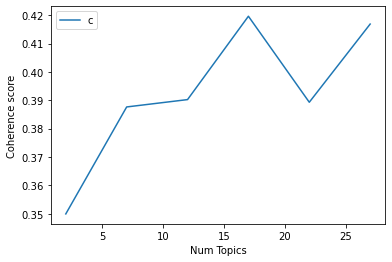

In [123]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [124]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 17

index: 0 | Num Topics = 2  has Coherence Value of 0.3499
index: 1 | Num Topics = 7  has Coherence Value of 0.3877
index: 2 | Num Topics = 12  has Coherence Value of 0.3902
index: 3 | Num Topics = 17  has Coherence Value of 0.4197
index: 4 | Num Topics = 22  has Coherence Value of 0.3893
index: 5 | Num Topics = 27  has Coherence Value of 0.4169


In [191]:
# Select optimal number of topics
optimal_model_us_score1N2N3 = model_list_us_score1N2N3[3]

In [192]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_score1N2N3, corpus_us_score1N2N3, id2word_us_score1N2N3)

In [193]:
print("pyLDAVis for us topics for score=1,2,3:")
vis_us_score1N2N3

pyLDAVis for us topics for score=1,2,3:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.228754 -0.126271       1        1  38.987603
4     -0.186343 -0.114403       2        1  13.470700
1     -0.162397 -0.147690       3        1  12.674517
12    -0.204832  0.066254       4        1   9.497030
14    -0.084365  0.282684       5        1   4.844187
9     -0.165367  0.226396       6        1   3.577836
8     -0.178627 -0.090771       7        1   2.828968
0     -0.104528  0.159881       8        1   2.509431
2      0.136990 -0.099587       9        1   2.284338
16     0.159269 -0.021669      10        1   1.791767
6      0.054739 -0.092883      11        1   1.463305
11    -0.048847 -0.160930      12        1   1.392320
10     0.232367 -0.062001      13        1   1.173139
3      0.073868  0.068910      14        1   1.115759
13     0.220372  0.105684      15        1   0.999842
15     0.240448  0.011158      16        1   0.908580
5      0.246005 -0.004760      17        1   0.480676, topic_info=            Term         Freq        Total Category  logprob  loglift
234         snap  2370.000000  2370.000000  Default  30.0000  30.0000
24           app  4559.000000  4559.000000  Default  29.0000  29.0000
358      account  2472.000000  2472.000000  Default  28.0000  28.0000
20      snapchat  4435.000000  4435.000000  Default  27.0000  27.0000
19          send  1400.000000  1400.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
736   microphone     5.218409    14.976903  Topic17  -4.8587   4.2834
1125      adjust     2.075516     6.924725  Topic17  -5.7807   4.1328
1690   excellent     1.360481     4.134794  Topic17  -6.2031   4.2261
626      massive     1.412369     5.747550  Topic17  -6.1657   3.9342
2329  originally     1.112787     9.006802  Topic17  -6.4041   3.2466

[978 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
357       2  0.973160  ability
53        1  0.380850     able
53        2  0.166502     able
53        3  0.199037     able
53        4  0.145450     able
...     ...       ...      ...
674       6  0.094663      yet
674      11  0.276706      yet
675      16  0.907198    youth
2845     11  0.679285       yr
219       2  0.984806     zoom

[1416 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 5, 2, 13, 15, 10, 9, 1, 3, 17, 7, 12, 11, 4, 14, 16, 6])

# By-rating of each year

## By-rating of 2019 (Rating=1,2,3)

In [131]:
# By-rating Topic Modelling - rating = 1,2,3 in 2019
# Convert to list - move to each section
review_us_2019_score1N2N3 = snapchat_ios_us_review_YearMonth_2019_score1N2N3.review.values.tolist()
review_words_us_2019_score1N2N3 = list(sent_to_words(review_us_2019_score1N2N3))
print(review_words_us_2019_score1N2N3[:1])

[['often', 'use', 'snapchat', 'to', 'text', 'friends', 'but', 'recently', 'one', 'of', 'my', 'group', 'chats', 'have', 'received', 'many', 'glitches', 'everything', 'seems', 'to', 'be', 'delayed', 'when', 'send', 'things', 'it', 'doesn', 'send', 'for', 'about', 'minute', 'and', 'no', 'it', 'is', 'not', 'my', 'internet', 'connection', 'because', 'have', 'been', 'using', 'data', 'to', 'see', 'if', 'my', 'internet', 'was', 'the', 'problem', 'which', 'it', 'not', 'also', 'when', 'go', 'to', 'save', 'chats', 'it', 'very', 'delayed', 'it', 'will', 'take', 'about', 'minute', 'to', 'save', 'something', 'please', 'fix', 'this', 'do', 'enjoy', 'all', 'other', 'factors', 'of', 'the', 'app', 'such', 'as', 'news', 'stories', 'and', 'filters']]


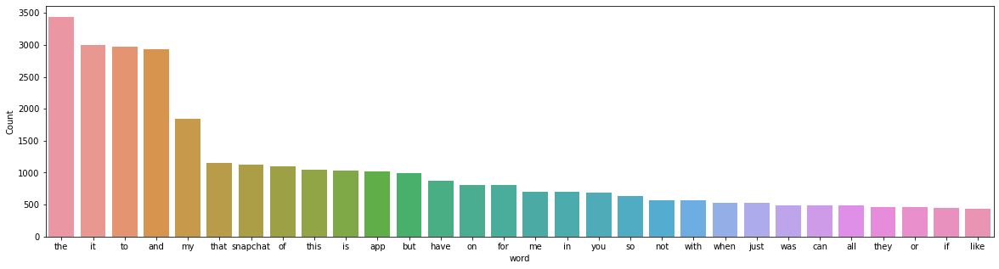

In [132]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2019_score1N2N3))

In [133]:
# Clean text
review_words_us_ready_2019_score1N2N3 = process_words(review_words_us_2019_score1N2N3)  # processed Text Data! - move to each section

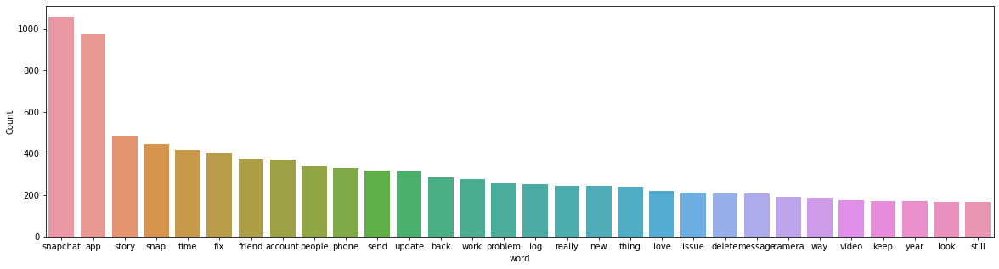

In [134]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2019_score1N2N3))


In [135]:
# Create Dictionary
id2word_us_2019_score1N2N3 = corpora.Dictionary(review_words_us_ready_2019_score1N2N3)

2021-10-17 01:59:36,881 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-17 01:59:37,145 [INFO] gensim.corpora.dictionary - built Dictionary(2782 unique tokens: ['chat', 'connection', 'datum', 'delay', 'enjoy']...) from 681 documents (total 31378 corpus positions)
2021-10-17 01:59:37,149 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(2782 unique tokens: ['chat', 'connection', 'datum', 'delay', 'enjoy']...) from 681 documents (total 31378 corpus positions)", 'datetime': '2021-10-17T01:59:37.149312', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [136]:
# Create Corpus: Term Document Frequency
corpus_us_2019_score1N2N3 = [id2word_us_2019_score1N2N3.doc2bow(text) for text in review_words_us_ready_2019_score1N2N3]

In [137]:
# Training LDA model
model_list_us_2019_score1N2N3, coherence_values_us_2019_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2019_score1N2N3, corpus=corpus_us_2019_score1N2N3, 
                                                              texts=review_words_us_ready_2019_score1N2N3, limit=30, start=2, step=5)


2021-10-17 01:59:37,297 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-17 01:59:37,298 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-17 01:59:37,304 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-17 01:59:37,310 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 681 documents, updating model once every 681 documents, evaluating perplexity every 681 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-17 01:59:40,689 [INFO] gensim.models.ldamodel - -8.393 per-word bound, 336.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 01:59:40,692 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #681/681
2021-10-17 01:59:43,763 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.038*"snapchat" + 0.032*"app" + 0.015*"account" + 0.013*"time" + 0.013*"fix" + 0.012*"friend" + 0.011*

2021-10-17 02:00:28,195 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.025*"app" + 0.024*"story" + 0.015*"snap" + 0.012*"update" + 0.012*"fix" + 0.012*"people" + 0.011*"time" + 0.011*"camera" + 0.009*"phone"
2021-10-17 02:00:28,196 [INFO] gensim.models.ldamodel - topic diff=0.025954, rho=0.301511
2021-10-17 02:00:30,316 [INFO] gensim.models.ldamodel - -6.481 per-word bound, 89.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:00:30,317 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #681/681
2021-10-17 02:00:32,199 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"snapchat" + 0.033*"app" + 0.023*"account" + 0.015*"log" + 0.014*"friend" + 0.013*"time" + 0.012*"fix" + 0.012*"send" + 0.011*"snap" + 0.010*"work"
2021-10-17 02:00:32,200 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.025*"app" + 0.024*"story" + 0.015*"snap" + 0.012*"update" + 0.012*"people" + 0.012*"fix" + 0.0

2021-10-17 02:01:06,531 [INFO] gensim.models.ldamodel - topic diff=0.013293, rho=0.218218
2021-10-17 02:01:08,547 [INFO] gensim.models.ldamodel - -6.470 per-word bound, 88.6 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:01:08,548 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #681/681
2021-10-17 02:01:10,063 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.037*"snapchat" + 0.033*"app" + 0.024*"account" + 0.016*"log" + 0.014*"time" + 0.014*"friend" + 0.013*"send" + 0.012*"fix" + 0.012*"snap" + 0.011*"phone"
2021-10-17 02:01:10,066 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.026*"snapchat" + 0.025*"app" + 0.024*"story" + 0.014*"snap" + 0.012*"update" + 0.012*"people" + 0.011*"fix" + 0.011*"time" + 0.010*"camera" + 0.009*"friend"
2021-10-17 02:01:10,067 [INFO] gensim.models.ldamodel - topic diff=0.012763, rho=0.213201
2021-10-17 02:01:12,005 [INFO] gensim.models.ldamodel - -6.469 per-word bound, 88.6 perplexity es

2021-10-17 02:01:44,816 [INFO] gensim.models.ldamodel - -6.465 per-word bound, 88.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:01:44,818 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #681/681
2021-10-17 02:01:46,401 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"snapchat" + 0.033*"app" + 0.025*"account" + 0.017*"log" + 0.015*"send" + 0.014*"time" + 0.013*"friend" + 0.013*"snap" + 0.013*"fix" + 0.012*"message"
2021-10-17 02:01:46,405 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"snapchat" + 0.025*"app" + 0.024*"story" + 0.013*"snap" + 0.012*"update" + 0.012*"people" + 0.011*"fix" + 0.011*"time" + 0.010*"camera" + 0.009*"friend"
2021-10-17 02:01:46,412 [INFO] gensim.models.ldamodel - topic diff=0.007672, rho=0.176777
2021-10-17 02:01:48,701 [INFO] gensim.models.ldamodel - -6.464 per-word bound, 88.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:01:48,

2021-10-17 02:02:19,951 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #681/681
2021-10-17 02:02:21,339 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"snapchat" + 0.034*"app" + 0.025*"account" + 0.017*"log" + 0.015*"send" + 0.014*"time" + 0.014*"snap" + 0.013*"friend" + 0.013*"fix" + 0.012*"message"
2021-10-17 02:02:21,347 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.027*"snapchat" + 0.025*"app" + 0.024*"story" + 0.013*"snap" + 0.012*"update" + 0.012*"people" + 0.011*"fix" + 0.011*"time" + 0.010*"camera" + 0.009*"friend"
2021-10-17 02:02:21,373 [INFO] gensim.models.ldamodel - topic diff=0.005213, rho=0.154303
2021-10-17 02:02:23,300 [INFO] gensim.models.ldamodel - -6.462 per-word bound, 88.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:02:23,301 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #681/681
2021-10-17 02:02:24,668 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"snapchat

2021-10-17 02:02:55,903 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-17 02:03:02,250 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-17 02:03:02,290 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 681 virtual documents
2021-10-17 02:03:02,894 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-17 02:03:02,895 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-17 02:03:02,899 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-17 02:03:02,905 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 681 documents, updating model once every 681 documents, evaluating perplexity every 681 documents, iterating 50x with a con

2021-10-17 02:03:27,356 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"app" + 0.038*"snapchat" + 0.028*"account" + 0.020*"log" + 0.018*"fix" + 0.016*"time" + 0.016*"phone" + 0.014*"work" + 0.013*"back" + 0.012*"problem"
2021-10-17 02:03:27,360 [INFO] gensim.models.ldamodel - topic diff=0.156801, rho=0.408248
2021-10-17 02:03:29,277 [INFO] gensim.models.ldamodel - -6.645 per-word bound, 100.1 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:03:29,278 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #681/681
2021-10-17 02:03:30,650 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.025*"app" + 0.024*"snap" + 0.019*"camera" + 0.018*"snapchat" + 0.016*"send" + 0.015*"people" + 0.013*"story" + 0.012*"update" + 0.011*"picture" + 0.010*"iphone"
2021-10-17 02:03:30,656 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.029*"snapchat" + 0.022*"story" + 0.014*"iphone" + 0.012*"fix" + 0.012*"app" + 0.012*"video" + 0.012*"time"

2021-10-17 02:03:49,902 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.027*"snapchat" + 0.023*"story" + 0.015*"iphone" + 0.014*"video" + 0.012*"fix" + 0.012*"app" + 0.011*"really" + 0.011*"phone" + 0.011*"time" + 0.011*"people"
2021-10-17 02:03:49,911 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.023*"app" + 0.023*"snap" + 0.021*"camera" + 0.018*"snapchat" + 0.015*"send" + 0.015*"people" + 0.013*"update" + 0.013*"story" + 0.013*"photo" + 0.012*"picture"
2021-10-17 02:03:49,932 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.026*"app" + 0.026*"story" + 0.024*"snapchat" + 0.019*"friend" + 0.015*"snap" + 0.014*"chat" + 0.013*"people" + 0.012*"time" + 0.010*"ad" + 0.009*"way"
2021-10-17 02:03:49,934 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.030*"app" + 0.026*"snapchat" + 0.016*"snap" + 0.016*"people" + 0.013*"friend" + 0.013*"send" + 0.011*"thing" + 0.011*"time" + 0.010*"streak" + 0.009*"update"
2021-10-17 02:03:49,936 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-17 02:04:05,641 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.023*"camera" + 0.022*"snap" + 0.022*"app" + 0.018*"snapchat" + 0.014*"send" + 0.014*"people" + 0.014*"photo" + 0.014*"update" + 0.012*"story" + 0.012*"picture"
2021-10-17 02:04:05,642 [INFO] gensim.models.ldamodel - topic diff=0.022341, rho=0.242536
2021-10-17 02:04:07,409 [INFO] gensim.models.ldamodel - -6.596 per-word bound, 96.8 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:04:07,411 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #681/681
2021-10-17 02:04:08,694 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.025*"snapchat" + 0.025*"story" + 0.015*"video" + 0.014*"iphone" + 0.012*"really" + 0.012*"fix" + 0.012*"app" + 0.011*"phone" + 0.011*"people" + 0.011*"time"
2021-10-17 02:04:08,695 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.029*"app" + 0.024*"snapchat" + 0.016*"people" + 0.016*"snap" + 0.013*"friend" + 0.012*"send" + 0.011*"th

2021-10-17 02:04:25,491 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.028*"app" + 0.023*"snapchat" + 0.016*"people" + 0.015*"snap" + 0.013*"friend" + 0.012*"send" + 0.012*"streak" + 0.011*"thing" + 0.011*"time" + 0.009*"save"
2021-10-17 02:04:25,493 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.026*"story" + 0.025*"snapchat" + 0.015*"video" + 0.014*"iphone" + 0.012*"really" + 0.012*"fix" + 0.011*"app" + 0.011*"people" + 0.011*"time" + 0.011*"phone"
2021-10-17 02:04:25,495 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.026*"camera" + 0.022*"snap" + 0.022*"app" + 0.018*"snapchat" + 0.014*"photo" + 0.014*"people" + 0.014*"update" + 0.014*"send" + 0.013*"picture" + 0.012*"story"
2021-10-17 02:04:25,497 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.034*"filter" + 0.012*"snapchat" + 0.010*"app" + 0.009*"story" + 0.008*"discover" + 0.007*"guy" + 0.007*"old" + 0.007*"back" + 0.006*"list" + 0.006*"pay"
2021-10-17 02:04:25,501 [INFO] gensim.models.ldamodel - topic diff=0.0

2021-10-17 02:04:42,839 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"snapchat" + 0.040*"app" + 0.029*"account" + 0.020*"log" + 0.018*"fix" + 0.018*"time" + 0.017*"phone" + 0.015*"snap" + 0.015*"work" + 0.014*"problem"
2021-10-17 02:04:42,841 [INFO] gensim.models.ldamodel - topic diff=0.010896, rho=0.188982
2021-10-17 02:04:44,564 [INFO] gensim.models.ldamodel - -6.584 per-word bound, 95.9 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:04:44,565 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #681/681
2021-10-17 02:04:45,828 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.034*"filter" + 0.011*"snapchat" + 0.010*"app" + 0.008*"story" + 0.008*"discover" + 0.007*"guy" + 0.007*"old" + 0.007*"back" + 0.006*"list" + 0.006*"pay"
2021-10-17 02:04:45,829 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.027*"story" + 0.024*"snapchat" + 0.015*"video" + 0.013*"really" + 0.012*"iphone" + 0.011*"app" + 0.011*"people" + 

2021-10-17 02:05:01,675 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.040*"snapchat" + 0.025*"app" + 0.024*"update" + 0.017*"issue" + 0.016*"video" + 0.016*"fix" + 0.015*"camera" + 0.015*"iphone" + 0.014*"story" + 0.014*"look"
2021-10-17 02:05:01,782 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.028*"app" + 0.022*"snapchat" + 0.016*"people" + 0.014*"snap" + 0.014*"friend" + 0.013*"streak" + 0.011*"send" + 0.011*"thing" + 0.010*"time" + 0.010*"save"
2021-10-17 02:05:01,796 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"snapchat" + 0.040*"app" + 0.028*"account" + 0.019*"log" + 0.018*"fix" + 0.018*"time" + 0.017*"phone" + 0.015*"snap" + 0.014*"work" + 0.014*"problem"
2021-10-17 02:05:01,800 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.031*"camera" + 0.021*"app" + 0.021*"snap" + 0.018*"snapchat" + 0.015*"photo" + 0.014*"people" + 0.013*"update" + 0.013*"picture" + 0.012*"send" + 0.012*"iphone"
2021-10-17 02:05:01,803 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-17 02:05:18,441 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.028*"app" + 0.021*"snapchat" + 0.016*"people" + 0.014*"friend" + 0.014*"snap" + 0.013*"streak" + 0.011*"thing" + 0.011*"send" + 0.010*"time" + 0.010*"save"
2021-10-17 02:05:18,446 [INFO] gensim.models.ldamodel - topic diff=0.007378, rho=0.160128
2021-10-17 02:05:20,638 [INFO] gensim.models.ldamodel - -6.577 per-word bound, 95.5 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:05:20,683 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #681/681
2021-10-17 02:05:21,921 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.032*"story" + 0.025*"app" + 0.022*"snapchat" + 0.018*"friend" + 0.015*"chat" + 0.015*"people" + 0.013*"snap" + 0.012*"ad" + 0.011*"time" + 0.011*"way"
2021-10-17 02:05:21,924 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.035*"filter" + 0.011*"snapchat" + 0.009*"app" + 0.007*"story" + 0.007*"discover" + 0.007*"old" + 0.007*"back" + 0.

2021-10-17 02:05:37,805 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.035*"filter" + 0.011*"snapchat" + 0.009*"app" + 0.007*"discover" + 0.007*"story" + 0.007*"back" + 0.007*"list" + 0.007*"old" + 0.006*"pay" + 0.006*"user"
2021-10-17 02:05:37,820 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.033*"camera" + 0.020*"app" + 0.020*"snap" + 0.017*"snapchat" + 0.016*"photo" + 0.014*"people" + 0.014*"picture" + 0.013*"update" + 0.012*"iphone" + 0.012*"change"
2021-10-17 02:05:37,823 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.042*"snapchat" + 0.025*"app" + 0.024*"update" + 0.018*"iphone" + 0.018*"video" + 0.017*"fix" + 0.017*"camera" + 0.017*"issue" + 0.015*"look" + 0.013*"picture"
2021-10-17 02:05:37,828 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"snapchat" + 0.040*"app" + 0.027*"account" + 0.019*"log" + 0.018*"fix" + 0.017*"time" + 0.016*"phone" + 0.016*"snap" + 0.015*"send" + 0.015*"work"
2021-10-17 02:05:37,833 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-17 02:05:53,108 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.042*"snapchat" + 0.025*"app" + 0.024*"update" + 0.020*"iphone" + 0.018*"camera" + 0.018*"video" + 0.018*"fix" + 0.017*"issue" + 0.015*"look" + 0.014*"picture"
2021-10-17 02:05:53,115 [INFO] gensim.models.ldamodel - topic diff=0.005920, rho=0.141421
2021-10-17 02:05:54,916 [INFO] gensim.models.ldamodel - -6.571 per-word bound, 95.1 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:05:54,945 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #681/681
2021-10-17 02:05:56,107 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.033*"camera" + 0.020*"app" + 0.019*"snap" + 0.016*"snapchat" + 0.016*"photo" + 0.014*"people" + 0.014*"picture" + 0.013*"update" + 0.012*"change" + 0.012*"iphone"
2021-10-17 02:05:56,110 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"snapchat" + 0.040*"app" + 0.027*"account" + 0.019*"log" + 0.018*"fix" + 0.017*"time" + 0.016*"

2021-10-17 02:06:19,713 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.024*"app" + 0.018*"video" + 0.017*"snapchat" + 0.016*"back" + 0.016*"friend" + 0.014*"log" + 0.013*"thing" + 0.012*"time" + 0.010*"people" + 0.010*"way"
2021-10-17 02:06:19,730 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.038*"app" + 0.028*"snapchat" + 0.016*"snap" + 0.015*"people" + 0.013*"update" + 0.012*"send" + 0.010*"friend" + 0.010*"time" + 0.009*"notification" + 0.008*"account"
2021-10-17 02:06:19,732 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.027*"filter" + 0.024*"snapchat" + 0.014*"story" + 0.014*"app" + 0.010*"back" + 0.009*"time" + 0.009*"change" + 0.009*"discover" + 0.008*"way" + 0.007*"list"
2021-10-17 02:06:19,735 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.039*"app" + 0.023*"friend" + 0.022*"send" + 0.021*"snap" + 0.020*"snapchat" + 0.012*"story" + 0.012*"thing" + 0.012*"work" + 0.012*"ad" + 0.012*"phone"
2021-10-17 02:06:19,737 [INFO] gensim.models.ldamodel - topic diff=

2021-10-17 02:06:36,974 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.045*"story" + 0.026*"snapchat" + 0.018*"snap" + 0.015*"time" + 0.013*"fix" + 0.012*"people" + 0.012*"watch" + 0.011*"video" + 0.009*"phone" + 0.009*"new"
2021-10-17 02:06:36,975 [INFO] gensim.models.ldamodel - topic diff=0.087573, rho=0.316228
2021-10-17 02:06:38,702 [INFO] gensim.models.ldamodel - -6.711 per-word bound, 104.7 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:06:38,704 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #681/681
2021-10-17 02:06:40,347 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.041*"snapchat" + 0.032*"app" + 0.022*"camera" + 0.020*"fix" + 0.018*"issue" + 0.016*"phone" + 0.016*"iphone" + 0.015*"problem" + 0.013*"picture" + 0.013*"time"
2021-10-17 02:06:40,350 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.046*"story" + 0.025*"snapchat" + 0.018*"snap" + 0.015*"time" + 0.013*"fix" + 0.013*"people" + 0.012*"watch"

2021-10-17 02:06:58,103 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.023*"app" + 0.023*"video" + 0.017*"friend" + 0.016*"thing" + 0.014*"back" + 0.013*"snapchat" + 0.010*"save" + 0.010*"happen" + 0.009*"time" + 0.009*"people"
2021-10-17 02:06:58,111 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.044*"app" + 0.033*"send" + 0.027*"snap" + 0.026*"friend" + 0.018*"snapchat" + 0.015*"work" + 0.015*"message" + 0.014*"story" + 0.013*"ad" + 0.012*"time"
2021-10-17 02:06:58,115 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.054*"story" + 0.023*"snapchat" + 0.019*"snap" + 0.016*"time" + 0.014*"watch" + 0.013*"fix" + 0.013*"people" + 0.012*"video" + 0.010*"post" + 0.010*"read"
2021-10-17 02:06:58,117 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.042*"snapchat" + 0.033*"app" + 0.024*"camera" + 0.020*"fix" + 0.018*"issue" + 0.017*"iphone" + 0.016*"phone" + 0.014*"problem" + 0.014*"picture" + 0.013*"update"
2021-10-17 02:06:58,121 [INFO] gensim.models.ldamodel - topic diff=0.

2021-10-17 02:07:15,193 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.042*"snapchat" + 0.037*"message" + 0.021*"load" + 0.020*"send" + 0.017*"story" + 0.012*"app" + 0.011*"people" + 0.011*"snap" + 0.010*"time" + 0.009*"forever"
2021-10-17 02:07:15,196 [INFO] gensim.models.ldamodel - topic diff=0.023255, rho=0.218218
2021-10-17 02:07:17,472 [INFO] gensim.models.ldamodel - -6.669 per-word bound, 101.8 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:07:17,475 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #681/681
2021-10-17 02:07:19,073 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.037*"app" + 0.024*"snapchat" + 0.015*"people" + 0.012*"update" + 0.012*"snap" + 0.011*"notification" + 0.010*"friend" + 0.010*"send" + 0.010*"bad" + 0.009*"time"
2021-10-17 02:07:19,080 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.028*"story" + 0.027*"snapchat" + 0.025*"update" + 0.023*"app" + 0.016*"bug" + 0.015*"time" + 0.012*

2021-10-17 02:07:35,349 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.049*"app" + 0.035*"send" + 0.032*"snap" + 0.026*"friend" + 0.019*"snapchat" + 0.018*"work" + 0.017*"message" + 0.014*"story" + 0.014*"time" + 0.013*"problem"
2021-10-17 02:07:35,350 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.054*"account" + 0.045*"snapchat" + 0.033*"log" + 0.032*"app" + 0.019*"lock" + 0.017*"back" + 0.016*"fix" + 0.016*"time" + 0.015*"phone" + 0.013*"email"
2021-10-17 02:07:35,352 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.028*"story" + 0.027*"snapchat" + 0.025*"update" + 0.023*"app" + 0.017*"bug" + 0.016*"time" + 0.012*"post" + 0.011*"show" + 0.011*"view" + 0.011*"people"
2021-10-17 02:07:35,355 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.043*"snapchat" + 0.036*"message" + 0.021*"load" + 0.020*"send" + 0.016*"story" + 0.011*"app" + 0.011*"people" + 0.010*"forever" + 0.010*"time" + 0.010*"snap"
2021-10-17 02:07:35,357 [INFO] gensim.models.ldamodel - topic diff=0.0173

2021-10-17 02:07:52,150 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.056*"account" + 0.046*"snapchat" + 0.034*"log" + 0.031*"app" + 0.020*"lock" + 0.017*"back" + 0.016*"fix" + 0.016*"time" + 0.015*"phone" + 0.014*"email"
2021-10-17 02:07:52,156 [INFO] gensim.models.ldamodel - topic diff=0.014457, rho=0.176777
2021-10-17 02:07:53,993 [INFO] gensim.models.ldamodel - -6.648 per-word bound, 100.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:07:54,013 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #681/681
2021-10-17 02:07:55,250 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.051*"app" + 0.035*"send" + 0.033*"snap" + 0.025*"friend" + 0.020*"snapchat" + 0.019*"work" + 0.017*"message" + 0.015*"time" + 0.015*"story" + 0.014*"problem"
2021-10-17 02:07:55,252 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.035*"app" + 0.023*"snapchat" + 0.014*"people" + 0.011*"update" + 0.011*"bad" + 0.010*"friend" + 0.010*"notifi

2021-10-17 02:08:10,806 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.034*"app" + 0.023*"snapchat" + 0.014*"people" + 0.011*"bad" + 0.011*"update" + 0.010*"friend" + 0.009*"notification" + 0.009*"streak" + 0.008*"time" + 0.008*"snap"
2021-10-17 02:08:10,812 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.027*"story" + 0.027*"snapchat" + 0.027*"update" + 0.021*"app" + 0.018*"bug" + 0.016*"time" + 0.012*"post" + 0.011*"view" + 0.010*"people" + 0.010*"show"
2021-10-17 02:08:10,816 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.042*"snapchat" + 0.034*"message" + 0.020*"load" + 0.016*"send" + 0.016*"story" + 0.010*"people" + 0.010*"forever" + 0.010*"app" + 0.009*"time" + 0.008*"keep"
2021-10-17 02:08:10,821 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.026*"video" + 0.023*"app" + 0.017*"friend" + 0.015*"thing" + 0.014*"back" + 0.011*"snapchat" + 0.010*"save" + 0.010*"picture" + 0.010*"happen" + 0.009*"snap"
2021-10-17 02:08:10,823 [INFO] gensim.models.ldamodel - topic 

2021-10-17 02:08:27,553 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.052*"app" + 0.034*"snap" + 0.034*"send" + 0.024*"friend" + 0.021*"snapchat" + 0.021*"work" + 0.018*"message" + 0.016*"time" + 0.016*"problem" + 0.015*"story"
2021-10-17 02:08:27,556 [INFO] gensim.models.ldamodel - topic diff=0.010743, rho=0.152499
2021-10-17 02:08:29,233 [INFO] gensim.models.ldamodel - -6.634 per-word bound, 99.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:08:29,235 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #681/681
2021-10-17 02:08:30,437 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.020*"snap" + 0.019*"add" + 0.018*"story" + 0.017*"people" + 0.017*"change" + 0.015*"app" + 0.014*"back" + 0.012*"update" + 0.012*"snapchat" + 0.011*"able"
2021-10-17 02:08:30,439 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.033*"app" + 0.023*"snapchat" + 0.014*"people" + 0.011*"bad" + 0.010*"update" + 0.010*"friend" + 0.009*"stre

2021-10-17 02:08:46,564 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.027*"snapchat" + 0.027*"update" + 0.026*"story" + 0.019*"app" + 0.018*"bug" + 0.015*"time" + 0.011*"view" + 0.011*"video" + 0.010*"post" + 0.010*"people"
2021-10-17 02:08:46,600 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.045*"snapchat" + 0.033*"app" + 0.029*"camera" + 0.022*"iphone" + 0.020*"fix" + 0.018*"issue" + 0.017*"phone" + 0.016*"picture" + 0.014*"update" + 0.013*"look"
2021-10-17 02:08:46,601 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.021*"add" + 0.020*"snap" + 0.018*"story" + 0.017*"people" + 0.017*"change" + 0.015*"app" + 0.014*"back" + 0.012*"update" + 0.011*"able" + 0.011*"snapchat"
2021-10-17 02:08:46,603 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.032*"filter" + 0.017*"ad" + 0.017*"snapchat" + 0.015*"app" + 0.013*"story" + 0.011*"user" + 0.010*"discover" + 0.010*"list" + 0.009*"delete" + 0.009*"pay"
2021-10-17 02:08:46,604 [INFO] gensim.models.ldamodel - topic diff=0.0090

2021-10-17 02:09:11,041 [INFO] gensim.models.ldamodel - topic diff=0.529434, rho=0.577350
2021-10-17 02:09:13,232 [INFO] gensim.models.ldamodel - -6.977 per-word bound, 126.0 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:09:13,233 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #681/681
2021-10-17 02:09:14,835 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.052*"app" + 0.032*"snapchat" + 0.020*"fix" + 0.018*"work" + 0.016*"phone" + 0.014*"time" + 0.013*"story" + 0.012*"snap" + 0.011*"really" + 0.010*"back"
2021-10-17 02:09:14,837 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.035*"snapchat" + 0.031*"app" + 0.017*"people" + 0.016*"friend" + 0.011*"day" + 0.011*"update" + 0.010*"really" + 0.010*"snap" + 0.010*"time" + 0.010*"account"
2021-10-17 02:09:14,848 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.027*"snapchat" + 0.020*"story" + 0.015*"guy" + 0.013*"app" + 0.012*"new" + 0.010*"time" + 0.008*"old" + 0.008*

2021-10-17 02:09:32,128 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.036*"account" + 0.032*"password" + 0.031*"snapchat" + 0.027*"email" + 0.026*"log" + 0.017*"change" + 0.017*"back" + 0.016*"memory" + 0.015*"snap" + 0.014*"app"
2021-10-17 02:09:32,130 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.057*"app" + 0.033*"snapchat" + 0.022*"fix" + 0.022*"work" + 0.018*"phone" + 0.016*"time" + 0.014*"snap" + 0.013*"story" + 0.013*"delete" + 0.013*"log"
2021-10-17 02:09:32,133 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.040*"app" + 0.034*"snap" + 0.023*"friend" + 0.022*"send" + 0.022*"snapchat" + 0.020*"people" + 0.016*"story" + 0.016*"problem" + 0.013*"thing" + 0.011*"back"
2021-10-17 02:09:32,135 [INFO] gensim.models.ldamodel - topic diff=0.143589, rho=0.333333
2021-10-17 02:09:34,017 [INFO] gensim.models.ldamodel - -6.780 per-word bound, 109.9 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:09:34,019 [INFO] gensim.models.

2021-10-17 02:09:49,895 [INFO] gensim.models.ldamodel - topic diff=0.056762, rho=0.267261
2021-10-17 02:09:51,886 [INFO] gensim.models.ldamodel - -6.743 per-word bound, 107.1 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:09:51,887 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #681/681
2021-10-17 02:09:53,310 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.044*"story" + 0.032*"app" + 0.031*"snapchat" + 0.021*"send" + 0.020*"update" + 0.019*"bug" + 0.018*"post" + 0.017*"fix" + 0.016*"time" + 0.015*"friend"
2021-10-17 02:09:53,312 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.039*"snapchat" + 0.031*"app" + 0.025*"camera" + 0.022*"fix" + 0.019*"picture" + 0.018*"issue" + 0.018*"phone" + 0.017*"video" + 0.016*"problem" + 0.016*"iphone"
2021-10-17 02:09:53,314 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.056*"filter" + 0.017*"snapchat" + 0.016*"back" + 0.013*"let" + 0.012*"story" + 0.010*"button" + 0.009*"cha

2021-10-17 02:10:10,282 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.052*"snapchat" + 0.026*"message" + 0.017*"load" + 0.017*"send" + 0.014*"story" + 0.010*"time" + 0.009*"forever" + 0.009*"post" + 0.009*"show" + 0.009*"receive"
2021-10-17 02:10:10,284 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.040*"snapchat" + 0.031*"app" + 0.030*"camera" + 0.022*"fix" + 0.021*"picture" + 0.019*"iphone" + 0.019*"phone" + 0.018*"issue" + 0.017*"video" + 0.015*"problem"
2021-10-17 02:10:10,287 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.080*"account" + 0.044*"snapchat" + 0.036*"lock" + 0.029*"log" + 0.021*"app" + 0.016*"new" + 0.015*"back" + 0.012*"time" + 0.012*"phone" + 0.011*"people"
2021-10-17 02:10:10,289 [INFO] gensim.models.ldamodel - topic diff=0.028038, rho=0.223607
2021-10-17 02:10:12,218 [INFO] gensim.models.ldamodel - -6.718 per-word bound, 105.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:10:12,220 [INFO] gensim.mo

2021-10-17 02:10:26,167 [INFO] gensim.models.ldamodel - topic diff=0.020292, rho=0.200000
2021-10-17 02:10:28,150 [INFO] gensim.models.ldamodel - -6.703 per-word bound, 104.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:10:28,152 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #681/681
2021-10-17 02:10:29,477 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.027*"story" + 0.027*"snapchat" + 0.026*"app" + 0.019*"ad" + 0.015*"friend" + 0.014*"people" + 0.011*"page" + 0.010*"way" + 0.009*"discover" + 0.009*"time"
2021-10-17 02:10:29,483 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.062*"filter" + 0.016*"back" + 0.014*"snapchat" + 0.012*"let" + 0.010*"change" + 0.010*"button" + 0.010*"story" + 0.009*"keep" + 0.008*"favorite" + 0.008*"list"
2021-10-17 02:10:29,492 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.029*"snapchat" + 0.022*"app" + 0.018*"friend" + 0.017*"people" + 0.014*"really" + 0.009*"thing" + 0.009*

2021-10-17 02:10:47,224 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.021*"snapchat" + 0.017*"guy" + 0.016*"story" + 0.012*"community" + 0.010*"discover" + 0.010*"old" + 0.010*"year" + 0.009*"user" + 0.008*"ad" + 0.008*"gay"
2021-10-17 02:10:47,230 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.039*"snap" + 0.020*"story" + 0.019*"change" + 0.019*"app" + 0.017*"people" + 0.017*"add" + 0.014*"memory" + 0.013*"location" + 0.012*"snapchat" + 0.012*"camera"
2021-10-17 02:10:47,241 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.027*"chat" + 0.025*"story" + 0.023*"save" + 0.019*"snapchat" + 0.015*"time" + 0.014*"video" + 0.013*"snap" + 0.013*"app" + 0.012*"group" + 0.012*"way"
2021-10-17 02:10:47,243 [INFO] gensim.models.ldamodel - topic diff=0.015057, rho=0.179605
2021-10-17 02:10:49,073 [INFO] gensim.models.ldamodel - -6.692 per-word bound, 103.4 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:10:49,075 [INFO] gensim.models.lda

2021-10-17 02:11:02,796 [INFO] gensim.models.ldamodel - topic diff=0.012219, rho=0.166667
2021-10-17 02:11:04,674 [INFO] gensim.models.ldamodel - -6.684 per-word bound, 102.9 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:11:04,676 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #681/681
2021-10-17 02:11:05,912 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.063*"app" + 0.037*"snapchat" + 0.025*"work" + 0.023*"fix" + 0.021*"phone" + 0.021*"time" + 0.018*"delete" + 0.017*"snap" + 0.017*"problem" + 0.016*"open"
2021-10-17 02:11:05,913 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.036*"message" + 0.029*"snapchat" + 0.027*"friend" + 0.025*"send" + 0.024*"app" + 0.016*"people" + 0.014*"fix" + 0.010*"happen" + 0.010*"way" + 0.009*"time"
2021-10-17 02:11:05,918 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.028*"story" + 0.026*"snapchat" + 0.025*"app" + 0.024*"ad" + 0.014*"people" + 0.014*"friend" + 0.012*"page" + 

2021-10-17 02:11:21,354 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.020*"snapchat" + 0.017*"guy" + 0.015*"story" + 0.012*"community" + 0.011*"old" + 0.011*"discover" + 0.010*"year" + 0.009*"user" + 0.009*"ad" + 0.008*"gay"
2021-10-17 02:11:21,357 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.031*"app" + 0.019*"snapchat" + 0.014*"update" + 0.012*"able" + 0.012*"snap" + 0.011*"people" + 0.010*"keep" + 0.010*"still" + 0.009*"picture" + 0.009*"bad"
2021-10-17 02:11:21,360 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.069*"filter" + 0.015*"back" + 0.014*"snapchat" + 0.012*"let" + 0.011*"change" + 0.009*"button" + 0.009*"favorite" + 0.009*"keep" + 0.009*"list" + 0.008*"story"
2021-10-17 02:11:21,361 [INFO] gensim.models.ldamodel - topic diff=0.009879, rho=0.154303
2021-10-17 02:11:23,291 [INFO] gensim.models.ldamodel - -6.677 per-word bound, 102.3 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:11:23,296 [INFO] gensim.models

2021-10-17 02:11:38,029 [INFO] gensim.models.ldamodel - topic diff=0.008472, rho=0.145865
2021-10-17 02:11:39,674 [INFO] gensim.models.ldamodel - -6.672 per-word bound, 102.0 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:11:39,675 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #681/681
2021-10-17 02:11:41,155 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.028*"snapchat" + 0.021*"app" + 0.018*"friend" + 0.018*"people" + 0.015*"really" + 0.009*"thing" + 0.008*"time" + 0.008*"turn" + 0.008*"update" + 0.007*"work"
2021-10-17 02:11:41,159 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.020*"snapchat" + 0.017*"guy" + 0.015*"story" + 0.012*"community" + 0.011*"old" + 0.011*"discover" + 0.010*"year" + 0.009*"user" + 0.009*"ad" + 0.009*"gay"
2021-10-17 02:11:41,164 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.036*"message" + 0.029*"snapchat" + 0.027*"friend" + 0.025*"send" + 0.022*"app" + 0.016*"people" + 0.013*"f

2021-10-17 02:12:05,396 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.031*"app" + 0.020*"snap" + 0.017*"send" + 0.013*"really" + 0.012*"people" + 0.011*"time" + 0.011*"picture" + 0.010*"streak" + 0.009*"change" + 0.009*"account"
2021-10-17 02:12:05,401 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.026*"app" + 0.016*"snapchat" + 0.013*"update" + 0.012*"story" + 0.012*"people" + 0.011*"time" + 0.011*"screen" + 0.009*"fix" + 0.009*"ad" + 0.009*"really"
2021-10-17 02:12:05,405 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.034*"app" + 0.029*"snapchat" + 0.018*"snap" + 0.018*"work" + 0.016*"message" + 0.016*"send" + 0.014*"fix" + 0.011*"story" + 0.010*"people" + 0.010*"friend"
2021-10-17 02:12:05,408 [INFO] gensim.models.ldamodel - topic diff=15.390297, rho=1.000000
2021-10-17 02:12:07,395 [INFO] gensim.models.ldamodel - -7.259 per-word bound, 153.1 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:12:07,396 [INFO] gensim.model

2021-10-17 02:12:22,119 [INFO] gensim.models.ldamodel - topic diff=0.265989, rho=0.377964
2021-10-17 02:12:23,867 [INFO] gensim.models.ldamodel - -6.876 per-word bound, 117.5 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:12:23,869 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #681/681
2021-10-17 02:12:25,153 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.053*"camera" + 0.051*"iphone" + 0.037*"quality" + 0.034*"new" + 0.032*"look" + 0.025*"photo" + 0.019*"bad" + 0.018*"phone" + 0.016*"snap" + 0.016*"change"
2021-10-17 02:12:25,156 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.037*"snapchat" + 0.027*"app" + 0.021*"friend" + 0.018*"story" + 0.013*"time" + 0.011*"send" + 0.011*"people" + 0.011*"never" + 0.010*"thing" + 0.009*"bug"
2021-10-17 02:12:25,164 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.029*"story" + 0.026*"chat" + 0.022*"snapchat" + 0.020*"snap" + 0.018*"app" + 0.017*"save" + 0.016*"time" + 0.

2021-10-17 02:12:40,064 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.046*"video" + 0.036*"story" + 0.020*"view" + 0.018*"time" + 0.016*"snapchat" + 0.014*"watch" + 0.012*"second" + 0.011*"record" + 0.011*"app" + 0.011*"snap"
2021-10-17 02:12:40,068 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.039*"story" + 0.026*"snapchat" + 0.014*"people" + 0.013*"email" + 0.012*"give" + 0.011*"really" + 0.011*"time" + 0.011*"problem" + 0.011*"snap" + 0.011*"friend"
2021-10-17 02:12:40,072 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.032*"app" + 0.023*"snapchat" + 0.020*"streak" + 0.014*"people" + 0.013*"thing" + 0.013*"snap" + 0.010*"time" + 0.010*"give" + 0.009*"send" + 0.009*"report"
2021-10-17 02:12:40,076 [INFO] gensim.models.ldamodel - topic diff=0.082294, rho=0.277350
2021-10-17 02:12:41,786 [INFO] gensim.models.ldamodel - -6.800 per-word bound, 111.5 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:12:41,788 [INFO] gensim.mode

2021-10-17 02:12:56,016 [INFO] gensim.models.ldamodel - topic diff=0.041339, rho=0.235702
2021-10-17 02:12:57,694 [INFO] gensim.models.ldamodel - -6.773 per-word bound, 109.4 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:12:57,696 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #681/681
2021-10-17 02:12:58,770 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.041*"story" + 0.040*"update" + 0.034*"snapchat" + 0.022*"app" + 0.018*"bug" + 0.015*"new" + 0.015*"issue" + 0.015*"view" + 0.014*"time" + 0.014*"fix"
2021-10-17 02:12:58,775 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.031*"app" + 0.023*"streak" + 0.023*"snapchat" + 0.013*"thing" + 0.013*"people" + 0.013*"snap" + 0.010*"give" + 0.010*"time" + 0.009*"report" + 0.008*"well"
2021-10-17 02:12:58,814 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.066*"filter" + 0.017*"change" + 0.016*"snapchat" + 0.016*"back" + 0.012*"able" + 0.012*"find" + 0.011*"one" + 0.0

2021-10-17 02:13:14,718 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.023*"snapchat" + 0.022*"upload" + 0.021*"story" + 0.014*"discover" + 0.013*"end" + 0.012*"fail" + 0.011*"location" + 0.011*"app" + 0.011*"fact" + 0.011*"delete"
2021-10-17 02:13:14,727 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.052*"video" + 0.035*"story" + 0.023*"view" + 0.017*"time" + 0.015*"snapchat" + 0.013*"ad" + 0.013*"watch" + 0.013*"second" + 0.012*"record" + 0.011*"delete"
2021-10-17 02:13:14,732 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.061*"snapchat" + 0.011*"look" + 0.010*"story" + 0.010*"old" + 0.009*"message" + 0.009*"filter" + 0.009*"user" + 0.009*"love" + 0.009*"hate" + 0.008*"team"
2021-10-17 02:13:14,744 [INFO] gensim.models.ldamodel - topic diff=0.024093, rho=0.204124
2021-10-17 02:13:16,520 [INFO] gensim.models.ldamodel - -6.755 per-word bound, 108.0 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:13:16,521 [INFO] gensim.mod

2021-10-17 02:13:29,683 [INFO] gensim.models.ldamodel - topic diff=0.017283, rho=0.185695
2021-10-17 02:13:31,390 [INFO] gensim.models.ldamodel - -6.744 per-word bound, 107.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:13:31,391 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #681/681
2021-10-17 02:13:32,657 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.054*"app" + 0.033*"snapchat" + 0.022*"fix" + 0.020*"work" + 0.020*"story" + 0.018*"load" + 0.017*"phone" + 0.016*"snap" + 0.014*"delete" + 0.014*"log"
2021-10-17 02:13:32,660 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.023*"pin" + 0.021*"app" + 0.015*"time" + 0.015*"thing" + 0.014*"hole" + 0.013*"always" + 0.013*"log" + 0.011*"post" + 0.010*"people" + 0.010*"snapchat"
2021-10-17 02:13:32,664 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.085*"account" + 0.047*"snapchat" + 0.039*"log" + 0.031*"lock" + 0.021*"email" + 0.018*"back" + 0.018*"new" + 0.017*"

2021-10-17 02:13:49,047 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.036*"app" + 0.035*"snap" + 0.033*"friend" + 0.028*"send" + 0.020*"snapchat" + 0.019*"people" + 0.016*"ad" + 0.015*"problem" + 0.015*"thing" + 0.015*"story"
2021-10-17 02:13:49,049 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.030*"app" + 0.027*"streak" + 0.023*"snapchat" + 0.014*"snap" + 0.013*"thing" + 0.013*"people" + 0.011*"give" + 0.010*"report" + 0.009*"time" + 0.009*"well"
2021-10-17 02:13:49,051 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.053*"app" + 0.033*"snapchat" + 0.023*"fix" + 0.020*"work" + 0.020*"story" + 0.018*"load" + 0.016*"phone" + 0.016*"snap" + 0.014*"delete" + 0.014*"log"
2021-10-17 02:13:49,052 [INFO] gensim.models.ldamodel - topic diff=0.012172, rho=0.169031
2021-10-17 02:13:50,663 [INFO] gensim.models.ldamodel - -6.735 per-word bound, 106.5 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:13:50,664 [INFO] gensim.models.ldamode

2021-10-17 02:14:02,519 [INFO] gensim.models.ldamodel - topic diff=0.009526, rho=0.158114
2021-10-17 02:14:04,424 [INFO] gensim.models.ldamodel - -6.730 per-word bound, 106.1 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:14:04,426 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #681/681
2021-10-17 02:14:05,667 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.017*"app" + 0.015*"screen" + 0.014*"people" + 0.014*"story" + 0.013*"feature" + 0.013*"snapchat" + 0.013*"understand" + 0.012*"update" + 0.010*"ad" + 0.010*"game"
2021-10-17 02:14:05,669 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.045*"update" + 0.043*"story" + 0.033*"snapchat" + 0.021*"app" + 0.020*"new" + 0.018*"view" + 0.017*"bug" + 0.015*"issue" + 0.014*"people" + 0.014*"time"
2021-10-17 02:14:05,671 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.030*"chat" + 0.030*"story" + 0.024*"save" + 0.024*"snap" + 0.021*"snapchat" + 0.017*"time" + 0.016*"fr

2021-10-17 02:14:20,127 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.029*"app" + 0.029*"streak" + 0.024*"snapchat" + 0.015*"snap" + 0.013*"thing" + 0.013*"people" + 0.011*"give" + 0.011*"report" + 0.009*"well" + 0.009*"bad"
2021-10-17 02:14:20,130 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.017*"app" + 0.015*"screen" + 0.014*"people" + 0.014*"story" + 0.013*"feature" + 0.013*"snapchat" + 0.013*"understand" + 0.012*"update" + 0.010*"ad" + 0.010*"game"
2021-10-17 02:14:20,132 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.039*"snapchat" + 0.029*"app" + 0.020*"memory" + 0.017*"phone" + 0.016*"reason" + 0.014*"back" + 0.014*"thing" + 0.012*"give" + 0.012*"day" + 0.012*"time"
2021-10-17 02:14:20,134 [INFO] gensim.models.ldamodel - topic diff=0.007260, rho=0.147442
2021-10-17 02:14:21,953 [INFO] gensim.models.ldamodel - -6.725 per-word bound, 105.8 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:14:21,955 [INFO] gensim.mode

2021-10-17 02:14:34,915 [INFO] gensim.models.ldamodel - topic diff=0.006206, rho=0.140028
2021-10-17 02:14:34,920 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=2782, num_topics=22, decay=0.5, chunksize=1000) in 155.41s', 'datetime': '2021-10-17T02:14:34.920040', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2021-10-17 02:14:34,930 [INFO] gensim.topic_coherence.probability_estimation - using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows
2021-10-17 02:14:40,495 [INFO] gensim.topic_coherence.text_analysis - 7 accumulators retrieved from output queue
2021-10-17 02:14:40,572 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 681 virtual documents
2021-10-17 02:14:44,082 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.037037037037037035
2021-10

2021-10-17 02:15:02,789 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.035*"snapchat" + 0.031*"story" + 0.028*"discover" + 0.020*"page" + 0.018*"friend" + 0.015*"guy" + 0.011*"feel" + 0.011*"user" + 0.011*"new" + 0.011*"app"
2021-10-17 02:15:02,793 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.087*"account" + 0.040*"snapchat" + 0.034*"log" + 0.034*"lock" + 0.018*"email" + 0.017*"app" + 0.016*"new" + 0.015*"back" + 0.014*"time" + 0.012*"phone"
2021-10-17 02:15:02,795 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.074*"video" + 0.023*"snapchat" + 0.019*"story" + 0.019*"app" + 0.017*"time" + 0.016*"fix" + 0.015*"save" + 0.015*"snap" + 0.015*"watch" + 0.014*"really"
2021-10-17 02:15:02,796 [INFO] gensim.models.ldamodel - topic diff=0.373180, rho=0.408248
2021-10-17 02:15:04,559 [INFO] gensim.models.ldamodel - -6.944 per-word bound, 123.1 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:15:04,560 [INFO] gensim.models.ldamodel -

2021-10-17 02:15:20,808 [INFO] gensim.models.ldamodel - topic diff=0.133219, rho=0.301511
2021-10-17 02:15:22,560 [INFO] gensim.models.ldamodel - -6.848 per-word bound, 115.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:15:22,561 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #681/681
2021-10-17 02:15:23,795 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.039*"send" + 0.037*"snapchat" + 0.032*"app" + 0.031*"message" + 0.027*"friend" + 0.018*"people" + 0.017*"fix" + 0.013*"notification" + 0.010*"issue" + 0.010*"snap"
2021-10-17 02:15:23,796 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.053*"app" + 0.044*"snapchat" + 0.027*"work" + 0.026*"fix" + 0.020*"phone" + 0.020*"time" + 0.019*"snap" + 0.017*"log" + 0.017*"delete" + 0.015*"friend"
2021-10-17 02:15:23,797 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.021*"snapchat" + 0.019*"app" + 0.017*"story" + 0.016*"friend" + 0.016*"update" + 0.016*"memory" + 0.015

2021-10-17 02:15:38,319 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.045*"app" + 0.035*"friend" + 0.025*"snapchat" + 0.018*"problem" + 0.017*"snap" + 0.016*"thing" + 0.015*"time" + 0.013*"story" + 0.012*"send" + 0.011*"year"
2021-10-17 02:15:38,322 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.034*"snapchat" + 0.022*"thing" + 0.018*"snap" + 0.016*"app" + 0.015*"password" + 0.013*"people" + 0.013*"memory" + 0.012*"log" + 0.011*"year" + 0.011*"back"
2021-10-17 02:15:38,324 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.055*"app" + 0.046*"snapchat" + 0.028*"work" + 0.027*"fix" + 0.021*"time" + 0.021*"phone" + 0.019*"delete" + 0.019*"snap" + 0.018*"log" + 0.018*"problem"
2021-10-17 02:15:38,325 [INFO] gensim.models.ldamodel - topic diff=0.049451, rho=0.242536
2021-10-17 02:15:40,025 [INFO] gensim.models.ldamodel - -6.802 per-word bound, 111.6 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:15:40,031 [INFO] gensim.models.lda

2021-10-17 02:15:55,553 [INFO] gensim.models.ldamodel - topic diff=0.029435, rho=0.213201
2021-10-17 02:15:57,360 [INFO] gensim.models.ldamodel - -6.781 per-word bound, 110.0 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:15:57,407 [INFO] gensim.models.ldamodel - PROGRESS: pass 21, at document #681/681
2021-10-17 02:15:58,383 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.045*"app" + 0.035*"friend" + 0.025*"snapchat" + 0.018*"problem" + 0.016*"thing" + 0.016*"snap" + 0.015*"time" + 0.013*"story" + 0.012*"year" + 0.011*"people"
2021-10-17 02:15:58,417 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.028*"app" + 0.018*"snap" + 0.018*"snapchat" + 0.016*"problem" + 0.015*"receive" + 0.014*"people" + 0.013*"sometimes" + 0.013*"change" + 0.012*"friend" + 0.012*"iphone"
2021-10-17 02:15:58,420 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.027*"story" + 0.026*"page" + 0.025*"snapchat" + 0.019*"people" + 0.014*"really" + 0.013*"next

2021-10-17 02:16:14,627 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.043*"app" + 0.021*"snapchat" + 0.016*"notification" + 0.014*"thing" + 0.013*"report" + 0.011*"friend" + 0.010*"day" + 0.010*"new" + 0.009*"update" + 0.009*"phone"
2021-10-17 02:16:14,632 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.027*"app" + 0.026*"update" + 0.025*"new" + 0.025*"snapchat" + 0.021*"really" + 0.019*"happen" + 0.016*"message" + 0.014*"talk" + 0.013*"completely" + 0.012*"answer"
2021-10-17 02:16:14,638 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.037*"snapchat" + 0.029*"discover" + 0.028*"story" + 0.025*"friend" + 0.023*"guy" + 0.021*"page" + 0.015*"change" + 0.015*"old" + 0.014*"new" + 0.014*"update"
2021-10-17 02:16:14,643 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.047*"ad" + 0.021*"story" + 0.020*"people" + 0.017*"app" + 0.016*"article" + 0.012*"way" + 0.012*"time" + 0.012*"read" + 0.011*"screen" + 0.011*"snapchat"
2021-10-17 02:16:14,647 [INFO] gensim.models.ldamodel -

2021-10-17 02:16:28,203 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.037*"send" + 0.036*"snapchat" + 0.030*"message" + 0.029*"friend" + 0.026*"app" + 0.022*"people" + 0.017*"notification" + 0.013*"fix" + 0.011*"issue" + 0.010*"streak"
2021-10-17 02:16:28,206 [INFO] gensim.models.ldamodel - topic diff=0.014038, rho=0.174078
2021-10-17 02:16:29,930 [INFO] gensim.models.ldamodel - -6.758 per-word bound, 108.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:16:29,931 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #681/681
2021-10-17 02:16:30,948 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.020*"snapchat" + 0.017*"app" + 0.016*"add" + 0.016*"memory" + 0.016*"update" + 0.016*"friend" + 0.016*"story" + 0.011*"send" + 0.010*"time" + 0.010*"snap"
2021-10-17 02:16:30,950 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.057*"app" + 0.047*"snapchat" + 0.029*"fix" + 0.029*"work" + 0.022*"time" + 0.021*"phone" + 0.020*"

2021-10-17 02:16:45,221 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.061*"snapchat" + 0.015*"app" + 0.012*"well" + 0.011*"look" + 0.011*"message" + 0.010*"team" + 0.009*"text" + 0.009*"call" + 0.009*"conversation" + 0.009*"filter"
2021-10-17 02:16:45,243 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.037*"snapchat" + 0.028*"discover" + 0.028*"story" + 0.025*"friend" + 0.023*"guy" + 0.021*"page" + 0.015*"new" + 0.015*"change" + 0.015*"old" + 0.014*"update"
2021-10-17 02:16:45,253 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.028*"app" + 0.021*"snapchat" + 0.019*"change" + 0.016*"click" + 0.014*"always" + 0.013*"video" + 0.013*"delete" + 0.013*"ad" + 0.011*"thing" + 0.011*"update"
2021-10-17 02:16:45,254 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.045*"app" + 0.036*"friend" + 0.023*"snapchat" + 0.017*"problem" + 0.016*"thing" + 0.015*"snap" + 0.014*"time" + 0.012*"people" + 0.012*"year" + 0.012*"add"
2021-10-17 02:16:45,257 [INFO] gensim.models.ldamodel - top

2021-10-17 02:16:59,674 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.033*"snapchat" + 0.024*"thing" + 0.015*"snap" + 0.014*"memory" + 0.011*"back" + 0.011*"year" + 0.010*"people" + 0.010*"tell" + 0.009*"team" + 0.009*"day"
2021-10-17 02:16:59,676 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.027*"snapchat" + 0.014*"app" + 0.014*"story" + 0.009*"service" + 0.009*"year" + 0.009*"people" + 0.009*"picture" + 0.009*"click" + 0.009*"content" + 0.008*"reason"
2021-10-17 02:16:59,677 [INFO] gensim.models.ldamodel - topic diff=0.008222, rho=0.150756
2021-10-17 02:17:01,222 [INFO] gensim.models.ldamodel - -6.745 per-word bound, 107.2 perplexity estimate based on a held-out corpus of 681 documents with 31378 words
2021-10-17 02:17:01,223 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #681/681
2021-10-17 02:17:02,372 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.051*"snapchat" + 0.048*"camera" + 0.032*"iphone" + 0.032*"app" + 0.028*"picture" + 0.025*"fix" + 0.0

2021-10-17 02:17:15,074 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #681/681
2021-10-17 02:17:16,293 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.041*"app" + 0.021*"snapchat" + 0.016*"notification" + 0.014*"thing" + 0.013*"report" + 0.012*"friend" + 0.010*"new" + 0.010*"day" + 0.008*"year" + 0.008*"update"
2021-10-17 02:17:16,296 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.028*"app" + 0.021*"snapchat" + 0.019*"change" + 0.016*"click" + 0.014*"always" + 0.013*"video" + 0.013*"delete" + 0.013*"ad" + 0.011*"thing" + 0.011*"update"
2021-10-17 02:17:16,305 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.033*"snapchat" + 0.024*"thing" + 0.015*"snap" + 0.014*"memory" + 0.011*"back" + 0.011*"year" + 0.010*"tell" + 0.010*"people" + 0.009*"team" + 0.009*"day"
2021-10-17 02:17:16,307 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.103*"video" + 0.020*"snapchat" + 0.019*"save" + 0.017*"record" + 0.015*"time" + 0.015*"app" + 0.014*"story" + 0.014*"really

In [138]:
%store model_list_us_2019_score1N2N3
%store coherence_values_us_2019_score1N2N3

Stored 'model_list_us_2019_score1N2N3' (list)
Stored 'coherence_values_us_2019_score1N2N3' (list)


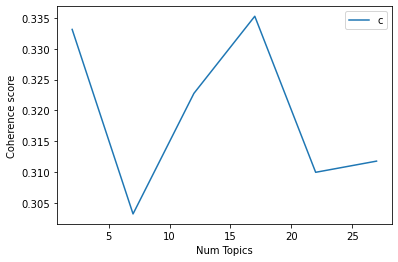

In [139]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2019_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [140]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2019_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 17

index: 0 | Num Topics = 2  has Coherence Value of 0.3331
index: 1 | Num Topics = 7  has Coherence Value of 0.3032
index: 2 | Num Topics = 12  has Coherence Value of 0.3228
index: 3 | Num Topics = 17  has Coherence Value of 0.3353
index: 4 | Num Topics = 22  has Coherence Value of 0.31
index: 5 | Num Topics = 27  has Coherence Value of 0.3118


In [194]:
# Select optimal number of topics
optimal_model_us_2019_score1N2N3 = model_list_us_2019_score1N2N3[3]

In [195]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2019_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2019_score1N2N3, corpus_us_2019_score1N2N3, id2word_us_2019_score1N2N3)

In [196]:
print("pyLDAVis for us topics for score=1,2,3 in 2019:")
vis_us_2019_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2019:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6     -0.147136 -0.040590       1        1  17.204657
2     -0.113989 -0.095909       2        1  12.701341
7     -0.072862 -0.097343       3        1  11.764320
15    -0.152992  0.156331       4        1  10.218435
16    -0.011285 -0.089384       5        1   7.750836
11    -0.070045 -0.035705       6        1   6.805001
5      0.069469 -0.010095       7        1   5.376402
12    -0.100861  0.206841       8        1   5.235012
13    -0.031492 -0.040545       9        1   4.306288
0      0.088950  0.005679      10        1   3.352775
10    -0.034755  0.003387      11        1   2.946298
4      0.055242 -0.065055      12        1   2.861188
1      0.025755 -0.031916      13        1   2.829740
14     0.133491  0.015190      14        1   2.228585
8      0.088501  0.021867      15        1   1.825570
9      0.103330 -0.002442      16        1   1.502083
3      0.170680  0.099688      17        1   1.091469, topic_info=         Term        Freq       Total Category  logprob  loglift
358   account  346.000000  346.000000  Default  30.0000  30.0000
21      story  452.000000  452.000000  Default  29.0000  29.0000
6      filter  110.000000  110.000000  Default  28.0000  28.0000
1174     lock  124.000000  124.000000  Default  27.0000  27.0000
735       log  237.000000  237.000000  Default  26.0000  26.0000
...       ...         ...         ...      ...      ...      ...
173     great    1.669534   84.435651  Topic17  -5.3237   0.5942
43     pretty    1.548939   41.261827  Topic17  -5.3986   1.2353
78       well    1.568878  120.166180  Topic17  -5.3859   0.1791
340      tell    1.507877   91.887572  Topic17  -5.4255   0.4078
199       fun    1.490912   48.181517  Topic17  -5.4368   1.0421

[1262 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
53        1  0.152749    able
53        2  0.152749    able
53        3  0.043643    able
53        4  0.087285    able
53        5  0.098196    able
...     ...       ...     ...
2623      5  0.732304  zodiac
219       3  0.794575    zoom
219       5  0.136996    zoom
219      13  0.027399    zoom
219      16  0.027399    zoom

[3289 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 3, 8, 16, 17, 12, 6, 13, 14, 1, 11, 5, 2, 15, 9, 10, 4])

## By-rating of 2020 (Rating=1,2,3)

In [144]:
# By-rating Topic Modelling - rating = 1,2,3 in 2020
# Convert to list - move to each section
review_us_2020_score1N2N3 = snapchat_ios_us_review_YearMonth_2020_score1N2N3.review.values.tolist()
review_words_us_2020_score1N2N3 = list(sent_to_words(review_us_2020_score1N2N3))
print(review_words_us_2020_score1N2N3[:1])

[['well', 'were', 'do', 'start', 'well', 'logged', 'in', 'with', 'my', 'sisters', 'account', 'and', 'then', 'the', 'people', 'my', 'friends', 'on', 'snapchat', 'wouldn', 'load', 'so', 'then', 'sent', 'them', 'my', 'streaks', 'and', 'then', 'wasn', 'fully', 'load', 'and', 'then', 'it', 'said', 'that', 'didn', 'have', 'any', 'snaps', 'so', 'decided', 'to', 'search', 'up', 'how', 'to', 'fix', 'and', 'so', 'watched', 'how', 'to', 'fix', 'and', 'it', 'said', 'to', 'delete', 'snapchat', 'and', 'reinstall', 'after', 'so', 'did', 'that', 'right', 'and', 'now', 'those', 'friends', 'that', 'sent', 'my', 'streaks', 'to', 'they', 'don', 'show', 'up', 'on', 'my', 'snapchat', 'and', 'now', 'don', 'know', 'what', 'to', 'do', 'and', 'that', 'my', 'problem', 'snapchat', 'help', 'pleaseee']]


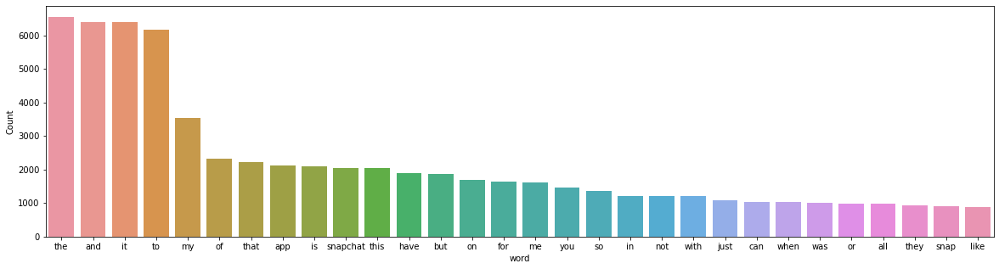

In [145]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2020_score1N2N3))

In [146]:
# Clean text
review_words_us_ready_2020_score1N2N3 = process_words(review_words_us_2020_score1N2N3)  # processed Text Data! - move to each section

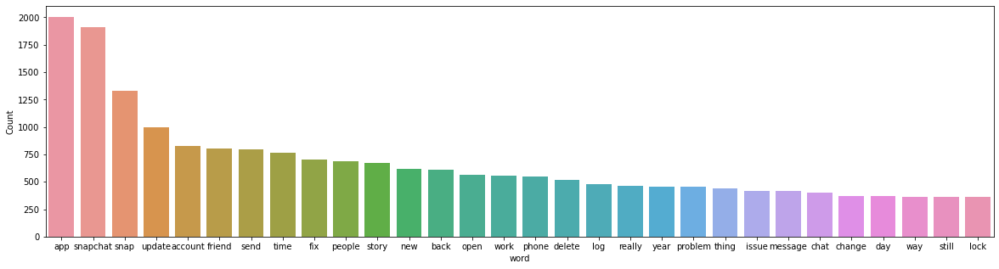

In [147]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2020_score1N2N3))


In [148]:
# Create Dictionary
id2word_us_2020_score1N2N3 = corpora.Dictionary(review_words_us_ready_2020_score1N2N3)

2021-10-17 02:18:35,672 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-17 02:18:36,102 [INFO] gensim.corpora.dictionary - built Dictionary(3481 unique tokens: ['account', 'decide', 'delete', 'fix', 'friend']...) from 1362 documents (total 63076 corpus positions)
2021-10-17 02:18:36,105 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(3481 unique tokens: ['account', 'decide', 'delete', 'fix', 'friend']...) from 1362 documents (total 63076 corpus positions)", 'datetime': '2021-10-17T02:18:36.105372', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [149]:
# Create Corpus: Term Document Frequency
corpus_us_2020_score1N2N3 = [id2word_us_2020_score1N2N3.doc2bow(text) for text in review_words_us_ready_2020_score1N2N3]

In [150]:
# Training LDA model
model_list_us_2020_score1N2N3, coherence_values_us_2020_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2020_score1N2N3, corpus=corpus_us_2020_score1N2N3, 
                                                              texts=review_words_us_ready_2020_score1N2N3, limit=30, start=2, step=5)


2021-10-17 02:18:36,463 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-17 02:18:36,465 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-17 02:18:36,470 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-17 02:18:36,472 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 1362 documents, updating model once every 1000 documents, evaluating perplexity every 1362 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-17 02:18:36,474 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #1000/1362
2021-10-17 02:18:40,218 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:18:40,222 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.036*"app" + 0.030*"snapchat" + 0.020*"snap" + 0.014*"send" + 0.013*"friend" + 0.012*"delete" + 0.012*"phone" + 0.011*"time" + 0.011*"work" 

2021-10-17 02:19:03,334 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1362/1362
2021-10-17 02:19:04,334 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:19:04,337 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.033*"app" + 0.022*"account" + 0.018*"snap" + 0.015*"send" + 0.013*"friend" + 0.012*"fix" + 0.012*"time" + 0.012*"work" + 0.011*"phone"
2021-10-17 02:19:04,339 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.036*"update" + 0.023*"app" + 0.021*"snap" + 0.020*"snapchat" + 0.017*"new" + 0.015*"story" + 0.011*"people" + 0.011*"chat" + 0.011*"map" + 0.010*"time"
2021-10-17 02:19:04,341 [INFO] gensim.models.ldamodel - topic diff=0.266433, rho=0.396463
2021-10-17 02:19:04,342 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1000/1362
2021-10-17 02:19:07,038 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02

2021-10-17 02:19:26,454 [INFO] gensim.models.ldamodel - topic diff=0.178690, rho=0.296669
2021-10-17 02:19:27,519 [INFO] gensim.models.ldamodel - -6.319 per-word bound, 79.8 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:19:27,566 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1362/1362
2021-10-17 02:19:28,312 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:19:28,315 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.031*"app" + 0.023*"account" + 0.019*"snap" + 0.016*"send" + 0.013*"fix" + 0.013*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:19:28,317 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.037*"update" + 0.025*"app" + 0.020*"snapchat" + 0.020*"snap" + 0.017*"new" + 0.017*"story" + 0.012*"chat" + 0.011*"people" + 0.011*"map" + 0.010*"look"
2021-10-17 02:19:28,321 [INFO] gensim.models.ldamodel - topic diff=0

2021-10-17 02:19:48,032 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.026*"app" + 0.020*"snapchat" + 0.019*"snap" + 0.019*"story" + 0.016*"new" + 0.012*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
2021-10-17 02:19:48,037 [INFO] gensim.models.ldamodel - topic diff=0.142041, rho=0.247219
2021-10-17 02:19:49,228 [INFO] gensim.models.ldamodel - -6.312 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:19:49,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1362/1362
2021-10-17 02:19:50,035 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:19:50,039 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.031*"app" + 0.023*"account" + 0.020*"snap" + 0.016*"send" + 0.014*"fix" + 0.013*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:19:50,044 [INFO] gensim.models.ldamodel - topic #1 (0

2021-10-17 02:20:11,388 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.031*"app" + 0.022*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.013*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:20:11,393 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.026*"app" + 0.020*"snapchat" + 0.019*"story" + 0.018*"snap" + 0.016*"new" + 0.012*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
2021-10-17 02:20:11,397 [INFO] gensim.models.ldamodel - topic diff=0.120965, rho=0.216361
2021-10-17 02:20:12,502 [INFO] gensim.models.ldamodel - -6.309 per-word bound, 79.3 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:20:12,506 [INFO] gensim.models.ldamodel - PROGRESS: pass 19, at document #1362/1362
2021-10-17 02:20:13,258 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:20:13,260 [INFO] gensim.models.ldamodel - topic #0 (0

2021-10-17 02:20:31,018 [INFO] gensim.models.ldamodel - topic diff=0.107555, rho=0.198568
2021-10-17 02:20:31,021 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1362
2021-10-17 02:20:33,153 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:20:33,159 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.031*"app" + 0.022*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.013*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:20:33,195 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.027*"app" + 0.020*"snapchat" + 0.019*"story" + 0.018*"snap" + 0.016*"new" + 0.011*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
2021-10-17 02:20:33,249 [INFO] gensim.models.ldamodel - topic diff=0.106797, rho=0.194765
2021-10-17 02:20:34,341 [INFO] gensim.models.ldamodel - -6.307 per-word bound, 79.2 perplexity estimate based on a held-out corpus of 362 doc

2021-10-17 02:20:51,484 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.027*"app" + 0.020*"snapchat" + 0.018*"story" + 0.018*"snap" + 0.016*"new" + 0.011*"chat" + 0.011*"people" + 0.010*"map" + 0.010*"look"
2021-10-17 02:20:51,486 [INFO] gensim.models.ldamodel - topic diff=0.097228, rho=0.181483
2021-10-17 02:20:51,489 [INFO] gensim.models.ldamodel - PROGRESS: pass 29, at document #1000/1362
2021-10-17 02:20:53,855 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:20:53,858 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.031*"app" + 0.022*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.014*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:20:53,860 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"update" + 0.027*"app" + 0.021*"snapchat" + 0.018*"story" + 0.017*"snap" + 0.016*"new" + 0.011*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
202

2021-10-17 02:21:13,241 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.030*"app" + 0.023*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.013*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:21:13,243 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.027*"app" + 0.021*"snapchat" + 0.017*"story" + 0.017*"snap" + 0.016*"new" + 0.011*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
2021-10-17 02:21:13,245 [INFO] gensim.models.ldamodel - topic diff=0.089393, rho=0.168163
2021-10-17 02:21:13,248 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1000/1362
2021-10-17 02:21:15,609 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:21:15,612 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.031*"app" + 0.022*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.014*"friend" + 0.013*"time" + 0.013*"work" + 0.012*"phone"
2

2021-10-17 02:21:31,632 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1362/1362
2021-10-17 02:21:32,788 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:21:32,792 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.030*"app" + 0.023*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.013*"friend" + 0.013*"time" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:21:32,794 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.035*"update" + 0.027*"app" + 0.021*"snapchat" + 0.017*"story" + 0.017*"snap" + 0.016*"new" + 0.011*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
2021-10-17 02:21:32,796 [INFO] gensim.models.ldamodel - topic diff=0.083374, rho=0.157403
2021-10-17 02:21:32,797 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #1000/1362
2021-10-17 02:21:35,316 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 

2021-10-17 02:21:51,641 [INFO] gensim.models.ldamodel - topic diff=0.078388, rho=0.148475
2021-10-17 02:21:52,743 [INFO] gensim.models.ldamodel - -6.303 per-word bound, 78.9 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:21:52,745 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1362/1362
2021-10-17 02:21:53,492 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:21:53,495 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.030*"app" + 0.024*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.013*"time" + 0.013*"friend" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:21:53,498 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.034*"update" + 0.027*"app" + 0.021*"snapchat" + 0.017*"story" + 0.017*"snap" + 0.016*"new" + 0.011*"chat" + 0.011*"people" + 0.010*"look" + 0.010*"map"
2021-10-17 02:21:53,500 [INFO] gensim.models.ldamodel - topic diff=

2021-10-17 02:22:13,404 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.033*"update" + 0.027*"app" + 0.021*"snapchat" + 0.018*"story" + 0.017*"snap" + 0.016*"new" + 0.011*"people" + 0.011*"chat" + 0.010*"look" + 0.009*"map"
2021-10-17 02:22:13,405 [INFO] gensim.models.ldamodel - topic diff=0.073968, rho=0.140912
2021-10-17 02:22:14,378 [INFO] gensim.models.ldamodel - -6.302 per-word bound, 78.9 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:22:14,379 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1362/1362
2021-10-17 02:22:15,152 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:22:15,208 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.034*"snapchat" + 0.030*"app" + 0.024*"account" + 0.021*"snap" + 0.017*"send" + 0.014*"fix" + 0.013*"time" + 0.013*"friend" + 0.012*"work" + 0.012*"phone"
2021-10-17 02:22:15,211 [INFO] gensim.models.ldamodel - topic #1 (0

2021-10-17 02:22:34,263 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.031*"app" + 0.022*"open" + 0.021*"snap" + 0.018*"snapchat" + 0.013*"time" + 0.013*"back" + 0.012*"phone" + 0.011*"people" + 0.010*"still" + 0.010*"update"
2021-10-17 02:22:34,265 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.023*"app" + 0.023*"story" + 0.017*"watch" + 0.016*"snap" + 0.015*"snapchat" + 0.015*"update" + 0.015*"open" + 0.013*"ad" + 0.011*"video" + 0.009*"swipe"
2021-10-17 02:22:34,266 [INFO] gensim.models.ldamodel - topic diff=0.551133, rho=0.545382
2021-10-17 02:22:35,527 [INFO] gensim.models.ldamodel - -6.608 per-word bound, 97.6 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:22:35,529 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1362/1362
2021-10-17 02:22:36,405 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:22:36,428 [INFO] gensim.models.ldamodel - topic #0 (

2021-10-17 02:22:46,646 [INFO] gensim.models.ldamodel - topic diff=0.260301, rho=0.431854
2021-10-17 02:22:46,651 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #1000/1362
2021-10-17 02:22:48,669 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:22:48,688 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.053*"update" + 0.027*"snap" + 0.026*"new" + 0.024*"app" + 0.019*"snapchat" + 0.017*"map" + 0.015*"chat" + 0.014*"people" + 0.014*"swipe" + 0.014*"change"
2021-10-17 02:22:48,693 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.041*"account" + 0.038*"snapchat" + 0.026*"app" + 0.018*"lock" + 0.016*"friend" + 0.015*"log" + 0.013*"time" + 0.012*"people" + 0.011*"email" + 0.011*"back"
2021-10-17 02:22:48,697 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.050*"app" + 0.033*"snap" + 0.025*"send" + 0.025*"snapchat" + 0.022*"work" + 0.020*"open" + 0.019*"fix" + 0.017*"delete" + 0.016*"time" + 0.015*"phone"
2

2021-10-17 02:22:58,010 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.030*"dark" + 0.030*"app" + 0.026*"mode" + 0.012*"shortcut" + 0.011*"well" + 0.008*"time" + 0.008*"back" + 0.008*"add" + 0.008*"snapchat" + 0.008*"literally"
2021-10-17 02:22:58,013 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"app" + 0.034*"snap" + 0.027*"send" + 0.027*"snapchat" + 0.021*"work" + 0.020*"fix" + 0.020*"open" + 0.017*"time" + 0.016*"delete" + 0.014*"phone"
2021-10-17 02:22:58,015 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.055*"story" + 0.047*"ad" + 0.037*"watch" + 0.018*"video" + 0.015*"page" + 0.014*"snapchat" + 0.012*"app" + 0.012*"time" + 0.010*"second" + 0.009*"post"
2021-10-17 02:22:58,017 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.048*"account" + 0.039*"snapchat" + 0.022*"app" + 0.021*"lock" + 0.015*"friend" + 0.015*"log" + 0.014*"email" + 0.012*"back" + 0.012*"people" + 0.012*"time"
2021-10-17 02:22:58,018 [INFO] gensim.models.ldamodel - topic diff=0.161872, rho

2021-10-17 02:23:07,882 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.054*"update" + 0.027*"new" + 0.027*"app" + 0.024*"snap" + 0.020*"snapchat" + 0.017*"map" + 0.015*"chat" + 0.015*"swipe" + 0.015*"change" + 0.014*"people"
2021-10-17 02:23:07,887 [INFO] gensim.models.ldamodel - topic diff=0.126619, rho=0.296669
2021-10-17 02:23:08,843 [INFO] gensim.models.ldamodel - -6.313 per-word bound, 79.5 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:23:08,844 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1362/1362
2021-10-17 02:23:09,505 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:23:09,518 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.039*"notification" + 0.017*"mute" + 0.015*"list" + 0.015*"conversation" + 0.013*"friend" + 0.011*"life" + 0.009*"boyfriend" + 0.007*"name" + 0.007*"away" + 0.007*"interact"
2021-10-17 02:23:09,521 [INFO] gensim.models.ld

2021-10-17 02:23:16,917 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1362
2021-10-17 02:23:19,139 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:23:19,148 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.045*"snapchat" + 0.030*"camera" + 0.022*"picture" + 0.021*"video" + 0.015*"memory" + 0.015*"photo" + 0.014*"app" + 0.013*"iphone" + 0.013*"add" + 0.012*"save"
2021-10-17 02:23:19,162 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.034*"dark" + 0.033*"mode" + 0.024*"app" + 0.012*"well" + 0.011*"shortcut" + 0.008*"username" + 0.008*"add" + 0.008*"literally" + 0.006*"eye" + 0.005*"open"
2021-10-17 02:23:19,176 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.049*"app" + 0.035*"snap" + 0.028*"send" + 0.027*"snapchat" + 0.022*"fix" + 0.020*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.014*"phone"
2021-10-17 02:23:19,185 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.051*"acco

2021-10-17 02:23:28,447 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.053*"account" + 0.040*"snapchat" + 0.023*"lock" + 0.019*"app" + 0.016*"log" + 0.015*"email" + 0.014*"friend" + 0.013*"back" + 0.012*"people" + 0.011*"support"
2021-10-17 02:23:28,454 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"notification" + 0.017*"mute" + 0.016*"list" + 0.014*"conversation" + 0.012*"life" + 0.012*"friend" + 0.010*"boyfriend" + 0.007*"type" + 0.007*"away" + 0.007*"interact"
2021-10-17 02:23:28,466 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"snapchat" + 0.029*"camera" + 0.023*"picture" + 0.022*"video" + 0.015*"iphone" + 0.015*"photo" + 0.014*"memory" + 0.014*"app" + 0.014*"quality" + 0.013*"add"
2021-10-17 02:23:28,469 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.055*"update" + 0.028*"app" + 0.027*"new" + 0.023*"snap" + 0.020*"snapchat" + 0.018*"map" + 0.015*"swipe" + 0.015*"chat" + 0.014*"change" + 0.013*"look"
2021-10-17 02:23:28,473 [INFO] gensim.models.ldamo

2021-10-17 02:23:38,794 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.067*"story" + 0.048*"ad" + 0.038*"watch" + 0.015*"page" + 0.015*"video" + 0.013*"time" + 0.013*"snapchat" + 0.011*"app" + 0.011*"second" + 0.009*"post"
2021-10-17 02:23:38,796 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.036*"dark" + 0.035*"mode" + 0.021*"app" + 0.012*"shortcut" + 0.012*"well" + 0.009*"username" + 0.008*"add" + 0.008*"literally" + 0.006*"eye" + 0.006*"apply"
2021-10-17 02:23:38,800 [INFO] gensim.models.ldamodel - topic diff=0.084422, rho=0.227261
2021-10-17 02:23:39,811 [INFO] gensim.models.ldamodel - -6.289 per-word bound, 78.2 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:23:39,817 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1362/1362
2021-10-17 02:23:40,519 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:23:40,525 [INFO] gensim.models.ldamodel - topic #3

2021-10-17 02:23:47,818 [INFO] gensim.models.ldamodel - topic diff=0.077730, rho=0.216361
2021-10-17 02:23:47,826 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1362
2021-10-17 02:23:49,642 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:23:49,647 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"notification" + 0.017*"list" + 0.016*"mute" + 0.014*"conversation" + 0.011*"boyfriend" + 0.011*"friend" + 0.010*"life" + 0.007*"type" + 0.007*"away" + 0.006*"name"
2021-10-17 02:23:49,649 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.044*"snapchat" + 0.032*"camera" + 0.025*"picture" + 0.023*"video" + 0.016*"photo" + 0.015*"iphone" + 0.014*"app" + 0.014*"memory" + 0.013*"save" + 0.013*"add"
2021-10-17 02:23:49,650 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.037*"dark" + 0.036*"mode" + 0.020*"app" + 0.012*"shortcut" + 0.012*"well" + 0.009*"username" + 0.008*"add" + 0.008*"literally" + 0.00

2021-10-17 02:23:58,052 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.028*"send" + 0.022*"fix" + 0.021*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.014*"friend"
2021-10-17 02:23:58,054 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.038*"dark" + 0.036*"mode" + 0.019*"app" + 0.014*"shortcut" + 0.013*"well" + 0.009*"username" + 0.009*"add" + 0.008*"literally" + 0.007*"apply" + 0.007*"eye"
2021-10-17 02:23:58,056 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"snapchat" + 0.030*"camera" + 0.025*"picture" + 0.023*"video" + 0.016*"iphone" + 0.015*"photo" + 0.015*"app" + 0.015*"quality" + 0.013*"memory" + 0.013*"add"
2021-10-17 02:23:58,058 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"account" + 0.040*"snapchat" + 0.023*"lock" + 0.018*"app" + 0.016*"log" + 0.015*"email" + 0.014*"friend" + 0.013*"back" + 0.012*"people" + 0.011*"support"
2021-10-17 02:23:58,060 [INFO] gensim.models.ldamodel - topic #2 (

2021-10-17 02:24:06,971 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"snapchat" + 0.033*"camera" + 0.026*"picture" + 0.024*"video" + 0.016*"photo" + 0.015*"iphone" + 0.015*"app" + 0.014*"memory" + 0.013*"quality" + 0.013*"save"
2021-10-17 02:24:06,973 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"story" + 0.047*"ad" + 0.037*"watch" + 0.015*"page" + 0.014*"video" + 0.014*"time" + 0.013*"snapchat" + 0.011*"app" + 0.010*"second" + 0.010*"post"
2021-10-17 02:24:06,976 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"notification" + 0.017*"list" + 0.017*"mute" + 0.014*"conversation" + 0.011*"boyfriend" + 0.011*"life" + 0.010*"friend" + 0.008*"type" + 0.007*"away" + 0.006*"interact"
2021-10-17 02:24:06,978 [INFO] gensim.models.ldamodel - topic diff=0.066775, rho=0.191173
2021-10-17 02:24:08,082 [INFO] gensim.models.ldamodel - -6.281 per-word bound, 77.8 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:24:08,097 [INFO

2021-10-17 02:24:16,810 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.055*"update" + 0.028*"app" + 0.027*"new" + 0.023*"snap" + 0.020*"snapchat" + 0.018*"map" + 0.016*"swipe" + 0.015*"chat" + 0.014*"change" + 0.013*"look"
2021-10-17 02:24:16,811 [INFO] gensim.models.ldamodel - topic diff=0.063089, rho=0.184547
2021-10-17 02:24:16,813 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1362
2021-10-17 02:24:18,621 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:24:18,639 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.054*"update" + 0.028*"app" + 0.027*"new" + 0.023*"snap" + 0.020*"snapchat" + 0.017*"map" + 0.015*"swipe" + 0.015*"chat" + 0.015*"change" + 0.013*"people"
2021-10-17 02:24:18,641 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.041*"notification" + 0.017*"mute" + 0.017*"list" + 0.014*"conversation" + 0.011*"boyfriend" + 0.011*"life" + 0.010*"friend" + 0.008*"type" + 0.007*"away" +

2021-10-17 02:24:26,271 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1362/1362
2021-10-17 02:24:27,023 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:24:27,028 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"notification" + 0.018*"mute" + 0.016*"list" + 0.014*"conversation" + 0.011*"life" + 0.010*"boyfriend" + 0.010*"friend" + 0.008*"type" + 0.007*"interact" + 0.007*"away"
2021-10-17 02:24:27,044 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.055*"update" + 0.028*"app" + 0.027*"new" + 0.023*"snap" + 0.020*"snapchat" + 0.018*"map" + 0.016*"swipe" + 0.015*"chat" + 0.014*"change" + 0.013*"look"
2021-10-17 02:24:27,047 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.027*"send" + 0.022*"fix" + 0.021*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.014*"friend"
2021-10-17 02:24:27,049 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0

2021-10-17 02:24:36,641 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.039*"dark" + 0.037*"mode" + 0.016*"app" + 0.013*"shortcut" + 0.012*"well" + 0.010*"username" + 0.008*"add" + 0.007*"literally" + 0.007*"eye" + 0.006*"apply"
2021-10-17 02:24:36,643 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"notification" + 0.017*"mute" + 0.017*"list" + 0.014*"conversation" + 0.011*"boyfriend" + 0.011*"life" + 0.010*"friend" + 0.008*"type" + 0.007*"away" + 0.006*"interact"
2021-10-17 02:24:36,644 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"story" + 0.047*"ad" + 0.037*"watch" + 0.015*"page" + 0.014*"time" + 0.014*"video" + 0.013*"snapchat" + 0.011*"app" + 0.011*"post" + 0.010*"second"
2021-10-17 02:24:36,645 [INFO] gensim.models.ldamodel - topic diff=0.056689, rho=0.168163
2021-10-17 02:24:37,571 [INFO] gensim.models.ldamodel - -6.277 per-word bound, 77.5 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:24:37,573 [INFO] gens

2021-10-17 02:24:44,415 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"account" + 0.041*"snapchat" + 0.023*"lock" + 0.018*"app" + 0.016*"log" + 0.015*"email" + 0.014*"friend" + 0.013*"back" + 0.012*"people" + 0.011*"help"
2021-10-17 02:24:44,416 [INFO] gensim.models.ldamodel - topic diff=0.054520, rho=0.163601
2021-10-17 02:24:44,417 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1362
2021-10-17 02:24:46,003 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:24:46,008 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"story" + 0.046*"ad" + 0.037*"watch" + 0.015*"page" + 0.014*"time" + 0.014*"video" + 0.013*"snapchat" + 0.011*"app" + 0.011*"post" + 0.010*"second"
2021-10-17 02:24:46,010 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.027*"send" + 0.022*"fix" + 0.020*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.015*"friend"
2

2021-10-17 02:24:53,415 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #1362/1362
2021-10-17 02:24:54,040 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:24:54,044 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"snapchat" + 0.032*"camera" + 0.027*"picture" + 0.025*"video" + 0.016*"photo" + 0.016*"iphone" + 0.015*"quality" + 0.015*"app" + 0.013*"add" + 0.013*"save"
2021-10-17 02:24:54,046 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.027*"send" + 0.022*"fix" + 0.021*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.014*"friend"
2021-10-17 02:24:54,048 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"dark" + 0.038*"mode" + 0.015*"app" + 0.015*"shortcut" + 0.013*"well" + 0.010*"username" + 0.009*"add" + 0.008*"literally" + 0.007*"apply" + 0.007*"eye"
2021-10-17 02:24:54,050 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.043*"no

2021-10-17 02:25:03,061 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.068*"story" + 0.046*"ad" + 0.037*"watch" + 0.015*"page" + 0.014*"time" + 0.014*"video" + 0.014*"snapchat" + 0.011*"post" + 0.011*"app" + 0.010*"second"
2021-10-17 02:25:03,065 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"snapchat" + 0.034*"camera" + 0.027*"picture" + 0.025*"video" + 0.017*"photo" + 0.016*"iphone" + 0.015*"app" + 0.014*"quality" + 0.014*"save" + 0.013*"add"
2021-10-17 02:25:03,069 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.027*"send" + 0.022*"fix" + 0.020*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.015*"friend"
2021-10-17 02:25:03,070 [INFO] gensim.models.ldamodel - topic diff=0.050065, rho=0.151861
2021-10-17 02:25:04,037 [INFO] gensim.models.ldamodel - -6.274 per-word bound, 77.4 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:25:04,038 [INFO] gensim.models.ldamodel

2021-10-17 02:25:12,479 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"notification" + 0.018*"mute" + 0.016*"list" + 0.014*"conversation" + 0.011*"life" + 0.010*"boyfriend" + 0.010*"friend" + 0.008*"type" + 0.007*"interact" + 0.007*"away"
2021-10-17 02:25:12,481 [INFO] gensim.models.ldamodel - topic diff=0.048611, rho=0.148475
2021-10-17 02:25:12,484 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1362
2021-10-17 02:25:14,253 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:25:14,291 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"notification" + 0.017*"mute" + 0.017*"list" + 0.014*"conversation" + 0.011*"boyfriend" + 0.011*"life" + 0.010*"friend" + 0.008*"type" + 0.007*"away" + 0.007*"interact"
2021-10-17 02:25:14,293 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"account" + 0.040*"snapchat" + 0.023*"lock" + 0.018*"app" + 0.016*"log" + 0.015*"email" + 0.014*"friend" + 0.01

2021-10-17 02:25:22,307 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #1362/1362
2021-10-17 02:25:22,958 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:25:22,966 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.027*"send" + 0.022*"fix" + 0.021*"work" + 0.019*"open" + 0.018*"time" + 0.016*"delete" + 0.014*"friend"
2021-10-17 02:25:22,972 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"account" + 0.041*"snapchat" + 0.023*"lock" + 0.018*"app" + 0.016*"log" + 0.015*"email" + 0.014*"friend" + 0.014*"back" + 0.012*"people" + 0.011*"help"
2021-10-17 02:25:22,977 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.042*"notification" + 0.018*"mute" + 0.016*"list" + 0.014*"conversation" + 0.011*"life" + 0.010*"boyfriend" + 0.010*"friend" + 0.008*"type" + 0.007*"interact" + 0.007*"away"
2021-10-17 02:25:22,982 [INFO] gensim.models.ldamodel - topic #1 (0.143

2021-10-17 02:25:31,805 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.040*"dark" + 0.038*"mode" + 0.014*"shortcut" + 0.013*"app" + 0.012*"well" + 0.010*"username" + 0.008*"add" + 0.007*"literally" + 0.007*"eye" + 0.006*"apply"
2021-10-17 02:25:31,816 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.048*"app" + 0.035*"snap" + 0.028*"snapchat" + 0.027*"send" + 0.022*"fix" + 0.021*"work" + 0.018*"open" + 0.018*"time" + 0.016*"delete" + 0.015*"friend"
2021-10-17 02:25:31,826 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.054*"account" + 0.040*"snapchat" + 0.023*"lock" + 0.018*"app" + 0.016*"log" + 0.015*"email" + 0.014*"friend" + 0.013*"back" + 0.012*"people" + 0.011*"help"
2021-10-17 02:25:31,839 [INFO] gensim.models.ldamodel - topic diff=0.045454, rho=0.139534
2021-10-17 02:25:32,811 [INFO] gensim.models.ldamodel - -6.272 per-word bound, 77.3 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:25:32,816 [INFO] gensim.models.ldamode

2021-10-17 02:25:53,377 [INFO] gensim.models.ldamodel - topic diff=0.543809, rho=0.545382
2021-10-17 02:25:54,940 [INFO] gensim.models.ldamodel - -7.038 per-word bound, 131.5 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:25:54,942 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1362/1362
2021-10-17 02:25:56,190 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:25:56,212 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.042*"blurry" + 0.014*"extremely" + 0.008*"snap" + 0.007*"emphasize" + 0.007*"negatively" + 0.007*"non" + 0.007*"video" + 0.006*"snapchat" + 0.005*"annoying" + 0.005*"work"
2021-10-17 02:25:56,237 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.035*"update" + 0.032*"snapchat" + 0.026*"snap" + 0.023*"app" + 0.021*"friend" + 0.015*"people" + 0.014*"look" + 0.012*"change" + 0.012*"back" + 0.010*"dark"
2021-10-17 02:25:56,247 [INFO] gensim.models

2021-10-17 02:26:08,322 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.015*"device" + 0.014*"ad" + 0.013*"developer" + 0.011*"useless" + 0.011*"devs" + 0.010*"bad" + 0.010*"said" + 0.010*"iphone" + 0.009*"app" + 0.008*"user"
2021-10-17 02:26:08,324 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.041*"app" + 0.036*"snapchat" + 0.019*"log" + 0.019*"account" + 0.016*"new" + 0.015*"snap" + 0.015*"update" + 0.015*"friend" + 0.014*"people" + 0.014*"back"
2021-10-17 02:26:08,330 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.053*"app" + 0.027*"snap" + 0.026*"send" + 0.025*"work" + 0.023*"time" + 0.022*"delete" + 0.021*"thing" + 0.017*"fix" + 0.015*"screen" + 0.015*"snapchat"
2021-10-17 02:26:08,332 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.039*"app" + 0.033*"snapchat" + 0.017*"ad" + 0.017*"story" + 0.015*"time" + 0.015*"fix" + 0.013*"friend" + 0.011*"people" + 0.011*"snap" + 0.010*"send"
2021-10-17 02:26:08,334 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.032*"

2021-10-17 02:26:17,813 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.034*"blurry" + 0.013*"extremely" + 0.009*"negatively" + 0.009*"emphasize" + 0.009*"play" + 0.007*"non" + 0.006*"inconvenient" + 0.002*"path" + 0.002*"broken" + 0.002*"whatsapp"
2021-10-17 02:26:17,815 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.090*"account" + 0.040*"snapchat" + 0.035*"lock" + 0.033*"email" + 0.022*"support" + 0.018*"help" + 0.017*"back" + 0.017*"number" + 0.014*"day" + 0.013*"log"
2021-10-17 02:26:17,817 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.024*"device" + 0.020*"developer" + 0.019*"useless" + 0.018*"devs" + 0.014*"said" + 0.013*"bad" + 0.011*"iphone" + 0.009*"rewind" + 0.009*"window" + 0.009*"due"
2021-10-17 02:26:17,818 [INFO] gensim.models.ldamodel - topic diff=0.159589, rho=0.345816
2021-10-17 02:26:17,820 [INFO] gensim.models.ldamodel - PROGRESS: pass 7, at document #1000/1362
2021-10-17 02:26:19,941 [INFO] gensim.models.ldamodel - merging changes from 1000 documents

2021-10-17 02:26:27,197 [INFO] gensim.models.ldamodel - topic diff=0.110830, rho=0.296669
2021-10-17 02:26:28,370 [INFO] gensim.models.ldamodel - -6.515 per-word bound, 91.4 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:26:28,375 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1362/1362
2021-10-17 02:26:29,174 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:26:29,182 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.042*"app" + 0.039*"snapchat" + 0.038*"snap" + 0.037*"send" + 0.028*"work" + 0.023*"phone" + 0.022*"fix" + 0.020*"load" + 0.019*"delete" + 0.018*"problem"
2021-10-17 02:26:29,184 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.047*"video" + 0.030*"save" + 0.028*"notification" + 0.027*"snap" + 0.022*"let" + 0.022*"app" + 0.019*"snapchat" + 0.018*"send" + 0.018*"message" + 0.018*"open"
2021-10-17 02:26:29,187 [INFO] gensim.models.ldamodel - top

2021-10-17 02:26:38,304 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"app" + 0.034*"snapchat" + 0.020*"new" + 0.018*"people" + 0.018*"friend" + 0.017*"log" + 0.015*"add" + 0.015*"time" + 0.014*"fix" + 0.014*"update"
2021-10-17 02:26:38,307 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.051*"app" + 0.036*"snap" + 0.027*"time" + 0.024*"send" + 0.023*"work" + 0.020*"fix" + 0.020*"delete" + 0.020*"thing" + 0.020*"screen" + 0.018*"open"
2021-10-17 02:26:38,308 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.039*"app" + 0.029*"snapchat" + 0.021*"story" + 0.020*"ad" + 0.014*"time" + 0.012*"friend" + 0.012*"people" + 0.009*"watch" + 0.008*"fix" + 0.008*"really"
2021-10-17 02:26:38,310 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.025*"blurry" + 0.010*"extremely" + 0.008*"negatively" + 0.008*"emphasize" + 0.007*"play" + 0.007*"inconvenient" + 0.005*"non" + 0.003*"whatsapp" + 0.003*"broken" + 0.003*"path"
2021-10-17 02:26:38,312 [INFO] gensim.models.ldamodel - topic di

2021-10-17 02:26:46,777 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.051*"video" + 0.032*"save" + 0.029*"notification" + 0.026*"snap" + 0.021*"story" + 0.020*"let" + 0.019*"app" + 0.019*"message" + 0.017*"send" + 0.017*"snapchat"
2021-10-17 02:26:46,780 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.049*"app" + 0.037*"snap" + 0.028*"time" + 0.024*"work" + 0.023*"send" + 0.021*"fix" + 0.020*"screen" + 0.019*"thing" + 0.019*"delete" + 0.017*"open"
2021-10-17 02:26:46,783 [INFO] gensim.models.ldamodel - topic diff=0.081697, rho=0.247219
2021-10-17 02:26:46,785 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #1000/1362
2021-10-17 02:26:48,674 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:26:48,690 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.052*"video" + 0.034*"save" + 0.029*"notification" + 0.027*"snap" + 0.023*"story" + 0.020*"message" + 0.019*"let" + 0.018*"app" + 0.018*"send" + 0.016

2021-10-17 02:26:55,641 [INFO] gensim.models.ldamodel - topic diff=0.070700, rho=0.227261
2021-10-17 02:26:56,450 [INFO] gensim.models.ldamodel - -6.427 per-word bound, 86.0 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:26:56,451 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #1362/1362
2021-10-17 02:26:57,045 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:26:57,051 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.050*"story" + 0.049*"watch" + 0.031*"ad" + 0.023*"page" + 0.016*"slide" + 0.016*"user" + 0.015*"click" + 0.014*"bother" + 0.012*"ppl" + 0.012*"button"
2021-10-17 02:26:57,052 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.027*"device" + 0.021*"developer" + 0.020*"useless" + 0.017*"devs" + 0.015*"said" + 0.013*"bad" + 0.012*"iphone" + 0.009*"rewind" + 0.009*"window" + 0.009*"simply"
2021-10-17 02:26:57,054 [INFO] gensim.models.ldamodel - top

2021-10-17 02:27:06,299 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.051*"camera" + 0.039*"story" + 0.037*"snapchat" + 0.034*"picture" + 0.030*"iphone" + 0.025*"post" + 0.025*"quality" + 0.021*"photo" + 0.020*"look" + 0.016*"issue"
2021-10-17 02:27:06,301 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.092*"account" + 0.043*"lock" + 0.043*"snapchat" + 0.030*"email" + 0.020*"support" + 0.020*"log" + 0.019*"back" + 0.018*"help" + 0.016*"number" + 0.014*"contact"
2021-10-17 02:27:06,302 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.038*"app" + 0.028*"snapchat" + 0.022*"story" + 0.021*"ad" + 0.013*"time" + 0.012*"friend" + 0.012*"people" + 0.009*"watch" + 0.008*"medium" + 0.008*"social"
2021-10-17 02:27:06,303 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.024*"device" + 0.020*"developer" + 0.018*"useless" + 0.014*"devs" + 0.012*"said" + 0.012*"bad" + 0.012*"iphone" + 0.009*"shame" + 0.008*"rewind" + 0.008*"window"
2021-10-17 02:27:06,304 [INFO] gensim.models.ldamodel

2021-10-17 02:27:14,420 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.047*"app" + 0.040*"snapchat" + 0.038*"send" + 0.038*"snap" + 0.027*"work" + 0.025*"fix" + 0.023*"phone" + 0.020*"open" + 0.020*"delete" + 0.019*"load"
2021-10-17 02:27:14,422 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.036*"app" + 0.029*"snapchat" + 0.028*"update" + 0.027*"friend" + 0.023*"people" + 0.018*"change" + 0.016*"dark" + 0.015*"mode" + 0.015*"snap" + 0.013*"thing"
2021-10-17 02:27:14,429 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"app" + 0.032*"snapchat" + 0.022*"new" + 0.020*"people" + 0.019*"friend" + 0.016*"add" + 0.015*"fix" + 0.015*"time" + 0.014*"problem" + 0.013*"update"
2021-10-17 02:27:14,431 [INFO] gensim.models.ldamodel - topic diff=0.060429, rho=0.202602
2021-10-17 02:27:14,433 [INFO] gensim.models.ldamodel - PROGRESS: pass 23, at document #1000/1362
2021-10-17 02:27:16,295 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 docume

2021-10-17 02:27:22,928 [INFO] gensim.models.ldamodel - topic diff=0.055060, rho=0.191173
2021-10-17 02:27:23,712 [INFO] gensim.models.ldamodel - -6.390 per-word bound, 83.9 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:27:23,714 [INFO] gensim.models.ldamodel - PROGRESS: pass 25, at document #1362/1362
2021-10-17 02:27:24,305 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:27:24,321 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.027*"device" + 0.022*"developer" + 0.020*"useless" + 0.017*"devs" + 0.014*"said" + 0.014*"bad" + 0.012*"iphone" + 0.009*"rewind" + 0.009*"window" + 0.009*"simply"
2021-10-17 02:27:24,323 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.090*"account" + 0.044*"snapchat" + 0.043*"lock" + 0.029*"email" + 0.021*"support" + 0.020*"log" + 0.019*"back" + 0.017*"help" + 0.016*"number" + 0.014*"contact"
2021-10-17 02:27:24,325 [INFO] gensim.models.ldam

2021-10-17 02:27:32,504 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.051*"story" + 0.051*"watch" + 0.029*"ad" + 0.023*"page" + 0.017*"click" + 0.017*"slide" + 0.015*"user" + 0.014*"button" + 0.013*"bother" + 0.012*"ppl"
2021-10-17 02:27:32,506 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.024*"device" + 0.020*"developer" + 0.018*"useless" + 0.014*"devs" + 0.013*"bad" + 0.013*"said" + 0.012*"iphone" + 0.009*"shame" + 0.008*"rewind" + 0.008*"window"
2021-10-17 02:27:32,509 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.037*"app" + 0.028*"snapchat" + 0.023*"story" + 0.021*"ad" + 0.013*"time" + 0.012*"friend" + 0.012*"people" + 0.009*"watch" + 0.008*"medium" + 0.008*"social"
2021-10-17 02:27:32,514 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.057*"video" + 0.035*"save" + 0.030*"notification" + 0.029*"story" + 0.025*"snap" + 0.021*"message" + 0.020*"memory" + 0.018*"let" + 0.017*"view" + 0.016*"send"
2021-10-17 02:27:32,516 [INFO] gensim.models.ldamodel - topic #8 

2021-10-17 02:27:40,899 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.072*"update" + 0.035*"new" + 0.031*"snap" + 0.026*"map" + 0.023*"swipe" + 0.023*"chat" + 0.021*"app" + 0.017*"snapchat" + 0.017*"bottom" + 0.016*"look"
2021-10-17 02:27:40,903 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.026*"device" + 0.022*"developer" + 0.020*"useless" + 0.017*"devs" + 0.014*"said" + 0.014*"bad" + 0.012*"iphone" + 0.009*"rewind" + 0.009*"window" + 0.009*"simply"
2021-10-17 02:27:40,911 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.051*"watch" + 0.051*"story" + 0.029*"ad" + 0.023*"page" + 0.019*"slide" + 0.017*"click" + 0.016*"user" + 0.015*"button" + 0.014*"bother" + 0.012*"ppl"
2021-10-17 02:27:40,914 [INFO] gensim.models.ldamodel - topic diff=0.050041, rho=0.175785
2021-10-17 02:27:40,924 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #1000/1362
2021-10-17 02:27:43,053 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 docum

2021-10-17 02:27:49,565 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"app" + 0.030*"snapchat" + 0.022*"new" + 0.021*"people" + 0.020*"friend" + 0.017*"add" + 0.014*"fix" + 0.014*"time" + 0.013*"problem" + 0.013*"update"
2021-10-17 02:27:49,567 [INFO] gensim.models.ldamodel - topic diff=0.046641, rho=0.168163
2021-10-17 02:27:50,409 [INFO] gensim.models.ldamodel - -6.369 per-word bound, 82.7 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:27:50,410 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1362/1362
2021-10-17 02:27:50,974 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:27:51,037 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.036*"app" + 0.030*"snapchat" + 0.027*"update" + 0.027*"friend" + 0.023*"people" + 0.018*"change" + 0.017*"dark" + 0.015*"mode" + 0.014*"snap" + 0.013*"thing"
2021-10-17 02:27:51,043 [INFO] gensim.models.ldamodel - top

2021-10-17 02:27:57,739 [INFO] gensim.models.ldamodel - PROGRESS: pass 36, at document #1000/1362
2021-10-17 02:27:59,443 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:27:59,448 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.035*"app" + 0.030*"snapchat" + 0.027*"friend" + 0.026*"update" + 0.024*"people" + 0.019*"change" + 0.016*"dark" + 0.015*"mode" + 0.014*"thing" + 0.013*"snap"
2021-10-17 02:27:59,451 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.052*"story" + 0.051*"watch" + 0.028*"ad" + 0.023*"page" + 0.018*"click" + 0.018*"slide" + 0.014*"button" + 0.014*"user" + 0.013*"bother" + 0.012*"ppl"
2021-10-17 02:27:59,452 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.050*"app" + 0.040*"snapchat" + 0.038*"snap" + 0.037*"send" + 0.027*"work" + 0.026*"fix" + 0.022*"phone" + 0.022*"open" + 0.020*"delete" + 0.019*"load"
2021-10-17 02:27:59,455 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.058*"video" + 

2021-10-17 02:28:06,573 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.051*"watch" + 0.051*"story" + 0.028*"ad" + 0.023*"page" + 0.019*"slide" + 0.018*"click" + 0.015*"user" + 0.015*"button" + 0.014*"bother" + 0.012*"ppl"
2021-10-17 02:28:06,574 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.048*"camera" + 0.039*"snapchat" + 0.037*"story" + 0.036*"picture" + 0.032*"iphone" + 0.027*"quality" + 0.024*"post" + 0.021*"photo" + 0.020*"look" + 0.017*"issue"
2021-10-17 02:28:06,575 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.034*"blurry" + 0.014*"extremely" + 0.008*"negatively" + 0.008*"emphasize" + 0.008*"play" + 0.008*"inconvenient" + 0.006*"non" + 0.002*"shoot" + 0.002*"whatsapp" + 0.002*"age"
2021-10-17 02:28:06,576 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.039*"app" + 0.030*"snapchat" + 0.022*"new" + 0.022*"people" + 0.020*"friend" + 0.017*"add" + 0.015*"fix" + 0.014*"time" + 0.013*"problem" + 0.013*"update"
2021-10-17 02:28:06,577 [INFO] gensim.models.ldamod

2021-10-17 02:28:14,938 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.050*"app" + 0.040*"snapchat" + 0.038*"snap" + 0.037*"send" + 0.027*"work" + 0.026*"fix" + 0.022*"phone" + 0.022*"open" + 0.020*"delete" + 0.018*"load"
2021-10-17 02:28:14,950 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.059*"video" + 0.036*"save" + 0.033*"story" + 0.030*"notification" + 0.024*"memory" + 0.023*"snap" + 0.019*"message" + 0.018*"view" + 0.017*"let" + 0.016*"show"
2021-10-17 02:28:14,951 [INFO] gensim.models.ldamodel - topic diff=0.041284, rho=0.151861
2021-10-17 02:28:15,839 [INFO] gensim.models.ldamodel - -6.359 per-word bound, 82.1 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:28:15,841 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1362/1362
2021-10-17 02:28:16,629 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:28:16,651 [INFO] gensim.models.ldamodel - topic

2021-10-17 02:28:23,788 [INFO] gensim.models.ldamodel - topic diff=0.040360, rho=0.148475
2021-10-17 02:28:23,792 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #1000/1362
2021-10-17 02:28:25,522 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:28:25,530 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.035*"app" + 0.031*"snapchat" + 0.028*"friend" + 0.026*"update" + 0.024*"people" + 0.019*"change" + 0.016*"dark" + 0.016*"mode" + 0.014*"thing" + 0.013*"snap"
2021-10-17 02:28:25,535 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.024*"device" + 0.021*"developer" + 0.018*"useless" + 0.015*"devs" + 0.014*"bad" + 0.013*"said" + 0.012*"iphone" + 0.009*"shame" + 0.008*"rewind" + 0.008*"window"
2021-10-17 02:28:25,538 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.051*"app" + 0.040*"snapchat" + 0.038*"snap" + 0.037*"send" + 0.027*"work" + 0.026*"fix" + 0.022*"open" + 0.022*"phone" + 0.020*"delete" + 0.0

2021-10-17 02:28:32,822 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.034*"blurry" + 0.014*"extremely" + 0.008*"negatively" + 0.008*"emphasize" + 0.008*"play" + 0.008*"inconvenient" + 0.006*"non" + 0.002*"shoot" + 0.002*"whatsapp" + 0.002*"age"
2021-10-17 02:28:32,824 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.036*"app" + 0.030*"snapchat" + 0.027*"update" + 0.027*"friend" + 0.023*"people" + 0.018*"change" + 0.017*"dark" + 0.016*"mode" + 0.014*"thing" + 0.013*"snap"
2021-10-17 02:28:32,826 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.051*"app" + 0.040*"snapchat" + 0.039*"snap" + 0.037*"send" + 0.027*"work" + 0.026*"fix" + 0.023*"open" + 0.022*"phone" + 0.020*"delete" + 0.018*"problem"
2021-10-17 02:28:32,828 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.040*"app" + 0.036*"snap" + 0.027*"time" + 0.021*"work" + 0.020*"send" + 0.020*"fix" + 0.020*"thing" + 0.018*"delete" + 0.018*"screen" + 0.015*"issue"
2021-10-17 02:28:32,829 [INFO] gensim.models.ldamodel - top

2021-10-17 02:28:40,844 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.030*"blurry" + 0.013*"extremely" + 0.008*"inconvenient" + 0.008*"negatively" + 0.008*"emphasize" + 0.008*"play" + 0.006*"non" + 0.002*"shoot" + 0.002*"whatsapp" + 0.002*"age"
2021-10-17 02:28:40,845 [INFO] gensim.models.ldamodel - topic #1 (0.083): 0.053*"story" + 0.052*"watch" + 0.028*"ad" + 0.023*"page" + 0.019*"click" + 0.018*"slide" + 0.015*"button" + 0.014*"user" + 0.013*"bother" + 0.013*"ppl"
2021-10-17 02:28:40,847 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.071*"update" + 0.035*"new" + 0.031*"snap" + 0.026*"map" + 0.023*"swipe" + 0.022*"chat" + 0.021*"app" + 0.018*"snapchat" + 0.017*"bottom" + 0.016*"look"
2021-10-17 02:28:40,849 [INFO] gensim.models.ldamodel - topic diff=0.037237, rho=0.139534
2021-10-17 02:28:41,708 [INFO] gensim.models.ldamodel - -6.353 per-word bound, 81.8 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:28:41,709 [INFO] gensim.m

2021-10-17 02:28:57,773 [INFO] gensim.models.ldamodel - topic diff=0.554399, rho=0.545382
2021-10-17 02:28:58,747 [INFO] gensim.models.ldamodel - -7.250 per-word bound, 152.2 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:28:58,749 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1362/1362
2021-10-17 02:28:59,494 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:28:59,501 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.037*"app" + 0.035*"update" + 0.032*"snap" + 0.028*"snapchat" + 0.020*"send" + 0.016*"open" + 0.015*"friend" + 0.015*"chat" + 0.015*"new" + 0.012*"time"
2021-10-17 02:28:59,503 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.031*"smooth" + 0.020*"revert" + 0.017*"device" + 0.014*"share" + 0.013*"update" + 0.012*"depend" + 0.012*"accident" + 0.012*"click" + 0.011*"swipe" + 0.011*"snap"
2021-10-17 02:28:59,504 [INFO] gensim.models.ldamodel - t

2021-10-17 02:29:10,221 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.031*"snapchat" + 0.025*"feature" + 0.025*"app" + 0.023*"user" + 0.020*"change" + 0.019*"friend" + 0.019*"update" + 0.018*"people" + 0.015*"look" + 0.012*"layout"
2021-10-17 02:29:10,223 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.059*"game" + 0.045*"play" + 0.024*"site" + 0.016*"list" + 0.015*"brother" + 0.014*"friend" + 0.014*"way" + 0.010*"experience" + 0.009*"whenever" + 0.009*"inbox"
2021-10-17 02:29:10,224 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.039*"video" + 0.020*"first" + 0.015*"second" + 0.014*"watch" + 0.013*"kind" + 0.012*"segment" + 0.011*"memory" + 0.011*"story" + 0.010*"guy" + 0.010*"page"
2021-10-17 02:29:10,226 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.079*"save" + 0.079*"memory" + 0.046*"video" + 0.024*"back" + 0.023*"snap" + 0.021*"load" + 0.018*"let" + 0.016*"picture" + 0.015*"never" + 0.014*"record"
2021-10-17 02:29:10,227 [INFO] gensim.models.ldamodel - topi

2021-10-17 02:29:19,734 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.096*"account" + 0.047*"snapchat" + 0.043*"lock" + 0.033*"email" + 0.022*"support" + 0.020*"help" + 0.019*"number" + 0.018*"back" + 0.015*"contact" + 0.014*"year"
2021-10-17 02:29:19,736 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.043*"app" + 0.042*"log" + 0.037*"snapchat" + 0.018*"account" + 0.016*"problem" + 0.016*"friend" + 0.016*"fix" + 0.015*"time" + 0.015*"work" + 0.015*"let"
2021-10-17 02:29:19,738 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.059*"snapchat" + 0.049*"camera" + 0.032*"quality" + 0.029*"work" + 0.026*"connection" + 0.026*"app" + 0.022*"phone" + 0.021*"iphone" + 0.019*"turn" + 0.018*"photo"
2021-10-17 02:29:19,740 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.087*"dark" + 0.083*"mode" + 0.037*"shortcut" + 0.032*"app" + 0.026*"well" + 0.020*"add" + 0.019*"suggestion" + 0.014*"devs" + 0.014*"snapchat" + 0.012*"eye"
2021-10-17 02:29:19,741 [INFO] gensim.models.ldamodel - t

2021-10-17 02:29:29,882 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.106*"memory" + 0.100*"save" + 0.059*"video" + 0.029*"record" + 0.026*"back" + 0.017*"load" + 0.016*"never" + 0.016*"picture" + 0.016*"snap" + 0.015*"roll"
2021-10-17 02:29:29,883 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.021*"dollar" + 0.014*"fancy" + 0.014*"launch" + 0.011*"emphasize" + 0.011*"sanity" + 0.007*"file" + 0.004*"aggressively" + 0.004*"vibrating" + 0.004*"passive" + 0.004*"battery"
2021-10-17 02:29:29,884 [INFO] gensim.models.ldamodel - topic diff=0.087290, rho=0.296669
2021-10-17 02:29:30,831 [INFO] gensim.models.ldamodel - -6.958 per-word bound, 124.3 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:29:30,832 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1362/1362
2021-10-17 02:29:31,462 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:29:31,469 [INFO] gensim.mo

2021-10-17 02:29:38,249 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.045*"app" + 0.038*"iphone" + 0.031*"work" + 0.028*"camera" + 0.023*"screen" + 0.022*"picture" + 0.020*"snapchat" + 0.016*"black" + 0.014*"bother" + 0.013*"top"
2021-10-17 02:29:38,251 [INFO] gensim.models.ldamodel - topic diff=0.073284, rho=0.273567
2021-10-17 02:29:38,253 [INFO] gensim.models.ldamodel - PROGRESS: pass 12, at document #1000/1362
2021-10-17 02:29:40,036 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:29:40,048 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.091*"game" + 0.056*"play" + 0.027*"site" + 0.018*"brother" + 0.016*"experience" + 0.014*"saving" + 0.010*"freedom" + 0.010*"surprised" + 0.010*"inbox" + 0.009*"speak"
2021-10-17 02:29:40,056 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.046*"log" + 0.044*"app" + 0.036*"snapchat" + 0.018*"problem" + 0.017*"friend" + 0.016*"account" + 0.016*"fix" + 0.016*"time" + 0.016

2021-10-17 02:29:47,919 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1362/1362
2021-10-17 02:29:48,586 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:29:48,593 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.039*"device" + 0.039*"smooth" + 0.037*"share" + 0.030*"switch" + 0.025*"revert" + 0.023*"slow" + 0.018*"eventually" + 0.017*"overall" + 0.016*"convenient" + 0.015*"depend"
2021-10-17 02:29:48,595 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.096*"dark" + 0.090*"mode" + 0.036*"shortcut" + 0.032*"well" + 0.025*"add" + 0.024*"app" + 0.022*"suggestion" + 0.014*"devs" + 0.014*"eye" + 0.012*"social"
2021-10-17 02:29:48,597 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.097*"account" + 0.047*"snapchat" + 0.046*"lock" + 0.032*"email" + 0.021*"support" + 0.019*"help" + 0.018*"back" + 0.018*"number" + 0.015*"contact" + 0.013*"year"
2021-10-17 02:29:48,599 [INFO] gensim.models.ldamodel - topic 

2021-10-17 02:29:57,469 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.122*"memory" + 0.111*"save" + 0.062*"video" + 0.034*"record" + 0.027*"back" + 0.017*"picture" + 0.016*"never" + 0.015*"roll" + 0.013*"lose" + 0.013*"load"
2021-10-17 02:29:57,471 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.046*"app" + 0.040*"snap" + 0.030*"snapchat" + 0.029*"send" + 0.020*"fix" + 0.020*"open" + 0.018*"friend" + 0.018*"time" + 0.017*"update" + 0.014*"message"
2021-10-17 02:29:57,472 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.045*"app" + 0.037*"iphone" + 0.031*"work" + 0.027*"camera" + 0.025*"screen" + 0.025*"picture" + 0.019*"snapchat" + 0.018*"black" + 0.013*"top" + 0.012*"bother"
2021-10-17 02:29:57,474 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.097*"account" + 0.047*"lock" + 0.046*"snapchat" + 0.032*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.014*"contact" + 0.013*"year"
2021-10-17 02:29:57,475 [INFO] gensim.models.ldamodel - topic

2021-10-17 02:30:05,983 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.033*"navigate" + 0.021*"improve" + 0.020*"kind" + 0.018*"first" + 0.017*"memory" + 0.017*"second" + 0.015*"segment" + 0.014*"communication" + 0.014*"gesture" + 0.013*"pinch"
2021-10-17 02:30:05,985 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.025*"streak" + 0.024*"day" + 0.020*"really" + 0.017*"recover" + 0.014*"login" + 0.013*"claim" + 0.013*"photo" + 0.013*"morning" + 0.011*"look" + 0.010*"friend"
2021-10-17 02:30:05,987 [INFO] gensim.models.ldamodel - topic diff=0.046916, rho=0.216361
2021-10-17 02:30:05,989 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #1000/1362
2021-10-17 02:30:07,991 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:30:08,059 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.126*"story" + 0.056*"post" + 0.056*"video" + 0.025*"watch" + 0.024*"view" + 0.020*"picture" + 0.016*"issue" + 0.014*"click" + 

2021-10-17 02:30:15,518 [INFO] gensim.models.ldamodel - topic diff=0.042401, rho=0.202602
2021-10-17 02:30:16,376 [INFO] gensim.models.ldamodel - -6.927 per-word bound, 121.7 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:30:16,389 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1362/1362
2021-10-17 02:30:16,974 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:30:16,981 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.048*"log" + 0.043*"app" + 0.035*"snapchat" + 0.018*"problem" + 0.017*"friend" + 0.016*"let" + 0.016*"time" + 0.016*"fix" + 0.016*"work" + 0.015*"phone"
2021-10-17 02:30:16,983 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.046*"app" + 0.040*"snap" + 0.030*"snapchat" + 0.029*"send" + 0.021*"fix" + 0.020*"open" + 0.018*"friend" + 0.018*"time" + 0.018*"update" + 0.015*"message"
2021-10-17 02:30:16,985 [INFO] gensim.models.ldamodel - topic #

2021-10-17 02:30:25,012 [INFO] gensim.models.ldamodel - topic #7 (0.059): 0.025*"streak" + 0.022*"day" + 0.021*"really" + 0.016*"recover" + 0.015*"photo" + 0.014*"claim" + 0.012*"login" + 0.012*"morning" + 0.010*"look" + 0.009*"friend"
2021-10-17 02:30:25,015 [INFO] gensim.models.ldamodel - topic #4 (0.059): 0.091*"dark" + 0.088*"mode" + 0.035*"well" + 0.031*"shortcut" + 0.024*"add" + 0.024*"suggestion" + 0.019*"app" + 0.015*"eye" + 0.015*"pic" + 0.013*"social"
2021-10-17 02:30:25,019 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.041*"ad" + 0.028*"story" + 0.028*"app" + 0.024*"snapchat" + 0.021*"watch" + 0.013*"time" + 0.013*"medium" + 0.011*"social" + 0.009*"friend" + 0.008*"people"
2021-10-17 02:30:25,021 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.135*"memory" + 0.116*"save" + 0.064*"video" + 0.035*"record" + 0.027*"back" + 0.018*"picture" + 0.015*"roll" + 0.015*"never" + 0.014*"lose" + 0.013*"issue"
2021-10-17 02:30:25,025 [INFO] gensim.models.ldamodel - topic #0 (0.

2021-10-17 02:30:32,883 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.038*"device" + 0.038*"share" + 0.037*"smooth" + 0.037*"switch" + 0.028*"slow" + 0.024*"revert" + 0.018*"eventually" + 0.018*"overall" + 0.016*"convenient" + 0.015*"separate"
2021-10-17 02:30:32,885 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.096*"update" + 0.046*"new" + 0.036*"map" + 0.032*"swipe" + 0.026*"snap" + 0.024*"bottom" + 0.023*"chat" + 0.022*"bar" + 0.022*"look" + 0.020*"back"
2021-10-17 02:30:32,887 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.126*"story" + 0.059*"video" + 0.055*"post" + 0.024*"watch" + 0.023*"view" + 0.020*"picture" + 0.016*"issue" + 0.015*"button" + 0.014*"click" + 0.013*"people"
2021-10-17 02:30:32,889 [INFO] gensim.models.ldamodel - topic diff=0.037641, rho=0.184547
2021-10-17 02:30:32,891 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #1000/1362
2021-10-17 02:30:34,504 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model

2021-10-17 02:30:41,006 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.071*"camera" + 0.060*"snapchat" + 0.033*"app" + 0.032*"work" + 0.028*"connection" + 0.026*"quality" + 0.026*"phone" + 0.022*"iphone" + 0.021*"turn" + 0.020*"photo"
2021-10-17 02:30:41,007 [INFO] gensim.models.ldamodel - topic diff=0.035019, rho=0.175785
2021-10-17 02:30:41,891 [INFO] gensim.models.ldamodel - -6.921 per-word bound, 121.2 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:30:41,893 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #1362/1362
2021-10-17 02:30:42,404 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:30:42,485 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.127*"story" + 0.060*"video" + 0.056*"post" + 0.025*"watch" + 0.024*"view" + 0.020*"picture" + 0.016*"issue" + 0.016*"button" + 0.014*"click" + 0.014*"people"
2021-10-17 02:30:42,489 [INFO] gensim.models.ldamo

2021-10-17 02:30:48,637 [INFO] gensim.models.ldamodel - topic diff=0.033982, rho=0.170593
2021-10-17 02:30:48,639 [INFO] gensim.models.ldamodel - PROGRESS: pass 33, at document #1000/1362
2021-10-17 02:30:50,233 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:30:50,240 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.144*"memory" + 0.118*"save" + 0.066*"video" + 0.036*"record" + 0.026*"back" + 0.019*"picture" + 0.016*"roll" + 0.014*"never" + 0.014*"lose" + 0.013*"issue"
2021-10-17 02:30:50,243 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.097*"account" + 0.047*"lock" + 0.047*"snapchat" + 0.031*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.014*"contact" + 0.013*"year"
2021-10-17 02:30:50,248 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.130*"story" + 0.060*"video" + 0.059*"post" + 0.026*"watch" + 0.025*"view" + 0.021*"picture" + 0.016*"issue" + 0.015*"click" + 0.015*"button" 

2021-10-17 02:30:58,890 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.041*"ad" + 0.028*"story" + 0.028*"app" + 0.024*"snapchat" + 0.022*"watch" + 0.014*"time" + 0.013*"medium" + 0.011*"social" + 0.009*"friend" + 0.008*"great"
2021-10-17 02:30:58,892 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.046*"app" + 0.040*"snap" + 0.030*"snapchat" + 0.029*"send" + 0.021*"fix" + 0.020*"open" + 0.019*"time" + 0.018*"friend" + 0.017*"update" + 0.015*"message"
2021-10-17 02:30:58,895 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.039*"share" + 0.038*"device" + 0.037*"switch" + 0.036*"smooth" + 0.028*"slow" + 0.023*"revert" + 0.018*"overall" + 0.018*"eventually" + 0.016*"convenient" + 0.015*"separate"
2021-10-17 02:30:58,897 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.024*"dollar" + 0.015*"fancy" + 0.015*"launch" + 0.012*"emphasize" + 0.008*"sanity" + 0.006*"file" + 0.003*"passive" + 0.003*"vibrating" + 0.003*"aggressively" + 0.003*"utter"
2021-10-17 02:30:58,899 [INFO] gens

2021-10-17 02:31:06,461 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.097*"account" + 0.047*"lock" + 0.047*"snapchat" + 0.031*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.013*"year"
2021-10-17 02:31:06,469 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.132*"story" + 0.062*"video" + 0.059*"post" + 0.026*"watch" + 0.026*"view" + 0.021*"picture" + 0.016*"issue" + 0.015*"click" + 0.015*"button" + 0.014*"people"
2021-10-17 02:31:06,492 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.022*"dollar" + 0.014*"fancy" + 0.014*"launch" + 0.011*"emphasize" + 0.010*"sanity" + 0.007*"file" + 0.003*"passive" + 0.003*"vibrating" + 0.003*"aggressively" + 0.003*"utter"
2021-10-17 02:31:06,493 [INFO] gensim.models.ldamodel - topic diff=0.030403, rho=0.157403
2021-10-17 02:31:07,420 [INFO] gensim.models.ldamodel - -6.918 per-word bound, 120.9 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:31:07,

2021-10-17 02:31:14,130 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.024*"dollar" + 0.015*"fancy" + 0.015*"launch" + 0.012*"emphasize" + 0.008*"sanity" + 0.006*"file" + 0.003*"vibrating" + 0.003*"passive" + 0.003*"aggressively" + 0.003*"utter"
2021-10-17 02:31:14,134 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.147*"memory" + 0.119*"save" + 0.066*"video" + 0.041*"record" + 0.026*"back" + 0.019*"picture" + 0.015*"roll" + 0.015*"pass" + 0.014*"never" + 0.013*"issue"
2021-10-17 02:31:14,136 [INFO] gensim.models.ldamodel - topic diff=0.029928, rho=0.153643
2021-10-17 02:31:14,140 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #1000/1362
2021-10-17 02:31:15,736 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:31:15,743 [INFO] gensim.models.ldamodel - topic #5 (0.059): 0.072*"camera" + 0.060*"snapchat" + 0.033*"app" + 0.031*"work" + 0.027*"connection" + 0.027*"phone" + 0.027*"quality" + 0.022*"ipho

2021-10-17 02:31:21,902 [INFO] gensim.models.ldamodel - topic diff=0.028432, rho=0.148475
2021-10-17 02:31:22,704 [INFO] gensim.models.ldamodel - -6.916 per-word bound, 120.8 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:31:22,705 [INFO] gensim.models.ldamodel - PROGRESS: pass 43, at document #1362/1362
2021-10-17 02:31:23,331 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:31:23,339 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.046*"app" + 0.040*"snap" + 0.030*"snapchat" + 0.029*"send" + 0.021*"fix" + 0.020*"open" + 0.019*"time" + 0.018*"friend" + 0.017*"update" + 0.015*"message"
2021-10-17 02:31:23,343 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.041*"ad" + 0.028*"story" + 0.027*"app" + 0.024*"snapchat" + 0.022*"watch" + 0.014*"time" + 0.013*"medium" + 0.011*"social" + 0.009*"friend" + 0.008*"great"
2021-10-17 02:31:23,345 [INFO] gensim.models.ldamodel - topi

2021-10-17 02:31:31,108 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:31:31,115 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.091*"game" + 0.057*"play" + 0.027*"site" + 0.018*"brother" + 0.017*"experience" + 0.014*"saving" + 0.012*"cool" + 0.011*"freedom" + 0.011*"surprised" + 0.010*"speak"
2021-10-17 02:31:31,118 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.040*"share" + 0.035*"device" + 0.035*"switch" + 0.032*"smooth" + 0.027*"slow" + 0.020*"revert" + 0.019*"eventually" + 0.016*"separate" + 0.016*"convenient" + 0.016*"overall"
2021-10-17 02:31:31,121 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.032*"navigate" + 0.021*"kind" + 0.019*"improve" + 0.017*"second" + 0.016*"memory" + 0.016*"first" + 0.016*"segment" + 0.015*"basic" + 0.013*"viewer" + 0.012*"communication"
2021-10-17 02:31:31,136 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.096*"update" + 0.046*"new" + 0.036*"map" + 0.033*"swipe" +

2021-10-17 02:31:39,006 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.050*"log" + 0.043*"app" + 0.035*"snapchat" + 0.018*"problem" + 0.017*"work" + 0.017*"friend" + 0.017*"let" + 0.016*"time" + 0.016*"fix" + 0.016*"back"
2021-10-17 02:31:39,008 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.046*"app" + 0.041*"snap" + 0.030*"snapchat" + 0.029*"send" + 0.021*"fix" + 0.020*"open" + 0.019*"time" + 0.018*"friend" + 0.017*"update" + 0.015*"message"
2021-10-17 02:31:39,010 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.024*"dollar" + 0.015*"fancy" + 0.015*"launch" + 0.012*"emphasize" + 0.009*"sanity" + 0.006*"file" + 0.003*"vibrating" + 0.003*"aggressively" + 0.003*"passive" + 0.003*"utter"
2021-10-17 02:31:39,011 [INFO] gensim.models.ldamodel - topic #15 (0.059): 0.089*"game" + 0.057*"play" + 0.025*"site" + 0.018*"brother" + 0.018*"experience" + 0.015*"saving" + 0.013*"cool" + 0.012*"freedom" + 0.012*"surprised" + 0.011*"speak"
2021-10-17 02:31:39,012 [INFO] gensim.models.l

2021-10-17 02:31:57,771 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.054*"shortcut" + 0.019*"app" + 0.019*"snapchat" + 0.014*"turn" + 0.012*"time" + 0.010*"snap" + 0.010*"open" + 0.010*"work" + 0.009*"send" + 0.009*"delete"
2021-10-17 02:31:57,774 [INFO] gensim.models.ldamodel - topic diff=0.961108, rho=0.707107
2021-10-17 02:31:57,777 [INFO] gensim.models.ldamodel - PROGRESS: pass 1, at document #1000/1362
2021-10-17 02:32:00,380 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:32:00,389 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.044*"app" + 0.035*"snapchat" + 0.030*"log" + 0.022*"account" + 0.015*"lock" + 0.015*"back" + 0.015*"problem" + 0.014*"time" + 0.014*"friend" + 0.013*"phone"
2021-10-17 02:32:00,391 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.036*"shortcut" + 0.017*"snapchat" + 0.016*"turn" + 0.014*"app" + 0.012*"shame" + 0.010*"work" + 0.010*"time" + 0.009*"send" + 0.009*"snap" + 0.009*

2021-10-17 02:32:09,895 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1362/1362
2021-10-17 02:32:10,634 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:32:10,641 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.041*"app" + 0.038*"snap" + 0.033*"update" + 0.028*"snapchat" + 0.022*"send" + 0.022*"open" + 0.017*"chat" + 0.015*"friend" + 0.014*"people" + 0.013*"time"
2021-10-17 02:32:10,644 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.033*"offensive" + 0.031*"sleep" + 0.016*"mislead" + 0.015*"hold" + 0.014*"previous" + 0.007*"memorie" + 0.005*"claim" + 0.003*"disease" + 0.003*"heal" + 0.003*"false"
2021-10-17 02:32:10,645 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.080*"ad" + 0.066*"story" + 0.052*"watch" + 0.024*"app" + 0.022*"time" + 0.017*"snapchat" + 0.016*"second" + 0.015*"content" + 0.011*"skip" + 0.011*"actually"
2021-10-17 02:32:10,647 [INFO] gensim.models.ldamodel - topic #12 (0.0

2021-10-17 02:32:20,131 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.029*"offensive" + 0.025*"sleep" + 0.015*"hold" + 0.013*"mislead" + 0.009*"memorie" + 0.009*"previous" + 0.009*"claim" + 0.005*"heal" + 0.005*"separation" + 0.005*"heat"
2021-10-17 02:32:20,134 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.097*"account" + 0.045*"lock" + 0.044*"snapchat" + 0.033*"email" + 0.021*"support" + 0.020*"help" + 0.017*"number" + 0.017*"back" + 0.015*"contact" + 0.014*"people"
2021-10-17 02:32:20,136 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.038*"user" + 0.031*"update" + 0.031*"app" + 0.025*"snapchat" + 0.025*"feature" + 0.022*"change" + 0.019*"look" + 0.013*"bad" + 0.013*"people" + 0.012*"friend"
2021-10-17 02:32:20,138 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.082*"camera" + 0.075*"snapchat" + 0.037*"quality" + 0.024*"access" + 0.024*"setting" + 0.023*"app" + 0.019*"iphone" + 0.017*"photo" + 0.016*"phone" + 0.015*"look"
2021-10-17 02:32:20,140 [INFO] gensim.m

2021-10-17 02:32:29,385 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.028*"devs" + 0.025*"freedom" + 0.023*"said" + 0.021*"reappear" + 0.020*"unadde" + 0.019*"sure" + 0.019*"hit" + 0.018*"upload" + 0.015*"iphone" + 0.015*"slow"
2021-10-17 02:32:29,387 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.104*"video" + 0.035*"post" + 0.031*"story" + 0.025*"snapchat" + 0.023*"save" + 0.022*"issue" + 0.021*"record" + 0.018*"time" + 0.017*"app" + 0.016*"fix"
2021-10-17 02:32:29,390 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.021*"day" + 0.017*"friend" + 0.016*"eye" + 0.015*"share" + 0.014*"really" + 0.014*"life" + 0.014*"somehow" + 0.013*"side" + 0.011*"profile" + 0.011*"snapchat"
2021-10-17 02:32:29,391 [INFO] gensim.models.ldamodel - topic diff=0.095713, rho=0.310655
2021-10-17 02:32:29,393 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #1000/1362
2021-10-17 02:32:31,147 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 d

2021-10-17 02:32:37,931 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.098*"account" + 0.048*"lock" + 0.044*"snapchat" + 0.032*"email" + 0.021*"support" + 0.020*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.014*"people"
2021-10-17 02:32:37,932 [INFO] gensim.models.ldamodel - topic diff=0.071787, rho=0.273567
2021-10-17 02:32:38,833 [INFO] gensim.models.ldamodel - -7.156 per-word bound, 142.6 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:32:38,835 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1362/1362
2021-10-17 02:32:39,448 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:32:39,459 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.092*"update" + 0.049*"new" + 0.043*"map" + 0.034*"swipe" + 0.029*"bottom" + 0.027*"bar" + 0.025*"snap" + 0.022*"look" + 0.019*"screen" + 0.019*"back"
2021-10-17 02:32:39,461 [INFO] gensim.models.ldamodel - t

2021-10-17 02:32:46,195 [INFO] gensim.models.ldamodel - topic diff=0.061969, rho=0.255139
2021-10-17 02:32:46,200 [INFO] gensim.models.ldamodel - PROGRESS: pass 14, at document #1000/1362
2021-10-17 02:32:47,832 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:32:47,841 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.030*"offensive" + 0.026*"sleep" + 0.016*"hold" + 0.013*"mislead" + 0.012*"memorie" + 0.009*"claim" + 0.004*"heal" + 0.004*"girlfriend" + 0.004*"separation" + 0.004*"heat"
2021-10-17 02:32:47,869 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.113*"video" + 0.042*"post" + 0.037*"story" + 0.024*"issue" + 0.023*"snapchat" + 0.022*"save" + 0.019*"record" + 0.017*"time" + 0.016*"app" + 0.016*"first"
2021-10-17 02:32:47,874 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.043*"app" + 0.042*"user" + 0.033*"feature" + 0.028*"snapchat" + 0.024*"update" + 0.021*"change" + 0.017*"people" + 0.015*"bad" + 0.01

2021-10-17 02:32:56,131 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.107*"notification" + 0.086*"message" + 0.041*"type" + 0.028*"receive" + 0.023*"send" + 0.023*"issue" + 0.020*"list" + 0.019*"check" + 0.019*"tok" + 0.016*"tik"
2021-10-17 02:32:56,133 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.148*"dark" + 0.138*"mode" + 0.042*"well" + 0.039*"suggestion" + 0.026*"literally" + 0.015*"year" + 0.014*"add" + 0.014*"app" + 0.013*"wonder" + 0.013*"put"
2021-10-17 02:32:56,134 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.089*"load" + 0.087*"memory" + 0.060*"tap" + 0.051*"save" + 0.034*"let" + 0.032*"back" + 0.022*"video" + 0.017*"picture" + 0.017*"roll" + 0.015*"snap"
2021-10-17 02:32:56,137 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.045*"app" + 0.042*"log" + 0.038*"snapchat" + 0.029*"work" + 0.029*"phone" + 0.023*"problem" + 0.020*"fix" + 0.018*"let" + 0.018*"back" + 0.017*"delete"
2021-10-17 02:32:56,141 [INFO] gensim.models.ldamodel - topic #13 (0.045):

2021-10-17 02:33:04,320 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.083*"shortcut" + 0.063*"exact" + 0.029*"messing" + 0.020*"shame" + 0.016*"associate" + 0.014*"condition" + 0.012*"favorite" + 0.010*"unhelpful" + 0.007*"lol" + 0.007*"bothersome"
2021-10-17 02:33:04,321 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.061*"screen" + 0.044*"black" + 0.037*"app" + 0.033*"top" + 0.028*"thing" + 0.021*"work" + 0.018*"delete" + 0.016*"close" + 0.015*"bar" + 0.014*"white"
2021-10-17 02:33:04,324 [INFO] gensim.models.ldamodel - topic #7 (0.045): 0.020*"day" + 0.019*"eye" + 0.016*"side" + 0.015*"life" + 0.015*"friend" + 0.014*"share" + 0.014*"birthday" + 0.012*"really" + 0.012*"photo" + 0.012*"somehow"
2021-10-17 02:33:04,325 [INFO] gensim.models.ldamodel - topic diff=0.047094, rho=0.216361
2021-10-17 02:33:05,208 [INFO] gensim.models.ldamodel - -7.133 per-word bound, 140.4 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:33:05,210 [INF

2021-10-17 02:33:13,059 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.099*"account" + 0.047*"lock" + 0.044*"snapchat" + 0.031*"email" + 0.021*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.015*"people"
2021-10-17 02:33:13,060 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.040*"interact" + 0.016*"reduce" + 0.004*"verbalize" + 0.004*"wire" + 0.004*"lifestyle" + 0.004*"damage" + 0.004*"century" + 0.004*"censor" + 0.004*"sentence" + 0.004*"bore"
2021-10-17 02:33:13,062 [INFO] gensim.models.ldamodel - topic diff=0.043214, rho=0.206893
2021-10-17 02:33:13,064 [INFO] gensim.models.ldamodel - PROGRESS: pass 22, at document #1000/1362
2021-10-17 02:33:14,563 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:33:14,572 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.034*"match" + 0.026*"skin" + 0.017*"call" + 0.017*"body" + 0.016*"awful" + 0.015*"tone" + 0.015*"feedback" + 0.014*"somewh

2021-10-17 02:33:21,179 [INFO] gensim.models.ldamodel - topic diff=0.039651, rho=0.194765
2021-10-17 02:33:21,906 [INFO] gensim.models.ldamodel - -7.127 per-word bound, 139.8 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:33:21,908 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1362/1362
2021-10-17 02:33:22,431 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:33:22,445 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.046*"snap" + 0.044*"app" + 0.029*"snapchat" + 0.029*"send" + 0.024*"open" + 0.020*"update" + 0.018*"friend" + 0.018*"fix" + 0.018*"time" + 0.017*"people"
2021-10-17 02:33:22,448 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.046*"app" + 0.041*"log" + 0.039*"snapchat" + 0.031*"work" + 0.030*"phone" + 0.023*"problem" + 0.021*"fix" + 0.018*"delete" + 0.018*"let" + 0.018*"back"
2021-10-17 02:33:22,453 [INFO] gensim.models.ldamodel - topic #2

2021-10-17 02:33:30,155 [INFO] gensim.models.ldamodel - topic #20 (0.045): 0.033*"match" + 0.026*"skin" + 0.017*"call" + 0.017*"body" + 0.016*"awful" + 0.015*"follow" + 0.015*"feedback" + 0.015*"tone" + 0.014*"somewhat" + 0.012*"tldr"
2021-10-17 02:33:30,158 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.100*"account" + 0.048*"lock" + 0.044*"snapchat" + 0.031*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.015*"people"
2021-10-17 02:33:30,164 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.140*"dark" + 0.135*"mode" + 0.043*"suggestion" + 0.039*"well" + 0.023*"literally" + 0.016*"year" + 0.014*"add" + 0.012*"wonder" + 0.011*"put" + 0.010*"app"
2021-10-17 02:33:30,165 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.098*"memory" + 0.097*"load" + 0.068*"tap" + 0.061*"save" + 0.032*"back" + 0.030*"let" + 0.026*"video" + 0.025*"picture" + 0.017*"roll" + 0.014*"camera"
2021-10-17 02:33:30,167 [INFO] gensim.models.ldamodel - topic 

2021-10-17 02:33:37,833 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.101*"update" + 0.050*"new" + 0.040*"map" + 0.035*"swipe" + 0.027*"bottom" + 0.025*"bar" + 0.025*"snap" + 0.023*"look" + 0.021*"back" + 0.019*"chat"
2021-10-17 02:33:37,836 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.039*"interact" + 0.016*"reduce" + 0.004*"damage" + 0.004*"lifestyle" + 0.004*"bore" + 0.004*"censor" + 0.004*"century" + 0.004*"sentence" + 0.004*"verbalize" + 0.004*"wire"
2021-10-17 02:33:37,838 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.110*"message" + 0.108*"notification" + 0.047*"type" + 0.033*"receive" + 0.029*"send" + 0.023*"issue" + 0.022*"list" + 0.021*"check" + 0.017*"tok" + 0.015*"tik"
2021-10-17 02:33:37,841 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.083*"story" + 0.078*"ad" + 0.054*"watch" + 0.023*"time" + 0.019*"snapchat" + 0.017*"app" + 0.017*"page" + 0.014*"content" + 0.014*"second" + 0.010*"skip"
2021-10-17 02:33:37,845 [INFO] gensim.models.ldamodel - top

2021-10-17 02:33:45,696 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.100*"account" + 0.048*"lock" + 0.044*"snapchat" + 0.031*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.015*"people"
2021-10-17 02:33:45,698 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.141*"dark" + 0.136*"mode" + 0.044*"suggestion" + 0.040*"well" + 0.023*"literally" + 0.015*"year" + 0.014*"add" + 0.012*"wonder" + 0.011*"put" + 0.010*"acct"
2021-10-17 02:33:45,700 [INFO] gensim.models.ldamodel - topic diff=0.033246, rho=0.170593
2021-10-17 02:33:46,540 [INFO] gensim.models.ldamodel - -7.120 per-word bound, 139.1 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:33:46,541 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1362/1362
2021-10-17 02:33:47,125 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:33:47,142 [INFO] gensim.models.ldam

2021-10-17 02:33:52,963 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.054*"app" + 0.046*"snapchat" + 0.019*"friend" + 0.016*"fix" + 0.015*"time" + 0.012*"long" + 0.010*"star" + 0.010*"give" + 0.009*"year" + 0.008*"read"
2021-10-17 02:33:52,964 [INFO] gensim.models.ldamodel - topic diff=0.031759, rho=0.165835
2021-10-17 02:33:52,966 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #1000/1362
2021-10-17 02:33:54,462 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:33:54,472 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.050*"app" + 0.043*"user" + 0.038*"feature" + 0.028*"snapchat" + 0.023*"people" + 0.020*"friend" + 0.020*"change" + 0.019*"add" + 0.014*"much" + 0.013*"way"
2021-10-17 02:33:54,474 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.100*"account" + 0.048*"lock" + 0.044*"snapchat" + 0.031*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.015

2021-10-17 02:34:00,761 [INFO] gensim.models.ldamodel - -7.117 per-word bound, 138.8 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:34:00,770 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #1362/1362
2021-10-17 02:34:01,544 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:34:01,560 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.113*"message" + 0.108*"notification" + 0.050*"type" + 0.034*"receive" + 0.030*"send" + 0.023*"issue" + 0.022*"list" + 0.020*"check" + 0.017*"tok" + 0.015*"tik"
2021-10-17 02:34:01,563 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.033*"social" + 0.030*"picture" + 0.029*"medium" + 0.024*"story" + 0.018*"people" + 0.018*"snapchat" + 0.018*"filter" + 0.016*"issue" + 0.015*"photo" + 0.014*"face"
2021-10-17 02:34:01,566 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.048*"app" + 0.041*"log" + 0.040*"snapchat" + 0.032*"work" + 

2021-10-17 02:34:09,286 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.046*"snap" + 0.045*"app" + 0.030*"snapchat" + 0.030*"send" + 0.024*"open" + 0.020*"fix" + 0.019*"friend" + 0.018*"update" + 0.018*"time" + 0.017*"people"
2021-10-17 02:34:09,288 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.100*"account" + 0.047*"lock" + 0.044*"snapchat" + 0.031*"email" + 0.020*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.015*"people"
2021-10-17 02:34:09,290 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.101*"update" + 0.050*"new" + 0.039*"map" + 0.036*"swipe" + 0.026*"bottom" + 0.025*"snap" + 0.024*"bar" + 0.023*"look" + 0.021*"back" + 0.020*"change"
2021-10-17 02:34:09,291 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.022*"devs" + 0.022*"freedom" + 0.021*"sure" + 0.021*"reappear" + 0.019*"said" + 0.019*"unadde" + 0.018*"upload" + 0.017*"hit" + 0.017*"iphone" + 0.016*"pic"
2021-10-17 02:34:09,292 [INFO] gensim.models.ldamodel - topic #8 (0.0

2021-10-17 02:34:17,038 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.054*"app" + 0.045*"snapchat" + 0.019*"friend" + 0.015*"fix" + 0.014*"time" + 0.012*"long" + 0.011*"star" + 0.010*"give" + 0.009*"year" + 0.009*"read"
2021-10-17 02:34:17,041 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.111*"camera" + 0.077*"snapchat" + 0.045*"iphone" + 0.042*"quality" + 0.032*"access" + 0.028*"photo" + 0.027*"picture" + 0.026*"setting" + 0.024*"app" + 0.024*"phone"
2021-10-17 02:34:17,043 [INFO] gensim.models.ldamodel - topic #4 (0.045): 0.026*"devs" + 0.024*"freedom" + 0.022*"said" + 0.022*"reappear" + 0.021*"sure" + 0.020*"unadde" + 0.019*"upload" + 0.019*"hit" + 0.018*"iphone" + 0.015*"check"
2021-10-17 02:34:17,044 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.100*"account" + 0.047*"lock" + 0.044*"snapchat" + 0.031*"email" + 0.021*"support" + 0.019*"help" + 0.018*"back" + 0.017*"number" + 0.015*"contact" + 0.015*"people"
2021-10-17 02:34:17,045 [INFO] gensim.models.ldamodel - 

2021-10-17 02:34:24,770 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.143*"dark" + 0.137*"mode" + 0.044*"suggestion" + 0.041*"well" + 0.023*"literally" + 0.015*"year" + 0.014*"add" + 0.012*"wonder" + 0.011*"put" + 0.011*"acct"
2021-10-17 02:34:24,771 [INFO] gensim.models.ldamodel - topic #2 (0.045): 0.101*"update" + 0.050*"new" + 0.039*"map" + 0.036*"swipe" + 0.026*"bottom" + 0.025*"snap" + 0.024*"bar" + 0.024*"look" + 0.021*"back" + 0.020*"change"
2021-10-17 02:34:24,772 [INFO] gensim.models.ldamodel - topic diff=0.027099, rho=0.145306
2021-10-17 02:34:25,903 [INFO] gensim.models.ldamodel - -7.114 per-word bound, 138.5 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:34:25,904 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1362/1362
2021-10-17 02:34:26,570 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:34:26,579 [INFO] gensim.models.ldamodel - topic #2

2021-10-17 02:34:33,101 [INFO] gensim.models.ldamodel - topic diff=0.026243, rho=0.142332
2021-10-17 02:34:33,117 [INFO] gensim.models.ldamodel - PROGRESS: pass 48, at document #1000/1362
2021-10-17 02:34:34,811 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:34:34,860 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.086*"shortcut" + 0.063*"exact" + 0.029*"messing" + 0.020*"shame" + 0.016*"associate" + 0.016*"condition" + 0.012*"favorite" + 0.011*"unhelpful" + 0.006*"lol" + 0.006*"bothersome"
2021-10-17 02:34:34,868 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.055*"app" + 0.045*"snapchat" + 0.020*"friend" + 0.015*"fix" + 0.014*"time" + 0.013*"long" + 0.011*"star" + 0.010*"give" + 0.009*"year" + 0.009*"read"
2021-10-17 02:34:34,874 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.083*"game" + 0.054*"play" + 0.049*"blurry" + 0.022*"whenever" + 0.018*"single" + 0.016*"originally" + 0.014*"glitch" + 0.013*"savi

2021-10-17 02:34:54,059 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.025*"send" + 0.024*"app" + 0.022*"time" + 0.022*"ad" + 0.019*"snapchat" + 0.019*"message" + 0.017*"snap" + 0.016*"story" + 0.013*"watch" + 0.012*"chat"
2021-10-17 02:34:54,062 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.028*"app" + 0.026*"snap" + 0.016*"friend" + 0.013*"work" + 0.012*"year" + 0.011*"update" + 0.011*"snapchat" + 0.010*"send" + 0.010*"story" + 0.009*"problem"
2021-10-17 02:34:54,066 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.041*"account" + 0.030*"snapchat" + 0.018*"send" + 0.018*"people" + 0.016*"work" + 0.016*"new" + 0.013*"year" + 0.013*"delete" + 0.011*"snap" + 0.011*"story"
2021-10-17 02:34:54,069 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.032*"snapchat" + 0.026*"app" + 0.020*"update" + 0.016*"friend" + 0.014*"new" + 0.013*"really" + 0.013*"people" + 0.011*"thing" + 0.011*"way" + 0.010*"issue"
2021-10-17 02:34:54,070 [INFO] gensim.models.ldamodel - topic diff=20.

2021-10-17 02:35:05,360 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.040*"log" + 0.039*"app" + 0.036*"snapchat" + 0.021*"problem" + 0.018*"fix" + 0.017*"back" + 0.017*"work" + 0.016*"friend" + 0.015*"phone" + 0.014*"time"
2021-10-17 02:35:05,363 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.021*"follow" + 0.005*"away" + 0.005*"story" + 0.005*"watch" + 0.005*"next" + 0.005*"already" + 0.004*"anymore" + 0.003*"cautious" + 0.003*"trusty" + 0.003*"reaaaally"
2021-10-17 02:35:05,367 [INFO] gensim.models.ldamodel - topic diff=0.483993, rho=0.478803
2021-10-17 02:35:05,370 [INFO] gensim.models.ldamodel - PROGRESS: pass 3, at document #1000/1362
2021-10-17 02:35:07,691 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:35:07,701 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.035*"notification" + 0.030*"work" + 0.020*"network" + 0.019*"io" + 0.017*"tok" + 0.016*"snapchat" + 0.016*"snap" + 0.015*"refresh" + 0.015*

2021-10-17 02:35:16,165 [INFO] gensim.models.ldamodel - topic diff=0.201346, rho=0.368555
2021-10-17 02:35:17,072 [INFO] gensim.models.ldamodel - -7.418 per-word bound, 171.0 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:35:17,075 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #1362/1362
2021-10-17 02:35:17,790 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:35:17,798 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.044*"app" + 0.038*"snap" + 0.033*"update" + 0.032*"snapchat" + 0.022*"send" + 0.018*"open" + 0.017*"friend" + 0.016*"people" + 0.015*"fix" + 0.015*"time"
2021-10-17 02:35:17,800 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.072*"device" + 0.043*"simply" + 0.035*"devs" + 0.034*"apple" + 0.031*"generic" + 0.024*"iphone" + 0.019*"mistake" + 0.019*"embarrassed" + 0.016*"reason" + 0.015*"block"
2021-10-17 02:35:17,802 [INFO] gensim.models.ldam

2021-10-17 02:35:28,154 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.049*"play" + 0.041*"friend" + 0.040*"talk" + 0.034*"game" + 0.028*"boyfriend" + 0.027*"message" + 0.025*"list" + 0.021*"delay" + 0.019*"save" + 0.019*"ipad"
2021-10-17 02:35:28,156 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.057*"snapchat" + 0.046*"filter" + 0.025*"people" + 0.021*"photo" + 0.018*"story" + 0.015*"let" + 0.014*"really" + 0.013*"annoying" + 0.013*"app" + 0.013*"random"
2021-10-17 02:35:28,158 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.110*"ad" + 0.083*"story" + 0.069*"watch" + 0.021*"time" + 0.019*"content" + 0.016*"second" + 0.015*"skip" + 0.013*"click" + 0.013*"snapchat" + 0.013*"page"
2021-10-17 02:35:28,160 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.078*"blurry" + 0.027*"reappear" + 0.017*"person" + 0.014*"safari" + 0.011*"extremely" + 0.011*"deal" + 0.008*"area" + 0.008*"nerve" + 0.008*"stay" + 0.007*"quality"
2021-10-17 02:35:28,162 [INFO] gensim.models.ldamodel 

2021-10-17 02:35:38,847 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.098*"blurry" + 0.026*"reappear" + 0.022*"person" + 0.016*"safari" + 0.014*"extremely" + 0.011*"stay" + 0.008*"deal" + 0.006*"area" + 0.006*"nerve" + 0.003*"cruddy"
2021-10-17 02:35:38,857 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.045*"app" + 0.042*"snap" + 0.034*"snapchat" + 0.029*"update" + 0.023*"send" + 0.019*"friend" + 0.018*"open" + 0.017*"fix" + 0.017*"people" + 0.016*"time"
2021-10-17 02:35:38,860 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.124*"dark" + 0.116*"mode" + 0.036*"well" + 0.024*"overall" + 0.022*"app" + 0.022*"eye" + 0.022*"cool" + 0.021*"year" + 0.021*"literally" + 0.021*"select"
2021-10-17 02:35:38,863 [INFO] gensim.models.ldamodel - topic diff=0.080685, rho=0.284417
2021-10-17 02:35:38,866 [INFO] gensim.models.ldamodel - PROGRESS: pass 11, at document #1000/1362
2021-10-17 02:35:41,062 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 13

2021-10-17 02:35:50,203 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.093*"account" + 0.051*"snapchat" + 0.042*"lock" + 0.032*"email" + 0.023*"help" + 0.022*"support" + 0.020*"back" + 0.017*"contact" + 0.015*"year" + 0.015*"people"
2021-10-17 02:35:50,205 [INFO] gensim.models.ldamodel - topic diff=0.063081, rho=0.255139
2021-10-17 02:35:51,217 [INFO] gensim.models.ldamodel - -7.335 per-word bound, 161.4 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:35:51,218 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #1362/1362
2021-10-17 02:35:52,038 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:35:52,052 [INFO] gensim.models.ldamodel - topic #5 (0.037): 0.049*"filter" + 0.048*"snapchat" + 0.028*"people" + 0.019*"photo" + 0.015*"story" + 0.015*"random" + 0.014*"let" + 0.014*"look" + 0.014*"reason" + 0.013*"really"
2021-10-17 02:35:52,056 [INFO] gensim.models.lda

2021-10-17 02:36:01,303 [INFO] gensim.models.ldamodel - topic diff=0.053926, rho=0.239994
2021-10-17 02:36:01,307 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #1000/1362
2021-10-17 02:36:03,916 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:36:03,956 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.091*"update" + 0.044*"new" + 0.040*"map" + 0.035*"swipe" + 0.031*"snap" + 0.027*"bottom" + 0.026*"bar" + 0.024*"chat" + 0.020*"screen" + 0.020*"look"
2021-10-17 02:36:03,957 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.109*"ad" + 0.089*"story" + 0.072*"watch" + 0.022*"time" + 0.020*"content" + 0.020*"page" + 0.016*"second" + 0.016*"skip" + 0.013*"click" + 0.013*"snapchat"
2021-10-17 02:36:03,965 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.038*"app" + 0.024*"snapchat" + 0.021*"time" + 0.013*"read" + 0.012*"day" + 0.010*"issue" + 0.010*"fix" + 0.010*"life" + 0.009*"people" + 0.009*"never"
202

2021-10-17 02:36:17,503 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.042*"snapchat" + 0.040*"log" + 0.038*"app" + 0.028*"problem" + 0.024*"fix" + 0.021*"friend" + 0.019*"back" + 0.018*"work" + 0.017*"time" + 0.015*"keep"
2021-10-17 02:36:17,504 [INFO] gensim.models.ldamodel - topic #4 (0.037): 0.087*"device" + 0.049*"apple" + 0.048*"simply" + 0.036*"generic" + 0.033*"devs" + 0.027*"iphone" + 0.020*"mistake" + 0.018*"embarrassed" + 0.015*"reason" + 0.014*"consumer"
2021-10-17 02:36:17,506 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.094*"update" + 0.044*"new" + 0.041*"map" + 0.033*"swipe" + 0.030*"snap" + 0.027*"bottom" + 0.026*"bar" + 0.024*"chat" + 0.021*"screen" + 0.020*"look"
2021-10-17 02:36:17,519 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.141*"video" + 0.068*"save" + 0.052*"memory" + 0.052*"story" + 0.044*"post" + 0.032*"issue" + 0.019*"record" + 0.018*"second" + 0.015*"watch" + 0.015*"snapchat"
2021-10-17 02:36:17,527 [INFO] gensim.models.ldamodel - topi

2021-10-17 02:36:30,305 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.093*"update" + 0.044*"new" + 0.040*"map" + 0.034*"swipe" + 0.030*"snap" + 0.026*"bottom" + 0.026*"bar" + 0.024*"chat" + 0.021*"screen" + 0.020*"look"
2021-10-17 02:36:30,309 [INFO] gensim.models.ldamodel - topic #1 (0.037): 0.059*"profile" + 0.038*"share" + 0.034*"appear" + 0.034*"friend" + 0.027*"sticker" + 0.025*"list" + 0.024*"suddenly" + 0.020*"stop" + 0.020*"world" + 0.020*"click"
2021-10-17 02:36:30,311 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.082*"app" + 0.068*"work" + 0.043*"phone" + 0.040*"delete" + 0.037*"snapchat" + 0.028*"connection" + 0.025*"screen" + 0.022*"fix" + 0.021*"time" + 0.021*"load"
2021-10-17 02:36:30,313 [INFO] gensim.models.ldamodel - topic diff=0.041512, rho=0.206893
2021-10-17 02:36:31,346 [INFO] gensim.models.ldamodel - -7.316 per-word bound, 159.3 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:36:31,348 [INFO] gensim.models

2021-10-17 02:36:40,225 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.038*"app" + 0.021*"time" + 0.021*"snapchat" + 0.014*"read" + 0.013*"day" + 0.011*"life" + 0.010*"single" + 0.009*"never" + 0.009*"review" + 0.009*"year"
2021-10-17 02:36:40,227 [INFO] gensim.models.ldamodel - topic diff=0.038130, rho=0.198568
2021-10-17 02:36:40,230 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #1000/1362
2021-10-17 02:36:42,236 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:36:42,249 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.045*"tone" + 0.038*"skin" + 0.032*"dollar" + 0.018*"mother" + 0.016*"pick" + 0.014*"call" + 0.014*"pigmentation" + 0.013*"costume" + 0.009*"glass" + 0.009*"mom"
2021-10-17 02:36:42,252 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.039*"app" + 0.021*"snapchat" + 0.021*"time" + 0.014*"read" + 0.012*"day" + 0.010*"life" + 0.009*"single" + 0.009*"never" + 0.009*"issue" + 0.009*"

2021-10-17 02:36:51,449 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #1362/1362
2021-10-17 02:36:52,162 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:36:52,175 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.039*"app" + 0.025*"snapchat" + 0.021*"button" + 0.014*"reason" + 0.013*"let" + 0.012*"really" + 0.012*"people" + 0.012*"section" + 0.012*"bother" + 0.011*"tired"
2021-10-17 02:36:52,177 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.278*"notification" + 0.035*"tok" + 0.034*"tik" + 0.034*"refresh" + 0.023*"io" + 0.023*"setting" + 0.022*"check" + 0.019*"love" + 0.018*"warning" + 0.018*"network"
2021-10-17 02:36:52,181 [INFO] gensim.models.ldamodel - topic #6 (0.037): 0.094*"blurry" + 0.026*"reappear" + 0.020*"person" + 0.016*"safari" + 0.011*"stay" + 0.011*"extremely" + 0.008*"deal" + 0.007*"area" + 0.007*"nerve" + 0.004*"huge"
2021-10-17 02:36:52,183 [INFO] gensim.models.ldamodel - topic #

2021-10-17 02:37:02,305 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.064*"version" + 0.047*"remove" + 0.035*"side" + 0.035*"user" + 0.029*"feature" + 0.028*"snapchat" + 0.027*"simple" + 0.025*"well" + 0.020*"much" + 0.017*"fun"
2021-10-17 02:37:02,306 [INFO] gensim.models.ldamodel - topic #17 (0.037): 0.025*"follow" + 0.011*"upgrade" + 0.006*"reaaaally" + 0.006*"trusty" + 0.006*"cautious" + 0.006*"adapt" + 0.000*"next" + 0.000*"away" + 0.000*"watch" + 0.000*"story"
2021-10-17 02:37:02,308 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.040*"app" + 0.024*"snapchat" + 0.019*"button" + 0.014*"reason" + 0.013*"let" + 0.012*"people" + 0.012*"really" + 0.012*"section" + 0.011*"bother" + 0.010*"usually"
2021-10-17 02:37:02,309 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.109*"ad" + 0.094*"story" + 0.074*"watch" + 0.023*"page" + 0.022*"time" + 0.021*"content" + 0.017*"second" + 0.016*"skip" + 0.015*"discover" + 0.013*"snapchat"
2021-10-17 02:37:02,310 [INFO] gensim.models.

2021-10-17 02:37:12,211 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.086*"message" + 0.084*"send" + 0.050*"open" + 0.041*"tap" + 0.037*"snap" + 0.037*"story" + 0.032*"picture" + 0.025*"load" + 0.024*"show" + 0.019*"friend"
2021-10-17 02:37:12,213 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.039*"app" + 0.024*"snapchat" + 0.022*"button" + 0.014*"reason" + 0.014*"let" + 0.012*"bother" + 0.012*"section" + 0.012*"really" + 0.011*"people" + 0.011*"tired"
2021-10-17 02:37:12,214 [INFO] gensim.models.ldamodel - topic diff=0.030764, rho=0.173131
2021-10-17 02:37:12,216 [INFO] gensim.models.ldamodel - PROGRESS: pass 32, at document #1000/1362
2021-10-17 02:37:14,266 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:37:14,287 [INFO] gensim.models.ldamodel - topic #18 (0.037): 0.037*"hit" + 0.033*"consider" + 0.027*"medium" + 0.021*"app" + 0.021*"information" + 0.018*"create" + 0.018*"news" + 0.016*"birthday" + 0.016*"

2021-10-17 02:37:22,060 [INFO] gensim.models.ldamodel - topic diff=0.029566, rho=0.165835
2021-10-17 02:37:23,276 [INFO] gensim.models.ldamodel - -7.304 per-word bound, 158.1 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:37:23,278 [INFO] gensim.models.ldamodel - PROGRESS: pass 34, at document #1362/1362
2021-10-17 02:37:24,165 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:37:24,178 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.084*"app" + 0.067*"work" + 0.042*"phone" + 0.038*"snapchat" + 0.038*"delete" + 0.028*"screen" + 0.024*"connection" + 0.023*"fix" + 0.023*"time" + 0.022*"load"
2021-10-17 02:37:24,180 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.060*"back" + 0.043*"memory" + 0.038*"picture" + 0.027*"hold" + 0.023*"portion" + 0.021*"somehow" + 0.019*"camera" + 0.019*"leave" + 0.019*"flip" + 0.018*"feedback"
2021-10-17 02:37:24,183 [INFO] gensim.models.lda

2021-10-17 02:37:34,552 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.094*"story" + 0.070*"button" + 0.043*"add" + 0.043*"click" + 0.033*"show" + 0.033*"post" + 0.028*"view" + 0.024*"search" + 0.021*"people" + 0.021*"private"
2021-10-17 02:37:34,554 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.047*"app" + 0.037*"snapchat" + 0.028*"social" + 0.026*"medium" + 0.026*"friend" + 0.021*"feature" + 0.017*"really" + 0.016*"way" + 0.016*"add" + 0.015*"set"
2021-10-17 02:37:34,556 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.094*"account" + 0.053*"snapchat" + 0.042*"lock" + 0.031*"email" + 0.023*"help" + 0.022*"support" + 0.021*"back" + 0.016*"contact" + 0.016*"year" + 0.014*"people"
2021-10-17 02:37:34,557 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.044*"snap" + 0.044*"app" + 0.035*"snapchat" + 0.025*"update" + 0.022*"send" + 0.022*"friend" + 0.020*"people" + 0.019*"fix" + 0.017*"time" + 0.015*"open"
2021-10-17 02:37:34,559 [INFO] gensim.models.ldamodel - topic #

2021-10-17 02:37:44,586 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.110*"ad" + 0.096*"story" + 0.075*"watch" + 0.023*"page" + 0.023*"time" + 0.022*"content" + 0.017*"second" + 0.016*"skip" + 0.014*"discover" + 0.013*"snapchat"
2021-10-17 02:37:44,588 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.096*"update" + 0.045*"new" + 0.041*"map" + 0.033*"swipe" + 0.030*"snap" + 0.027*"bottom" + 0.026*"bar" + 0.024*"chat" + 0.022*"screen" + 0.021*"look"
2021-10-17 02:37:44,591 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.077*"camera" + 0.058*"iphone" + 0.053*"snapchat" + 0.048*"picture" + 0.040*"quality" + 0.031*"look" + 0.021*"phone" + 0.020*"app" + 0.019*"photo" + 0.013*"zoom"
2021-10-17 02:37:44,592 [INFO] gensim.models.ldamodel - topic diff=0.027004, rho=0.155489
2021-10-17 02:37:44,594 [INFO] gensim.models.ldamodel - PROGRESS: pass 40, at document #1000/1362
2021-10-17 02:37:46,657 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 

2021-10-17 02:37:54,222 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.318*"notification" + 0.032*"refresh" + 0.030*"tok" + 0.029*"tik" + 0.022*"setting" + 0.021*"io" + 0.020*"check" + 0.020*"network" + 0.017*"warning" + 0.015*"thinking"
2021-10-17 02:37:54,224 [INFO] gensim.models.ldamodel - topic diff=0.026172, rho=0.150139
2021-10-17 02:37:55,308 [INFO] gensim.models.ldamodel - -7.300 per-word bound, 157.6 perplexity estimate based on a held-out corpus of 362 documents with 17040 words
2021-10-17 02:37:55,309 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #1362/1362
2021-10-17 02:37:55,934 [INFO] gensim.models.ldamodel - merging changes from 362 documents into a model of 1362 documents
2021-10-17 02:37:55,949 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.060*"back" + 0.040*"memory" + 0.040*"picture" + 0.027*"hold" + 0.023*"portion" + 0.021*"somehow" + 0.020*"camera" + 0.020*"leave" + 0.019*"flip" + 0.018*"feedback"
2021-10-17 02:37:55,956 [INFO] gensim.m

2021-10-17 02:38:03,567 [INFO] gensim.models.ldamodel - topic diff=0.025169, rho=0.146865
2021-10-17 02:38:03,572 [INFO] gensim.models.ldamodel - PROGRESS: pass 45, at document #1000/1362
2021-10-17 02:38:05,503 [INFO] gensim.models.ldamodel - merging changes from 1000 documents into a model of 1362 documents
2021-10-17 02:38:05,529 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.048*"app" + 0.037*"snapchat" + 0.028*"social" + 0.027*"medium" + 0.027*"friend" + 0.022*"feature" + 0.018*"way" + 0.017*"really" + 0.015*"add" + 0.015*"set"
2021-10-17 02:38:05,546 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.083*"game" + 0.069*"play" + 0.033*"talk" + 0.032*"delay" + 0.029*"boyfriend" + 0.029*"friend" + 0.022*"list" + 0.022*"message" + 0.020*"ipad" + 0.019*"quarantine"
2021-10-17 02:38:05,550 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.030*"app" + 0.030*"layout" + 0.029*"bad" + 0.027*"snapchat" + 0.020*"guy" + 0.019*"feature" + 0.017*"format" + 0.017*"update" + 0.016*"loca

2021-10-17 02:38:15,011 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.049*"tone" + 0.034*"dollar" + 0.032*"skin" + 0.019*"mother" + 0.015*"pigmentation" + 0.014*"pick" + 0.013*"call" + 0.011*"costume" + 0.007*"glass" + 0.007*"mom"
2021-10-17 02:38:15,017 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.094*"account" + 0.053*"snapchat" + 0.042*"lock" + 0.031*"email" + 0.023*"support" + 0.023*"help" + 0.021*"back" + 0.017*"contact" + 0.016*"year" + 0.015*"people"
2021-10-17 02:38:15,021 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.038*"app" + 0.023*"snapchat" + 0.022*"button" + 0.014*"let" + 0.013*"reason" + 0.013*"screen" + 0.012*"bother" + 0.012*"section" + 0.011*"record" + 0.011*"usually"
2021-10-17 02:38:15,043 [INFO] gensim.models.ldamodel - topic #10 (0.037): 0.060*"back" + 0.041*"picture" + 0.039*"memory" + 0.027*"hold" + 0.023*"portion" + 0.021*"camera" + 0.021*"somehow" + 0.020*"leave" + 0.019*"flip" + 0.018*"feedback"
2021-10-17 02:38:15,045 [INFO] gensim.mod

2021-10-17 02:38:31,227 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 1365 virtual documents


In [151]:
%store model_list_us_2020_score1N2N3
%store coherence_values_us_2020_score1N2N3

Stored 'model_list_us_2020_score1N2N3' (list)
Stored 'coherence_values_us_2020_score1N2N3' (list)


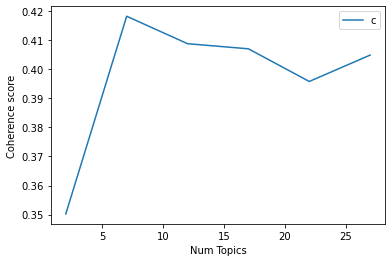

In [152]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2020_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [153]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2020_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 7

index: 0 | Num Topics = 2  has Coherence Value of 0.3502
index: 1 | Num Topics = 7  has Coherence Value of 0.4181
index: 2 | Num Topics = 12  has Coherence Value of 0.4087
index: 3 | Num Topics = 17  has Coherence Value of 0.4069
index: 4 | Num Topics = 22  has Coherence Value of 0.3957
index: 5 | Num Topics = 27  has Coherence Value of 0.4048


In [154]:
# Select optimal number of topics
optimal_model_us_2020_score1N2N3 = model_list_us_2020_score1N2N3[1]

In [155]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2020_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2020_score1N2N3, corpus_us_2020_score1N2N3, id2word_us_2020_score1N2N3)

In [156]:
print("pyLDAVis for us topics for score=1,2,3 in 2020:")
vis_us_2020_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2020:


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.183741 -0.015938       1        1  37.335921
3      0.117401 -0.091375       2        1  23.846662
2      0.144269  0.005307       3        1  20.826747
5      0.037489 -0.094936       4        1   8.421811
1      0.006181  0.253463       5        1   6.958149
4     -0.273399 -0.046650       6        1   1.686352
6     -0.215682 -0.009870       7        1   0.924359, topic_info=             Term         Freq        Total Category  logprob  loglift
0         account   820.000000   820.000000  Default  30.0000  30.0000
60          story   577.000000   577.000000  Default  29.0000  29.0000
61         update  1032.000000  1032.000000  Default  28.0000  28.0000
58   notification   156.000000   156.000000  Default  27.0000  27.0000
766            ad   202.000000   202.000000  Default  26.0000  26.0000
..            ...          ...          ...      ...      ...      ...
71            day     3.495636   359.541034   Topic7  -5.1168   0.0505
108          turn     2.907846   147.713828   Topic7  -5.3009   0.7560
265          feed     2.366015    22.046846   Topic7  -5.5071   2.4519
596        simply     2.265395    25.953563   Topic7  -5.5505   2.2453
107          time     2.270288   745.349226   Topic7  -5.5484  -1.1101

[466 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
23        2  0.469558    access
23        3  0.052173    access
23        4  0.427820    access
23        5  0.041739    access
497       5  0.921618  accident
...     ...       ...       ...
46        3  0.100442      year
46        4  0.073657      year
46        5  0.042409      year
906       3  0.102809      zoom
906       4  0.891009      zoom

[793 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 3, 6, 2, 5, 7])

## By-rating of 2021 (Rating=1,2,3)

In [157]:
# By-rating Topic Modelling - rating = 1,2,3 in 2021
# Convert to list - move to each section
review_us_2021_score1N2N3 = snapchat_ios_us_review_YearMonth_2021_score1N2N3.review.values.tolist()
review_words_us_2021_score1N2N3 = list(sent_to_words(review_us_2021_score1N2N3))
print(review_words_us_2021_score1N2N3[:1])

[['however', 'it', 'fails', 'to', 'upload', 'more', 'than', 'half', 'of', 'diy', 'things', 'upload', 'and', 'build', 'video', 'with', 'also', 'notice', 'for', 'the', 'past', 'months', 'it', 'takes', 'almost', 'min', 'to', 'get', 'it', 'to', 'do', 'anything', 'when', 'it', 'lost', 'lot', 'of', 'my', 'content', 'that', 'loaded', 'but', 'then', 'failed', 'to', 'upload', 'those', 'things', 'got', 'lost', 'and', 'that', 'was', 'around', 'the', 'time', 'the', 'app', 'started', 'freaking', 'out', 'kicking', 'off', 'shutting', 'down', 'or', 'just', 'don', 'load', 'is', 'it', 'not', 'being', 'ran', 'because', 'of', 'the', 'tiktok', 'getting', 'bigger', 'kinda', 'hope', 'not', 'rather', 'use', 'this', 'platform', 'when', 'started', 'having', 'issues', 'messaged', 'support', 'via', 'the', 'app', 'but', 'never', 'got', 'response', 'back', 'directly', 'on', 'the', 'app', 'got', 'so', 'frustrated', 'the', 'other', 'day', 'that', 'cleared', 'my', 'phone', 'history', 'thinking', 'it', 'was', 'my', 'ph

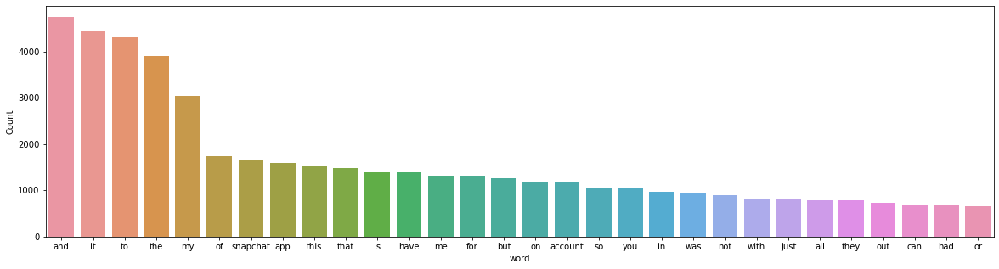

In [158]:
# Inspect the frequency of words before cleaning
freq_words(flatten(review_words_us_2021_score1N2N3))

In [159]:
# Clean text
review_words_us_ready_2021_score1N2N3 = process_words(review_words_us_2021_score1N2N3)  # processed Text Data! - move to each section

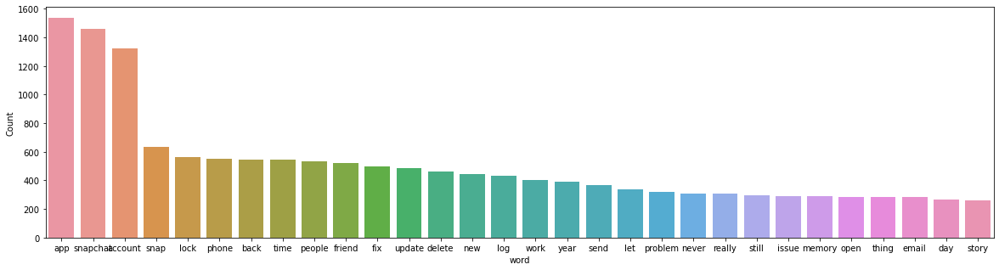

In [160]:
# Inspect the frequency of words after cleaning
freq_words(flatten(review_words_us_ready_2021_score1N2N3))


In [161]:
# Create Dictionary
id2word_us_2021_score1N2N3 = corpora.Dictionary(review_words_us_ready_2021_score1N2N3)

2021-10-17 02:39:25,327 [INFO] gensim.corpora.dictionary - adding document #0 to Dictionary(0 unique tokens: [])
2021-10-17 02:39:25,680 [INFO] gensim.corpora.dictionary - built Dictionary(3137 unique tokens: ['access', 'almost', 'app', 'avail', 'back']...) from 967 documents (total 45442 corpus positions)
2021-10-17 02:39:25,682 [INFO] gensim.utils - Dictionary lifecycle event {'msg': "built Dictionary(3137 unique tokens: ['access', 'almost', 'app', 'avail', 'back']...) from 967 documents (total 45442 corpus positions)", 'datetime': '2021-10-17T02:39:25.682735', 'gensim': '4.1.2', 'python': '3.8.8 (default, Apr 13 2021, 12:59:45) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}


In [162]:
# Create Corpus: Term Document Frequency
corpus_us_2021_score1N2N3 = [id2word_us_2021_score1N2N3.doc2bow(text) for text in review_words_us_ready_2021_score1N2N3]

In [163]:
# Training LDA model
model_list_us_2021_score1N2N3, coherence_values_us_2021_score1N2N3 = compute_coherence_values(dictionary=id2word_us_2021_score1N2N3, corpus=corpus_us_2021_score1N2N3, 
                                                              texts=review_words_us_ready_2021_score1N2N3, limit=30, start=2, step=5)


2021-10-17 02:39:25,902 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.5
2021-10-17 02:39:25,904 [INFO] gensim.models.ldamodel - using symmetric eta at 0.5
2021-10-17 02:39:25,909 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-17 02:39:25,911 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 2 topics, 50 passes over the supplied corpus of 967 documents, updating model once every 967 documents, evaluating perplexity every 967 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-17 02:39:30,039 [INFO] gensim.models.ldamodel - -8.500 per-word bound, 361.9 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:39:30,041 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #967/967
2021-10-17 02:39:34,180 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.040*"app" + 0.036*"snapchat" + 0.022*"account" + 0.013*"update" + 0.012*"lock" + 0.012*"time" + 0.011

2021-10-17 02:40:32,321 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.050*"account" + 0.030*"snapchat" + 0.022*"lock" + 0.016*"app" + 0.015*"people" + 0.013*"back" + 0.012*"snap" + 0.011*"new" + 0.011*"email" + 0.011*"memory"
2021-10-17 02:40:32,322 [INFO] gensim.models.ldamodel - topic diff=0.025849, rho=0.301511
2021-10-17 02:40:35,541 [INFO] gensim.models.ldamodel - -6.326 per-word bound, 80.2 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:40:35,548 [INFO] gensim.models.ldamodel - PROGRESS: pass 10, at document #967/967
2021-10-17 02:40:37,933 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.048*"app" + 0.030*"snapchat" + 0.019*"update" + 0.015*"fix" + 0.015*"snap" + 0.015*"time" + 0.014*"work" + 0.014*"phone" + 0.011*"open" + 0.011*"delete"
2021-10-17 02:40:37,934 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.051*"account" + 0.030*"snapchat" + 0.022*"lock" + 0.016*"app" + 0.015*"people" + 0.013*"back" + 0.012*"snap" + 0

2021-10-17 02:41:26,039 [INFO] gensim.models.ldamodel - topic diff=0.013288, rho=0.218218
2021-10-17 02:41:28,910 [INFO] gensim.models.ldamodel - -6.315 per-word bound, 79.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:41:28,913 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #967/967
2021-10-17 02:41:31,288 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.047*"app" + 0.029*"snapchat" + 0.019*"update" + 0.016*"snap" + 0.015*"fix" + 0.015*"time" + 0.014*"work" + 0.013*"phone" + 0.011*"open" + 0.011*"friend"
2021-10-17 02:41:31,305 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.055*"account" + 0.031*"snapchat" + 0.024*"lock" + 0.015*"app" + 0.014*"people" + 0.013*"back" + 0.012*"log" + 0.012*"new" + 0.012*"email" + 0.011*"year"
2021-10-17 02:41:31,310 [INFO] gensim.models.ldamodel - topic diff=0.012805, rho=0.213201
2021-10-17 02:41:34,185 [INFO] gensim.models.ldamodel - -6.314 per-word bound, 79.6 perplexity estima

2021-10-17 02:42:19,331 [INFO] gensim.models.ldamodel - PROGRESS: pass 30, at document #967/967
2021-10-17 02:42:21,480 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.046*"app" + 0.028*"snapchat" + 0.019*"update" + 0.016*"snap" + 0.015*"fix" + 0.015*"time" + 0.013*"work" + 0.013*"phone" + 0.011*"friend" + 0.011*"open"
2021-10-17 02:42:21,483 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.057*"account" + 0.032*"snapchat" + 0.024*"lock" + 0.015*"app" + 0.014*"back" + 0.013*"people" + 0.013*"log" + 0.012*"new" + 0.012*"email" + 0.011*"year"
2021-10-17 02:42:21,490 [INFO] gensim.models.ldamodel - topic diff=0.008846, rho=0.176777
2021-10-17 02:42:24,263 [INFO] gensim.models.ldamodel - -6.308 per-word bound, 79.3 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:42:24,265 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #967/967
2021-10-17 02:42:26,402 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.046*"app" + 0.028*"

2021-10-17 02:43:10,942 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.058*"account" + 0.033*"snapchat" + 0.025*"lock" + 0.015*"app" + 0.014*"back" + 0.014*"log" + 0.013*"people" + 0.013*"new" + 0.012*"email" + 0.012*"year"
2021-10-17 02:43:10,943 [INFO] gensim.models.ldamodel - topic diff=0.006062, rho=0.154303
2021-10-17 02:43:13,643 [INFO] gensim.models.ldamodel - -6.305 per-word bound, 79.1 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:43:13,646 [INFO] gensim.models.ldamodel - PROGRESS: pass 41, at document #967/967
2021-10-17 02:43:15,575 [INFO] gensim.models.ldamodel - topic #0 (0.500): 0.046*"app" + 0.028*"snapchat" + 0.018*"update" + 0.016*"snap" + 0.015*"fix" + 0.015*"time" + 0.013*"work" + 0.012*"phone" + 0.011*"friend" + 0.011*"open"
2021-10-17 02:43:15,582 [INFO] gensim.models.ldamodel - topic #1 (0.500): 0.058*"account" + 0.033*"snapchat" + 0.025*"lock" + 0.015*"app" + 0.014*"back" + 0.014*"log" + 0.013*"people" + 0.013

2021-10-17 02:43:59,481 [INFO] gensim.topic_coherence.text_analysis - accumulated word occurrence stats for 967 virtual documents
2021-10-17 02:43:59,760 [INFO] gensim.models.ldamodel - using symmetric alpha at 0.14285714285714285
2021-10-17 02:43:59,763 [INFO] gensim.models.ldamodel - using symmetric eta at 0.14285714285714285
2021-10-17 02:43:59,770 [INFO] gensim.models.ldamodel - using serial LDA version on this node
2021-10-17 02:43:59,780 [INFO] gensim.models.ldamodel - running online (multi-pass) LDA training, 7 topics, 50 passes over the supplied corpus of 967 documents, updating model once every 967 documents, evaluating perplexity every 967 documents, iterating 50x with a convergence threshold of 0.001000
2021-10-17 02:44:03,841 [INFO] gensim.models.ldamodel - -9.108 per-word bound, 551.8 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:44:03,842 [INFO] gensim.models.ldamodel - PROGRESS: pass 0, at document #967/967
2021-10-17 02:4

2021-10-17 02:44:33,960 [INFO] gensim.models.ldamodel - -6.457 per-word bound, 87.9 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:44:33,961 [INFO] gensim.models.ldamodel - PROGRESS: pass 5, at document #967/967
2021-10-17 02:44:35,771 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.030*"account" + 0.025*"people" + 0.019*"snapchat" + 0.017*"snap" + 0.015*"app" + 0.013*"delete" + 0.012*"ban" + 0.011*"new" + 0.010*"memory" + 0.010*"friend"
2021-10-17 02:44:35,782 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.032*"snapchat" + 0.031*"app" + 0.017*"snap" + 0.016*"time" + 0.015*"phone" + 0.014*"never" + 0.014*"account" + 0.014*"video" + 0.013*"problem" + 0.011*"year"
2021-10-17 02:44:35,793 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.067*"app" + 0.032*"snapchat" + 0.021*"update" + 0.013*"delete" + 0.012*"problem" + 0.012*"still" + 0.011*"friend" + 0.011*"fix" + 0.010*"phone" + 0.010*"work"
2021-10-17 02:44:35,803 [INFO] gensim

2021-10-17 02:44:59,256 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.065*"app" + 0.036*"snapchat" + 0.024*"work" + 0.022*"open" + 0.021*"phone" + 0.020*"fix" + 0.018*"delete" + 0.017*"update" + 0.017*"let" + 0.016*"time"
2021-10-17 02:44:59,257 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"update" + 0.023*"snapchat" + 0.021*"app" + 0.016*"people" + 0.016*"story" + 0.015*"add" + 0.013*"fix" + 0.010*"friend" + 0.010*"thing" + 0.009*"change"
2021-10-17 02:44:59,259 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.070*"account" + 0.035*"snapchat" + 0.033*"lock" + 0.020*"log" + 0.019*"back" + 0.017*"email" + 0.016*"app" + 0.016*"new" + 0.013*"phone" + 0.012*"year"
2021-10-17 02:44:59,260 [INFO] gensim.models.ldamodel - topic diff=0.052804, rho=0.288675
2021-10-17 02:45:01,713 [INFO] gensim.models.ldamodel - -6.405 per-word bound, 84.7 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:45:01,720 [INFO] gensim.models.ldamodel - 

2021-10-17 02:45:21,599 [INFO] gensim.models.ldamodel - topic diff=0.030580, rho=0.242536
2021-10-17 02:45:24,125 [INFO] gensim.models.ldamodel - -6.389 per-word bound, 83.8 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:45:24,127 [INFO] gensim.models.ldamodel - PROGRESS: pass 16, at document #967/967
2021-10-17 02:45:25,817 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.073*"account" + 0.036*"snapchat" + 0.033*"lock" + 0.019*"log" + 0.019*"back" + 0.017*"email" + 0.016*"new" + 0.015*"app" + 0.013*"phone" + 0.013*"year"
2021-10-17 02:45:25,824 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.029*"update" + 0.022*"snapchat" + 0.020*"app" + 0.017*"people" + 0.017*"story" + 0.016*"add" + 0.013*"fix" + 0.010*"friend" + 0.010*"thing" + 0.010*"change"
2021-10-17 02:45:25,832 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.026*"people" + 0.016*"snapchat" + 0.015*"app" + 0.015*"account" + 0.014*"snap" + 0.013*"delete" + 0.012*"ad" + 0

2021-10-17 02:45:47,650 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.026*"people" + 0.015*"snapchat" + 0.015*"app" + 0.014*"snap" + 0.014*"ad" + 0.013*"story" + 0.012*"delete" + 0.011*"account" + 0.010*"ban" + 0.009*"post"
2021-10-17 02:45:47,686 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"update" + 0.022*"snapchat" + 0.020*"app" + 0.017*"people" + 0.017*"add" + 0.017*"story" + 0.013*"fix" + 0.010*"friend" + 0.010*"change" + 0.010*"thing"
2021-10-17 02:45:47,689 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.074*"account" + 0.037*"snapchat" + 0.033*"lock" + 0.019*"log" + 0.018*"back" + 0.017*"email" + 0.016*"new" + 0.015*"app" + 0.013*"phone" + 0.013*"year"
2021-10-17 02:45:47,710 [INFO] gensim.models.ldamodel - topic diff=0.019745, rho=0.208514
2021-10-17 02:45:50,264 [INFO] gensim.models.ldamodel - -6.380 per-word bound, 83.3 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:45:50,267 [INFO] gensim.models.ldamodel 

2021-10-17 02:46:09,420 [INFO] gensim.models.ldamodel - topic diff=0.015000, rho=0.188982
2021-10-17 02:46:12,063 [INFO] gensim.models.ldamodel - -6.374 per-word bound, 82.9 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:46:12,065 [INFO] gensim.models.ldamodel - PROGRESS: pass 27, at document #967/967
2021-10-17 02:46:13,730 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"snapchat" + 0.022*"snap" + 0.021*"app" + 0.015*"people" + 0.014*"ad" + 0.010*"story" + 0.009*"feature" + 0.009*"look" + 0.008*"add" + 0.008*"time"
2021-10-17 02:46:13,731 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"update" + 0.022*"snapchat" + 0.020*"app" + 0.018*"people" + 0.018*"add" + 0.017*"story" + 0.013*"fix" + 0.011*"change" + 0.010*"friend" + 0.010*"thing"
2021-10-17 02:46:13,734 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.068*"app" + 0.037*"snapchat" + 0.024*"work" + 0.022*"phone" + 0.022*"fix" + 0.022*"open" + 0.020*"update" + 0.01

2021-10-17 02:46:34,675 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.030*"update" + 0.022*"snapchat" + 0.020*"app" + 0.018*"add" + 0.018*"people" + 0.017*"story" + 0.013*"fix" + 0.011*"change" + 0.010*"friend" + 0.010*"thing"
2021-10-17 02:46:34,678 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.023*"snapchat" + 0.021*"snap" + 0.021*"app" + 0.015*"people" + 0.014*"ad" + 0.010*"story" + 0.009*"feature" + 0.009*"look" + 0.008*"add" + 0.007*"time"
2021-10-17 02:46:34,680 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.026*"people" + 0.016*"ad" + 0.015*"app" + 0.014*"story" + 0.013*"snap" + 0.013*"snapchat" + 0.010*"delete" + 0.009*"post" + 0.009*"content" + 0.008*"time"
2021-10-17 02:46:34,682 [INFO] gensim.models.ldamodel - topic diff=0.011207, rho=0.171499
2021-10-17 02:46:37,243 [INFO] gensim.models.ldamodel - -6.370 per-word bound, 82.7 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:46:37,244 [INFO] gensim.models.ldamodel

2021-10-17 02:46:56,223 [INFO] gensim.models.ldamodel - topic diff=0.009296, rho=0.160128
2021-10-17 02:46:59,245 [INFO] gensim.models.ldamodel - -6.367 per-word bound, 82.5 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:46:59,247 [INFO] gensim.models.ldamodel - PROGRESS: pass 38, at document #967/967
2021-10-17 02:47:01,480 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.043*"app" + 0.022*"snapchat" + 0.010*"add" + 0.008*"user" + 0.008*"kid" + 0.008*"update" + 0.008*"location" + 0.007*"friend" + 0.006*"social" + 0.006*"medium"
2021-10-17 02:47:01,490 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.074*"account" + 0.037*"snapchat" + 0.033*"lock" + 0.018*"log" + 0.018*"back" + 0.016*"email" + 0.016*"new" + 0.015*"app" + 0.014*"memory" + 0.013*"year"
2021-10-17 02:47:01,494 [INFO] gensim.models.ldamodel - topic #0 (0.143): 0.068*"app" + 0.037*"snapchat" + 0.024*"work" + 0.022*"phone" + 0.022*"fix" + 0.021*"open" + 0.020*"update" + 0

2021-10-17 02:47:20,915 [INFO] gensim.models.ldamodel - topic #5 (0.143): 0.042*"app" + 0.021*"snapchat" + 0.010*"add" + 0.009*"user" + 0.008*"kid" + 0.008*"location" + 0.007*"update" + 0.007*"friend" + 0.006*"age" + 0.006*"medium"
2021-10-17 02:47:20,929 [INFO] gensim.models.ldamodel - topic #6 (0.143): 0.074*"account" + 0.037*"snapchat" + 0.033*"lock" + 0.018*"log" + 0.018*"back" + 0.016*"email" + 0.016*"new" + 0.015*"app" + 0.014*"memory" + 0.013*"year"
2021-10-17 02:47:20,944 [INFO] gensim.models.ldamodel - topic #1 (0.143): 0.026*"people" + 0.019*"ad" + 0.015*"story" + 0.015*"app" + 0.013*"snap" + 0.012*"snapchat" + 0.009*"content" + 0.009*"delete" + 0.008*"time" + 0.008*"thing"
2021-10-17 02:47:20,966 [INFO] gensim.models.ldamodel - topic diff=0.007472, rho=0.149071
2021-10-17 02:47:23,233 [INFO] gensim.models.ldamodel - -6.364 per-word bound, 82.4 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:47:23,234 [INFO] gensim.models.ldamode

2021-10-17 02:47:40,231 [INFO] gensim.models.ldamodel - topic diff=0.006345, rho=0.141421
2021-10-17 02:47:42,382 [INFO] gensim.models.ldamodel - -6.362 per-word bound, 82.3 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:47:42,383 [INFO] gensim.models.ldamodel - PROGRESS: pass 49, at document #967/967
2021-10-17 02:47:43,956 [INFO] gensim.models.ldamodel - topic #4 (0.143): 0.032*"video" + 0.024*"app" + 0.017*"snapchat" + 0.016*"snap" + 0.015*"time" + 0.015*"never" + 0.012*"story" + 0.012*"post" + 0.011*"really" + 0.010*"save"
2021-10-17 02:47:43,958 [INFO] gensim.models.ldamodel - topic #2 (0.143): 0.031*"update" + 0.023*"snapchat" + 0.020*"app" + 0.019*"add" + 0.019*"people" + 0.017*"story" + 0.012*"fix" + 0.011*"change" + 0.011*"friend" + 0.010*"thing"
2021-10-17 02:47:43,970 [INFO] gensim.models.ldamodel - topic #3 (0.143): 0.022*"snapchat" + 0.021*"app" + 0.020*"snap" + 0.014*"ad" + 0.014*"people" + 0.011*"story" + 0.010*"feature" + 

2021-10-17 02:48:13,371 [INFO] gensim.models.ldamodel - topic #3 (0.083): 0.035*"snapchat" + 0.029*"app" + 0.025*"snap" + 0.018*"fix" + 0.013*"people" + 0.013*"friend" + 0.012*"update" + 0.012*"time" + 0.011*"look" + 0.009*"keep"
2021-10-17 02:48:13,374 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.018*"app" + 0.016*"account" + 0.015*"thing" + 0.014*"lock" + 0.013*"snapchat" + 0.013*"snap" + 0.011*"chat" + 0.010*"able" + 0.010*"time" + 0.010*"content"
2021-10-17 02:48:13,376 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.031*"ad" + 0.026*"snapchat" + 0.021*"story" + 0.020*"account" + 0.018*"app" + 0.017*"delete" + 0.015*"people" + 0.012*"watch" + 0.011*"video" + 0.011*"snap"
2021-10-17 02:48:13,377 [INFO] gensim.models.ldamodel - topic diff=0.307666, rho=0.447214
2021-10-17 02:48:16,147 [INFO] gensim.models.ldamodel - -6.595 per-word bound, 96.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:48:16,148 [INFO] gensim.models.ldam

2021-10-17 02:48:36,634 [INFO] gensim.models.ldamodel - topic diff=0.103484, rho=0.316228
2021-10-17 02:48:39,286 [INFO] gensim.models.ldamodel - -6.510 per-word bound, 91.1 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:48:39,289 [INFO] gensim.models.ldamodel - PROGRESS: pass 9, at document #967/967
2021-10-17 02:48:41,008 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.072*"app" + 0.032*"snapchat" + 0.025*"work" + 0.025*"open" + 0.023*"phone" + 0.020*"delete" + 0.020*"fix" + 0.017*"let" + 0.016*"time" + 0.015*"snap"
2021-10-17 02:48:41,011 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.047*"ad" + 0.032*"story" + 0.022*"snapchat" + 0.020*"watch" + 0.017*"app" + 0.016*"people" + 0.015*"video" + 0.013*"delete" + 0.010*"second" + 0.009*"friend"
2021-10-17 02:48:41,013 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.028*"update" + 0.025*"snapchat" + 0.022*"people" + 0.018*"app" + 0.016*"add" + 0.014*"story" + 0.014*"fix" + 0.01

2021-10-17 02:49:02,249 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.019*"content" + 0.016*"thing" + 0.014*"chat" + 0.014*"app" + 0.012*"snap" + 0.010*"video" + 0.010*"send" + 0.010*"page" + 0.009*"able" + 0.009*"clear"
2021-10-17 02:49:02,251 [INFO] gensim.models.ldamodel - topic #8 (0.083): 0.032*"app" + 0.030*"update" + 0.027*"snap" + 0.015*"time" + 0.012*"change" + 0.011*"fix" + 0.011*"story" + 0.011*"issue" + 0.011*"load" + 0.009*"problem"
2021-10-17 02:49:02,253 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.061*"app" + 0.039*"snapchat" + 0.022*"update" + 0.014*"problem" + 0.013*"friend" + 0.012*"add" + 0.011*"bug" + 0.010*"people" + 0.008*"location" + 0.008*"send"
2021-10-17 02:49:02,254 [INFO] gensim.models.ldamodel - topic diff=0.046751, rho=0.250000
2021-10-17 02:49:05,002 [INFO] gensim.models.ldamodel - -6.473 per-word bound, 88.8 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:49:05,003 [INFO] gensim.models.ldamodel

2021-10-17 02:49:23,718 [INFO] gensim.models.ldamodel - topic diff=0.031477, rho=0.218218
2021-10-17 02:49:26,121 [INFO] gensim.models.ldamodel - -6.457 per-word bound, 87.9 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:49:26,122 [INFO] gensim.models.ldamodel - PROGRESS: pass 20, at document #967/967
2021-10-17 02:49:27,756 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.074*"app" + 0.035*"snapchat" + 0.026*"work" + 0.025*"phone" + 0.024*"open" + 0.022*"fix" + 0.020*"delete" + 0.018*"update" + 0.018*"time" + 0.017*"let"
2021-10-17 02:49:27,758 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.060*"ad" + 0.044*"story" + 0.025*"watch" + 0.020*"video" + 0.018*"app" + 0.017*"snapchat" + 0.016*"people" + 0.013*"second" + 0.010*"time" + 0.010*"friend"
2021-10-17 02:49:27,759 [INFO] gensim.models.ldamodel - topic #6 (0.083): 0.078*"account" + 0.035*"snapchat" + 0.034*"lock" + 0.023*"log" + 0.020*"back" + 0.019*"email" + 0.018*"new" + 0.0

2021-10-17 02:49:47,987 [INFO] gensim.models.ldamodel - topic #5 (0.083): 0.057*"app" + 0.034*"snapchat" + 0.016*"update" + 0.013*"add" + 0.011*"friend" + 0.011*"problem" + 0.010*"location" + 0.009*"people" + 0.008*"talk" + 0.008*"kid"
2021-10-17 02:49:47,989 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.019*"user" + 0.012*"snapchat" + 0.012*"privacy" + 0.010*"age" + 0.009*"friend" + 0.008*"allow" + 0.007*"name" + 0.007*"add" + 0.006*"still" + 0.006*"stupid"
2021-10-17 02:49:47,991 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.029*"update" + 0.026*"snapchat" + 0.024*"people" + 0.018*"app" + 0.018*"add" + 0.015*"story" + 0.014*"video" + 0.013*"fix" + 0.013*"feature" + 0.012*"thing"
2021-10-17 02:49:47,995 [INFO] gensim.models.ldamodel - topic diff=0.021591, rho=0.192450
2021-10-17 02:49:50,730 [INFO] gensim.models.ldamodel - -6.445 per-word bound, 87.1 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:49:50,732 [INFO] gensim.model

2021-10-17 02:50:08,893 [INFO] gensim.models.ldamodel - topic diff=0.016369, rho=0.176777
2021-10-17 02:50:11,467 [INFO] gensim.models.ldamodel - -6.439 per-word bound, 86.7 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:50:11,473 [INFO] gensim.models.ldamodel - PROGRESS: pass 31, at document #967/967
2021-10-17 02:50:12,994 [INFO] gensim.models.ldamodel - topic #11 (0.083): 0.040*"snapchat" + 0.031*"app" + 0.023*"account" + 0.021*"lock" + 0.014*"time" + 0.011*"fix" + 0.010*"back" + 0.010*"permanently" + 0.009*"people" + 0.008*"delete"
2021-10-17 02:50:12,995 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.064*"ad" + 0.049*"story" + 0.026*"watch" + 0.022*"video" + 0.018*"app" + 0.015*"snapchat" + 0.015*"second" + 0.015*"people" + 0.011*"time" + 0.010*"friend"
2021-10-17 02:50:12,997 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.019*"user" + 0.013*"privacy" + 0.011*"snapchat" + 0.011*"age" + 0.009*"allow" + 0.009*"friend" + 0.00

2021-10-17 02:50:34,271 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.020*"content" + 0.015*"chat" + 0.015*"thing" + 0.012*"clear" + 0.011*"snap" + 0.010*"video" + 0.010*"scroll" + 0.009*"send" + 0.009*"page" + 0.009*"app"
2021-10-17 02:50:34,274 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.019*"user" + 0.013*"privacy" + 0.011*"age" + 0.010*"snapchat" + 0.009*"allow" + 0.009*"friend" + 0.008*"name" + 0.007*"add" + 0.007*"stuff" + 0.007*"create"
2021-10-17 02:50:34,279 [INFO] gensim.models.ldamodel - topic #10 (0.083): 0.064*"ad" + 0.051*"story" + 0.027*"watch" + 0.022*"video" + 0.019*"app" + 0.016*"second" + 0.015*"snapchat" + 0.015*"people" + 0.011*"time" + 0.010*"discover"
2021-10-17 02:50:34,282 [INFO] gensim.models.ldamodel - topic diff=0.012315, rho=0.162221
2021-10-17 02:50:36,514 [INFO] gensim.models.ldamodel - -6.433 per-word bound, 86.4 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:50:36,515 [INFO] gensim.models.lda

2021-10-17 02:50:53,897 [INFO] gensim.models.ldamodel - topic diff=0.010012, rho=0.152499
2021-10-17 02:50:56,139 [INFO] gensim.models.ldamodel - -6.430 per-word bound, 86.2 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:50:56,140 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #967/967
2021-10-17 02:50:57,887 [INFO] gensim.models.ldamodel - topic #7 (0.083): 0.019*"user" + 0.014*"privacy" + 0.011*"age" + 0.010*"allow" + 0.009*"snapchat" + 0.009*"friend" + 0.008*"name" + 0.008*"stuff" + 0.008*"add" + 0.007*"create"
2021-10-17 02:50:57,890 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.032*"snapchat" + 0.024*"app" + 0.017*"never" + 0.016*"snap" + 0.016*"video" + 0.014*"people" + 0.013*"year" + 0.011*"time" + 0.011*"friend" + 0.009*"picture"
2021-10-17 02:50:57,892 [INFO] gensim.models.ldamodel - topic #0 (0.083): 0.074*"app" + 0.036*"snapchat" + 0.026*"work" + 0.025*"phone" + 0.023*"fix" + 0.023*"open" + 0.020*"delete" 

2021-10-17 02:51:17,239 [INFO] gensim.models.ldamodel - topic #9 (0.083): 0.018*"content" + 0.016*"chat" + 0.014*"thing" + 0.012*"clear" + 0.011*"scroll" + 0.011*"snap" + 0.010*"video" + 0.009*"send" + 0.009*"second" + 0.009*"page"
2021-10-17 02:51:17,242 [INFO] gensim.models.ldamodel - topic #2 (0.083): 0.029*"update" + 0.027*"snapchat" + 0.024*"people" + 0.019*"app" + 0.018*"add" + 0.015*"story" + 0.014*"video" + 0.014*"fix" + 0.013*"feature" + 0.013*"friend"
2021-10-17 02:51:17,243 [INFO] gensim.models.ldamodel - topic #4 (0.083): 0.032*"snapchat" + 0.024*"app" + 0.017*"never" + 0.016*"video" + 0.016*"snap" + 0.014*"people" + 0.013*"year" + 0.011*"time" + 0.010*"friend" + 0.010*"picture"
2021-10-17 02:51:17,246 [INFO] gensim.models.ldamodel - topic diff=0.007917, rho=0.142857
2021-10-17 02:51:19,471 [INFO] gensim.models.ldamodel - -6.427 per-word bound, 86.0 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:51:19,474 [INFO] gensim.models.

2021-10-17 02:51:48,595 [INFO] gensim.models.ldamodel - -6.795 per-word bound, 111.1 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:51:48,597 [INFO] gensim.models.ldamodel - PROGRESS: pass 2, at document #967/967
2021-10-17 02:51:50,990 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.052*"account" + 0.026*"snapchat" + 0.026*"app" + 0.023*"lock" + 0.023*"log" + 0.021*"phone" + 0.020*"back" + 0.017*"new" + 0.015*"snap" + 0.014*"email"
2021-10-17 02:51:50,992 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.034*"account" + 0.031*"snapchat" + 0.017*"snap" + 0.017*"lock" + 0.015*"people" + 0.015*"friend" + 0.013*"problem" + 0.012*"log" + 0.012*"back" + 0.010*"app"
2021-10-17 02:51:50,993 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.032*"snapchat" + 0.021*"let" + 0.018*"app" + 0.017*"time" + 0.016*"back" + 0.013*"issue" + 0.013*"day" + 0.011*"friend" + 0.011*"update" + 0.011*"delete"
2021-10-17 02:51:50,995 [INFO] gensim.models.

2021-10-17 02:52:15,537 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.072*"app" + 0.032*"snapchat" + 0.028*"open" + 0.025*"work" + 0.022*"phone" + 0.019*"delete" + 0.018*"let" + 0.018*"fix" + 0.018*"time" + 0.017*"download"
2021-10-17 02:52:15,540 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.039*"snap" + 0.036*"snapchat" + 0.032*"app" + 0.029*"fix" + 0.021*"friend" + 0.016*"send" + 0.013*"text" + 0.013*"open" + 0.013*"bug" + 0.012*"people"
2021-10-17 02:52:15,542 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.061*"ad" + 0.032*"story" + 0.027*"watch" + 0.023*"app" + 0.015*"people" + 0.014*"video" + 0.013*"snapchat" + 0.012*"snap" + 0.012*"second" + 0.010*"really"
2021-10-17 02:52:15,544 [INFO] gensim.models.ldamodel - topic diff=0.163295, rho=0.333333
2021-10-17 02:52:18,263 [INFO] gensim.models.ldamodel - -6.594 per-word bound, 96.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:52:18,264 [INFO] gensim.models.ldamodel -

2021-10-17 02:52:38,021 [INFO] gensim.models.ldamodel - topic diff=0.072195, rho=0.267261
2021-10-17 02:52:40,667 [INFO] gensim.models.ldamodel - -6.548 per-word bound, 93.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:52:40,669 [INFO] gensim.models.ldamodel - PROGRESS: pass 13, at document #967/967
2021-10-17 02:52:42,494 [INFO] gensim.models.ldamodel - topic #8 (0.059): 0.041*"update" + 0.028*"app" + 0.022*"support" + 0.021*"fix" + 0.016*"snap" + 0.011*"receive" + 0.010*"issue" + 0.010*"snapchat" + 0.008*"time" + 0.008*"next"
2021-10-17 02:52:42,495 [INFO] gensim.models.ldamodel - topic #11 (0.059): 0.046*"app" + 0.031*"account" + 0.024*"lock" + 0.022*"snapchat" + 0.015*"time" + 0.011*"party" + 0.010*"delete" + 0.010*"back" + 0.009*"friend" + 0.009*"third"
2021-10-17 02:52:42,497 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.075*"app" + 0.032*"snapchat" + 0.028*"work" + 0.028*"open" + 0.025*"phone" + 0.022*"delete" + 0.020*"fix"

2021-10-17 02:53:05,529 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.079*"ad" + 0.052*"story" + 0.036*"watch" + 0.021*"second" + 0.021*"app" + 0.018*"video" + 0.014*"page" + 0.014*"people" + 0.011*"snapchat" + 0.010*"really"
2021-10-17 02:53:05,532 [INFO] gensim.models.ldamodel - topic #13 (0.059): 0.029*"content" + 0.016*"tok" + 0.016*"video" + 0.016*"picture" + 0.016*"snapchat" + 0.015*"filter" + 0.013*"face" + 0.013*"app" + 0.012*"time" + 0.011*"look"
2021-10-17 02:53:05,535 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.076*"app" + 0.033*"snapchat" + 0.029*"work" + 0.028*"open" + 0.026*"phone" + 0.023*"delete" + 0.021*"fix" + 0.020*"time" + 0.019*"let" + 0.019*"update"
2021-10-17 02:53:05,536 [INFO] gensim.models.ldamodel - topic diff=0.039929, rho=0.223607
2021-10-17 02:53:08,013 [INFO] gensim.models.ldamodel - -6.520 per-word bound, 91.8 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:53:08,014 [INFO] gensim.models.ldamo

2021-10-17 02:53:26,306 [INFO] gensim.models.ldamodel - topic diff=0.028763, rho=0.200000
2021-10-17 02:53:28,680 [INFO] gensim.models.ldamodel - -6.505 per-word bound, 90.8 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:53:28,694 [INFO] gensim.models.ldamodel - PROGRESS: pass 24, at document #967/967
2021-10-17 02:53:30,434 [INFO] gensim.models.ldamodel - topic #2 (0.059): 0.040*"update" + 0.027*"snapchat" + 0.021*"app" + 0.019*"story" + 0.018*"people" + 0.015*"change" + 0.015*"video" + 0.014*"fix" + 0.013*"new" + 0.012*"really"
2021-10-17 02:53:30,437 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.081*"account" + 0.045*"lock" + 0.036*"snapchat" + 0.029*"log" + 0.024*"back" + 0.024*"new" + 0.019*"email" + 0.018*"phone" + 0.015*"app" + 0.013*"year"
2021-10-17 02:53:30,449 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.056*"snap" + 0.029*"send" + 0.029*"app" + 0.029*"snapchat" + 0.027*"fix" + 0.026*"friend" + 0.018*"text" + 0.018

2021-10-17 02:53:51,065 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.017*"clear" + 0.016*"chat" + 0.014*"hour" + 0.014*"app" + 0.013*"able" + 0.012*"thing" + 0.011*"conversation" + 0.011*"content" + 0.010*"show" + 0.010*"story"
2021-10-17 02:53:51,067 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.024*"snapchat" + 0.019*"people" + 0.017*"friend" + 0.014*"snap" + 0.014*"account" + 0.011*"post" + 0.010*"never" + 0.009*"cameo" + 0.009*"look" + 0.008*"guy"
2021-10-17 02:53:51,069 [INFO] gensim.models.ldamodel - topic #1 (0.059): 0.048*"people" + 0.036*"snap" + 0.024*"add" + 0.016*"app" + 0.013*"memory" + 0.012*"friend" + 0.011*"well" + 0.009*"thing" + 0.009*"feature" + 0.009*"snapchat"
2021-10-17 02:53:51,071 [INFO] gensim.models.ldamodel - topic diff=0.020746, rho=0.179605
2021-10-17 02:53:53,409 [INFO] gensim.models.ldamodel - -6.492 per-word bound, 90.0 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:53:53,414 [INFO] gensim.mod

2021-10-17 02:54:11,331 [INFO] gensim.models.ldamodel - topic diff=0.016176, rho=0.166667
2021-10-17 02:54:13,778 [INFO] gensim.models.ldamodel - -6.485 per-word bound, 89.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:54:13,779 [INFO] gensim.models.ldamodel - PROGRESS: pass 35, at document #967/967
2021-10-17 02:54:15,535 [INFO] gensim.models.ldamodel - topic #14 (0.059): 0.061*"account" + 0.034*"snapchat" + 0.014*"delete" + 0.013*"memory" + 0.013*"service" + 0.013*"send" + 0.012*"support" + 0.012*"people" + 0.011*"email" + 0.011*"terminate"
2021-10-17 02:54:15,536 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.076*"app" + 0.034*"snapchat" + 0.029*"work" + 0.027*"phone" + 0.027*"open" + 0.023*"delete" + 0.022*"update" + 0.022*"fix" + 0.020*"time" + 0.019*"let"
2021-10-17 02:54:15,539 [INFO] gensim.models.ldamodel - topic #6 (0.059): 0.082*"account" + 0.045*"lock" + 0.036*"snapchat" + 0.028*"log" + 0.024*"back" + 0.023*"new" + 0.01

2021-10-17 02:54:35,999 [INFO] gensim.models.ldamodel - topic #16 (0.059): 0.024*"snapchat" + 0.020*"people" + 0.017*"friend" + 0.013*"snap" + 0.011*"post" + 0.010*"account" + 0.010*"cameo" + 0.009*"look" + 0.009*"never" + 0.009*"guy"
2021-10-17 02:54:36,008 [INFO] gensim.models.ldamodel - topic #3 (0.059): 0.062*"snap" + 0.032*"send" + 0.028*"app" + 0.027*"friend" + 0.027*"fix" + 0.025*"snapchat" + 0.019*"chat" + 0.019*"message" + 0.018*"text" + 0.015*"issue"
2021-10-17 02:54:36,013 [INFO] gensim.models.ldamodel - topic #10 (0.059): 0.081*"ad" + 0.059*"story" + 0.037*"watch" + 0.025*"second" + 0.021*"app" + 0.019*"video" + 0.017*"page" + 0.015*"discover" + 0.013*"people" + 0.013*"snapchat"
2021-10-17 02:54:36,015 [INFO] gensim.models.ldamodel - topic #9 (0.059): 0.019*"clear" + 0.016*"chat" + 0.014*"hour" + 0.013*"conversation" + 0.012*"app" + 0.012*"content" + 0.012*"able" + 0.011*"thing" + 0.010*"show" + 0.009*"story"
2021-10-17 02:54:36,017 [INFO] gensim.models.ldamodel - topic dif

2021-10-17 02:54:56,404 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.022*"snapchat" + 0.021*"let" + 0.016*"time" + 0.014*"stuff" + 0.012*"back" + 0.011*"friend" + 0.011*"app" + 0.010*"people" + 0.009*"certain" + 0.009*"delete"
2021-10-17 02:54:56,406 [INFO] gensim.models.ldamodel - topic diff=0.010228, rho=0.145865
2021-10-17 02:54:58,803 [INFO] gensim.models.ldamodel - -6.473 per-word bound, 88.9 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:54:58,804 [INFO] gensim.models.ldamodel - PROGRESS: pass 46, at document #967/967
2021-10-17 02:55:00,469 [INFO] gensim.models.ldamodel - topic #0 (0.059): 0.077*"app" + 0.035*"snapchat" + 0.029*"work" + 0.027*"phone" + 0.026*"open" + 0.023*"delete" + 0.022*"update" + 0.022*"fix" + 0.020*"time" + 0.019*"let"
2021-10-17 02:55:00,471 [INFO] gensim.models.ldamodel - topic #12 (0.059): 0.022*"snapchat" + 0.021*"let" + 0.016*"time" + 0.014*"stuff" + 0.012*"back" + 0.011*"friend" + 0.011*"app" + 0

2021-10-17 02:55:29,478 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.027*"account" + 0.025*"snapchat" + 0.021*"app" + 0.016*"send" + 0.015*"lock" + 0.014*"people" + 0.014*"problem" + 0.012*"update" + 0.012*"reason" + 0.012*"thing"
2021-10-17 02:55:29,483 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.041*"account" + 0.032*"lock" + 0.024*"app" + 0.017*"snapchat" + 0.013*"log" + 0.012*"new" + 0.012*"back" + 0.011*"snap" + 0.010*"friend" + 0.009*"year"
2021-10-17 02:55:29,491 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.044*"app" + 0.035*"account" + 0.026*"snapchat" + 0.023*"lock" + 0.017*"back" + 0.016*"time" + 0.014*"work" + 0.011*"update" + 0.011*"phone" + 0.010*"fix"
2021-10-17 02:55:29,502 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.026*"app" + 0.025*"snapchat" + 0.018*"account" + 0.016*"friend" + 0.014*"snap" + 0.013*"delete" + 0.013*"people" + 0.010*"ad" + 0.009*"send" + 0.008*"phone"
2021-10-17 02:55:29,509 [INFO] gensim.models.ldamodel - topic diff=1

2021-10-17 02:55:54,285 [INFO] gensim.models.ldamodel - topic #17 (0.045): 0.040*"app" + 0.031*"story" + 0.031*"ad" + 0.017*"video" + 0.016*"snap" + 0.015*"watch" + 0.015*"thing" + 0.013*"snapchat" + 0.010*"second" + 0.010*"add"
2021-10-17 02:55:54,286 [INFO] gensim.models.ldamodel - topic diff=0.287131, rho=0.377964
2021-10-17 02:55:56,963 [INFO] gensim.models.ldamodel - -6.676 per-word bound, 102.3 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:55:56,965 [INFO] gensim.models.ldamodel - PROGRESS: pass 6, at document #967/967
2021-10-17 02:55:58,794 [INFO] gensim.models.ldamodel - topic #6 (0.045): 0.073*"account" + 0.035*"lock" + 0.026*"snapchat" + 0.022*"log" + 0.022*"back" + 0.021*"email" + 0.017*"snap" + 0.016*"app" + 0.016*"phone" + 0.014*"year"
2021-10-17 02:55:58,797 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.049*"app" + 0.037*"update" + 0.024*"snap" + 0.015*"fix" + 0.015*"dark" + 0.015*"time" + 0.015*"mode" + 0.013*"iphon

2021-10-17 02:56:21,526 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.048*"snapchat" + 0.028*"account" + 0.018*"memory" + 0.016*"new" + 0.015*"app" + 0.014*"email" + 0.013*"year" + 0.013*"contact" + 0.012*"love" + 0.012*"support"
2021-10-17 02:56:21,528 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.056*"app" + 0.026*"snapchat" + 0.013*"way" + 0.011*"friend" + 0.011*"notification" + 0.011*"delete" + 0.011*"time" + 0.010*"year" + 0.010*"great" + 0.009*"download"
2021-10-17 02:56:21,531 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.082*"snap" + 0.039*"send" + 0.025*"people" + 0.022*"snapchat" + 0.021*"time" + 0.018*"app" + 0.017*"score" + 0.015*"fix" + 0.014*"message" + 0.013*"streak"
2021-10-17 02:56:21,535 [INFO] gensim.models.ldamodel - topic #19 (0.045): 0.024*"send" + 0.020*"kid" + 0.018*"people" + 0.017*"snapchat" + 0.016*"reason" + 0.016*"thing" + 0.012*"nude" + 0.012*"friend" + 0.011*"download" + 0.011*"app"
2021-10-17 02:56:21,537 [INFO] gensim.models.ldamodel 

2021-10-17 02:56:43,660 [INFO] gensim.models.ldamodel - topic #18 (0.045): 0.062*"app" + 0.045*"snapchat" + 0.026*"fix" + 0.025*"phone" + 0.025*"work" + 0.023*"update" + 0.021*"delete" + 0.020*"open" + 0.019*"let" + 0.018*"time"
2021-10-17 02:56:43,661 [INFO] gensim.models.ldamodel - topic diff=0.051738, rho=0.235702
2021-10-17 02:56:46,132 [INFO] gensim.models.ldamodel - -6.565 per-word bound, 94.7 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:56:46,135 [INFO] gensim.models.ldamodel - PROGRESS: pass 17, at document #967/967
2021-10-17 02:56:47,778 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.019*"people" + 0.018*"friend" + 0.016*"snapchat" + 0.015*"app" + 0.013*"chat" + 0.012*"tiktok" + 0.012*"feel" + 0.010*"add" + 0.009*"ad" + 0.009*"discover"
2021-10-17 02:56:47,780 [INFO] gensim.models.ldamodel - topic #0 (0.045): 0.058*"app" + 0.023*"snapchat" + 0.014*"way" + 0.012*"notification" + 0.011*"time" + 0.011*"year" + 0.011*"friend

2021-10-17 02:57:07,391 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.047*"snapchat" + 0.021*"account" + 0.019*"memory" + 0.015*"app" + 0.014*"new" + 0.013*"year" + 0.013*"email" + 0.012*"contact" + 0.012*"help" + 0.012*"support"
2021-10-17 02:57:07,392 [INFO] gensim.models.ldamodel - topic #11 (0.045): 0.042*"app" + 0.031*"account" + 0.025*"snapchat" + 0.024*"lock" + 0.017*"time" + 0.011*"permanently" + 0.010*"party" + 0.010*"back" + 0.009*"people" + 0.009*"pay"
2021-10-17 02:57:07,393 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.013*"send" + 0.013*"chat" + 0.013*"love" + 0.012*"snap" + 0.012*"filter" + 0.012*"screen" + 0.011*"snapchat" + 0.011*"text" + 0.011*"video" + 0.010*"swipe"
2021-10-17 02:57:07,395 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.043*"content" + 0.018*"feature" + 0.018*"look" + 0.017*"tok" + 0.016*"filter" + 0.015*"snapchat" + 0.015*"page" + 0.012*"subscribe" + 0.012*"app" + 0.012*"time"
2021-10-17 02:57:07,396 [INFO] gensim.models.ldamodel 

2021-10-17 02:57:26,431 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.020*"friend" + 0.020*"people" + 0.016*"chat" + 0.015*"tiktok" + 0.014*"snapchat" + 0.013*"app" + 0.013*"feel" + 0.012*"add" + 0.010*"due" + 0.010*"suggestion"
2021-10-17 02:57:26,433 [INFO] gensim.models.ldamodel - topic diff=0.023023, rho=0.185695
2021-10-17 02:57:28,574 [INFO] gensim.models.ldamodel - -6.533 per-word bound, 92.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:57:28,576 [INFO] gensim.models.ldamodel - PROGRESS: pass 28, at document #967/967
2021-10-17 02:57:30,061 [INFO] gensim.models.ldamodel - topic #15 (0.045): 0.045*"snapchat" + 0.019*"account" + 0.019*"memory" + 0.015*"app" + 0.013*"new" + 0.013*"year" + 0.012*"help" + 0.012*"email" + 0.011*"love" + 0.011*"password"
2021-10-17 02:57:30,064 [INFO] gensim.models.ldamodel - topic #5 (0.045): 0.071*"app" + 0.037*"snapchat" + 0.025*"add" + 0.021*"friend" + 0.020*"social" + 0.020*"medium" + 0.018*

2021-10-17 02:57:48,695 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.060*"account" + 0.043*"snapchat" + 0.033*"delete" + 0.024*"picture" + 0.017*"memory" + 0.014*"save" + 0.013*"year" + 0.013*"term" + 0.013*"ban" + 0.012*"post"
2021-10-17 02:57:48,700 [INFO] gensim.models.ldamodel - topic #21 (0.045): 0.013*"send" + 0.013*"chat" + 0.013*"love" + 0.012*"snap" + 0.012*"screen" + 0.012*"filter" + 0.011*"text" + 0.011*"video" + 0.010*"snapchat" + 0.010*"swipe"
2021-10-17 02:57:48,702 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.074*"lock" + 0.073*"account" + 0.029*"log" + 0.029*"snapchat" + 0.026*"temporarily" + 0.020*"hour" + 0.014*"new" + 0.013*"app" + 0.013*"back" + 0.013*"support"
2021-10-17 02:57:48,705 [INFO] gensim.models.ldamodel - topic #1 (0.045): 0.043*"people" + 0.016*"app" + 0.012*"child" + 0.012*"post" + 0.011*"account" + 0.010*"well" + 0.010*"friend" + 0.009*"thing" + 0.009*"discover" + 0.009*"story"
2021-10-17 02:57:48,709 [INFO] gensim.models.ldamodel - topi

2021-10-17 02:58:08,299 [INFO] gensim.models.ldamodel - topic #10 (0.045): 0.023*"friend" + 0.021*"people" + 0.018*"chat" + 0.017*"tiktok" + 0.014*"feel" + 0.014*"add" + 0.013*"snapchat" + 0.013*"app" + 0.012*"due" + 0.011*"suggestion"
2021-10-17 02:58:08,301 [INFO] gensim.models.ldamodel - topic #8 (0.045): 0.043*"app" + 0.035*"update" + 0.026*"dark" + 0.024*"mode" + 0.020*"snap" + 0.018*"setting" + 0.015*"iphone" + 0.015*"fix" + 0.012*"phone" + 0.010*"issue"
2021-10-17 02:58:08,304 [INFO] gensim.models.ldamodel - topic diff=0.013524, rho=0.158114
2021-10-17 02:58:10,412 [INFO] gensim.models.ldamodel - -6.517 per-word bound, 91.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:58:10,413 [INFO] gensim.models.ldamodel - PROGRESS: pass 39, at document #967/967
2021-10-17 02:58:11,976 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.043*"content" + 0.018*"look" + 0.018*"feature" + 0.017*"tok" + 0.016*"filter" + 0.016*"snapchat" + 0.015*"p

2021-10-17 02:58:28,908 [INFO] gensim.models.ldamodel - -6.512 per-word bound, 91.3 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:58:28,910 [INFO] gensim.models.ldamodel - PROGRESS: pass 44, at document #967/967
2021-10-17 02:58:30,416 [INFO] gensim.models.ldamodel - topic #14 (0.045): 0.061*"account" + 0.043*"snapchat" + 0.037*"delete" + 0.024*"picture" + 0.019*"memory" + 0.015*"year" + 0.014*"save" + 0.014*"post" + 0.013*"ban" + 0.012*"term"
2021-10-17 02:58:30,419 [INFO] gensim.models.ldamodel - topic #16 (0.045): 0.032*"snapchat" + 0.018*"people" + 0.018*"really" + 0.013*"delete" + 0.012*"snap" + 0.011*"time" + 0.011*"bitmoji" + 0.010*"app" + 0.010*"look" + 0.010*"well"
2021-10-17 02:58:30,421 [INFO] gensim.models.ldamodel - topic #9 (0.045): 0.074*"lock" + 0.070*"account" + 0.029*"log" + 0.028*"snapchat" + 0.026*"temporarily" + 0.021*"hour" + 0.015*"new" + 0.014*"app" + 0.013*"back" + 0.013*"support"
2021-10-17 02:58:30,424 [INFO] g

2021-10-17 02:58:48,665 [INFO] gensim.models.ldamodel - topic #13 (0.045): 0.043*"content" + 0.019*"look" + 0.018*"feature" + 0.018*"tok" + 0.017*"filter" + 0.016*"snapchat" + 0.015*"page" + 0.013*"subscribe" + 0.012*"time" + 0.011*"app"
2021-10-17 02:58:48,667 [INFO] gensim.models.ldamodel - topic #12 (0.045): 0.026*"snapchat" + 0.018*"time" + 0.016*"feature" + 0.016*"story" + 0.016*"let" + 0.015*"friend" + 0.014*"app" + 0.014*"stuff" + 0.011*"hide" + 0.010*"content"
2021-10-17 02:58:48,669 [INFO] gensim.models.ldamodel - topic #3 (0.045): 0.104*"snap" + 0.058*"send" + 0.024*"time" + 0.024*"people" + 0.022*"friend" + 0.021*"message" + 0.019*"app" + 0.015*"chat" + 0.015*"fix" + 0.015*"snapchat"
2021-10-17 02:58:48,671 [INFO] gensim.models.ldamodel - topic diff=0.009237, rho=0.140028
2021-10-17 02:58:48,673 [INFO] gensim.utils - LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=3137, num_topics=22, decay=0.5, chunksize=1000) in 206.71s', 'datetime': '2021-10-17T02:58:48.67367

2021-10-17 02:59:19,404 [INFO] gensim.models.ldamodel - topic diff=0.448954, rho=0.447214
2021-10-17 02:59:21,842 [INFO] gensim.models.ldamodel - -6.797 per-word bound, 111.2 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:59:21,844 [INFO] gensim.models.ldamodel - PROGRESS: pass 4, at document #967/967
2021-10-17 02:59:23,536 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.053*"lock" + 0.048*"account" + 0.032*"snapchat" + 0.024*"app" + 0.017*"back" + 0.015*"time" + 0.015*"work" + 0.013*"friend" + 0.013*"fix" + 0.011*"permanently"
2021-10-17 02:59:23,538 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.032*"account" + 0.026*"snapchat" + 0.021*"back" + 0.016*"snap" + 0.012*"lock" + 0.011*"second" + 0.011*"support" + 0.010*"update" + 0.009*"people" + 0.008*"picture"
2021-10-17 02:59:23,540 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.052*"video" + 0.021*"picture" + 0.020*"story" + 0.016*"send" + 0.016*"guy" + 0.014*"app" + 0.

2021-10-17 02:59:43,976 [INFO] gensim.models.ldamodel - topic #16 (0.037): 0.025*"account" + 0.022*"snapchat" + 0.020*"back" + 0.018*"snap" + 0.013*"second" + 0.011*"support" + 0.009*"update" + 0.009*"picture" + 0.008*"ban" + 0.008*"well"
2021-10-17 02:59:44,001 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.065*"app" + 0.028*"snapchat" + 0.023*"time" + 0.021*"send" + 0.018*"update" + 0.016*"snap" + 0.013*"work" + 0.012*"never" + 0.012*"phone" + 0.011*"message"
2021-10-17 02:59:44,023 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.023*"update" + 0.018*"people" + 0.017*"snapchat" + 0.016*"chat" + 0.014*"download" + 0.013*"send" + 0.013*"talk" + 0.013*"thing" + 0.012*"app" + 0.011*"voice"
2021-10-17 02:59:44,025 [INFO] gensim.models.ldamodel - topic diff=0.145886, rho=0.301511
2021-10-17 02:59:46,484 [INFO] gensim.models.ldamodel - -6.652 per-word bound, 100.6 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 02:59:46,485 [INFO] gensi

2021-10-17 03:00:04,692 [INFO] gensim.models.ldamodel - topic diff=0.068321, rho=0.250000
2021-10-17 03:00:07,402 [INFO] gensim.models.ldamodel - -6.612 per-word bound, 97.8 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 03:00:07,403 [INFO] gensim.models.ldamodel - PROGRESS: pass 15, at document #967/967
2021-10-17 03:00:09,690 [INFO] gensim.models.ldamodel - topic #3 (0.037): 0.067*"snap" + 0.031*"fix" + 0.026*"app" + 0.024*"snapchat" + 0.023*"score" + 0.019*"people" + 0.017*"send" + 0.017*"bad" + 0.016*"friend" + 0.016*"story"
2021-10-17 03:00:09,693 [INFO] gensim.models.ldamodel - topic #2 (0.037): 0.037*"update" + 0.027*"app" + 0.024*"snapchat" + 0.022*"people" + 0.017*"story" + 0.015*"feature" + 0.013*"really" + 0.013*"fix" + 0.013*"friend" + 0.012*"add"
2021-10-17 03:00:09,695 [INFO] gensim.models.ldamodel - topic #22 (0.037): 0.066*"video" + 0.026*"story" + 0.026*"picture" + 0.018*"send" + 0.016*"guy" + 0.013*"sometimes" + 0.013*"app"

2021-10-17 03:00:29,083 [INFO] gensim.models.ldamodel - topic #19 (0.037): 0.022*"update" + 0.018*"chat" + 0.016*"people" + 0.015*"talk" + 0.015*"snapchat" + 0.014*"send" + 0.013*"download" + 0.012*"voice" + 0.012*"look" + 0.011*"picture"
2021-10-17 03:00:29,085 [INFO] gensim.models.ldamodel - topic #23 (0.037): 0.066*"app" + 0.027*"snapchat" + 0.022*"send" + 0.022*"time" + 0.019*"update" + 0.014*"snap" + 0.012*"message" + 0.012*"way" + 0.011*"people" + 0.011*"work"
2021-10-17 03:00:29,088 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.075*"account" + 0.041*"snapchat" + 0.022*"lock" + 0.019*"new" + 0.018*"back" + 0.018*"log" + 0.017*"email" + 0.017*"app" + 0.015*"memory" + 0.015*"year"
2021-10-17 03:00:29,089 [INFO] gensim.models.ldamodel - topic #9 (0.037): 0.038*"ad" + 0.026*"story" + 0.019*"content" + 0.014*"thing" + 0.013*"snapchat" + 0.012*"discover" + 0.011*"app" + 0.011*"start" + 0.011*"watch" + 0.010*"game"
2021-10-17 03:00:29,091 [INFO] gensim.models.ldamodel - topic dif

2021-10-17 03:00:48,596 [INFO] gensim.models.ldamodel - topic #26 (0.037): 0.049*"video" + 0.022*"delete" + 0.022*"love" + 0.018*"app" + 0.016*"instead" + 0.016*"post" + 0.015*"save" + 0.014*"snapchat" + 0.011*"forever" + 0.010*"feature"
2021-10-17 03:00:48,600 [INFO] gensim.models.ldamodel - topic diff=0.025817, rho=0.192450
2021-10-17 03:00:50,806 [INFO] gensim.models.ldamodel - -6.572 per-word bound, 95.1 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 03:00:50,807 [INFO] gensim.models.ldamodel - PROGRESS: pass 26, at document #967/967
2021-10-17 03:00:52,313 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.050*"account" + 0.030*"snapchat" + 0.017*"save" + 0.016*"help" + 0.015*"picture" + 0.014*"email" + 0.013*"year" + 0.013*"video" + 0.012*"terminate" + 0.012*"phone"
2021-10-17 03:00:52,314 [INFO] gensim.models.ldamodel - topic #21 (0.037): 0.023*"white" + 0.020*"send" + 0.017*"child" + 0.016*"filter" + 0.015*"person" + 0.014*"screen"

2021-10-17 03:01:11,002 [INFO] gensim.models.ldamodel - topic #13 (0.037): 0.049*"content" + 0.018*"subscribe" + 0.012*"video" + 0.011*"bitmoji" + 0.011*"feature" + 0.011*"big" + 0.010*"snapchat" + 0.010*"look" + 0.009*"watch" + 0.009*"year"
2021-10-17 03:01:11,004 [INFO] gensim.models.ldamodel - topic #11 (0.037): 0.111*"lock" + 0.102*"account" + 0.045*"snapchat" + 0.028*"permanently" + 0.020*"unlock" + 0.018*"back" + 0.016*"temporarily" + 0.015*"log" + 0.014*"fix" + 0.013*"reason"
2021-10-17 03:01:11,007 [INFO] gensim.models.ldamodel - topic #14 (0.037): 0.049*"account" + 0.030*"snapchat" + 0.017*"save" + 0.016*"help" + 0.015*"picture" + 0.014*"year" + 0.013*"video" + 0.013*"email" + 0.012*"terminate" + 0.012*"phone"
2021-10-17 03:01:11,009 [INFO] gensim.models.ldamodel - topic #15 (0.037): 0.037*"snapchat" + 0.031*"account" + 0.020*"delete" + 0.017*"customer" + 0.017*"contact" + 0.016*"service" + 0.015*"year" + 0.014*"support" + 0.014*"star" + 0.014*"memory"
2021-10-17 03:01:11,011 

2021-10-17 03:01:29,676 [INFO] gensim.models.ldamodel - topic #0 (0.037): 0.053*"app" + 0.028*"way" + 0.016*"friend" + 0.016*"camera" + 0.014*"notification" + 0.013*"snapchat" + 0.012*"snap" + 0.012*"family" + 0.011*"thing" + 0.010*"photo"
2021-10-17 03:01:29,678 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.032*"user" + 0.020*"snapchat" + 0.020*"age" + 0.017*"notification" + 0.013*"friend" + 0.013*"young" + 0.012*"guy" + 0.011*"add" + 0.011*"costumer" + 0.010*"still"
2021-10-17 03:01:29,680 [INFO] gensim.models.ldamodel - topic diff=0.014340, rho=0.162221
2021-10-17 03:01:31,908 [INFO] gensim.models.ldamodel - -6.553 per-word bound, 93.9 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 03:01:31,909 [INFO] gensim.models.ldamodel - PROGRESS: pass 37, at document #967/967
2021-10-17 03:01:33,251 [INFO] gensim.models.ldamodel - topic #25 (0.037): 0.027*"app" + 0.025*"thing" + 0.024*"love" + 0.021*"really" + 0.019*"snapchat" + 0.017*"filter"

2021-10-17 03:01:50,720 [INFO] gensim.models.ldamodel - -6.547 per-word bound, 93.5 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 03:01:50,723 [INFO] gensim.models.ldamodel - PROGRESS: pass 42, at document #967/967
2021-10-17 03:01:52,282 [INFO] gensim.models.ldamodel - topic #24 (0.037): 0.072*"account" + 0.039*"snapchat" + 0.019*"new" + 0.018*"back" + 0.018*"email" + 0.016*"memory" + 0.016*"log" + 0.016*"year" + 0.016*"lock" + 0.016*"app"
2021-10-17 03:01:52,283 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.029*"app" + 0.022*"social" + 0.021*"medium" + 0.021*"platform" + 0.020*"snap" + 0.019*"ad" + 0.015*"page" + 0.013*"story" + 0.011*"time" + 0.010*"favorite"
2021-10-17 03:01:52,284 [INFO] gensim.models.ldamodel - topic #8 (0.037): 0.025*"app" + 0.023*"snap" + 0.017*"time" + 0.016*"keep" + 0.015*"streak" + 0.014*"problem" + 0.014*"update" + 0.012*"max" + 0.010*"show" + 0.010*"disappear"
2021-10-17 03:01:52,285 [INFO] gensim.models

2021-10-17 03:02:10,426 [INFO] gensim.models.ldamodel - topic #7 (0.037): 0.033*"user" + 0.020*"age" + 0.020*"snapchat" + 0.018*"notification" + 0.013*"friend" + 0.013*"young" + 0.012*"guy" + 0.011*"add" + 0.011*"costumer" + 0.010*"kid"
2021-10-17 03:02:10,430 [INFO] gensim.models.ldamodel - topic #12 (0.037): 0.026*"feature" + 0.023*"snapchat" + 0.019*"stuff" + 0.018*"time" + 0.018*"spotlight" + 0.017*"friend" + 0.016*"story" + 0.015*"change" + 0.015*"let" + 0.015*"hide"
2021-10-17 03:02:10,432 [INFO] gensim.models.ldamodel - topic #20 (0.037): 0.029*"app" + 0.022*"social" + 0.022*"medium" + 0.022*"platform" + 0.020*"snap" + 0.017*"ad" + 0.015*"page" + 0.014*"story" + 0.011*"time" + 0.011*"favorite"
2021-10-17 03:02:10,434 [INFO] gensim.models.ldamodel - topic diff=0.009569, rho=0.142857
2021-10-17 03:02:12,504 [INFO] gensim.models.ldamodel - -6.542 per-word bound, 93.2 perplexity estimate based on a held-out corpus of 967 documents with 45442 words
2021-10-17 03:02:12,506 [INFO] gens

In [164]:
%store model_list_us_2021_score1N2N3
%store coherence_values_us_2021_score1N2N3

Stored 'model_list_us_2021_score1N2N3' (list)
Stored 'coherence_values_us_2021_score1N2N3' (list)


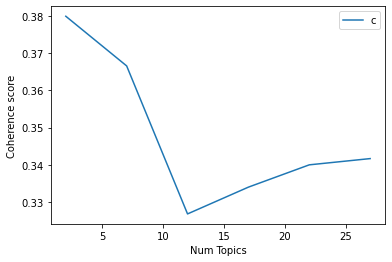

In [165]:
# Plot to see coherence score in order to choose optimal number of topics and decide optimal model
limit=30; start=2; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values_us_2021_score1N2N3)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [166]:
# Print the coherence scores
index = 0
for m, cv in zip(x, coherence_values_us_2021_score1N2N3):
    print("index:",index,"|","Num Topics =", m, " has Coherence Value of", round(cv, 4))
    index = index + 1

# optimal num_topics = 2

index: 0 | Num Topics = 2  has Coherence Value of 0.3799
index: 1 | Num Topics = 7  has Coherence Value of 0.3665
index: 2 | Num Topics = 12  has Coherence Value of 0.3268
index: 3 | Num Topics = 17  has Coherence Value of 0.334
index: 4 | Num Topics = 22  has Coherence Value of 0.34
index: 5 | Num Topics = 27  has Coherence Value of 0.3417


In [197]:
# Select optimal number of topics
optimal_model_us_2021_score1N2N3 = model_list_us_2021_score1N2N3[0]

In [198]:
# pyLDAVis
pyLDAvis.enable_notebook()
vis_us_2021_score1N2N3 = pyLDAvis.gensim_models.prepare(optimal_model_us_2021_score1N2N3, corpus_us_2021_score1N2N3, id2word_us_2021_score1N2N3)

In [199]:
print("pyLDAVis for us topics for score=1,2,3 in 2021:")
vis_us_2021_score1N2N3

pyLDAVis for us topics for score=1,2,3 in 2021:


PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
0      0.094104  0.0       1        1  54.129857
1     -0.094104  0.0       2        1  45.870143, topic_info=        Term         Freq        Total Category  logprob  loglift
137  account  1228.000000  1228.000000  Default  30.0000  30.0000
148     lock   521.000000   521.000000  Default  29.0000  29.0000
115   update   455.000000   455.000000  Default  28.0000  28.0000
141    email   261.000000   261.000000  Default  27.0000  27.0000
255     open   269.000000   269.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
51      snap   202.357349   597.065407   Topic2  -4.6348  -0.3026
73   picture   109.825970   184.891777   Topic2  -5.2459   0.2585
56      time   153.775642   513.001386   Topic2  -4.9093  -0.4254
159     send   123.054340   345.778465   Topic2  -5.1322  -0.2538
131   really   112.616168   290.354436   Topic2  -5.2209  -0.1678

[157 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
137       1  0.002443   account
137       2  0.997391   account
83        1  0.975274        ad
83        2  0.021673        ad
977       1  0.051284   address
...     ...       ...       ...
81        2  0.026548  whenever
59        1  0.828051      work
59        2  0.169857      work
60        1  0.322486      year
60        2  0.678047      year

[212 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2])

# Export pyLDAvis as html

In [200]:
# Overall
pyLDAvis.save_html(vis_us,'snapchat_vis_us.html')

# By-rating 
pyLDAvis.save_html(vis_us_score1,'snapchat_vis_us_score1.html')
pyLDAvis.save_html(vis_us_score2,'snapchat_vis_us_score2.html')
pyLDAvis.save_html(vis_us_score3,'snapchat_vis_us_score3.html')
pyLDAvis.save_html(vis_us_score4,'snapchat_vis_us_score4.html')
pyLDAvis.save_html(vis_us_score5,'snapchat_vis_us_score5.html')
pyLDAvis.save_html(vis_us_score1N2N3,'snapchat_vis_us_score1N2N3.html')

# By-rating of each year
pyLDAvis.save_html(vis_us_2021_score1N2N3,'snapchat_vis_us_2021_score1N2N3.html')
pyLDAvis.save_html(vis_us_2020_score1N2N3,'snapchat_vis_us_2020_score1N2N3.html')
pyLDAvis.save_html(vis_us_2019_score1N2N3,'snapchat_vis_us_2019_score1N2N3.html')


